### Classic Control agent
#### CartPole DQN . 
1. EpsGreedy Policy LinnearAllined

In [2]:
import gym
import numpy as np 

from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from keras.optimizers import Adam
import matplotlib.pyplot as plt

from rl.callbacks import Callback, FileLogger
from rl.agents.dqn import DQNAgent
from rl.policy import BoltzmannGumbelQPolicy , LinearAnnealedPolicy , EpsGreedyQPolicy
from rl.memory import SequentialMemory

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
env = gym.make('CartPole-v0')
nb_actions = env.action_space.n
nb_actions

2

In [4]:
# Next, we build a neural network model
model2 = Sequential()
model2.add(Flatten(input_shape=(1,) + env.observation_space.shape))
model2.add(Dense(300, activation= 'tanh')) # layer 1: 300 cells with tanh activation function 
model2.add(Dense(nb_actions))
model2.add(Dense(600, activation= 'sigmoid')) #layer 2 : 600 cells with sigmoid activation function 
model2.add(Dense(nb_actions))
model2.add(Dense(600, activation= 'sigmoid')) #layer 3 : 600 cells with sigmoid activation function  
model2.add(Dense(nb_actions))
model2.add(Dense(600, activation= 'sigmoid')) #layer 4 : 600 cells with sigmoid activation function  
model2.add(Dense(nb_actions))
model2.add(Dense(300, activation= 'tanh')) #layer 5 : 300 cells with tanh activation function  
model2.add(Dense(nb_actions))
model2.add(Dense(300, activation= 'sigmoid')) #layer 6 : 300 cells with sigmoid activation function  
model2.add(Dense(nb_actions))
model2.add(Activation('softmax')) # one layer of 1 unit with sigmoid activation function
print(model2.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 4)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 300)               1500      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 602       
_________________________________________________________________
dense_3 (Dense)              (None, 600)               1800      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 1202      
_________________________________________________________________
dense_5 (Dense)              (None, 600)               1800      
_________________________________________________________________
dense_6 (Dense)              (None, 2)                 1202      
__________

In [21]:
policy = LinearAnnealedPolicy(EpsGreedyQPolicy(), attr='eps', value_max=1., value_min=-1, value_test=.05,
                              nb_steps=1000000)

memory = SequentialMemory(limit=1000000, window_length=1)
dqn2 = DQNAgent(model=model2, nb_actions=nb_actions, memory=memory, nb_steps_warmup=50,
              target_model_update=1e-2, policy=policy)
dqn2.compile(Adam(lr=1e-3), metrics=['mae', 'acc'])

In [19]:
import os.path
file_path = 'dqn_cartpole_2_weights.h5f'
if os.path.exists(file_path):
    dqn2.load_weights(file_path)
    
class Saver(Callback):
    def on_episode_end(self, episode, logs={}):
        print('episode callback')
        if episode % 1 == 0:
            self.model.save_weights('dqn_cartpole_2_weights.h5f', overwrite=True)

In [20]:
logs = FileLogger('cartpole.csv', interval = 1)
s = Saver()
dqn2.fit(env, nb_steps=1e10,callbacks=[s,logs], visualize=False, verbose=2)
#dqn2.test(env, nb_episodes=10, visualize=True)

Training for 10000000000.0 steps ...
episode callback
         18/10000000000.0: episode: 1, duration: 0.358s, episode steps: 18, steps per second: 50, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.088 [-1.359, 2.218], loss: --, mean_absolute_error: --, acc: --, mean_q: --, mean_eps: --
episode callback
         32/10000000000.0: episode: 2, duration: 0.027s, episode steps: 14, steps per second: 524, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.108 [-0.951, 1.557], loss: --, mean_absolute_error: --, acc: --, mean_q: --, mean_eps: --
episode callback
         43/10000000000.0: episode: 3, duration: 0.025s, episode steps: 11, steps per second: 447, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.122 [-1.808, 2.825], loss: --, mean_absolute_error: --, acc: --, mean_q: --, mean_eps: --
epis

episode callback
        587/10000000000.0: episode: 26, duration: 0.152s, episode steps: 21, steps per second: 138, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: -0.088 [-0.907, 0.629], loss: 0.476813, mean_absolute_error: 0.735425, acc: 0.491071, mean_q: 0.531194, mean_eps: 0.998848
episode callback
        603/10000000000.0: episode: 27, duration: 0.116s, episode steps: 16, steps per second: 138, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.112 [-1.439, 0.754], loss: 0.480876, mean_absolute_error: 0.737610, acc: 0.492188, mean_q: 0.518393, mean_eps: 0.998811
episode callback
        623/10000000000.0: episode: 28, duration: 0.151s, episode steps: 20, steps per second: 132, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.055 [-2.535, 1.702], loss: 0.470898, mean_absolute_error: 0.7315

episode callback
       1183/10000000000.0: episode: 51, duration: 0.150s, episode steps: 21, steps per second: 140, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: -0.105 [-0.949, 0.567], loss: 0.457451, mean_absolute_error: 0.725593, acc: 0.514881, mean_q: 0.529073, mean_eps: 0.997656
episode callback
       1198/10000000000.0: episode: 52, duration: 0.111s, episode steps: 15, steps per second: 135, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.086 [-0.800, 1.302], loss: 0.466059, mean_absolute_error: 0.730447, acc: 0.489583, mean_q: 0.525306, mean_eps: 0.997620
episode callback
       1233/10000000000.0: episode: 53, duration: 0.235s, episode steps: 35, steps per second: 149, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.657 [0.000, 1.000], mean observation: 0.003 [-2.809, 2.111], loss: 0.475296, mean_absolute_error: 0.735665

episode callback
       1699/10000000000.0: episode: 76, duration: 0.123s, episode steps: 16, steps per second: 130, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.079 [-0.997, 1.674], loss: 0.520281, mean_absolute_error: 0.752951, acc: 0.521484, mean_q: 0.576913, mean_eps: 0.996619
episode callback
       1712/10000000000.0: episode: 77, duration: 0.103s, episode steps: 13, steps per second: 127, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.090 [-1.367, 2.247], loss: 0.528319, mean_absolute_error: 0.758172, acc: 0.528846, mean_q: 0.560535, mean_eps: 0.996590
episode callback
       1731/10000000000.0: episode: 78, duration: 0.138s, episode steps: 19, steps per second: 137, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.080 [-0.620, 1.060], loss: 0.524677, mean_absolute_error: 0.757376,

episode callback
       2300/10000000000.0: episode: 100, duration: 0.175s, episode steps: 25, steps per second: 143, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.067 [-1.627, 0.995], loss: 0.503149, mean_absolute_error: 0.747470, acc: 0.507500, mean_q: 0.540009, mean_eps: 0.995426
episode callback
       2319/10000000000.0: episode: 101, duration: 0.136s, episode steps: 19, steps per second: 139, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.047 [-1.000, 1.444], loss: 0.507142, mean_absolute_error: 0.750440, acc: 0.501645, mean_q: 0.524609, mean_eps: 0.995382
episode callback
       2336/10000000000.0: episode: 102, duration: 0.130s, episode steps: 17, steps per second: 131, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.073 [-0.656, 1.350], loss: 0.507170, mean_absolute_error: 0.749

episode callback
       2829/10000000000.0: episode: 124, duration: 0.411s, episode steps: 63, steps per second: 153, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.540 [0.000, 1.000], mean observation: 0.076 [-1.358, 1.182], loss: 0.496304, mean_absolute_error: 0.744212, acc: 0.523810, mean_q: 0.540331, mean_eps: 0.994406
episode callback
       2845/10000000000.0: episode: 125, duration: 0.121s, episode steps: 16, steps per second: 132, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.126 [-1.583, 0.747], loss: 0.516435, mean_absolute_error: 0.757591, acc: 0.470703, mean_q: 0.541726, mean_eps: 0.994327
episode callback
       2857/10000000000.0: episode: 126, duration: 0.105s, episode steps: 12, steps per second: 114, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.095 [-1.169, 1.979], loss: 0.508394, mean_absolute_error: 0.751

episode callback
       3291/10000000000.0: episode: 149, duration: 0.175s, episode steps: 23, steps per second: 132, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.080 [-1.280, 0.559], loss: 0.514217, mean_absolute_error: 0.753846, acc: 0.497283, mean_q: 0.517457, mean_eps: 0.993442
episode callback
       3344/10000000000.0: episode: 150, duration: 0.371s, episode steps: 53, steps per second: 143, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.528 [0.000, 1.000], mean observation: -0.005 [-1.420, 1.331], loss: 0.500672, mean_absolute_error: 0.746796, acc: 0.510613, mean_q: 0.530423, mean_eps: 0.993366
episode callback
       3367/10000000000.0: episode: 151, duration: 0.168s, episode steps: 23, steps per second: 137, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.065 [-1.775, 1.004], loss: 0.514989, mean_absolute_error: 0.7

episode callback
       3892/10000000000.0: episode: 174, duration: 0.541s, episode steps: 85, steps per second: 157, episode reward: 85.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.482 [0.000, 1.000], mean observation: -0.052 [-1.486, 1.362], loss: 0.496498, mean_absolute_error: 0.745681, acc: 0.494853, mean_q: 0.508570, mean_eps: 0.992302
episode callback
       3927/10000000000.0: episode: 175, duration: 0.241s, episode steps: 35, steps per second: 145, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.053 [-1.266, 0.753], loss: 0.473966, mean_absolute_error: 0.733947, acc: 0.499107, mean_q: 0.507743, mean_eps: 0.992182
episode callback
       3939/10000000000.0: episode: 176, duration: 0.099s, episode steps: 12, steps per second: 121, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.097 [-2.062, 1.194], loss: 0.490688, mean_absolute_error: 0.7

episode callback
       4403/10000000000.0: episode: 199, duration: 0.119s, episode steps: 14, steps per second: 118, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.090 [-1.448, 0.828], loss: 0.522695, mean_absolute_error: 0.757463, acc: 0.500000, mean_q: 0.569818, mean_eps: 0.991209
episode callback
       4422/10000000000.0: episode: 200, duration: 0.150s, episode steps: 19, steps per second: 127, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.068 [-1.955, 1.208], loss: 0.525864, mean_absolute_error: 0.759851, acc: 0.488487, mean_q: 0.544658, mean_eps: 0.991176
episode callback
       4438/10000000000.0: episode: 201, duration: 0.127s, episode steps: 16, steps per second: 126, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.079 [-1.376, 0.817], loss: 0.518293, mean_absolute_error: 0.7

episode callback
       4900/10000000000.0: episode: 223, duration: 0.365s, episode steps: 50, steps per second: 137, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.072 [-1.933, 0.970], loss: 0.480153, mean_absolute_error: 0.737313, acc: 0.501875, mean_q: 0.525338, mean_eps: 0.990251
episode callback
       4919/10000000000.0: episode: 224, duration: 0.150s, episode steps: 19, steps per second: 127, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.092 [-1.336, 2.328], loss: 0.483115, mean_absolute_error: 0.738663, acc: 0.495066, mean_q: 0.543829, mean_eps: 0.990182
episode callback
       4939/10000000000.0: episode: 225, duration: 0.158s, episode steps: 20, steps per second: 126, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.078 [-1.432, 0.768], loss: 0.489603, mean_absolute_error: 0.74

episode callback
       5394/10000000000.0: episode: 247, duration: 0.177s, episode steps: 25, steps per second: 141, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.003 [-2.007, 1.369], loss: 0.515566, mean_absolute_error: 0.754315, acc: 0.486250, mean_q: 0.560496, mean_eps: 0.989238
episode callback
       5430/10000000000.0: episode: 248, duration: 0.241s, episode steps: 36, steps per second: 150, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.068 [-2.068, 1.135], loss: 0.514820, mean_absolute_error: 0.754185, acc: 0.497396, mean_q: 0.517544, mean_eps: 0.989177
episode callback
       5442/10000000000.0: episode: 249, duration: 0.099s, episode steps: 12, steps per second: 122, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.124 [-0.562, 1.238], loss: 0.508939, mean_absolute_error: 0.75

episode callback
       5918/10000000000.0: episode: 271, duration: 0.312s, episode steps: 44, steps per second: 141, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.053 [-1.532, 2.504], loss: 0.502172, mean_absolute_error: 0.748182, acc: 0.485795, mean_q: 0.503980, mean_eps: 0.988209
episode callback
       5947/10000000000.0: episode: 272, duration: 0.218s, episode steps: 29, steps per second: 133, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.031 [-1.342, 0.950], loss: 0.497387, mean_absolute_error: 0.745016, acc: 0.507543, mean_q: 0.511286, mean_eps: 0.988136
episode callback
       5962/10000000000.0: episode: 273, duration: 0.120s, episode steps: 15, steps per second: 125, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.081 [-2.011, 1.204], loss: 0.504374, mean_absolute_error: 0.74

episode callback
       6466/10000000000.0: episode: 295, duration: 0.304s, episode steps: 43, steps per second: 141, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.558 [0.000, 1.000], mean observation: -0.083 [-2.176, 1.005], loss: 0.478321, mean_absolute_error: 0.736513, acc: 0.482558, mean_q: 0.505005, mean_eps: 0.987112
episode callback
       6482/10000000000.0: episode: 296, duration: 0.134s, episode steps: 16, steps per second: 119, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.119 [-1.726, 0.795], loss: 0.478814, mean_absolute_error: 0.736663, acc: 0.509766, mean_q: 0.507741, mean_eps: 0.987053
episode callback
       6499/10000000000.0: episode: 297, duration: 0.152s, episode steps: 17, steps per second: 112, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.085 [-0.590, 1.069], loss: 0.479068, mean_absolute_error: 0.73

episode callback
       6972/10000000000.0: episode: 319, duration: 0.309s, episode steps: 45, steps per second: 145, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.578 [0.000, 1.000], mean observation: 0.019 [-2.016, 1.395], loss: 0.477261, mean_absolute_error: 0.736026, acc: 0.512500, mean_q: 0.509016, mean_eps: 0.986102
episode callback
       6990/10000000000.0: episode: 320, duration: 0.149s, episode steps: 18, steps per second: 121, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.087 [-0.824, 1.680], loss: 0.479990, mean_absolute_error: 0.737517, acc: 0.463542, mean_q: 0.507011, mean_eps: 0.986039
episode callback
       7004/10000000000.0: episode: 321, duration: 0.121s, episode steps: 14, steps per second: 116, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.103 [-0.758, 1.543], loss: 0.479101, mean_absolute_error: 0.7370

episode callback
       7450/10000000000.0: episode: 344, duration: 0.199s, episode steps: 21, steps per second: 106, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.089 [-0.618, 1.355], loss: 0.491545, mean_absolute_error: 0.744157, acc: 0.477679, mean_q: 0.533672, mean_eps: 0.985122
episode callback
       7475/10000000000.0: episode: 345, duration: 0.197s, episode steps: 25, steps per second: 127, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.026 [-1.360, 2.064], loss: 0.493496, mean_absolute_error: 0.743473, acc: 0.543750, mean_q: 0.524974, mean_eps: 0.985076
episode callback
       7486/10000000000.0: episode: 346, duration: 0.109s, episode steps: 11, steps per second: 101, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.131 [-1.489, 0.758], loss: 0.497287, mean_absolute_error: 0.744

       7971/10000000000.0: episode: 368, duration: 0.177s, episode steps: 22, steps per second: 124, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.079 [-1.133, 1.983], loss: 0.516533, mean_absolute_error: 0.756390, acc: 0.465909, mean_q: 0.553183, mean_eps: 0.984081
episode callback
       8002/10000000000.0: episode: 369, duration: 0.239s, episode steps: 31, steps per second: 130, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.452 [0.000, 1.000], mean observation: 0.050 [-0.812, 1.506], loss: 0.507485, mean_absolute_error: 0.749782, acc: 0.534274, mean_q: 0.522040, mean_eps: 0.984028
episode callback
       8025/10000000000.0: episode: 370, duration: 0.187s, episode steps: 23, steps per second: 123, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: -0.132 [-0.986, 0.553], loss: 0.499961, mean_absolute_error: 0.743006, acc: 0.55706

episode callback
       8595/10000000000.0: episode: 393, duration: 0.131s, episode steps: 16, steps per second: 123, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.108 [-1.085, 0.539], loss: 0.483909, mean_absolute_error: 0.738990, acc: 0.525391, mean_q: 0.504988, mean_eps: 0.982827
episode callback
       8607/10000000000.0: episode: 394, duration: 0.106s, episode steps: 12, steps per second: 114, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.103 [-0.989, 1.597], loss: 0.473557, mean_absolute_error: 0.732080, acc: 0.502604, mean_q: 0.510247, mean_eps: 0.982799
episode callback
       8622/10000000000.0: episode: 395, duration: 0.125s, episode steps: 15, steps per second: 120, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.091 [-2.461, 1.597], loss: 0.481056, mean_absolute_error: 0.73

episode callback
       9226/10000000000.0: episode: 417, duration: 0.297s, episode steps: 44, steps per second: 148, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.523 [0.000, 1.000], mean observation: -0.112 [-1.692, 0.514], loss: 0.487720, mean_absolute_error: 0.740632, acc: 0.507812, mean_q: 0.509815, mean_eps: 0.981593
episode callback
       9245/10000000000.0: episode: 418, duration: 0.148s, episode steps: 19, steps per second: 128, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.077 [-1.283, 0.779], loss: 0.493335, mean_absolute_error: 0.743480, acc: 0.534539, mean_q: 0.524295, mean_eps: 0.981530
episode callback
       9269/10000000000.0: episode: 419, duration: 0.180s, episode steps: 24, steps per second: 133, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.074 [-1.249, 0.592], loss: 0.497682, mean_absolute_error: 0.7

episode callback
       9893/10000000000.0: episode: 441, duration: 0.171s, episode steps: 22, steps per second: 128, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.087 [-0.939, 1.632], loss: 0.480148, mean_absolute_error: 0.736944, acc: 0.497159, mean_q: 0.509088, mean_eps: 0.980237
episode callback
       9902/10000000000.0: episode: 442, duration: 0.088s, episode steps: 9, steps per second: 103, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.123 [-1.694, 1.000], loss: 0.470349, mean_absolute_error: 0.732162, acc: 0.503472, mean_q: 0.513441, mean_eps: 0.980206
episode callback
       9917/10000000000.0: episode: 443, duration: 0.124s, episode steps: 15, steps per second: 121, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.076 [-2.259, 1.391], loss: 0.472281, mean_absolute_error: 0.7328

episode callback
      10480/10000000000.0: episode: 465, duration: 0.430s, episode steps: 63, steps per second: 146, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.034 [-0.916, 2.037], loss: 0.493807, mean_absolute_error: 0.743502, acc: 0.507440, mean_q: 0.527152, mean_eps: 0.979104
episode callback
      10508/10000000000.0: episode: 466, duration: 0.205s, episode steps: 28, steps per second: 137, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.052 [-0.768, 1.543], loss: 0.509159, mean_absolute_error: 0.752658, acc: 0.493304, mean_q: 0.529493, mean_eps: 0.979013
episode callback
      10525/10000000000.0: episode: 467, duration: 0.147s, episode steps: 17, steps per second: 116, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.078 [-1.803, 0.978], loss: 0.503790, mean_absolute_error: 0.749

episode callback
      11096/10000000000.0: episode: 489, duration: 0.337s, episode steps: 50, steps per second: 148, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.159 [-1.045, 1.250], loss: 0.481648, mean_absolute_error: 0.738427, acc: 0.484375, mean_q: 0.513940, mean_eps: 0.977859
episode callback
      11152/10000000000.0: episode: 490, duration: 0.368s, episode steps: 56, steps per second: 152, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.518 [0.000, 1.000], mean observation: 0.187 [-0.923, 1.345], loss: 0.492427, mean_absolute_error: 0.744010, acc: 0.496094, mean_q: 0.511791, mean_eps: 0.977753
episode callback
      11161/10000000000.0: episode: 491, duration: 0.090s, episode steps: 9, steps per second: 101, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.146 [-0.955, 1.662], loss: 0.461936, mean_absolute_error: 0.727209

episode callback
      11592/10000000000.0: episode: 513, duration: 0.159s, episode steps: 20, steps per second: 126, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.067 [-1.192, 2.117], loss: 0.474027, mean_absolute_error: 0.732852, acc: 0.537500, mean_q: 0.530528, mean_eps: 0.976837
episode callback
      11624/10000000000.0: episode: 514, duration: 0.228s, episode steps: 32, steps per second: 140, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.047 [-2.559, 1.559], loss: 0.487277, mean_absolute_error: 0.742042, acc: 0.470703, mean_q: 0.526985, mean_eps: 0.976785
episode callback
      11633/10000000000.0: episode: 515, duration: 0.089s, episode steps: 9, steps per second: 101, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.158 [-1.775, 0.937], loss: 0.471144, mean_absolute_error: 0.7324

episode callback
      12168/10000000000.0: episode: 537, duration: 0.169s, episode steps: 22, steps per second: 130, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.022 [-1.385, 1.868], loss: 0.504639, mean_absolute_error: 0.749252, acc: 0.512784, mean_q: 0.524379, mean_eps: 0.975687
episode callback
      12190/10000000000.0: episode: 538, duration: 0.169s, episode steps: 22, steps per second: 130, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.054 [-1.572, 2.590], loss: 0.487879, mean_absolute_error: 0.740793, acc: 0.482955, mean_q: 0.514486, mean_eps: 0.975643
episode callback
      12202/10000000000.0: episode: 539, duration: 0.109s, episode steps: 12, steps per second: 111, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.115 [-2.032, 1.150], loss: 0.463160, mean_absolute_error: 0.729

episode callback
      12580/10000000000.0: episode: 562, duration: 0.208s, episode steps: 28, steps per second: 134, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.536 [0.000, 1.000], mean observation: -0.104 [-1.646, 0.758], loss: 0.487762, mean_absolute_error: 0.741396, acc: 0.496652, mean_q: 0.511415, mean_eps: 0.974869
episode callback
      12607/10000000000.0: episode: 563, duration: 0.206s, episode steps: 27, steps per second: 131, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.031 [-1.932, 2.817], loss: 0.486307, mean_absolute_error: 0.740030, acc: 0.518519, mean_q: 0.516436, mean_eps: 0.974814
episode callback
      12631/10000000000.0: episode: 564, duration: 0.183s, episode steps: 24, steps per second: 131, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.021 [-2.203, 1.527], loss: 0.490180, mean_absolute_error: 0.74

episode callback
      13132/10000000000.0: episode: 586, duration: 0.275s, episode steps: 33, steps per second: 120, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.485 [0.000, 1.000], mean observation: 0.112 [-0.600, 1.531], loss: 0.480611, mean_absolute_error: 0.738095, acc: 0.507576, mean_q: 0.511316, mean_eps: 0.973770
episode callback
      13223/10000000000.0: episode: 587, duration: 0.644s, episode steps: 91, steps per second: 141, episode reward: 91.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.473 [0.000, 1.000], mean observation: 0.129 [-1.678, 1.877], loss: 0.477503, mean_absolute_error: 0.735888, acc: 0.489698, mean_q: 0.511898, mean_eps: 0.973646
episode callback
      13235/10000000000.0: episode: 588, duration: 0.116s, episode steps: 12, steps per second: 103, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.123 [-1.914, 1.129], loss: 0.480995, mean_absolute_error: 0.738

episode callback
      13710/10000000000.0: episode: 610, duration: 0.280s, episode steps: 37, steps per second: 132, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.622 [0.000, 1.000], mean observation: 0.064 [-2.099, 1.915], loss: 0.479534, mean_absolute_error: 0.736909, acc: 0.504223, mean_q: 0.513500, mean_eps: 0.972618
episode callback
      13729/10000000000.0: episode: 611, duration: 0.167s, episode steps: 19, steps per second: 114, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.062 [-2.737, 1.766], loss: 0.483026, mean_absolute_error: 0.738566, acc: 0.491776, mean_q: 0.522696, mean_eps: 0.972562
episode callback
      13764/10000000000.0: episode: 612, duration: 0.265s, episode steps: 35, steps per second: 132, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.081 [-1.756, 1.864], loss: 0.489916, mean_absolute_error: 0.74

episode callback
      14409/10000000000.0: episode: 634, duration: 0.400s, episode steps: 55, steps per second: 138, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.491 [0.000, 1.000], mean observation: 0.075 [-0.932, 1.518], loss: 0.484222, mean_absolute_error: 0.739315, acc: 0.498864, mean_q: 0.517479, mean_eps: 0.971238
episode callback
      14436/10000000000.0: episode: 635, duration: 0.217s, episode steps: 27, steps per second: 124, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.034 [-1.558, 0.983], loss: 0.471780, mean_absolute_error: 0.732799, acc: 0.494213, mean_q: 0.510150, mean_eps: 0.971156
episode callback
      14459/10000000000.0: episode: 636, duration: 0.191s, episode steps: 23, steps per second: 121, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.054 [-1.021, 0.606], loss: 0.484903, mean_absolute_error: 0.73

episode callback
      14944/10000000000.0: episode: 658, duration: 0.115s, episode steps: 12, steps per second: 104, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.090 [-0.833, 1.342], loss: 0.498802, mean_absolute_error: 0.745689, acc: 0.518229, mean_q: 0.526193, mean_eps: 0.970125
episode callback
      14968/10000000000.0: episode: 659, duration: 0.186s, episode steps: 24, steps per second: 129, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.049 [-1.433, 0.751], loss: 0.483175, mean_absolute_error: 0.738825, acc: 0.477865, mean_q: 0.513933, mean_eps: 0.970089
episode callback
      14976/10000000000.0: episode: 660, duration: 0.090s, episode steps: 8, steps per second: 89, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.146 [-1.354, 2.213], loss: 0.467955, mean_absolute_error: 0.732265

episode callback
      15463/10000000000.0: episode: 682, duration: 0.167s, episode steps: 20, steps per second: 120, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.056 [-1.965, 1.343], loss: 0.489014, mean_absolute_error: 0.740697, acc: 0.510938, mean_q: 0.545543, mean_eps: 0.969095
episode callback
      15487/10000000000.0: episode: 683, duration: 0.192s, episode steps: 24, steps per second: 125, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.033 [-1.020, 1.610], loss: 0.496554, mean_absolute_error: 0.745784, acc: 0.481771, mean_q: 0.529588, mean_eps: 0.969051
episode callback
      15500/10000000000.0: episode: 684, duration: 0.120s, episode steps: 13, steps per second: 108, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.099 [-1.348, 0.786], loss: 0.495218, mean_absolute_error: 0.74

episode callback
      15942/10000000000.0: episode: 706, duration: 0.203s, episode steps: 27, steps per second: 133, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.059 [-0.788, 1.117], loss: 0.472455, mean_absolute_error: 0.733040, acc: 0.503472, mean_q: 0.515158, mean_eps: 0.968144
episode callback
      15962/10000000000.0: episode: 707, duration: 0.161s, episode steps: 20, steps per second: 124, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.046 [-1.895, 1.198], loss: 0.479238, mean_absolute_error: 0.737254, acc: 0.475000, mean_q: 0.517814, mean_eps: 0.968097
episode callback
      15973/10000000000.0: episode: 708, duration: 0.108s, episode steps: 11, steps per second: 102, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.121 [-1.137, 1.902], loss: 0.483720, mean_absolute_error: 0.739

episode callback
      16356/10000000000.0: episode: 730, duration: 0.171s, episode steps: 21, steps per second: 123, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.068 [-0.622, 1.389], loss: 0.488542, mean_absolute_error: 0.740280, acc: 0.529762, mean_q: 0.535066, mean_eps: 0.967310
episode callback
      16369/10000000000.0: episode: 731, duration: 0.122s, episode steps: 13, steps per second: 106, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.110 [-2.164, 1.333], loss: 0.491409, mean_absolute_error: 0.741766, acc: 0.504808, mean_q: 0.548283, mean_eps: 0.967276
episode callback
      16384/10000000000.0: episode: 732, duration: 0.139s, episode steps: 15, steps per second: 108, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.115 [-1.295, 0.567], loss: 0.495572, mean_absolute_error: 0.74

episode callback
      16896/10000000000.0: episode: 755, duration: 0.188s, episode steps: 23, steps per second: 122, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.067 [-1.243, 0.752], loss: 0.486338, mean_absolute_error: 0.740184, acc: 0.491848, mean_q: 0.506159, mean_eps: 0.966232
episode callback
      16906/10000000000.0: episode: 756, duration: 0.108s, episode steps: 10, steps per second: 92, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.112 [-1.965, 2.969], loss: 0.467830, mean_absolute_error: 0.730779, acc: 0.500000, mean_q: 0.501080, mean_eps: 0.966199
episode callback
      16917/10000000000.0: episode: 757, duration: 0.110s, episode steps: 11, steps per second: 100, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.090 [-1.016, 1.512], loss: 0.484198, mean_absolute_error: 0.7394

      17374/10000000000.0: episode: 779, duration: 0.169s, episode steps: 20, steps per second: 118, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.087 [-0.570, 1.015], loss: 0.491848, mean_absolute_error: 0.742952, acc: 0.537500, mean_q: 0.516369, mean_eps: 0.965273
episode callback
      17386/10000000000.0: episode: 780, duration: 0.119s, episode steps: 12, steps per second: 101, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.101 [-1.132, 1.884], loss: 0.505211, mean_absolute_error: 0.750705, acc: 0.505208, mean_q: 0.548059, mean_eps: 0.965241
episode callback
      17402/10000000000.0: episode: 781, duration: 0.150s, episode steps: 16, steps per second: 107, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.094 [-1.233, 0.577], loss: 0.502330, mean_absolute_error: 0.748069, acc: 0.49218

episode callback
      17930/10000000000.0: episode: 804, duration: 0.106s, episode steps: 11, steps per second: 104, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.094 [-1.563, 1.021], loss: 0.468694, mean_absolute_error: 0.732341, acc: 0.477273, mean_q: 0.506070, mean_eps: 0.964152
episode callback
      17949/10000000000.0: episode: 805, duration: 0.153s, episode steps: 19, steps per second: 124, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.103 [-1.548, 0.754], loss: 0.483624, mean_absolute_error: 0.739057, acc: 0.488487, mean_q: 0.502656, mean_eps: 0.964122
episode callback
      17976/10000000000.0: episode: 806, duration: 0.199s, episode steps: 27, steps per second: 136, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: -0.107 [-1.026, 0.547], loss: 0.476408, mean_absolute_error: 0.7

episode callback
      18467/10000000000.0: episode: 828, duration: 0.231s, episode steps: 24, steps per second: 104, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.029 [-1.994, 1.220], loss: 0.488472, mean_absolute_error: 0.740595, acc: 0.514323, mean_q: 0.538696, mean_eps: 0.963091
episode callback
      18477/10000000000.0: episode: 829, duration: 0.112s, episode steps: 10, steps per second: 89, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.119 [-1.915, 1.159], loss: 0.503694, mean_absolute_error: 0.750769, acc: 0.471875, mean_q: 0.536933, mean_eps: 0.963057
episode callback
      18492/10000000000.0: episode: 830, duration: 0.149s, episode steps: 15, steps per second: 101, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.097 [-0.800, 1.287], loss: 0.491397, mean_absolute_error: 0.742

episode callback
      18936/10000000000.0: episode: 852, duration: 0.128s, episode steps: 13, steps per second: 101, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.101 [-1.526, 0.998], loss: 0.485591, mean_absolute_error: 0.739305, acc: 0.524038, mean_q: 0.512681, mean_eps: 0.962142
episode callback
      18948/10000000000.0: episode: 853, duration: 0.117s, episode steps: 12, steps per second: 102, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.117 [-2.600, 1.590], loss: 0.487243, mean_absolute_error: 0.740474, acc: 0.520833, mean_q: 0.510795, mean_eps: 0.962117
episode callback
      18961/10000000000.0: episode: 854, duration: 0.133s, episode steps: 13, steps per second: 98, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.107 [-1.390, 0.814], loss: 0.482474, mean_absolute_error: 0.73

episode callback
      19433/10000000000.0: episode: 876, duration: 0.256s, episode steps: 34, steps per second: 133, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: 0.066 [-0.840, 1.752], loss: 0.503440, mean_absolute_error: 0.749044, acc: 0.511029, mean_q: 0.515591, mean_eps: 0.961169
episode callback
      19477/10000000000.0: episode: 877, duration: 0.317s, episode steps: 44, steps per second: 139, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.523 [0.000, 1.000], mean observation: -0.086 [-1.555, 0.622], loss: 0.497652, mean_absolute_error: 0.746022, acc: 0.504261, mean_q: 0.510411, mean_eps: 0.961091
episode callback
      19498/10000000000.0: episode: 878, duration: 0.184s, episode steps: 21, steps per second: 114, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.097 [-1.343, 2.394], loss: 0.491475, mean_absolute_error: 0.741

episode callback
      19953/10000000000.0: episode: 900, duration: 0.126s, episode steps: 12, steps per second: 95, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.138 [-1.149, 2.002], loss: 0.500017, mean_absolute_error: 0.746962, acc: 0.507812, mean_q: 0.523879, mean_eps: 0.960107
episode callback
      19987/10000000000.0: episode: 901, duration: 0.246s, episode steps: 34, steps per second: 138, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.038 [-2.043, 1.175], loss: 0.475820, mean_absolute_error: 0.734896, acc: 0.493566, mean_q: 0.508194, mean_eps: 0.960061
episode callback
      20005/10000000000.0: episode: 902, duration: 0.161s, episode steps: 18, steps per second: 112, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.106 [-1.072, 0.414], loss: 0.467466, mean_absolute_error: 0.730

      20481/10000000000.0: episode: 924, duration: 0.206s, episode steps: 27, steps per second: 131, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.065 [-0.842, 1.193], loss: 0.484805, mean_absolute_error: 0.739172, acc: 0.483796, mean_q: 0.510944, mean_eps: 0.959066
episode callback
      20503/10000000000.0: episode: 925, duration: 0.190s, episode steps: 22, steps per second: 116, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.089 [-0.753, 1.296], loss: 0.473617, mean_absolute_error: 0.734899, acc: 0.491477, mean_q: 0.508313, mean_eps: 0.959017
episode callback
      20514/10000000000.0: episode: 926, duration: 0.122s, episode steps: 11, steps per second: 90, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.109 [-1.182, 1.876], loss: 0.486892, mean_absolute_error: 0.741508, acc: 0.482955,

episode callback
      21040/10000000000.0: episode: 948, duration: 0.185s, episode steps: 23, steps per second: 125, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.056 [-1.457, 0.813], loss: 0.476052, mean_absolute_error: 0.734877, acc: 0.529891, mean_q: 0.506684, mean_eps: 0.957944
episode callback
      21054/10000000000.0: episode: 949, duration: 0.126s, episode steps: 14, steps per second: 111, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.092 [-1.173, 2.014], loss: 0.481925, mean_absolute_error: 0.739231, acc: 0.455357, mean_q: 0.523463, mean_eps: 0.957907
episode callback
      21063/10000000000.0: episode: 950, duration: 0.103s, episode steps: 9, steps per second: 88, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.144 [-2.276, 1.378], loss: 0.486334, mean_absolute_error: 0.74132

episode callback
      21558/10000000000.0: episode: 972, duration: 0.212s, episode steps: 26, steps per second: 123, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.041 [-0.987, 1.632], loss: 0.496706, mean_absolute_error: 0.746041, acc: 0.501202, mean_q: 0.514523, mean_eps: 0.956911
episode callback
      21587/10000000000.0: episode: 973, duration: 0.225s, episode steps: 29, steps per second: 129, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.586 [0.000, 1.000], mean observation: -0.041 [-1.731, 0.952], loss: 0.494586, mean_absolute_error: 0.745697, acc: 0.488147, mean_q: 0.502424, mean_eps: 0.956856
episode callback
      21604/10000000000.0: episode: 974, duration: 0.173s, episode steps: 17, steps per second: 98, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.115 [-0.760, 1.561], loss: 0.469556, mean_absolute_error: 0.7320

episode callback
      22127/10000000000.0: episode: 997, duration: 0.203s, episode steps: 24, steps per second: 119, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.104 [-0.633, 1.060], loss: 0.485619, mean_absolute_error: 0.740574, acc: 0.483073, mean_q: 0.540236, mean_eps: 0.955771
episode callback
      22158/10000000000.0: episode: 998, duration: 0.237s, episode steps: 31, steps per second: 131, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.645 [0.000, 1.000], mean observation: -0.020 [-2.780, 1.894], loss: 0.481346, mean_absolute_error: 0.737928, acc: 0.489919, mean_q: 0.504685, mean_eps: 0.955716
episode callback
      22172/10000000000.0: episode: 999, duration: 0.130s, episode steps: 14, steps per second: 108, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.068 [-1.007, 1.540], loss: 0.479473, mean_absolute_error: 0.737

episode callback
      22633/10000000000.0: episode: 1021, duration: 0.151s, episode steps: 18, steps per second: 119, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.100 [-0.784, 1.342], loss: 0.488826, mean_absolute_error: 0.741417, acc: 0.498264, mean_q: 0.503229, mean_eps: 0.954753
episode callback
      22655/10000000000.0: episode: 1022, duration: 0.184s, episode steps: 22, steps per second: 119, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.090 [-0.787, 1.588], loss: 0.489355, mean_absolute_error: 0.741895, acc: 0.509943, mean_q: 0.511198, mean_eps: 0.954713
episode callback
      22672/10000000000.0: episode: 1023, duration: 0.145s, episode steps: 17, steps per second: 118, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.094 [-1.313, 0.778], loss: 0.484141, mean_absolute_error: 0.

episode callback
      23234/10000000000.0: episode: 1045, duration: 0.263s, episode steps: 34, steps per second: 129, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.040 [-0.950, 1.589], loss: 0.485060, mean_absolute_error: 0.739405, acc: 0.505515, mean_q: 0.518785, mean_eps: 0.953567
episode callback
      23251/10000000000.0: episode: 1046, duration: 0.154s, episode steps: 17, steps per second: 110, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.076 [-0.805, 1.257], loss: 0.489332, mean_absolute_error: 0.742126, acc: 0.503676, mean_q: 0.509762, mean_eps: 0.953516
episode callback
      23270/10000000000.0: episode: 1047, duration: 0.162s, episode steps: 19, steps per second: 117, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.074 [-1.455, 0.657], loss: 0.481408, mean_absolute_error: 0.

      23736/10000000000.0: episode: 1069, duration: 0.157s, episode steps: 17, steps per second: 108, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.094 [-0.777, 1.424], loss: 0.488770, mean_absolute_error: 0.740359, acc: 0.540441, mean_q: 0.528903, mean_eps: 0.952546
episode callback
      23753/10000000000.0: episode: 1070, duration: 0.155s, episode steps: 17, steps per second: 109, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.098 [-1.270, 0.825], loss: 0.494603, mean_absolute_error: 0.743629, acc: 0.516544, mean_q: 0.539607, mean_eps: 0.952512
episode callback
      23767/10000000000.0: episode: 1071, duration: 0.129s, episode steps: 14, steps per second: 109, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.112 [-0.817, 1.292], loss: 0.492767, mean_absolute_error: 0.742532, acc: 0.49

      24276/10000000000.0: episode: 1093, duration: 0.200s, episode steps: 24, steps per second: 120, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.025 [-0.827, 1.470], loss: 0.476951, mean_absolute_error: 0.735848, acc: 0.486979, mean_q: 0.507531, mean_eps: 0.951473
episode callback
      24298/10000000000.0: episode: 1094, duration: 0.188s, episode steps: 22, steps per second: 117, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.085 [-1.174, 0.730], loss: 0.482037, mean_absolute_error: 0.738146, acc: 0.517045, mean_q: 0.512561, mean_eps: 0.951427
episode callback
      24337/10000000000.0: episode: 1095, duration: 0.278s, episode steps: 39, steps per second: 140, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.487 [0.000, 1.000], mean observation: -0.034 [-1.115, 0.825], loss: 0.488033, mean_absolute_error: 0.740632, acc: 0.5

episode callback
      24852/10000000000.0: episode: 1117, duration: 0.381s, episode steps: 52, steps per second: 137, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.558 [0.000, 1.000], mean observation: 0.024 [-1.804, 1.155], loss: 0.481290, mean_absolute_error: 0.738099, acc: 0.519832, mean_q: 0.515437, mean_eps: 0.950349
episode callback
      24869/10000000000.0: episode: 1118, duration: 0.160s, episode steps: 17, steps per second: 107, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.088 [-2.277, 1.342], loss: 0.491047, mean_absolute_error: 0.743274, acc: 0.507353, mean_q: 0.534398, mean_eps: 0.950280
episode callback
      24880/10000000000.0: episode: 1119, duration: 0.122s, episode steps: 11, steps per second: 90, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.121 [-0.991, 1.774], loss: 0.487027, mean_absolute_error: 0.7

episode callback
      25405/10000000000.0: episode: 1141, duration: 0.215s, episode steps: 26, steps per second: 121, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.087 [-0.608, 1.170], loss: 0.474101, mean_absolute_error: 0.734643, acc: 0.508413, mean_q: 0.506934, mean_eps: 0.949217
episode callback
      25435/10000000000.0: episode: 1142, duration: 0.236s, episode steps: 30, steps per second: 127, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.056 [-0.768, 1.392], loss: 0.470824, mean_absolute_error: 0.732274, acc: 0.517708, mean_q: 0.523931, mean_eps: 0.949161
episode callback
      25456/10000000000.0: episode: 1143, duration: 0.181s, episode steps: 21, steps per second: 116, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.090 [-1.376, 0.766], loss: 0.475524, mean_absolute_error: 0.

episode callback
      25969/10000000000.0: episode: 1165, duration: 0.183s, episode steps: 22, steps per second: 120, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.034 [-0.996, 1.565], loss: 0.482097, mean_absolute_error: 0.739217, acc: 0.481534, mean_q: 0.513591, mean_eps: 0.948085
episode callback
      25980/10000000000.0: episode: 1166, duration: 0.114s, episode steps: 11, steps per second: 97, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.114 [-1.761, 0.977], loss: 0.468928, mean_absolute_error: 0.732226, acc: 0.500000, mean_q: 0.516235, mean_eps: 0.948052
episode callback
      26006/10000000000.0: episode: 1167, duration: 0.205s, episode steps: 26, steps per second: 127, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.654 [0.000, 1.000], mean observation: -0.059 [-2.535, 1.524], loss: 0.483000, mean_absolute_error: 0.

episode callback
      26486/10000000000.0: episode: 1190, duration: 0.181s, episode steps: 22, steps per second: 121, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.116 [-0.589, 1.454], loss: 0.497601, mean_absolute_error: 0.745558, acc: 0.518466, mean_q: 0.521394, mean_eps: 0.947051
episode callback
      26515/10000000000.0: episode: 1191, duration: 0.219s, episode steps: 29, steps per second: 132, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.552 [0.000, 1.000], mean observation: 0.131 [-0.832, 1.205], loss: 0.503360, mean_absolute_error: 0.749222, acc: 0.491379, mean_q: 0.529828, mean_eps: 0.947000
episode callback
      26529/10000000000.0: episode: 1192, duration: 0.131s, episode steps: 14, steps per second: 107, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.100 [-1.201, 2.000], loss: 0.496243, mean_absolute_error: 0.7

episode callback
      26982/10000000000.0: episode: 1214, duration: 0.143s, episode steps: 16, steps per second: 112, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.063 [-1.405, 2.134], loss: 0.477352, mean_absolute_error: 0.735982, acc: 0.476562, mean_q: 0.502989, mean_eps: 0.946053
episode callback
      26996/10000000000.0: episode: 1215, duration: 0.133s, episode steps: 14, steps per second: 105, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.079 [-1.659, 1.028], loss: 0.479492, mean_absolute_error: 0.737214, acc: 0.491071, mean_q: 0.502930, mean_eps: 0.946023
episode callback
      27022/10000000000.0: episode: 1216, duration: 0.206s, episode steps: 26, steps per second: 126, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.039 [-1.644, 1.168], loss: 0.477202, mean_absolute_error: 0

      27528/10000000000.0: episode: 1238, duration: 0.177s, episode steps: 18, steps per second: 102, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.084 [-0.945, 1.622], loss: 0.495281, mean_absolute_error: 0.744715, acc: 0.475694, mean_q: 0.514904, mean_eps: 0.944963
episode callback
      27541/10000000000.0: episode: 1239, duration: 0.135s, episode steps: 13, steps per second: 96, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-0.956, 1.820], loss: 0.464447, mean_absolute_error: 0.728695, acc: 0.548077, mean_q: 0.503229, mean_eps: 0.944932
episode callback
      27571/10000000000.0: episode: 1240, duration: 0.224s, episode steps: 30, steps per second: 134, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: -0.087 [-1.036, 0.375], loss: 0.478657, mean_absolute_error: 0.736797, acc: 0.479

episode callback
      28179/10000000000.0: episode: 1262, duration: 0.350s, episode steps: 50, steps per second: 143, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.142 [-1.490, 0.590], loss: 0.496086, mean_absolute_error: 0.743878, acc: 0.500625, mean_q: 0.543790, mean_eps: 0.943693
episode callback
      28191/10000000000.0: episode: 1263, duration: 0.123s, episode steps: 12, steps per second: 98, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.108 [-1.159, 2.044], loss: 0.450743, mean_absolute_error: 0.720824, acc: 0.473958, mean_q: 0.500838, mean_eps: 0.943631
episode callback
      28213/10000000000.0: episode: 1264, duration: 0.179s, episode steps: 22, steps per second: 123, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.062 [-2.012, 1.209], loss: 0.499296, mean_absolute_error: 0.

episode callback
      28730/10000000000.0: episode: 1287, duration: 0.226s, episode steps: 30, steps per second: 133, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.085 [-0.933, 1.413], loss: 0.487668, mean_absolute_error: 0.740283, acc: 0.518750, mean_q: 0.526304, mean_eps: 0.942571
episode callback
      28741/10000000000.0: episode: 1288, duration: 0.123s, episode steps: 11, steps per second: 89, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.127 [-1.026, 1.805], loss: 0.494141, mean_absolute_error: 0.744436, acc: 0.488636, mean_q: 0.532431, mean_eps: 0.942530
episode callback
      28768/10000000000.0: episode: 1289, duration: 0.210s, episode steps: 27, steps per second: 129, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: 0.001 [-2.706, 1.976], loss: 0.479129, mean_absolute_error: 0.73

episode callback
      29277/10000000000.0: episode: 1311, duration: 0.194s, episode steps: 22, steps per second: 113, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.110 [-1.482, 0.570], loss: 0.476320, mean_absolute_error: 0.735473, acc: 0.480114, mean_q: 0.503733, mean_eps: 0.941469
episode callback
      29298/10000000000.0: episode: 1312, duration: 0.188s, episode steps: 21, steps per second: 112, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.088 [-1.337, 2.344], loss: 0.479005, mean_absolute_error: 0.737110, acc: 0.505952, mean_q: 0.501946, mean_eps: 0.941426
episode callback
      29318/10000000000.0: episode: 1313, duration: 0.180s, episode steps: 20, steps per second: 111, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.086 [-1.383, 0.629], loss: 0.479887, mean_absolute_error: 0

episode callback
      29833/10000000000.0: episode: 1335, duration: 0.145s, episode steps: 14, steps per second: 96, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.116 [-2.615, 1.523], loss: 0.483087, mean_absolute_error: 0.739626, acc: 0.491071, mean_q: 0.519107, mean_eps: 0.940349
episode callback
      29854/10000000000.0: episode: 1336, duration: 0.191s, episode steps: 21, steps per second: 110, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.026 [-2.701, 1.783], loss: 0.478669, mean_absolute_error: 0.735765, acc: 0.520833, mean_q: 0.517295, mean_eps: 0.940314
episode callback
      29876/10000000000.0: episode: 1337, duration: 0.208s, episode steps: 22, steps per second: 106, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.108 [-2.297, 1.182], loss: 0.483758, mean_absolute_error: 0

episode callback
      30427/10000000000.0: episode: 1360, duration: 0.328s, episode steps: 46, steps per second: 140, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.009 [-1.353, 1.505], loss: 0.479033, mean_absolute_error: 0.737106, acc: 0.497962, mean_q: 0.512183, mean_eps: 0.939193
episode callback
      30453/10000000000.0: episode: 1361, duration: 0.216s, episode steps: 26, steps per second: 120, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.068 [-2.169, 1.190], loss: 0.479560, mean_absolute_error: 0.737754, acc: 0.477163, mean_q: 0.515997, mean_eps: 0.939121
episode callback
      30466/10000000000.0: episode: 1362, duration: 0.131s, episode steps: 13, steps per second: 99, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.114 [-0.997, 1.613], loss: 0.490668, mean_absolute_error: 0.7

      30871/10000000000.0: episode: 1384, duration: 0.179s, episode steps: 17, steps per second: 95, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.765 [0.000, 1.000], mean observation: -0.074 [-2.767, 1.727], loss: 0.483898, mean_absolute_error: 0.739515, acc: 0.514706, mean_q: 0.505290, mean_eps: 0.938276
episode callback
      30883/10000000000.0: episode: 1385, duration: 0.126s, episode steps: 12, steps per second: 96, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.106 [-1.176, 1.823], loss: 0.490692, mean_absolute_error: 0.742678, acc: 0.513021, mean_q: 0.529887, mean_eps: 0.938247
episode callback
      30900/10000000000.0: episode: 1386, duration: 0.159s, episode steps: 17, steps per second: 107, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.089 [-1.147, 1.823], loss: 0.493265, mean_absolute_error: 0.743491, acc: 0.5018

episode callback
      31411/10000000000.0: episode: 1410, duration: 0.125s, episode steps: 11, steps per second: 88, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.118 [-1.008, 1.655], loss: 0.499095, mean_absolute_error: 0.749167, acc: 0.460227, mean_q: 0.539525, mean_eps: 0.937190
episode callback
      31430/10000000000.0: episode: 1411, duration: 0.180s, episode steps: 19, steps per second: 105, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.056 [-1.743, 1.036], loss: 0.482339, mean_absolute_error: 0.739143, acc: 0.473684, mean_q: 0.508815, mean_eps: 0.937160
episode callback
      31463/10000000000.0: episode: 1412, duration: 0.259s, episode steps: 33, steps per second: 127, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.515 [0.000, 1.000], mean observation: -0.094 [-1.173, 0.539], loss: 0.473559, mean_absolute_error: 0.

episode callback
      31987/10000000000.0: episode: 1434, duration: 0.594s, episode steps: 81, steps per second: 136, episode reward: 81.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.420 [0.000, 1.000], mean observation: -0.058 [-2.644, 3.093], loss: 0.487038, mean_absolute_error: 0.740318, acc: 0.513889, mean_q: 0.518904, mean_eps: 0.936108
episode callback
      32011/10000000000.0: episode: 1435, duration: 0.202s, episode steps: 24, steps per second: 119, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.031 [-2.178, 1.392], loss: 0.487323, mean_absolute_error: 0.741903, acc: 0.480469, mean_q: 0.508617, mean_eps: 0.936003
episode callback
      32027/10000000000.0: episode: 1436, duration: 0.173s, episode steps: 16, steps per second: 93, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.066 [-1.377, 2.101], loss: 0.472194, mean_absolute_error: 0.

episode callback
      32541/10000000000.0: episode: 1458, duration: 0.250s, episode steps: 29, steps per second: 116, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.448 [0.000, 1.000], mean observation: 0.116 [-0.590, 1.674], loss: 0.490995, mean_absolute_error: 0.743045, acc: 0.496767, mean_q: 0.519655, mean_eps: 0.934948
episode callback
      32555/10000000000.0: episode: 1459, duration: 0.152s, episode steps: 14, steps per second: 92, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.112 [-0.933, 1.617], loss: 0.491075, mean_absolute_error: 0.743393, acc: 0.497768, mean_q: 0.507093, mean_eps: 0.934905
episode callback
      32586/10000000000.0: episode: 1460, duration: 0.239s, episode steps: 31, steps per second: 130, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.103 [-1.717, 0.591], loss: 0.471280, mean_absolute_error: 0.7

episode callback
      33067/10000000000.0: episode: 1483, duration: 0.136s, episode steps: 13, steps per second: 95, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.104 [-1.001, 1.660], loss: 0.476169, mean_absolute_error: 0.735365, acc: 0.502404, mean_q: 0.507807, mean_eps: 0.933880
episode callback
      33077/10000000000.0: episode: 1484, duration: 0.113s, episode steps: 10, steps per second: 88, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.102 [-1.521, 0.986], loss: 0.467777, mean_absolute_error: 0.729432, acc: 0.515625, mean_q: 0.509378, mean_eps: 0.933857
episode callback
      33094/10000000000.0: episode: 1485, duration: 0.170s, episode steps: 17, steps per second: 100, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.091 [-1.022, 1.850], loss: 0.484413, mean_absolute_error: 0.74

      33615/10000000000.0: episode: 1507, duration: 0.172s, episode steps: 17, steps per second: 99, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.065 [-1.443, 0.984], loss: 0.482042, mean_absolute_error: 0.738648, acc: 0.492647, mean_q: 0.506897, mean_eps: 0.932788
episode callback
      33623/10000000000.0: episode: 1508, duration: 0.112s, episode steps: 8, steps per second: 72, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.116 [-1.412, 2.174], loss: 0.478030, mean_absolute_error: 0.735928, acc: 0.496094, mean_q: 0.504876, mean_eps: 0.932763
episode callback
      33637/10000000000.0: episode: 1509, duration: 0.169s, episode steps: 14, steps per second: 83, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.106 [-0.844, 1.556], loss: 0.477306, mean_absolute_error: 0.735293, acc: 0.504464,

episode callback
      34204/10000000000.0: episode: 1531, duration: 0.248s, episode steps: 31, steps per second: 125, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.516 [0.000, 1.000], mean observation: -0.040 [-1.413, 0.800], loss: 0.470671, mean_absolute_error: 0.731347, acc: 0.525202, mean_q: 0.529421, mean_eps: 0.931624
episode callback
      34217/10000000000.0: episode: 1532, duration: 0.139s, episode steps: 13, steps per second: 93, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.100 [-2.752, 1.736], loss: 0.480994, mean_absolute_error: 0.737406, acc: 0.490385, mean_q: 0.546145, mean_eps: 0.931580
episode callback
      34229/10000000000.0: episode: 1533, duration: 0.141s, episode steps: 12, steps per second: 85, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.116 [-2.101, 1.233], loss: 0.487549, mean_absolute_error: 0.

episode callback
      34737/10000000000.0: episode: 1555, duration: 0.405s, episode steps: 54, steps per second: 133, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: -0.015 [-0.975, 1.349], loss: 0.482365, mean_absolute_error: 0.737691, acc: 0.508681, mean_q: 0.539108, mean_eps: 0.930581
episode callback
      34786/10000000000.0: episode: 1556, duration: 0.371s, episode steps: 49, steps per second: 132, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.551 [0.000, 1.000], mean observation: -0.043 [-1.855, 0.956], loss: 0.483808, mean_absolute_error: 0.739734, acc: 0.490434, mean_q: 0.513267, mean_eps: 0.930478
episode callback
      34798/10000000000.0: episode: 1557, duration: 0.146s, episode steps: 12, steps per second: 82, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.093 [-1.555, 0.843], loss: 0.471854, mean_absolute_error: 0

      35328/10000000000.0: episode: 1579, duration: 0.198s, episode steps: 22, steps per second: 111, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.048 [-1.667, 0.977], loss: 0.476660, mean_absolute_error: 0.735358, acc: 0.473011, mean_q: 0.503926, mean_eps: 0.929367
episode callback
      35339/10000000000.0: episode: 1580, duration: 0.164s, episode steps: 11, steps per second: 67, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.105 [-1.347, 2.118], loss: 0.482644, mean_absolute_error: 0.738495, acc: 0.457386, mean_q: 0.500514, mean_eps: 0.929334
episode callback
      35378/10000000000.0: episode: 1581, duration: 0.298s, episode steps: 39, steps per second: 131, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: 0.013 [-2.020, 1.693], loss: 0.473491, mean_absolute_error: 0.731863, acc: 0.552

episode callback
      35830/10000000000.0: episode: 1603, duration: 0.262s, episode steps: 34, steps per second: 130, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.125 [-0.818, 1.130], loss: 0.469543, mean_absolute_error: 0.731071, acc: 0.522059, mean_q: 0.528735, mean_eps: 0.928375
episode callback
      35843/10000000000.0: episode: 1604, duration: 0.137s, episode steps: 13, steps per second: 95, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.112 [-2.841, 1.759], loss: 0.483757, mean_absolute_error: 0.740060, acc: 0.487981, mean_q: 0.532320, mean_eps: 0.928328
episode callback
      35857/10000000000.0: episode: 1605, duration: 0.140s, episode steps: 14, steps per second: 100, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.130 [-1.660, 0.762], loss: 0.485959, mean_absolute_error: 0.

episode callback
      36396/10000000000.0: episode: 1628, duration: 0.162s, episode steps: 17, steps per second: 105, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.097 [-1.872, 1.002], loss: 0.466643, mean_absolute_error: 0.730597, acc: 0.498162, mean_q: 0.509345, mean_eps: 0.927226
episode callback
      36408/10000000000.0: episode: 1629, duration: 0.130s, episode steps: 12, steps per second: 92, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.113 [-1.220, 2.039], loss: 0.464947, mean_absolute_error: 0.728202, acc: 0.526042, mean_q: 0.521668, mean_eps: 0.927197
episode callback
      36418/10000000000.0: episode: 1630, duration: 0.122s, episode steps: 10, steps per second: 82, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.108 [-1.182, 1.826], loss: 0.464509, mean_absolute_error: 0.72

episode callback
      36947/10000000000.0: episode: 1654, duration: 0.196s, episode steps: 22, steps per second: 112, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.069 [-0.806, 1.478], loss: 0.460329, mean_absolute_error: 0.727183, acc: 0.487216, mean_q: 0.513323, mean_eps: 0.926129
episode callback
      36961/10000000000.0: episode: 1655, duration: 0.152s, episode steps: 14, steps per second: 92, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.087 [-1.931, 1.155], loss: 0.460377, mean_absolute_error: 0.726212, acc: 0.546875, mean_q: 0.510768, mean_eps: 0.926093
episode callback
      36972/10000000000.0: episode: 1656, duration: 0.133s, episode steps: 11, steps per second: 83, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.122 [-2.515, 1.591], loss: 0.469269, mean_absolute_error: 0.7

episode callback
      37492/10000000000.0: episode: 1679, duration: 0.148s, episode steps: 14, steps per second: 94, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.095 [-1.028, 1.723], loss: 0.493975, mean_absolute_error: 0.744009, acc: 0.517857, mean_q: 0.531992, mean_eps: 0.925031
episode callback
      37517/10000000000.0: episode: 1680, duration: 0.221s, episode steps: 25, steps per second: 113, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.097 [-0.670, 1.661], loss: 0.500810, mean_absolute_error: 0.748411, acc: 0.487500, mean_q: 0.530315, mean_eps: 0.924992
episode callback
      37531/10000000000.0: episode: 1681, duration: 0.154s, episode steps: 14, steps per second: 91, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.111 [-1.187, 2.089], loss: 0.499519, mean_absolute_error: 0.747

episode callback
      38092/10000000000.0: episode: 1703, duration: 0.217s, episode steps: 24, steps per second: 111, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.058 [-1.153, 0.759], loss: 0.477286, mean_absolute_error: 0.735904, acc: 0.513021, mean_q: 0.507125, mean_eps: 0.923841
episode callback
      38108/10000000000.0: episode: 1704, duration: 0.167s, episode steps: 16, steps per second: 96, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.058 [-1.762, 2.595], loss: 0.480676, mean_absolute_error: 0.737542, acc: 0.496094, mean_q: 0.530009, mean_eps: 0.923801
episode callback
      38120/10000000000.0: episode: 1705, duration: 0.139s, episode steps: 12, steps per second: 87, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.124 [-1.575, 2.638], loss: 0.479099, mean_absolute_error: 0.73

episode callback
      38631/10000000000.0: episode: 1727, duration: 0.268s, episode steps: 32, steps per second: 119, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: -0.111 [-1.041, 0.604], loss: 0.484331, mean_absolute_error: 0.739800, acc: 0.488281, mean_q: 0.507019, mean_eps: 0.922771
episode callback
      38686/10000000000.0: episode: 1728, duration: 0.418s, episode steps: 55, steps per second: 132, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.527 [0.000, 1.000], mean observation: 0.174 [-0.508, 1.042], loss: 0.476116, mean_absolute_error: 0.736001, acc: 0.495455, mean_q: 0.515206, mean_eps: 0.922684
episode callback
      38713/10000000000.0: episode: 1729, duration: 0.226s, episode steps: 27, steps per second: 119, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.047 [-1.216, 1.964], loss: 0.480793, mean_absolute_error: 0.

episode callback
      39159/10000000000.0: episode: 1752, duration: 0.197s, episode steps: 23, steps per second: 117, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.081 [-0.752, 1.467], loss: 0.475941, mean_absolute_error: 0.735592, acc: 0.464674, mean_q: 0.503289, mean_eps: 0.921706
episode callback
      39185/10000000000.0: episode: 1753, duration: 0.224s, episode steps: 26, steps per second: 116, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.058 [-2.263, 1.379], loss: 0.469314, mean_absolute_error: 0.731385, acc: 0.528846, mean_q: 0.517440, mean_eps: 0.921657
episode callback
      39211/10000000000.0: episode: 1754, duration: 0.225s, episode steps: 26, steps per second: 115, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: 0.005 [-1.923, 1.384], loss: 0.479393, mean_absolute_error: 0.

      39643/10000000000.0: episode: 1776, duration: 0.151s, episode steps: 14, steps per second: 93, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.089 [-1.196, 1.949], loss: 0.486191, mean_absolute_error: 0.739760, acc: 0.515625, mean_q: 0.528503, mean_eps: 0.920729
episode callback
      39665/10000000000.0: episode: 1777, duration: 0.201s, episode steps: 22, steps per second: 109, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.104 [-0.552, 1.106], loss: 0.491661, mean_absolute_error: 0.743665, acc: 0.478693, mean_q: 0.515160, mean_eps: 0.920693
episode callback
      39693/10000000000.0: episode: 1778, duration: 0.233s, episode steps: 28, steps per second: 120, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.018 [-1.178, 1.531], loss: 0.467660, mean_absolute_error: 0.730092, acc: 0.5223

      40278/10000000000.0: episode: 1800, duration: 0.151s, episode steps: 13, steps per second: 86, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.107 [-1.511, 2.349], loss: 0.475789, mean_absolute_error: 0.734943, acc: 0.478365, mean_q: 0.535149, mean_eps: 0.919458
episode callback
      40294/10000000000.0: episode: 1801, duration: 0.168s, episode steps: 16, steps per second: 95, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.076 [-1.491, 0.822], loss: 0.484817, mean_absolute_error: 0.739858, acc: 0.515625, mean_q: 0.517838, mean_eps: 0.919429
episode callback
      40323/10000000000.0: episode: 1802, duration: 0.242s, episode steps: 29, steps per second: 120, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.586 [0.000, 1.000], mean observation: -0.012 [-1.625, 0.989], loss: 0.482747, mean_absolute_error: 0.737480, acc: 0.529

episode callback
      40807/10000000000.0: episode: 1824, duration: 0.269s, episode steps: 32, steps per second: 119, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.154 [-1.271, 0.747], loss: 0.482414, mean_absolute_error: 0.738462, acc: 0.478516, mean_q: 0.523462, mean_eps: 0.918419
episode callback
      40869/10000000000.0: episode: 1825, duration: 0.463s, episode steps: 62, steps per second: 134, episode reward: 62.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.468 [0.000, 1.000], mean observation: 0.029 [-1.225, 2.128], loss: 0.473137, mean_absolute_error: 0.733354, acc: 0.504536, mean_q: 0.503535, mean_eps: 0.918325
episode callback
      40886/10000000000.0: episode: 1826, duration: 0.177s, episode steps: 17, steps per second: 96, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.110 [-1.150, 0.421], loss: 0.483319, mean_absolute_error: 0.

      41320/10000000000.0: episode: 1848, duration: 0.156s, episode steps: 15, steps per second: 96, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.120 [-1.716, 0.964], loss: 0.474670, mean_absolute_error: 0.734892, acc: 0.504167, mean_q: 0.507277, mean_eps: 0.917376
episode callback
      41338/10000000000.0: episode: 1849, duration: 0.178s, episode steps: 18, steps per second: 101, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.081 [-0.999, 1.725], loss: 0.474281, mean_absolute_error: 0.733809, acc: 0.472222, mean_q: 0.501965, mean_eps: 0.917343
episode callback
      41350/10000000000.0: episode: 1850, duration: 0.148s, episode steps: 12, steps per second: 81, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.103 [-1.000, 1.653], loss: 0.475407, mean_absolute_error: 0.734321, acc: 0.4609

episode callback
      41890/10000000000.0: episode: 1872, duration: 0.228s, episode steps: 26, steps per second: 114, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.105 [-0.758, 1.610], loss: 0.489729, mean_absolute_error: 0.742358, acc: 0.471154, mean_q: 0.514484, mean_eps: 0.916247
episode callback
      41906/10000000000.0: episode: 1873, duration: 0.165s, episode steps: 16, steps per second: 97, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.086 [-2.095, 1.347], loss: 0.470740, mean_absolute_error: 0.732701, acc: 0.513672, mean_q: 0.519188, mean_eps: 0.916205
episode callback
      41930/10000000000.0: episode: 1874, duration: 0.259s, episode steps: 24, steps per second: 93, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.032 [-1.190, 1.698], loss: 0.474617, mean_absolute_error: 0.73

episode callback
      42410/10000000000.0: episode: 1896, duration: 0.232s, episode steps: 25, steps per second: 108, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.020 [-1.180, 1.795], loss: 0.473437, mean_absolute_error: 0.733401, acc: 0.467500, mean_q: 0.501839, mean_eps: 0.915206
episode callback
      42422/10000000000.0: episode: 1897, duration: 0.147s, episode steps: 12, steps per second: 82, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.097 [-1.654, 1.012], loss: 0.481056, mean_absolute_error: 0.736833, acc: 0.510417, mean_q: 0.510918, mean_eps: 0.915169
episode callback
      42443/10000000000.0: episode: 1898, duration: 0.207s, episode steps: 21, steps per second: 101, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.095 [-0.607, 1.415], loss: 0.483828, mean_absolute_error: 0.7

episode callback
      42950/10000000000.0: episode: 1921, duration: 0.467s, episode steps: 64, steps per second: 137, episode reward: 64.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: -0.020 [-0.939, 1.382], loss: 0.479068, mean_absolute_error: 0.736218, acc: 0.519043, mean_q: 0.529181, mean_eps: 0.914165
episode callback
      42969/10000000000.0: episode: 1922, duration: 0.187s, episode steps: 19, steps per second: 101, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.084 [-0.992, 1.811], loss: 0.481432, mean_absolute_error: 0.738118, acc: 0.495066, mean_q: 0.537641, mean_eps: 0.914082
episode callback
      42992/10000000000.0: episode: 1923, duration: 0.204s, episode steps: 23, steps per second: 113, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.074 [-1.357, 2.348], loss: 0.481134, mean_absolute_error: 0.

episode callback
      43541/10000000000.0: episode: 1946, duration: 0.171s, episode steps: 16, steps per second: 94, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.104 [-2.285, 1.368], loss: 0.485062, mean_absolute_error: 0.739307, acc: 0.486328, mean_q: 0.503817, mean_eps: 0.912935
episode callback
      43560/10000000000.0: episode: 1947, duration: 0.193s, episode steps: 19, steps per second: 99, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.029 [-2.073, 1.388], loss: 0.473754, mean_absolute_error: 0.734432, acc: 0.486842, mean_q: 0.506400, mean_eps: 0.912900
episode callback
      43571/10000000000.0: episode: 1948, duration: 0.134s, episode steps: 11, steps per second: 82, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.113 [-1.020, 1.665], loss: 0.466924, mean_absolute_error: 0.72

episode callback
      44051/10000000000.0: episode: 1970, duration: 0.268s, episode steps: 31, steps per second: 116, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: 0.082 [-0.450, 1.089], loss: 0.469596, mean_absolute_error: 0.731540, acc: 0.518145, mean_q: 0.508553, mean_eps: 0.911930
episode callback
      44064/10000000000.0: episode: 1971, duration: 0.157s, episode steps: 13, steps per second: 83, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.099 [-1.010, 1.757], loss: 0.468059, mean_absolute_error: 0.731397, acc: 0.478365, mean_q: 0.534638, mean_eps: 0.911886
episode callback
      44083/10000000000.0: episode: 1972, duration: 0.188s, episode steps: 19, steps per second: 101, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.102 [-2.100, 1.148], loss: 0.481383, mean_absolute_error: 0.7

episode callback
      44507/10000000000.0: episode: 1995, duration: 0.334s, episode steps: 41, steps per second: 123, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: 0.129 [-0.536, 0.957], loss: 0.493229, mean_absolute_error: 0.743194, acc: 0.514482, mean_q: 0.523950, mean_eps: 0.911028
episode callback
      44527/10000000000.0: episode: 1996, duration: 0.195s, episode steps: 20, steps per second: 103, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.057 [-0.973, 1.619], loss: 0.498330, mean_absolute_error: 0.746472, acc: 0.506250, mean_q: 0.527573, mean_eps: 0.910967
episode callback
      44572/10000000000.0: episode: 1997, duration: 0.334s, episode steps: 45, steps per second: 135, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.058 [-1.731, 0.839], loss: 0.481747, mean_absolute_error: 0.

      45127/10000000000.0: episode: 2019, duration: 0.179s, episode steps: 18, steps per second: 101, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.099 [-0.991, 1.785], loss: 0.491488, mean_absolute_error: 0.742755, acc: 0.512153, mean_q: 0.511528, mean_eps: 0.909765
episode callback
      45177/10000000000.0: episode: 2020, duration: 0.365s, episode steps: 50, steps per second: 137, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.152 [-1.898, 1.816], loss: 0.487872, mean_absolute_error: 0.740076, acc: 0.521250, mean_q: 0.519234, mean_eps: 0.909697
episode callback
      45196/10000000000.0: episode: 2021, duration: 0.194s, episode steps: 19, steps per second: 98, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.093 [-0.617, 1.275], loss: 0.496622, mean_absolute_error: 0.745266, acc: 0.498

episode callback
      45661/10000000000.0: episode: 2043, duration: 0.287s, episode steps: 36, steps per second: 125, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: -0.056 [-1.892, 2.141], loss: 0.483474, mean_absolute_error: 0.739646, acc: 0.481771, mean_q: 0.508777, mean_eps: 0.908715
episode callback
      45672/10000000000.0: episode: 2044, duration: 0.140s, episode steps: 11, steps per second: 79, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.132 [-1.858, 1.151], loss: 0.475073, mean_absolute_error: 0.734626, acc: 0.505682, mean_q: 0.504748, mean_eps: 0.908668
episode callback
      45688/10000000000.0: episode: 2045, duration: 0.179s, episode steps: 16, steps per second: 89, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.083 [-1.715, 1.004], loss: 0.478038, mean_absolute_error: 0.

episode callback
      46232/10000000000.0: episode: 2067, duration: 0.541s, episode steps: 80, steps per second: 148, episode reward: 80.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.133 [-1.850, 0.859], loss: 0.493540, mean_absolute_error: 0.743661, acc: 0.493750, mean_q: 0.517534, mean_eps: 0.907617
episode callback
      46249/10000000000.0: episode: 2068, duration: 0.184s, episode steps: 17, steps per second: 92, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.109 [-1.931, 1.000], loss: 0.462831, mean_absolute_error: 0.727973, acc: 0.505515, mean_q: 0.519244, mean_eps: 0.907520
episode callback
      46274/10000000000.0: episode: 2069, duration: 0.221s, episode steps: 25, steps per second: 113, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.052 [-1.385, 0.630], loss: 0.473686, mean_absolute_error: 0

episode callback
      46709/10000000000.0: episode: 2092, duration: 0.317s, episode steps: 39, steps per second: 123, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.436 [0.000, 1.000], mean observation: 0.066 [-1.025, 2.054], loss: 0.490749, mean_absolute_error: 0.743388, acc: 0.491186, mean_q: 0.529098, mean_eps: 0.906622
episode callback
      46752/10000000000.0: episode: 2093, duration: 0.342s, episode steps: 43, steps per second: 126, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: -0.089 [-1.722, 0.955], loss: 0.471977, mean_absolute_error: 0.733441, acc: 0.484012, mean_q: 0.504210, mean_eps: 0.906540
episode callback
      46773/10000000000.0: episode: 2094, duration: 0.209s, episode steps: 21, steps per second: 100, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.030 [-1.721, 2.561], loss: 0.474402, mean_absolute_error: 0.

episode callback
      47216/10000000000.0: episode: 2116, duration: 0.205s, episode steps: 19, steps per second: 93, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.039 [-1.328, 1.020], loss: 0.471473, mean_absolute_error: 0.731889, acc: 0.493421, mean_q: 0.504894, mean_eps: 0.905588
episode callback
      47236/10000000000.0: episode: 2117, duration: 0.201s, episode steps: 20, steps per second: 100, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.089 [-1.661, 0.796], loss: 0.478912, mean_absolute_error: 0.736224, acc: 0.504687, mean_q: 0.512748, mean_eps: 0.905549
episode callback
      47247/10000000000.0: episode: 2118, duration: 0.136s, episode steps: 11, steps per second: 81, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.110 [-1.628, 0.998], loss: 0.479872, mean_absolute_error: 0.

      47764/10000000000.0: episode: 2140, duration: 0.218s, episode steps: 22, steps per second: 101, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.047 [-0.838, 1.438], loss: 0.498340, mean_absolute_error: 0.745888, acc: 0.512784, mean_q: 0.509242, mean_eps: 0.904495
episode callback
      47785/10000000000.0: episode: 2141, duration: 0.199s, episode steps: 21, steps per second: 105, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.054 [-0.741, 1.345], loss: 0.496154, mean_absolute_error: 0.744236, acc: 0.529762, mean_q: 0.522205, mean_eps: 0.904452
episode callback
      47809/10000000000.0: episode: 2142, duration: 0.210s, episode steps: 24, steps per second: 114, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.458 [0.000, 1.000], mean observation: 0.038 [-0.651, 1.257], loss: 0.497062, mean_absolute_error: 0.744891, acc: 0.489

      48346/10000000000.0: episode: 2164, duration: 0.257s, episode steps: 30, steps per second: 117, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.097 [-1.600, 0.576], loss: 0.480016, mean_absolute_error: 0.737400, acc: 0.496875, mean_q: 0.517778, mean_eps: 0.903339
episode callback
      48362/10000000000.0: episode: 2165, duration: 0.174s, episode steps: 16, steps per second: 92, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.097 [-0.957, 1.764], loss: 0.479735, mean_absolute_error: 0.737327, acc: 0.505859, mean_q: 0.529827, mean_eps: 0.903293
episode callback
      48377/10000000000.0: episode: 2166, duration: 0.169s, episode steps: 15, steps per second: 89, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.102 [-1.394, 0.792], loss: 0.478949, mean_absolute_error: 0.736725, acc: 0.470

episode callback
      48853/10000000000.0: episode: 2189, duration: 0.186s, episode steps: 17, steps per second: 91, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.095 [-1.379, 0.744], loss: 0.468379, mean_absolute_error: 0.730293, acc: 0.529412, mean_q: 0.521947, mean_eps: 0.902312
episode callback
      48870/10000000000.0: episode: 2190, duration: 0.183s, episode steps: 17, steps per second: 93, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.077 [-1.475, 0.934], loss: 0.473035, mean_absolute_error: 0.733050, acc: 0.490809, mean_q: 0.521058, mean_eps: 0.902278
episode callback
      48889/10000000000.0: episode: 2191, duration: 0.189s, episode steps: 19, steps per second: 100, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.073 [-1.257, 0.741], loss: 0.477718, mean_absolute_error: 0.

episode callback
      49334/10000000000.0: episode: 2213, duration: 0.203s, episode steps: 23, steps per second: 114, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.052 [-0.974, 1.653], loss: 0.491504, mean_absolute_error: 0.742921, acc: 0.487772, mean_q: 0.516521, mean_eps: 0.901356
episode callback
      49356/10000000000.0: episode: 2214, duration: 0.200s, episode steps: 22, steps per second: 110, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.092 [-1.262, 0.626], loss: 0.462938, mean_absolute_error: 0.727426, acc: 0.517045, mean_q: 0.525211, mean_eps: 0.901311
episode callback
      49367/10000000000.0: episode: 2215, duration: 0.134s, episode steps: 11, steps per second: 82, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.091 [-2.353, 1.597], loss: 0.477807, mean_absolute_error: 0.

episode callback
      49793/10000000000.0: episode: 2237, duration: 0.312s, episode steps: 38, steps per second: 122, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.553 [0.000, 1.000], mean observation: 0.027 [-1.268, 0.983], loss: 0.473549, mean_absolute_error: 0.733355, acc: 0.506579, mean_q: 0.514636, mean_eps: 0.900453
episode callback
      49812/10000000000.0: episode: 2238, duration: 0.181s, episode steps: 19, steps per second: 105, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.083 [-2.115, 1.342], loss: 0.478827, mean_absolute_error: 0.736614, acc: 0.503289, mean_q: 0.534112, mean_eps: 0.900396
episode callback
      49839/10000000000.0: episode: 2239, duration: 0.244s, episode steps: 27, steps per second: 111, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.593 [0.000, 1.000], mean observation: -0.047 [-1.866, 1.190], loss: 0.483272, mean_absolute_error: 0

episode callback
      50383/10000000000.0: episode: 2261, duration: 0.222s, episode steps: 24, steps per second: 108, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.099 [-1.786, 0.772], loss: 0.478474, mean_absolute_error: 0.737015, acc: 0.484375, mean_q: 0.518741, mean_eps: 0.899259
episode callback
      50401/10000000000.0: episode: 2262, duration: 0.197s, episode steps: 18, steps per second: 92, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.072 [-1.711, 0.982], loss: 0.475069, mean_absolute_error: 0.734130, acc: 0.512153, mean_q: 0.508533, mean_eps: 0.899217
episode callback
      50416/10000000000.0: episode: 2263, duration: 0.167s, episode steps: 15, steps per second: 90, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.098 [-1.435, 0.796], loss: 0.477138, mean_absolute_error: 0.

episode callback
      50918/10000000000.0: episode: 2286, duration: 0.158s, episode steps: 14, steps per second: 89, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.105 [-0.767, 1.506], loss: 0.470540, mean_absolute_error: 0.732956, acc: 0.491071, mean_q: 0.503818, mean_eps: 0.898179
episode callback
      50933/10000000000.0: episode: 2287, duration: 0.167s, episode steps: 15, steps per second: 90, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.084 [-1.004, 1.461], loss: 0.490006, mean_absolute_error: 0.741898, acc: 0.520833, mean_q: 0.513259, mean_eps: 0.898150
episode callback
      50949/10000000000.0: episode: 2288, duration: 0.168s, episode steps: 16, steps per second: 95, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.102 [-0.941, 0.614], loss: 0.488141, mean_absolute_error: 0.740

episode callback
      51340/10000000000.0: episode: 2310, duration: 0.303s, episode steps: 38, steps per second: 125, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: -0.028 [-1.378, 1.499], loss: 0.480300, mean_absolute_error: 0.737701, acc: 0.513158, mean_q: 0.518735, mean_eps: 0.897359
episode callback
      51353/10000000000.0: episode: 2311, duration: 0.151s, episode steps: 13, steps per second: 86, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.092 [-1.002, 1.684], loss: 0.484245, mean_absolute_error: 0.739587, acc: 0.502404, mean_q: 0.526975, mean_eps: 0.897308
episode callback
      51387/10000000000.0: episode: 2312, duration: 0.276s, episode steps: 34, steps per second: 123, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.020 [-1.825, 1.347], loss: 0.483871, mean_absolute_error: 0.

episode callback
      51865/10000000000.0: episode: 2335, duration: 0.199s, episode steps: 21, steps per second: 105, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.076 [-1.598, 0.956], loss: 0.482943, mean_absolute_error: 0.739062, acc: 0.501488, mean_q: 0.505524, mean_eps: 0.896292
episode callback
      51894/10000000000.0: episode: 2336, duration: 0.255s, episode steps: 29, steps per second: 114, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.414 [0.000, 1.000], mean observation: 0.053 [-1.230, 2.187], loss: 0.484924, mean_absolute_error: 0.739772, acc: 0.539871, mean_q: 0.515892, mean_eps: 0.896242
episode callback
      51913/10000000000.0: episode: 2337, duration: 0.184s, episode steps: 19, steps per second: 103, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.067 [-2.041, 1.220], loss: 0.484489, mean_absolute_error: 0

episode callback
      52370/10000000000.0: episode: 2359, duration: 0.231s, episode steps: 25, steps per second: 108, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.055 [-1.895, 0.992], loss: 0.486570, mean_absolute_error: 0.739739, acc: 0.513750, mean_q: 0.529420, mean_eps: 0.895286
episode callback
      52385/10000000000.0: episode: 2360, duration: 0.166s, episode steps: 15, steps per second: 90, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.099 [-1.420, 0.637], loss: 0.477063, mean_absolute_error: 0.735233, acc: 0.468750, mean_q: 0.512317, mean_eps: 0.895246
episode callback
      52405/10000000000.0: episode: 2361, duration: 0.187s, episode steps: 20, steps per second: 107, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.075 [-0.632, 1.223], loss: 0.474257, mean_absolute_error: 0.

episode callback
      52813/10000000000.0: episode: 2383, duration: 0.143s, episode steps: 11, steps per second: 77, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.115 [-1.726, 1.031], loss: 0.482818, mean_absolute_error: 0.738911, acc: 0.477273, mean_q: 0.513822, mean_eps: 0.894386
episode callback
      52825/10000000000.0: episode: 2384, duration: 0.151s, episode steps: 12, steps per second: 80, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.119 [-0.981, 1.637], loss: 0.490115, mean_absolute_error: 0.743447, acc: 0.502604, mean_q: 0.506743, mean_eps: 0.894363
episode callback
      52837/10000000000.0: episode: 2385, duration: 0.146s, episode steps: 12, steps per second: 82, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.103 [-1.355, 0.804], loss: 0.485148, mean_absolute_error: 0.74

episode callback
      53281/10000000000.0: episode: 2407, duration: 0.250s, episode steps: 29, steps per second: 116, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.621 [0.000, 1.000], mean observation: -0.012 [-2.162, 1.416], loss: 0.481340, mean_absolute_error: 0.738140, acc: 0.500000, mean_q: 0.505239, mean_eps: 0.893468
episode callback
      53304/10000000000.0: episode: 2408, duration: 0.206s, episode steps: 23, steps per second: 112, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: -0.106 [-1.092, 0.539], loss: 0.478612, mean_absolute_error: 0.735775, acc: 0.517663, mean_q: 0.529485, mean_eps: 0.893416
episode callback
      53328/10000000000.0: episode: 2409, duration: 0.217s, episode steps: 24, steps per second: 110, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.039 [-0.976, 1.518], loss: 0.484514, mean_absolute_error: 0

episode callback
      53800/10000000000.0: episode: 2431, duration: 0.329s, episode steps: 36, steps per second: 109, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.528 [0.000, 1.000], mean observation: -0.051 [-1.721, 1.137], loss: 0.482511, mean_absolute_error: 0.737523, acc: 0.503472, mean_q: 0.523700, mean_eps: 0.892437
episode callback
      53813/10000000000.0: episode: 2432, duration: 0.163s, episode steps: 13, steps per second: 80, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.109 [-1.529, 0.824], loss: 0.491196, mean_absolute_error: 0.743296, acc: 0.483173, mean_q: 0.507251, mean_eps: 0.892388
episode callback
      53832/10000000000.0: episode: 2433, duration: 0.205s, episode steps: 19, steps per second: 93, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.789 [0.000, 1.000], mean observation: -0.062 [-3.186, 2.095], loss: 0.481606, mean_absolute_error: 0.

episode callback
      54346/10000000000.0: episode: 2455, duration: 0.233s, episode steps: 24, steps per second: 103, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.059 [-1.761, 2.698], loss: 0.500608, mean_absolute_error: 0.746577, acc: 0.516927, mean_q: 0.538988, mean_eps: 0.891333
episode callback
      54355/10000000000.0: episode: 2456, duration: 0.131s, episode steps: 9, steps per second: 69, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.157 [-1.343, 2.239], loss: 0.503378, mean_absolute_error: 0.748227, acc: 0.503472, mean_q: 0.534136, mean_eps: 0.891300
episode callback
      54406/10000000000.0: episode: 2457, duration: 0.409s, episode steps: 51, steps per second: 125, episode reward: 51.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.510 [0.000, 1.000], mean observation: 0.024 [-0.942, 1.207], loss: 0.487037, mean_absolute_error: 0.7410

episode callback
      54939/10000000000.0: episode: 2480, duration: 0.150s, episode steps: 10, steps per second: 67, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.116 [-2.386, 1.570], loss: 0.475202, mean_absolute_error: 0.734140, acc: 0.550000, mean_q: 0.511672, mean_eps: 0.890133
episode callback
      54960/10000000000.0: episode: 2481, duration: 0.216s, episode steps: 21, steps per second: 97, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.086 [-0.779, 1.535], loss: 0.475565, mean_absolute_error: 0.734241, acc: 0.508929, mean_q: 0.515635, mean_eps: 0.890102
episode callback
      54980/10000000000.0: episode: 2482, duration: 0.212s, episode steps: 20, steps per second: 94, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.094 [-1.726, 0.844], loss: 0.478600, mean_absolute_error: 0.73

episode callback
      55523/10000000000.0: episode: 2505, duration: 0.440s, episode steps: 54, steps per second: 123, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.144 [-0.769, 1.528], loss: 0.483024, mean_absolute_error: 0.738700, acc: 0.496528, mean_q: 0.508909, mean_eps: 0.889009
episode callback
      55548/10000000000.0: episode: 2506, duration: 0.265s, episode steps: 25, steps per second: 94, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.055 [-0.791, 1.441], loss: 0.479978, mean_absolute_error: 0.736958, acc: 0.482500, mean_q: 0.505253, mean_eps: 0.888930
episode callback
      55594/10000000000.0: episode: 2507, duration: 0.396s, episode steps: 46, steps per second: 116, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.070 [-2.306, 1.176], loss: 0.487879, mean_absolute_error: 0.7

      56031/10000000000.0: episode: 2529, duration: 0.158s, episode steps: 11, steps per second: 70, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.104 [-0.808, 1.443], loss: 0.484757, mean_absolute_error: 0.739680, acc: 0.517045, mean_q: 0.503916, mean_eps: 0.887950
episode callback
      56053/10000000000.0: episode: 2530, duration: 0.226s, episode steps: 22, steps per second: 98, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.075 [-0.787, 1.697], loss: 0.478051, mean_absolute_error: 0.735992, acc: 0.480114, mean_q: 0.506426, mean_eps: 0.887917
episode callback
      56080/10000000000.0: episode: 2531, duration: 0.266s, episode steps: 27, steps per second: 102, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.023 [-1.167, 1.676], loss: 0.479468, mean_absolute_error: 0.737619, acc: 0.49305

      56482/10000000000.0: episode: 2553, duration: 0.203s, episode steps: 20, steps per second: 99, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.063 [-1.206, 2.020], loss: 0.472880, mean_absolute_error: 0.733102, acc: 0.468750, mean_q: 0.512891, mean_eps: 0.887057
episode callback
      56504/10000000000.0: episode: 2554, duration: 0.210s, episode steps: 22, steps per second: 105, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.682 [0.000, 1.000], mean observation: -0.020 [-2.573, 1.790], loss: 0.483619, mean_absolute_error: 0.739409, acc: 0.505682, mean_q: 0.517333, mean_eps: 0.887015
episode callback
      56521/10000000000.0: episode: 2555, duration: 0.182s, episode steps: 17, steps per second: 93, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.099 [-0.650, 1.383], loss: 0.481873, mean_absolute_error: 0.737981, acc: 0.4908

episode callback
      57045/10000000000.0: episode: 2577, duration: 0.255s, episode steps: 30, steps per second: 118, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: 0.104 [-0.601, 1.003], loss: 0.482356, mean_absolute_error: 0.738687, acc: 0.485417, mean_q: 0.503537, mean_eps: 0.885941
episode callback
      57067/10000000000.0: episode: 2578, duration: 0.210s, episode steps: 22, steps per second: 105, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.094 [-1.320, 0.587], loss: 0.477497, mean_absolute_error: 0.736207, acc: 0.511364, mean_q: 0.506730, mean_eps: 0.885889
episode callback
      57104/10000000000.0: episode: 2579, duration: 0.302s, episode steps: 37, steps per second: 122, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.081 [-1.177, 0.610], loss: 0.478003, mean_absolute_error: 0

      57616/10000000000.0: episode: 2601, duration: 0.147s, episode steps: 12, steps per second: 82, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.093 [-2.145, 1.415], loss: 0.476021, mean_absolute_error: 0.735226, acc: 0.520833, mean_q: 0.509823, mean_eps: 0.884781
episode callback
      57629/10000000000.0: episode: 2602, duration: 0.156s, episode steps: 13, steps per second: 83, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.092 [-1.289, 0.617], loss: 0.479019, mean_absolute_error: 0.736032, acc: 0.540865, mean_q: 0.525631, mean_eps: 0.884756
episode callback
      57644/10000000000.0: episode: 2603, duration: 0.177s, episode steps: 15, steps per second: 85, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.085 [-0.656, 1.355], loss: 0.482222, mean_absolute_error: 0.738130, acc: 0.4895

      58187/10000000000.0: episode: 2625, duration: 0.154s, episode steps: 10, steps per second: 65, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.136 [-2.494, 1.530], loss: 0.479726, mean_absolute_error: 0.737360, acc: 0.493750, mean_q: 0.502325, mean_eps: 0.883637
episode callback
      58198/10000000000.0: episode: 2626, duration: 0.159s, episode steps: 11, steps per second: 69, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.125 [-0.970, 1.844], loss: 0.480593, mean_absolute_error: 0.737967, acc: 0.460227, mean_q: 0.501854, mean_eps: 0.883616
episode callback
      58222/10000000000.0: episode: 2627, duration: 0.235s, episode steps: 24, steps per second: 102, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.061 [-1.156, 1.844], loss: 0.485296, mean_absolute_error: 0.741060, acc: 0.4726

episode callback
      58703/10000000000.0: episode: 2650, duration: 0.244s, episode steps: 27, steps per second: 111, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.081 [-1.096, 0.583], loss: 0.485331, mean_absolute_error: 0.739488, acc: 0.508102, mean_q: 0.511192, mean_eps: 0.882622
episode callback
      58715/10000000000.0: episode: 2651, duration: 0.156s, episode steps: 12, steps per second: 77, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.144 [-1.541, 2.578], loss: 0.488234, mean_absolute_error: 0.741150, acc: 0.507812, mean_q: 0.519511, mean_eps: 0.882583
episode callback
      58733/10000000000.0: episode: 2652, duration: 0.183s, episode steps: 18, steps per second: 99, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.087 [-1.581, 2.571], loss: 0.488936, mean_absolute_error: 0.74

episode callback
      59244/10000000000.0: episode: 2674, duration: 0.163s, episode steps: 13, steps per second: 80, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.089 [-1.354, 2.161], loss: 0.485240, mean_absolute_error: 0.739631, acc: 0.497596, mean_q: 0.519637, mean_eps: 0.881526
episode callback
      59264/10000000000.0: episode: 2675, duration: 0.208s, episode steps: 20, steps per second: 96, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.057 [-2.068, 1.351], loss: 0.481400, mean_absolute_error: 0.737632, acc: 0.496875, mean_q: 0.508748, mean_eps: 0.881493
episode callback
      59276/10000000000.0: episode: 2676, duration: 0.164s, episode steps: 12, steps per second: 73, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.095 [-1.394, 2.014], loss: 0.463818, mean_absolute_error: 0.727

      59714/10000000000.0: episode: 2698, duration: 0.143s, episode steps: 11, steps per second: 77, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.131 [-1.546, 2.427], loss: 0.472195, mean_absolute_error: 0.732366, acc: 0.497159, mean_q: 0.508276, mean_eps: 0.880584
episode callback
      59731/10000000000.0: episode: 2699, duration: 0.179s, episode steps: 17, steps per second: 95, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.080 [-1.353, 2.270], loss: 0.482096, mean_absolute_error: 0.738576, acc: 0.505515, mean_q: 0.535753, mean_eps: 0.880556
episode callback
      59757/10000000000.0: episode: 2700, duration: 0.229s, episode steps: 26, steps per second: 113, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.078 [-0.620, 1.284], loss: 0.481814, mean_absolute_error: 0.738714, acc: 0.48197

episode callback
      60225/10000000000.0: episode: 2722, duration: 0.196s, episode steps: 19, steps per second: 97, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.070 [-1.676, 0.971], loss: 0.479134, mean_absolute_error: 0.736522, acc: 0.488487, mean_q: 0.507061, mean_eps: 0.879570
episode callback
      60237/10000000000.0: episode: 2723, duration: 0.163s, episode steps: 12, steps per second: 74, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.116 [-2.009, 1.195], loss: 0.479487, mean_absolute_error: 0.737476, acc: 0.458333, mean_q: 0.502949, mean_eps: 0.879539
episode callback
      60256/10000000000.0: episode: 2724, duration: 0.214s, episode steps: 19, steps per second: 89, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.097 [-0.593, 1.134], loss: 0.477674, mean_absolute_error: 0.73

episode callback
      60785/10000000000.0: episode: 2746, duration: 0.204s, episode steps: 21, steps per second: 103, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.078 [-1.326, 0.601], loss: 0.498573, mean_absolute_error: 0.746231, acc: 0.495536, mean_q: 0.530753, mean_eps: 0.878452
episode callback
      60795/10000000000.0: episode: 2747, duration: 0.145s, episode steps: 10, steps per second: 69, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.125 [-1.375, 0.787], loss: 0.485642, mean_absolute_error: 0.740571, acc: 0.462500, mean_q: 0.510161, mean_eps: 0.878421
episode callback
      60810/10000000000.0: episode: 2748, duration: 0.179s, episode steps: 15, steps per second: 84, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.106 [-0.932, 1.494], loss: 0.465292, mean_absolute_error: 0.7

episode callback
      61252/10000000000.0: episode: 2770, duration: 0.237s, episode steps: 26, steps per second: 110, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.042 [-1.186, 0.805], loss: 0.478920, mean_absolute_error: 0.736964, acc: 0.496394, mean_q: 0.506065, mean_eps: 0.877523
episode callback
      61268/10000000000.0: episode: 2771, duration: 0.181s, episode steps: 16, steps per second: 88, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.123 [-2.133, 1.138], loss: 0.482630, mean_absolute_error: 0.739137, acc: 0.498047, mean_q: 0.507562, mean_eps: 0.877481
episode callback
      61283/10000000000.0: episode: 2772, duration: 0.173s, episode steps: 15, steps per second: 87, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.119 [-1.069, 0.571], loss: 0.479272, mean_absolute_error: 0.

      61727/10000000000.0: episode: 2794, duration: 0.151s, episode steps: 10, steps per second: 66, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.144 [-2.398, 1.517], loss: 0.464052, mean_absolute_error: 0.729665, acc: 0.475000, mean_q: 0.513716, mean_eps: 0.876557
episode callback
      61747/10000000000.0: episode: 2795, duration: 0.211s, episode steps: 20, steps per second: 95, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.108 [-1.639, 0.754], loss: 0.467004, mean_absolute_error: 0.729946, acc: 0.550000, mean_q: 0.522382, mean_eps: 0.876527
episode callback
      61769/10000000000.0: episode: 2796, duration: 0.222s, episode steps: 22, steps per second: 99, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.047 [-1.722, 1.035], loss: 0.478604, mean_absolute_error: 0.735990, acc: 0.497

      62196/10000000000.0: episode: 2818, duration: 0.157s, episode steps: 10, steps per second: 64, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.143 [-1.960, 1.160], loss: 0.483094, mean_absolute_error: 0.739335, acc: 0.484375, mean_q: 0.537485, mean_eps: 0.875619
episode callback
      62211/10000000000.0: episode: 2819, duration: 0.178s, episode steps: 15, steps per second: 84, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.086 [-2.069, 1.221], loss: 0.483386, mean_absolute_error: 0.739418, acc: 0.452083, mean_q: 0.518267, mean_eps: 0.875594
episode callback
      62247/10000000000.0: episode: 2820, duration: 0.289s, episode steps: 36, steps per second: 124, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.060 [-2.259, 1.166], loss: 0.474551, mean_absolute_error: 0.734225, acc: 0.49

      62675/10000000000.0: episode: 2842, duration: 0.148s, episode steps: 9, steps per second: 61, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.128 [-2.237, 1.344], loss: 0.485109, mean_absolute_error: 0.739321, acc: 0.513889, mean_q: 0.507323, mean_eps: 0.874660
episode callback
      62685/10000000000.0: episode: 2843, duration: 0.161s, episode steps: 10, steps per second: 62, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.120 [-1.227, 2.042], loss: 0.487762, mean_absolute_error: 0.741327, acc: 0.534375, mean_q: 0.503371, mean_eps: 0.874641
episode callback
      62696/10000000000.0: episode: 2844, duration: 0.167s, episode steps: 11, steps per second: 66, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.127 [-1.941, 1.137], loss: 0.490403, mean_absolute_error: 0.743228, acc: 0.477273

episode callback
      63124/10000000000.0: episode: 2867, duration: 0.140s, episode steps: 10, steps per second: 71, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.121 [-1.222, 2.048], loss: 0.486063, mean_absolute_error: 0.740791, acc: 0.478125, mean_q: 0.526571, mean_eps: 0.873763
episode callback
      63137/10000000000.0: episode: 2868, duration: 0.159s, episode steps: 13, steps per second: 82, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.095 [-1.006, 1.675], loss: 0.480403, mean_absolute_error: 0.736708, acc: 0.507212, mean_q: 0.506829, mean_eps: 0.873740
episode callback
      63163/10000000000.0: episode: 2869, duration: 0.236s, episode steps: 26, steps per second: 110, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.039 [-1.422, 0.954], loss: 0.483319, mean_absolute_error: 0.73

      63632/10000000000.0: episode: 2891, duration: 0.162s, episode steps: 12, steps per second: 74, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.095 [-1.007, 1.467], loss: 0.505880, mean_absolute_error: 0.750422, acc: 0.513021, mean_q: 0.523240, mean_eps: 0.872749
episode callback
      63649/10000000000.0: episode: 2892, duration: 0.182s, episode steps: 17, steps per second: 94, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.103 [-1.510, 0.936], loss: 0.503162, mean_absolute_error: 0.749235, acc: 0.501838, mean_q: 0.511434, mean_eps: 0.872720
episode callback
      63665/10000000000.0: episode: 2893, duration: 0.174s, episode steps: 16, steps per second: 92, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.087 [-0.962, 1.457], loss: 0.503027, mean_absolute_error: 0.749062, acc: 0.52148

      64167/10000000000.0: episode: 2915, duration: 0.176s, episode steps: 16, steps per second: 91, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.104 [-1.216, 2.221], loss: 0.478953, mean_absolute_error: 0.736313, acc: 0.527344, mean_q: 0.511557, mean_eps: 0.871683
episode callback
      64190/10000000000.0: episode: 2916, duration: 0.217s, episode steps: 23, steps per second: 106, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.100 [-1.292, 0.633], loss: 0.480754, mean_absolute_error: 0.737567, acc: 0.478261, mean_q: 0.517425, mean_eps: 0.871644
episode callback
      64208/10000000000.0: episode: 2917, duration: 0.188s, episode steps: 18, steps per second: 96, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.067 [-1.593, 2.493], loss: 0.488036, mean_absolute_error: 0.741545, acc: 0.5399

      64771/10000000000.0: episode: 2939, duration: 0.257s, episode steps: 22, steps per second: 86, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.043 [-0.819, 1.198], loss: 0.477401, mean_absolute_error: 0.735590, acc: 0.504261, mean_q: 0.511273, mean_eps: 0.870481
episode callback
      64783/10000000000.0: episode: 2940, duration: 0.176s, episode steps: 12, steps per second: 68, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.123 [-2.239, 1.386], loss: 0.474693, mean_absolute_error: 0.733639, acc: 0.476562, mean_q: 0.527374, mean_eps: 0.870447
episode callback
      64801/10000000000.0: episode: 2941, duration: 0.208s, episode steps: 18, steps per second: 87, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.722 [0.000, 1.000], mean observation: -0.046 [-2.399, 1.597], loss: 0.486173, mean_absolute_error: 0.740723, acc: 0.5017

      65198/10000000000.0: episode: 2963, duration: 0.157s, episode steps: 9, steps per second: 57, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.155 [-1.998, 1.178], loss: 0.472703, mean_absolute_error: 0.732747, acc: 0.520833, mean_q: 0.505003, mean_eps: 0.869614
episode callback
      65214/10000000000.0: episode: 2964, duration: 0.191s, episode steps: 16, steps per second: 84, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.109 [-1.675, 0.782], loss: 0.474887, mean_absolute_error: 0.734156, acc: 0.490234, mean_q: 0.511781, mean_eps: 0.869589
episode callback
      65226/10000000000.0: episode: 2965, duration: 0.175s, episode steps: 12, steps per second: 69, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.129 [-1.604, 0.954], loss: 0.474533, mean_absolute_error: 0.733641, acc: 0.47395

episode callback
      65727/10000000000.0: episode: 2988, duration: 0.242s, episode steps: 19, steps per second: 79, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.075 [-0.598, 1.125], loss: 0.476265, mean_absolute_error: 0.735672, acc: 0.493421, mean_q: 0.513181, mean_eps: 0.868566
episode callback
      65741/10000000000.0: episode: 2989, duration: 0.198s, episode steps: 14, steps per second: 71, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.110 [-0.757, 1.515], loss: 0.476756, mean_absolute_error: 0.735418, acc: 0.522321, mean_q: 0.507614, mean_eps: 0.868533
episode callback
      65769/10000000000.0: episode: 2990, duration: 0.293s, episode steps: 28, steps per second: 96, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.061 [-0.828, 1.813], loss: 0.481073, mean_absolute_error: 0.7383

episode callback
      66238/10000000000.0: episode: 3012, duration: 0.329s, episode steps: 38, steps per second: 115, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: -0.008 [-1.330, 1.721], loss: 0.476041, mean_absolute_error: 0.734502, acc: 0.490954, mean_q: 0.513516, mean_eps: 0.867563
episode callback
      66249/10000000000.0: episode: 3013, duration: 0.163s, episode steps: 11, steps per second: 68, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.107 [-1.812, 2.823], loss: 0.483641, mean_absolute_error: 0.737477, acc: 0.542614, mean_q: 0.526344, mean_eps: 0.867514
episode callback
      66275/10000000000.0: episode: 3014, duration: 0.259s, episode steps: 26, steps per second: 100, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.040 [-1.720, 2.531], loss: 0.492413, mean_absolute_error: 0.7

      66713/10000000000.0: episode: 3036, duration: 0.231s, episode steps: 21, steps per second: 91, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.113 [-0.758, 1.298], loss: 0.478316, mean_absolute_error: 0.736964, acc: 0.488095, mean_q: 0.519860, mean_eps: 0.866596
episode callback
      66736/10000000000.0: episode: 3037, duration: 0.239s, episode steps: 23, steps per second: 96, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.080 [-0.783, 1.484], loss: 0.476525, mean_absolute_error: 0.735092, acc: 0.508152, mean_q: 0.507927, mean_eps: 0.866552
episode callback
      66749/10000000000.0: episode: 3038, duration: 0.173s, episode steps: 13, steps per second: 75, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.118 [-1.137, 1.965], loss: 0.481787, mean_absolute_error: 0.738254, acc: 0.509615

episode callback
      67207/10000000000.0: episode: 3061, duration: 0.347s, episode steps: 44, steps per second: 127, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: 0.027 [-1.363, 0.826], loss: 0.481616, mean_absolute_error: 0.738493, acc: 0.490057, mean_q: 0.509786, mean_eps: 0.865631
episode callback
      67231/10000000000.0: episode: 3062, duration: 0.230s, episode steps: 24, steps per second: 105, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.081 [-0.980, 1.690], loss: 0.483494, mean_absolute_error: 0.739603, acc: 0.505208, mean_q: 0.510093, mean_eps: 0.865563
episode callback
      67247/10000000000.0: episode: 3063, duration: 0.187s, episode steps: 16, steps per second: 86, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.085 [-1.644, 0.972], loss: 0.483089, mean_absolute_error: 0.7

episode callback
      67697/10000000000.0: episode: 3085, duration: 0.244s, episode steps: 24, steps per second: 99, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.054 [-1.547, 0.808], loss: 0.471012, mean_absolute_error: 0.732420, acc: 0.480469, mean_q: 0.503060, mean_eps: 0.864631
episode callback
      67712/10000000000.0: episode: 3086, duration: 0.198s, episode steps: 15, steps per second: 76, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.101 [-0.931, 1.456], loss: 0.496642, mean_absolute_error: 0.745132, acc: 0.506250, mean_q: 0.504708, mean_eps: 0.864592
episode callback
      67737/10000000000.0: episode: 3087, duration: 0.259s, episode steps: 25, steps per second: 97, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.068 [-1.273, 0.799], loss: 0.499677, mean_absolute_error: 0.74

      68189/10000000000.0: episode: 3109, duration: 0.221s, episode steps: 20, steps per second: 91, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.069 [-1.256, 0.820], loss: 0.496147, mean_absolute_error: 0.744236, acc: 0.504687, mean_q: 0.532893, mean_eps: 0.863643
episode callback
      68246/10000000000.0: episode: 3110, duration: 0.475s, episode steps: 57, steps per second: 120, episode reward: 57.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.544 [0.000, 1.000], mean observation: -0.135 [-2.276, 1.300], loss: 0.497208, mean_absolute_error: 0.745527, acc: 0.501645, mean_q: 0.518522, mean_eps: 0.863566
episode callback
      68264/10000000000.0: episode: 3111, duration: 0.206s, episode steps: 18, steps per second: 87, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.055 [-1.980, 1.212], loss: 0.456078, mean_absolute_error: 0.724045, acc: 0.49

      68768/10000000000.0: episode: 3133, duration: 0.209s, episode steps: 18, steps per second: 86, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.060 [-0.816, 1.528], loss: 0.486728, mean_absolute_error: 0.739750, acc: 0.524306, mean_q: 0.525468, mean_eps: 0.862483
episode callback
      68785/10000000000.0: episode: 3134, duration: 0.204s, episode steps: 17, steps per second: 83, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.117 [-0.947, 1.896], loss: 0.488695, mean_absolute_error: 0.739676, acc: 0.536765, mean_q: 0.542414, mean_eps: 0.862448
episode callback
      68796/10000000000.0: episode: 3135, duration: 0.165s, episode steps: 11, steps per second: 67, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.103 [-1.211, 1.988], loss: 0.496465, mean_absolute_error: 0.745246, acc: 0.488636

episode callback
      69306/10000000000.0: episode: 3157, duration: 0.217s, episode steps: 18, steps per second: 83, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.046 [-1.025, 1.627], loss: 0.485247, mean_absolute_error: 0.739598, acc: 0.531250, mean_q: 0.518922, mean_eps: 0.861407
episode callback
      69319/10000000000.0: episode: 3158, duration: 0.177s, episode steps: 13, steps per second: 73, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.091 [-1.771, 1.136], loss: 0.493091, mean_absolute_error: 0.744295, acc: 0.507212, mean_q: 0.529627, mean_eps: 0.861376
episode callback
      69330/10000000000.0: episode: 3159, duration: 0.164s, episode steps: 11, steps per second: 67, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.145 [-1.727, 2.775], loss: 0.493318, mean_absolute_error: 0.743

      69797/10000000000.0: episode: 3181, duration: 0.209s, episode steps: 17, steps per second: 81, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.070 [-2.037, 1.227], loss: 0.455783, mean_absolute_error: 0.725273, acc: 0.487132, mean_q: 0.513963, mean_eps: 0.860424
episode callback
      69824/10000000000.0: episode: 3182, duration: 0.266s, episode steps: 27, steps per second: 102, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.000 [-2.565, 1.769], loss: 0.459231, mean_absolute_error: 0.726183, acc: 0.504630, mean_q: 0.512291, mean_eps: 0.860380
episode callback
      69862/10000000000.0: episode: 3183, duration: 0.335s, episode steps: 38, steps per second: 113, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.112 [-1.665, 0.729], loss: 0.478547, mean_absolute_error: 0.736977, acc: 0.4

episode callback
      70375/10000000000.0: episode: 3206, duration: 0.192s, episode steps: 15, steps per second: 78, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.099 [-2.806, 1.749], loss: 0.486917, mean_absolute_error: 0.739257, acc: 0.508333, mean_q: 0.530739, mean_eps: 0.859266
episode callback
      70385/10000000000.0: episode: 3207, duration: 0.167s, episode steps: 10, steps per second: 60, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.119 [-2.535, 1.577], loss: 0.495021, mean_absolute_error: 0.744434, acc: 0.503125, mean_q: 0.531084, mean_eps: 0.859241
episode callback
      70415/10000000000.0: episode: 3208, duration: 0.288s, episode steps: 30, steps per second: 104, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.051 [-1.560, 1.743], loss: 0.492537, mean_absolute_error: 0.

      70857/10000000000.0: episode: 3230, duration: 0.187s, episode steps: 14, steps per second: 75, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.104 [-0.794, 1.577], loss: 0.485045, mean_absolute_error: 0.739957, acc: 0.495536, mean_q: 0.507768, mean_eps: 0.858301
episode callback
      70880/10000000000.0: episode: 3231, duration: 0.240s, episode steps: 23, steps per second: 96, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.028 [-1.521, 1.028], loss: 0.471351, mean_absolute_error: 0.732151, acc: 0.497283, mean_q: 0.515028, mean_eps: 0.858264
episode callback
      70941/10000000000.0: episode: 3232, duration: 0.477s, episode steps: 61, steps per second: 128, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.475 [0.000, 1.000], mean observation: -0.178 [-1.493, 0.911], loss: 0.480560, mean_absolute_error: 0.737281, acc: 0.520

      71440/10000000000.0: episode: 3254, duration: 0.243s, episode steps: 23, steps per second: 94, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.077 [-1.720, 2.792], loss: 0.487598, mean_absolute_error: 0.741125, acc: 0.497283, mean_q: 0.527418, mean_eps: 0.857144
episode callback
      71465/10000000000.0: episode: 3255, duration: 0.257s, episode steps: 25, steps per second: 97, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.072 [-0.973, 1.876], loss: 0.488818, mean_absolute_error: 0.742110, acc: 0.495000, mean_q: 0.514488, mean_eps: 0.857096
episode callback
      71478/10000000000.0: episode: 3256, duration: 0.182s, episode steps: 13, steps per second: 72, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.123 [-1.802, 0.979], loss: 0.468675, mean_absolute_error: 0.730961, acc: 0.50961

      71879/10000000000.0: episode: 3278, duration: 0.182s, episode steps: 12, steps per second: 66, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.105 [-1.560, 2.506], loss: 0.474607, mean_absolute_error: 0.733221, acc: 0.541667, mean_q: 0.518125, mean_eps: 0.856255
episode callback
      71906/10000000000.0: episode: 3279, duration: 0.261s, episode steps: 27, steps per second: 103, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.120 [-1.538, 0.581], loss: 0.481000, mean_absolute_error: 0.737472, acc: 0.495370, mean_q: 0.522949, mean_eps: 0.856216
episode callback
      71922/10000000000.0: episode: 3280, duration: 0.194s, episode steps: 16, steps per second: 82, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.080 [-1.498, 0.967], loss: 0.482785, mean_absolute_error: 0.738749, acc: 0.468

      72396/10000000000.0: episode: 3302, duration: 0.239s, episode steps: 20, steps per second: 84, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.043 [-1.410, 2.134], loss: 0.483814, mean_absolute_error: 0.739113, acc: 0.518750, mean_q: 0.524514, mean_eps: 0.855229
episode callback
      72413/10000000000.0: episode: 3303, duration: 0.234s, episode steps: 17, steps per second: 73, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.061 [-1.185, 1.866], loss: 0.479507, mean_absolute_error: 0.736061, acc: 0.498162, mean_q: 0.519682, mean_eps: 0.855192
episode callback
      72431/10000000000.0: episode: 3304, duration: 0.215s, episode steps: 18, steps per second: 84, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.057 [-1.748, 1.208], loss: 0.487103, mean_absolute_error: 0.740919, acc: 0.51041

episode callback
      72858/10000000000.0: episode: 3326, duration: 0.191s, episode steps: 15, steps per second: 79, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.087 [-1.860, 1.040], loss: 0.484741, mean_absolute_error: 0.740092, acc: 0.491667, mean_q: 0.508540, mean_eps: 0.854300
episode callback
      72873/10000000000.0: episode: 3327, duration: 0.199s, episode steps: 15, steps per second: 75, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.089 [-0.768, 1.432], loss: 0.480295, mean_absolute_error: 0.738435, acc: 0.464583, mean_q: 0.507766, mean_eps: 0.854270
episode callback
      72892/10000000000.0: episode: 3328, duration: 0.226s, episode steps: 19, steps per second: 84, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.076 [-0.806, 1.271], loss: 0.480320, mean_absolute_error: 0.737

      73368/10000000000.0: episode: 3350, duration: 0.162s, episode steps: 10, steps per second: 62, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.118 [-1.681, 1.021], loss: 0.494775, mean_absolute_error: 0.744506, acc: 0.512500, mean_q: 0.510220, mean_eps: 0.853275
episode callback
      73399/10000000000.0: episode: 3351, duration: 0.367s, episode steps: 31, steps per second: 84, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: -0.084 [-1.026, 0.552], loss: 0.496544, mean_absolute_error: 0.745776, acc: 0.491935, mean_q: 0.517430, mean_eps: 0.853234
episode callback
      73411/10000000000.0: episode: 3352, duration: 0.175s, episode steps: 12, steps per second: 68, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.121 [-0.966, 1.528], loss: 0.478964, mean_absolute_error: 0.737050, acc: 0.4739

episode callback
      73911/10000000000.0: episode: 3375, duration: 0.161s, episode steps: 9, steps per second: 56, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.140 [-1.374, 2.247], loss: 0.480612, mean_absolute_error: 0.733366, acc: 0.565972, mean_q: 0.547935, mean_eps: 0.852188
episode callback
      73930/10000000000.0: episode: 3376, duration: 0.225s, episode steps: 19, steps per second: 85, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.092 [-1.372, 2.474], loss: 0.498651, mean_absolute_error: 0.745169, acc: 0.509868, mean_q: 0.571348, mean_eps: 0.852160
episode callback
      73986/10000000000.0: episode: 3377, duration: 0.441s, episode steps: 56, steps per second: 127, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: -0.105 [-1.754, 1.919], loss: 0.506391, mean_absolute_error: 0.7497

episode callback
      74372/10000000000.0: episode: 3399, duration: 0.247s, episode steps: 22, steps per second: 89, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.071 [-0.899, 0.632], loss: 0.492932, mean_absolute_error: 0.743927, acc: 0.491477, mean_q: 0.516750, mean_eps: 0.851279
episode callback
      74394/10000000000.0: episode: 3400, duration: 0.238s, episode steps: 22, steps per second: 92, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.091 [-1.782, 0.824], loss: 0.486841, mean_absolute_error: 0.739991, acc: 0.504261, mean_q: 0.504393, mean_eps: 0.851235
episode callback
      74414/10000000000.0: episode: 3401, duration: 0.244s, episode steps: 20, steps per second: 82, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.078 [-1.579, 0.948], loss: 0.485018, mean_absolute_error: 0.7

episode callback
      74949/10000000000.0: episode: 3424, duration: 0.261s, episode steps: 28, steps per second: 107, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.036 [-1.507, 2.277], loss: 0.492003, mean_absolute_error: 0.742400, acc: 0.511161, mean_q: 0.532230, mean_eps: 0.850131
episode callback
      74975/10000000000.0: episode: 3425, duration: 0.256s, episode steps: 26, steps per second: 102, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.090 [-0.746, 1.583], loss: 0.496182, mean_absolute_error: 0.744508, acc: 0.521635, mean_q: 0.532612, mean_eps: 0.850077
episode callback
      74990/10000000000.0: episode: 3426, duration: 0.190s, episode steps: 15, steps per second: 79, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.087 [-0.821, 1.384], loss: 0.499806, mean_absolute_error: 0.74

      75456/10000000000.0: episode: 3448, duration: 0.166s, episode steps: 12, steps per second: 72, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.099 [-1.414, 2.209], loss: 0.477684, mean_absolute_error: 0.736234, acc: 0.468750, mean_q: 0.542206, mean_eps: 0.849101
episode callback
      75500/10000000000.0: episode: 3449, duration: 0.360s, episode steps: 44, steps per second: 122, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.148 [-1.732, 1.125], loss: 0.479722, mean_absolute_error: 0.736627, acc: 0.493608, mean_q: 0.514259, mean_eps: 0.849045
episode callback
      75522/10000000000.0: episode: 3450, duration: 0.222s, episode steps: 22, steps per second: 99, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.077 [-1.640, 0.813], loss: 0.483806, mean_absolute_error: 0.738370, acc: 0.502

      75878/10000000000.0: episode: 3472, duration: 0.204s, episode steps: 17, steps per second: 83, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.070 [-1.637, 0.962], loss: 0.487910, mean_absolute_error: 0.740924, acc: 0.514706, mean_q: 0.504394, mean_eps: 0.848262
episode callback
      75890/10000000000.0: episode: 3473, duration: 0.190s, episode steps: 12, steps per second: 63, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.111 [-2.526, 1.553], loss: 0.491981, mean_absolute_error: 0.743600, acc: 0.539062, mean_q: 0.508122, mean_eps: 0.848233
episode callback
      75905/10000000000.0: episode: 3474, duration: 0.195s, episode steps: 15, steps per second: 77, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.075 [-1.539, 0.993], loss: 0.487654, mean_absolute_error: 0.740518, acc: 0.508

episode callback
      76439/10000000000.0: episode: 3497, duration: 0.187s, episode steps: 14, steps per second: 75, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.105 [-0.794, 1.595], loss: 0.481722, mean_absolute_error: 0.739239, acc: 0.504464, mean_q: 0.508142, mean_eps: 0.847137
episode callback
      76455/10000000000.0: episode: 3498, duration: 0.220s, episode steps: 16, steps per second: 73, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.089 [-0.979, 1.681], loss: 0.474233, mean_absolute_error: 0.733537, acc: 0.501953, mean_q: 0.521186, mean_eps: 0.847107
episode callback
      76470/10000000000.0: episode: 3499, duration: 0.198s, episode steps: 15, steps per second: 76, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.086 [-1.770, 1.018], loss: 0.480958, mean_absolute_error: 0.737

episode callback
      76995/10000000000.0: episode: 3521, duration: 0.274s, episode steps: 29, steps per second: 106, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.621 [0.000, 1.000], mean observation: -0.020 [-2.475, 1.704], loss: 0.477741, mean_absolute_error: 0.735689, acc: 0.470905, mean_q: 0.503856, mean_eps: 0.846040
episode callback
      77009/10000000000.0: episode: 3522, duration: 0.183s, episode steps: 14, steps per second: 76, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.074 [-1.370, 2.133], loss: 0.472214, mean_absolute_error: 0.732489, acc: 0.477679, mean_q: 0.501514, mean_eps: 0.845997
episode callback
      77019/10000000000.0: episode: 3523, duration: 0.164s, episode steps: 10, steps per second: 61, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.116 [-2.064, 1.343], loss: 0.483114, mean_absolute_error: 0.7

episode callback
      77507/10000000000.0: episode: 3545, duration: 0.338s, episode steps: 37, steps per second: 109, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.003 [-1.093, 0.817], loss: 0.487342, mean_absolute_error: 0.741323, acc: 0.489020, mean_q: 0.516327, mean_eps: 0.845024
episode callback
      77523/10000000000.0: episode: 3546, duration: 0.198s, episode steps: 16, steps per second: 81, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.075 [-1.174, 1.928], loss: 0.471494, mean_absolute_error: 0.732543, acc: 0.511719, mean_q: 0.523673, mean_eps: 0.844971
episode callback
      77537/10000000000.0: episode: 3547, duration: 0.193s, episode steps: 14, steps per second: 73, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.116 [-1.553, 0.769], loss: 0.473228, mean_absolute_error: 0.7

      77933/10000000000.0: episode: 3569, duration: 0.171s, episode steps: 12, steps per second: 70, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.132 [-1.536, 2.438], loss: 0.493164, mean_absolute_error: 0.743694, acc: 0.528646, mean_q: 0.525423, mean_eps: 0.844147
episode callback
      77946/10000000000.0: episode: 3570, duration: 0.194s, episode steps: 13, steps per second: 67, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.103 [-0.963, 1.656], loss: 0.491253, mean_absolute_error: 0.741424, acc: 0.521635, mean_q: 0.538015, mean_eps: 0.844122
episode callback
      77971/10000000000.0: episode: 3571, duration: 0.266s, episode steps: 25, steps per second: 94, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.084 [-0.448, 0.972], loss: 0.495648, mean_absolute_error: 0.742988, acc: 0.530000

episode callback
      78481/10000000000.0: episode: 3593, duration: 0.310s, episode steps: 31, steps per second: 100, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.051 [-1.455, 0.961], loss: 0.465880, mean_absolute_error: 0.728843, acc: 0.510081, mean_q: 0.525592, mean_eps: 0.843070
episode callback
      78531/10000000000.0: episode: 3594, duration: 0.432s, episode steps: 50, steps per second: 116, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.098 [-0.626, 1.857], loss: 0.479442, mean_absolute_error: 0.737238, acc: 0.475000, mean_q: 0.508469, mean_eps: 0.842989
episode callback
      78546/10000000000.0: episode: 3595, duration: 0.211s, episode steps: 15, steps per second: 71, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.096 [-2.180, 1.337], loss: 0.479556, mean_absolute_error: 0.

      79055/10000000000.0: episode: 3617, duration: 0.169s, episode steps: 11, steps per second: 65, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.114 [-1.150, 1.923], loss: 0.475172, mean_absolute_error: 0.732924, acc: 0.514205, mean_q: 0.532540, mean_eps: 0.841902
episode callback
      79070/10000000000.0: episode: 3618, duration: 0.206s, episode steps: 15, steps per second: 73, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.114 [-1.877, 0.979], loss: 0.488262, mean_absolute_error: 0.741897, acc: 0.477083, mean_q: 0.525889, mean_eps: 0.841876
episode callback
      79085/10000000000.0: episode: 3619, duration: 0.201s, episode steps: 15, steps per second: 74, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.123 [-1.625, 0.777], loss: 0.474474, mean_absolute_error: 0.734502, acc: 0.4791

      79458/10000000000.0: episode: 3641, duration: 0.197s, episode steps: 16, steps per second: 81, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.084 [-1.704, 1.014], loss: 0.488982, mean_absolute_error: 0.742921, acc: 0.476562, mean_q: 0.534250, mean_eps: 0.841101
episode callback
      79473/10000000000.0: episode: 3642, duration: 0.193s, episode steps: 15, steps per second: 78, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.117 [-0.551, 1.024], loss: 0.489346, mean_absolute_error: 0.741852, acc: 0.514583, mean_q: 0.522312, mean_eps: 0.841070
episode callback
      79522/10000000000.0: episode: 3643, duration: 0.402s, episode steps: 49, steps per second: 122, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.388 [0.000, 1.000], mean observation: -0.003 [-2.135, 2.891], loss: 0.480372, mean_absolute_error: 0.737603, acc: 0.492

      79905/10000000000.0: episode: 3665, duration: 0.199s, episode steps: 15, steps per second: 75, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.100 [-1.582, 0.944], loss: 0.484262, mean_absolute_error: 0.739670, acc: 0.493750, mean_q: 0.504992, mean_eps: 0.840206
episode callback
      79922/10000000000.0: episode: 3666, duration: 0.214s, episode steps: 17, steps per second: 80, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.087 [-1.410, 2.332], loss: 0.463339, mean_absolute_error: 0.728386, acc: 0.483456, mean_q: 0.512984, mean_eps: 0.840174
episode callback
      79935/10000000000.0: episode: 3667, duration: 0.189s, episode steps: 13, steps per second: 69, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.129 [-1.316, 0.738], loss: 0.475088, mean_absolute_error: 0.735517, acc: 0.5336

episode callback
      80363/10000000000.0: episode: 3689, duration: 0.207s, episode steps: 15, steps per second: 72, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.116 [-0.776, 1.583], loss: 0.472646, mean_absolute_error: 0.732465, acc: 0.506250, mean_q: 0.503858, mean_eps: 0.839290
episode callback
      80393/10000000000.0: episode: 3690, duration: 0.291s, episode steps: 30, steps per second: 103, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.030 [-1.848, 1.206], loss: 0.482314, mean_absolute_error: 0.738332, acc: 0.505208, mean_q: 0.521951, mean_eps: 0.839245
episode callback
      80409/10000000000.0: episode: 3691, duration: 0.204s, episode steps: 16, steps per second: 79, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.117 [-0.953, 1.827], loss: 0.487574, mean_absolute_error: 0.74

episode callback
      80877/10000000000.0: episode: 3713, duration: 0.343s, episode steps: 41, steps per second: 120, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.463 [0.000, 1.000], mean observation: 0.048 [-0.984, 1.631], loss: 0.490164, mean_absolute_error: 0.742294, acc: 0.509146, mean_q: 0.519931, mean_eps: 0.838288
episode callback
      80889/10000000000.0: episode: 3714, duration: 0.193s, episode steps: 12, steps per second: 62, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.103 [-1.171, 1.980], loss: 0.491133, mean_absolute_error: 0.742624, acc: 0.526042, mean_q: 0.511575, mean_eps: 0.838235
episode callback
      80924/10000000000.0: episode: 3715, duration: 0.328s, episode steps: 35, steps per second: 107, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: 0.004 [-1.368, 0.992], loss: 0.486080, mean_absolute_error: 0.74

episode callback
      81440/10000000000.0: episode: 3737, duration: 0.229s, episode steps: 17, steps per second: 74, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.086 [-1.351, 2.193], loss: 0.481822, mean_absolute_error: 0.738910, acc: 0.487132, mean_q: 0.517768, mean_eps: 0.837138
episode callback
      81462/10000000000.0: episode: 3738, duration: 0.266s, episode steps: 22, steps per second: 83, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.102 [-1.893, 0.821], loss: 0.477967, mean_absolute_error: 0.736209, acc: 0.491477, mean_q: 0.507296, mean_eps: 0.837099
episode callback
      81478/10000000000.0: episode: 3739, duration: 0.217s, episode steps: 16, steps per second: 74, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.108 [-1.516, 0.944], loss: 0.481132, mean_absolute_error: 0.73

      81883/10000000000.0: episode: 3761, duration: 0.218s, episode steps: 17, steps per second: 78, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.087 [-0.997, 1.863], loss: 0.489050, mean_absolute_error: 0.742389, acc: 0.472426, mean_q: 0.515311, mean_eps: 0.836252
episode callback
      81910/10000000000.0: episode: 3762, duration: 0.273s, episode steps: 27, steps per second: 99, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.048 [-2.896, 1.810], loss: 0.478765, mean_absolute_error: 0.737560, acc: 0.481481, mean_q: 0.507345, mean_eps: 0.836208
episode callback
      81978/10000000000.0: episode: 3763, duration: 0.528s, episode steps: 68, steps per second: 129, episode reward: 68.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.060 [-1.722, 1.919], loss: 0.479368, mean_absolute_error: 0.737114, acc: 0.4857

episode callback
      82444/10000000000.0: episode: 3786, duration: 0.222s, episode steps: 19, steps per second: 86, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.065 [-1.676, 1.030], loss: 0.493025, mean_absolute_error: 0.745317, acc: 0.473684, mean_q: 0.541565, mean_eps: 0.835132
episode callback
      82453/10000000000.0: episode: 3787, duration: 0.165s, episode steps: 9, steps per second: 55, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.124 [-1.918, 1.203], loss: 0.497008, mean_absolute_error: 0.747083, acc: 0.500000, mean_q: 0.519741, mean_eps: 0.835104
episode callback
      82482/10000000000.0: episode: 3788, duration: 0.278s, episode steps: 29, steps per second: 104, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.085 [-0.714, 1.178], loss: 0.486648, mean_absolute_error: 0.739

episode callback
      82889/10000000000.0: episode: 3810, duration: 0.177s, episode steps: 11, steps per second: 62, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.092 [-2.210, 1.407], loss: 0.469042, mean_absolute_error: 0.730439, acc: 0.511364, mean_q: 0.529737, mean_eps: 0.834234
episode callback
      82907/10000000000.0: episode: 3811, duration: 0.217s, episode steps: 18, steps per second: 83, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.071 [-1.561, 0.960], loss: 0.476311, mean_absolute_error: 0.734302, acc: 0.519097, mean_q: 0.526537, mean_eps: 0.834205
episode callback
      82919/10000000000.0: episode: 3812, duration: 0.188s, episode steps: 12, steps per second: 64, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.096 [-1.535, 1.019], loss: 0.486743, mean_absolute_error: 0.7

      83348/10000000000.0: episode: 3834, duration: 0.229s, episode steps: 20, steps per second: 87, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.053 [-1.535, 2.473], loss: 0.474242, mean_absolute_error: 0.733988, acc: 0.500000, mean_q: 0.510640, mean_eps: 0.833325
episode callback
      83372/10000000000.0: episode: 3835, duration: 0.247s, episode steps: 24, steps per second: 97, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.076 [-1.997, 1.159], loss: 0.472509, mean_absolute_error: 0.732454, acc: 0.507812, mean_q: 0.504330, mean_eps: 0.833281
episode callback
      83390/10000000000.0: episode: 3836, duration: 0.211s, episode steps: 18, steps per second: 85, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.073 [-2.131, 1.217], loss: 0.476280, mean_absolute_error: 0.734697, acc: 0.5000

      83812/10000000000.0: episode: 3858, duration: 0.229s, episode steps: 18, steps per second: 79, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.088 [-1.150, 2.091], loss: 0.481942, mean_absolute_error: 0.739153, acc: 0.473958, mean_q: 0.506987, mean_eps: 0.832395
episode callback
      83824/10000000000.0: episode: 3859, duration: 0.216s, episode steps: 12, steps per second: 56, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.111 [-1.016, 1.750], loss: 0.480707, mean_absolute_error: 0.737177, acc: 0.489583, mean_q: 0.508910, mean_eps: 0.832365
episode callback
      83833/10000000000.0: episode: 3860, duration: 0.182s, episode steps: 9, steps per second: 50, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.151 [-1.350, 2.314], loss: 0.488742, mean_absolute_error: 0.742811, acc: 0.500000, 

episode callback
      84347/10000000000.0: episode: 3882, duration: 0.236s, episode steps: 19, steps per second: 81, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.122 [-2.071, 0.965], loss: 0.480782, mean_absolute_error: 0.738407, acc: 0.486842, mean_q: 0.515313, mean_eps: 0.831326
episode callback
      84361/10000000000.0: episode: 3883, duration: 0.209s, episode steps: 14, steps per second: 67, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.125 [-0.815, 1.684], loss: 0.485130, mean_absolute_error: 0.740548, acc: 0.495536, mean_q: 0.509954, mean_eps: 0.831293
episode callback
      84381/10000000000.0: episode: 3884, duration: 0.234s, episode steps: 20, steps per second: 86, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.035 [-2.417, 1.607], loss: 0.479386, mean_absolute_error: 0.73

episode callback
      84811/10000000000.0: episode: 3906, duration: 0.227s, episode steps: 17, steps per second: 75, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.073 [-1.673, 0.934], loss: 0.478857, mean_absolute_error: 0.735929, acc: 0.509191, mean_q: 0.517433, mean_eps: 0.830396
episode callback
      84830/10000000000.0: episode: 3907, duration: 0.228s, episode steps: 19, steps per second: 83, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.093 [-1.097, 0.602], loss: 0.486135, mean_absolute_error: 0.739886, acc: 0.514803, mean_q: 0.527120, mean_eps: 0.830360
episode callback
      84849/10000000000.0: episode: 3908, duration: 0.232s, episode steps: 19, steps per second: 82, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: 0.081 [-0.801, 1.181], loss: 0.481682, mean_absolute_error: 0.73

episode callback
      85391/10000000000.0: episode: 3930, duration: 0.586s, episode steps: 81, steps per second: 138, episode reward: 81.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.063 [-2.359, 1.016], loss: 0.480782, mean_absolute_error: 0.737840, acc: 0.500772, mean_q: 0.521702, mean_eps: 0.829300
episode callback
      85402/10000000000.0: episode: 3931, duration: 0.174s, episode steps: 11, steps per second: 63, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.140 [-2.300, 1.381], loss: 0.483754, mean_absolute_error: 0.739512, acc: 0.474432, mean_q: 0.529328, mean_eps: 0.829208
episode callback
      85439/10000000000.0: episode: 3932, duration: 0.322s, episode steps: 37, steps per second: 115, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.078 [-1.667, 0.773], loss: 0.483666, mean_absolute_error: 0

episode callback
      86007/10000000000.0: episode: 3954, duration: 0.308s, episode steps: 33, steps per second: 107, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.012 [-1.357, 0.930], loss: 0.485019, mean_absolute_error: 0.739664, acc: 0.496212, mean_q: 0.508164, mean_eps: 0.828020
episode callback
      86023/10000000000.0: episode: 3955, duration: 0.197s, episode steps: 16, steps per second: 81, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.103 [-1.132, 0.627], loss: 0.468833, mean_absolute_error: 0.730910, acc: 0.517578, mean_q: 0.512805, mean_eps: 0.827971
episode callback
      86041/10000000000.0: episode: 3956, duration: 0.216s, episode steps: 18, steps per second: 83, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.063 [-1.550, 2.382], loss: 0.474451, mean_absolute_error: 0.7

episode callback
      86559/10000000000.0: episode: 3978, duration: 0.218s, episode steps: 15, steps per second: 69, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.114 [-0.956, 1.891], loss: 0.479665, mean_absolute_error: 0.736324, acc: 0.541667, mean_q: 0.525939, mean_eps: 0.826898
episode callback
      86607/10000000000.0: episode: 3979, duration: 0.392s, episode steps: 48, steps per second: 122, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.521 [0.000, 1.000], mean observation: -0.004 [-1.365, 0.828], loss: 0.484727, mean_absolute_error: 0.739353, acc: 0.498047, mean_q: 0.526210, mean_eps: 0.826835
episode callback
      86617/10000000000.0: episode: 3980, duration: 0.181s, episode steps: 10, steps per second: 55, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.148 [-1.130, 1.989], loss: 0.489510, mean_absolute_error: 0.74

episode callback
      87117/10000000000.0: episode: 4003, duration: 0.246s, episode steps: 23, steps per second: 94, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: -0.043 [-1.142, 0.775], loss: 0.504119, mean_absolute_error: 0.748748, acc: 0.490489, mean_q: 0.539118, mean_eps: 0.825790
episode callback
      87132/10000000000.0: episode: 4004, duration: 0.202s, episode steps: 15, steps per second: 74, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.101 [-0.941, 1.565], loss: 0.504158, mean_absolute_error: 0.749005, acc: 0.475000, mean_q: 0.514354, mean_eps: 0.825752
episode callback
      87161/10000000000.0: episode: 4005, duration: 0.284s, episode steps: 29, steps per second: 102, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.655 [0.000, 1.000], mean observation: -0.040 [-2.841, 1.803], loss: 0.462283, mean_absolute_error: 0.7

      87637/10000000000.0: episode: 4027, duration: 0.228s, episode steps: 20, steps per second: 88, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.068 [-1.619, 0.828], loss: 0.473533, mean_absolute_error: 0.733995, acc: 0.478125, mean_q: 0.506385, mean_eps: 0.824747
episode callback
      87684/10000000000.0: episode: 4028, duration: 0.388s, episode steps: 47, steps per second: 121, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: -0.090 [-1.510, 1.343], loss: 0.487490, mean_absolute_error: 0.740254, acc: 0.522606, mean_q: 0.533546, mean_eps: 0.824680
episode callback
      87708/10000000000.0: episode: 4029, duration: 0.248s, episode steps: 24, steps per second: 97, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.458 [0.000, 1.000], mean observation: 0.108 [-0.551, 1.222], loss: 0.486991, mean_absolute_error: 0.740868, acc: 0.459

episode callback
      88136/10000000000.0: episode: 4051, duration: 0.185s, episode steps: 11, steps per second: 60, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.131 [-2.352, 1.359], loss: 0.482685, mean_absolute_error: 0.737916, acc: 0.500000, mean_q: 0.541322, mean_eps: 0.823740
episode callback
      88152/10000000000.0: episode: 4052, duration: 0.208s, episode steps: 16, steps per second: 77, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.088 [-2.050, 1.153], loss: 0.487998, mean_absolute_error: 0.741114, acc: 0.496094, mean_q: 0.534553, mean_eps: 0.823713
episode callback
      88170/10000000000.0: episode: 4053, duration: 0.218s, episode steps: 18, steps per second: 83, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.059 [-1.993, 1.212], loss: 0.487050, mean_absolute_error: 0.7

      88593/10000000000.0: episode: 4075, duration: 0.184s, episode steps: 13, steps per second: 71, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.325, 2.182], loss: 0.499936, mean_absolute_error: 0.747666, acc: 0.543269, mean_q: 0.513583, mean_eps: 0.822828
episode callback
      88603/10000000000.0: episode: 4076, duration: 0.173s, episode steps: 10, steps per second: 58, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.109 [-1.647, 0.989], loss: 0.496096, mean_absolute_error: 0.745637, acc: 0.484375, mean_q: 0.525825, mean_eps: 0.822805
episode callback
      88620/10000000000.0: episode: 4077, duration: 0.207s, episode steps: 17, steps per second: 82, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: -0.088 [-1.007, 0.628], loss: 0.493072, mean_absolute_error: 0.742824, acc: 0.5220

episode callback
      89101/10000000000.0: episode: 4099, duration: 0.259s, episode steps: 26, steps per second: 101, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.051 [-1.021, 1.739], loss: 0.496599, mean_absolute_error: 0.744943, acc: 0.524038, mean_q: 0.512338, mean_eps: 0.821825
episode callback
      89116/10000000000.0: episode: 4100, duration: 0.201s, episode steps: 15, steps per second: 75, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.096 [-1.347, 2.133], loss: 0.499377, mean_absolute_error: 0.747009, acc: 0.495833, mean_q: 0.526259, mean_eps: 0.821784
episode callback
      89144/10000000000.0: episode: 4101, duration: 0.278s, episode steps: 28, steps per second: 101, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.464 [0.000, 1.000], mean observation: 0.071 [-0.562, 1.145], loss: 0.494254, mean_absolute_error: 0.74

episode callback
      89576/10000000000.0: episode: 4124, duration: 0.242s, episode steps: 22, steps per second: 91, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.047 [-1.951, 2.914], loss: 0.479653, mean_absolute_error: 0.736513, acc: 0.498580, mean_q: 0.511453, mean_eps: 0.820871
episode callback
      89590/10000000000.0: episode: 4125, duration: 0.192s, episode steps: 14, steps per second: 73, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.076 [-1.841, 1.210], loss: 0.473994, mean_absolute_error: 0.733224, acc: 0.486607, mean_q: 0.502182, mean_eps: 0.820835
episode callback
      89606/10000000000.0: episode: 4126, duration: 0.205s, episode steps: 16, steps per second: 78, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.072 [-0.959, 1.505], loss: 0.483392, mean_absolute_error: 0.738

      90113/10000000000.0: episode: 4148, duration: 0.188s, episode steps: 12, steps per second: 64, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.100 [-1.443, 0.967], loss: 0.487855, mean_absolute_error: 0.740329, acc: 0.479167, mean_q: 0.513343, mean_eps: 0.819787
episode callback
      90129/10000000000.0: episode: 4149, duration: 0.211s, episode steps: 16, steps per second: 76, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.064 [-0.822, 1.389], loss: 0.490870, mean_absolute_error: 0.742813, acc: 0.490234, mean_q: 0.501962, mean_eps: 0.819759
episode callback
      90158/10000000000.0: episode: 4150, duration: 0.293s, episode steps: 29, steps per second: 99, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.655 [0.000, 1.000], mean observation: -0.019 [-2.639, 1.772], loss: 0.472141, mean_absolute_error: 0.733673, acc: 0.4881

episode callback
      90624/10000000000.0: episode: 4172, duration: 0.176s, episode steps: 10, steps per second: 57, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.116 [-1.185, 1.950], loss: 0.493266, mean_absolute_error: 0.744688, acc: 0.525000, mean_q: 0.506619, mean_eps: 0.818763
episode callback
      90651/10000000000.0: episode: 4173, duration: 0.274s, episode steps: 27, steps per second: 98, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.040 [-0.986, 1.424], loss: 0.485255, mean_absolute_error: 0.738672, acc: 0.513889, mean_q: 0.527931, mean_eps: 0.818726
episode callback
      90671/10000000000.0: episode: 4174, duration: 0.239s, episode steps: 20, steps per second: 84, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.053 [-1.317, 0.795], loss: 0.491969, mean_absolute_error: 0.741

      91160/10000000000.0: episode: 4196, duration: 0.200s, episode steps: 14, steps per second: 70, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.080 [-1.333, 2.029], loss: 0.505709, mean_absolute_error: 0.750578, acc: 0.497768, mean_q: 0.525656, mean_eps: 0.817695
episode callback
      91179/10000000000.0: episode: 4197, duration: 0.253s, episode steps: 19, steps per second: 75, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.045 [-1.175, 1.813], loss: 0.492451, mean_absolute_error: 0.743249, acc: 0.470395, mean_q: 0.511793, mean_eps: 0.817662
episode callback
      91198/10000000000.0: episode: 4198, duration: 0.245s, episode steps: 19, steps per second: 78, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.077 [-2.781, 1.770], loss: 0.461799, mean_absolute_error: 0.728268, acc: 0.48519

episode callback
      91648/10000000000.0: episode: 4220, duration: 0.235s, episode steps: 18, steps per second: 76, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.041 [-1.216, 1.918], loss: 0.503526, mean_absolute_error: 0.748445, acc: 0.515625, mean_q: 0.543841, mean_eps: 0.816723
episode callback
      91668/10000000000.0: episode: 4221, duration: 0.266s, episode steps: 20, steps per second: 75, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.083 [-0.584, 1.027], loss: 0.502324, mean_absolute_error: 0.746597, acc: 0.504687, mean_q: 0.550105, mean_eps: 0.816685
episode callback
      91701/10000000000.0: episode: 4222, duration: 0.332s, episode steps: 33, steps per second: 100, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.394 [0.000, 1.000], mean observation: -0.001 [-1.319, 1.978], loss: 0.505657, mean_absolute_error: 0.74

      92239/10000000000.0: episode: 4244, duration: 0.195s, episode steps: 13, steps per second: 67, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.107 [-0.830, 1.496], loss: 0.484105, mean_absolute_error: 0.739043, acc: 0.509615, mean_q: 0.507534, mean_eps: 0.815536
episode callback
      92258/10000000000.0: episode: 4245, duration: 0.235s, episode steps: 19, steps per second: 81, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.063 [-0.810, 1.407], loss: 0.491166, mean_absolute_error: 0.743331, acc: 0.521382, mean_q: 0.519947, mean_eps: 0.815504
episode callback
      92272/10000000000.0: episode: 4246, duration: 0.207s, episode steps: 14, steps per second: 68, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.107 [-0.835, 1.597], loss: 0.483184, mean_absolute_error: 0.737617, acc: 0.511161

episode callback
      92761/10000000000.0: episode: 4268, duration: 0.248s, episode steps: 22, steps per second: 89, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.033 [-1.544, 2.142], loss: 0.492645, mean_absolute_error: 0.744320, acc: 0.502841, mean_q: 0.534033, mean_eps: 0.814501
episode callback
      92775/10000000000.0: episode: 4269, duration: 0.202s, episode steps: 14, steps per second: 69, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.105 [-1.545, 2.514], loss: 0.490954, mean_absolute_error: 0.743063, acc: 0.475446, mean_q: 0.523028, mean_eps: 0.814465
episode callback
      92789/10000000000.0: episode: 4270, duration: 0.212s, episode steps: 14, steps per second: 66, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.089 [-0.935, 1.477], loss: 0.492738, mean_absolute_error: 0.7433

episode callback
      93210/10000000000.0: episode: 4292, duration: 0.232s, episode steps: 18, steps per second: 78, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.071 [-1.377, 2.216], loss: 0.484267, mean_absolute_error: 0.739481, acc: 0.519097, mean_q: 0.513323, mean_eps: 0.813599
episode callback
      93226/10000000000.0: episode: 4293, duration: 0.229s, episode steps: 16, steps per second: 70, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.089 [-1.409, 2.288], loss: 0.479288, mean_absolute_error: 0.735343, acc: 0.523438, mean_q: 0.528060, mean_eps: 0.813565
episode callback
      93235/10000000000.0: episode: 4294, duration: 0.168s, episode steps: 9, steps per second: 54, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.137 [-1.369, 2.299], loss: 0.489172, mean_absolute_error: 0.742207

      93668/10000000000.0: episode: 4316, duration: 0.177s, episode steps: 10, steps per second: 57, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.130 [-1.959, 1.178], loss: 0.473821, mean_absolute_error: 0.733630, acc: 0.521875, mean_q: 0.512900, mean_eps: 0.812675
episode callback
      93684/10000000000.0: episode: 4317, duration: 0.210s, episode steps: 16, steps per second: 76, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.099 [-2.257, 1.337], loss: 0.478815, mean_absolute_error: 0.736272, acc: 0.515625, mean_q: 0.527571, mean_eps: 0.812649
episode callback
      93698/10000000000.0: episode: 4318, duration: 0.196s, episode steps: 14, steps per second: 72, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.061 [-1.702, 1.184], loss: 0.483128, mean_absolute_error: 0.737927, acc: 0.513

episode callback
      94255/10000000000.0: episode: 4340, duration: 0.318s, episode steps: 35, steps per second: 110, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: 0.037 [-0.601, 1.095], loss: 0.515202, mean_absolute_error: 0.753054, acc: 0.523214, mean_q: 0.537966, mean_eps: 0.811526
episode callback
      94325/10000000000.0: episode: 4341, duration: 0.526s, episode steps: 70, steps per second: 133, episode reward: 70.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: 0.035 [-1.830, 1.331], loss: 0.498784, mean_absolute_error: 0.746147, acc: 0.495536, mean_q: 0.522021, mean_eps: 0.811421
episode callback
      94379/10000000000.0: episode: 4342, duration: 0.428s, episode steps: 54, steps per second: 126, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: -0.059 [-1.886, 0.838], loss: 0.478840, mean_absolute_error: 0.

episode callback
      94830/10000000000.0: episode: 4364, duration: 0.349s, episode steps: 39, steps per second: 112, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.436 [0.000, 1.000], mean observation: 0.053 [-1.010, 2.009], loss: 0.498984, mean_absolute_error: 0.745004, acc: 0.508814, mean_q: 0.569384, mean_eps: 0.810380
episode callback
      94847/10000000000.0: episode: 4365, duration: 0.221s, episode steps: 17, steps per second: 77, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.073 [-0.999, 1.740], loss: 0.500426, mean_absolute_error: 0.746462, acc: 0.501838, mean_q: 0.524983, mean_eps: 0.810324
episode callback
      94880/10000000000.0: episode: 4366, duration: 0.306s, episode steps: 33, steps per second: 108, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: -0.042 [-1.696, 2.158], loss: 0.500837, mean_absolute_error: 0.7

      95279/10000000000.0: episode: 4388, duration: 0.273s, episode steps: 22, steps per second: 81, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.044 [-2.323, 1.536], loss: 0.461642, mean_absolute_error: 0.727857, acc: 0.531250, mean_q: 0.511364, mean_eps: 0.809465
episode callback
      95295/10000000000.0: episode: 4389, duration: 0.224s, episode steps: 16, steps per second: 71, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.089 [-1.676, 0.985], loss: 0.468070, mean_absolute_error: 0.730860, acc: 0.517578, mean_q: 0.529859, mean_eps: 0.809427
episode callback
      95310/10000000000.0: episode: 4390, duration: 0.204s, episode steps: 15, steps per second: 74, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.108 [-1.295, 0.747], loss: 0.469322, mean_absolute_error: 0.731164, acc: 0.487

episode callback
      95730/10000000000.0: episode: 4412, duration: 0.215s, episode steps: 17, steps per second: 79, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.080 [-1.769, 2.741], loss: 0.495379, mean_absolute_error: 0.743266, acc: 0.511029, mean_q: 0.563039, mean_eps: 0.808558
episode callback
      95750/10000000000.0: episode: 4413, duration: 0.235s, episode steps: 20, steps per second: 85, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.085 [-1.197, 2.100], loss: 0.505200, mean_absolute_error: 0.749471, acc: 0.510938, mean_q: 0.545992, mean_eps: 0.808521
episode callback
      95765/10000000000.0: episode: 4414, duration: 0.208s, episode steps: 15, steps per second: 72, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.119 [-1.578, 0.806], loss: 0.504873, mean_absolute_error: 0.748

episode callback
      96190/10000000000.0: episode: 4436, duration: 0.247s, episode steps: 23, steps per second: 93, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.023 [-1.390, 2.038], loss: 0.497897, mean_absolute_error: 0.746515, acc: 0.502717, mean_q: 0.509889, mean_eps: 0.807644
episode callback
      96213/10000000000.0: episode: 4437, duration: 0.252s, episode steps: 23, steps per second: 91, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.130 [-1.234, 0.436], loss: 0.498447, mean_absolute_error: 0.747314, acc: 0.475543, mean_q: 0.515508, mean_eps: 0.807598
episode callback
      96225/10000000000.0: episode: 4438, duration: 0.187s, episode steps: 12, steps per second: 64, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.110 [-1.127, 1.829], loss: 0.463417, mean_absolute_error: 0.728

episode callback
      96637/10000000000.0: episode: 4460, duration: 0.284s, episode steps: 25, steps per second: 88, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.057 [-1.413, 2.346], loss: 0.491866, mean_absolute_error: 0.742515, acc: 0.512500, mean_q: 0.533792, mean_eps: 0.806752
episode callback
      96646/10000000000.0: episode: 4461, duration: 0.199s, episode steps: 9, steps per second: 45, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.144 [-1.965, 1.152], loss: 0.484525, mean_absolute_error: 0.735640, acc: 0.572917, mean_q: 0.534316, mean_eps: 0.806718
episode callback
      96670/10000000000.0: episode: 4462, duration: 0.283s, episode steps: 24, steps per second: 85, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.458 [0.000, 1.000], mean observation: -0.080 [-1.173, 0.803], loss: 0.507004, mean_absolute_error: 0.7510

      97072/10000000000.0: episode: 4484, duration: 0.180s, episode steps: 11, steps per second: 61, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.123 [-1.584, 0.937], loss: 0.497219, mean_absolute_error: 0.746532, acc: 0.485795, mean_q: 0.532498, mean_eps: 0.805868
episode callback
      97082/10000000000.0: episode: 4485, duration: 0.175s, episode steps: 10, steps per second: 57, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.110 [-2.351, 1.554], loss: 0.494622, mean_absolute_error: 0.744306, acc: 0.493750, mean_q: 0.528932, mean_eps: 0.805847
episode callback
      97097/10000000000.0: episode: 4486, duration: 0.209s, episode steps: 15, steps per second: 72, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.094 [-0.951, 1.410], loss: 0.498827, mean_absolute_error: 0.746582, acc: 0.5166

episode callback
      97474/10000000000.0: episode: 4508, duration: 0.247s, episode steps: 17, steps per second: 69, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.071 [-2.098, 1.322], loss: 0.468029, mean_absolute_error: 0.730989, acc: 0.488971, mean_q: 0.513970, mean_eps: 0.805070
episode callback
      97505/10000000000.0: episode: 4509, duration: 0.326s, episode steps: 31, steps per second: 95, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: -0.116 [-1.209, 0.467], loss: 0.475714, mean_absolute_error: 0.734380, acc: 0.503024, mean_q: 0.503577, mean_eps: 0.805022
episode callback
      97537/10000000000.0: episode: 4510, duration: 0.310s, episode steps: 32, steps per second: 103, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.076 [-0.893, 0.401], loss: 0.488210, mean_absolute_error: 0.

episode callback
      98031/10000000000.0: episode: 4532, duration: 0.426s, episode steps: 52, steps per second: 122, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: -0.047 [-1.110, 1.397], loss: 0.489204, mean_absolute_error: 0.741957, acc: 0.500000, mean_q: 0.512379, mean_eps: 0.803991
episode callback
      98042/10000000000.0: episode: 4533, duration: 0.180s, episode steps: 11, steps per second: 61, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.134 [-2.305, 1.329], loss: 0.458716, mean_absolute_error: 0.725352, acc: 0.519886, mean_q: 0.522380, mean_eps: 0.803928
episode callback
      98057/10000000000.0: episode: 4534, duration: 0.204s, episode steps: 15, steps per second: 73, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.079 [-2.268, 1.361], loss: 0.471662, mean_absolute_error: 0.

episode callback
      98554/10000000000.0: episode: 4556, duration: 0.198s, episode steps: 10, steps per second: 51, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.153 [-1.421, 0.741], loss: 0.479695, mean_absolute_error: 0.734808, acc: 0.509375, mean_q: 0.518545, mean_eps: 0.802903
episode callback
      98565/10000000000.0: episode: 4557, duration: 0.198s, episode steps: 11, steps per second: 55, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.089 [-1.405, 2.118], loss: 0.492426, mean_absolute_error: 0.743144, acc: 0.519886, mean_q: 0.514479, mean_eps: 0.802882
episode callback
      98591/10000000000.0: episode: 4558, duration: 0.292s, episode steps: 26, steps per second: 89, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.065 [-1.588, 2.609], loss: 0.493571, mean_absolute_error: 0.743

      99008/10000000000.0: episode: 4580, duration: 0.205s, episode steps: 14, steps per second: 68, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.088 [-0.645, 1.243], loss: 0.488024, mean_absolute_error: 0.740814, acc: 0.497768, mean_q: 0.528648, mean_eps: 0.801999
episode callback
      99021/10000000000.0: episode: 4581, duration: 0.198s, episode steps: 13, steps per second: 66, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.155, 1.945], loss: 0.493908, mean_absolute_error: 0.743279, acc: 0.528846, mean_q: 0.533808, mean_eps: 0.801972
episode callback
      99034/10000000000.0: episode: 4582, duration: 0.191s, episode steps: 13, steps per second: 68, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.128 [-0.992, 1.891], loss: 0.491944, mean_absolute_error: 0.741339, acc: 0.536058

      99476/10000000000.0: episode: 4604, duration: 0.192s, episode steps: 13, steps per second: 68, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.120 [-1.365, 2.366], loss: 0.512401, mean_absolute_error: 0.753482, acc: 0.468750, mean_q: 0.515824, mean_eps: 0.801062
episode callback
      99492/10000000000.0: episode: 4605, duration: 0.218s, episode steps: 16, steps per second: 73, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.071 [-1.210, 1.957], loss: 0.512346, mean_absolute_error: 0.753744, acc: 0.511719, mean_q: 0.512014, mean_eps: 0.801033
episode callback
      99506/10000000000.0: episode: 4606, duration: 0.215s, episode steps: 14, steps per second: 65, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.087 [-1.570, 2.552], loss: 0.506129, mean_absolute_error: 0.749969, acc: 0.517857

episode callback
      99926/10000000000.0: episode: 4628, duration: 0.208s, episode steps: 15, steps per second: 72, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.085 [-1.363, 2.201], loss: 0.491012, mean_absolute_error: 0.741573, acc: 0.520833, mean_q: 0.531601, mean_eps: 0.800164
episode callback
      99946/10000000000.0: episode: 4629, duration: 0.242s, episode steps: 20, steps per second: 83, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.078 [-1.180, 2.047], loss: 0.487244, mean_absolute_error: 0.739150, acc: 0.503125, mean_q: 0.531528, mean_eps: 0.800129
episode callback
      99959/10000000000.0: episode: 4630, duration: 0.199s, episode steps: 13, steps per second: 65, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.127 [-1.335, 2.329], loss: 0.497095, mean_absolute_error: 0.7456

episode callback
     100449/10000000000.0: episode: 4653, duration: 0.241s, episode steps: 20, steps per second: 83, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.110 [-0.796, 1.872], loss: 0.496158, mean_absolute_error: 0.745396, acc: 0.517188, mean_q: 0.526974, mean_eps: 0.799123
episode callback
     100465/10000000000.0: episode: 4654, duration: 0.218s, episode steps: 16, steps per second: 73, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.076 [-1.155, 1.936], loss: 0.493975, mean_absolute_error: 0.742912, acc: 0.533203, mean_q: 0.531141, mean_eps: 0.799087
episode callback
     100479/10000000000.0: episode: 4655, duration: 0.209s, episode steps: 14, steps per second: 67, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.086 [-1.575, 2.492], loss: 0.500410, mean_absolute_error: 0.7482

     100910/10000000000.0: episode: 4677, duration: 0.253s, episode steps: 22, steps per second: 87, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.040 [-2.948, 1.946], loss: 0.497512, mean_absolute_error: 0.746275, acc: 0.514205, mean_q: 0.513078, mean_eps: 0.798203
episode callback
     100923/10000000000.0: episode: 4678, duration: 0.198s, episode steps: 13, steps per second: 66, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.122 [-0.767, 1.476], loss: 0.491629, mean_absolute_error: 0.742203, acc: 0.528846, mean_q: 0.516265, mean_eps: 0.798168
episode callback
     100937/10000000000.0: episode: 4679, duration: 0.206s, episode steps: 14, steps per second: 68, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.082 [-1.206, 1.980], loss: 0.498412, mean_absolute_error: 0.746891, acc: 0.49107

     101432/10000000000.0: episode: 4701, duration: 0.185s, episode steps: 11, steps per second: 60, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.106 [-1.381, 2.162], loss: 0.506907, mean_absolute_error: 0.749412, acc: 0.522727, mean_q: 0.544051, mean_eps: 0.797148
episode callback
     101463/10000000000.0: episode: 4702, duration: 0.308s, episode steps: 31, steps per second: 101, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.060 [-0.597, 1.278], loss: 0.505533, mean_absolute_error: 0.749504, acc: 0.508065, mean_q: 0.526212, mean_eps: 0.797106
episode callback
     101474/10000000000.0: episode: 4703, duration: 0.183s, episode steps: 11, steps per second: 60, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.107 [-1.133, 1.755], loss: 0.504397, mean_absolute_error: 0.749505, acc: 0.48295

     101989/10000000000.0: episode: 4725, duration: 0.271s, episode steps: 23, steps per second: 85, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.099 [-1.631, 0.794], loss: 0.489100, mean_absolute_error: 0.740990, acc: 0.490489, mean_q: 0.540582, mean_eps: 0.796046
episode callback
     102002/10000000000.0: episode: 4726, duration: 0.212s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.078 [-1.396, 2.015], loss: 0.490809, mean_absolute_error: 0.741731, acc: 0.495192, mean_q: 0.522416, mean_eps: 0.796010
episode callback
     102026/10000000000.0: episode: 4727, duration: 0.279s, episode steps: 24, steps per second: 86, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.002 [-1.920, 2.420], loss: 0.492205, mean_absolute_error: 0.742844, acc: 0.5377

episode callback
     102392/10000000000.0: episode: 4749, duration: 0.204s, episode steps: 14, steps per second: 69, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.106 [-2.075, 1.195], loss: 0.474589, mean_absolute_error: 0.733264, acc: 0.455357, mean_q: 0.506381, mean_eps: 0.795231
episode callback
     102407/10000000000.0: episode: 4750, duration: 0.207s, episode steps: 15, steps per second: 73, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.093 [-1.145, 1.724], loss: 0.478767, mean_absolute_error: 0.737419, acc: 0.483333, mean_q: 0.505706, mean_eps: 0.795202
episode callback
     102417/10000000000.0: episode: 4751, duration: 0.186s, episode steps: 10, steps per second: 54, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.123 [-1.196, 1.968], loss: 0.478053, mean_absolute_error: 0.736

episode callback
     102957/10000000000.0: episode: 4773, duration: 0.274s, episode steps: 25, steps per second: 91, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.071 [-1.261, 0.777], loss: 0.483446, mean_absolute_error: 0.739580, acc: 0.462500, mean_q: 0.507026, mean_eps: 0.794112
episode callback
     102971/10000000000.0: episode: 4774, duration: 0.208s, episode steps: 14, steps per second: 67, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.110 [-1.260, 0.737], loss: 0.472082, mean_absolute_error: 0.733505, acc: 0.504464, mean_q: 0.504554, mean_eps: 0.794073
episode callback
     103010/10000000000.0: episode: 4775, duration: 0.368s, episode steps: 39, steps per second: 106, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.436 [0.000, 1.000], mean observation: 0.027 [-1.401, 1.655], loss: 0.480888, mean_absolute_error: 0.7

episode callback
     103495/10000000000.0: episode: 4797, duration: 0.286s, episode steps: 24, steps per second: 84, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.096 [-1.226, 0.759], loss: 0.471929, mean_absolute_error: 0.732063, acc: 0.510417, mean_q: 0.508908, mean_eps: 0.793035
episode callback
     103512/10000000000.0: episode: 4798, duration: 0.252s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.103 [-1.836, 0.962], loss: 0.479049, mean_absolute_error: 0.736325, acc: 0.511029, mean_q: 0.515986, mean_eps: 0.792994
episode callback
     103524/10000000000.0: episode: 4799, duration: 0.223s, episode steps: 12, steps per second: 54, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.123 [-0.748, 1.368], loss: 0.482591, mean_absolute_error: 0.73

     103989/10000000000.0: episode: 4821, duration: 0.272s, episode steps: 24, steps per second: 88, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.458 [0.000, 1.000], mean observation: 0.110 [-0.574, 1.452], loss: 0.482864, mean_absolute_error: 0.737209, acc: 0.513021, mean_q: 0.544021, mean_eps: 0.792047
episode callback
     104009/10000000000.0: episode: 4822, duration: 0.257s, episode steps: 20, steps per second: 78, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.070 [-0.619, 1.104], loss: 0.496094, mean_absolute_error: 0.744309, acc: 0.517188, mean_q: 0.547884, mean_eps: 0.792003
episode callback
     104024/10000000000.0: episode: 4823, duration: 0.217s, episode steps: 15, steps per second: 69, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.103 [-1.404, 2.346], loss: 0.491580, mean_absolute_error: 0.741324, acc: 0.502083

episode callback
     104469/10000000000.0: episode: 4845, duration: 0.209s, episode steps: 14, steps per second: 67, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.068 [-1.008, 1.548], loss: 0.482783, mean_absolute_error: 0.739235, acc: 0.484375, mean_q: 0.504814, mean_eps: 0.791077
episode callback
     104482/10000000000.0: episode: 4846, duration: 0.198s, episode steps: 13, steps per second: 66, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.095 [-1.529, 0.964], loss: 0.473818, mean_absolute_error: 0.733763, acc: 0.495192, mean_q: 0.513514, mean_eps: 0.791050
episode callback
     104501/10000000000.0: episode: 4847, duration: 0.236s, episode steps: 19, steps per second: 80, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.090 [-1.303, 0.749], loss: 0.473592, mean_absolute_error: 0.73

episode callback
     104964/10000000000.0: episode: 4869, duration: 0.463s, episode steps: 51, steps per second: 110, episode reward: 51.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.608 [0.000, 1.000], mean observation: 0.027 [-3.165, 2.181], loss: 0.471595, mean_absolute_error: 0.732530, acc: 0.515931, mean_q: 0.518744, mean_eps: 0.790124
episode callback
     104988/10000000000.0: episode: 4870, duration: 0.280s, episode steps: 24, steps per second: 86, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.458 [0.000, 1.000], mean observation: 0.070 [-0.784, 1.183], loss: 0.482058, mean_absolute_error: 0.738562, acc: 0.492188, mean_q: 0.518387, mean_eps: 0.790049
episode callback
     105000/10000000000.0: episode: 4871, duration: 0.212s, episode steps: 12, steps per second: 57, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.109 [-1.525, 0.786], loss: 0.480441, mean_absolute_error: 0.73

episode callback
     105401/10000000000.0: episode: 4893, duration: 0.219s, episode steps: 13, steps per second: 59, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.084 [-1.224, 1.979], loss: 0.493556, mean_absolute_error: 0.743667, acc: 0.512019, mean_q: 0.521698, mean_eps: 0.789212
episode callback
     105416/10000000000.0: episode: 4894, duration: 0.232s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.101 [-2.309, 1.336], loss: 0.486706, mean_absolute_error: 0.739399, acc: 0.472917, mean_q: 0.516588, mean_eps: 0.789184
episode callback
     105438/10000000000.0: episode: 4895, duration: 0.278s, episode steps: 22, steps per second: 79, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.068 [-0.840, 1.634], loss: 0.494407, mean_absolute_error: 0.744

     105817/10000000000.0: episode: 4917, duration: 0.271s, episode steps: 19, steps per second: 70, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.101 [-1.609, 0.791], loss: 0.485934, mean_absolute_error: 0.740548, acc: 0.503289, mean_q: 0.530519, mean_eps: 0.788386
episode callback
     105844/10000000000.0: episode: 4918, duration: 0.292s, episode steps: 27, steps per second: 92, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.085 [-0.805, 1.237], loss: 0.480699, mean_absolute_error: 0.737562, acc: 0.509259, mean_q: 0.516230, mean_eps: 0.788340
episode callback
     105858/10000000000.0: episode: 4919, duration: 0.220s, episode steps: 14, steps per second: 64, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.101 [-1.214, 2.111], loss: 0.470957, mean_absolute_error: 0.730063, acc: 0.53125

     106284/10000000000.0: episode: 4941, duration: 0.259s, episode steps: 20, steps per second: 77, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.075 [-0.634, 1.168], loss: 0.481316, mean_absolute_error: 0.736834, acc: 0.506250, mean_q: 0.518668, mean_eps: 0.787453
episode callback
     106308/10000000000.0: episode: 4942, duration: 0.281s, episode steps: 24, steps per second: 85, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.010 [-1.580, 2.265], loss: 0.489391, mean_absolute_error: 0.741881, acc: 0.511719, mean_q: 0.517857, mean_eps: 0.787409
episode callback
     106328/10000000000.0: episode: 4943, duration: 0.265s, episode steps: 20, steps per second: 75, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.092 [-1.001, 1.731], loss: 0.483693, mean_absolute_error: 0.737164, acc: 0.537500

episode callback
     106758/10000000000.0: episode: 4965, duration: 0.215s, episode steps: 11, steps per second: 51, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.139 [-1.539, 0.963], loss: 0.481645, mean_absolute_error: 0.739493, acc: 0.457386, mean_q: 0.518631, mean_eps: 0.786496
episode callback
     106786/10000000000.0: episode: 4966, duration: 0.322s, episode steps: 28, steps per second: 87, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.041 [-0.829, 1.619], loss: 0.477504, mean_absolute_error: 0.735106, acc: 0.515625, mean_q: 0.516700, mean_eps: 0.786457
episode callback
     106801/10000000000.0: episode: 4967, duration: 0.237s, episode steps: 15, steps per second: 63, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.087 [-0.968, 1.742], loss: 0.486755, mean_absolute_error: 0.739

episode callback
     107279/10000000000.0: episode: 4989, duration: 0.395s, episode steps: 40, steps per second: 101, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.425 [0.000, 1.000], mean observation: -0.025 [-1.166, 1.740], loss: 0.485043, mean_absolute_error: 0.739995, acc: 0.504687, mean_q: 0.521315, mean_eps: 0.785483
episode callback
     107300/10000000000.0: episode: 4990, duration: 0.266s, episode steps: 21, steps per second: 79, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.063 [-2.174, 1.340], loss: 0.475383, mean_absolute_error: 0.735513, acc: 0.465774, mean_q: 0.513914, mean_eps: 0.785422
episode callback
     107317/10000000000.0: episode: 4991, duration: 0.236s, episode steps: 17, steps per second: 72, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.091 [-1.783, 0.947], loss: 0.475616, mean_absolute_error: 0.

episode callback
     107731/10000000000.0: episode: 5013, duration: 0.231s, episode steps: 14, steps per second: 61, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.077 [-1.168, 1.941], loss: 0.475424, mean_absolute_error: 0.732695, acc: 0.546875, mean_q: 0.521872, mean_eps: 0.784553
episode callback
     107751/10000000000.0: episode: 5014, duration: 0.262s, episode steps: 20, steps per second: 76, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.063 [-1.023, 1.725], loss: 0.490491, mean_absolute_error: 0.741689, acc: 0.512500, mean_q: 0.550869, mean_eps: 0.784519
episode callback
     107774/10000000000.0: episode: 5015, duration: 0.259s, episode steps: 23, steps per second: 89, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.043 [-1.513, 0.943], loss: 0.497053, mean_absolute_error: 0.745

episode callback
     108249/10000000000.0: episode: 5037, duration: 0.315s, episode steps: 32, steps per second: 101, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.077 [-1.304, 0.767], loss: 0.462347, mean_absolute_error: 0.728811, acc: 0.494141, mean_q: 0.507554, mean_eps: 0.783535
episode callback
     108261/10000000000.0: episode: 5038, duration: 0.200s, episode steps: 12, steps per second: 60, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.092 [-1.768, 1.187], loss: 0.480608, mean_absolute_error: 0.736920, acc: 0.515625, mean_q: 0.504696, mean_eps: 0.783491
episode callback
     108302/10000000000.0: episode: 5039, duration: 0.367s, episode steps: 41, steps per second: 112, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.415 [0.000, 1.000], mean observation: -0.025 [-1.753, 2.001], loss: 0.485390, mean_absolute_error: 0

episode callback
     108829/10000000000.0: episode: 5061, duration: 0.215s, episode steps: 11, steps per second: 51, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.156 [-1.725, 2.849], loss: 0.515305, mean_absolute_error: 0.755394, acc: 0.468750, mean_q: 0.535533, mean_eps: 0.782354
episode callback
     108841/10000000000.0: episode: 5062, duration: 0.214s, episode steps: 12, steps per second: 56, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.092 [-1.015, 1.596], loss: 0.509386, mean_absolute_error: 0.751103, acc: 0.528646, mean_q: 0.515787, mean_eps: 0.782331
episode callback
     108858/10000000000.0: episode: 5063, duration: 0.253s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.081 [-1.171, 1.952], loss: 0.511802, mean_absolute_error: 0.7536

episode callback
     109265/10000000000.0: episode: 5085, duration: 0.243s, episode steps: 16, steps per second: 66, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.075 [-1.896, 2.765], loss: 0.526726, mean_absolute_error: 0.761594, acc: 0.472656, mean_q: 0.556513, mean_eps: 0.781487
episode callback
     109274/10000000000.0: episode: 5086, duration: 0.208s, episode steps: 9, steps per second: 43, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.161 [-1.764, 2.855], loss: 0.516139, mean_absolute_error: 0.754826, acc: 0.468750, mean_q: 0.523457, mean_eps: 0.781462
episode callback
     109309/10000000000.0: episode: 5087, duration: 0.374s, episode steps: 35, steps per second: 94, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.457 [0.000, 1.000], mean observation: -0.111 [-0.909, 0.439], loss: 0.458061, mean_absolute_error: 0.72575

episode callback
     109751/10000000000.0: episode: 5109, duration: 0.230s, episode steps: 16, steps per second: 70, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.090 [-1.153, 1.892], loss: 0.514334, mean_absolute_error: 0.753819, acc: 0.515625, mean_q: 0.524314, mean_eps: 0.780515
episode callback
     109768/10000000000.0: episode: 5110, duration: 0.242s, episode steps: 17, steps per second: 70, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.071 [-1.199, 1.671], loss: 0.510563, mean_absolute_error: 0.752188, acc: 0.488971, mean_q: 0.521146, mean_eps: 0.780482
episode callback
     109784/10000000000.0: episode: 5111, duration: 0.234s, episode steps: 16, steps per second: 68, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.107 [-2.258, 1.360], loss: 0.470754, mean_absolute_error: 0.732

     110199/10000000000.0: episode: 5133, duration: 0.237s, episode steps: 15, steps per second: 63, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.086 [-0.792, 1.307], loss: 0.453300, mean_absolute_error: 0.723545, acc: 0.485417, mean_q: 0.504301, mean_eps: 0.779618
episode callback
     110213/10000000000.0: episode: 5134, duration: 0.225s, episode steps: 14, steps per second: 62, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.100 [-1.599, 0.961], loss: 0.482972, mean_absolute_error: 0.739205, acc: 0.475446, mean_q: 0.501822, mean_eps: 0.779589
episode callback
     110229/10000000000.0: episode: 5135, duration: 0.243s, episode steps: 16, steps per second: 66, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.063 [-1.162, 1.719], loss: 0.487987, mean_absolute_error: 0.741340, acc: 0.48046

episode callback
     110710/10000000000.0: episode: 5157, duration: 0.250s, episode steps: 21, steps per second: 84, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.080 [-1.334, 2.280], loss: 0.499263, mean_absolute_error: 0.746524, acc: 0.500000, mean_q: 0.516513, mean_eps: 0.778602
episode callback
     110725/10000000000.0: episode: 5158, duration: 0.217s, episode steps: 15, steps per second: 69, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.109 [-0.966, 1.844], loss: 0.495268, mean_absolute_error: 0.744246, acc: 0.520833, mean_q: 0.505535, mean_eps: 0.778566
episode callback
     110746/10000000000.0: episode: 5159, duration: 0.254s, episode steps: 21, steps per second: 83, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.069 [-0.980, 1.807], loss: 0.493019, mean_absolute_error: 0.7427

episode callback
     111174/10000000000.0: episode: 5181, duration: 0.231s, episode steps: 17, steps per second: 74, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.049 [-2.304, 1.538], loss: 0.465933, mean_absolute_error: 0.730654, acc: 0.461397, mean_q: 0.503430, mean_eps: 0.777670
episode callback
     111189/10000000000.0: episode: 5182, duration: 0.219s, episode steps: 15, steps per second: 69, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.082 [-1.788, 2.821], loss: 0.497499, mean_absolute_error: 0.745735, acc: 0.514583, mean_q: 0.507531, mean_eps: 0.777638
episode callback
     111203/10000000000.0: episode: 5183, duration: 0.219s, episode steps: 14, steps per second: 64, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.085 [-1.375, 2.143], loss: 0.493138, mean_absolute_error: 0.742

episode callback
     111636/10000000000.0: episode: 5205, duration: 0.226s, episode steps: 16, steps per second: 71, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.086 [-1.015, 1.655], loss: 0.489851, mean_absolute_error: 0.741204, acc: 0.503906, mean_q: 0.509256, mean_eps: 0.776745
episode callback
     111679/10000000000.0: episode: 5206, duration: 0.387s, episode steps: 43, steps per second: 111, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.017 [-1.364, 2.033], loss: 0.487552, mean_absolute_error: 0.739901, acc: 0.526890, mean_q: 0.510875, mean_eps: 0.776686
episode callback
     111691/10000000000.0: episode: 5207, duration: 0.197s, episode steps: 12, steps per second: 61, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.127 [-1.139, 1.936], loss: 0.501190, mean_absolute_error: 0.748

episode callback
     112149/10000000000.0: episode: 5229, duration: 0.235s, episode steps: 18, steps per second: 77, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.075 [-2.047, 1.215], loss: 0.469115, mean_absolute_error: 0.730910, acc: 0.531250, mean_q: 0.513660, mean_eps: 0.775721
episode callback
     112164/10000000000.0: episode: 5230, duration: 0.219s, episode steps: 15, steps per second: 68, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.078 [-1.831, 1.212], loss: 0.469776, mean_absolute_error: 0.731260, acc: 0.479167, mean_q: 0.517538, mean_eps: 0.775688
episode callback
     112187/10000000000.0: episode: 5231, duration: 0.266s, episode steps: 23, steps per second: 87, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.066 [-1.743, 1.000], loss: 0.475973, mean_absolute_error: 0.7

episode callback
     112586/10000000000.0: episode: 5253, duration: 0.313s, episode steps: 32, steps per second: 102, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.406 [0.000, 1.000], mean observation: 0.063 [-1.223, 2.187], loss: 0.496679, mean_absolute_error: 0.745310, acc: 0.513672, mean_q: 0.528179, mean_eps: 0.774861
episode callback
     112599/10000000000.0: episode: 5254, duration: 0.208s, episode steps: 13, steps per second: 62, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.106 [-0.811, 1.271], loss: 0.504269, mean_absolute_error: 0.750317, acc: 0.500000, mean_q: 0.520006, mean_eps: 0.774816
episode callback
     112620/10000000000.0: episode: 5255, duration: 0.255s, episode steps: 21, steps per second: 82, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.062 [-1.169, 1.947], loss: 0.496205, mean_absolute_error: 0.745

episode callback
     113101/10000000000.0: episode: 5277, duration: 0.271s, episode steps: 23, steps per second: 85, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.067 [-1.255, 0.629], loss: 0.499392, mean_absolute_error: 0.747458, acc: 0.512228, mean_q: 0.517167, mean_eps: 0.773822
episode callback
     113131/10000000000.0: episode: 5278, duration: 0.312s, episode steps: 30, steps per second: 96, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.110 [-1.012, 0.414], loss: 0.494639, mean_absolute_error: 0.743572, acc: 0.517708, mean_q: 0.534803, mean_eps: 0.773769
episode callback
     113148/10000000000.0: episode: 5279, duration: 0.231s, episode steps: 17, steps per second: 73, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.076 [-1.356, 2.282], loss: 0.503049, mean_absolute_error: 0.74

     113562/10000000000.0: episode: 5301, duration: 0.199s, episode steps: 11, steps per second: 55, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.143 [-1.359, 2.243], loss: 0.525503, mean_absolute_error: 0.758483, acc: 0.508523, mean_q: 0.558439, mean_eps: 0.772888
episode callback
     113574/10000000000.0: episode: 5302, duration: 0.203s, episode steps: 12, steps per second: 59, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.090 [-1.591, 2.555], loss: 0.521817, mean_absolute_error: 0.756268, acc: 0.510417, mean_q: 0.545862, mean_eps: 0.772865
episode callback
     113593/10000000000.0: episode: 5303, duration: 0.256s, episode steps: 19, steps per second: 74, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.068 [-1.027, 1.746], loss: 0.517909, mean_absolute_error: 0.754285, acc: 0.531250

episode callback
     114032/10000000000.0: episode: 5325, duration: 0.362s, episode steps: 40, steps per second: 110, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: -0.035 [-1.925, 2.523], loss: 0.492804, mean_absolute_error: 0.742388, acc: 0.510938, mean_q: 0.532791, mean_eps: 0.771977
episode callback
     114059/10000000000.0: episode: 5326, duration: 0.292s, episode steps: 27, steps per second: 92, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.630 [0.000, 1.000], mean observation: 0.003 [-2.106, 1.576], loss: 0.480899, mean_absolute_error: 0.737824, acc: 0.465278, mean_q: 0.506101, mean_eps: 0.771910
episode callback
     114072/10000000000.0: episode: 5327, duration: 0.209s, episode steps: 13, steps per second: 62, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.127 [-1.128, 1.901], loss: 0.485498, mean_absolute_error: 0.73

     114594/10000000000.0: episode: 5349, duration: 0.212s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.103 [-0.964, 1.456], loss: 0.512946, mean_absolute_error: 0.751156, acc: 0.524038, mean_q: 0.569328, mean_eps: 0.770826
episode callback
     114642/10000000000.0: episode: 5350, duration: 0.418s, episode steps: 48, steps per second: 115, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.076 [-0.598, 1.346], loss: 0.520380, mean_absolute_error: 0.755581, acc: 0.517578, mean_q: 0.555207, mean_eps: 0.770765
episode callback
     114655/10000000000.0: episode: 5351, duration: 0.213s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.118 [-0.751, 1.283], loss: 0.518550, mean_absolute_error: 0.754917, acc: 0.52644

episode callback
     115068/10000000000.0: episode: 5373, duration: 0.243s, episode steps: 19, steps per second: 78, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.091 [-1.219, 0.821], loss: 0.499733, mean_absolute_error: 0.745589, acc: 0.513158, mean_q: 0.521595, mean_eps: 0.769884
episode callback
     115082/10000000000.0: episode: 5374, duration: 0.219s, episode steps: 14, steps per second: 64, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.120 [-0.844, 1.678], loss: 0.494215, mean_absolute_error: 0.741636, acc: 0.555804, mean_q: 0.520355, mean_eps: 0.769851
episode callback
     115105/10000000000.0: episode: 5375, duration: 0.267s, episode steps: 23, steps per second: 86, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.069 [-0.954, 1.554], loss: 0.506831, mean_absolute_error: 0.748

episode callback
     115499/10000000000.0: episode: 5397, duration: 0.213s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.117 [-1.350, 2.395], loss: 0.503241, mean_absolute_error: 0.745313, acc: 0.562500, mean_q: 0.532740, mean_eps: 0.769016
episode callback
     115514/10000000000.0: episode: 5398, duration: 0.224s, episode steps: 15, steps per second: 67, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.079 [-1.209, 1.968], loss: 0.516224, mean_absolute_error: 0.755249, acc: 0.491667, mean_q: 0.547482, mean_eps: 0.768988
episode callback
     115529/10000000000.0: episode: 5399, duration: 0.226s, episode steps: 15, steps per second: 66, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.100 [-0.758, 1.448], loss: 0.514833, mean_absolute_error: 0.7533

episode callback
     115919/10000000000.0: episode: 5421, duration: 0.247s, episode steps: 18, steps per second: 73, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.091 [-1.144, 2.096], loss: 0.516252, mean_absolute_error: 0.751092, acc: 0.550347, mean_q: 0.560431, mean_eps: 0.768181
episode callback
     115937/10000000000.0: episode: 5422, duration: 0.243s, episode steps: 18, steps per second: 74, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.061 [-1.542, 1.004], loss: 0.522769, mean_absolute_error: 0.755498, acc: 0.519097, mean_q: 0.569093, mean_eps: 0.768145
episode callback
     115977/10000000000.0: episode: 5423, duration: 0.371s, episode steps: 40, steps per second: 108, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.425 [0.000, 1.000], mean observation: -0.080 [-1.723, 1.859], loss: 0.528332, mean_absolute_error: 0.7

episode callback
     116470/10000000000.0: episode: 5445, duration: 0.229s, episode steps: 15, steps per second: 66, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.078 [-1.805, 2.763], loss: 0.490730, mean_absolute_error: 0.739980, acc: 0.535417, mean_q: 0.532403, mean_eps: 0.767076
episode callback
     116483/10000000000.0: episode: 5446, duration: 0.214s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.122 [-1.568, 0.793], loss: 0.498020, mean_absolute_error: 0.743010, acc: 0.540865, mean_q: 0.557085, mean_eps: 0.767048
episode callback
     116518/10000000000.0: episode: 5447, duration: 0.342s, episode steps: 35, steps per second: 102, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.343 [0.000, 1.000], mean observation: -0.027 [-2.270, 2.794], loss: 0.509848, mean_absolute_error: 0.7

episode callback
     116956/10000000000.0: episode: 5469, duration: 0.344s, episode steps: 31, steps per second: 90, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.018 [-0.940, 1.492], loss: 0.516266, mean_absolute_error: 0.754442, acc: 0.523185, mean_q: 0.521379, mean_eps: 0.766120
episode callback
     116970/10000000000.0: episode: 5470, duration: 0.232s, episode steps: 14, steps per second: 60, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.063 [-1.227, 1.924], loss: 0.519694, mean_absolute_error: 0.756495, acc: 0.546875, mean_q: 0.533700, mean_eps: 0.766075
episode callback
     117007/10000000000.0: episode: 5471, duration: 0.379s, episode steps: 37, steps per second: 98, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.378 [0.000, 1.000], mean observation: -0.039 [-1.756, 2.257], loss: 0.518518, mean_absolute_error: 0.755

episode callback
     117445/10000000000.0: episode: 5493, duration: 0.293s, episode steps: 23, steps per second: 78, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.061 [-1.007, 1.947], loss: 0.501829, mean_absolute_error: 0.749323, acc: 0.471467, mean_q: 0.513995, mean_eps: 0.765134
episode callback
     117459/10000000000.0: episode: 5494, duration: 0.230s, episode steps: 14, steps per second: 61, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.105 [-0.785, 1.582], loss: 0.496053, mean_absolute_error: 0.745342, acc: 0.506696, mean_q: 0.502929, mean_eps: 0.765097
episode callback
     117475/10000000000.0: episode: 5495, duration: 0.239s, episode steps: 16, steps per second: 67, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.092 [-0.606, 1.262], loss: 0.487195, mean_absolute_error: 0.7394

     117880/10000000000.0: episode: 5517, duration: 0.230s, episode steps: 13, steps per second: 57, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.142 [-1.717, 2.846], loss: 0.517784, mean_absolute_error: 0.755926, acc: 0.490385, mean_q: 0.541422, mean_eps: 0.764254
episode callback
     117891/10000000000.0: episode: 5518, duration: 0.206s, episode steps: 11, steps per second: 53, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.119 [-1.406, 2.343], loss: 0.527235, mean_absolute_error: 0.762256, acc: 0.480114, mean_q: 0.533771, mean_eps: 0.764230
episode callback
     117908/10000000000.0: episode: 5519, duration: 0.253s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.080 [-1.129, 1.815], loss: 0.512485, mean_absolute_error: 0.752727, acc: 0.509191

episode callback
     118333/10000000000.0: episode: 5541, duration: 0.244s, episode steps: 14, steps per second: 57, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.110 [-0.818, 1.261], loss: 0.468485, mean_absolute_error: 0.731381, acc: 0.475446, mean_q: 0.509214, mean_eps: 0.763349
episode callback
     118345/10000000000.0: episode: 5542, duration: 0.233s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.110 [-2.186, 1.399], loss: 0.459216, mean_absolute_error: 0.727498, acc: 0.468750, mean_q: 0.513411, mean_eps: 0.763323
episode callback
     118367/10000000000.0: episode: 5543, duration: 0.294s, episode steps: 22, steps per second: 75, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.058 [-1.747, 2.692], loss: 0.464679, mean_absolute_error: 0.729

     118805/10000000000.0: episode: 5565, duration: 0.222s, episode steps: 10, steps per second: 45, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.112 [-1.017, 1.591], loss: 0.513750, mean_absolute_error: 0.754919, acc: 0.471875, mean_q: 0.546855, mean_eps: 0.762401
episode callback
     118814/10000000000.0: episode: 5566, duration: 0.205s, episode steps: 9, steps per second: 44, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.129 [-1.197, 1.886], loss: 0.504729, mean_absolute_error: 0.747376, acc: 0.538194, mean_q: 0.531905, mean_eps: 0.762382
episode callback
     118830/10000000000.0: episode: 5567, duration: 0.253s, episode steps: 16, steps per second: 63, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.100 [-0.954, 1.619], loss: 0.510053, mean_absolute_error: 0.751340, acc: 0.533203, 

episode callback
     119226/10000000000.0: episode: 5589, duration: 0.290s, episode steps: 21, steps per second: 72, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.051 [-1.323, 2.163], loss: 0.520049, mean_absolute_error: 0.755655, acc: 0.528274, mean_q: 0.538306, mean_eps: 0.761570
episode callback
     119235/10000000000.0: episode: 5590, duration: 0.202s, episode steps: 9, steps per second: 45, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.126 [-1.177, 1.907], loss: 0.511237, mean_absolute_error: 0.749681, acc: 0.527778, mean_q: 0.543153, mean_eps: 0.761540
episode callback
     119251/10000000000.0: episode: 5591, duration: 0.241s, episode steps: 16, steps per second: 66, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.077 [-1.859, 1.216], loss: 0.511918, mean_absolute_error: 0.74864

episode callback
     119628/10000000000.0: episode: 5613, duration: 0.281s, episode steps: 22, steps per second: 78, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.091 [-1.431, 0.989], loss: 0.510593, mean_absolute_error: 0.750962, acc: 0.518466, mean_q: 0.534482, mean_eps: 0.760767
episode callback
     119645/10000000000.0: episode: 5614, duration: 0.252s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.062 [-1.806, 2.854], loss: 0.509916, mean_absolute_error: 0.752377, acc: 0.488971, mean_q: 0.513401, mean_eps: 0.760728
episode callback
     119681/10000000000.0: episode: 5615, duration: 0.372s, episode steps: 36, steps per second: 97, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: 0.030 [-1.959, 1.584], loss: 0.458704, mean_absolute_error: 0.725

episode callback
     120128/10000000000.0: episode: 5637, duration: 0.217s, episode steps: 13, steps per second: 60, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.114 [-1.211, 2.081], loss: 0.507269, mean_absolute_error: 0.750142, acc: 0.538462, mean_q: 0.526256, mean_eps: 0.759758
episode callback
     120140/10000000000.0: episode: 5638, duration: 0.215s, episode steps: 12, steps per second: 56, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.100 [-1.981, 3.012], loss: 0.506758, mean_absolute_error: 0.750772, acc: 0.479167, mean_q: 0.536299, mean_eps: 0.759733
episode callback
     120151/10000000000.0: episode: 5639, duration: 0.210s, episode steps: 11, steps per second: 52, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.096 [-1.781, 2.747], loss: 0.494041, mean_absolute_error: 0.7407

episode callback
     120576/10000000000.0: episode: 5661, duration: 0.229s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.094 [-0.775, 1.460], loss: 0.535753, mean_absolute_error: 0.761387, acc: 0.506250, mean_q: 0.594645, mean_eps: 0.758864
episode callback
     120591/10000000000.0: episode: 5662, duration: 0.230s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.096 [-0.951, 1.428], loss: 0.542166, mean_absolute_error: 0.766045, acc: 0.506250, mean_q: 0.573468, mean_eps: 0.758834
episode callback
     120603/10000000000.0: episode: 5663, duration: 0.211s, episode steps: 12, steps per second: 57, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.100 [-0.812, 1.508], loss: 0.533777, mean_absolute_error: 0.7588

episode callback
     121054/10000000000.0: episode: 5685, duration: 0.252s, episode steps: 18, steps per second: 71, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.099 [-1.300, 0.745], loss: 0.512902, mean_absolute_error: 0.753373, acc: 0.496528, mean_q: 0.540208, mean_eps: 0.757911
episode callback
     121067/10000000000.0: episode: 5686, duration: 0.235s, episode steps: 13, steps per second: 55, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.110 [-1.915, 2.896], loss: 0.503113, mean_absolute_error: 0.745215, acc: 0.569712, mean_q: 0.533822, mean_eps: 0.757880
episode callback
     121081/10000000000.0: episode: 5687, duration: 0.252s, episode steps: 14, steps per second: 56, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.091 [-0.826, 1.577], loss: 0.514967, mean_absolute_error: 0.755

episode callback
     121482/10000000000.0: episode: 5709, duration: 0.319s, episode steps: 26, steps per second: 82, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.061 [-0.741, 1.292], loss: 0.511407, mean_absolute_error: 0.752385, acc: 0.538462, mean_q: 0.516776, mean_eps: 0.757063
episode callback
     121509/10000000000.0: episode: 5710, duration: 0.334s, episode steps: 27, steps per second: 81, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.296 [0.000, 1.000], mean observation: 0.008 [-2.181, 3.055], loss: 0.502740, mean_absolute_error: 0.746152, acc: 0.518519, mean_q: 0.544941, mean_eps: 0.757010
episode callback
     121529/10000000000.0: episode: 5711, duration: 0.289s, episode steps: 20, steps per second: 69, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.035 [-1.566, 2.430], loss: 0.505624, mean_absolute_error: 0.7467

     121949/10000000000.0: episode: 5733, duration: 0.241s, episode steps: 15, steps per second: 62, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.091 [-0.764, 1.310], loss: 0.517653, mean_absolute_error: 0.753155, acc: 0.554167, mean_q: 0.538544, mean_eps: 0.756118
episode callback
     121964/10000000000.0: episode: 5734, duration: 0.235s, episode steps: 15, steps per second: 64, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.087 [-1.392, 2.324], loss: 0.520482, mean_absolute_error: 0.756179, acc: 0.506250, mean_q: 0.547436, mean_eps: 0.756088
episode callback
     121977/10000000000.0: episode: 5735, duration: 0.215s, episode steps: 13, steps per second: 61, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.076 [-1.610, 2.386], loss: 0.523569, mean_absolute_error: 0.758357, acc: 0.502404

     122407/10000000000.0: episode: 5757, duration: 0.280s, episode steps: 23, steps per second: 82, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.058 [-1.223, 1.878], loss: 0.511095, mean_absolute_error: 0.750449, acc: 0.538043, mean_q: 0.556435, mean_eps: 0.755210
episode callback
     122435/10000000000.0: episode: 5758, duration: 0.308s, episode steps: 28, steps per second: 91, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.321 [0.000, 1.000], mean observation: -0.002 [-1.936, 2.687], loss: 0.513511, mean_absolute_error: 0.752306, acc: 0.502232, mean_q: 0.551254, mean_eps: 0.755159
episode callback
     122455/10000000000.0: episode: 5759, duration: 0.258s, episode steps: 20, steps per second: 77, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.068 [-2.000, 3.073], loss: 0.515809, mean_absolute_error: 0.751968, acc: 0.56406

episode callback
     122830/10000000000.0: episode: 5781, duration: 0.234s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.118 [-1.166, 2.021], loss: 0.524723, mean_absolute_error: 0.756043, acc: 0.528646, mean_q: 0.573918, mean_eps: 0.754353
episode callback
     122845/10000000000.0: episode: 5782, duration: 0.236s, episode steps: 15, steps per second: 64, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.110 [-0.978, 1.786], loss: 0.524155, mean_absolute_error: 0.756177, acc: 0.506250, mean_q: 0.575881, mean_eps: 0.754326
episode callback
     122862/10000000000.0: episode: 5783, duration: 0.243s, episode steps: 17, steps per second: 70, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.095 [-0.603, 1.102], loss: 0.520109, mean_absolute_error: 0.7523

     123252/10000000000.0: episode: 5805, duration: 0.269s, episode steps: 20, steps per second: 74, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.098 [-0.761, 1.643], loss: 0.514927, mean_absolute_error: 0.752143, acc: 0.518750, mean_q: 0.564482, mean_eps: 0.753517
episode callback
     123284/10000000000.0: episode: 5806, duration: 0.335s, episode steps: 32, steps per second: 96, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.067 [-0.813, 1.617], loss: 0.511836, mean_absolute_error: 0.747982, acc: 0.548828, mean_q: 0.562859, mean_eps: 0.753465
episode callback
     123302/10000000000.0: episode: 5807, duration: 0.263s, episode steps: 18, steps per second: 68, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.055 [-1.224, 2.043], loss: 0.519357, mean_absolute_error: 0.752386, acc: 0.522569

     123703/10000000000.0: episode: 5829, duration: 0.232s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.099 [-1.018, 1.652], loss: 0.510789, mean_absolute_error: 0.751557, acc: 0.500000, mean_q: 0.535792, mean_eps: 0.752607
episode callback
     123718/10000000000.0: episode: 5830, duration: 0.233s, episode steps: 15, steps per second: 64, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.058 [-1.793, 2.640], loss: 0.514196, mean_absolute_error: 0.753208, acc: 0.529167, mean_q: 0.535300, mean_eps: 0.752580
episode callback
     123745/10000000000.0: episode: 5831, duration: 0.323s, episode steps: 27, steps per second: 84, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.014 [-1.412, 2.218], loss: 0.512468, mean_absolute_error: 0.753220, acc: 0.503472

episode callback
     124170/10000000000.0: episode: 5853, duration: 0.252s, episode steps: 14, steps per second: 56, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.111 [-1.175, 2.078], loss: 0.520414, mean_absolute_error: 0.754209, acc: 0.535714, mean_q: 0.572537, mean_eps: 0.751675
episode callback
     124196/10000000000.0: episode: 5854, duration: 0.326s, episode steps: 26, steps per second: 80, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.023 [-1.227, 1.945], loss: 0.513997, mean_absolute_error: 0.747557, acc: 0.560096, mean_q: 0.575866, mean_eps: 0.751635
episode callback
     124237/10000000000.0: episode: 5855, duration: 0.414s, episode steps: 41, steps per second: 99, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.439 [0.000, 1.000], mean observation: -0.026 [-1.397, 1.701], loss: 0.536383, mean_absolute_error: 0.761

episode callback
     124663/10000000000.0: episode: 5877, duration: 0.236s, episode steps: 14, steps per second: 59, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.092 [-1.320, 2.054], loss: 0.482864, mean_absolute_error: 0.737798, acc: 0.462054, mean_q: 0.506681, mean_eps: 0.750689
episode callback
     124673/10000000000.0: episode: 5878, duration: 0.205s, episode steps: 10, steps per second: 49, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.144 [-1.955, 1.167], loss: 0.464512, mean_absolute_error: 0.728482, acc: 0.475000, mean_q: 0.504271, mean_eps: 0.750665
episode callback
     124687/10000000000.0: episode: 5879, duration: 0.238s, episode steps: 14, steps per second: 59, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.174, 2.020], loss: 0.497573, mean_absolute_error: 0.744

episode callback
     125125/10000000000.0: episode: 5901, duration: 0.234s, episode steps: 15, steps per second: 64, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.079 [-1.444, 0.803], loss: 0.453051, mean_absolute_error: 0.723367, acc: 0.485417, mean_q: 0.505987, mean_eps: 0.749766
episode callback
     125142/10000000000.0: episode: 5902, duration: 0.254s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: -0.097 [-1.532, 0.931], loss: 0.480154, mean_absolute_error: 0.736930, acc: 0.512868, mean_q: 0.502252, mean_eps: 0.749734
episode callback
     125171/10000000000.0: episode: 5903, duration: 0.354s, episode steps: 29, steps per second: 82, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.043 [-0.795, 1.177], loss: 0.496869, mean_absolute_error: 0.74

episode callback
     125620/10000000000.0: episode: 5925, duration: 0.246s, episode steps: 17, steps per second: 69, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.068 [-1.008, 1.658], loss: 0.496313, mean_absolute_error: 0.740460, acc: 0.560662, mean_q: 0.543397, mean_eps: 0.748778
episode callback
     125639/10000000000.0: episode: 5926, duration: 0.261s, episode steps: 19, steps per second: 73, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.062 [-0.976, 1.750], loss: 0.516051, mean_absolute_error: 0.753935, acc: 0.506579, mean_q: 0.561801, mean_eps: 0.748742
episode callback
     125656/10000000000.0: episode: 5927, duration: 0.246s, episode steps: 17, steps per second: 69, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.095 [-1.368, 2.368], loss: 0.513762, mean_absolute_error: 0.7490

episode callback
     126109/10000000000.0: episode: 5949, duration: 0.489s, episode steps: 59, steps per second: 121, episode reward: 59.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.492 [0.000, 1.000], mean observation: 0.108 [-0.927, 1.952], loss: 0.519985, mean_absolute_error: 0.754017, acc: 0.538665, mean_q: 0.562157, mean_eps: 0.747842
episode callback
     126124/10000000000.0: episode: 5950, duration: 0.230s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.092 [-1.484, 0.773], loss: 0.522592, mean_absolute_error: 0.755516, acc: 0.504167, mean_q: 0.573941, mean_eps: 0.747768
episode callback
     126165/10000000000.0: episode: 5951, duration: 0.386s, episode steps: 41, steps per second: 106, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.512 [0.000, 1.000], mean observation: 0.105 [-0.547, 1.050], loss: 0.529077, mean_absolute_error: 0.7

episode callback
     126630/10000000000.0: episode: 5973, duration: 0.235s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.098 [-0.986, 1.665], loss: 0.529028, mean_absolute_error: 0.758431, acc: 0.500000, mean_q: 0.595317, mean_eps: 0.746753
episode callback
     126640/10000000000.0: episode: 5974, duration: 0.204s, episode steps: 10, steps per second: 49, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.126 [-1.208, 1.962], loss: 0.529800, mean_absolute_error: 0.758930, acc: 0.512500, mean_q: 0.569531, mean_eps: 0.746731
episode callback
     126686/10000000000.0: episode: 5975, duration: 0.437s, episode steps: 46, steps per second: 105, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.180 [-1.192, 1.796], loss: 0.530202, mean_absolute_error: 0.761

episode callback
     127075/10000000000.0: episode: 5997, duration: 0.293s, episode steps: 22, steps per second: 75, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.057 [-1.523, 2.344], loss: 0.531319, mean_absolute_error: 0.760092, acc: 0.505682, mean_q: 0.560131, mean_eps: 0.745873
episode callback
     127087/10000000000.0: episode: 5998, duration: 0.232s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.083 [-1.021, 1.516], loss: 0.529176, mean_absolute_error: 0.759360, acc: 0.513021, mean_q: 0.538843, mean_eps: 0.745839
episode callback
     127101/10000000000.0: episode: 5999, duration: 0.257s, episode steps: 14, steps per second: 54, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.093 [-1.165, 2.037], loss: 0.528576, mean_absolute_error: 0.7597

episode callback
     127545/10000000000.0: episode: 6021, duration: 0.364s, episode steps: 35, steps per second: 96, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: 0.090 [-0.553, 1.386], loss: 0.540995, mean_absolute_error: 0.762793, acc: 0.530357, mean_q: 0.578146, mean_eps: 0.744946
episode callback
     127556/10000000000.0: episode: 6022, duration: 0.239s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.742, 2.789], loss: 0.541011, mean_absolute_error: 0.763197, acc: 0.534091, mean_q: 0.572833, mean_eps: 0.744900
episode callback
     127568/10000000000.0: episode: 6023, duration: 0.242s, episode steps: 12, steps per second: 50, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.129 [-1.783, 2.768], loss: 0.543846, mean_absolute_error: 0.7637

episode callback
     127892/10000000000.0: episode: 6045, duration: 0.217s, episode steps: 9, steps per second: 41, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.156 [-1.349, 2.264], loss: 0.504849, mean_absolute_error: 0.745651, acc: 0.538194, mean_q: 0.555246, mean_eps: 0.744226
episode callback
     127904/10000000000.0: episode: 6046, duration: 0.243s, episode steps: 12, steps per second: 49, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.097 [-1.574, 2.341], loss: 0.508612, mean_absolute_error: 0.748925, acc: 0.513021, mean_q: 0.563434, mean_eps: 0.744205
episode callback
     127933/10000000000.0: episode: 6047, duration: 0.343s, episode steps: 29, steps per second: 84, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.448 [0.000, 1.000], mean observation: -0.013 [-1.359, 1.652], loss: 0.519415, mean_absolute_error: 0.75455

episode callback
     128366/10000000000.0: episode: 6069, duration: 0.255s, episode steps: 13, steps per second: 51, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.106 [-0.764, 1.470], loss: 0.527720, mean_absolute_error: 0.754888, acc: 0.545673, mean_q: 0.564813, mean_eps: 0.743282
episode callback
     128377/10000000000.0: episode: 6070, duration: 0.246s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.127 [-1.357, 2.227], loss: 0.533750, mean_absolute_error: 0.756935, acc: 0.573864, mean_q: 0.572329, mean_eps: 0.743258
episode callback
     128394/10000000000.0: episode: 6071, duration: 0.305s, episode steps: 17, steps per second: 56, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.096 [-0.763, 1.465], loss: 0.544548, mean_absolute_error: 0.7643

episode callback
     128759/10000000000.0: episode: 6093, duration: 0.271s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.063 [-0.802, 1.333], loss: 0.502266, mean_absolute_error: 0.746928, acc: 0.520221, mean_q: 0.521022, mean_eps: 0.742500
episode callback
     128773/10000000000.0: episode: 6094, duration: 0.251s, episode steps: 14, steps per second: 56, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.083 [-1.389, 2.107], loss: 0.500917, mean_absolute_error: 0.745680, acc: 0.544643, mean_q: 0.527582, mean_eps: 0.742469
episode callback
     128783/10000000000.0: episode: 6095, duration: 0.221s, episode steps: 10, steps per second: 45, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.142 [-1.145, 2.001], loss: 0.508206, mean_absolute_error: 0.7503

episode callback
     129160/10000000000.0: episode: 6117, duration: 0.303s, episode steps: 20, steps per second: 66, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.100 [-0.941, 1.759], loss: 0.525381, mean_absolute_error: 0.758061, acc: 0.507812, mean_q: 0.544297, mean_eps: 0.741701
episode callback
     129183/10000000000.0: episode: 6118, duration: 0.305s, episode steps: 23, steps per second: 75, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.086 [-0.626, 1.500], loss: 0.525648, mean_absolute_error: 0.758760, acc: 0.508152, mean_q: 0.538275, mean_eps: 0.741658
episode callback
     129201/10000000000.0: episode: 6119, duration: 0.275s, episode steps: 18, steps per second: 66, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.080 [-0.794, 1.476], loss: 0.524213, mean_absolute_error: 0.7583

episode callback
     129561/10000000000.0: episode: 6141, duration: 0.232s, episode steps: 14, steps per second: 60, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.120 [-1.145, 2.012], loss: 0.547123, mean_absolute_error: 0.767359, acc: 0.515625, mean_q: 0.577552, mean_eps: 0.740893
episode callback
     129573/10000000000.0: episode: 6142, duration: 0.234s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.094 [-1.403, 2.199], loss: 0.543056, mean_absolute_error: 0.765522, acc: 0.518229, mean_q: 0.562019, mean_eps: 0.740867
episode callback
     129594/10000000000.0: episode: 6143, duration: 0.293s, episode steps: 21, steps per second: 72, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.062 [-1.201, 1.999], loss: 0.538210, mean_absolute_error: 0.7634

episode callback
     130021/10000000000.0: episode: 6165, duration: 0.282s, episode steps: 21, steps per second: 74, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.038 [-1.786, 2.765], loss: 0.517500, mean_absolute_error: 0.752299, acc: 0.549107, mean_q: 0.549505, mean_eps: 0.739980
episode callback
     130034/10000000000.0: episode: 6166, duration: 0.225s, episode steps: 13, steps per second: 58, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.089 [-1.577, 2.400], loss: 0.520172, mean_absolute_error: 0.756382, acc: 0.483173, mean_q: 0.550623, mean_eps: 0.739946
episode callback
     130053/10000000000.0: episode: 6167, duration: 0.266s, episode steps: 19, steps per second: 71, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.068 [-1.389, 2.335], loss: 0.525754, mean_absolute_error: 0.7572

episode callback
     130438/10000000000.0: episode: 6189, duration: 0.292s, episode steps: 24, steps per second: 82, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.088 [-0.807, 1.863], loss: 0.542198, mean_absolute_error: 0.762374, acc: 0.549479, mean_q: 0.572405, mean_eps: 0.739149
episode callback
     130462/10000000000.0: episode: 6190, duration: 0.292s, episode steps: 24, steps per second: 82, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.095 [-1.111, 0.546], loss: 0.549958, mean_absolute_error: 0.766565, acc: 0.539062, mean_q: 0.588142, mean_eps: 0.739101
episode callback
     130473/10000000000.0: episode: 6191, duration: 0.217s, episode steps: 11, steps per second: 51, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.116 [-1.356, 2.212], loss: 0.559607, mean_absolute_error: 0.774

episode callback
     130913/10000000000.0: episode: 6213, duration: 0.257s, episode steps: 16, steps per second: 62, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.084 [-1.142, 1.945], loss: 0.488876, mean_absolute_error: 0.740911, acc: 0.478516, mean_q: 0.502866, mean_eps: 0.738191
episode callback
     130929/10000000000.0: episode: 6214, duration: 0.269s, episode steps: 16, steps per second: 60, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.097 [-0.784, 1.409], loss: 0.498238, mean_absolute_error: 0.745663, acc: 0.488281, mean_q: 0.508025, mean_eps: 0.738159
episode callback
     130940/10000000000.0: episode: 6215, duration: 0.225s, episode steps: 11, steps per second: 49, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.131 [-1.003, 1.846], loss: 0.511170, mean_absolute_error: 0.7525

episode callback
     131329/10000000000.0: episode: 6237, duration: 0.318s, episode steps: 23, steps per second: 72, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.029 [-1.430, 0.957], loss: 0.523248, mean_absolute_error: 0.757553, acc: 0.521739, mean_q: 0.544776, mean_eps: 0.737366
episode callback
     131347/10000000000.0: episode: 6238, duration: 0.269s, episode steps: 18, steps per second: 67, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.051 [-1.228, 2.003], loss: 0.526090, mean_absolute_error: 0.758533, acc: 0.527778, mean_q: 0.546365, mean_eps: 0.737325
episode callback
     131366/10000000000.0: episode: 6239, duration: 0.263s, episode steps: 19, steps per second: 72, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.057 [-0.962, 1.525], loss: 0.521113, mean_absolute_error: 0.754

episode callback
     131798/10000000000.0: episode: 6261, duration: 0.271s, episode steps: 16, steps per second: 59, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.083 [-0.847, 1.576], loss: 0.520707, mean_absolute_error: 0.755041, acc: 0.523438, mean_q: 0.551878, mean_eps: 0.736421
episode callback
     131810/10000000000.0: episode: 6262, duration: 0.229s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.118 [-1.936, 3.041], loss: 0.523394, mean_absolute_error: 0.754660, acc: 0.565104, mean_q: 0.558441, mean_eps: 0.736393
episode callback
     131840/10000000000.0: episode: 6263, duration: 0.333s, episode steps: 30, steps per second: 90, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.011 [-1.391, 2.083], loss: 0.524558, mean_absolute_error: 0.7533

episode callback
     132286/10000000000.0: episode: 6285, duration: 0.347s, episode steps: 33, steps per second: 95, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.045 [-0.932, 1.440], loss: 0.516409, mean_absolute_error: 0.751582, acc: 0.537879, mean_q: 0.552548, mean_eps: 0.735462
episode callback
     132304/10000000000.0: episode: 6286, duration: 0.255s, episode steps: 18, steps per second: 71, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.066 [-0.850, 1.618], loss: 0.526754, mean_absolute_error: 0.758085, acc: 0.520833, mean_q: 0.561324, mean_eps: 0.735411
episode callback
     132329/10000000000.0: episode: 6287, duration: 0.303s, episode steps: 25, steps per second: 82, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.280 [0.000, 1.000], mean observation: -0.007 [-2.349, 3.065], loss: 0.529231, mean_absolute_error: 0.758

episode callback
     132744/10000000000.0: episode: 6309, duration: 0.356s, episode steps: 31, steps per second: 87, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.029 [-1.343, 2.007], loss: 0.532601, mean_absolute_error: 0.757956, acc: 0.528226, mean_q: 0.591343, mean_eps: 0.734544
episode callback
     132777/10000000000.0: episode: 6310, duration: 0.381s, episode steps: 33, steps per second: 87, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.006 [-2.155, 3.029], loss: 0.541070, mean_absolute_error: 0.762265, acc: 0.547348, mean_q: 0.577622, mean_eps: 0.734480
episode callback
     132787/10000000000.0: episode: 6311, duration: 0.252s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.118 [-1.204, 2.034], loss: 0.552759, mean_absolute_error: 0.7708

episode callback
     133159/10000000000.0: episode: 6333, duration: 0.255s, episode steps: 17, steps per second: 67, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.082 [-0.935, 1.459], loss: 0.543667, mean_absolute_error: 0.762806, acc: 0.545956, mean_q: 0.582620, mean_eps: 0.733700
episode callback
     133173/10000000000.0: episode: 6334, duration: 0.242s, episode steps: 14, steps per second: 58, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.119 [-0.952, 1.786], loss: 0.536682, mean_absolute_error: 0.753983, acc: 0.582589, mean_q: 0.595137, mean_eps: 0.733669
episode callback
     133192/10000000000.0: episode: 6335, duration: 0.273s, episode steps: 19, steps per second: 70, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.061 [-1.717, 2.649], loss: 0.556135, mean_absolute_error: 0.7690

episode callback
     133604/10000000000.0: episode: 6357, duration: 0.304s, episode steps: 20, steps per second: 66, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.069 [-1.390, 2.213], loss: 0.533723, mean_absolute_error: 0.761197, acc: 0.523438, mean_q: 0.557999, mean_eps: 0.732813
episode callback
     133619/10000000000.0: episode: 6358, duration: 0.266s, episode steps: 15, steps per second: 56, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.067 [-1.401, 2.144], loss: 0.521878, mean_absolute_error: 0.751713, acc: 0.554167, mean_q: 0.563920, mean_eps: 0.732778
episode callback
     133631/10000000000.0: episode: 6359, duration: 0.240s, episode steps: 12, steps per second: 50, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.102 [-0.983, 1.716], loss: 0.546613, mean_absolute_error: 0.7699

episode callback
     134031/10000000000.0: episode: 6381, duration: 0.301s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.097 [-0.787, 1.552], loss: 0.521575, mean_absolute_error: 0.755186, acc: 0.541118, mean_q: 0.548523, mean_eps: 0.731958
episode callback
     134047/10000000000.0: episode: 6382, duration: 0.258s, episode steps: 16, steps per second: 62, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.080 [-0.841, 1.514], loss: 0.518917, mean_absolute_error: 0.753019, acc: 0.519531, mean_q: 0.567288, mean_eps: 0.731923
episode callback
     134058/10000000000.0: episode: 6383, duration: 0.243s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.119 [-1.001, 1.767], loss: 0.541701, mean_absolute_error: 0.7684

episode callback
     134413/10000000000.0: episode: 6405, duration: 0.234s, episode steps: 13, steps per second: 56, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.103 [-0.841, 1.480], loss: 0.550174, mean_absolute_error: 0.768901, acc: 0.524038, mean_q: 0.562559, mean_eps: 0.731188
episode callback
     134426/10000000000.0: episode: 6406, duration: 0.251s, episode steps: 13, steps per second: 52, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.116 [-1.338, 2.220], loss: 0.543227, mean_absolute_error: 0.765073, acc: 0.512019, mean_q: 0.557018, mean_eps: 0.731162
episode callback
     134438/10000000000.0: episode: 6407, duration: 0.235s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.115 [-1.156, 1.941], loss: 0.535067, mean_absolute_error: 0.7599

episode callback
     134953/10000000000.0: episode: 6429, duration: 0.255s, episode steps: 13, steps per second: 51, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.097 [-1.230, 2.014], loss: 0.518295, mean_absolute_error: 0.751266, acc: 0.552885, mean_q: 0.557034, mean_eps: 0.730108
episode callback
     134970/10000000000.0: episode: 6430, duration: 0.283s, episode steps: 17, steps per second: 60, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.075 [-0.808, 1.453], loss: 0.533386, mean_absolute_error: 0.762194, acc: 0.490809, mean_q: 0.571516, mean_eps: 0.730078
episode callback
     135008/10000000000.0: episode: 6431, duration: 0.407s, episode steps: 38, steps per second: 93, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: -0.065 [-1.359, 1.478], loss: 0.529170, mean_absolute_error: 0.759

episode callback
     135444/10000000000.0: episode: 6453, duration: 0.307s, episode steps: 20, steps per second: 65, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.049 [-1.218, 1.812], loss: 0.527722, mean_absolute_error: 0.756543, acc: 0.543750, mean_q: 0.569762, mean_eps: 0.729133
episode callback
     135455/10000000000.0: episode: 6454, duration: 0.244s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.121 [-2.190, 3.293], loss: 0.528563, mean_absolute_error: 0.754243, acc: 0.559659, mean_q: 0.584233, mean_eps: 0.729102
episode callback
     135471/10000000000.0: episode: 6455, duration: 0.274s, episode steps: 16, steps per second: 58, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.059 [-1.220, 1.888], loss: 0.547673, mean_absolute_error: 0.7673

episode callback
     135857/10000000000.0: episode: 6477, duration: 0.316s, episode steps: 22, steps per second: 70, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.111 [-0.637, 1.568], loss: 0.555358, mean_absolute_error: 0.772328, acc: 0.521307, mean_q: 0.562521, mean_eps: 0.728309
episode callback
     135875/10000000000.0: episode: 6478, duration: 0.309s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.100 [-0.787, 1.300], loss: 0.543215, mean_absolute_error: 0.764031, acc: 0.545139, mean_q: 0.562335, mean_eps: 0.728269
episode callback
     135889/10000000000.0: episode: 6479, duration: 0.250s, episode steps: 14, steps per second: 56, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.088 [-1.684, 1.002], loss: 0.540860, mean_absolute_error: 0.761

episode callback
     136295/10000000000.0: episode: 6501, duration: 0.267s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.086 [-1.610, 2.590], loss: 0.535649, mean_absolute_error: 0.762918, acc: 0.522321, mean_q: 0.539865, mean_eps: 0.727425
episode callback
     136314/10000000000.0: episode: 6502, duration: 0.295s, episode steps: 19, steps per second: 64, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.076 [-1.006, 0.574], loss: 0.513858, mean_absolute_error: 0.753470, acc: 0.475329, mean_q: 0.513301, mean_eps: 0.727392
episode callback
     136323/10000000000.0: episode: 6503, duration: 0.228s, episode steps: 9, steps per second: 39, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.139 [-2.333, 1.356], loss: 0.434864, mean_absolute_error: 0.7144

episode callback
     136686/10000000000.0: episode: 6525, duration: 0.268s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.096 [-0.977, 1.639], loss: 0.515374, mean_absolute_error: 0.750997, acc: 0.540865, mean_q: 0.542392, mean_eps: 0.726642
episode callback
     136697/10000000000.0: episode: 6526, duration: 0.255s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.112 [-2.009, 1.200], loss: 0.525906, mean_absolute_error: 0.760082, acc: 0.480114, mean_q: 0.542542, mean_eps: 0.726618
episode callback
     136712/10000000000.0: episode: 6527, duration: 0.255s, episode steps: 15, steps per second: 59, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.074 [-1.182, 1.914], loss: 0.519599, mean_absolute_error: 0.755

episode callback
     137094/10000000000.0: episode: 6549, duration: 0.225s, episode steps: 12, steps per second: 53, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.111 [-0.963, 1.662], loss: 0.538690, mean_absolute_error: 0.760025, acc: 0.554688, mean_q: 0.589231, mean_eps: 0.725825
episode callback
     137123/10000000000.0: episode: 6550, duration: 0.327s, episode steps: 29, steps per second: 89, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.448 [0.000, 1.000], mean observation: 0.072 [-0.807, 1.601], loss: 0.543650, mean_absolute_error: 0.762952, acc: 0.534483, mean_q: 0.590865, mean_eps: 0.725784
episode callback
     137134/10000000000.0: episode: 6551, duration: 0.218s, episode steps: 11, steps per second: 50, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.106 [-1.016, 1.715], loss: 0.554026, mean_absolute_error: 0.7710

episode callback
     137495/10000000000.0: episode: 6573, duration: 0.268s, episode steps: 18, steps per second: 67, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.070 [-1.611, 2.555], loss: 0.544216, mean_absolute_error: 0.762612, acc: 0.548611, mean_q: 0.590439, mean_eps: 0.725029
episode callback
     137509/10000000000.0: episode: 6574, duration: 0.246s, episode steps: 14, steps per second: 57, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.094 [-2.002, 1.156], loss: 0.557868, mean_absolute_error: 0.770608, acc: 0.549107, mean_q: 0.588342, mean_eps: 0.724997
episode callback
     137523/10000000000.0: episode: 6575, duration: 0.245s, episode steps: 14, steps per second: 57, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.112 [-1.295, 0.599], loss: 0.554382, mean_absolute_error: 0.77

episode callback
     137871/10000000000.0: episode: 6597, duration: 0.280s, episode steps: 20, steps per second: 71, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.054 [-1.034, 1.735], loss: 0.538286, mean_absolute_error: 0.763274, acc: 0.520312, mean_q: 0.566049, mean_eps: 0.724279
episode callback
     137882/10000000000.0: episode: 6598, duration: 0.229s, episode steps: 11, steps per second: 48, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.101 [-1.596, 2.479], loss: 0.532271, mean_absolute_error: 0.759118, acc: 0.522727, mean_q: 0.563928, mean_eps: 0.724248
episode callback
     137898/10000000000.0: episode: 6599, duration: 0.255s, episode steps: 16, steps per second: 63, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.090 [-0.818, 1.474], loss: 0.541067, mean_absolute_error: 0.7670

episode callback
     138339/10000000000.0: episode: 6621, duration: 0.233s, episode steps: 13, steps per second: 56, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.093 [-1.724, 2.655], loss: 0.570524, mean_absolute_error: 0.775645, acc: 0.564904, mean_q: 0.580264, mean_eps: 0.723336
episode callback
     138356/10000000000.0: episode: 6622, duration: 0.260s, episode steps: 17, steps per second: 65, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.082 [-1.195, 1.983], loss: 0.566465, mean_absolute_error: 0.776906, acc: 0.498162, mean_q: 0.579418, mean_eps: 0.723306
episode callback
     138373/10000000000.0: episode: 6623, duration: 0.257s, episode steps: 17, steps per second: 66, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.064 [-1.402, 2.266], loss: 0.558070, mean_absolute_error: 0.7718

episode callback
     138748/10000000000.0: episode: 6645, duration: 0.236s, episode steps: 13, steps per second: 55, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.110 [-1.364, 2.326], loss: 0.540240, mean_absolute_error: 0.765891, acc: 0.490385, mean_q: 0.571003, mean_eps: 0.722518
episode callback
     138758/10000000000.0: episode: 6646, duration: 0.215s, episode steps: 10, steps per second: 46, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.108 [-1.611, 2.495], loss: 0.535721, mean_absolute_error: 0.762550, acc: 0.515625, mean_q: 0.558933, mean_eps: 0.722495
episode callback
     138769/10000000000.0: episode: 6647, duration: 0.226s, episode steps: 11, steps per second: 49, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.113 [-1.365, 2.049], loss: 0.542540, mean_absolute_error: 0.7667

episode callback
     139140/10000000000.0: episode: 6669, duration: 0.240s, episode steps: 13, steps per second: 54, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.113 [-1.777, 2.834], loss: 0.557362, mean_absolute_error: 0.771757, acc: 0.528846, mean_q: 0.559841, mean_eps: 0.721734
episode callback
     139152/10000000000.0: episode: 6670, duration: 0.235s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.111 [-1.367, 2.202], loss: 0.554247, mean_absolute_error: 0.769592, acc: 0.549479, mean_q: 0.560796, mean_eps: 0.721709
episode callback
     139184/10000000000.0: episode: 6671, duration: 0.352s, episode steps: 32, steps per second: 91, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.013 [-1.539, 2.220], loss: 0.550589, mean_absolute_error: 0.7687

episode callback
     139555/10000000000.0: episode: 6693, duration: 0.278s, episode steps: 19, steps per second: 68, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.110 [-0.908, 0.558], loss: 0.526857, mean_absolute_error: 0.754600, acc: 0.560855, mean_q: 0.568078, mean_eps: 0.720910
episode callback
     139566/10000000000.0: episode: 6694, duration: 0.234s, episode steps: 11, steps per second: 47, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.115 [-1.783, 2.822], loss: 0.538046, mean_absolute_error: 0.762794, acc: 0.519886, mean_q: 0.581362, mean_eps: 0.720880
episode callback
     139585/10000000000.0: episode: 6695, duration: 0.278s, episode steps: 19, steps per second: 68, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.073 [-1.015, 1.741], loss: 0.534123, mean_absolute_error: 0.758

episode callback
     139999/10000000000.0: episode: 6717, duration: 0.236s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.097 [-1.609, 2.437], loss: 0.552671, mean_absolute_error: 0.768032, acc: 0.528646, mean_q: 0.585446, mean_eps: 0.720015
episode callback
     140008/10000000000.0: episode: 6718, duration: 0.215s, episode steps: 9, steps per second: 42, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.129 [-1.175, 1.827], loss: 0.551341, mean_absolute_error: 0.764027, acc: 0.569444, mean_q: 0.588661, mean_eps: 0.719994
episode callback
     140033/10000000000.0: episode: 6719, duration: 0.311s, episode steps: 25, steps per second: 80, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.062 [-0.765, 1.389], loss: 0.556546, mean_absolute_error: 0.768921

episode callback
     140496/10000000000.0: episode: 6741, duration: 0.258s, episode steps: 15, steps per second: 58, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.079 [-1.390, 2.256], loss: 0.543868, mean_absolute_error: 0.760491, acc: 0.550000, mean_q: 0.591687, mean_eps: 0.719024
episode callback
     140507/10000000000.0: episode: 6742, duration: 0.227s, episode steps: 11, steps per second: 48, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.113 [-1.424, 2.330], loss: 0.552009, mean_absolute_error: 0.765868, acc: 0.556818, mean_q: 0.584315, mean_eps: 0.718998
episode callback
     140527/10000000000.0: episode: 6743, duration: 0.284s, episode steps: 20, steps per second: 70, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.094 [-1.176, 2.141], loss: 0.558630, mean_absolute_error: 0.7692

episode callback
     140928/10000000000.0: episode: 6765, duration: 0.273s, episode steps: 17, steps per second: 62, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.065 [-1.218, 1.871], loss: 0.538542, mean_absolute_error: 0.761970, acc: 0.527574, mean_q: 0.567347, mean_eps: 0.718162
episode callback
     140947/10000000000.0: episode: 6766, duration: 0.306s, episode steps: 19, steps per second: 62, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.084 [-0.561, 1.066], loss: 0.533705, mean_absolute_error: 0.759477, acc: 0.523026, mean_q: 0.564464, mean_eps: 0.718126
episode callback
     140959/10000000000.0: episode: 6767, duration: 0.250s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.113 [-1.581, 2.592], loss: 0.530878, mean_absolute_error: 0.7549

episode callback
     141363/10000000000.0: episode: 6789, duration: 0.244s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.136 [-1.337, 2.284], loss: 0.537709, mean_absolute_error: 0.760624, acc: 0.571023, mean_q: 0.543329, mean_eps: 0.717286
episode callback
     141385/10000000000.0: episode: 6790, duration: 0.305s, episode steps: 22, steps per second: 72, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.069 [-0.932, 1.457], loss: 0.539886, mean_absolute_error: 0.762611, acc: 0.538352, mean_q: 0.558995, mean_eps: 0.717253
episode callback
     141399/10000000000.0: episode: 6791, duration: 0.271s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.083 [-1.968, 3.022], loss: 0.540758, mean_absolute_error: 0.7602

episode callback
     141773/10000000000.0: episode: 6813, duration: 0.265s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.078 [-1.383, 2.143], loss: 0.545140, mean_absolute_error: 0.763836, acc: 0.548077, mean_q: 0.570978, mean_eps: 0.716468
episode callback
     141786/10000000000.0: episode: 6814, duration: 0.271s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.091 [-1.333, 2.094], loss: 0.544215, mean_absolute_error: 0.764764, acc: 0.509615, mean_q: 0.573496, mean_eps: 0.716442
episode callback
     141802/10000000000.0: episode: 6815, duration: 0.289s, episode steps: 16, steps per second: 55, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.106 [-0.947, 1.492], loss: 0.539307, mean_absolute_error: 0.7602

episode callback
     142176/10000000000.0: episode: 6837, duration: 0.404s, episode steps: 36, steps per second: 89, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: -0.033 [-1.189, 1.437], loss: 0.536034, mean_absolute_error: 0.759066, acc: 0.546007, mean_q: 0.579736, mean_eps: 0.715685
episode callback
     142199/10000000000.0: episode: 6838, duration: 0.323s, episode steps: 23, steps per second: 71, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.049 [-1.730, 2.711], loss: 0.541718, mean_absolute_error: 0.762340, acc: 0.531250, mean_q: 0.585821, mean_eps: 0.715626
episode callback
     142212/10000000000.0: episode: 6839, duration: 0.264s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.121 [-0.808, 1.540], loss: 0.538042, mean_absolute_error: 0.758

episode callback
     142592/10000000000.0: episode: 6861, duration: 0.271s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.067 [-1.365, 1.984], loss: 0.538086, mean_absolute_error: 0.758838, acc: 0.545833, mean_q: 0.583803, mean_eps: 0.714832
episode callback
     142609/10000000000.0: episode: 6862, duration: 0.292s, episode steps: 17, steps per second: 58, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.080 [-1.201, 1.983], loss: 0.546160, mean_absolute_error: 0.767765, acc: 0.496324, mean_q: 0.570079, mean_eps: 0.714800
episode callback
     142624/10000000000.0: episode: 6863, duration: 0.268s, episode steps: 15, steps per second: 56, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.115 [-1.394, 2.497], loss: 0.540048, mean_absolute_error: 0.7634

episode callback
     143000/10000000000.0: episode: 6885, duration: 0.248s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.094 [-1.405, 2.181], loss: 0.540857, mean_absolute_error: 0.763426, acc: 0.539773, mean_q: 0.557696, mean_eps: 0.714012
episode callback
     143067/10000000000.0: episode: 6886, duration: 0.584s, episode steps: 67, steps per second: 115, episode reward: 67.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.403 [0.000, 1.000], mean observation: -0.192 [-2.670, 2.516], loss: 0.543501, mean_absolute_error: 0.763826, acc: 0.538713, mean_q: 0.576962, mean_eps: 0.713934
episode callback
     143083/10000000000.0: episode: 6887, duration: 0.285s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.099 [-0.757, 1.585], loss: 0.531533, mean_absolute_error: 0.75

episode callback
     143503/10000000000.0: episode: 6909, duration: 0.270s, episode steps: 15, steps per second: 56, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.094 [-1.175, 1.914], loss: 0.539133, mean_absolute_error: 0.761331, acc: 0.533333, mean_q: 0.573866, mean_eps: 0.713010
episode callback
     143534/10000000000.0: episode: 6910, duration: 0.374s, episode steps: 31, steps per second: 83, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.581 [0.000, 1.000], mean observation: -0.027 [-1.811, 1.129], loss: 0.543434, mean_absolute_error: 0.763249, acc: 0.543347, mean_q: 0.579509, mean_eps: 0.712964
episode callback
     143547/10000000000.0: episode: 6911, duration: 0.258s, episode steps: 13, steps per second: 50, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.098 [-1.328, 2.245], loss: 0.545800, mean_absolute_error: 0.764

episode callback
     143959/10000000000.0: episode: 6933, duration: 0.253s, episode steps: 12, steps per second: 47, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.128 [-1.363, 2.282], loss: 0.545710, mean_absolute_error: 0.768991, acc: 0.468750, mean_q: 0.563060, mean_eps: 0.712095
episode callback
     143975/10000000000.0: episode: 6934, duration: 0.277s, episode steps: 16, steps per second: 58, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.094 [-1.135, 2.065], loss: 0.531749, mean_absolute_error: 0.760688, acc: 0.523438, mean_q: 0.527112, mean_eps: 0.712067
episode callback
     144007/10000000000.0: episode: 6935, duration: 0.372s, episode steps: 32, steps per second: 86, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.086 [-0.639, 1.464], loss: 0.532639, mean_absolute_error: 0.7615

episode callback
     144509/10000000000.0: episode: 6957, duration: 0.279s, episode steps: 15, steps per second: 54, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.105 [-0.785, 1.520], loss: 0.577554, mean_absolute_error: 0.776833, acc: 0.527083, mean_q: 0.620961, mean_eps: 0.710998
episode callback
     144524/10000000000.0: episode: 6958, duration: 0.278s, episode steps: 15, steps per second: 54, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.099 [-1.355, 2.287], loss: 0.579027, mean_absolute_error: 0.779569, acc: 0.537500, mean_q: 0.596237, mean_eps: 0.710968
episode callback
     144544/10000000000.0: episode: 6959, duration: 0.308s, episode steps: 20, steps per second: 65, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.089 [-0.972, 1.793], loss: 0.583412, mean_absolute_error: 0.7833

episode callback
     144896/10000000000.0: episode: 6981, duration: 0.282s, episode steps: 15, steps per second: 53, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.090 [-1.323, 2.190], loss: 0.559159, mean_absolute_error: 0.773900, acc: 0.504167, mean_q: 0.573842, mean_eps: 0.710224
episode callback
     144908/10000000000.0: episode: 6982, duration: 0.247s, episode steps: 12, steps per second: 49, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.109 [-1.605, 2.550], loss: 0.548303, mean_absolute_error: 0.766466, acc: 0.578125, mean_q: 0.548734, mean_eps: 0.710197
episode callback
     144924/10000000000.0: episode: 6983, duration: 0.291s, episode steps: 16, steps per second: 55, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.100 [-1.334, 2.266], loss: 0.553788, mean_absolute_error: 0.7717

episode callback
     145313/10000000000.0: episode: 7005, duration: 0.260s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.086 [-1.032, 1.730], loss: 0.546188, mean_absolute_error: 0.761859, acc: 0.551136, mean_q: 0.599263, mean_eps: 0.709386
episode callback
     145328/10000000000.0: episode: 7006, duration: 0.280s, episode steps: 15, steps per second: 54, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.095 [-0.930, 1.482], loss: 0.561056, mean_absolute_error: 0.771530, acc: 0.545833, mean_q: 0.599377, mean_eps: 0.709360
episode callback
     145340/10000000000.0: episode: 7007, duration: 0.261s, episode steps: 12, steps per second: 46, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.124 [-1.132, 1.779], loss: 0.552478, mean_absolute_error: 0.7664

episode callback
     145799/10000000000.0: episode: 7029, duration: 0.266s, episode steps: 12, steps per second: 45, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.103 [-0.993, 1.536], loss: 0.556266, mean_absolute_error: 0.767832, acc: 0.546875, mean_q: 0.590373, mean_eps: 0.708415
episode callback
     145824/10000000000.0: episode: 7030, duration: 0.355s, episode steps: 25, steps per second: 70, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.080 [-0.949, 1.834], loss: 0.561301, mean_absolute_error: 0.774736, acc: 0.515000, mean_q: 0.573259, mean_eps: 0.708378
episode callback
     145838/10000000000.0: episode: 7031, duration: 0.261s, episode steps: 14, steps per second: 54, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.100 [-1.228, 2.124], loss: 0.559578, mean_absolute_error: 0.7724

episode callback
     146272/10000000000.0: episode: 7053, duration: 0.275s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.122 [-0.786, 1.645], loss: 0.529873, mean_absolute_error: 0.758130, acc: 0.531250, mean_q: 0.559964, mean_eps: 0.707471
episode callback
     146284/10000000000.0: episode: 7054, duration: 0.270s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.085 [-1.599, 2.419], loss: 0.522899, mean_absolute_error: 0.752793, acc: 0.552083, mean_q: 0.562229, mean_eps: 0.707445
episode callback
     146296/10000000000.0: episode: 7055, duration: 0.261s, episode steps: 12, steps per second: 46, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.104 [-1.343, 1.972], loss: 0.522237, mean_absolute_error: 0.7477

episode callback
     146679/10000000000.0: episode: 7077, duration: 0.372s, episode steps: 30, steps per second: 81, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.010 [-0.815, 0.996], loss: 0.550151, mean_absolute_error: 0.764852, acc: 0.547917, mean_q: 0.587620, mean_eps: 0.706673
episode callback
     146695/10000000000.0: episode: 7078, duration: 0.346s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.096 [-0.758, 1.536], loss: 0.561590, mean_absolute_error: 0.772476, acc: 0.521484, mean_q: 0.592726, mean_eps: 0.706627
episode callback
     146713/10000000000.0: episode: 7079, duration: 0.298s, episode steps: 18, steps per second: 60, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.076 [-1.144, 1.917], loss: 0.558689, mean_absolute_error: 0.7735

episode callback
     147054/10000000000.0: episode: 7101, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.101 [-1.828, 1.167], loss: 0.553884, mean_absolute_error: 0.769628, acc: 0.521635, mean_q: 0.556404, mean_eps: 0.705906
episode callback
     147067/10000000000.0: episode: 7102, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.116 [-1.736, 2.746], loss: 0.544926, mean_absolute_error: 0.763659, acc: 0.543269, mean_q: 0.556432, mean_eps: 0.705880
episode callback
     147103/10000000000.0: episode: 7103, duration: 0.416s, episode steps: 36, steps per second: 86, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: -0.006 [-1.573, 2.365], loss: 0.543911, mean_absolute_error: 0.76

episode callback
     147465/10000000000.0: episode: 7125, duration: 0.268s, episode steps: 12, steps per second: 45, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.108 [-1.994, 3.049], loss: 0.553998, mean_absolute_error: 0.770638, acc: 0.510417, mean_q: 0.571766, mean_eps: 0.705083
episode callback
     147480/10000000000.0: episode: 7126, duration: 0.292s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.072 [-1.420, 2.134], loss: 0.542674, mean_absolute_error: 0.761543, acc: 0.560417, mean_q: 0.573563, mean_eps: 0.705056
episode callback
     147521/10000000000.0: episode: 7127, duration: 0.449s, episode steps: 41, steps per second: 91, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.488 [0.000, 1.000], mean observation: -0.114 [-1.104, 0.542], loss: 0.544521, mean_absolute_error: 0.759

episode callback
     147894/10000000000.0: episode: 7149, duration: 0.257s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.140 [-1.409, 2.296], loss: 0.554133, mean_absolute_error: 0.767268, acc: 0.540625, mean_q: 0.575461, mean_eps: 0.704223
episode callback
     147910/10000000000.0: episode: 7150, duration: 0.310s, episode steps: 16, steps per second: 52, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.077 [-1.137, 1.817], loss: 0.552734, mean_absolute_error: 0.765318, acc: 0.568359, mean_q: 0.576861, mean_eps: 0.704197
episode callback
     147924/10000000000.0: episode: 7151, duration: 0.279s, episode steps: 14, steps per second: 50, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.093 [-1.959, 3.080], loss: 0.559813, mean_absolute_error: 0.7708

episode callback
     148314/10000000000.0: episode: 7173, duration: 0.249s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.097 [-1.222, 1.959], loss: 0.553208, mean_absolute_error: 0.764682, acc: 0.540625, mean_q: 0.619936, mean_eps: 0.703383
episode callback
     148323/10000000000.0: episode: 7174, duration: 0.234s, episode steps: 9, steps per second: 38, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.133 [-1.367, 2.142], loss: 0.542652, mean_absolute_error: 0.754721, acc: 0.576389, mean_q: 0.619272, mean_eps: 0.703364
episode callback
     148342/10000000000.0: episode: 7175, duration: 0.311s, episode steps: 19, steps per second: 61, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.084 [-0.993, 1.780], loss: 0.558669, mean_absolute_error: 0.765889

episode callback
     148743/10000000000.0: episode: 7197, duration: 0.259s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.085 [-1.202, 1.847], loss: 0.549469, mean_absolute_error: 0.767371, acc: 0.528409, mean_q: 0.554375, mean_eps: 0.702526
episode callback
     148752/10000000000.0: episode: 7198, duration: 0.248s, episode steps: 9, steps per second: 36, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.140 [-1.193, 1.949], loss: 0.548876, mean_absolute_error: 0.766136, acc: 0.555556, mean_q: 0.554924, mean_eps: 0.702506
episode callback
     148761/10000000000.0: episode: 7199, duration: 0.245s, episode steps: 9, steps per second: 37, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.151 [-1.146, 1.914], loss: 0.551392, mean_absolute_error: 0.769373, 

episode callback
     149151/10000000000.0: episode: 7221, duration: 0.338s, episode steps: 24, steps per second: 71, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.035 [-1.171, 1.854], loss: 0.562245, mean_absolute_error: 0.773087, acc: 0.536458, mean_q: 0.577797, mean_eps: 0.701723
episode callback
     149171/10000000000.0: episode: 7222, duration: 0.290s, episode steps: 20, steps per second: 69, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.076 [-1.542, 2.589], loss: 0.544529, mean_absolute_error: 0.758642, acc: 0.585938, mean_q: 0.584526, mean_eps: 0.701679
episode callback
     149184/10000000000.0: episode: 7223, duration: 0.252s, episode steps: 13, steps per second: 52, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.106 [-1.764, 0.998], loss: 0.570117, mean_absolute_error: 0.776

episode callback
     149557/10000000000.0: episode: 7245, duration: 0.239s, episode steps: 9, steps per second: 38, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.151 [-1.329, 2.249], loss: 0.540239, mean_absolute_error: 0.760324, acc: 0.541667, mean_q: 0.575161, mean_eps: 0.700896
episode callback
     149567/10000000000.0: episode: 7246, duration: 0.265s, episode steps: 10, steps per second: 38, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.124 [-1.408, 2.264], loss: 0.559192, mean_absolute_error: 0.775591, acc: 0.500000, mean_q: 0.565571, mean_eps: 0.700877
episode callback
     149578/10000000000.0: episode: 7247, duration: 0.253s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.093 [-1.208, 1.853], loss: 0.550712, mean_absolute_error: 0.769670

episode callback
     149950/10000000000.0: episode: 7269, duration: 0.246s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.138 [-1.366, 2.233], loss: 0.565298, mean_absolute_error: 0.773842, acc: 0.537500, mean_q: 0.580909, mean_eps: 0.700111
episode callback
     149975/10000000000.0: episode: 7270, duration: 0.341s, episode steps: 25, steps per second: 73, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.029 [-0.972, 1.403], loss: 0.555085, mean_absolute_error: 0.767728, acc: 0.556250, mean_q: 0.573091, mean_eps: 0.700076
episode callback
     149986/10000000000.0: episode: 7271, duration: 0.256s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.093 [-1.778, 2.736], loss: 0.557544, mean_absolute_error: 0.7696

episode callback
     150387/10000000000.0: episode: 7293, duration: 0.284s, episode steps: 18, steps per second: 63, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.067 [-1.203, 2.097], loss: 0.554395, mean_absolute_error: 0.768535, acc: 0.543403, mean_q: 0.564049, mean_eps: 0.699245
episode callback
     150400/10000000000.0: episode: 7294, duration: 0.285s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.084 [-1.533, 2.234], loss: 0.544390, mean_absolute_error: 0.761260, acc: 0.557692, mean_q: 0.579229, mean_eps: 0.699214
episode callback
     150418/10000000000.0: episode: 7295, duration: 0.296s, episode steps: 18, steps per second: 61, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.091 [-0.607, 1.261], loss: 0.550271, mean_absolute_error: 0.7639

episode callback
     150763/10000000000.0: episode: 7317, duration: 0.325s, episode steps: 22, steps per second: 68, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.097 [-1.146, 2.182], loss: 0.545885, mean_absolute_error: 0.761049, acc: 0.553977, mean_q: 0.589459, mean_eps: 0.698497
episode callback
     150788/10000000000.0: episode: 7318, duration: 0.333s, episode steps: 25, steps per second: 75, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.104 [-0.590, 1.209], loss: 0.552385, mean_absolute_error: 0.762337, acc: 0.565000, mean_q: 0.609621, mean_eps: 0.698450
episode callback
     150812/10000000000.0: episode: 7319, duration: 0.336s, episode steps: 24, steps per second: 72, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.041 [-1.538, 2.335], loss: 0.561218, mean_absolute_error: 0.7681

episode callback
     151205/10000000000.0: episode: 7341, duration: 0.294s, episode steps: 16, steps per second: 54, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.049 [-1.004, 1.491], loss: 0.576596, mean_absolute_error: 0.778306, acc: 0.542969, mean_q: 0.591496, mean_eps: 0.697607
episode callback
     151215/10000000000.0: episode: 7342, duration: 0.259s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.109 [-0.983, 1.666], loss: 0.572911, mean_absolute_error: 0.777699, acc: 0.521875, mean_q: 0.587358, mean_eps: 0.697581
episode callback
     151229/10000000000.0: episode: 7343, duration: 0.288s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.089 [-1.604, 2.497], loss: 0.562695, mean_absolute_error: 0.7717

episode callback
     151614/10000000000.0: episode: 7365, duration: 0.292s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.106 [-1.184, 2.072], loss: 0.545798, mean_absolute_error: 0.757712, acc: 0.558036, mean_q: 0.618656, mean_eps: 0.696787
episode callback
     151630/10000000000.0: episode: 7366, duration: 0.289s, episode steps: 16, steps per second: 55, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.048 [-1.956, 2.895], loss: 0.558463, mean_absolute_error: 0.767305, acc: 0.519531, mean_q: 0.620632, mean_eps: 0.696757
episode callback
     151653/10000000000.0: episode: 7367, duration: 0.337s, episode steps: 23, steps per second: 68, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.071 [-1.105, 0.620], loss: 0.567793, mean_absolute_error: 0.775

episode callback
     152064/10000000000.0: episode: 7389, duration: 0.329s, episode steps: 22, steps per second: 67, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: 0.146 [-0.744, 1.326], loss: 0.579698, mean_absolute_error: 0.780550, acc: 0.517045, mean_q: 0.589631, mean_eps: 0.695895
episode callback
     152073/10000000000.0: episode: 7390, duration: 0.257s, episode steps: 9, steps per second: 35, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.133 [-1.425, 2.367], loss: 0.572570, mean_absolute_error: 0.778117, acc: 0.517361, mean_q: 0.569774, mean_eps: 0.695864
episode callback
     152095/10000000000.0: episode: 7391, duration: 0.336s, episode steps: 22, steps per second: 65, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.087 [-1.594, 2.715], loss: 0.562119, mean_absolute_error: 0.772419

episode callback
     152499/10000000000.0: episode: 7413, duration: 0.421s, episode steps: 33, steps per second: 78, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.034 [-2.299, 2.944], loss: 0.570978, mean_absolute_error: 0.772941, acc: 0.545455, mean_q: 0.608258, mean_eps: 0.695036
episode callback
     152510/10000000000.0: episode: 7414, duration: 0.273s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.119 [-1.794, 2.845], loss: 0.579888, mean_absolute_error: 0.783374, acc: 0.485795, mean_q: 0.590470, mean_eps: 0.694992
episode callback
     152537/10000000000.0: episode: 7415, duration: 0.349s, episode steps: 27, steps per second: 77, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.078 [-1.393, 2.534], loss: 0.567889, mean_absolute_error: 0.774

episode callback
     152909/10000000000.0: episode: 7437, duration: 0.315s, episode steps: 20, steps per second: 64, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.086 [-1.230, 2.288], loss: 0.568526, mean_absolute_error: 0.776233, acc: 0.523438, mean_q: 0.585425, mean_eps: 0.694203
episode callback
     152920/10000000000.0: episode: 7438, duration: 0.269s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.121 [-1.807, 2.796], loss: 0.578500, mean_absolute_error: 0.785296, acc: 0.477273, mean_q: 0.573910, mean_eps: 0.694172
episode callback
     152942/10000000000.0: episode: 7439, duration: 0.335s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.052 [-1.568, 2.537], loss: 0.557469, mean_absolute_error: 0.7708

     153262/10000000000.0: episode: 7461, duration: 0.295s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.109 [-1.600, 2.581], loss: 0.552574, mean_absolute_error: 0.768397, acc: 0.535417, mean_q: 0.539580, mean_eps: 0.693492
episode callback
     153291/10000000000.0: episode: 7462, duration: 0.391s, episode steps: 29, steps per second: 74, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.379 [0.000, 1.000], mean observation: 0.076 [-1.325, 2.341], loss: 0.553736, mean_absolute_error: 0.770687, acc: 0.548491, mean_q: 0.540394, mean_eps: 0.693448
episode callback
     153309/10000000000.0: episode: 7463, duration: 0.319s, episode steps: 18, steps per second: 56, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.064 [-1.212, 2.021], loss: 0.551194, mean_absolute_error: 0.766085, acc: 0.557292

episode callback
     153721/10000000000.0: episode: 7485, duration: 0.269s, episode steps: 12, steps per second: 45, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.099 [-1.379, 2.205], loss: 0.561943, mean_absolute_error: 0.774806, acc: 0.520833, mean_q: 0.546813, mean_eps: 0.692571
episode callback
     153742/10000000000.0: episode: 7486, duration: 0.314s, episode steps: 21, steps per second: 67, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.065 [-1.167, 1.808], loss: 0.551911, mean_absolute_error: 0.767687, acc: 0.556548, mean_q: 0.553221, mean_eps: 0.692538
episode callback
     153772/10000000000.0: episode: 7487, duration: 0.365s, episode steps: 30, steps per second: 82, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.367 [0.000, 1.000], mean observation: 0.022 [-1.589, 2.390], loss: 0.549403, mean_absolute_error: 0.7668

episode callback
     154122/10000000000.0: episode: 7509, duration: 0.313s, episode steps: 18, steps per second: 57, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.076 [-1.572, 2.624], loss: 0.598761, mean_absolute_error: 0.785537, acc: 0.536458, mean_q: 0.624507, mean_eps: 0.691775
episode callback
     154139/10000000000.0: episode: 7510, duration: 0.303s, episode steps: 17, steps per second: 56, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.057 [-0.641, 1.064], loss: 0.593130, mean_absolute_error: 0.783046, acc: 0.536765, mean_q: 0.603534, mean_eps: 0.691740
episode callback
     154160/10000000000.0: episode: 7511, duration: 0.351s, episode steps: 21, steps per second: 60, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.060 [-1.538, 2.448], loss: 0.593265, mean_absolute_error: 0.7872

episode callback
     154561/10000000000.0: episode: 7533, duration: 0.269s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.111 [-1.013, 1.698], loss: 0.585971, mean_absolute_error: 0.780490, acc: 0.528125, mean_q: 0.626854, mean_eps: 0.690889
episode callback
     154574/10000000000.0: episode: 7534, duration: 0.286s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.095 [-0.942, 1.675], loss: 0.579262, mean_absolute_error: 0.769835, acc: 0.588942, mean_q: 0.632373, mean_eps: 0.690866
episode callback
     154590/10000000000.0: episode: 7535, duration: 0.304s, episode steps: 16, steps per second: 53, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.098 [-1.534, 2.508], loss: 0.595032, mean_absolute_error: 0.7832

episode callback
     154916/10000000000.0: episode: 7557, duration: 0.329s, episode steps: 21, steps per second: 64, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.083 [-1.006, 1.998], loss: 0.598664, mean_absolute_error: 0.776918, acc: 0.575893, mean_q: 0.639953, mean_eps: 0.690190
episode callback
     154937/10000000000.0: episode: 7558, duration: 0.332s, episode steps: 21, steps per second: 63, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.105 [-1.138, 2.065], loss: 0.607298, mean_absolute_error: 0.786561, acc: 0.537202, mean_q: 0.634730, mean_eps: 0.690148
episode callback
     154954/10000000000.0: episode: 7559, duration: 0.312s, episode steps: 17, steps per second: 54, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.093 [-0.969, 1.856], loss: 0.607599, mean_absolute_error: 0.7866

episode callback
     155264/10000000000.0: episode: 7581, duration: 0.338s, episode steps: 21, steps per second: 62, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.081 [-0.988, 1.851], loss: 0.576215, mean_absolute_error: 0.777480, acc: 0.525298, mean_q: 0.600815, mean_eps: 0.689494
episode callback
     155283/10000000000.0: episode: 7582, duration: 0.312s, episode steps: 19, steps per second: 61, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.125 [-0.537, 0.993], loss: 0.570220, mean_absolute_error: 0.773470, acc: 0.544408, mean_q: 0.597746, mean_eps: 0.689454
episode callback
     155306/10000000000.0: episode: 7583, duration: 0.328s, episode steps: 23, steps per second: 70, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.058 [-2.333, 1.393], loss: 0.574307, mean_absolute_error: 0.776

episode callback
     155732/10000000000.0: episode: 7605, duration: 0.439s, episode steps: 35, steps per second: 80, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: 0.122 [-0.799, 1.219], loss: 0.567587, mean_absolute_error: 0.772640, acc: 0.539286, mean_q: 0.605102, mean_eps: 0.688572
episode callback
     155745/10000000000.0: episode: 7606, duration: 0.289s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.077 [0.000, 1.000], mean observation: 0.103 [-2.110, 3.264], loss: 0.567527, mean_absolute_error: 0.774413, acc: 0.531250, mean_q: 0.585718, mean_eps: 0.688524
episode callback
     155756/10000000000.0: episode: 7607, duration: 0.268s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.126 [-1.569, 2.500], loss: 0.552337, mean_absolute_error: 0.7615

episode callback
     156149/10000000000.0: episode: 7629, duration: 0.318s, episode steps: 18, steps per second: 57, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.097 [-0.795, 1.635], loss: 0.592828, mean_absolute_error: 0.783843, acc: 0.522569, mean_q: 0.614121, mean_eps: 0.687721
episode callback
     156161/10000000000.0: episode: 7630, duration: 0.280s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.109 [-1.335, 2.170], loss: 0.589590, mean_absolute_error: 0.782943, acc: 0.546875, mean_q: 0.590639, mean_eps: 0.687691
episode callback
     156196/10000000000.0: episode: 7631, duration: 0.411s, episode steps: 35, steps per second: 85, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.371 [0.000, 1.000], mean observation: -0.018 [-1.689, 2.248], loss: 0.584254, mean_absolute_error: 0.777

episode callback
     156559/10000000000.0: episode: 7653, duration: 0.284s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.071 [-1.031, 1.721], loss: 0.570265, mean_absolute_error: 0.779616, acc: 0.504808, mean_q: 0.568135, mean_eps: 0.686896
episode callback
     156577/10000000000.0: episode: 7654, duration: 0.303s, episode steps: 18, steps per second: 59, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.080 [-0.822, 1.338], loss: 0.555173, mean_absolute_error: 0.769234, acc: 0.541667, mean_q: 0.563126, mean_eps: 0.686865
episode callback
     156591/10000000000.0: episode: 7655, duration: 0.292s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.096 [-0.954, 1.729], loss: 0.548833, mean_absolute_error: 0.7658

     156942/10000000000.0: episode: 7677, duration: 0.280s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.104 [-1.362, 2.291], loss: 0.562146, mean_absolute_error: 0.767176, acc: 0.562500, mean_q: 0.601616, mean_eps: 0.686130
episode callback
     156952/10000000000.0: episode: 7678, duration: 0.255s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.147 [-1.618, 2.651], loss: 0.579081, mean_absolute_error: 0.779844, acc: 0.512500, mean_q: 0.610236, mean_eps: 0.686107
episode callback
     156966/10000000000.0: episode: 7679, duration: 0.296s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.108 [-1.591, 2.629], loss: 0.568794, mean_absolute_error: 0.772344, acc: 0.544643

     157280/10000000000.0: episode: 7701, duration: 0.266s, episode steps: 10, steps per second: 38, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.146 [-1.134, 2.070], loss: 0.577359, mean_absolute_error: 0.770112, acc: 0.565625, mean_q: 0.632961, mean_eps: 0.685451
episode callback
     157291/10000000000.0: episode: 7702, duration: 0.266s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.121 [-1.134, 1.890], loss: 0.588523, mean_absolute_error: 0.777879, acc: 0.551136, mean_q: 0.637536, mean_eps: 0.685430
episode callback
     157316/10000000000.0: episode: 7703, duration: 0.368s, episode steps: 25, steps per second: 68, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.054 [-0.739, 1.275], loss: 0.576812, mean_absolute_error: 0.770435, acc: 0.558750

     157685/10000000000.0: episode: 7725, duration: 0.272s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.098 [-1.745, 2.786], loss: 0.579102, mean_absolute_error: 0.780403, acc: 0.521635, mean_q: 0.607388, mean_eps: 0.684644
episode callback
     157707/10000000000.0: episode: 7726, duration: 0.334s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.089 [-1.265, 0.579], loss: 0.573080, mean_absolute_error: 0.778273, acc: 0.508523, mean_q: 0.583755, mean_eps: 0.684609
episode callback
     157717/10000000000.0: episode: 7727, duration: 0.268s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.105 [-1.596, 2.452], loss: 0.566784, mean_absolute_error: 0.771685, acc: 0.60000

episode callback
     158116/10000000000.0: episode: 7749, duration: 0.267s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.119 [-1.136, 2.084], loss: 0.577666, mean_absolute_error: 0.781043, acc: 0.522321, mean_q: 0.587618, mean_eps: 0.683783
episode callback
     158133/10000000000.0: episode: 7750, duration: 0.286s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.108 [-0.621, 1.452], loss: 0.557333, mean_absolute_error: 0.765775, acc: 0.568015, mean_q: 0.584482, mean_eps: 0.683752
episode callback
     158171/10000000000.0: episode: 7751, duration: 0.434s, episode steps: 38, steps per second: 88, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.342 [0.000, 1.000], mean observation: -0.102 [-2.252, 2.383], loss: 0.559705, mean_absolute_error: 0.763

episode callback
     158548/10000000000.0: episode: 7773, duration: 0.259s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.128 [-1.401, 2.237], loss: 0.561774, mean_absolute_error: 0.769259, acc: 0.551136, mean_q: 0.592676, mean_eps: 0.682916
episode callback
     158561/10000000000.0: episode: 7774, duration: 0.283s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.103 [-1.193, 1.883], loss: 0.564770, mean_absolute_error: 0.769308, acc: 0.557692, mean_q: 0.604879, mean_eps: 0.682892
episode callback
     158573/10000000000.0: episode: 7775, duration: 0.250s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.135 [-0.945, 1.713], loss: 0.562242, mean_absolute_error: 0.7665

episode callback
     158920/10000000000.0: episode: 7797, duration: 0.248s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.128 [-1.187, 1.994], loss: 0.561975, mean_absolute_error: 0.769903, acc: 0.542614, mean_q: 0.601785, mean_eps: 0.682172
episode callback
     158951/10000000000.0: episode: 7798, duration: 0.367s, episode steps: 31, steps per second: 85, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.015 [-1.498, 2.003], loss: 0.554008, mean_absolute_error: 0.763150, acc: 0.556452, mean_q: 0.600249, mean_eps: 0.682130
episode callback
     158962/10000000000.0: episode: 7799, duration: 0.254s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.112 [-1.135, 1.923], loss: 0.574015, mean_absolute_error: 0.7798

episode callback
     159374/10000000000.0: episode: 7821, duration: 0.396s, episode steps: 37, steps per second: 94, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.432 [0.000, 1.000], mean observation: -0.152 [-0.952, 0.621], loss: 0.568632, mean_absolute_error: 0.774207, acc: 0.549831, mean_q: 0.579746, mean_eps: 0.681290
episode callback
     159384/10000000000.0: episode: 7822, duration: 0.244s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.142 [-1.953, 3.037], loss: 0.557251, mean_absolute_error: 0.768462, acc: 0.537500, mean_q: 0.588942, mean_eps: 0.681243
episode callback
     159394/10000000000.0: episode: 7823, duration: 0.244s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.111 [-1.667, 1.032], loss: 0.559647, mean_absolute_error: 0.76

episode callback
     159741/10000000000.0: episode: 7845, duration: 0.340s, episode steps: 27, steps per second: 79, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.088 [-0.823, 1.752], loss: 0.595986, mean_absolute_error: 0.783953, acc: 0.547454, mean_q: 0.605958, mean_eps: 0.680546
episode callback
     159755/10000000000.0: episode: 7846, duration: 0.267s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.076 [-1.409, 2.074], loss: 0.593796, mean_absolute_error: 0.785535, acc: 0.533482, mean_q: 0.594765, mean_eps: 0.680505
episode callback
     159773/10000000000.0: episode: 7847, duration: 0.290s, episode steps: 18, steps per second: 62, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.075 [-0.825, 1.551], loss: 0.589363, mean_absolute_error: 0.7825

episode callback
     160172/10000000000.0: episode: 7869, duration: 0.251s, episode steps: 9, steps per second: 36, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.154 [-1.332, 2.284], loss: 0.562320, mean_absolute_error: 0.763746, acc: 0.597222, mean_q: 0.609205, mean_eps: 0.679666
episode callback
     160185/10000000000.0: episode: 7870, duration: 0.271s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.110 [-1.001, 1.562], loss: 0.580417, mean_absolute_error: 0.779363, acc: 0.526442, mean_q: 0.621863, mean_eps: 0.679644
episode callback
     160206/10000000000.0: episode: 7871, duration: 0.335s, episode steps: 21, steps per second: 63, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.064 [-0.975, 1.739], loss: 0.569438, mean_absolute_error: 0.772051

     160570/10000000000.0: episode: 7893, duration: 0.260s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.124 [-1.593, 2.440], loss: 0.574699, mean_absolute_error: 0.778398, acc: 0.545455, mean_q: 0.589063, mean_eps: 0.678872
episode callback
     160582/10000000000.0: episode: 7894, duration: 0.254s, episode steps: 12, steps per second: 47, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.123 [-0.954, 1.676], loss: 0.580170, mean_absolute_error: 0.783897, acc: 0.494792, mean_q: 0.592441, mean_eps: 0.678849
episode callback
     160596/10000000000.0: episode: 7895, duration: 0.272s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.097 [-1.191, 2.086], loss: 0.567933, mean_absolute_error: 0.776139, acc: 0.533482

     160979/10000000000.0: episode: 7917, duration: 0.326s, episode steps: 23, steps per second: 70, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.051 [-1.021, 1.570], loss: 0.593193, mean_absolute_error: 0.774496, acc: 0.557065, mean_q: 0.658070, mean_eps: 0.678066
episode callback
     160990/10000000000.0: episode: 7918, duration: 0.244s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-0.970, 1.808], loss: 0.602731, mean_absolute_error: 0.784499, acc: 0.534091, mean_q: 0.640138, mean_eps: 0.678032
episode callback
     161004/10000000000.0: episode: 7919, duration: 0.268s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.081 [-1.784, 2.629], loss: 0.592716, mean_absolute_error: 0.777128, acc: 0.558036

episode callback
     161388/10000000000.0: episode: 7941, duration: 0.361s, episode steps: 30, steps per second: 83, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.020 [-1.760, 2.105], loss: 0.581456, mean_absolute_error: 0.772186, acc: 0.591667, mean_q: 0.608477, mean_eps: 0.677255
episode callback
     161400/10000000000.0: episode: 7942, duration: 0.263s, episode steps: 12, steps per second: 46, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.105 [-1.491, 0.968], loss: 0.597666, mean_absolute_error: 0.784469, acc: 0.507812, mean_q: 0.645768, mean_eps: 0.677213
episode callback
     161410/10000000000.0: episode: 7943, duration: 0.250s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.141 [-1.613, 2.653], loss: 0.591530, mean_absolute_error: 0.77

episode callback
     161757/10000000000.0: episode: 7965, duration: 0.259s, episode steps: 12, steps per second: 46, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.096 [-1.771, 2.686], loss: 0.567972, mean_absolute_error: 0.773652, acc: 0.518229, mean_q: 0.616578, mean_eps: 0.676499
episode callback
     161772/10000000000.0: episode: 7966, duration: 0.272s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.105 [-1.350, 2.332], loss: 0.567233, mean_absolute_error: 0.770077, acc: 0.564583, mean_q: 0.606554, mean_eps: 0.676472
episode callback
     161789/10000000000.0: episode: 7967, duration: 0.286s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.061 [-1.371, 2.201], loss: 0.564412, mean_absolute_error: 0.7656

episode callback
     162229/10000000000.0: episode: 7989, duration: 0.367s, episode steps: 31, steps per second: 84, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.387 [0.000, 1.000], mean observation: 0.031 [-1.423, 2.290], loss: 0.587492, mean_absolute_error: 0.781578, acc: 0.537298, mean_q: 0.599220, mean_eps: 0.675574
episode callback
     162280/10000000000.0: episode: 7990, duration: 0.496s, episode steps: 51, steps per second: 103, episode reward: 51.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.451 [0.000, 1.000], mean observation: -0.006 [-1.173, 1.470], loss: 0.577717, mean_absolute_error: 0.773725, acc: 0.558211, mean_q: 0.609534, mean_eps: 0.675492
episode callback
     162298/10000000000.0: episode: 7991, duration: 0.293s, episode steps: 18, steps per second: 61, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.097 [-0.789, 1.681], loss: 0.578734, mean_absolute_error: 0.77

episode callback
     162679/10000000000.0: episode: 8013, duration: 0.267s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.128 [-0.951, 1.797], loss: 0.585523, mean_absolute_error: 0.780842, acc: 0.537946, mean_q: 0.605627, mean_eps: 0.674657
episode callback
     162694/10000000000.0: episode: 8014, duration: 0.275s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.107 [-0.821, 1.542], loss: 0.582153, mean_absolute_error: 0.779209, acc: 0.550000, mean_q: 0.596667, mean_eps: 0.674628
episode callback
     162704/10000000000.0: episode: 8015, duration: 0.242s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.133 [-1.184, 2.050], loss: 0.582699, mean_absolute_error: 0.7799

episode callback
     163088/10000000000.0: episode: 8037, duration: 0.256s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.139 [-1.803, 2.915], loss: 0.562652, mean_absolute_error: 0.758193, acc: 0.593750, mean_q: 0.645762, mean_eps: 0.673836
episode callback
     163098/10000000000.0: episode: 8038, duration: 0.248s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.165 [-1.547, 2.649], loss: 0.564051, mean_absolute_error: 0.756039, acc: 0.590625, mean_q: 0.660114, mean_eps: 0.673815
episode callback
     163108/10000000000.0: episode: 8039, duration: 0.246s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.123 [-1.195, 1.914], loss: 0.598192, mean_absolute_error: 0.7843

episode callback
     163474/10000000000.0: episode: 8061, duration: 0.341s, episode steps: 27, steps per second: 79, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.018 [-1.362, 2.052], loss: 0.558282, mean_absolute_error: 0.766858, acc: 0.559028, mean_q: 0.608128, mean_eps: 0.673080
episode callback
     163488/10000000000.0: episode: 8062, duration: 0.273s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.084 [-1.164, 1.850], loss: 0.562265, mean_absolute_error: 0.769898, acc: 0.522321, mean_q: 0.619485, mean_eps: 0.673039
episode callback
     163502/10000000000.0: episode: 8063, duration: 0.271s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.118 [-1.138, 2.025], loss: 0.552999, mean_absolute_error: 0.7597

episode callback
     163863/10000000000.0: episode: 8085, duration: 0.358s, episode steps: 30, steps per second: 84, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: 0.019 [-1.176, 1.642], loss: 0.585763, mean_absolute_error: 0.775688, acc: 0.564583, mean_q: 0.628250, mean_eps: 0.672305
episode callback
     163873/10000000000.0: episode: 8086, duration: 0.253s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.097 [-1.424, 2.208], loss: 0.576712, mean_absolute_error: 0.767163, acc: 0.581250, mean_q: 0.632410, mean_eps: 0.672265
episode callback
     163883/10000000000.0: episode: 8087, duration: 0.252s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.148 [-1.733, 2.705], loss: 0.583383, mean_absolute_error: 0.7683

episode callback
     164253/10000000000.0: episode: 8109, duration: 0.288s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.080 [-1.015, 1.709], loss: 0.578781, mean_absolute_error: 0.779222, acc: 0.542969, mean_q: 0.588632, mean_eps: 0.671511
episode callback
     164283/10000000000.0: episode: 8110, duration: 0.364s, episode steps: 30, steps per second: 82, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: 0.035 [-0.970, 1.458], loss: 0.565739, mean_absolute_error: 0.769057, acc: 0.571875, mean_q: 0.595528, mean_eps: 0.671465
episode callback
     164297/10000000000.0: episode: 8111, duration: 0.270s, episode steps: 14, steps per second: 52, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.096 [-1.032, 1.749], loss: 0.584585, mean_absolute_error: 0.7835

episode callback
     164673/10000000000.0: episode: 8133, duration: 0.346s, episode steps: 27, steps per second: 78, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.107 [-1.730, 0.826], loss: 0.558176, mean_absolute_error: 0.760512, acc: 0.585648, mean_q: 0.612279, mean_eps: 0.670682
episode callback
     164685/10000000000.0: episode: 8134, duration: 0.257s, episode steps: 12, steps per second: 47, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.111 [-1.345, 2.224], loss: 0.573238, mean_absolute_error: 0.770756, acc: 0.539062, mean_q: 0.642249, mean_eps: 0.670643
episode callback
     164728/10000000000.0: episode: 8135, duration: 0.440s, episode steps: 43, steps per second: 98, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.395 [0.000, 1.000], mean observation: -0.042 [-1.887, 2.279], loss: 0.578772, mean_absolute_error: 0.76

episode callback
     165095/10000000000.0: episode: 8157, duration: 0.303s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.065 [-1.214, 1.938], loss: 0.598998, mean_absolute_error: 0.778938, acc: 0.547697, mean_q: 0.670912, mean_eps: 0.669830
episode callback
     165111/10000000000.0: episode: 8158, duration: 0.285s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.079 [-0.804, 1.337], loss: 0.600235, mean_absolute_error: 0.776514, acc: 0.572266, mean_q: 0.660609, mean_eps: 0.669795
episode callback
     165123/10000000000.0: episode: 8159, duration: 0.258s, episode steps: 12, steps per second: 47, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.534, 2.516], loss: 0.615414, mean_absolute_error: 0.7899

episode callback
     165491/10000000000.0: episode: 8181, duration: 0.295s, episode steps: 18, steps per second: 61, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.084 [-1.209, 2.122], loss: 0.581800, mean_absolute_error: 0.770436, acc: 0.571181, mean_q: 0.636443, mean_eps: 0.669037
episode callback
     165504/10000000000.0: episode: 8182, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.089 [-1.031, 1.698], loss: 0.600436, mean_absolute_error: 0.786128, acc: 0.526442, mean_q: 0.641808, mean_eps: 0.669006
episode callback
     165513/10000000000.0: episode: 8183, duration: 0.239s, episode steps: 9, steps per second: 38, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.154 [-1.728, 2.767], loss: 0.584681, mean_absolute_error: 0.773509

episode callback
     165861/10000000000.0: episode: 8205, duration: 0.331s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.046 [-0.796, 1.400], loss: 0.577706, mean_absolute_error: 0.773169, acc: 0.548295, mean_q: 0.629307, mean_eps: 0.668301
episode callback
     165870/10000000000.0: episode: 8206, duration: 0.245s, episode steps: 9, steps per second: 37, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.117 [-1.207, 1.814], loss: 0.568993, mean_absolute_error: 0.766122, acc: 0.597222, mean_q: 0.613983, mean_eps: 0.668270
episode callback
     165895/10000000000.0: episode: 8207, duration: 0.355s, episode steps: 25, steps per second: 70, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.015 [-1.409, 2.071], loss: 0.577841, mean_absolute_error: 0.769825

     166316/10000000000.0: episode: 8229, duration: 0.299s, episode steps: 18, steps per second: 60, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.059 [-1.614, 2.517], loss: 0.576874, mean_absolute_error: 0.771687, acc: 0.565972, mean_q: 0.624390, mean_eps: 0.667387
episode callback
     166335/10000000000.0: episode: 8230, duration: 0.308s, episode steps: 19, steps per second: 62, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.092 [-1.372, 2.406], loss: 0.595677, mean_absolute_error: 0.785259, acc: 0.527961, mean_q: 0.623624, mean_eps: 0.667350
episode callback
     166351/10000000000.0: episode: 8231, duration: 0.284s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.073 [-0.820, 1.549], loss: 0.583707, mean_absolute_error: 0.774199, acc: 0.587891

episode callback
     166763/10000000000.0: episode: 8253, duration: 0.343s, episode steps: 25, steps per second: 73, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.034 [-1.316, 2.053], loss: 0.570292, mean_absolute_error: 0.769694, acc: 0.565000, mean_q: 0.612511, mean_eps: 0.666500
episode callback
     166781/10000000000.0: episode: 8254, duration: 0.306s, episode steps: 18, steps per second: 59, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.084 [-1.543, 2.490], loss: 0.571296, mean_absolute_error: 0.765466, acc: 0.583333, mean_q: 0.635169, mean_eps: 0.666457
episode callback
     166794/10000000000.0: episode: 8255, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.109 [-0.957, 1.712], loss: 0.592086, mean_absolute_error: 0.7781

     167151/10000000000.0: episode: 8277, duration: 0.297s, episode steps: 18, steps per second: 61, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.067 [-1.220, 1.851], loss: 0.585651, mean_absolute_error: 0.776344, acc: 0.553819, mean_q: 0.626071, mean_eps: 0.665717
episode callback
     167162/10000000000.0: episode: 8278, duration: 0.254s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.139 [-1.547, 2.563], loss: 0.589857, mean_absolute_error: 0.777837, acc: 0.548295, mean_q: 0.633595, mean_eps: 0.665688
episode callback
     167175/10000000000.0: episode: 8279, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.101 [-1.370, 2.199], loss: 0.592201, mean_absolute_error: 0.783128, acc: 0.512019

     167504/10000000000.0: episode: 8301, duration: 0.352s, episode steps: 27, steps per second: 77, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.065 [-0.809, 1.364], loss: 0.589350, mean_absolute_error: 0.778621, acc: 0.555556, mean_q: 0.635541, mean_eps: 0.665020
episode callback
     167521/10000000000.0: episode: 8302, duration: 0.298s, episode steps: 17, steps per second: 57, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.096 [-1.522, 2.435], loss: 0.587122, mean_absolute_error: 0.773022, acc: 0.569853, mean_q: 0.643529, mean_eps: 0.664976
episode callback
     167546/10000000000.0: episode: 8303, duration: 0.347s, episode steps: 25, steps per second: 72, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.092 [-0.413, 1.220], loss: 0.605574, mean_absolute_error: 0.788416, acc: 0.527500

     167907/10000000000.0: episode: 8325, duration: 0.273s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.109 [-0.944, 1.726], loss: 0.583762, mean_absolute_error: 0.774227, acc: 0.560268, mean_q: 0.621957, mean_eps: 0.664201
episode callback
     167933/10000000000.0: episode: 8326, duration: 0.353s, episode steps: 26, steps per second: 74, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.027 [-1.036, 1.690], loss: 0.588395, mean_absolute_error: 0.778499, acc: 0.552885, mean_q: 0.620516, mean_eps: 0.664161
episode callback
     167959/10000000000.0: episode: 8327, duration: 0.353s, episode steps: 26, steps per second: 74, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.078 [-1.912, 3.151], loss: 0.592602, mean_absolute_error: 0.783591, acc: 0.546875

episode callback
     168378/10000000000.0: episode: 8349, duration: 0.305s, episode steps: 17, steps per second: 56, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.113 [-0.969, 1.909], loss: 0.549426, mean_absolute_error: 0.763361, acc: 0.556985, mean_q: 0.583510, mean_eps: 0.663262
episode callback
     168400/10000000000.0: episode: 8350, duration: 0.323s, episode steps: 22, steps per second: 68, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.097 [-1.446, 0.771], loss: 0.558460, mean_absolute_error: 0.768398, acc: 0.544034, mean_q: 0.599382, mean_eps: 0.663223
episode callback
     168412/10000000000.0: episode: 8351, duration: 0.264s, episode steps: 12, steps per second: 45, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.131 [-1.145, 2.089], loss: 0.552632, mean_absolute_error: 0.761

     168768/10000000000.0: episode: 8373, duration: 0.285s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.107 [-1.197, 2.059], loss: 0.575934, mean_absolute_error: 0.769929, acc: 0.571429, mean_q: 0.624656, mean_eps: 0.662479
episode callback
     168783/10000000000.0: episode: 8374, duration: 0.284s, episode steps: 15, steps per second: 53, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.108 [-1.369, 2.415], loss: 0.568109, mean_absolute_error: 0.763933, acc: 0.568750, mean_q: 0.634762, mean_eps: 0.662450
episode callback
     168795/10000000000.0: episode: 8375, duration: 0.275s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.090 [-1.766, 2.679], loss: 0.582057, mean_absolute_error: 0.775094, acc: 0.531250

episode callback
     169173/10000000000.0: episode: 8397, duration: 0.273s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.076 [-1.398, 2.194], loss: 0.566901, mean_absolute_error: 0.766860, acc: 0.584821, mean_q: 0.604732, mean_eps: 0.661669
episode callback
     169186/10000000000.0: episode: 8398, duration: 0.266s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.100 [-1.154, 1.751], loss: 0.573807, mean_absolute_error: 0.770090, acc: 0.560096, mean_q: 0.619845, mean_eps: 0.661642
episode callback
     169196/10000000000.0: episode: 8399, duration: 0.254s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.124 [-1.151, 1.914], loss: 0.594428, mean_absolute_error: 0.7863

episode callback
     169525/10000000000.0: episode: 8421, duration: 0.255s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.378, 2.282], loss: 0.587827, mean_absolute_error: 0.778583, acc: 0.553977, mean_q: 0.613523, mean_eps: 0.660962
episode callback
     169542/10000000000.0: episode: 8422, duration: 0.288s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.097 [-0.960, 1.772], loss: 0.583498, mean_absolute_error: 0.775080, acc: 0.579044, mean_q: 0.611010, mean_eps: 0.660934
episode callback
     169558/10000000000.0: episode: 8423, duration: 0.296s, episode steps: 16, steps per second: 54, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.085 [-1.345, 2.273], loss: 0.586299, mean_absolute_error: 0.7757

episode callback
     169924/10000000000.0: episode: 8445, duration: 0.315s, episode steps: 20, steps per second: 64, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.071 [-0.822, 1.522], loss: 0.608340, mean_absolute_error: 0.785408, acc: 0.560937, mean_q: 0.637936, mean_eps: 0.660173
episode callback
     169939/10000000000.0: episode: 8446, duration: 0.281s, episode steps: 15, steps per second: 53, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.103 [-1.125, 1.827], loss: 0.590856, mean_absolute_error: 0.773724, acc: 0.566667, mean_q: 0.635229, mean_eps: 0.660138
episode callback
     169952/10000000000.0: episode: 8447, duration: 0.270s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: -0.094 [-1.285, 0.819], loss: 0.611698, mean_absolute_error: 0.788

episode callback
     170324/10000000000.0: episode: 8469, duration: 0.257s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.140 [-1.562, 2.574], loss: 0.578541, mean_absolute_error: 0.768672, acc: 0.593750, mean_q: 0.637481, mean_eps: 0.659363
episode callback
     170341/10000000000.0: episode: 8470, duration: 0.298s, episode steps: 17, steps per second: 57, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.061 [-1.899, 2.816], loss: 0.571449, mean_absolute_error: 0.761771, acc: 0.580882, mean_q: 0.651997, mean_eps: 0.659336
episode callback
     170360/10000000000.0: episode: 8471, duration: 0.302s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.060 [-1.405, 2.268], loss: 0.589356, mean_absolute_error: 0.7738

episode callback
     170726/10000000000.0: episode: 8493, duration: 0.324s, episode steps: 21, steps per second: 65, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.051 [-1.910, 1.313], loss: 0.588899, mean_absolute_error: 0.778041, acc: 0.556548, mean_q: 0.615152, mean_eps: 0.658570
episode callback
     170740/10000000000.0: episode: 8494, duration: 0.282s, episode steps: 14, steps per second: 50, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.076 [-1.601, 2.505], loss: 0.581793, mean_absolute_error: 0.774089, acc: 0.562500, mean_q: 0.612889, mean_eps: 0.658535
episode callback
     170753/10000000000.0: episode: 8495, duration: 0.267s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.091 [-1.560, 2.272], loss: 0.592525, mean_absolute_error: 0.783

episode callback
     171176/10000000000.0: episode: 8517, duration: 0.272s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.111 [-1.348, 2.259], loss: 0.579171, mean_absolute_error: 0.773727, acc: 0.555288, mean_q: 0.604572, mean_eps: 0.657662
episode callback
     171196/10000000000.0: episode: 8518, duration: 0.318s, episode steps: 20, steps per second: 63, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.059 [-1.970, 3.025], loss: 0.585439, mean_absolute_error: 0.776660, acc: 0.562500, mean_q: 0.620803, mean_eps: 0.657629
episode callback
     171228/10000000000.0: episode: 8519, duration: 0.388s, episode steps: 32, steps per second: 82, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.344 [0.000, 1.000], mean observation: 0.013 [-1.890, 2.576], loss: 0.581056, mean_absolute_error: 0.7692

episode callback
     171659/10000000000.0: episode: 8541, duration: 0.264s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.133 [-1.715, 2.784], loss: 0.587066, mean_absolute_error: 0.780377, acc: 0.562500, mean_q: 0.605406, mean_eps: 0.656694
episode callback
     171684/10000000000.0: episode: 8542, duration: 0.342s, episode steps: 25, steps per second: 73, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.071 [-1.041, 1.985], loss: 0.584147, mean_absolute_error: 0.774914, acc: 0.567500, mean_q: 0.622067, mean_eps: 0.656658
episode callback
     171693/10000000000.0: episode: 8543, duration: 0.254s, episode steps: 9, steps per second: 35, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.131 [-1.789, 2.780], loss: 0.592054, mean_absolute_error: 0.782078

episode callback
     172118/10000000000.0: episode: 8565, duration: 0.402s, episode steps: 35, steps per second: 87, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.053 [-1.371, 2.462], loss: 0.579657, mean_absolute_error: 0.773210, acc: 0.566071, mean_q: 0.624990, mean_eps: 0.655800
episode callback
     172128/10000000000.0: episode: 8566, duration: 0.267s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.151 [-1.320, 2.177], loss: 0.578158, mean_absolute_error: 0.774470, acc: 0.531250, mean_q: 0.628110, mean_eps: 0.655755
episode callback
     172139/10000000000.0: episode: 8567, duration: 0.259s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.124 [-1.356, 2.230], loss: 0.560129, mean_absolute_error: 0.7566

     172476/10000000000.0: episode: 8589, duration: 0.313s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.090 [-0.964, 1.507], loss: 0.608827, mean_absolute_error: 0.787386, acc: 0.550347, mean_q: 0.631781, mean_eps: 0.655067
episode callback
     172489/10000000000.0: episode: 8590, duration: 0.282s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.101 [-1.665, 0.951], loss: 0.607819, mean_absolute_error: 0.789772, acc: 0.540865, mean_q: 0.624216, mean_eps: 0.655036
episode callback
     172510/10000000000.0: episode: 8591, duration: 0.315s, episode steps: 21, steps per second: 67, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.037 [-1.727, 2.667], loss: 0.595345, mean_absolute_error: 0.780294, acc: 0.55803

episode callback
     172946/10000000000.0: episode: 8613, duration: 0.260s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.136 [-1.333, 2.115], loss: 0.588592, mean_absolute_error: 0.781873, acc: 0.531250, mean_q: 0.609706, mean_eps: 0.654120
episode callback
     172964/10000000000.0: episode: 8614, duration: 0.309s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.049 [-1.580, 2.448], loss: 0.575607, mean_absolute_error: 0.776724, acc: 0.543403, mean_q: 0.583615, mean_eps: 0.654091
episode callback
     172977/10000000000.0: episode: 8615, duration: 0.279s, episode steps: 13, steps per second: 47, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.106 [-1.032, 1.845], loss: 0.570399, mean_absolute_error: 0.7717

     173303/10000000000.0: episode: 8637, duration: 0.283s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.395, 2.135], loss: 0.583824, mean_absolute_error: 0.776577, acc: 0.564732, mean_q: 0.608204, mean_eps: 0.653409
episode callback
     173329/10000000000.0: episode: 8638, duration: 0.360s, episode steps: 26, steps per second: 72, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.033 [-1.954, 2.908], loss: 0.587252, mean_absolute_error: 0.777755, acc: 0.549279, mean_q: 0.625926, mean_eps: 0.653369
episode callback
     173348/10000000000.0: episode: 8639, duration: 0.313s, episode steps: 19, steps per second: 61, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.059 [-1.404, 2.164], loss: 0.578984, mean_absolute_error: 0.771812, acc: 0.574013

episode callback
     173689/10000000000.0: episode: 8661, duration: 0.270s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.109 [-1.352, 2.198], loss: 0.595709, mean_absolute_error: 0.786561, acc: 0.526042, mean_q: 0.620146, mean_eps: 0.652635
episode callback
     173697/10000000000.0: episode: 8662, duration: 0.242s, episode steps: 8, steps per second: 33, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.130 [-1.393, 2.177], loss: 0.583325, mean_absolute_error: 0.776491, acc: 0.558594, mean_q: 0.614239, mean_eps: 0.652615
episode callback
     173714/10000000000.0: episode: 8663, duration: 0.294s, episode steps: 17, steps per second: 58, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.071 [-1.412, 2.142], loss: 0.575544, mean_absolute_error: 0.767437

     174063/10000000000.0: episode: 8685, duration: 0.293s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.114 [-1.570, 2.616], loss: 0.606831, mean_absolute_error: 0.787161, acc: 0.553571, mean_q: 0.619652, mean_eps: 0.651889
episode callback
     174087/10000000000.0: episode: 8686, duration: 0.350s, episode steps: 24, steps per second: 69, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.292 [0.000, 1.000], mean observation: 0.071 [-1.908, 3.006], loss: 0.604752, mean_absolute_error: 0.785547, acc: 0.552083, mean_q: 0.626729, mean_eps: 0.651851
episode callback
     174100/10000000000.0: episode: 8687, duration: 0.280s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.123 [-1.143, 2.003], loss: 0.600692, mean_absolute_error: 0.785379, acc: 0.538462

     174464/10000000000.0: episode: 8709, duration: 0.267s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.111 [-1.218, 1.971], loss: 0.600627, mean_absolute_error: 0.781802, acc: 0.545455, mean_q: 0.639493, mean_eps: 0.651084
episode callback
     174493/10000000000.0: episode: 8710, duration: 0.374s, episode steps: 29, steps per second: 78, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.379 [0.000, 1.000], mean observation: 0.049 [-1.371, 2.385], loss: 0.615063, mean_absolute_error: 0.793503, acc: 0.526940, mean_q: 0.628305, mean_eps: 0.651044
episode callback
     174513/10000000000.0: episode: 8711, duration: 0.325s, episode steps: 20, steps per second: 61, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.020 [-1.594, 2.283], loss: 0.597444, mean_absolute_error: 0.783818, acc: 0.568750

     174858/10000000000.0: episode: 8733, duration: 0.260s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.142 [-1.574, 2.414], loss: 0.601128, mean_absolute_error: 0.783325, acc: 0.562500, mean_q: 0.626886, mean_eps: 0.650295
episode callback
     174867/10000000000.0: episode: 8734, duration: 0.253s, episode steps: 9, steps per second: 36, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.166 [-1.784, 2.872], loss: 0.591287, mean_absolute_error: 0.778329, acc: 0.559028, mean_q: 0.625942, mean_eps: 0.650276
episode callback
     174885/10000000000.0: episode: 8735, duration: 0.312s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.076 [-0.838, 1.530], loss: 0.588812, mean_absolute_error: 0.774846, acc: 0.572917, 

episode callback
     175242/10000000000.0: episode: 8757, duration: 0.277s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.117 [-1.594, 2.656], loss: 0.607992, mean_absolute_error: 0.782497, acc: 0.585938, mean_q: 0.638693, mean_eps: 0.649529
episode callback
     175265/10000000000.0: episode: 8758, duration: 0.346s, episode steps: 23, steps per second: 66, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.131 [-1.027, 1.526], loss: 0.609241, mean_absolute_error: 0.784165, acc: 0.555707, mean_q: 0.647379, mean_eps: 0.649494
episode callback
     175293/10000000000.0: episode: 8759, duration: 0.362s, episode steps: 28, steps per second: 77, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.393 [0.000, 1.000], mean observation: 0.096 [-1.136, 2.186], loss: 0.599783, mean_absolute_error: 0.7787

     175648/10000000000.0: episode: 8781, duration: 0.329s, episode steps: 21, steps per second: 64, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.063 [-1.373, 2.246], loss: 0.589089, mean_absolute_error: 0.776221, acc: 0.544643, mean_q: 0.655567, mean_eps: 0.648726
episode callback
     175679/10000000000.0: episode: 8782, duration: 0.381s, episode steps: 31, steps per second: 81, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.323 [0.000, 1.000], mean observation: -0.017 [-2.178, 2.921], loss: 0.586631, mean_absolute_error: 0.773696, acc: 0.573589, mean_q: 0.627238, mean_eps: 0.648674
episode callback
     175689/10000000000.0: episode: 8783, duration: 0.264s, episode steps: 10, steps per second: 38, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.129 [-1.129, 1.957], loss: 0.594776, mean_absolute_error: 0.782877, acc: 0.52500

episode callback
     176064/10000000000.0: episode: 8805, duration: 0.313s, episode steps: 19, steps per second: 61, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.077 [-0.799, 1.338], loss: 0.612274, mean_absolute_error: 0.786962, acc: 0.569079, mean_q: 0.628241, mean_eps: 0.647892
episode callback
     176078/10000000000.0: episode: 8806, duration: 0.289s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.107 [-0.957, 1.508], loss: 0.605266, mean_absolute_error: 0.784250, acc: 0.553571, mean_q: 0.633873, mean_eps: 0.647859
episode callback
     176092/10000000000.0: episode: 8807, duration: 0.285s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.106 [-1.567, 2.563], loss: 0.594982, mean_absolute_error: 0.7746

episode callback
     176441/10000000000.0: episode: 8829, duration: 0.279s, episode steps: 13, steps per second: 47, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.107 [-0.810, 1.503], loss: 0.617985, mean_absolute_error: 0.795227, acc: 0.512019, mean_q: 0.633278, mean_eps: 0.647132
episode callback
     176463/10000000000.0: episode: 8830, duration: 0.331s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.081 [-0.631, 1.130], loss: 0.597587, mean_absolute_error: 0.781408, acc: 0.575284, mean_q: 0.611592, mean_eps: 0.647097
episode callback
     176477/10000000000.0: episode: 8831, duration: 0.280s, episode steps: 14, steps per second: 50, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.124 [-1.541, 2.601], loss: 0.600083, mean_absolute_error: 0.7818

episode callback
     176895/10000000000.0: episode: 8853, duration: 0.310s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.093 [-0.794, 1.663], loss: 0.596809, mean_absolute_error: 0.775736, acc: 0.572917, mean_q: 0.647628, mean_eps: 0.646229
episode callback
     176907/10000000000.0: episode: 8854, duration: 0.276s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.099 [-1.575, 2.525], loss: 0.593088, mean_absolute_error: 0.772503, acc: 0.585938, mean_q: 0.643664, mean_eps: 0.646199
episode callback
     176924/10000000000.0: episode: 8855, duration: 0.297s, episode steps: 17, steps per second: 57, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.059 [-1.419, 2.218], loss: 0.608755, mean_absolute_error: 0.7852

     177275/10000000000.0: episode: 8877, duration: 0.302s, episode steps: 13, steps per second: 43, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.110 [-0.771, 1.515], loss: 0.612985, mean_absolute_error: 0.782606, acc: 0.574519, mean_q: 0.657525, mean_eps: 0.645464
episode callback
     177300/10000000000.0: episode: 8878, duration: 0.347s, episode steps: 25, steps per second: 72, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.003 [-1.200, 1.455], loss: 0.624708, mean_absolute_error: 0.795103, acc: 0.533750, mean_q: 0.648644, mean_eps: 0.645426
episode callback
     177316/10000000000.0: episode: 8879, duration: 0.296s, episode steps: 16, steps per second: 54, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.087 [-1.192, 2.090], loss: 0.598392, mean_absolute_error: 0.777853, acc: 0.580078

     177648/10000000000.0: episode: 8901, duration: 0.335s, episode steps: 20, steps per second: 60, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.074 [-1.198, 2.119], loss: 0.589736, mean_absolute_error: 0.778809, acc: 0.578125, mean_q: 0.603654, mean_eps: 0.644725
episode callback
     177666/10000000000.0: episode: 8902, duration: 0.325s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.113 [-1.139, 2.146], loss: 0.590899, mean_absolute_error: 0.775072, acc: 0.579861, mean_q: 0.634964, mean_eps: 0.644687
episode callback
     177681/10000000000.0: episode: 8903, duration: 0.296s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.094 [-1.420, 2.328], loss: 0.591785, mean_absolute_error: 0.774737, acc: 0.570833

episode callback
     178075/10000000000.0: episode: 8925, duration: 0.443s, episode steps: 40, steps per second: 90, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: -0.081 [-1.969, 2.274], loss: 0.580700, mean_absolute_error: 0.777209, acc: 0.545312, mean_q: 0.603615, mean_eps: 0.643891
episode callback
     178106/10000000000.0: episode: 8926, duration: 0.384s, episode steps: 31, steps per second: 81, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: -0.021 [-1.389, 1.817], loss: 0.578414, mean_absolute_error: 0.774892, acc: 0.556452, mean_q: 0.612771, mean_eps: 0.643820
episode callback
     178128/10000000000.0: episode: 8927, duration: 0.331s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.084 [-0.746, 1.326], loss: 0.575432, mean_absolute_error: 0.77

episode callback
     178486/10000000000.0: episode: 8949, duration: 0.269s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.114 [-1.155, 1.988], loss: 0.602752, mean_absolute_error: 0.784367, acc: 0.556818, mean_q: 0.626757, mean_eps: 0.643040
episode callback
     178511/10000000000.0: episode: 8950, duration: 0.351s, episode steps: 25, steps per second: 71, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.059 [-1.026, 1.870], loss: 0.606835, mean_absolute_error: 0.790697, acc: 0.527500, mean_q: 0.609833, mean_eps: 0.643004
episode callback
     178529/10000000000.0: episode: 8951, duration: 0.307s, episode steps: 18, steps per second: 59, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.069 [-1.010, 1.712], loss: 0.602291, mean_absolute_error: 0.7896

episode callback
     178908/10000000000.0: episode: 8973, duration: 0.274s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.113 [-1.528, 2.455], loss: 0.624463, mean_absolute_error: 0.795231, acc: 0.536458, mean_q: 0.634648, mean_eps: 0.642197
episode callback
     178917/10000000000.0: episode: 8974, duration: 0.256s, episode steps: 9, steps per second: 35, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.734, 2.760], loss: 0.619123, mean_absolute_error: 0.791283, acc: 0.562500, mean_q: 0.623379, mean_eps: 0.642176
episode callback
     178938/10000000000.0: episode: 8975, duration: 0.326s, episode steps: 21, steps per second: 64, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.238 [0.000, 1.000], mean observation: 0.056 [-2.178, 3.279], loss: 0.613066, mean_absolute_error: 0.792483

episode callback
     179283/10000000000.0: episode: 8997, duration: 0.270s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.122 [-1.385, 2.257], loss: 0.606301, mean_absolute_error: 0.790495, acc: 0.548295, mean_q: 0.603162, mean_eps: 0.641446
episode callback
     179333/10000000000.0: episode: 8998, duration: 0.507s, episode steps: 50, steps per second: 99, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.380 [0.000, 1.000], mean observation: -0.030 [-2.362, 3.129], loss: 0.585088, mean_absolute_error: 0.774867, acc: 0.570000, mean_q: 0.610758, mean_eps: 0.641385
episode callback
     179343/10000000000.0: episode: 8999, duration: 0.270s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.144 [-1.139, 2.029], loss: 0.615102, mean_absolute_error: 0.796

     179649/10000000000.0: episode: 9021, duration: 0.270s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.103 [-1.405, 2.222], loss: 0.601349, mean_absolute_error: 0.774663, acc: 0.610795, mean_q: 0.636909, mean_eps: 0.640714
episode callback
     179668/10000000000.0: episode: 9022, duration: 0.331s, episode steps: 19, steps per second: 57, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.091 [-1.145, 1.946], loss: 0.609669, mean_absolute_error: 0.782455, acc: 0.572368, mean_q: 0.647524, mean_eps: 0.640684
episode callback
     179705/10000000000.0: episode: 9023, duration: 0.424s, episode steps: 37, steps per second: 87, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.432 [0.000, 1.000], mean observation: 0.003 [-1.135, 1.535], loss: 0.614396, mean_absolute_error: 0.788587, acc: 0.538007

     180087/10000000000.0: episode: 9045, duration: 0.399s, episode steps: 33, steps per second: 83, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.139 [-1.043, 0.640], loss: 0.595000, mean_absolute_error: 0.772984, acc: 0.589962, mean_q: 0.649112, mean_eps: 0.639860
episode callback
     180097/10000000000.0: episode: 9046, duration: 0.271s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.150 [-1.585, 0.931], loss: 0.628254, mean_absolute_error: 0.794825, acc: 0.531250, mean_q: 0.676672, mean_eps: 0.639817
episode callback
     180118/10000000000.0: episode: 9047, duration: 0.338s, episode steps: 21, steps per second: 62, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.024 [-1.391, 2.084], loss: 0.618108, mean_absolute_error: 0.786593, acc: 0.5595

     180484/10000000000.0: episode: 9069, duration: 0.299s, episode steps: 15, steps per second: 50, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.047 [-1.216, 1.672], loss: 0.624945, mean_absolute_error: 0.789972, acc: 0.575000, mean_q: 0.636286, mean_eps: 0.639048
episode callback
     180496/10000000000.0: episode: 9070, duration: 0.282s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.096 [-1.025, 1.591], loss: 0.634639, mean_absolute_error: 0.796265, acc: 0.567708, mean_q: 0.635777, mean_eps: 0.639021
episode callback
     180530/10000000000.0: episode: 9071, duration: 0.408s, episode steps: 34, steps per second: 83, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.382 [0.000, 1.000], mean observation: 0.069 [-1.529, 2.636], loss: 0.631354, mean_absolute_error: 0.799517, acc: 0.539522

episode callback
     180925/10000000000.0: episode: 9093, duration: 0.340s, episode steps: 22, steps per second: 65, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.052 [-1.023, 1.436], loss: 0.627410, mean_absolute_error: 0.792163, acc: 0.549716, mean_q: 0.665624, mean_eps: 0.638173
episode callback
     180936/10000000000.0: episode: 9094, duration: 0.270s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.140 [-1.786, 2.845], loss: 0.634924, mean_absolute_error: 0.797614, acc: 0.531250, mean_q: 0.651836, mean_eps: 0.638140
episode callback
     180961/10000000000.0: episode: 9095, duration: 0.350s, episode steps: 25, steps per second: 72, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.320 [0.000, 1.000], mean observation: 0.030 [-1.784, 2.675], loss: 0.624055, mean_absolute_error: 0.7947

     181331/10000000000.0: episode: 9117, duration: 0.317s, episode steps: 19, steps per second: 60, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.080 [-1.388, 2.432], loss: 0.649425, mean_absolute_error: 0.800287, acc: 0.554276, mean_q: 0.666336, mean_eps: 0.637358
episode callback
     181342/10000000000.0: episode: 9118, duration: 0.291s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.107 [-1.946, 1.189], loss: 0.629381, mean_absolute_error: 0.789919, acc: 0.593750, mean_q: 0.641204, mean_eps: 0.637328
episode callback
     181357/10000000000.0: episode: 9119, duration: 0.300s, episode steps: 15, steps per second: 50, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.053 [-1.211, 1.843], loss: 0.621293, mean_absolute_error: 0.784269, acc: 0.58333

     181689/10000000000.0: episode: 9141, duration: 0.294s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.106 [-1.538, 2.496], loss: 0.602126, mean_absolute_error: 0.776000, acc: 0.562500, mean_q: 0.654244, mean_eps: 0.636637
episode callback
     181709/10000000000.0: episode: 9142, duration: 0.334s, episode steps: 20, steps per second: 60, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.067 [-1.171, 2.076], loss: 0.616645, mean_absolute_error: 0.784292, acc: 0.567187, mean_q: 0.651319, mean_eps: 0.636603
episode callback
     181718/10000000000.0: episode: 9143, duration: 0.269s, episode steps: 9, steps per second: 33, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.136 [-1.132, 1.827], loss: 0.621300, mean_absolute_error: 0.790064, acc: 0.562500, 

     182187/10000000000.0: episode: 9165, duration: 0.356s, episode steps: 24, steps per second: 67, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.017 [-1.211, 1.970], loss: 0.609608, mean_absolute_error: 0.786807, acc: 0.565104, mean_q: 0.618535, mean_eps: 0.635651
episode callback
     182198/10000000000.0: episode: 9166, duration: 0.273s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.093 [-1.369, 2.120], loss: 0.608553, mean_absolute_error: 0.784029, acc: 0.576705, mean_q: 0.634495, mean_eps: 0.635616
episode callback
     182212/10000000000.0: episode: 9167, duration: 0.298s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.108 [-1.939, 3.088], loss: 0.605438, mean_absolute_error: 0.781030, acc: 0.571429

episode callback
     182561/10000000000.0: episode: 9189, duration: 0.310s, episode steps: 15, steps per second: 48, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.100 [-1.398, 2.344], loss: 0.590897, mean_absolute_error: 0.783000, acc: 0.558333, mean_q: 0.596058, mean_eps: 0.634894
episode callback
     182579/10000000000.0: episode: 9190, duration: 0.327s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.072 [-1.218, 2.069], loss: 0.563826, mean_absolute_error: 0.760361, acc: 0.604167, mean_q: 0.617515, mean_eps: 0.634861
episode callback
     182590/10000000000.0: episode: 9191, duration: 0.282s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.133 [-1.335, 2.251], loss: 0.575261, mean_absolute_error: 0.7663

episode callback
     182910/10000000000.0: episode: 9213, duration: 0.272s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.128 [-1.159, 1.866], loss: 0.597557, mean_absolute_error: 0.777128, acc: 0.562500, mean_q: 0.634609, mean_eps: 0.634191
episode callback
     182920/10000000000.0: episode: 9214, duration: 0.272s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.101 [-1.204, 1.768], loss: 0.604157, mean_absolute_error: 0.779922, acc: 0.584375, mean_q: 0.634383, mean_eps: 0.634171
episode callback
     182935/10000000000.0: episode: 9215, duration: 0.301s, episode steps: 15, steps per second: 50, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.063 [-1.410, 2.233], loss: 0.589723, mean_absolute_error: 0.7710

     183258/10000000000.0: episode: 9237, duration: 0.282s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.116 [-1.565, 2.576], loss: 0.622724, mean_absolute_error: 0.790250, acc: 0.552083, mean_q: 0.658174, mean_eps: 0.633497
episode callback
     183272/10000000000.0: episode: 9238, duration: 0.292s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.106 [-1.154, 2.087], loss: 0.631157, mean_absolute_error: 0.793144, acc: 0.562500, mean_q: 0.651638, mean_eps: 0.633471
episode callback
     183282/10000000000.0: episode: 9239, duration: 0.273s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.142 [-1.348, 2.241], loss: 0.608120, mean_absolute_error: 0.780788, acc: 0.568750

     183667/10000000000.0: episode: 9261, duration: 0.346s, episode steps: 22, steps per second: 64, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.064 [-1.003, 1.729], loss: 0.586459, mean_absolute_error: 0.773705, acc: 0.588068, mean_q: 0.619382, mean_eps: 0.632689
episode callback
     183677/10000000000.0: episode: 9262, duration: 0.276s, episode steps: 10, steps per second: 36, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.197, 2.019], loss: 0.600451, mean_absolute_error: 0.781423, acc: 0.559375, mean_q: 0.639542, mean_eps: 0.632657
episode callback
     183687/10000000000.0: episode: 9263, duration: 0.273s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.140 [-1.769, 2.735], loss: 0.585895, mean_absolute_error: 0.767207, acc: 0.609375

     183966/10000000000.0: episode: 9285, duration: 0.272s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.111 [-1.221, 1.963], loss: 0.586179, mean_absolute_error: 0.777764, acc: 0.539773, mean_q: 0.634072, mean_eps: 0.632080
episode callback
     183975/10000000000.0: episode: 9286, duration: 0.273s, episode steps: 9, steps per second: 33, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.163 [-1.349, 2.334], loss: 0.588318, mean_absolute_error: 0.779705, acc: 0.545139, mean_q: 0.621188, mean_eps: 0.632060
episode callback
     183988/10000000000.0: episode: 9287, duration: 0.298s, episode steps: 13, steps per second: 44, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.099 [-0.998, 1.699], loss: 0.586514, mean_absolute_error: 0.777431, acc: 0.560096, 

     184329/10000000000.0: episode: 9309, duration: 0.275s, episode steps: 9, steps per second: 33, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.147 [-1.388, 2.301], loss: 0.629034, mean_absolute_error: 0.798675, acc: 0.534722, mean_q: 0.645435, mean_eps: 0.631352
episode callback
     184343/10000000000.0: episode: 9310, duration: 0.292s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.103 [-1.163, 1.992], loss: 0.611896, mean_absolute_error: 0.785119, acc: 0.569196, mean_q: 0.641187, mean_eps: 0.631329
episode callback
     184357/10000000000.0: episode: 9311, duration: 0.297s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.088 [-0.999, 1.720], loss: 0.602895, mean_absolute_error: 0.775389, acc: 0.602679, 

     184694/10000000000.0: episode: 9333, duration: 0.329s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.082 [-0.961, 1.764], loss: 0.621963, mean_absolute_error: 0.788750, acc: 0.572917, mean_q: 0.644163, mean_eps: 0.630631
episode callback
     184711/10000000000.0: episode: 9334, duration: 0.313s, episode steps: 17, steps per second: 54, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.101 [-0.787, 1.467], loss: 0.602553, mean_absolute_error: 0.773835, acc: 0.597426, mean_q: 0.655871, mean_eps: 0.630596
episode callback
     184722/10000000000.0: episode: 9335, duration: 0.278s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.126 [-1.018, 1.832], loss: 0.640647, mean_absolute_error: 0.804940, acc: 0.508523

     185057/10000000000.0: episode: 9357, duration: 0.352s, episode steps: 23, steps per second: 65, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.063 [-0.997, 1.775], loss: 0.614373, mean_absolute_error: 0.790566, acc: 0.536685, mean_q: 0.636346, mean_eps: 0.629910
episode callback
     185079/10000000000.0: episode: 9358, duration: 0.341s, episode steps: 22, steps per second: 65, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.040 [-1.209, 2.018], loss: 0.612042, mean_absolute_error: 0.789687, acc: 0.563920, mean_q: 0.612152, mean_eps: 0.629865
episode callback
     185095/10000000000.0: episode: 9359, duration: 0.310s, episode steps: 16, steps per second: 52, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.091 [-0.997, 1.490], loss: 0.593322, mean_absolute_error: 0.776256, acc: 0.595703

     185443/10000000000.0: episode: 9381, duration: 0.313s, episode steps: 15, steps per second: 48, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.079 [-1.411, 2.166], loss: 0.605487, mean_absolute_error: 0.785044, acc: 0.566667, mean_q: 0.621991, mean_eps: 0.629130
episode callback
     185471/10000000000.0: episode: 9382, duration: 0.380s, episode steps: 28, steps per second: 74, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.464 [0.000, 1.000], mean observation: 0.060 [-0.749, 1.261], loss: 0.594730, mean_absolute_error: 0.778408, acc: 0.565848, mean_q: 0.628856, mean_eps: 0.629087
episode callback
     185485/10000000000.0: episode: 9383, duration: 0.294s, episode steps: 14, steps per second: 48, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.088 [-1.389, 2.275], loss: 0.598720, mean_absolute_error: 0.779688, acc: 0.553571

     185850/10000000000.0: episode: 9405, duration: 0.398s, episode steps: 31, steps per second: 78, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.021 [-1.360, 1.907], loss: 0.592848, mean_absolute_error: 0.783282, acc: 0.547379, mean_q: 0.600583, mean_eps: 0.628332
episode callback
     185864/10000000000.0: episode: 9406, duration: 0.302s, episode steps: 14, steps per second: 46, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.086 [-1.916, 2.937], loss: 0.596277, mean_absolute_error: 0.787369, acc: 0.526786, mean_q: 0.608426, mean_eps: 0.628287
episode callback
     185874/10000000000.0: episode: 9407, duration: 0.268s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.112 [-1.592, 2.495], loss: 0.597283, mean_absolute_error: 0.785185, acc: 0.556250

     186258/10000000000.0: episode: 9429, duration: 0.314s, episode steps: 17, steps per second: 54, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.049 [-1.549, 2.240], loss: 0.628633, mean_absolute_error: 0.798607, acc: 0.514706, mean_q: 0.649911, mean_eps: 0.627502
episode callback
     186269/10000000000.0: episode: 9430, duration: 0.290s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.153 [-1.336, 2.383], loss: 0.615363, mean_absolute_error: 0.788159, acc: 0.573864, mean_q: 0.628269, mean_eps: 0.627474
episode callback
     186278/10000000000.0: episode: 9431, duration: 0.264s, episode steps: 9, steps per second: 34, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.152 [-1.374, 2.304], loss: 0.610157, mean_absolute_error: 0.786434, acc: 0.555556, 

     186622/10000000000.0: episode: 9453, duration: 0.284s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.110 [-1.361, 2.162], loss: 0.561362, mean_absolute_error: 0.765349, acc: 0.585227, mean_q: 0.595790, mean_eps: 0.626768
episode callback
     186638/10000000000.0: episode: 9454, duration: 0.305s, episode steps: 16, steps per second: 52, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.080 [-0.832, 1.578], loss: 0.575159, mean_absolute_error: 0.774056, acc: 0.548828, mean_q: 0.615473, mean_eps: 0.626741
episode callback
     186660/10000000000.0: episode: 9455, duration: 0.352s, episode steps: 22, steps per second: 63, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.086 [-0.947, 1.554], loss: 0.561955, mean_absolute_error: 0.761110, acc: 0.582386

     187000/10000000000.0: episode: 9477, duration: 0.351s, episode steps: 22, steps per second: 63, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.080 [-0.983, 1.797], loss: 0.597122, mean_absolute_error: 0.784734, acc: 0.558239, mean_q: 0.596464, mean_eps: 0.626023
episode callback
     187014/10000000000.0: episode: 9478, duration: 0.307s, episode steps: 14, steps per second: 46, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.097 [-0.765, 1.357], loss: 0.581739, mean_absolute_error: 0.773646, acc: 0.578125, mean_q: 0.600229, mean_eps: 0.625987
episode callback
     187039/10000000000.0: episode: 9479, duration: 0.373s, episode steps: 25, steps per second: 67, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.114 [-1.630, 0.593], loss: 0.591556, mean_absolute_error: 0.780735, acc: 0.54500

     187464/10000000000.0: episode: 9501, duration: 0.296s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.113 [-0.995, 1.844], loss: 0.620899, mean_absolute_error: 0.792442, acc: 0.537946, mean_q: 0.647440, mean_eps: 0.625087
episode callback
     187484/10000000000.0: episode: 9502, duration: 0.335s, episode steps: 20, steps per second: 60, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.066 [-1.018, 1.439], loss: 0.621627, mean_absolute_error: 0.794801, acc: 0.539062, mean_q: 0.627713, mean_eps: 0.625053
episode callback
     187495/10000000000.0: episode: 9503, duration: 0.284s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.109 [-0.797, 1.459], loss: 0.588944, mean_absolute_error: 0.771298, acc: 0.605114

     187864/10000000000.0: episode: 9525, duration: 0.308s, episode steps: 15, steps per second: 49, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.065 [-1.737, 2.650], loss: 0.621468, mean_absolute_error: 0.786130, acc: 0.593750, mean_q: 0.635666, mean_eps: 0.624288
episode callback
     187887/10000000000.0: episode: 9526, duration: 0.355s, episode steps: 23, steps per second: 65, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.043 [-0.957, 1.398], loss: 0.608048, mean_absolute_error: 0.780510, acc: 0.574728, mean_q: 0.641642, mean_eps: 0.624250
episode callback
     187896/10000000000.0: episode: 9527, duration: 0.264s, episode steps: 9, steps per second: 34, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.144 [-1.133, 1.871], loss: 0.620531, mean_absolute_error: 0.785353, acc: 0.576389, 

     188219/10000000000.0: episode: 9549, duration: 0.335s, episode steps: 18, steps per second: 54, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.068 [-1.221, 1.935], loss: 0.593412, mean_absolute_error: 0.779155, acc: 0.572917, mean_q: 0.617133, mean_eps: 0.623581
episode callback
     188251/10000000000.0: episode: 9550, duration: 0.404s, episode steps: 32, steps per second: 79, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.049 [-0.794, 1.558], loss: 0.587570, mean_absolute_error: 0.772096, acc: 0.578125, mean_q: 0.638098, mean_eps: 0.623531
episode callback
     188262/10000000000.0: episode: 9551, duration: 0.283s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.130 [-1.363, 2.359], loss: 0.612478, mean_absolute_error: 0.786833, acc: 0.545455

     188643/10000000000.0: episode: 9573, duration: 0.291s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.111 [-1.416, 2.359], loss: 0.602689, mean_absolute_error: 0.772142, acc: 0.613636, mean_q: 0.654257, mean_eps: 0.622726
episode callback
     188651/10000000000.0: episode: 9574, duration: 0.268s, episode steps: 8, steps per second: 30, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.157 [-1.551, 2.545], loss: 0.621167, mean_absolute_error: 0.785214, acc: 0.574219, mean_q: 0.663688, mean_eps: 0.622707
episode callback
     188663/10000000000.0: episode: 9575, duration: 0.290s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.123 [-1.018, 1.762], loss: 0.604742, mean_absolute_error: 0.768211, acc: 0.614583, 

     189044/10000000000.0: episode: 9597, duration: 0.344s, episode steps: 22, steps per second: 64, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.054 [-1.935, 2.987], loss: 0.652975, mean_absolute_error: 0.801836, acc: 0.555398, mean_q: 0.665611, mean_eps: 0.621935
episode callback
     189056/10000000000.0: episode: 9598, duration: 0.301s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.128 [-1.954, 3.054], loss: 0.623194, mean_absolute_error: 0.782651, acc: 0.585938, mean_q: 0.653560, mean_eps: 0.621901
episode callback
     189066/10000000000.0: episode: 9599, duration: 0.283s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.518, 2.528], loss: 0.644524, mean_absolute_error: 0.796704, acc: 0.578125

     189440/10000000000.0: episode: 9621, duration: 0.295s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.103 [-0.980, 1.653], loss: 0.601799, mean_absolute_error: 0.772978, acc: 0.604167, mean_q: 0.654924, mean_eps: 0.621133
episode callback
     189451/10000000000.0: episode: 9622, duration: 0.295s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.144 [-1.711, 2.821], loss: 0.616694, mean_absolute_error: 0.787123, acc: 0.545455, mean_q: 0.665993, mean_eps: 0.621110
episode callback
     189483/10000000000.0: episode: 9623, duration: 0.398s, episode steps: 32, steps per second: 80, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.001 [-1.595, 2.299], loss: 0.616744, mean_absolute_error: 0.785593, acc: 0.558594

     189829/10000000000.0: episode: 9645, duration: 0.291s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.124 [-1.731, 2.770], loss: 0.616875, mean_absolute_error: 0.786988, acc: 0.551136, mean_q: 0.654457, mean_eps: 0.620354
episode callback
     189844/10000000000.0: episode: 9646, duration: 0.318s, episode steps: 15, steps per second: 47, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.082 [-0.980, 1.482], loss: 0.615332, mean_absolute_error: 0.786020, acc: 0.562500, mean_q: 0.649476, mean_eps: 0.620328
episode callback
     189862/10000000000.0: episode: 9647, duration: 0.328s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.062 [-1.968, 2.973], loss: 0.623588, mean_absolute_error: 0.789912, acc: 0.559028

     190164/10000000000.0: episode: 9669, duration: 0.282s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.150 [-1.552, 2.562], loss: 0.594817, mean_absolute_error: 0.777637, acc: 0.625000, mean_q: 0.595886, mean_eps: 0.619683
episode callback
     190176/10000000000.0: episode: 9670, duration: 0.302s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.109 [-1.227, 2.073], loss: 0.593751, mean_absolute_error: 0.775878, acc: 0.585938, mean_q: 0.632440, mean_eps: 0.619661
episode callback
     190192/10000000000.0: episode: 9671, duration: 0.313s, episode steps: 16, steps per second: 51, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.100 [-1.338, 2.227], loss: 0.611116, mean_absolute_error: 0.785877, acc: 0.552734

     190539/10000000000.0: episode: 9693, duration: 0.295s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.116 [-1.336, 2.222], loss: 0.600237, mean_absolute_error: 0.781407, acc: 0.565341, mean_q: 0.619239, mean_eps: 0.618934
episode callback
     190553/10000000000.0: episode: 9694, duration: 0.303s, episode steps: 14, steps per second: 46, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.108 [-0.761, 1.580], loss: 0.591590, mean_absolute_error: 0.774688, acc: 0.591518, mean_q: 0.620784, mean_eps: 0.618909
episode callback
     190564/10000000000.0: episode: 9695, duration: 0.283s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.118 [-1.590, 2.489], loss: 0.590347, mean_absolute_error: 0.773613, acc: 0.588068

     190921/10000000000.0: episode: 9717, duration: 0.303s, episode steps: 14, steps per second: 46, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.075 [-1.606, 1.032], loss: 0.636306, mean_absolute_error: 0.800661, acc: 0.524554, mean_q: 0.643301, mean_eps: 0.618173
episode callback
     190959/10000000000.0: episode: 9718, duration: 0.446s, episode steps: 38, steps per second: 85, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.014 [-1.357, 1.831], loss: 0.624173, mean_absolute_error: 0.793771, acc: 0.555099, mean_q: 0.622613, mean_eps: 0.618121
episode callback
     191007/10000000000.0: episode: 9719, duration: 0.507s, episode steps: 48, steps per second: 95, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: -0.019 [-1.134, 1.620], loss: 0.616765, mean_absolute_error: 0.792746, acc: 0.5546

     191355/10000000000.0: episode: 9741, duration: 0.281s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.118 [-0.785, 1.438], loss: 0.616771, mean_absolute_error: 0.786507, acc: 0.553977, mean_q: 0.644620, mean_eps: 0.617302
episode callback
     191366/10000000000.0: episode: 9742, duration: 0.295s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.118 [-1.526, 2.387], loss: 0.634002, mean_absolute_error: 0.801240, acc: 0.542614, mean_q: 0.637307, mean_eps: 0.617280
episode callback
     191381/10000000000.0: episode: 9743, duration: 0.315s, episode steps: 15, steps per second: 48, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.133 [0.000, 1.000], mean observation: 0.078 [-2.124, 3.232], loss: 0.621156, mean_absolute_error: 0.792911, acc: 0.552083

     191692/10000000000.0: episode: 9765, duration: 0.317s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.112 [-1.749, 2.887], loss: 0.650413, mean_absolute_error: 0.807735, acc: 0.524038, mean_q: 0.657849, mean_eps: 0.616630
episode callback
     191706/10000000000.0: episode: 9766, duration: 0.313s, episode steps: 14, steps per second: 45, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.105 [-1.555, 2.561], loss: 0.630720, mean_absolute_error: 0.797065, acc: 0.535714, mean_q: 0.637550, mean_eps: 0.616603
episode callback
     191723/10000000000.0: episode: 9767, duration: 0.332s, episode steps: 17, steps per second: 51, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.107 [-1.009, 1.931], loss: 0.631390, mean_absolute_error: 0.798574, acc: 0.553309

     192121/10000000000.0: episode: 9789, duration: 0.288s, episode steps: 9, steps per second: 31, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.176 [-1.336, 2.312], loss: 0.633335, mean_absolute_error: 0.794969, acc: 0.552083, mean_q: 0.647199, mean_eps: 0.615768
episode callback
     192132/10000000000.0: episode: 9790, duration: 0.296s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.130 [-1.338, 2.344], loss: 0.630738, mean_absolute_error: 0.793658, acc: 0.562500, mean_q: 0.643182, mean_eps: 0.615748
episode callback
     192157/10000000000.0: episode: 9791, duration: 0.376s, episode steps: 25, steps per second: 67, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.100 [-0.600, 1.411], loss: 0.623394, mean_absolute_error: 0.790361, acc: 0.565000, 

     192481/10000000000.0: episode: 9813, duration: 0.305s, episode steps: 15, steps per second: 49, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.079 [-1.403, 2.239], loss: 0.602620, mean_absolute_error: 0.783969, acc: 0.554167, mean_q: 0.618578, mean_eps: 0.615054
episode callback
     192493/10000000000.0: episode: 9814, duration: 0.296s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.096 [-1.915, 2.972], loss: 0.578039, mean_absolute_error: 0.766779, acc: 0.596354, mean_q: 0.623075, mean_eps: 0.615027
episode callback
     192506/10000000000.0: episode: 9815, duration: 0.310s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.112 [-1.346, 2.247], loss: 0.606823, mean_absolute_error: 0.786410, acc: 0.548077

     192873/10000000000.0: episode: 9837, duration: 0.311s, episode steps: 12, steps per second: 39, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.109 [-1.187, 2.047], loss: 0.611465, mean_absolute_error: 0.781179, acc: 0.565104, mean_q: 0.670256, mean_eps: 0.614267
episode callback
     192886/10000000000.0: episode: 9838, duration: 0.301s, episode steps: 13, steps per second: 43, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.102 [-1.397, 2.205], loss: 0.626611, mean_absolute_error: 0.791648, acc: 0.533654, mean_q: 0.671764, mean_eps: 0.614242
episode callback
     192898/10000000000.0: episode: 9839, duration: 0.307s, episode steps: 12, steps per second: 39, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.096 [-1.364, 2.052], loss: 0.616354, mean_absolute_error: 0.781796, acc: 0.588542

     193276/10000000000.0: episode: 9861, duration: 0.291s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.146 [-1.752, 2.902], loss: 0.621066, mean_absolute_error: 0.786737, acc: 0.585227, mean_q: 0.641818, mean_eps: 0.613460
episode callback
     193293/10000000000.0: episode: 9862, duration: 0.320s, episode steps: 17, steps per second: 53, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.068 [-1.035, 1.807], loss: 0.621990, mean_absolute_error: 0.790556, acc: 0.553309, mean_q: 0.641669, mean_eps: 0.613432
episode callback
     193311/10000000000.0: episode: 9863, duration: 0.325s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.081 [-0.935, 1.435], loss: 0.606285, mean_absolute_error: 0.775664, acc: 0.604167

     193701/10000000000.0: episode: 9885, duration: 0.310s, episode steps: 12, steps per second: 39, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.096 [-1.015, 1.677], loss: 0.616854, mean_absolute_error: 0.791163, acc: 0.541667, mean_q: 0.641484, mean_eps: 0.612611
episode callback
     193714/10000000000.0: episode: 9886, duration: 0.293s, episode steps: 13, steps per second: 44, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.091 [-1.607, 2.392], loss: 0.611456, mean_absolute_error: 0.781808, acc: 0.591346, mean_q: 0.641679, mean_eps: 0.612586
episode callback
     193726/10000000000.0: episode: 9887, duration: 0.294s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.133 [-1.565, 2.538], loss: 0.609593, mean_absolute_error: 0.784377, acc: 0.549479

     194046/10000000000.0: episode: 9909, duration: 0.298s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.151 [-1.523, 2.535], loss: 0.640713, mean_absolute_error: 0.801186, acc: 0.534375, mean_q: 0.648309, mean_eps: 0.611919
episode callback
     194058/10000000000.0: episode: 9910, duration: 0.317s, episode steps: 12, steps per second: 38, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.117 [-1.415, 2.237], loss: 0.606435, mean_absolute_error: 0.778459, acc: 0.583333, mean_q: 0.647108, mean_eps: 0.611897
episode callback
     194074/10000000000.0: episode: 9911, duration: 0.348s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.081 [-1.180, 1.862], loss: 0.613394, mean_absolute_error: 0.779682, acc: 0.580078

     194455/10000000000.0: episode: 9933, duration: 0.419s, episode steps: 27, steps per second: 64, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.014 [-1.319, 1.950], loss: 0.589713, mean_absolute_error: 0.768083, acc: 0.601852, mean_q: 0.647042, mean_eps: 0.611118
episode callback
     194473/10000000000.0: episode: 9934, duration: 0.355s, episode steps: 18, steps per second: 51, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.074 [-1.588, 2.619], loss: 0.615874, mean_absolute_error: 0.786036, acc: 0.543403, mean_q: 0.670496, mean_eps: 0.611073
episode callback
     194490/10000000000.0: episode: 9935, duration: 0.360s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.070 [-0.811, 1.415], loss: 0.593764, mean_absolute_error: 0.765982, acc: 0.606618

     194849/10000000000.0: episode: 9957, duration: 0.393s, episode steps: 24, steps per second: 61, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.017 [-1.313, 1.796], loss: 0.627878, mean_absolute_error: 0.778622, acc: 0.615885, mean_q: 0.677862, mean_eps: 0.610327
episode callback
     194859/10000000000.0: episode: 9958, duration: 0.312s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.548, 2.519], loss: 0.673082, mean_absolute_error: 0.814817, acc: 0.509375, mean_q: 0.690840, mean_eps: 0.610293
episode callback
     194869/10000000000.0: episode: 9959, duration: 0.303s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.137 [-1.160, 1.996], loss: 0.657928, mean_absolute_error: 0.801557, acc: 0.568750

     195185/10000000000.0: episode: 9981, duration: 0.323s, episode steps: 12, steps per second: 37, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.122 [-1.603, 2.637], loss: 0.665665, mean_absolute_error: 0.810261, acc: 0.520833, mean_q: 0.698926, mean_eps: 0.609643
episode callback
     195196/10000000000.0: episode: 9982, duration: 0.316s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.117 [-1.784, 2.880], loss: 0.638719, mean_absolute_error: 0.793553, acc: 0.545455, mean_q: 0.681845, mean_eps: 0.609620
episode callback
     195217/10000000000.0: episode: 9983, duration: 0.377s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.053 [-1.367, 2.254], loss: 0.638614, mean_absolute_error: 0.790785, acc: 0.580357

     195581/10000000000.0: episode: 10005, duration: 0.324s, episode steps: 15, steps per second: 46, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.111 [-0.796, 1.547], loss: 0.609564, mean_absolute_error: 0.786266, acc: 0.550000, mean_q: 0.633895, mean_eps: 0.608854
episode callback
     195600/10000000000.0: episode: 10006, duration: 0.348s, episode steps: 19, steps per second: 55, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.073 [-1.366, 2.280], loss: 0.598017, mean_absolute_error: 0.774624, acc: 0.595395, mean_q: 0.645623, mean_eps: 0.608820
episode callback
     195641/10000000000.0: episode: 10007, duration: 0.488s, episode steps: 41, steps per second: 84, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.415 [0.000, 1.000], mean observation: 0.023 [-1.400, 2.444], loss: 0.612461, mean_absolute_error: 0.781069, acc: 0.573

     195963/10000000000.0: episode: 10029, duration: 0.310s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.120 [-1.397, 2.420], loss: 0.647117, mean_absolute_error: 0.804007, acc: 0.526442, mean_q: 0.652351, mean_eps: 0.608088
episode callback
     195973/10000000000.0: episode: 10030, duration: 0.287s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.103 [-1.611, 2.354], loss: 0.640216, mean_absolute_error: 0.800416, acc: 0.556250, mean_q: 0.629955, mean_eps: 0.608065
episode callback
     195984/10000000000.0: episode: 10031, duration: 0.295s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.114 [-1.354, 2.192], loss: 0.618188, mean_absolute_error: 0.785620, acc: 0.602

     196364/10000000000.0: episode: 10053, duration: 0.380s, episode steps: 24, steps per second: 63, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.028 [-1.567, 2.448], loss: 0.642795, mean_absolute_error: 0.795533, acc: 0.571615, mean_q: 0.665849, mean_eps: 0.607297
episode callback
     196382/10000000000.0: episode: 10054, duration: 0.342s, episode steps: 18, steps per second: 53, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.081 [-1.611, 2.597], loss: 0.628141, mean_absolute_error: 0.787343, acc: 0.578125, mean_q: 0.665427, mean_eps: 0.607255
episode callback
     196392/10000000000.0: episode: 10055, duration: 0.288s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.118 [-1.579, 2.504], loss: 0.645962, mean_absolute_error: 0.797258, acc: 0.562

episode callback
     196781/10000000000.0: episode: 10077, duration: 0.450s, episode steps: 38, steps per second: 84, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.395 [0.000, 1.000], mean observation: 0.006 [-1.562, 2.372], loss: 0.626945, mean_absolute_error: 0.784425, acc: 0.590461, mean_q: 0.675237, mean_eps: 0.606477
episode callback
     196791/10000000000.0: episode: 10078, duration: 0.283s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.153 [-1.519, 2.525], loss: 0.643420, mean_absolute_error: 0.792635, acc: 0.568750, mean_q: 0.695542, mean_eps: 0.606429
episode callback
     196802/10000000000.0: episode: 10079, duration: 0.298s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.105 [-1.170, 1.821], loss: 0.651702, mean_absolute_error: 0.7

     197198/10000000000.0: episode: 10101, duration: 0.306s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.117 [-1.334, 2.251], loss: 0.616104, mean_absolute_error: 0.788982, acc: 0.579327, mean_q: 0.607974, mean_eps: 0.605618
episode callback
     197208/10000000000.0: episode: 10102, duration: 0.300s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.113 [-1.182, 1.996], loss: 0.622193, mean_absolute_error: 0.793726, acc: 0.562500, mean_q: 0.614839, mean_eps: 0.605595
episode callback
     197222/10000000000.0: episode: 10103, duration: 0.316s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.112 [-1.717, 2.698], loss: 0.605669, mean_absolute_error: 0.780600, acc: 0.584

     197553/10000000000.0: episode: 10125, duration: 0.317s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.106 [-0.756, 1.534], loss: 0.648970, mean_absolute_error: 0.796513, acc: 0.566964, mean_q: 0.670547, mean_eps: 0.604909
episode callback
     197562/10000000000.0: episode: 10126, duration: 0.290s, episode steps: 9, steps per second: 31, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.133 [-1.614, 2.495], loss: 0.654665, mean_absolute_error: 0.802222, acc: 0.555556, mean_q: 0.654447, mean_eps: 0.604886
episode callback
     197576/10000000000.0: episode: 10127, duration: 0.325s, episode steps: 14, steps per second: 43, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.099 [-1.185, 2.068], loss: 0.647460, mean_absolute_error: 0.795778, acc: 0.58928

     197945/10000000000.0: episode: 10149, duration: 0.334s, episode steps: 18, steps per second: 54, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.058 [-0.986, 1.460], loss: 0.663994, mean_absolute_error: 0.804734, acc: 0.539931, mean_q: 0.696343, mean_eps: 0.604129
episode callback
     197955/10000000000.0: episode: 10150, duration: 0.291s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.103 [-1.408, 2.132], loss: 0.655081, mean_absolute_error: 0.796832, acc: 0.584375, mean_q: 0.674249, mean_eps: 0.604101
episode callback
     197967/10000000000.0: episode: 10151, duration: 0.297s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.106 [-1.227, 1.979], loss: 0.642584, mean_absolute_error: 0.791570, acc: 0.588

     198299/10000000000.0: episode: 10173, duration: 0.355s, episode steps: 19, steps per second: 54, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.078 [-0.941, 1.484], loss: 0.648279, mean_absolute_error: 0.795628, acc: 0.569079, mean_q: 0.668747, mean_eps: 0.603422
episode callback
     198311/10000000000.0: episode: 10174, duration: 0.299s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.100 [-1.421, 2.270], loss: 0.640184, mean_absolute_error: 0.792562, acc: 0.572917, mean_q: 0.660698, mean_eps: 0.603391
episode callback
     198336/10000000000.0: episode: 10175, duration: 0.382s, episode steps: 25, steps per second: 66, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.079 [-0.788, 1.629], loss: 0.638436, mean_absolute_error: 0.790640, acc: 0.590

     198693/10000000000.0: episode: 10197, duration: 0.392s, episode steps: 27, steps per second: 69, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.005 [-1.554, 2.113], loss: 0.613108, mean_absolute_error: 0.778727, acc: 0.589120, mean_q: 0.670379, mean_eps: 0.602642
episode callback
     198704/10000000000.0: episode: 10198, duration: 0.305s, episode steps: 11, steps per second: 36, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.131 [-0.944, 1.545], loss: 0.612482, mean_absolute_error: 0.775583, acc: 0.588068, mean_q: 0.677729, mean_eps: 0.602604
episode callback
     198717/10000000000.0: episode: 10199, duration: 0.325s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.113 [-1.374, 2.273], loss: 0.613475, mean_absolute_error: 0.773384, acc: 0.596

     199027/10000000000.0: episode: 10221, duration: 0.297s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.140 [-1.948, 3.061], loss: 0.646999, mean_absolute_error: 0.801600, acc: 0.540625, mean_q: 0.662042, mean_eps: 0.601957
episode callback
     199038/10000000000.0: episode: 10222, duration: 0.312s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.126 [-1.750, 2.694], loss: 0.635391, mean_absolute_error: 0.793821, acc: 0.565341, mean_q: 0.652386, mean_eps: 0.601936
episode callback
     199057/10000000000.0: episode: 10223, duration: 0.348s, episode steps: 19, steps per second: 55, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.107 [-0.600, 1.490], loss: 0.624506, mean_absolute_error: 0.785470, acc: 0.585

     199425/10000000000.0: episode: 10245, duration: 0.297s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.124 [-1.218, 1.999], loss: 0.619752, mean_absolute_error: 0.779133, acc: 0.575000, mean_q: 0.677615, mean_eps: 0.601161
episode callback
     199444/10000000000.0: episode: 10246, duration: 0.346s, episode steps: 19, steps per second: 55, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.048 [-1.798, 2.686], loss: 0.610913, mean_absolute_error: 0.763733, acc: 0.639803, mean_q: 0.683559, mean_eps: 0.601132
episode callback
     199455/10000000000.0: episode: 10247, duration: 0.308s, episode steps: 11, steps per second: 36, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.138 [-1.766, 2.848], loss: 0.637850, mean_absolute_error: 0.779647, acc: 0.605

     199813/10000000000.0: episode: 10269, duration: 0.336s, episode steps: 16, steps per second: 48, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.093 [-1.397, 2.254], loss: 0.631544, mean_absolute_error: 0.787019, acc: 0.589844, mean_q: 0.669795, mean_eps: 0.600391
episode callback
     199827/10000000000.0: episode: 10270, duration: 0.317s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.105 [-1.221, 2.184], loss: 0.639807, mean_absolute_error: 0.794210, acc: 0.544643, mean_q: 0.677718, mean_eps: 0.600361
episode callback
     199840/10000000000.0: episode: 10271, duration: 0.306s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.110 [-1.405, 0.752], loss: 0.628368, mean_absolute_error: 0.783090, acc: 0.60

episode callback
     200215/10000000000.0: episode: 10293, duration: 0.603s, episode steps: 60, steps per second: 99, episode reward: 60.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.367 [0.000, 1.000], mean observation: -0.154 [-3.075, 3.108], loss: 0.631030, mean_absolute_error: 0.787028, acc: 0.572917, mean_q: 0.683605, mean_eps: 0.599631
episode callback
     200227/10000000000.0: episode: 10294, duration: 0.315s, episode steps: 12, steps per second: 38, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.104 [-1.010, 1.608], loss: 0.646230, mean_absolute_error: 0.802035, acc: 0.526042, mean_q: 0.659855, mean_eps: 0.599559
episode callback
     200238/10000000000.0: episode: 10295, duration: 0.323s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.120 [-1.780, 2.765], loss: 0.624991, mean_absolute_error: 0.

     200585/10000000000.0: episode: 10317, duration: 0.317s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.103 [-0.949, 1.775], loss: 0.614435, mean_absolute_error: 0.772610, acc: 0.603365, mean_q: 0.690236, mean_eps: 0.598844
episode callback
     200597/10000000000.0: episode: 10318, duration: 0.318s, episode steps: 12, steps per second: 38, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.123 [-1.549, 2.609], loss: 0.631464, mean_absolute_error: 0.783781, acc: 0.572917, mean_q: 0.691762, mean_eps: 0.598819
episode callback
     200608/10000000000.0: episode: 10319, duration: 0.304s, episode steps: 11, steps per second: 36, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.093 [-1.414, 2.212], loss: 0.652106, mean_absolute_error: 0.800132, acc: 0.556

     200965/10000000000.0: episode: 10341, duration: 0.294s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.586, 2.479], loss: 0.630145, mean_absolute_error: 0.793719, acc: 0.553125, mean_q: 0.656450, mean_eps: 0.598081
episode callback
     200982/10000000000.0: episode: 10342, duration: 0.347s, episode steps: 17, steps per second: 49, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.057 [-1.761, 2.649], loss: 0.611460, mean_absolute_error: 0.778785, acc: 0.586397, mean_q: 0.656444, mean_eps: 0.598054
episode callback
     200995/10000000000.0: episode: 10343, duration: 0.329s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.095 [-1.197, 1.876], loss: 0.616827, mean_absolute_error: 0.782465, acc: 0.579

     201309/10000000000.0: episode: 10365, duration: 0.290s, episode steps: 10, steps per second: 35, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.126 [-1.144, 1.963], loss: 0.612956, mean_absolute_error: 0.780233, acc: 0.584375, mean_q: 0.657323, mean_eps: 0.597393
episode callback
     201317/10000000000.0: episode: 10366, duration: 0.285s, episode steps: 8, steps per second: 28, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.148 [-1.347, 2.166], loss: 0.639710, mean_absolute_error: 0.802579, acc: 0.523438, mean_q: 0.656090, mean_eps: 0.597375
episode callback
     201335/10000000000.0: episode: 10367, duration: 0.346s, episode steps: 18, steps per second: 52, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.051 [-0.978, 1.588], loss: 0.620429, mean_absolute_error: 0.787349, acc: 0.58159

     201641/10000000000.0: episode: 10389, duration: 0.320s, episode steps: 12, steps per second: 38, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.139 [-1.533, 2.534], loss: 0.632086, mean_absolute_error: 0.789191, acc: 0.572917, mean_q: 0.664598, mean_eps: 0.596731
episode callback
     201652/10000000000.0: episode: 10390, duration: 0.312s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.108 [-1.389, 2.119], loss: 0.641540, mean_absolute_error: 0.796085, acc: 0.553977, mean_q: 0.663952, mean_eps: 0.596708
episode callback
     201664/10000000000.0: episode: 10391, duration: 0.316s, episode steps: 12, steps per second: 38, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.128 [-1.154, 1.987], loss: 0.636451, mean_absolute_error: 0.794256, acc: 0.570

     202021/10000000000.0: episode: 10413, duration: 0.294s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.159 [-1.531, 2.428], loss: 0.637770, mean_absolute_error: 0.784630, acc: 0.568750, mean_q: 0.706158, mean_eps: 0.595969
episode callback
     202038/10000000000.0: episode: 10414, duration: 0.350s, episode steps: 17, steps per second: 49, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.072 [-0.810, 1.418], loss: 0.634684, mean_absolute_error: 0.778019, acc: 0.597426, mean_q: 0.707549, mean_eps: 0.595942
episode callback
     202048/10000000000.0: episode: 10415, duration: 0.302s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.108 [-1.352, 2.148], loss: 0.643035, mean_absolute_error: 0.784184, acc: 0.593

     202368/10000000000.0: episode: 10437, duration: 0.429s, episode steps: 32, steps per second: 75, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: -0.001 [-1.015, 1.534], loss: 0.630999, mean_absolute_error: 0.789765, acc: 0.583984, mean_q: 0.651258, mean_eps: 0.595297
episode callback
     202383/10000000000.0: episode: 10438, duration: 0.333s, episode steps: 15, steps per second: 45, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.053 [-1.182, 1.682], loss: 0.639437, mean_absolute_error: 0.793275, acc: 0.566667, mean_q: 0.677812, mean_eps: 0.595250
episode callback
     202394/10000000000.0: episode: 10439, duration: 0.311s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.121 [-1.347, 2.291], loss: 0.648536, mean_absolute_error: 0.797735, acc: 0.56

     202746/10000000000.0: episode: 10461, duration: 0.322s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.095 [-1.168, 1.989], loss: 0.652522, mean_absolute_error: 0.797551, acc: 0.578125, mean_q: 0.665545, mean_eps: 0.594523
episode callback
     202757/10000000000.0: episode: 10462, duration: 0.311s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.141 [-1.131, 1.945], loss: 0.640532, mean_absolute_error: 0.788400, acc: 0.596591, mean_q: 0.664889, mean_eps: 0.594498
episode callback
     202772/10000000000.0: episode: 10463, duration: 0.326s, episode steps: 15, steps per second: 46, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.074 [-1.409, 2.275], loss: 0.636072, mean_absolute_error: 0.786346, acc: 0.593

     203092/10000000000.0: episode: 10485, duration: 0.322s, episode steps: 14, steps per second: 43, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.092 [-1.394, 2.102], loss: 0.659122, mean_absolute_error: 0.799394, acc: 0.571429, mean_q: 0.693523, mean_eps: 0.593831
episode callback
     203103/10000000000.0: episode: 10486, duration: 0.311s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.137 [-1.746, 2.887], loss: 0.657557, mean_absolute_error: 0.797667, acc: 0.573864, mean_q: 0.695391, mean_eps: 0.593806
episode callback
     203118/10000000000.0: episode: 10487, duration: 0.333s, episode steps: 15, steps per second: 45, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.101 [-1.350, 2.252], loss: 0.648515, mean_absolute_error: 0.789659, acc: 0.600

     203485/10000000000.0: episode: 10509, duration: 0.358s, episode steps: 19, steps per second: 53, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.064 [-1.160, 1.714], loss: 0.665632, mean_absolute_error: 0.799418, acc: 0.582237, mean_q: 0.682457, mean_eps: 0.593050
episode callback
     203501/10000000000.0: episode: 10510, duration: 0.331s, episode steps: 16, steps per second: 48, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.086 [-0.968, 1.651], loss: 0.664565, mean_absolute_error: 0.800637, acc: 0.574219, mean_q: 0.682134, mean_eps: 0.593015
episode callback
     203514/10000000000.0: episode: 10511, duration: 0.324s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.108 [-1.563, 2.312], loss: 0.662058, mean_absolute_error: 0.800640, acc: 0.562

     203838/10000000000.0: episode: 10533, duration: 0.346s, episode steps: 18, steps per second: 52, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.126 [-0.949, 1.905], loss: 0.650354, mean_absolute_error: 0.794930, acc: 0.574653, mean_q: 0.687111, mean_eps: 0.592343
episode callback
     203862/10000000000.0: episode: 10534, duration: 0.374s, episode steps: 24, steps per second: 64, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.016 [-1.766, 2.458], loss: 0.633501, mean_absolute_error: 0.779522, acc: 0.606771, mean_q: 0.695264, mean_eps: 0.592301
episode callback
     203871/10000000000.0: episode: 10535, duration: 0.301s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.156 [-1.125, 1.858], loss: 0.679210, mean_absolute_error: 0.813697, acc: 0.53125

     204269/10000000000.0: episode: 10557, duration: 0.296s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.148 [-1.361, 2.337], loss: 0.631431, mean_absolute_error: 0.785225, acc: 0.597222, mean_q: 0.665629, mean_eps: 0.591472
episode callback
     204292/10000000000.0: episode: 10558, duration: 0.380s, episode steps: 23, steps per second: 61, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.077 [-1.001, 1.688], loss: 0.640546, mean_absolute_error: 0.792376, acc: 0.573370, mean_q: 0.671420, mean_eps: 0.591440
episode callback
     204304/10000000000.0: episode: 10559, duration: 0.302s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.110 [-1.524, 2.512], loss: 0.655355, mean_absolute_error: 0.807299, acc: 0.53385

     204702/10000000000.0: episode: 10581, duration: 0.302s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.141 [-1.951, 3.030], loss: 0.603939, mean_absolute_error: 0.775751, acc: 0.581250, mean_q: 0.655540, mean_eps: 0.590607
episode callback
     204724/10000000000.0: episode: 10582, duration: 0.383s, episode steps: 22, steps per second: 57, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.074 [-1.522, 2.521], loss: 0.612823, mean_absolute_error: 0.781902, acc: 0.578125, mean_q: 0.652759, mean_eps: 0.590575
episode callback
     204737/10000000000.0: episode: 10583, duration: 0.316s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.075 [-1.607, 2.394], loss: 0.613653, mean_absolute_error: 0.784435, acc: 0.550

     205095/10000000000.0: episode: 10605, duration: 0.340s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.096 [-0.993, 1.497], loss: 0.621888, mean_absolute_error: 0.782792, acc: 0.583984, mean_q: 0.665279, mean_eps: 0.589827
episode callback
     205106/10000000000.0: episode: 10606, duration: 0.311s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.109 [-1.420, 2.202], loss: 0.622945, mean_absolute_error: 0.779314, acc: 0.596591, mean_q: 0.675557, mean_eps: 0.589800
episode callback
     205145/10000000000.0: episode: 10607, duration: 0.479s, episode steps: 39, steps per second: 81, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.087 [-0.789, 1.759], loss: 0.638677, mean_absolute_error: 0.790473, acc: 0.572

     205523/10000000000.0: episode: 10629, duration: 0.371s, episode steps: 21, steps per second: 57, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.078 [-1.146, 1.980], loss: 0.639492, mean_absolute_error: 0.781896, acc: 0.602679, mean_q: 0.692682, mean_eps: 0.588976
episode callback
     205537/10000000000.0: episode: 10630, duration: 0.319s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.361, 2.039], loss: 0.672948, mean_absolute_error: 0.806844, acc: 0.549107, mean_q: 0.696022, mean_eps: 0.588941
episode callback
     205546/10000000000.0: episode: 10631, duration: 0.302s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.162 [-1.754, 2.887], loss: 0.664316, mean_absolute_error: 0.803910, acc: 0.55208

     205872/10000000000.0: episode: 10653, duration: 0.333s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.091 [-1.781, 2.779], loss: 0.635211, mean_absolute_error: 0.779290, acc: 0.620192, mean_q: 0.682875, mean_eps: 0.588270
episode callback
     205890/10000000000.0: episode: 10654, duration: 0.354s, episode steps: 18, steps per second: 51, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.069 [-1.355, 2.225], loss: 0.642058, mean_absolute_error: 0.788237, acc: 0.572917, mean_q: 0.690736, mean_eps: 0.588239
episode callback
     205899/10000000000.0: episode: 10655, duration: 0.294s, episode steps: 9, steps per second: 31, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.148 [-1.751, 2.843], loss: 0.647404, mean_absolute_error: 0.790450, acc: 0.58333

     206227/10000000000.0: episode: 10677, duration: 0.374s, episode steps: 20, steps per second: 54, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.114 [-0.575, 0.964], loss: 0.639349, mean_absolute_error: 0.795240, acc: 0.568750, mean_q: 0.649226, mean_eps: 0.587567
episode callback
     206242/10000000000.0: episode: 10678, duration: 0.340s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.086 [-0.763, 1.256], loss: 0.625209, mean_absolute_error: 0.789930, acc: 0.562500, mean_q: 0.646413, mean_eps: 0.587532
episode callback
     206253/10000000000.0: episode: 10679, duration: 0.312s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.113 [-0.961, 1.679], loss: 0.632898, mean_absolute_error: 0.792971, acc: 0.562

     206615/10000000000.0: episode: 10701, duration: 0.306s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.155 [-1.959, 3.080], loss: 0.671300, mean_absolute_error: 0.805579, acc: 0.550000, mean_q: 0.690051, mean_eps: 0.586781
episode callback
     206650/10000000000.0: episode: 10702, duration: 0.456s, episode steps: 35, steps per second: 77, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.098 [-1.118, 1.987], loss: 0.655817, mean_absolute_error: 0.796636, acc: 0.583929, mean_q: 0.675091, mean_eps: 0.586736
episode callback
     206663/10000000000.0: episode: 10703, duration: 0.342s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.110 [-1.367, 2.315], loss: 0.661831, mean_absolute_error: 0.801025, acc: 0.591

     206944/10000000000.0: episode: 10725, duration: 0.297s, episode steps: 8, steps per second: 27, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.143 [-1.595, 2.567], loss: 0.622178, mean_absolute_error: 0.785310, acc: 0.582031, mean_q: 0.652886, mean_eps: 0.586121
episode callback
     206953/10000000000.0: episode: 10726, duration: 0.294s, episode steps: 9, steps per second: 31, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.734, 2.817], loss: 0.611062, mean_absolute_error: 0.774775, acc: 0.604167, mean_q: 0.656854, mean_eps: 0.586104
episode callback
     206964/10000000000.0: episode: 10727, duration: 0.313s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.140 [-1.539, 2.462], loss: 0.603692, mean_absolute_error: 0.768620, acc: 0.619318,

     207328/10000000000.0: episode: 10749, duration: 0.377s, episode steps: 22, steps per second: 58, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.065 [-1.344, 2.139], loss: 0.647677, mean_absolute_error: 0.783872, acc: 0.596591, mean_q: 0.702462, mean_eps: 0.585367
episode callback
     207343/10000000000.0: episode: 10750, duration: 0.337s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.075 [-0.958, 1.411], loss: 0.673199, mean_absolute_error: 0.801315, acc: 0.572917, mean_q: 0.704741, mean_eps: 0.585330
episode callback
     207354/10000000000.0: episode: 10751, duration: 0.316s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.775, 2.813], loss: 0.639011, mean_absolute_error: 0.774619, acc: 0.622

     207679/10000000000.0: episode: 10773, duration: 0.386s, episode steps: 23, steps per second: 60, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.028 [-1.547, 2.332], loss: 0.639614, mean_absolute_error: 0.779473, acc: 0.601902, mean_q: 0.705106, mean_eps: 0.584666
episode callback
     207696/10000000000.0: episode: 10774, duration: 0.352s, episode steps: 17, steps per second: 48, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.092 [-1.403, 2.379], loss: 0.652168, mean_absolute_error: 0.786606, acc: 0.586397, mean_q: 0.709945, mean_eps: 0.584626
episode callback
     207708/10000000000.0: episode: 10775, duration: 0.320s, episode steps: 12, steps per second: 37, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.115 [-1.155, 2.072], loss: 0.666853, mean_absolute_error: 0.798067, acc: 0.578

     208093/10000000000.0: episode: 10797, duration: 0.295s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.136 [-1.347, 2.292], loss: 0.576215, mean_absolute_error: 0.750831, acc: 0.631944, mean_q: 0.669453, mean_eps: 0.583824
episode callback
     208103/10000000000.0: episode: 10798, duration: 0.303s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.117 [-1.196, 1.983], loss: 0.601775, mean_absolute_error: 0.763836, acc: 0.609375, mean_q: 0.688798, mean_eps: 0.583805
episode callback
     208119/10000000000.0: episode: 10799, duration: 0.341s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.083 [-1.166, 2.003], loss: 0.599930, mean_absolute_error: 0.765196, acc: 0.58007

     208406/10000000000.0: episode: 10821, duration: 0.333s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.106 [-1.734, 2.689], loss: 0.624893, mean_absolute_error: 0.787633, acc: 0.572115, mean_q: 0.654073, mean_eps: 0.583202
episode callback
     208415/10000000000.0: episode: 10822, duration: 0.298s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.167 [-1.744, 2.874], loss: 0.623655, mean_absolute_error: 0.789820, acc: 0.562500, mean_q: 0.652074, mean_eps: 0.583180
episode callback
     208433/10000000000.0: episode: 10823, duration: 0.384s, episode steps: 18, steps per second: 47, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.085 [-0.822, 1.590], loss: 0.599245, mean_absolute_error: 0.769309, acc: 0.59895

     208763/10000000000.0: episode: 10845, duration: 0.416s, episode steps: 29, steps per second: 70, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.345 [0.000, 1.000], mean observation: -0.013 [-1.959, 2.458], loss: 0.619849, mean_absolute_error: 0.779454, acc: 0.589440, mean_q: 0.674085, mean_eps: 0.582504
episode callback
     208776/10000000000.0: episode: 10846, duration: 0.329s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.096 [-1.225, 2.039], loss: 0.634595, mean_absolute_error: 0.787754, acc: 0.562500, mean_q: 0.683851, mean_eps: 0.582462
episode callback
     208786/10000000000.0: episode: 10847, duration: 0.308s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.136 [-1.945, 3.058], loss: 0.637900, mean_absolute_error: 0.789513, acc: 0.57

     209099/10000000000.0: episode: 10869, duration: 0.338s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.084 [-1.800, 2.683], loss: 0.658343, mean_absolute_error: 0.801947, acc: 0.549107, mean_q: 0.692801, mean_eps: 0.581817
episode callback
     209115/10000000000.0: episode: 10870, duration: 0.343s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.093 [-1.021, 1.770], loss: 0.660887, mean_absolute_error: 0.806807, acc: 0.539062, mean_q: 0.675281, mean_eps: 0.581787
episode callback
     209123/10000000000.0: episode: 10871, duration: 0.299s, episode steps: 8, steps per second: 27, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.128 [-1.339, 2.154], loss: 0.640563, mean_absolute_error: 0.792267, acc: 0.57421

     209420/10000000000.0: episode: 10893, duration: 0.311s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.147 [-1.137, 2.083], loss: 0.621325, mean_absolute_error: 0.764055, acc: 0.643750, mean_q: 0.707910, mean_eps: 0.581171
episode callback
     209430/10000000000.0: episode: 10894, duration: 0.305s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.132 [-1.600, 2.600], loss: 0.639623, mean_absolute_error: 0.776299, acc: 0.609375, mean_q: 0.719107, mean_eps: 0.581151
episode callback
     209450/10000000000.0: episode: 10895, duration: 0.371s, episode steps: 20, steps per second: 54, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.042 [-1.901, 2.756], loss: 0.675897, mean_absolute_error: 0.808360, acc: 0.534

     209822/10000000000.0: episode: 10917, duration: 0.378s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.093 [-1.550, 2.672], loss: 0.628854, mean_absolute_error: 0.786005, acc: 0.581250, mean_q: 0.666652, mean_eps: 0.580377
episode callback
     209836/10000000000.0: episode: 10918, duration: 0.333s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.109 [-1.532, 2.523], loss: 0.615714, mean_absolute_error: 0.778193, acc: 0.575893, mean_q: 0.671634, mean_eps: 0.580343
episode callback
     209848/10000000000.0: episode: 10919, duration: 0.326s, episode steps: 12, steps per second: 37, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.088 [-1.417, 2.131], loss: 0.657408, mean_absolute_error: 0.807114, acc: 0.531

     210156/10000000000.0: episode: 10941, duration: 0.330s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.111 [-1.737, 2.743], loss: 0.658321, mean_absolute_error: 0.797126, acc: 0.584135, mean_q: 0.677256, mean_eps: 0.579702
episode callback
     210166/10000000000.0: episode: 10942, duration: 0.315s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.108 [-1.989, 2.978], loss: 0.647146, mean_absolute_error: 0.789858, acc: 0.596875, mean_q: 0.679416, mean_eps: 0.579679
episode callback
     210187/10000000000.0: episode: 10943, duration: 0.376s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.085 [-0.553, 1.336], loss: 0.651562, mean_absolute_error: 0.794315, acc: 0.577

     210515/10000000000.0: episode: 10965, duration: 0.340s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.120 [-0.950, 1.867], loss: 0.649299, mean_absolute_error: 0.790116, acc: 0.584135, mean_q: 0.691255, mean_eps: 0.578984
episode callback
     210525/10000000000.0: episode: 10966, duration: 0.308s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.127 [-1.770, 2.666], loss: 0.642728, mean_absolute_error: 0.783198, acc: 0.609375, mean_q: 0.688958, mean_eps: 0.578961
episode callback
     210551/10000000000.0: episode: 10967, duration: 0.406s, episode steps: 26, steps per second: 64, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.003 [-1.599, 2.354], loss: 0.644747, mean_absolute_error: 0.782734, acc: 0.608

     210870/10000000000.0: episode: 10989, duration: 0.369s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.059 [-1.207, 1.928], loss: 0.655676, mean_absolute_error: 0.794017, acc: 0.578947, mean_q: 0.694615, mean_eps: 0.578280
episode callback
     210900/10000000000.0: episode: 10990, duration: 0.438s, episode steps: 30, steps per second: 68, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.095 [-1.082, 0.604], loss: 0.658934, mean_absolute_error: 0.799269, acc: 0.562500, mean_q: 0.687756, mean_eps: 0.578231
episode callback
     210911/10000000000.0: episode: 10991, duration: 0.325s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.110 [-1.389, 2.312], loss: 0.658324, mean_absolute_error: 0.802010, acc: 0.56

     211245/10000000000.0: episode: 11013, duration: 0.343s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.087 [-1.349, 2.177], loss: 0.648346, mean_absolute_error: 0.798641, acc: 0.550000, mean_q: 0.678179, mean_eps: 0.577526
episode callback
     211259/10000000000.0: episode: 11014, duration: 0.344s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.106 [-0.984, 1.670], loss: 0.624847, mean_absolute_error: 0.781868, acc: 0.595982, mean_q: 0.664733, mean_eps: 0.577497
episode callback
     211280/10000000000.0: episode: 11015, duration: 0.383s, episode steps: 21, steps per second: 55, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.043 [-1.391, 2.181], loss: 0.625000, mean_absolute_error: 0.780858, acc: 0.589

     211614/10000000000.0: episode: 11037, duration: 0.316s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.126 [-1.201, 1.886], loss: 0.656481, mean_absolute_error: 0.787924, acc: 0.586806, mean_q: 0.709879, mean_eps: 0.576782
episode callback
     211627/10000000000.0: episode: 11038, duration: 0.339s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.132 [-1.345, 2.406], loss: 0.663584, mean_absolute_error: 0.789330, acc: 0.605769, mean_q: 0.708072, mean_eps: 0.576760
episode callback
     211638/10000000000.0: episode: 11039, duration: 0.318s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.108 [-1.177, 1.802], loss: 0.662697, mean_absolute_error: 0.790161, acc: 0.60795

     211962/10000000000.0: episode: 11061, duration: 0.347s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.076 [-0.968, 1.665], loss: 0.657400, mean_absolute_error: 0.801288, acc: 0.550781, mean_q: 0.682952, mean_eps: 0.576093
episode callback
     211978/10000000000.0: episode: 11062, duration: 0.361s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.065 [-1.984, 3.033], loss: 0.646104, mean_absolute_error: 0.786869, acc: 0.603516, mean_q: 0.681366, mean_eps: 0.576061
episode callback
     211991/10000000000.0: episode: 11063, duration: 0.338s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.087 [-1.013, 1.751], loss: 0.646044, mean_absolute_error: 0.789560, acc: 0.581

     212365/10000000000.0: episode: 11085, duration: 0.458s, episode steps: 32, steps per second: 70, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.032 [-0.801, 1.158], loss: 0.648436, mean_absolute_error: 0.794726, acc: 0.565430, mean_q: 0.689681, mean_eps: 0.575303
episode callback
     212380/10000000000.0: episode: 11086, duration: 0.343s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.085 [-1.557, 2.419], loss: 0.632871, mean_absolute_error: 0.781923, acc: 0.614583, mean_q: 0.671302, mean_eps: 0.575256
episode callback
     212395/10000000000.0: episode: 11087, duration: 0.345s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.085 [-1.134, 1.707], loss: 0.646725, mean_absolute_error: 0.792887, acc: 0.572

     212739/10000000000.0: episode: 11109, duration: 0.329s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.104 [-0.998, 1.676], loss: 0.635350, mean_absolute_error: 0.793054, acc: 0.565104, mean_q: 0.657514, mean_eps: 0.574535
episode callback
     212754/10000000000.0: episode: 11110, duration: 0.351s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.072 [-1.971, 2.849], loss: 0.609634, mean_absolute_error: 0.772242, acc: 0.629167, mean_q: 0.654466, mean_eps: 0.574508
episode callback
     212764/10000000000.0: episode: 11111, duration: 0.319s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.134 [-0.940, 1.618], loss: 0.657968, mean_absolute_error: 0.807229, acc: 0.537

     213105/10000000000.0: episode: 11133, duration: 0.399s, episode steps: 25, steps per second: 63, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.069 [-1.022, 2.001], loss: 0.629359, mean_absolute_error: 0.785823, acc: 0.577500, mean_q: 0.681241, mean_eps: 0.573816
episode callback
     213120/10000000000.0: episode: 11134, duration: 0.346s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.085 [-1.391, 2.212], loss: 0.642268, mean_absolute_error: 0.795628, acc: 0.560417, mean_q: 0.683291, mean_eps: 0.573776
episode callback
     213129/10000000000.0: episode: 11135, duration: 0.331s, episode steps: 9, steps per second: 27, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.149 [-1.391, 2.334], loss: 0.626591, mean_absolute_error: 0.782787, acc: 0.59027

     213453/10000000000.0: episode: 11157, duration: 0.318s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.907, 3.061], loss: 0.691859, mean_absolute_error: 0.812590, acc: 0.537500, mean_q: 0.725508, mean_eps: 0.573105
episode callback
     213473/10000000000.0: episode: 11158, duration: 0.378s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.074 [-0.970, 1.368], loss: 0.694760, mean_absolute_error: 0.820408, acc: 0.535937, mean_q: 0.693440, mean_eps: 0.573075
episode callback
     213489/10000000000.0: episode: 11159, duration: 0.373s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.100 [-1.194, 2.095], loss: 0.644170, mean_absolute_error: 0.784377, acc: 0.626

     213836/10000000000.0: episode: 11181, duration: 0.337s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.107 [-1.208, 2.005], loss: 0.668544, mean_absolute_error: 0.802657, acc: 0.564904, mean_q: 0.683101, mean_eps: 0.572342
episode callback
     213845/10000000000.0: episode: 11182, duration: 0.314s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.136 [-1.363, 2.307], loss: 0.650369, mean_absolute_error: 0.786855, acc: 0.611111, mean_q: 0.682077, mean_eps: 0.572320
episode callback
     213858/10000000000.0: episode: 11183, duration: 0.341s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.080 [-0.997, 1.668], loss: 0.666118, mean_absolute_error: 0.799168, acc: 0.58653

     214183/10000000000.0: episode: 11205, duration: 0.344s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.100 [-0.762, 1.287], loss: 0.628022, mean_absolute_error: 0.771133, acc: 0.606250, mean_q: 0.717356, mean_eps: 0.571650
episode callback
     214209/10000000000.0: episode: 11206, duration: 0.416s, episode steps: 26, steps per second: 62, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.052 [-0.611, 1.151], loss: 0.652061, mean_absolute_error: 0.789975, acc: 0.573317, mean_q: 0.716106, mean_eps: 0.571609
episode callback
     214229/10000000000.0: episode: 11207, duration: 0.383s, episode steps: 20, steps per second: 52, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.044 [-1.347, 2.044], loss: 0.652160, mean_absolute_error: 0.791699, acc: 0.578

     214560/10000000000.0: episode: 11229, duration: 0.305s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.133 [-1.747, 2.782], loss: 0.624841, mean_absolute_error: 0.779713, acc: 0.583333, mean_q: 0.695418, mean_eps: 0.570890
episode callback
     214571/10000000000.0: episode: 11230, duration: 0.316s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.144 [-1.339, 2.339], loss: 0.648541, mean_absolute_error: 0.802739, acc: 0.525568, mean_q: 0.688716, mean_eps: 0.570870
episode callback
     214584/10000000000.0: episode: 11231, duration: 0.339s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.106 [-1.749, 2.772], loss: 0.631877, mean_absolute_error: 0.785452, acc: 0.58653

     214922/10000000000.0: episode: 11253, duration: 0.418s, episode steps: 28, steps per second: 67, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.030 [-2.321, 3.345], loss: 0.640456, mean_absolute_error: 0.780410, acc: 0.589286, mean_q: 0.719149, mean_eps: 0.570185
episode callback
     214936/10000000000.0: episode: 11254, duration: 0.392s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.098 [-1.518, 2.523], loss: 0.629538, mean_absolute_error: 0.769942, acc: 0.609375, mean_q: 0.718510, mean_eps: 0.570143
episode callback
     214976/10000000000.0: episode: 11255, duration: 0.493s, episode steps: 40, steps per second: 81, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.141 [-0.548, 1.646], loss: 0.671889, mean_absolute_error: 0.800712, acc: 0.573

     215277/10000000000.0: episode: 11277, duration: 0.316s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.110 [-1.207, 1.969], loss: 0.640302, mean_absolute_error: 0.775559, acc: 0.603125, mean_q: 0.729859, mean_eps: 0.569457
episode callback
     215288/10000000000.0: episode: 11278, duration: 0.328s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.116 [-1.771, 2.847], loss: 0.653407, mean_absolute_error: 0.784022, acc: 0.579545, mean_q: 0.731081, mean_eps: 0.569436
episode callback
     215303/10000000000.0: episode: 11279, duration: 0.347s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.086 [-1.011, 1.857], loss: 0.630105, mean_absolute_error: 0.761481, acc: 0.641

     215627/10000000000.0: episode: 11301, duration: 0.399s, episode steps: 22, steps per second: 55, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.053 [-1.130, 1.838], loss: 0.688074, mean_absolute_error: 0.813776, acc: 0.556818, mean_q: 0.695074, mean_eps: 0.568769
episode callback
     215637/10000000000.0: episode: 11302, duration: 0.313s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.129 [-1.616, 2.579], loss: 0.657022, mean_absolute_error: 0.789701, acc: 0.612500, mean_q: 0.687892, mean_eps: 0.568737
episode callback
     215645/10000000000.0: episode: 11303, duration: 0.302s, episode steps: 8, steps per second: 27, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.155 [-1.522, 2.548], loss: 0.684259, mean_absolute_error: 0.813141, acc: 0.54687

     215980/10000000000.0: episode: 11325, duration: 0.360s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.063 [-1.406, 2.271], loss: 0.639350, mean_absolute_error: 0.777054, acc: 0.612132, mean_q: 0.705509, mean_eps: 0.568058
episode callback
     215993/10000000000.0: episode: 11326, duration: 0.339s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.062 [-1.220, 1.705], loss: 0.658606, mean_absolute_error: 0.789799, acc: 0.581731, mean_q: 0.717964, mean_eps: 0.568028
episode callback
     216002/10000000000.0: episode: 11327, duration: 0.310s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.143 [-1.417, 2.290], loss: 0.673211, mean_absolute_error: 0.797118, acc: 0.57638

     216350/10000000000.0: episode: 11349, duration: 0.338s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.138 [-1.413, 2.221], loss: 0.681824, mean_absolute_error: 0.802894, acc: 0.571875, mean_q: 0.709570, mean_eps: 0.567311
episode callback
     216364/10000000000.0: episode: 11350, duration: 0.345s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.078 [-1.203, 1.948], loss: 0.669066, mean_absolute_error: 0.790286, acc: 0.609375, mean_q: 0.712212, mean_eps: 0.567287
episode callback
     216374/10000000000.0: episode: 11351, duration: 0.316s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.134 [-1.548, 2.556], loss: 0.694871, mean_absolute_error: 0.810209, acc: 0.571

     216721/10000000000.0: episode: 11373, duration: 0.446s, episode steps: 33, steps per second: 74, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: 0.039 [-1.390, 2.045], loss: 0.654250, mean_absolute_error: 0.791426, acc: 0.592803, mean_q: 0.684598, mean_eps: 0.566592
episode callback
     216733/10000000000.0: episode: 11374, duration: 0.327s, episode steps: 12, steps per second: 37, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.095 [-1.029, 1.761], loss: 0.670624, mean_absolute_error: 0.806071, acc: 0.562500, mean_q: 0.689575, mean_eps: 0.566547
episode callback
     216745/10000000000.0: episode: 11375, duration: 0.332s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.114 [-1.552, 2.548], loss: 0.655222, mean_absolute_error: 0.794871, acc: 0.578

     217090/10000000000.0: episode: 11397, duration: 0.354s, episode steps: 16, steps per second: 45, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.068 [-1.197, 1.993], loss: 0.671510, mean_absolute_error: 0.808477, acc: 0.546875, mean_q: 0.680117, mean_eps: 0.565837
episode callback
     217107/10000000000.0: episode: 11398, duration: 0.367s, episode steps: 17, steps per second: 46, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.064 [-1.798, 2.795], loss: 0.653804, mean_absolute_error: 0.797696, acc: 0.586397, mean_q: 0.663008, mean_eps: 0.565804
episode callback
     217121/10000000000.0: episode: 11399, duration: 0.349s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.093 [-1.017, 1.439], loss: 0.652923, mean_absolute_error: 0.799989, acc: 0.564

     217462/10000000000.0: episode: 11421, duration: 0.314s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.128 [-0.780, 1.512], loss: 0.667557, mean_absolute_error: 0.800991, acc: 0.584375, mean_q: 0.693782, mean_eps: 0.565087
episode callback
     217475/10000000000.0: episode: 11422, duration: 0.335s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.099 [-0.962, 1.481], loss: 0.666343, mean_absolute_error: 0.799927, acc: 0.579327, mean_q: 0.691064, mean_eps: 0.565064
episode callback
     217488/10000000000.0: episode: 11423, duration: 0.332s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.107 [-1.394, 2.227], loss: 0.675351, mean_absolute_error: 0.806413, acc: 0.572

     217885/10000000000.0: episode: 11445, duration: 0.329s, episode steps: 12, steps per second: 37, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.100 [-1.394, 2.183], loss: 0.675697, mean_absolute_error: 0.801528, acc: 0.570312, mean_q: 0.717287, mean_eps: 0.564243
episode callback
     217896/10000000000.0: episode: 11446, duration: 0.321s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.140 [-1.752, 2.871], loss: 0.659227, mean_absolute_error: 0.791124, acc: 0.593750, mean_q: 0.711552, mean_eps: 0.564220
episode callback
     217915/10000000000.0: episode: 11447, duration: 0.365s, episode steps: 19, steps per second: 52, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.055 [-1.804, 2.873], loss: 0.667471, mean_absolute_error: 0.794961, acc: 0.583

     218279/10000000000.0: episode: 11469, duration: 0.406s, episode steps: 26, steps per second: 64, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.002 [-1.520, 2.110], loss: 0.673864, mean_absolute_error: 0.797673, acc: 0.588942, mean_q: 0.704558, mean_eps: 0.563469
episode callback
     218291/10000000000.0: episode: 11470, duration: 0.330s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.129 [-1.522, 2.529], loss: 0.680854, mean_absolute_error: 0.811081, acc: 0.549479, mean_q: 0.695852, mean_eps: 0.563431
episode callback
     218301/10000000000.0: episode: 11471, duration: 0.313s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.173 [-1.924, 3.124], loss: 0.660171, mean_absolute_error: 0.792619, acc: 0.600

     218613/10000000000.0: episode: 11493, duration: 0.417s, episode steps: 26, steps per second: 62, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.000 [-1.790, 2.366], loss: 0.682188, mean_absolute_error: 0.800363, acc: 0.590144, mean_q: 0.716831, mean_eps: 0.562801
episode callback
     218625/10000000000.0: episode: 11494, duration: 0.336s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.571, 2.556], loss: 0.698667, mean_absolute_error: 0.817225, acc: 0.554688, mean_q: 0.706005, mean_eps: 0.562763
episode callback
     218639/10000000000.0: episode: 11495, duration: 0.340s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.077 [-1.579, 2.372], loss: 0.663940, mean_absolute_error: 0.791350, acc: 0.600

     218987/10000000000.0: episode: 11517, duration: 0.337s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.119 [-1.415, 2.383], loss: 0.694586, mean_absolute_error: 0.801786, acc: 0.581731, mean_q: 0.747543, mean_eps: 0.562040
episode callback
     218998/10000000000.0: episode: 11518, duration: 0.325s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.139 [-1.337, 2.379], loss: 0.716025, mean_absolute_error: 0.824621, acc: 0.531250, mean_q: 0.733917, mean_eps: 0.562016
episode callback
     219008/10000000000.0: episode: 11519, duration: 0.328s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.616, 2.579], loss: 0.693940, mean_absolute_error: 0.806259, acc: 0.581

     219321/10000000000.0: episode: 11541, duration: 0.343s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.104 [-1.739, 2.788], loss: 0.677976, mean_absolute_error: 0.800669, acc: 0.584135, mean_q: 0.715402, mean_eps: 0.561372
episode callback
     219331/10000000000.0: episode: 11542, duration: 0.327s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.102 [-2.003, 3.000], loss: 0.678268, mean_absolute_error: 0.803385, acc: 0.568750, mean_q: 0.713900, mean_eps: 0.561349
episode callback
     219345/10000000000.0: episode: 11543, duration: 0.344s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.086 [-1.189, 1.994], loss: 0.660075, mean_absolute_error: 0.789931, acc: 0.584

     219672/10000000000.0: episode: 11565, duration: 0.342s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.752, 2.685], loss: 0.640826, mean_absolute_error: 0.777179, acc: 0.610795, mean_q: 0.706095, mean_eps: 0.560668
episode callback
     219688/10000000000.0: episode: 11566, duration: 0.349s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.090 [-0.817, 1.555], loss: 0.662471, mean_absolute_error: 0.790014, acc: 0.599609, mean_q: 0.711959, mean_eps: 0.560641
episode callback
     219701/10000000000.0: episode: 11567, duration: 0.350s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.126 [-1.330, 2.259], loss: 0.664591, mean_absolute_error: 0.789428, acc: 0.593

     220037/10000000000.0: episode: 11589, duration: 0.349s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.099 [-1.129, 1.903], loss: 0.662872, mean_absolute_error: 0.792227, acc: 0.587054, mean_q: 0.702912, mean_eps: 0.559941
episode callback
     220049/10000000000.0: episode: 11590, duration: 0.354s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.107 [-1.338, 2.064], loss: 0.685268, mean_absolute_error: 0.812534, acc: 0.549479, mean_q: 0.694546, mean_eps: 0.559915
episode callback
     220057/10000000000.0: episode: 11591, duration: 0.310s, episode steps: 8, steps per second: 26, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.616, 2.544], loss: 0.649414, mean_absolute_error: 0.785210, acc: 0.60546

     220332/10000000000.0: episode: 11613, duration: 0.316s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.121 [-1.412, 2.272], loss: 0.655057, mean_absolute_error: 0.784034, acc: 0.604167, mean_q: 0.707663, mean_eps: 0.559346
episode callback
     220343/10000000000.0: episode: 11614, duration: 0.330s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.144 [-1.575, 2.495], loss: 0.668905, mean_absolute_error: 0.800112, acc: 0.562500, mean_q: 0.709810, mean_eps: 0.559326
episode callback
     220355/10000000000.0: episode: 11615, duration: 0.342s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.096 [-1.605, 2.508], loss: 0.665302, mean_absolute_error: 0.798035, acc: 0.57031

     220645/10000000000.0: episode: 11637, duration: 0.324s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.115 [-1.588, 2.450], loss: 0.702970, mean_absolute_error: 0.821585, acc: 0.525000, mean_q: 0.723743, mean_eps: 0.558721
episode callback
     220657/10000000000.0: episode: 11638, duration: 0.333s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.100 [-1.019, 1.487], loss: 0.671203, mean_absolute_error: 0.796693, acc: 0.585938, mean_q: 0.714138, mean_eps: 0.558699
episode callback
     220672/10000000000.0: episode: 11639, duration: 0.349s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.063 [-1.179, 1.691], loss: 0.673141, mean_absolute_error: 0.797480, acc: 0.591

     220990/10000000000.0: episode: 11661, duration: 0.445s, episode steps: 32, steps per second: 72, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: -0.084 [-1.315, 0.801], loss: 0.679386, mean_absolute_error: 0.797216, acc: 0.595703, mean_q: 0.716276, mean_eps: 0.558053
episode callback
     221001/10000000000.0: episode: 11662, duration: 0.353s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.121 [-1.784, 2.858], loss: 0.680047, mean_absolute_error: 0.799876, acc: 0.582386, mean_q: 0.718355, mean_eps: 0.558010
episode callback
     221028/10000000000.0: episode: 11663, duration: 0.428s, episode steps: 27, steps per second: 63, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.016 [-1.360, 1.968], loss: 0.681798, mean_absolute_error: 0.804511, acc: 0.56

     221359/10000000000.0: episode: 11685, duration: 0.331s, episode steps: 9, steps per second: 27, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.130 [-1.395, 2.154], loss: 0.660093, mean_absolute_error: 0.792906, acc: 0.590278, mean_q: 0.695518, mean_eps: 0.557292
episode callback
     221373/10000000000.0: episode: 11686, duration: 0.347s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.233, 2.143], loss: 0.671576, mean_absolute_error: 0.801134, acc: 0.589286, mean_q: 0.691956, mean_eps: 0.557269
episode callback
     221388/10000000000.0: episode: 11687, duration: 0.345s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.088 [-1.162, 1.881], loss: 0.649376, mean_absolute_error: 0.788380, acc: 0.58125

     221742/10000000000.0: episode: 11709, duration: 0.320s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.101 [-1.421, 2.149], loss: 0.663742, mean_absolute_error: 0.791462, acc: 0.581250, mean_q: 0.718913, mean_eps: 0.556527
episode callback
     221752/10000000000.0: episode: 11710, duration: 0.321s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.109 [-1.181, 1.873], loss: 0.650779, mean_absolute_error: 0.782681, acc: 0.600000, mean_q: 0.716118, mean_eps: 0.556507
episode callback
     221763/10000000000.0: episode: 11711, duration: 0.325s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.121 [-1.398, 2.272], loss: 0.647227, mean_absolute_error: 0.775240, acc: 0.639

episode callback
     222081/10000000000.0: episode: 11733, duration: 0.504s, episode steps: 42, steps per second: 83, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: -0.096 [-2.297, 2.498], loss: 0.671327, mean_absolute_error: 0.789984, acc: 0.603423, mean_q: 0.721499, mean_eps: 0.555881
episode callback
     222093/10000000000.0: episode: 11734, duration: 0.332s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.121 [-1.605, 2.569], loss: 0.682948, mean_absolute_error: 0.798836, acc: 0.588542, mean_q: 0.728975, mean_eps: 0.555827
episode callback
     222121/10000000000.0: episode: 11735, duration: 0.427s, episode steps: 28, steps per second: 66, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.029 [-1.529, 2.392], loss: 0.687404, mean_absolute_error: 0.

     222467/10000000000.0: episode: 11757, duration: 0.401s, episode steps: 17, steps per second: 42, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.061 [-1.185, 1.742], loss: 0.632334, mean_absolute_error: 0.781697, acc: 0.610294, mean_q: 0.675324, mean_eps: 0.555084
episode callback
     222476/10000000000.0: episode: 11758, duration: 0.333s, episode steps: 9, steps per second: 27, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.124 [-1.800, 2.794], loss: 0.649773, mean_absolute_error: 0.794855, acc: 0.572917, mean_q: 0.688721, mean_eps: 0.555058
episode callback
     222491/10000000000.0: episode: 11759, duration: 0.365s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.102 [-0.653, 1.373], loss: 0.646112, mean_absolute_error: 0.792604, acc: 0.56666

     222851/10000000000.0: episode: 11781, duration: 0.348s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.102 [-0.995, 1.775], loss: 0.639922, mean_absolute_error: 0.776464, acc: 0.618750, mean_q: 0.697452, mean_eps: 0.554314
episode callback
     222865/10000000000.0: episode: 11782, duration: 0.335s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.161, 1.916], loss: 0.670530, mean_absolute_error: 0.805737, acc: 0.558036, mean_q: 0.697057, mean_eps: 0.554285
episode callback
     222880/10000000000.0: episode: 11783, duration: 0.352s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.090 [-1.189, 1.932], loss: 0.673860, mean_absolute_error: 0.807188, acc: 0.560

     223205/10000000000.0: episode: 11805, duration: 0.353s, episode steps: 16, steps per second: 45, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.103 [-0.779, 1.668], loss: 0.683725, mean_absolute_error: 0.795994, acc: 0.591797, mean_q: 0.727146, mean_eps: 0.553607
episode callback
     223218/10000000000.0: episode: 11806, duration: 0.341s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.084 [-1.011, 1.755], loss: 0.685004, mean_absolute_error: 0.800359, acc: 0.581731, mean_q: 0.717997, mean_eps: 0.553578
episode callback
     223229/10000000000.0: episode: 11807, duration: 0.319s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.118 [-1.748, 2.785], loss: 0.686832, mean_absolute_error: 0.802075, acc: 0.576

     223555/10000000000.0: episode: 11829, duration: 0.347s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.106 [-0.966, 1.716], loss: 0.628885, mean_absolute_error: 0.771098, acc: 0.613839, mean_q: 0.708447, mean_eps: 0.552905
episode callback
     223575/10000000000.0: episode: 11830, duration: 0.372s, episode steps: 20, steps per second: 54, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.071 [-1.530, 2.451], loss: 0.658299, mean_absolute_error: 0.785220, acc: 0.603125, mean_q: 0.722774, mean_eps: 0.552871
episode callback
     223595/10000000000.0: episode: 11831, duration: 0.376s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.090 [-1.147, 2.176], loss: 0.676227, mean_absolute_error: 0.798040, acc: 0.584

     223947/10000000000.0: episode: 11853, duration: 0.338s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.733, 2.704], loss: 0.695944, mean_absolute_error: 0.815165, acc: 0.562500, mean_q: 0.708221, mean_eps: 0.552119
episode callback
     223963/10000000000.0: episode: 11854, duration: 0.371s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.074 [-1.233, 2.076], loss: 0.661004, mean_absolute_error: 0.794394, acc: 0.574219, mean_q: 0.694982, mean_eps: 0.552091
episode callback
     223982/10000000000.0: episode: 11855, duration: 0.422s, episode steps: 19, steps per second: 45, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.056 [-1.574, 2.409], loss: 0.662565, mean_absolute_error: 0.794068, acc: 0.598

     224305/10000000000.0: episode: 11877, duration: 0.336s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.125 [-1.145, 2.127], loss: 0.675473, mean_absolute_error: 0.806685, acc: 0.554688, mean_q: 0.699648, mean_eps: 0.551403
episode callback
     224330/10000000000.0: episode: 11878, duration: 0.414s, episode steps: 25, steps per second: 60, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.058 [-1.405, 2.302], loss: 0.664239, mean_absolute_error: 0.802582, acc: 0.561250, mean_q: 0.679829, mean_eps: 0.551366
episode callback
     224342/10000000000.0: episode: 11879, duration: 0.336s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.124 [-1.929, 3.007], loss: 0.640650, mean_absolute_error: 0.789840, acc: 0.588

     224707/10000000000.0: episode: 11901, duration: 0.342s, episode steps: 9, steps per second: 26, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.161 [-1.757, 2.863], loss: 0.695392, mean_absolute_error: 0.799885, acc: 0.590278, mean_q: 0.742422, mean_eps: 0.550596
episode callback
     224767/10000000000.0: episode: 11902, duration: 0.616s, episode steps: 60, steps per second: 97, episode reward: 60.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.383 [0.000, 1.000], mean observation: -0.198 [-2.698, 2.548], loss: 0.695723, mean_absolute_error: 0.800857, acc: 0.592708, mean_q: 0.734437, mean_eps: 0.550527
episode callback
     224786/10000000000.0: episode: 11903, duration: 0.371s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.059 [-1.786, 2.805], loss: 0.699223, mean_absolute_error: 0.805432, acc: 0.6019

     225103/10000000000.0: episode: 11925, duration: 0.362s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.100 [-1.174, 1.980], loss: 0.664911, mean_absolute_error: 0.791175, acc: 0.610417, mean_q: 0.703031, mean_eps: 0.549810
episode callback
     225113/10000000000.0: episode: 11926, duration: 0.321s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.114 [-1.574, 2.385], loss: 0.684846, mean_absolute_error: 0.804522, acc: 0.571875, mean_q: 0.712931, mean_eps: 0.549785
episode callback
     225123/10000000000.0: episode: 11927, duration: 0.327s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.124 [-1.191, 1.943], loss: 0.665381, mean_absolute_error: 0.786553, acc: 0.618

episode callback
     225468/10000000000.0: episode: 11949, duration: 1.346s, episode steps: 17, steps per second: 13, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.090 [-0.963, 1.861], loss: 0.672121, mean_absolute_error: 0.791651, acc: 0.591912, mean_q: 0.725996, mean_eps: 0.549082
episode callback
     225479/10000000000.0: episode: 11950, duration: 1.078s, episode steps: 11, steps per second: 10, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.123 [-1.358, 2.236], loss: 0.696230, mean_absolute_error: 0.807809, acc: 0.579545, mean_q: 0.724465, mean_eps: 0.549054
episode callback
     225493/10000000000.0: episode: 11951, duration: 1.007s, episode steps: 14, steps per second: 14, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.072 [-1.557, 2.475], loss: 0.651761, mean_absolute_error: 0.7

     225808/10000000000.0: episode: 11973, duration: 0.709s, episode steps: 16, steps per second: 23, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.074 [-1.575, 2.490], loss: 0.678654, mean_absolute_error: 0.801803, acc: 0.580078, mean_q: 0.703653, mean_eps: 0.548401
episode callback
     225825/10000000000.0: episode: 11974, duration: 0.722s, episode steps: 17, steps per second: 24, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.065 [-1.605, 2.533], loss: 0.676884, mean_absolute_error: 0.801512, acc: 0.588235, mean_q: 0.694768, mean_eps: 0.548368
episode callback
     225840/10000000000.0: episode: 11975, duration: 0.700s, episode steps: 15, steps per second: 21, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.081 [-1.805, 2.869], loss: 0.651519, mean_absolute_error: 0.784497, acc: 0.604

     226139/10000000000.0: episode: 11997, duration: 0.367s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.118 [-1.403, 2.470], loss: 0.669800, mean_absolute_error: 0.798556, acc: 0.581250, mean_q: 0.706984, mean_eps: 0.547738
episode callback
     226150/10000000000.0: episode: 11998, duration: 0.335s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.126 [-0.993, 1.710], loss: 0.645886, mean_absolute_error: 0.786321, acc: 0.590909, mean_q: 0.702243, mean_eps: 0.547712
episode callback
     226163/10000000000.0: episode: 11999, duration: 0.347s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.086 [-1.411, 2.285], loss: 0.655598, mean_absolute_error: 0.789951, acc: 0.576

     226461/10000000000.0: episode: 12021, duration: 0.338s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.100 [-1.393, 2.213], loss: 0.668645, mean_absolute_error: 0.788611, acc: 0.596354, mean_q: 0.738354, mean_eps: 0.547091
episode callback
     226487/10000000000.0: episode: 12022, duration: 0.412s, episode steps: 26, steps per second: 63, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.025 [-1.522, 2.367], loss: 0.679410, mean_absolute_error: 0.794518, acc: 0.588942, mean_q: 0.736421, mean_eps: 0.547053
episode callback
     226498/10000000000.0: episode: 12023, duration: 0.331s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-0.991, 1.825], loss: 0.699901, mean_absolute_error: 0.813815, acc: 0.551

     226890/10000000000.0: episode: 12045, duration: 0.344s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.122 [-1.168, 2.034], loss: 0.659166, mean_absolute_error: 0.790431, acc: 0.606771, mean_q: 0.700228, mean_eps: 0.546233
episode callback
     226900/10000000000.0: episode: 12046, duration: 0.334s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.567, 2.582], loss: 0.673244, mean_absolute_error: 0.798285, acc: 0.578125, mean_q: 0.708383, mean_eps: 0.546211
episode callback
     226915/10000000000.0: episode: 12047, duration: 0.357s, episode steps: 15, steps per second: 42, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.103 [-1.728, 2.802], loss: 0.676891, mean_absolute_error: 0.801108, acc: 0.587

     227266/10000000000.0: episode: 12069, duration: 0.437s, episode steps: 30, steps per second: 69, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: -0.071 [-2.740, 3.364], loss: 0.664864, mean_absolute_error: 0.795615, acc: 0.584375, mean_q: 0.701867, mean_eps: 0.545499
episode callback
     227281/10000000000.0: episode: 12070, duration: 0.363s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.074 [-1.723, 2.698], loss: 0.650647, mean_absolute_error: 0.782758, acc: 0.602083, mean_q: 0.704867, mean_eps: 0.545454
episode callback
     227293/10000000000.0: episode: 12071, duration: 0.354s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.118 [-1.948, 3.076], loss: 0.658804, mean_absolute_error: 0.786743, acc: 0.59

     227631/10000000000.0: episode: 12093, duration: 0.326s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.147 [-1.764, 2.804], loss: 0.682941, mean_absolute_error: 0.787726, acc: 0.604167, mean_q: 0.743837, mean_eps: 0.544748
episode callback
     227642/10000000000.0: episode: 12094, duration: 0.331s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.136 [-1.753, 2.833], loss: 0.699641, mean_absolute_error: 0.804820, acc: 0.582386, mean_q: 0.740924, mean_eps: 0.544728
episode callback
     227654/10000000000.0: episode: 12095, duration: 0.333s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.103 [-1.982, 3.040], loss: 0.688502, mean_absolute_error: 0.799108, acc: 0.57812

     227996/10000000000.0: episode: 12117, duration: 0.328s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.091 [-1.417, 2.223], loss: 0.702838, mean_absolute_error: 0.814970, acc: 0.585227, mean_q: 0.701806, mean_eps: 0.544020
episode callback
     228012/10000000000.0: episode: 12118, duration: 0.357s, episode steps: 16, steps per second: 45, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.082 [-0.941, 1.485], loss: 0.683311, mean_absolute_error: 0.802642, acc: 0.591797, mean_q: 0.697415, mean_eps: 0.543993
episode callback
     228045/10000000000.0: episode: 12119, duration: 0.452s, episode steps: 33, steps per second: 73, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.303 [0.000, 1.000], mean observation: -0.026 [-2.468, 3.273], loss: 0.674312, mean_absolute_error: 0.795581, acc: 0.59

     228335/10000000000.0: episode: 12141, duration: 0.329s, episode steps: 9, steps per second: 27, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.133 [-1.734, 2.771], loss: 0.653399, mean_absolute_error: 0.789273, acc: 0.579861, mean_q: 0.696087, mean_eps: 0.543340
episode callback
     228359/10000000000.0: episode: 12142, duration: 0.407s, episode steps: 24, steps per second: 59, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.020 [-1.330, 1.809], loss: 0.659468, mean_absolute_error: 0.795658, acc: 0.588542, mean_q: 0.688222, mean_eps: 0.543307
episode callback
     228375/10000000000.0: episode: 12143, duration: 0.368s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.100 [-0.955, 1.766], loss: 0.659327, mean_absolute_error: 0.797667, acc: 0.56445

     228666/10000000000.0: episode: 12165, duration: 0.366s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.095 [-1.385, 2.364], loss: 0.678643, mean_absolute_error: 0.799419, acc: 0.593750, mean_q: 0.711181, mean_eps: 0.542684
episode callback
     228680/10000000000.0: episode: 12166, duration: 0.359s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.055 [-1.221, 1.866], loss: 0.660302, mean_absolute_error: 0.787186, acc: 0.604911, mean_q: 0.715575, mean_eps: 0.542655
episode callback
     228689/10000000000.0: episode: 12167, duration: 0.325s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.131 [-1.799, 2.839], loss: 0.647491, mean_absolute_error: 0.771725, acc: 0.63888

     228958/10000000000.0: episode: 12189, duration: 0.318s, episode steps: 8, steps per second: 25, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.139 [-1.348, 2.172], loss: 0.667526, mean_absolute_error: 0.806837, acc: 0.566406, mean_q: 0.671815, mean_eps: 0.542093
episode callback
     228966/10000000000.0: episode: 12190, duration: 0.326s, episode steps: 8, steps per second: 25, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.164 [-1.586, 2.602], loss: 0.662186, mean_absolute_error: 0.802976, acc: 0.566406, mean_q: 0.675189, mean_eps: 0.542077
episode callback
     228985/10000000000.0: episode: 12191, duration: 0.376s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.040 [-1.932, 2.760], loss: 0.645758, mean_absolute_error: 0.792668, acc: 0.578947,

     229274/10000000000.0: episode: 12213, duration: 0.342s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.111 [-1.372, 2.315], loss: 0.642536, mean_absolute_error: 0.769544, acc: 0.641827, mean_q: 0.720608, mean_eps: 0.541466
episode callback
     229291/10000000000.0: episode: 12214, duration: 0.377s, episode steps: 17, steps per second: 45, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.084 [-1.717, 2.707], loss: 0.680978, mean_absolute_error: 0.801556, acc: 0.569853, mean_q: 0.728348, mean_eps: 0.541436
episode callback
     229303/10000000000.0: episode: 12215, duration: 0.356s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.098 [-1.201, 1.811], loss: 0.664374, mean_absolute_error: 0.788566, acc: 0.591

     229601/10000000000.0: episode: 12237, duration: 0.384s, episode steps: 19, steps per second: 49, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.040 [-1.029, 1.593], loss: 0.685581, mean_absolute_error: 0.800502, acc: 0.578947, mean_q: 0.726421, mean_eps: 0.540818
episode callback
     229615/10000000000.0: episode: 12238, duration: 0.353s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.109 [-0.977, 1.734], loss: 0.690020, mean_absolute_error: 0.808113, acc: 0.566964, mean_q: 0.717563, mean_eps: 0.540785
episode callback
     229626/10000000000.0: episode: 12239, duration: 0.338s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.110 [-1.161, 1.809], loss: 0.663398, mean_absolute_error: 0.784447, acc: 0.616

     229942/10000000000.0: episode: 12261, duration: 0.395s, episode steps: 22, steps per second: 56, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.061 [-1.572, 2.523], loss: 0.677338, mean_absolute_error: 0.798711, acc: 0.599432, mean_q: 0.707749, mean_eps: 0.540139
episode callback
     229973/10000000000.0: episode: 12262, duration: 0.449s, episode steps: 31, steps per second: 69, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.387 [0.000, 1.000], mean observation: 0.039 [-1.375, 2.291], loss: 0.665462, mean_absolute_error: 0.790372, acc: 0.601815, mean_q: 0.714021, mean_eps: 0.540086
episode callback
     229986/10000000000.0: episode: 12263, duration: 0.345s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.140 [-1.728, 2.875], loss: 0.656109, mean_absolute_error: 0.782943, acc: 0.598

     230303/10000000000.0: episode: 12285, duration: 0.439s, episode steps: 29, steps per second: 66, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.379 [0.000, 1.000], mean observation: -0.019 [-1.949, 2.437], loss: 0.678039, mean_absolute_error: 0.798645, acc: 0.590517, mean_q: 0.705916, mean_eps: 0.539424
episode callback
     230333/10000000000.0: episode: 12286, duration: 0.444s, episode steps: 30, steps per second: 68, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.124 [-0.737, 1.524], loss: 0.661623, mean_absolute_error: 0.784530, acc: 0.608333, mean_q: 0.717211, mean_eps: 0.539365
episode callback
     230347/10000000000.0: episode: 12287, duration: 0.358s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.083 [-1.202, 2.031], loss: 0.701369, mean_absolute_error: 0.817488, acc: 0.54

     230656/10000000000.0: episode: 12309, duration: 0.333s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.123 [-1.990, 3.105], loss: 0.655909, mean_absolute_error: 0.784819, acc: 0.627604, mean_q: 0.693017, mean_eps: 0.538701
episode callback
     230666/10000000000.0: episode: 12310, duration: 0.329s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.138 [-1.198, 2.026], loss: 0.683864, mean_absolute_error: 0.805944, acc: 0.581250, mean_q: 0.699508, mean_eps: 0.538679
episode callback
     230676/10000000000.0: episode: 12311, duration: 0.325s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.117 [-1.411, 2.175], loss: 0.669165, mean_absolute_error: 0.796251, acc: 0.596

     230956/10000000000.0: episode: 12333, duration: 0.361s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.097 [-1.360, 2.111], loss: 0.694514, mean_absolute_error: 0.803706, acc: 0.591518, mean_q: 0.709403, mean_eps: 0.538103
episode callback
     230968/10000000000.0: episode: 12334, duration: 0.345s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.116 [-1.948, 2.998], loss: 0.690375, mean_absolute_error: 0.799874, acc: 0.617188, mean_q: 0.711098, mean_eps: 0.538077
episode callback
     230982/10000000000.0: episode: 12335, duration: 0.355s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.116 [-1.194, 2.146], loss: 0.692290, mean_absolute_error: 0.803861, acc: 0.582

     231295/10000000000.0: episode: 12357, duration: 0.358s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.115 [-0.812, 1.296], loss: 0.664880, mean_absolute_error: 0.790222, acc: 0.598214, mean_q: 0.713626, mean_eps: 0.537425
episode callback
     231309/10000000000.0: episode: 12358, duration: 0.356s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.086 [-1.540, 2.400], loss: 0.693108, mean_absolute_error: 0.812293, acc: 0.555804, mean_q: 0.720113, mean_eps: 0.537397
episode callback
     231320/10000000000.0: episode: 12359, duration: 0.336s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.138 [-0.746, 1.483], loss: 0.653872, mean_absolute_error: 0.781037, acc: 0.605

     231652/10000000000.0: episode: 12381, duration: 0.393s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.126 [-1.188, 2.102], loss: 0.683939, mean_absolute_error: 0.796072, acc: 0.609375, mean_q: 0.729795, mean_eps: 0.536709
episode callback
     231662/10000000000.0: episode: 12382, duration: 0.355s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.134 [-1.974, 3.022], loss: 0.700090, mean_absolute_error: 0.807732, acc: 0.578125, mean_q: 0.732348, mean_eps: 0.536687
episode callback
     231684/10000000000.0: episode: 12383, duration: 0.420s, episode steps: 22, steps per second: 52, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.035 [-1.803, 2.631], loss: 0.691227, mean_absolute_error: 0.803270, acc: 0.583

     231980/10000000000.0: episode: 12405, duration: 0.356s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.116 [-1.772, 2.753], loss: 0.677852, mean_absolute_error: 0.793340, acc: 0.602273, mean_q: 0.726367, mean_eps: 0.536052
episode callback
     231991/10000000000.0: episode: 12406, duration: 0.375s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.113 [-1.546, 2.416], loss: 0.666805, mean_absolute_error: 0.781593, acc: 0.622159, mean_q: 0.730590, mean_eps: 0.536030
episode callback
     232001/10000000000.0: episode: 12407, duration: 0.334s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.104 [-1.600, 2.440], loss: 0.664608, mean_absolute_error: 0.779501, acc: 0.618

     232281/10000000000.0: episode: 12429, duration: 0.342s, episode steps: 9, steps per second: 26, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.141 [-1.143, 1.970], loss: 0.699930, mean_absolute_error: 0.802783, acc: 0.600694, mean_q: 0.717363, mean_eps: 0.535448
episode callback
     232295/10000000000.0: episode: 12430, duration: 0.356s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.073 [-1.012, 1.702], loss: 0.701643, mean_absolute_error: 0.808422, acc: 0.580357, mean_q: 0.719252, mean_eps: 0.535425
episode callback
     232305/10000000000.0: episode: 12431, duration: 0.343s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.146 [-1.372, 2.210], loss: 0.713043, mean_absolute_error: 0.820414, acc: 0.55937

     232653/10000000000.0: episode: 12453, duration: 0.409s, episode steps: 22, steps per second: 54, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.059 [-1.723, 2.533], loss: 0.640870, mean_absolute_error: 0.781325, acc: 0.605114, mean_q: 0.695633, mean_eps: 0.534717
episode callback
     232664/10000000000.0: episode: 12454, duration: 0.334s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.140 [-1.020, 1.854], loss: 0.636294, mean_absolute_error: 0.771006, acc: 0.639205, mean_q: 0.710804, mean_eps: 0.534684
episode callback
     232682/10000000000.0: episode: 12455, duration: 0.377s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.061 [-1.942, 2.997], loss: 0.650950, mean_absolute_error: 0.778478, acc: 0.609

     233007/10000000000.0: episode: 12477, duration: 0.350s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.120 [-1.571, 2.454], loss: 0.660535, mean_absolute_error: 0.788761, acc: 0.600000, mean_q: 0.720523, mean_eps: 0.533997
episode callback
     233022/10000000000.0: episode: 12478, duration: 0.366s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.078 [-1.007, 1.802], loss: 0.675685, mean_absolute_error: 0.795758, acc: 0.581250, mean_q: 0.735293, mean_eps: 0.533972
episode callback
     233036/10000000000.0: episode: 12479, duration: 0.361s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.075 [-1.970, 2.980], loss: 0.668008, mean_absolute_error: 0.783682, acc: 0.622

     233343/10000000000.0: episode: 12501, duration: 0.356s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.117 [-1.527, 2.485], loss: 0.674334, mean_absolute_error: 0.797656, acc: 0.598958, mean_q: 0.694673, mean_eps: 0.533327
episode callback
     233357/10000000000.0: episode: 12502, duration: 0.365s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.106 [-1.175, 1.985], loss: 0.681720, mean_absolute_error: 0.800057, acc: 0.595982, mean_q: 0.702054, mean_eps: 0.533301
episode callback
     233371/10000000000.0: episode: 12503, duration: 0.370s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.085 [-1.564, 2.503], loss: 0.661477, mean_absolute_error: 0.785056, acc: 0.611

     233687/10000000000.0: episode: 12525, duration: 0.370s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.089 [-1.522, 2.448], loss: 0.691861, mean_absolute_error: 0.805171, acc: 0.578125, mean_q: 0.724842, mean_eps: 0.532641
episode callback
     233699/10000000000.0: episode: 12526, duration: 0.345s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.093 [-1.755, 2.632], loss: 0.681033, mean_absolute_error: 0.797122, acc: 0.593750, mean_q: 0.715224, mean_eps: 0.532615
episode callback
     233708/10000000000.0: episode: 12527, duration: 0.337s, episode steps: 9, steps per second: 27, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.134 [-1.799, 2.793], loss: 0.649398, mean_absolute_error: 0.774377, acc: 0.63541

     234045/10000000000.0: episode: 12549, duration: 0.351s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.104 [-1.753, 2.710], loss: 0.685448, mean_absolute_error: 0.803663, acc: 0.572115, mean_q: 0.722506, mean_eps: 0.531924
episode callback
     234059/10000000000.0: episode: 12550, duration: 0.365s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.106 [-1.535, 2.465], loss: 0.710821, mean_absolute_error: 0.828085, acc: 0.515625, mean_q: 0.715604, mean_eps: 0.531897
episode callback
     234078/10000000000.0: episode: 12551, duration: 0.386s, episode steps: 19, steps per second: 49, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.121 [-0.993, 2.089], loss: 0.657016, mean_absolute_error: 0.784451, acc: 0.616

     234372/10000000000.0: episode: 12573, duration: 0.377s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.089 [-1.014, 1.578], loss: 0.663233, mean_absolute_error: 0.795382, acc: 0.581731, mean_q: 0.705850, mean_eps: 0.531270
episode callback
     234385/10000000000.0: episode: 12574, duration: 0.372s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.148, 1.901], loss: 0.673711, mean_absolute_error: 0.803438, acc: 0.560096, mean_q: 0.704756, mean_eps: 0.531244
episode callback
     234406/10000000000.0: episode: 12575, duration: 0.428s, episode steps: 21, steps per second: 49, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.040 [-1.404, 2.230], loss: 0.662521, mean_absolute_error: 0.795678, acc: 0.581

     234697/10000000000.0: episode: 12597, duration: 0.376s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.076 [-1.366, 2.099], loss: 0.671936, mean_absolute_error: 0.784981, acc: 0.620192, mean_q: 0.733573, mean_eps: 0.530620
episode callback
     234712/10000000000.0: episode: 12598, duration: 0.386s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.100 [-1.177, 1.907], loss: 0.691456, mean_absolute_error: 0.801450, acc: 0.583333, mean_q: 0.739158, mean_eps: 0.530592
episode callback
     234728/10000000000.0: episode: 12599, duration: 0.382s, episode steps: 16, steps per second: 42, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.126 [-0.953, 1.813], loss: 0.697856, mean_absolute_error: 0.805524, acc: 0.580

     235070/10000000000.0: episode: 12621, duration: 0.348s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.105 [-0.997, 1.695], loss: 0.695223, mean_absolute_error: 0.803163, acc: 0.583333, mean_q: 0.730871, mean_eps: 0.529873
episode callback
     235085/10000000000.0: episode: 12622, duration: 0.365s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.082 [-1.367, 2.204], loss: 0.706948, mean_absolute_error: 0.811793, acc: 0.568750, mean_q: 0.729230, mean_eps: 0.529846
episode callback
     235098/10000000000.0: episode: 12623, duration: 0.352s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.084 [-1.173, 1.798], loss: 0.686720, mean_absolute_error: 0.801218, acc: 0.586

     235400/10000000000.0: episode: 12645, duration: 0.353s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.101 [-1.213, 1.937], loss: 0.684112, mean_absolute_error: 0.799561, acc: 0.601562, mean_q: 0.713316, mean_eps: 0.529213
episode callback
     235411/10000000000.0: episode: 12646, duration: 0.345s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.137 [-1.787, 2.827], loss: 0.695724, mean_absolute_error: 0.816199, acc: 0.536932, mean_q: 0.712430, mean_eps: 0.529190
episode callback
     235422/10000000000.0: episode: 12647, duration: 0.346s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.108 [-1.419, 2.307], loss: 0.674297, mean_absolute_error: 0.798425, acc: 0.582

     235742/10000000000.0: episode: 12669, duration: 0.349s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.162 [-1.739, 2.919], loss: 0.680075, mean_absolute_error: 0.785828, acc: 0.602273, mean_q: 0.750602, mean_eps: 0.528528
episode callback
     235754/10000000000.0: episode: 12670, duration: 0.345s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.096 [-1.592, 2.440], loss: 0.700630, mean_absolute_error: 0.799238, acc: 0.588542, mean_q: 0.745730, mean_eps: 0.528505
episode callback
     235768/10000000000.0: episode: 12671, duration: 0.367s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.130 [-0.750, 1.647], loss: 0.710090, mean_absolute_error: 0.810089, acc: 0.571

     236099/10000000000.0: episode: 12693, duration: 0.349s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.129 [-1.346, 2.342], loss: 0.681083, mean_absolute_error: 0.797519, acc: 0.596591, mean_q: 0.724014, mean_eps: 0.527814
episode callback
     236109/10000000000.0: episode: 12694, duration: 0.336s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.142 [-1.523, 2.536], loss: 0.670593, mean_absolute_error: 0.785849, acc: 0.621875, mean_q: 0.727105, mean_eps: 0.527793
episode callback
     236124/10000000000.0: episode: 12695, duration: 0.368s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.076 [-0.824, 1.463], loss: 0.687035, mean_absolute_error: 0.795245, acc: 0.608

     236494/10000000000.0: episode: 12717, duration: 0.406s, episode steps: 21, steps per second: 52, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.238 [0.000, 1.000], mean observation: 0.014 [-2.124, 2.998], loss: 0.685704, mean_absolute_error: 0.801313, acc: 0.580357, mean_q: 0.721901, mean_eps: 0.527034
episode callback
     236511/10000000000.0: episode: 12718, duration: 0.383s, episode steps: 17, steps per second: 44, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.100 [-1.331, 2.292], loss: 0.675656, mean_absolute_error: 0.795314, acc: 0.591912, mean_q: 0.716379, mean_eps: 0.526996
episode callback
     236524/10000000000.0: episode: 12719, duration: 0.365s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.090 [-1.421, 2.276], loss: 0.678775, mean_absolute_error: 0.799639, acc: 0.569

     236812/10000000000.0: episode: 12741, duration: 0.359s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.114 [-1.155, 2.042], loss: 0.689015, mean_absolute_error: 0.800093, acc: 0.587054, mean_q: 0.728159, mean_eps: 0.526391
episode callback
     236824/10000000000.0: episode: 12742, duration: 0.354s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.110 [-1.540, 2.415], loss: 0.695354, mean_absolute_error: 0.802800, acc: 0.596354, mean_q: 0.725334, mean_eps: 0.526365
episode callback
     236839/10000000000.0: episode: 12743, duration: 0.372s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.111 [-0.988, 1.851], loss: 0.711841, mean_absolute_error: 0.815077, acc: 0.572

     237155/10000000000.0: episode: 12765, duration: 0.381s, episode steps: 17, steps per second: 45, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.100 [-1.362, 2.407], loss: 0.687355, mean_absolute_error: 0.795293, acc: 0.604779, mean_q: 0.734306, mean_eps: 0.525708
episode callback
     237167/10000000000.0: episode: 12766, duration: 0.359s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.558, 2.595], loss: 0.683581, mean_absolute_error: 0.792877, acc: 0.606771, mean_q: 0.733828, mean_eps: 0.525679
episode callback
     237178/10000000000.0: episode: 12767, duration: 0.345s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.107 [-0.986, 1.751], loss: 0.685450, mean_absolute_error: 0.796718, acc: 0.590

     237490/10000000000.0: episode: 12789, duration: 0.360s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.098 [-1.561, 2.595], loss: 0.666227, mean_absolute_error: 0.775555, acc: 0.636161, mean_q: 0.743266, mean_eps: 0.525035
episode callback
     237506/10000000000.0: episode: 12790, duration: 0.377s, episode steps: 16, steps per second: 42, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.058 [-1.392, 1.002], loss: 0.711064, mean_absolute_error: 0.808772, acc: 0.580078, mean_q: 0.745970, mean_eps: 0.525005
episode callback
     237517/10000000000.0: episode: 12791, duration: 0.346s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.128 [-1.333, 2.199], loss: 0.669319, mean_absolute_error: 0.783983, acc: 0.60

     237799/10000000000.0: episode: 12813, duration: 0.341s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.098 [-1.389, 2.124], loss: 0.693307, mean_absolute_error: 0.802544, acc: 0.588068, mean_q: 0.737175, mean_eps: 0.524414
episode callback
     237808/10000000000.0: episode: 12814, duration: 0.343s, episode steps: 9, steps per second: 26, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.119 [-1.807, 2.760], loss: 0.658939, mean_absolute_error: 0.773567, acc: 0.642361, mean_q: 0.739324, mean_eps: 0.524394
episode callback
     237821/10000000000.0: episode: 12815, duration: 0.381s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.087 [-0.995, 1.586], loss: 0.697942, mean_absolute_error: 0.800462, acc: 0.59134

     238110/10000000000.0: episode: 12837, duration: 0.401s, episode steps: 19, steps per second: 47, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.052 [-1.335, 2.058], loss: 0.699610, mean_absolute_error: 0.797570, acc: 0.595395, mean_q: 0.753219, mean_eps: 0.523800
episode callback
     238125/10000000000.0: episode: 12838, duration: 0.377s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.090 [-1.377, 2.310], loss: 0.736417, mean_absolute_error: 0.820196, acc: 0.575000, mean_q: 0.749211, mean_eps: 0.523766
episode callback
     238146/10000000000.0: episode: 12839, duration: 0.406s, episode steps: 21, steps per second: 52, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.050 [-0.943, 1.666], loss: 0.698042, mean_absolute_error: 0.796749, acc: 0.619

     238531/10000000000.0: episode: 12861, duration: 0.410s, episode steps: 23, steps per second: 56, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.054 [-1.723, 2.749], loss: 0.699452, mean_absolute_error: 0.802800, acc: 0.585598, mean_q: 0.737517, mean_eps: 0.522962
episode callback
     238543/10000000000.0: episode: 12862, duration: 0.351s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.102 [-1.199, 1.923], loss: 0.710495, mean_absolute_error: 0.819678, acc: 0.552083, mean_q: 0.719267, mean_eps: 0.522927
episode callback
     238553/10000000000.0: episode: 12863, duration: 0.347s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.125 [-1.784, 2.672], loss: 0.682138, mean_absolute_error: 0.799769, acc: 0.600

     238850/10000000000.0: episode: 12885, duration: 0.356s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.127 [-1.175, 1.998], loss: 0.709101, mean_absolute_error: 0.803048, acc: 0.593750, mean_q: 0.750896, mean_eps: 0.522313
episode callback
     238860/10000000000.0: episode: 12886, duration: 0.342s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.157 [-1.529, 2.651], loss: 0.671895, mean_absolute_error: 0.772994, acc: 0.659375, mean_q: 0.750623, mean_eps: 0.522291
episode callback
     238912/10000000000.0: episode: 12887, duration: 0.605s, episode steps: 52, steps per second: 86, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.365 [0.000, 1.000], mean observation: -0.103 [-2.732, 3.166], loss: 0.693367, mean_absolute_error: 0.783413, acc: 0.62

     239246/10000000000.0: episode: 12909, duration: 0.376s, episode steps: 17, steps per second: 45, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.061 [-1.949, 2.856], loss: 0.673458, mean_absolute_error: 0.787840, acc: 0.606618, mean_q: 0.728629, mean_eps: 0.521526
episode callback
     239260/10000000000.0: episode: 12910, duration: 0.374s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.094 [-2.000, 3.033], loss: 0.677075, mean_absolute_error: 0.787092, acc: 0.618304, mean_q: 0.734945, mean_eps: 0.521495
episode callback
     239276/10000000000.0: episode: 12911, duration: 0.378s, episode steps: 16, steps per second: 42, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.104 [-1.537, 2.667], loss: 0.679683, mean_absolute_error: 0.789199, acc: 0.603

     239608/10000000000.0: episode: 12933, duration: 0.355s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.086 [-1.014, 1.780], loss: 0.652734, mean_absolute_error: 0.764945, acc: 0.620192, mean_q: 0.769941, mean_eps: 0.520798
episode callback
     239623/10000000000.0: episode: 12934, duration: 0.381s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.097 [-1.375, 2.403], loss: 0.693909, mean_absolute_error: 0.789958, acc: 0.600000, mean_q: 0.768219, mean_eps: 0.520770
episode callback
     239636/10000000000.0: episode: 12935, duration: 0.367s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.130 [-1.145, 2.049], loss: 0.681243, mean_absolute_error: 0.779798, acc: 0.637

     239989/10000000000.0: episode: 12957, duration: 0.378s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.088 [-1.766, 2.749], loss: 0.671121, mean_absolute_error: 0.791818, acc: 0.606250, mean_q: 0.718745, mean_eps: 0.520038
episode callback
     239999/10000000000.0: episode: 12958, duration: 0.349s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.138 [-1.329, 2.199], loss: 0.690181, mean_absolute_error: 0.813813, acc: 0.540625, mean_q: 0.713962, mean_eps: 0.520013
episode callback
     240011/10000000000.0: episode: 12959, duration: 0.366s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.108 [-1.036, 1.766], loss: 0.675978, mean_absolute_error: 0.800840, acc: 0.583

     240329/10000000000.0: episode: 12981, duration: 0.363s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.095 [-1.977, 2.973], loss: 0.687229, mean_absolute_error: 0.771752, acc: 0.640625, mean_q: 0.783576, mean_eps: 0.519355
episode callback
     240360/10000000000.0: episode: 12982, duration: 0.471s, episode steps: 31, steps per second: 66, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.355 [0.000, 1.000], mean observation: 0.005 [-1.761, 2.626], loss: 0.720905, mean_absolute_error: 0.793315, acc: 0.617944, mean_q: 0.792434, mean_eps: 0.519312
episode callback
     240373/10000000000.0: episode: 12983, duration: 0.358s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.099 [-1.376, 2.283], loss: 0.729372, mean_absolute_error: 0.799568, acc: 0.593

     240696/10000000000.0: episode: 13005, duration: 0.373s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.096 [-1.173, 1.960], loss: 0.714560, mean_absolute_error: 0.800057, acc: 0.614583, mean_q: 0.756636, mean_eps: 0.518624
episode callback
     240710/10000000000.0: episode: 13006, duration: 0.408s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.077 [-1.542, 2.466], loss: 0.736331, mean_absolute_error: 0.814926, acc: 0.582589, mean_q: 0.755898, mean_eps: 0.518595
episode callback
     240726/10000000000.0: episode: 13007, duration: 0.406s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.078 [-1.563, 2.518], loss: 0.718878, mean_absolute_error: 0.806573, acc: 0.599

     241049/10000000000.0: episode: 13029, duration: 0.359s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.134 [-1.347, 2.183], loss: 0.705844, mean_absolute_error: 0.808250, acc: 0.600000, mean_q: 0.723609, mean_eps: 0.517913
episode callback
     241060/10000000000.0: episode: 13030, duration: 0.355s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.126 [-2.152, 3.304], loss: 0.674658, mean_absolute_error: 0.787093, acc: 0.610795, mean_q: 0.730544, mean_eps: 0.517892
episode callback
     241082/10000000000.0: episode: 13031, duration: 0.413s, episode steps: 22, steps per second: 53, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.227 [0.000, 1.000], mean observation: 0.014 [-2.299, 3.244], loss: 0.696158, mean_absolute_error: 0.797650, acc: 0.606

     241386/10000000000.0: episode: 13053, duration: 0.368s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.097 [-1.408, 2.149], loss: 0.712762, mean_absolute_error: 0.811400, acc: 0.585227, mean_q: 0.723264, mean_eps: 0.517240
episode callback
     241401/10000000000.0: episode: 13054, duration: 0.389s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.107 [-1.346, 2.252], loss: 0.701511, mean_absolute_error: 0.807557, acc: 0.583333, mean_q: 0.716934, mean_eps: 0.517214
episode callback
     241411/10000000000.0: episode: 13055, duration: 0.339s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.121 [-1.994, 2.984], loss: 0.696477, mean_absolute_error: 0.802998, acc: 0.596

     241722/10000000000.0: episode: 13077, duration: 0.356s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.082 [-0.977, 1.423], loss: 0.684782, mean_absolute_error: 0.797427, acc: 0.603365, mean_q: 0.713251, mean_eps: 0.516570
episode callback
     241732/10000000000.0: episode: 13078, duration: 0.371s, episode steps: 10, steps per second: 27, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.127 [-0.970, 1.553], loss: 0.675463, mean_absolute_error: 0.790046, acc: 0.621875, mean_q: 0.715073, mean_eps: 0.516547
episode callback
     241744/10000000000.0: episode: 13079, duration: 0.364s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.106 [-1.604, 2.534], loss: 0.688079, mean_absolute_error: 0.803949, acc: 0.578

     242052/10000000000.0: episode: 13101, duration: 0.363s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.138, 1.971], loss: 0.687078, mean_absolute_error: 0.786670, acc: 0.606771, mean_q: 0.758566, mean_eps: 0.515909
episode callback
     242062/10000000000.0: episode: 13102, duration: 0.347s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.118 [-1.184, 2.033], loss: 0.694292, mean_absolute_error: 0.790719, acc: 0.603125, mean_q: 0.751678, mean_eps: 0.515887
episode callback
     242079/10000000000.0: episode: 13103, duration: 0.393s, episode steps: 17, steps per second: 43, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.096 [-1.359, 2.349], loss: 0.702494, mean_absolute_error: 0.799566, acc: 0.601

     242438/10000000000.0: episode: 13125, duration: 0.372s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.105 [-1.212, 2.033], loss: 0.685864, mean_absolute_error: 0.790422, acc: 0.609375, mean_q: 0.740764, mean_eps: 0.515137
episode callback
     242448/10000000000.0: episode: 13126, duration: 0.361s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.127 [-1.969, 3.034], loss: 0.695815, mean_absolute_error: 0.797671, acc: 0.609375, mean_q: 0.740603, mean_eps: 0.515115
episode callback
     242458/10000000000.0: episode: 13127, duration: 0.353s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.159 [-1.920, 3.075], loss: 0.719306, mean_absolute_error: 0.819627, acc: 0.559

     242764/10000000000.0: episode: 13149, duration: 0.381s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.109 [-1.723, 2.816], loss: 0.679412, mean_absolute_error: 0.803849, acc: 0.572115, mean_q: 0.707680, mean_eps: 0.514486
episode callback
     242775/10000000000.0: episode: 13150, duration: 0.388s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.126 [-1.396, 2.329], loss: 0.676235, mean_absolute_error: 0.797037, acc: 0.602273, mean_q: 0.703461, mean_eps: 0.514462
episode callback
     242789/10000000000.0: episode: 13151, duration: 0.381s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.084 [-1.562, 2.484], loss: 0.686614, mean_absolute_error: 0.812176, acc: 0.546

     243097/10000000000.0: episode: 13173, duration: 0.342s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.142 [-1.741, 2.724], loss: 0.688813, mean_absolute_error: 0.798383, acc: 0.593750, mean_q: 0.728741, mean_eps: 0.513817
episode callback
     243106/10000000000.0: episode: 13174, duration: 0.344s, episode steps: 9, steps per second: 26, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.156 [-1.736, 2.787], loss: 0.673642, mean_absolute_error: 0.783148, acc: 0.625000, mean_q: 0.728303, mean_eps: 0.513798
episode callback
     243116/10000000000.0: episode: 13175, duration: 0.351s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.139 [-1.929, 3.075], loss: 0.652463, mean_absolute_error: 0.766905, acc: 0.65625

     243455/10000000000.0: episode: 13197, duration: 0.365s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.729, 2.674], loss: 0.703443, mean_absolute_error: 0.804610, acc: 0.578125, mean_q: 0.738145, mean_eps: 0.513103
episode callback
     243464/10000000000.0: episode: 13198, duration: 0.341s, episode steps: 9, steps per second: 26, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.149 [-1.583, 2.511], loss: 0.684458, mean_absolute_error: 0.790835, acc: 0.614583, mean_q: 0.723940, mean_eps: 0.513082
episode callback
     243478/10000000000.0: episode: 13199, duration: 0.375s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.119 [-1.557, 2.673], loss: 0.686794, mean_absolute_error: 0.793831, acc: 0.62053

     243776/10000000000.0: episode: 13221, duration: 0.388s, episode steps: 16, steps per second: 41, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.085 [-1.565, 2.543], loss: 0.716647, mean_absolute_error: 0.809710, acc: 0.576172, mean_q: 0.757104, mean_eps: 0.512465
episode callback
     243786/10000000000.0: episode: 13222, duration: 0.365s, episode steps: 10, steps per second: 27, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.126 [-1.411, 2.221], loss: 0.727595, mean_absolute_error: 0.824332, acc: 0.543750, mean_q: 0.747274, mean_eps: 0.512439
episode callback
     243797/10000000000.0: episode: 13223, duration: 0.365s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.138 [-1.348, 2.214], loss: 0.714348, mean_absolute_error: 0.814704, acc: 0.571

     244086/10000000000.0: episode: 13245, duration: 0.448s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.066 [-1.389, 2.172], loss: 0.701962, mean_absolute_error: 0.792862, acc: 0.607422, mean_q: 0.757041, mean_eps: 0.511845
episode callback
     244100/10000000000.0: episode: 13246, duration: 0.413s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.112 [-1.533, 2.553], loss: 0.723015, mean_absolute_error: 0.814814, acc: 0.573661, mean_q: 0.748843, mean_eps: 0.511815
episode callback
     244114/10000000000.0: episode: 13247, duration: 0.409s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.096 [-1.217, 2.102], loss: 0.717454, mean_absolute_error: 0.810133, acc: 0.587

     244395/10000000000.0: episode: 13269, duration: 0.422s, episode steps: 17, steps per second: 40, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.073 [-1.210, 1.857], loss: 0.680562, mean_absolute_error: 0.778513, acc: 0.628676, mean_q: 0.760558, mean_eps: 0.511228
episode callback
     244407/10000000000.0: episode: 13270, duration: 0.394s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.124 [-1.567, 2.569], loss: 0.703411, mean_absolute_error: 0.790928, acc: 0.611979, mean_q: 0.769708, mean_eps: 0.511199
episode callback
     244425/10000000000.0: episode: 13271, duration: 0.401s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.053 [-1.976, 3.007], loss: 0.693799, mean_absolute_error: 0.786050, acc: 0.605

     244729/10000000000.0: episode: 13293, duration: 0.420s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.113 [-1.150, 2.036], loss: 0.677968, mean_absolute_error: 0.796340, acc: 0.580729, mean_q: 0.731077, mean_eps: 0.510555
episode callback
     244748/10000000000.0: episode: 13294, duration: 0.455s, episode steps: 19, steps per second: 42, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.050 [-1.394, 2.187], loss: 0.693581, mean_absolute_error: 0.800536, acc: 0.595395, mean_q: 0.722761, mean_eps: 0.510524
episode callback
     244757/10000000000.0: episode: 13295, duration: 0.390s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.159 [-1.142, 2.022], loss: 0.716253, mean_absolute_error: 0.817694, acc: 0.57638

     245048/10000000000.0: episode: 13317, duration: 0.466s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.041 [-1.380, 1.907], loss: 0.672212, mean_absolute_error: 0.784214, acc: 0.626645, mean_q: 0.736722, mean_eps: 0.509924
episode callback
     245062/10000000000.0: episode: 13318, duration: 0.440s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.100 [-1.149, 1.961], loss: 0.703048, mean_absolute_error: 0.803381, acc: 0.593750, mean_q: 0.751548, mean_eps: 0.509891
episode callback
     245071/10000000000.0: episode: 13319, duration: 0.386s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.144 [-1.408, 2.268], loss: 0.691355, mean_absolute_error: 0.796671, acc: 0.58680

     245372/10000000000.0: episode: 13341, duration: 0.417s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.112 [-1.733, 2.796], loss: 0.686136, mean_absolute_error: 0.783596, acc: 0.615385, mean_q: 0.766019, mean_eps: 0.509270
episode callback
     245383/10000000000.0: episode: 13342, duration: 0.411s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.117 [-1.782, 2.769], loss: 0.666707, mean_absolute_error: 0.765107, acc: 0.661932, mean_q: 0.768993, mean_eps: 0.509246
episode callback
     245393/10000000000.0: episode: 13343, duration: 0.405s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.153 [-1.567, 2.577], loss: 0.720765, mean_absolute_error: 0.810103, acc: 0.578

     245712/10000000000.0: episode: 13365, duration: 0.406s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.117 [-1.339, 2.322], loss: 0.703447, mean_absolute_error: 0.795110, acc: 0.610577, mean_q: 0.766016, mean_eps: 0.508590
episode callback
     245721/10000000000.0: episode: 13366, duration: 0.397s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.125 [-1.809, 2.764], loss: 0.708239, mean_absolute_error: 0.795495, acc: 0.614583, mean_q: 0.764401, mean_eps: 0.508568
episode callback
     245743/10000000000.0: episode: 13367, duration: 0.480s, episode steps: 22, steps per second: 46, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.041 [-1.901, 2.862], loss: 0.692673, mean_absolute_error: 0.780701, acc: 0.63352

     246053/10000000000.0: episode: 13389, duration: 0.436s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.063 [-1.420, 2.150], loss: 0.666577, mean_absolute_error: 0.781045, acc: 0.609375, mean_q: 0.733595, mean_eps: 0.507909
episode callback
     246062/10000000000.0: episode: 13390, duration: 0.402s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.122 [-1.419, 2.269], loss: 0.683833, mean_absolute_error: 0.794232, acc: 0.600694, mean_q: 0.732182, mean_eps: 0.507886
episode callback
     246076/10000000000.0: episode: 13391, duration: 0.417s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.073 [-1.786, 2.615], loss: 0.698812, mean_absolute_error: 0.810581, acc: 0.57589

     246383/10000000000.0: episode: 13413, duration: 0.400s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.107 [-1.176, 2.058], loss: 0.698579, mean_absolute_error: 0.800851, acc: 0.595982, mean_q: 0.744907, mean_eps: 0.507249
episode callback
     246395/10000000000.0: episode: 13414, duration: 0.398s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.094 [-1.226, 1.990], loss: 0.678798, mean_absolute_error: 0.791585, acc: 0.593750, mean_q: 0.742707, mean_eps: 0.507223
episode callback
     246408/10000000000.0: episode: 13415, duration: 0.385s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.088 [-1.742, 2.761], loss: 0.682872, mean_absolute_error: 0.789343, acc: 0.612

     246697/10000000000.0: episode: 13437, duration: 0.382s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.091 [-1.614, 2.487], loss: 0.724327, mean_absolute_error: 0.801560, acc: 0.617188, mean_q: 0.767687, mean_eps: 0.506619
episode callback
     246709/10000000000.0: episode: 13438, duration: 0.378s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.090 [-1.591, 2.503], loss: 0.741514, mean_absolute_error: 0.812630, acc: 0.585938, mean_q: 0.764903, mean_eps: 0.506595
episode callback
     246733/10000000000.0: episode: 13439, duration: 0.438s, episode steps: 24, steps per second: 55, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.013 [-1.360, 1.955], loss: 0.729383, mean_absolute_error: 0.807257, acc: 0.602

     247080/10000000000.0: episode: 13461, duration: 0.418s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.091 [-1.549, 2.468], loss: 0.732110, mean_absolute_error: 0.805100, acc: 0.602679, mean_q: 0.780072, mean_eps: 0.505855
episode callback
     247091/10000000000.0: episode: 13462, duration: 0.395s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.104 [-1.216, 1.901], loss: 0.731358, mean_absolute_error: 0.807734, acc: 0.588068, mean_q: 0.778904, mean_eps: 0.505830
episode callback
     247100/10000000000.0: episode: 13463, duration: 0.377s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.130 [-1.401, 2.289], loss: 0.725886, mean_absolute_error: 0.804661, acc: 0.59375

     247413/10000000000.0: episode: 13485, duration: 0.428s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.107 [-0.956, 1.729], loss: 0.685776, mean_absolute_error: 0.797966, acc: 0.581250, mean_q: 0.727310, mean_eps: 0.505190
episode callback
     247423/10000000000.0: episode: 13486, duration: 0.395s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.113 [-1.199, 2.008], loss: 0.692429, mean_absolute_error: 0.801559, acc: 0.596875, mean_q: 0.718229, mean_eps: 0.505165
episode callback
     247433/10000000000.0: episode: 13487, duration: 0.390s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.135 [-1.379, 2.254], loss: 0.672426, mean_absolute_error: 0.786798, acc: 0.621

     247770/10000000000.0: episode: 13509, duration: 0.412s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.140 [-1.548, 2.470], loss: 0.728969, mean_absolute_error: 0.817893, acc: 0.569444, mean_q: 0.758361, mean_eps: 0.504470
episode callback
     247783/10000000000.0: episode: 13510, duration: 0.393s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.138 [-1.729, 2.827], loss: 0.703129, mean_absolute_error: 0.797667, acc: 0.598558, mean_q: 0.747964, mean_eps: 0.504448
episode callback
     247800/10000000000.0: episode: 13511, duration: 0.406s, episode steps: 17, steps per second: 42, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.091 [-1.410, 2.354], loss: 0.699554, mean_absolute_error: 0.796298, acc: 0.60845

     248141/10000000000.0: episode: 13533, duration: 0.375s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.138 [-1.377, 2.269], loss: 0.718646, mean_absolute_error: 0.797922, acc: 0.607639, mean_q: 0.778502, mean_eps: 0.503728
episode callback
     248158/10000000000.0: episode: 13534, duration: 0.434s, episode steps: 17, steps per second: 39, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.094 [-1.751, 2.818], loss: 0.695526, mean_absolute_error: 0.779638, acc: 0.628676, mean_q: 0.782199, mean_eps: 0.503702
episode callback
     248168/10000000000.0: episode: 13535, duration: 0.393s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.114 [-1.616, 2.581], loss: 0.721242, mean_absolute_error: 0.794542, acc: 0.60000

     248449/10000000000.0: episode: 13557, duration: 0.403s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.111 [-1.589, 2.461], loss: 0.711186, mean_absolute_error: 0.787477, acc: 0.619792, mean_q: 0.789756, mean_eps: 0.503115
episode callback
     248465/10000000000.0: episode: 13558, duration: 0.427s, episode steps: 16, steps per second: 37, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.044 [-1.199, 1.858], loss: 0.732083, mean_absolute_error: 0.805605, acc: 0.585938, mean_q: 0.790688, mean_eps: 0.503087
episode callback
     248479/10000000000.0: episode: 13559, duration: 0.423s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.098 [-1.564, 2.480], loss: 0.732673, mean_absolute_error: 0.803917, acc: 0.598

     248786/10000000000.0: episode: 13581, duration: 0.389s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.099 [-1.600, 2.510], loss: 0.691349, mean_absolute_error: 0.799579, acc: 0.608333, mean_q: 0.718339, mean_eps: 0.502444
episode callback
     248814/10000000000.0: episode: 13582, duration: 0.472s, episode steps: 28, steps per second: 59, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.321 [0.000, 1.000], mean observation: 0.031 [-1.904, 2.898], loss: 0.681233, mean_absolute_error: 0.791799, acc: 0.610491, mean_q: 0.724203, mean_eps: 0.502401
episode callback
     248827/10000000000.0: episode: 13583, duration: 0.383s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.103 [-1.178, 1.960], loss: 0.703855, mean_absolute_error: 0.806757, acc: 0.576

     249149/10000000000.0: episode: 13605, duration: 0.390s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.130 [-1.540, 2.456], loss: 0.701769, mean_absolute_error: 0.799121, acc: 0.596875, mean_q: 0.751394, mean_eps: 0.501713
episode callback
     249158/10000000000.0: episode: 13606, duration: 0.381s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.143 [-1.415, 2.323], loss: 0.675429, mean_absolute_error: 0.776184, acc: 0.642361, mean_q: 0.752980, mean_eps: 0.501694
episode callback
     249169/10000000000.0: episode: 13607, duration: 0.407s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.132 [-1.532, 2.393], loss: 0.655599, mean_absolute_error: 0.758635, acc: 0.67045

     249445/10000000000.0: episode: 13629, duration: 0.445s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.057 [-1.401, 2.159], loss: 0.683458, mean_absolute_error: 0.790347, acc: 0.616667, mean_q: 0.723532, mean_eps: 0.501126
episode callback
     249460/10000000000.0: episode: 13630, duration: 0.471s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.083 [-0.798, 1.460], loss: 0.690003, mean_absolute_error: 0.795892, acc: 0.616667, mean_q: 0.728602, mean_eps: 0.501096
episode callback
     249472/10000000000.0: episode: 13631, duration: 0.427s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.110 [-1.588, 2.604], loss: 0.729514, mean_absolute_error: 0.823427, acc: 0.565

     249770/10000000000.0: episode: 13653, duration: 0.401s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.753, 2.825], loss: 0.683706, mean_absolute_error: 0.776245, acc: 0.642361, mean_q: 0.767684, mean_eps: 0.500470
episode callback
     249786/10000000000.0: episode: 13654, duration: 0.448s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.075 [-1.738, 2.687], loss: 0.703769, mean_absolute_error: 0.794638, acc: 0.601562, mean_q: 0.769985, mean_eps: 0.500445
episode callback
     249800/10000000000.0: episode: 13655, duration: 0.427s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.100 [-1.593, 2.619], loss: 0.702471, mean_absolute_error: 0.793869, acc: 0.60937

     250123/10000000000.0: episode: 13677, duration: 0.490s, episode steps: 25, steps per second: 51, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.012 [-1.499, 2.039], loss: 0.725012, mean_absolute_error: 0.803031, acc: 0.597500, mean_q: 0.784443, mean_eps: 0.499780
episode callback
     250138/10000000000.0: episode: 13678, duration: 0.435s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.104 [-0.787, 1.315], loss: 0.718549, mean_absolute_error: 0.793204, acc: 0.633333, mean_q: 0.778124, mean_eps: 0.499740
episode callback
     250152/10000000000.0: episode: 13679, duration: 0.439s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.101 [-1.518, 2.526], loss: 0.736686, mean_absolute_error: 0.809045, acc: 0.591

     250461/10000000000.0: episode: 13701, duration: 0.402s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.130 [-1.752, 2.861], loss: 0.709949, mean_absolute_error: 0.802747, acc: 0.582386, mean_q: 0.764409, mean_eps: 0.499090
episode callback
     250475/10000000000.0: episode: 13702, duration: 0.404s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.096 [-0.761, 1.459], loss: 0.704533, mean_absolute_error: 0.799758, acc: 0.598214, mean_q: 0.756749, mean_eps: 0.499065
episode callback
     250486/10000000000.0: episode: 13703, duration: 0.370s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.101 [-1.422, 2.210], loss: 0.694797, mean_absolute_error: 0.793188, acc: 0.610

     250782/10000000000.0: episode: 13725, duration: 0.371s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.083 [-1.032, 1.694], loss: 0.697989, mean_absolute_error: 0.788413, acc: 0.622396, mean_q: 0.757221, mean_eps: 0.498449
episode callback
     250798/10000000000.0: episode: 13726, duration: 0.398s, episode steps: 16, steps per second: 40, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.073 [-1.178, 1.989], loss: 0.682740, mean_absolute_error: 0.770557, acc: 0.654297, mean_q: 0.770773, mean_eps: 0.498421
episode callback
     250813/10000000000.0: episode: 13727, duration: 0.418s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.110 [-1.366, 2.300], loss: 0.725783, mean_absolute_error: 0.803695, acc: 0.593

     251069/10000000000.0: episode: 13749, duration: 0.380s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.098 [-1.417, 2.272], loss: 0.691052, mean_absolute_error: 0.798661, acc: 0.603365, mean_q: 0.717628, mean_eps: 0.497876
episode callback
     251081/10000000000.0: episode: 13750, duration: 0.379s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.127 [-1.576, 2.652], loss: 0.695973, mean_absolute_error: 0.805058, acc: 0.585938, mean_q: 0.717610, mean_eps: 0.497851
episode callback
     251092/10000000000.0: episode: 13751, duration: 0.395s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.156 [-1.734, 2.870], loss: 0.689483, mean_absolute_error: 0.796859, acc: 0.616

     251407/10000000000.0: episode: 13773, duration: 0.412s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.079 [-1.144, 1.772], loss: 0.710394, mean_absolute_error: 0.801326, acc: 0.613839, mean_q: 0.739487, mean_eps: 0.497201
episode callback
     251426/10000000000.0: episode: 13774, duration: 0.452s, episode steps: 19, steps per second: 42, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.084 [-1.224, 2.092], loss: 0.712742, mean_absolute_error: 0.804516, acc: 0.615132, mean_q: 0.744453, mean_eps: 0.497168
episode callback
     251438/10000000000.0: episode: 13775, duration: 0.405s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.089 [-1.158, 1.912], loss: 0.704966, mean_absolute_error: 0.794653, acc: 0.611

     251725/10000000000.0: episode: 13797, duration: 0.452s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.098 [-1.576, 2.629], loss: 0.728254, mean_absolute_error: 0.803972, acc: 0.601562, mean_q: 0.775931, mean_eps: 0.496567
episode callback
     251745/10000000000.0: episode: 13798, duration: 0.437s, episode steps: 20, steps per second: 46, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.095 [-1.149, 2.080], loss: 0.716932, mean_absolute_error: 0.797982, acc: 0.614062, mean_q: 0.770841, mean_eps: 0.496531
episode callback
     251755/10000000000.0: episode: 13799, duration: 0.392s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.551, 2.561], loss: 0.717028, mean_absolute_error: 0.797158, acc: 0.609

     252045/10000000000.0: episode: 13821, duration: 0.399s, episode steps: 16, steps per second: 40, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.090 [-1.903, 2.982], loss: 0.701159, mean_absolute_error: 0.781562, acc: 0.630859, mean_q: 0.776706, mean_eps: 0.495927
episode callback
     252054/10000000000.0: episode: 13822, duration: 0.354s, episode steps: 9, steps per second: 25, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.111 [-1.791, 2.747], loss: 0.740935, mean_absolute_error: 0.813749, acc: 0.576389, mean_q: 0.776456, mean_eps: 0.495902
episode callback
     252068/10000000000.0: episode: 13823, duration: 0.416s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.093 [-1.565, 2.583], loss: 0.741082, mean_absolute_error: 0.812031, acc: 0.59821

     252369/10000000000.0: episode: 13845, duration: 0.444s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.112 [-1.399, 2.383], loss: 0.730390, mean_absolute_error: 0.822707, acc: 0.562500, mean_q: 0.743495, mean_eps: 0.495278
episode callback
     252379/10000000000.0: episode: 13846, duration: 0.393s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.134 [-1.557, 2.558], loss: 0.719171, mean_absolute_error: 0.816335, acc: 0.565625, mean_q: 0.737085, mean_eps: 0.495253
episode callback
     252391/10000000000.0: episode: 13847, duration: 0.406s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.120 [-1.139, 1.994], loss: 0.683358, mean_absolute_error: 0.791267, acc: 0.617

     252723/10000000000.0: episode: 13869, duration: 0.382s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.113 [-1.422, 2.248], loss: 0.682264, mean_absolute_error: 0.786435, acc: 0.628125, mean_q: 0.725216, mean_eps: 0.494565
episode callback
     252733/10000000000.0: episode: 13870, duration: 0.373s, episode steps: 10, steps per second: 27, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.174 [-1.912, 3.104], loss: 0.732881, mean_absolute_error: 0.826168, acc: 0.559375, mean_q: 0.729155, mean_eps: 0.494545
episode callback
     252744/10000000000.0: episode: 13871, duration: 0.361s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.136 [-1.172, 2.006], loss: 0.714912, mean_absolute_error: 0.814704, acc: 0.576

     253036/10000000000.0: episode: 13893, duration: 0.382s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.144 [-1.341, 2.230], loss: 0.702388, mean_absolute_error: 0.796567, acc: 0.628472, mean_q: 0.722032, mean_eps: 0.493938
episode callback
     253050/10000000000.0: episode: 13894, duration: 0.432s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.080 [-1.616, 2.595], loss: 0.689848, mean_absolute_error: 0.788264, acc: 0.633929, mean_q: 0.738907, mean_eps: 0.493915
episode callback
     253060/10000000000.0: episode: 13895, duration: 0.408s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.126 [-1.599, 2.479], loss: 0.714531, mean_absolute_error: 0.802460, acc: 0.60000

     253380/10000000000.0: episode: 13917, duration: 0.505s, episode steps: 20, steps per second: 40, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.088 [-1.525, 2.578], loss: 0.743073, mean_absolute_error: 0.817926, acc: 0.581250, mean_q: 0.761649, mean_eps: 0.493261
episode callback
     253392/10000000000.0: episode: 13918, duration: 0.423s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.124 [-1.177, 1.998], loss: 0.745198, mean_absolute_error: 0.825009, acc: 0.557292, mean_q: 0.747179, mean_eps: 0.493229
episode callback
     253400/10000000000.0: episode: 13919, duration: 0.423s, episode steps: 8, steps per second: 19, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.156 [-1.601, 2.581], loss: 0.746957, mean_absolute_error: 0.832950, acc: 0.55859

     253710/10000000000.0: episode: 13941, duration: 0.410s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.086 [-0.820, 1.376], loss: 0.680294, mean_absolute_error: 0.786675, acc: 0.627404, mean_q: 0.739570, mean_eps: 0.492594
episode callback
     253719/10000000000.0: episode: 13942, duration: 0.411s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.148 [-1.355, 2.256], loss: 0.706336, mean_absolute_error: 0.802755, acc: 0.586806, mean_q: 0.750179, mean_eps: 0.492572
episode callback
     253733/10000000000.0: episode: 13943, duration: 0.411s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.091 [-0.820, 1.461], loss: 0.690213, mean_absolute_error: 0.787097, acc: 0.62500

     254023/10000000000.0: episode: 13965, duration: 0.423s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.085 [-1.363, 2.252], loss: 0.689035, mean_absolute_error: 0.780670, acc: 0.627083, mean_q: 0.776368, mean_eps: 0.491970
episode callback
     254034/10000000000.0: episode: 13966, duration: 0.397s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.149 [-1.731, 2.825], loss: 0.760355, mean_absolute_error: 0.833467, acc: 0.536932, mean_q: 0.778689, mean_eps: 0.491944
episode callback
     254048/10000000000.0: episode: 13967, duration: 0.416s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.092 [-1.580, 2.528], loss: 0.699378, mean_absolute_error: 0.786881, acc: 0.633

     254353/10000000000.0: episode: 13989, duration: 0.442s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.103 [-1.942, 3.067], loss: 0.719442, mean_absolute_error: 0.795071, acc: 0.616071, mean_q: 0.772344, mean_eps: 0.491309
episode callback
     254364/10000000000.0: episode: 13990, duration: 0.414s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.776, 2.825], loss: 0.680892, mean_absolute_error: 0.766291, acc: 0.664773, mean_q: 0.775116, mean_eps: 0.491284
episode callback
     254375/10000000000.0: episode: 13991, duration: 0.413s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.121 [-1.789, 2.731], loss: 0.719183, mean_absolute_error: 0.795143, acc: 0.599

     254657/10000000000.0: episode: 14013, duration: 0.413s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.125 [-1.020, 1.633], loss: 0.693891, mean_absolute_error: 0.783934, acc: 0.619318, mean_q: 0.765066, mean_eps: 0.490698
episode callback
     254671/10000000000.0: episode: 14014, duration: 0.421s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.068 [-2.000, 2.996], loss: 0.677799, mean_absolute_error: 0.770950, acc: 0.645089, mean_q: 0.769703, mean_eps: 0.490673
episode callback
     254684/10000000000.0: episode: 14015, duration: 0.417s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.104 [-1.333, 2.297], loss: 0.704812, mean_absolute_error: 0.786692, acc: 0.627

     254967/10000000000.0: episode: 14037, duration: 0.431s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.107 [-1.374, 2.308], loss: 0.700795, mean_absolute_error: 0.796277, acc: 0.620192, mean_q: 0.741212, mean_eps: 0.490080
episode callback
     254980/10000000000.0: episode: 14038, duration: 0.424s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.087 [-1.355, 2.024], loss: 0.701332, mean_absolute_error: 0.793682, acc: 0.622596, mean_q: 0.748117, mean_eps: 0.490054
episode callback
     254990/10000000000.0: episode: 14039, duration: 0.399s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.127 [-1.940, 2.978], loss: 0.707910, mean_absolute_error: 0.796508, acc: 0.609

     255299/10000000000.0: episode: 14061, duration: 0.446s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.099 [-1.197, 2.032], loss: 0.681852, mean_absolute_error: 0.788779, acc: 0.598214, mean_q: 0.756698, mean_eps: 0.489417
episode callback
     255309/10000000000.0: episode: 14062, duration: 0.398s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.117 [-1.210, 2.024], loss: 0.694044, mean_absolute_error: 0.794695, acc: 0.587500, mean_q: 0.754939, mean_eps: 0.489393
episode callback
     255323/10000000000.0: episode: 14063, duration: 0.433s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.096 [-0.991, 1.540], loss: 0.700715, mean_absolute_error: 0.800268, acc: 0.595

     255630/10000000000.0: episode: 14085, duration: 0.431s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.084 [-1.797, 2.708], loss: 0.714434, mean_absolute_error: 0.808331, acc: 0.607955, mean_q: 0.737918, mean_eps: 0.488752
episode callback
     255640/10000000000.0: episode: 14086, duration: 0.408s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.120 [-1.781, 2.691], loss: 0.722589, mean_absolute_error: 0.815036, acc: 0.590625, mean_q: 0.737472, mean_eps: 0.488731
episode callback
     255649/10000000000.0: episode: 14087, duration: 0.429s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.178 [-1.714, 2.845], loss: 0.686956, mean_absolute_error: 0.789884, acc: 0.61111

     255957/10000000000.0: episode: 14109, duration: 0.417s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.130 [-1.515, 2.340], loss: 0.735464, mean_absolute_error: 0.808077, acc: 0.593750, mean_q: 0.786143, mean_eps: 0.488097
episode callback
     255971/10000000000.0: episode: 14110, duration: 0.479s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.094 [-1.206, 1.979], loss: 0.723045, mean_absolute_error: 0.795224, acc: 0.616071, mean_q: 0.786325, mean_eps: 0.488073
episode callback
     255981/10000000000.0: episode: 14111, duration: 0.437s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.131 [-1.597, 2.507], loss: 0.709960, mean_absolute_error: 0.784358, acc: 0.625

     256256/10000000000.0: episode: 14133, duration: 0.433s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.095 [-1.555, 2.489], loss: 0.703732, mean_absolute_error: 0.794936, acc: 0.613839, mean_q: 0.757786, mean_eps: 0.487503
episode callback
     256267/10000000000.0: episode: 14134, duration: 0.433s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.118 [-1.744, 2.808], loss: 0.712970, mean_absolute_error: 0.799147, acc: 0.602273, mean_q: 0.756808, mean_eps: 0.487478
episode callback
     256278/10000000000.0: episode: 14135, duration: 0.427s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.127 [-1.007, 1.823], loss: 0.715504, mean_absolute_error: 0.802091, acc: 0.602

     256547/10000000000.0: episode: 14157, duration: 0.425s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.079 [-1.599, 2.566], loss: 0.717563, mean_absolute_error: 0.810605, acc: 0.591518, mean_q: 0.734169, mean_eps: 0.486921
episode callback
     256560/10000000000.0: episode: 14158, duration: 0.443s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.121 [-1.345, 2.230], loss: 0.713563, mean_absolute_error: 0.806786, acc: 0.588942, mean_q: 0.737420, mean_eps: 0.486894
episode callback
     256588/10000000000.0: episode: 14159, duration: 0.505s, episode steps: 28, steps per second: 55, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.321 [0.000, 1.000], mean observation: 0.019 [-1.928, 2.739], loss: 0.699005, mean_absolute_error: 0.800995, acc: 0.599

     256844/10000000000.0: episode: 14181, duration: 0.412s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.120 [-1.328, 2.229], loss: 0.678375, mean_absolute_error: 0.780488, acc: 0.632212, mean_q: 0.747860, mean_eps: 0.486326
episode callback
     256859/10000000000.0: episode: 14182, duration: 0.442s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.087 [-1.914, 2.915], loss: 0.714881, mean_absolute_error: 0.805200, acc: 0.597917, mean_q: 0.757667, mean_eps: 0.486298
episode callback
     256871/10000000000.0: episode: 14183, duration: 0.432s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.108 [-1.550, 2.575], loss: 0.692987, mean_absolute_error: 0.788809, acc: 0.609

     257170/10000000000.0: episode: 14205, duration: 0.395s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.152 [-1.377, 2.255], loss: 0.686097, mean_absolute_error: 0.781882, acc: 0.628472, mean_q: 0.747808, mean_eps: 0.485670
episode callback
     257190/10000000000.0: episode: 14206, duration: 0.449s, episode steps: 20, steps per second: 45, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.021 [-1.597, 2.322], loss: 0.722945, mean_absolute_error: 0.804186, acc: 0.610938, mean_q: 0.753359, mean_eps: 0.485641
episode callback
     257200/10000000000.0: episode: 14207, duration: 0.411s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.147 [-0.963, 1.742], loss: 0.708667, mean_absolute_error: 0.797263, acc: 0.60625

     257484/10000000000.0: episode: 14229, duration: 0.429s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.130 [-1.577, 2.557], loss: 0.695649, mean_absolute_error: 0.786656, acc: 0.618750, mean_q: 0.759991, mean_eps: 0.485043
episode callback
     257499/10000000000.0: episode: 14230, duration: 0.460s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.074 [-1.603, 2.422], loss: 0.692120, mean_absolute_error: 0.780076, acc: 0.637500, mean_q: 0.773428, mean_eps: 0.485018
episode callback
     257512/10000000000.0: episode: 14231, duration: 0.437s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.115 [-1.348, 2.329], loss: 0.712720, mean_absolute_error: 0.792281, acc: 0.617

     257826/10000000000.0: episode: 14253, duration: 0.462s, episode steps: 17, steps per second: 37, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.112 [-0.996, 1.922], loss: 0.696014, mean_absolute_error: 0.774902, acc: 0.645221, mean_q: 0.786331, mean_eps: 0.484366
episode callback
     257838/10000000000.0: episode: 14254, duration: 0.426s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.121 [-1.584, 2.552], loss: 0.719645, mean_absolute_error: 0.791081, acc: 0.609375, mean_q: 0.797087, mean_eps: 0.484337
episode callback
     257848/10000000000.0: episode: 14255, duration: 0.402s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.589, 2.537], loss: 0.740771, mean_absolute_error: 0.810196, acc: 0.587

     258145/10000000000.0: episode: 14277, duration: 0.421s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.606, 2.454], loss: 0.704408, mean_absolute_error: 0.791910, acc: 0.610795, mean_q: 0.774625, mean_eps: 0.483722
episode callback
     258157/10000000000.0: episode: 14278, duration: 0.425s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.124 [-1.523, 2.479], loss: 0.728335, mean_absolute_error: 0.807186, acc: 0.593750, mean_q: 0.773730, mean_eps: 0.483699
episode callback
     258168/10000000000.0: episode: 14279, duration: 0.434s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.093 [-1.021, 1.724], loss: 0.722580, mean_absolute_error: 0.803839, acc: 0.602

     258469/10000000000.0: episode: 14301, duration: 0.433s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.093 [-1.168, 1.936], loss: 0.736406, mean_absolute_error: 0.815664, acc: 0.591146, mean_q: 0.753943, mean_eps: 0.483075
episode callback
     258482/10000000000.0: episode: 14302, duration: 0.437s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.113 [-1.812, 2.934], loss: 0.713053, mean_absolute_error: 0.800225, acc: 0.620192, mean_q: 0.747133, mean_eps: 0.483050
episode callback
     258505/10000000000.0: episode: 14303, duration: 0.509s, episode steps: 23, steps per second: 45, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.261 [0.000, 1.000], mean observation: 0.044 [-2.133, 3.240], loss: 0.699396, mean_absolute_error: 0.789475, acc: 0.620

     258785/10000000000.0: episode: 14325, duration: 0.408s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.146 [-1.371, 2.246], loss: 0.738308, mean_absolute_error: 0.815003, acc: 0.579861, mean_q: 0.780089, mean_eps: 0.482440
episode callback
     258798/10000000000.0: episode: 14326, duration: 0.429s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.106 [-1.361, 2.355], loss: 0.729314, mean_absolute_error: 0.803933, acc: 0.605769, mean_q: 0.773825, mean_eps: 0.482418
episode callback
     258808/10000000000.0: episode: 14327, duration: 0.417s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.124 [-1.614, 2.525], loss: 0.746007, mean_absolute_error: 0.819745, acc: 0.57500

     259157/10000000000.0: episode: 14349, duration: 0.418s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.129 [-0.957, 1.625], loss: 0.720430, mean_absolute_error: 0.802933, acc: 0.596875, mean_q: 0.773963, mean_eps: 0.481697
episode callback
     259165/10000000000.0: episode: 14350, duration: 0.404s, episode steps: 8, steps per second: 20, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.155 [-1.535, 2.555], loss: 0.719210, mean_absolute_error: 0.798001, acc: 0.621094, mean_q: 0.776475, mean_eps: 0.481679
episode callback
     259176/10000000000.0: episode: 14351, duration: 0.465s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.119 [-1.713, 2.751], loss: 0.684152, mean_absolute_error: 0.768065, acc: 0.65625

     259482/10000000000.0: episode: 14373, duration: 0.449s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.089 [-1.991, 3.031], loss: 0.718070, mean_absolute_error: 0.801381, acc: 0.598214, mean_q: 0.769739, mean_eps: 0.481051
episode callback
     259494/10000000000.0: episode: 14374, duration: 0.445s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.127 [-1.773, 2.726], loss: 0.708394, mean_absolute_error: 0.796914, acc: 0.611979, mean_q: 0.767046, mean_eps: 0.481025
episode callback
     259509/10000000000.0: episode: 14375, duration: 0.440s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.111 [-0.935, 1.454], loss: 0.699529, mean_absolute_error: 0.786790, acc: 0.618

     259810/10000000000.0: episode: 14397, duration: 0.414s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.133 [-1.386, 2.293], loss: 0.703025, mean_absolute_error: 0.798518, acc: 0.593750, mean_q: 0.757646, mean_eps: 0.480390
episode callback
     259824/10000000000.0: episode: 14398, duration: 0.445s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.093 [-1.217, 2.112], loss: 0.707950, mean_absolute_error: 0.801822, acc: 0.602679, mean_q: 0.754219, mean_eps: 0.480367
episode callback
     259836/10000000000.0: episode: 14399, duration: 0.432s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.126 [-1.156, 1.987], loss: 0.688054, mean_absolute_error: 0.779151, acc: 0.63802

     260166/10000000000.0: episode: 14421, duration: 0.431s, episode steps: 20, steps per second: 46, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.089 [-1.002, 1.900], loss: 0.685176, mean_absolute_error: 0.780501, acc: 0.631250, mean_q: 0.744799, mean_eps: 0.479689
episode callback
     260176/10000000000.0: episode: 14422, duration: 0.386s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.126 [-1.594, 2.596], loss: 0.681071, mean_absolute_error: 0.772426, acc: 0.659375, mean_q: 0.759445, mean_eps: 0.479659
episode callback
     260190/10000000000.0: episode: 14423, duration: 0.402s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.074 [-1.590, 2.466], loss: 0.689179, mean_absolute_error: 0.775046, acc: 0.638

     260475/10000000000.0: episode: 14445, duration: 0.406s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.082 [-1.424, 2.280], loss: 0.733831, mean_absolute_error: 0.807573, acc: 0.610417, mean_q: 0.763757, mean_eps: 0.479066
episode callback
     260487/10000000000.0: episode: 14446, duration: 0.388s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.098 [-1.395, 2.048], loss: 0.696311, mean_absolute_error: 0.779630, acc: 0.645833, mean_q: 0.766054, mean_eps: 0.479039
episode callback
     260497/10000000000.0: episode: 14447, duration: 0.425s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.133 [-1.390, 2.268], loss: 0.733203, mean_absolute_error: 0.808334, acc: 0.587

     260807/10000000000.0: episode: 14469, duration: 0.408s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.079 [-1.207, 1.869], loss: 0.736260, mean_absolute_error: 0.818829, acc: 0.583984, mean_q: 0.736038, mean_eps: 0.478403
episode callback
     260817/10000000000.0: episode: 14470, duration: 0.410s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.114 [-1.734, 2.646], loss: 0.741764, mean_absolute_error: 0.819156, acc: 0.590625, mean_q: 0.733590, mean_eps: 0.478377
episode callback
     260830/10000000000.0: episode: 14471, duration: 0.419s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.088 [-1.803, 2.718], loss: 0.713761, mean_absolute_error: 0.805257, acc: 0.600

     261113/10000000000.0: episode: 14493, duration: 0.375s, episode steps: 8, steps per second: 21, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.132 [-1.592, 2.522], loss: 0.754691, mean_absolute_error: 0.809197, acc: 0.617188, mean_q: 0.793335, mean_eps: 0.477783
episode callback
     261130/10000000000.0: episode: 14494, duration: 0.440s, episode steps: 17, steps per second: 39, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.068 [-1.154, 1.887], loss: 0.728456, mean_absolute_error: 0.787490, acc: 0.645221, mean_q: 0.795376, mean_eps: 0.477758
episode callback
     261143/10000000000.0: episode: 14495, duration: 0.415s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.091 [-1.425, 2.332], loss: 0.769898, mean_absolute_error: 0.818005, acc: 0.58413

     261442/10000000000.0: episode: 14517, duration: 0.452s, episode steps: 18, steps per second: 40, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.079 [-1.555, 2.554], loss: 0.757506, mean_absolute_error: 0.809973, acc: 0.602431, mean_q: 0.795031, mean_eps: 0.477135
episode callback
     261457/10000000000.0: episode: 14518, duration: 0.468s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.090 [-1.383, 2.244], loss: 0.746230, mean_absolute_error: 0.803678, acc: 0.627083, mean_q: 0.782620, mean_eps: 0.477102
episode callback
     261466/10000000000.0: episode: 14519, duration: 0.404s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.104 [-0.979, 1.571], loss: 0.769612, mean_absolute_error: 0.827771, acc: 0.57638

     261753/10000000000.0: episode: 14541, duration: 0.435s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.112 [-1.773, 2.803], loss: 0.737134, mean_absolute_error: 0.807191, acc: 0.619318, mean_q: 0.760369, mean_eps: 0.476506
episode callback
     261764/10000000000.0: episode: 14542, duration: 0.379s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.125 [-1.399, 2.357], loss: 0.745802, mean_absolute_error: 0.812899, acc: 0.613636, mean_q: 0.758058, mean_eps: 0.476484
episode callback
     261776/10000000000.0: episode: 14543, duration: 0.386s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.103 [-1.793, 2.701], loss: 0.751273, mean_absolute_error: 0.822244, acc: 0.578

     262045/10000000000.0: episode: 14565, duration: 0.471s, episode steps: 17, steps per second: 36, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.106 [-0.946, 1.481], loss: 0.768210, mean_absolute_error: 0.831271, acc: 0.573529, mean_q: 0.758321, mean_eps: 0.475928
episode callback
     262063/10000000000.0: episode: 14566, duration: 0.461s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.072 [-0.949, 1.687], loss: 0.736612, mean_absolute_error: 0.813378, acc: 0.611111, mean_q: 0.737759, mean_eps: 0.475893
episode callback
     262080/10000000000.0: episode: 14567, duration: 0.452s, episode steps: 17, steps per second: 38, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.057 [-1.007, 1.555], loss: 0.726515, mean_absolute_error: 0.807614, acc: 0.612

     262412/10000000000.0: episode: 14589, duration: 0.444s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.049 [-1.390, 2.076], loss: 0.744034, mean_absolute_error: 0.824323, acc: 0.572266, mean_q: 0.753754, mean_eps: 0.475193
episode callback
     262422/10000000000.0: episode: 14590, duration: 0.409s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.613, 2.620], loss: 0.720316, mean_absolute_error: 0.807684, acc: 0.584375, mean_q: 0.741240, mean_eps: 0.475167
episode callback
     262434/10000000000.0: episode: 14591, duration: 0.405s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.116 [-0.963, 1.545], loss: 0.736112, mean_absolute_error: 0.823900, acc: 0.578

     262724/10000000000.0: episode: 14613, duration: 0.425s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.103 [-1.133, 1.914], loss: 0.704394, mean_absolute_error: 0.786349, acc: 0.616071, mean_q: 0.789008, mean_eps: 0.474567
episode callback
     262738/10000000000.0: episode: 14614, duration: 0.423s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.079 [-1.192, 1.880], loss: 0.710225, mean_absolute_error: 0.787034, acc: 0.618304, mean_q: 0.793905, mean_eps: 0.474539
episode callback
     262756/10000000000.0: episode: 14615, duration: 0.456s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.078 [-1.571, 2.599], loss: 0.748097, mean_absolute_error: 0.814209, acc: 0.576

     263035/10000000000.0: episode: 14637, duration: 0.428s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.411, 2.265], loss: 0.777205, mean_absolute_error: 0.832912, acc: 0.562500, mean_q: 0.789974, mean_eps: 0.473942
episode callback
     263045/10000000000.0: episode: 14638, duration: 0.411s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.931, 3.061], loss: 0.762643, mean_absolute_error: 0.824344, acc: 0.571875, mean_q: 0.780877, mean_eps: 0.473921
episode callback
     263054/10000000000.0: episode: 14639, duration: 0.412s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.139 [-1.353, 2.260], loss: 0.716103, mean_absolute_error: 0.782868, acc: 0.65972

     263332/10000000000.0: episode: 14661, duration: 0.418s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.129 [-1.527, 2.391], loss: 0.681239, mean_absolute_error: 0.767530, acc: 0.665625, mean_q: 0.760073, mean_eps: 0.473347
episode callback
     263347/10000000000.0: episode: 14662, duration: 0.465s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.100 [-1.165, 1.876], loss: 0.727748, mean_absolute_error: 0.797864, acc: 0.622917, mean_q: 0.770250, mean_eps: 0.473322
episode callback
     263357/10000000000.0: episode: 14663, duration: 0.413s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.151 [-1.522, 2.540], loss: 0.742579, mean_absolute_error: 0.810411, acc: 0.600

     263653/10000000000.0: episode: 14685, duration: 0.414s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.146 [-1.355, 2.232], loss: 0.700782, mean_absolute_error: 0.789237, acc: 0.645833, mean_q: 0.756158, mean_eps: 0.472704
episode callback
     263668/10000000000.0: episode: 14686, duration: 0.447s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.101 [-0.944, 1.802], loss: 0.722476, mean_absolute_error: 0.810547, acc: 0.575000, mean_q: 0.757250, mean_eps: 0.472680
episode callback
     263679/10000000000.0: episode: 14687, duration: 0.434s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.127 [-1.811, 2.883], loss: 0.714301, mean_absolute_error: 0.802386, acc: 0.60227

     263980/10000000000.0: episode: 14709, duration: 0.494s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.101 [-1.383, 2.263], loss: 0.668057, mean_absolute_error: 0.761710, acc: 0.663462, mean_q: 0.772125, mean_eps: 0.472054
episode callback
     263992/10000000000.0: episode: 14710, duration: 0.477s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.547, 2.574], loss: 0.706224, mean_absolute_error: 0.782105, acc: 0.635417, mean_q: 0.787598, mean_eps: 0.472029
episode callback
     264002/10000000000.0: episode: 14711, duration: 0.447s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.137 [-1.144, 2.037], loss: 0.741326, mean_absolute_error: 0.807806, acc: 0.596

     264275/10000000000.0: episode: 14733, duration: 0.494s, episode steps: 18, steps per second: 36, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.082 [-1.553, 2.527], loss: 0.729001, mean_absolute_error: 0.792332, acc: 0.618056, mean_q: 0.805717, mean_eps: 0.471469
episode callback
     264287/10000000000.0: episode: 14734, duration: 0.453s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.102 [-1.192, 1.948], loss: 0.756034, mean_absolute_error: 0.806989, acc: 0.609375, mean_q: 0.805021, mean_eps: 0.471439
episode callback
     264298/10000000000.0: episode: 14735, duration: 0.432s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.113 [-1.749, 2.684], loss: 0.724459, mean_absolute_error: 0.787395, acc: 0.633

     264593/10000000000.0: episode: 14757, duration: 0.474s, episode steps: 17, steps per second: 36, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.102 [-1.392, 2.413], loss: 0.736896, mean_absolute_error: 0.809280, acc: 0.597426, mean_q: 0.768516, mean_eps: 0.470832
episode callback
     264603/10000000000.0: episode: 14758, duration: 0.425s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.741, 2.654], loss: 0.726809, mean_absolute_error: 0.804932, acc: 0.603125, mean_q: 0.758866, mean_eps: 0.470805
episode callback
     264613/10000000000.0: episode: 14759, duration: 0.423s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.125 [-1.587, 2.564], loss: 0.715331, mean_absolute_error: 0.797575, acc: 0.615

     264900/10000000000.0: episode: 14781, duration: 0.442s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.113 [-1.160, 1.854], loss: 0.712250, mean_absolute_error: 0.788728, acc: 0.625000, mean_q: 0.771578, mean_eps: 0.470211
episode callback
     264915/10000000000.0: episode: 14782, duration: 0.466s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.098 [-1.161, 2.026], loss: 0.757206, mean_absolute_error: 0.822940, acc: 0.581250, mean_q: 0.766305, mean_eps: 0.470186
episode callback
     264927/10000000000.0: episode: 14783, duration: 0.443s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.123 [-1.971, 3.093], loss: 0.716226, mean_absolute_error: 0.795549, acc: 0.630

     265192/10000000000.0: episode: 14805, duration: 0.440s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.106 [-1.560, 2.554], loss: 0.725042, mean_absolute_error: 0.812283, acc: 0.582589, mean_q: 0.745770, mean_eps: 0.469631
episode callback
     265202/10000000000.0: episode: 14806, duration: 0.414s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.128 [-1.542, 2.545], loss: 0.729661, mean_absolute_error: 0.815256, acc: 0.593750, mean_q: 0.737247, mean_eps: 0.469607
episode callback
     265213/10000000000.0: episode: 14807, duration: 0.422s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.144 [-1.399, 2.392], loss: 0.681156, mean_absolute_error: 0.782284, acc: 0.653

     265517/10000000000.0: episode: 14829, duration: 0.496s, episode steps: 18, steps per second: 36, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.061 [-1.169, 1.945], loss: 0.721707, mean_absolute_error: 0.804162, acc: 0.602431, mean_q: 0.766868, mean_eps: 0.468985
episode callback
     265528/10000000000.0: episode: 14830, duration: 0.439s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.132 [-1.806, 2.902], loss: 0.772305, mean_absolute_error: 0.845454, acc: 0.517045, mean_q: 0.763322, mean_eps: 0.468956
episode callback
     265539/10000000000.0: episode: 14831, duration: 0.462s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.117 [-2.164, 3.299], loss: 0.700549, mean_absolute_error: 0.794158, acc: 0.625

     265866/10000000000.0: episode: 14853, duration: 0.433s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.092 [-1.030, 1.732], loss: 0.766290, mean_absolute_error: 0.812806, acc: 0.600962, mean_q: 0.799701, mean_eps: 0.468282
episode callback
     265875/10000000000.0: episode: 14854, duration: 0.428s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.153 [-1.750, 2.849], loss: 0.757332, mean_absolute_error: 0.811291, acc: 0.604167, mean_q: 0.791123, mean_eps: 0.468260
episode callback
     265885/10000000000.0: episode: 14855, duration: 0.410s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.131 [-1.544, 2.604], loss: 0.735641, mean_absolute_error: 0.797016, acc: 0.63750

     266176/10000000000.0: episode: 14877, duration: 0.440s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.102 [-1.377, 2.146], loss: 0.715632, mean_absolute_error: 0.792451, acc: 0.613636, mean_q: 0.782717, mean_eps: 0.467660
episode callback
     266185/10000000000.0: episode: 14878, duration: 0.415s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.148 [-1.798, 2.891], loss: 0.753816, mean_absolute_error: 0.822105, acc: 0.572917, mean_q: 0.783584, mean_eps: 0.467640
episode callback
     266205/10000000000.0: episode: 14879, duration: 0.486s, episode steps: 20, steps per second: 41, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.033 [-1.561, 2.414], loss: 0.707805, mean_absolute_error: 0.786023, acc: 0.63593

     266474/10000000000.0: episode: 14901, duration: 0.402s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.115 [-1.745, 2.657], loss: 0.722354, mean_absolute_error: 0.801426, acc: 0.612500, mean_q: 0.771020, mean_eps: 0.467063
episode callback
     266484/10000000000.0: episode: 14902, duration: 0.412s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.137 [-1.920, 2.966], loss: 0.704576, mean_absolute_error: 0.779551, acc: 0.653125, mean_q: 0.774093, mean_eps: 0.467043
episode callback
     266493/10000000000.0: episode: 14903, duration: 0.402s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.140 [-1.791, 2.837], loss: 0.718011, mean_absolute_error: 0.793138, acc: 0.62152

     266807/10000000000.0: episode: 14925, duration: 0.427s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.136 [-1.373, 2.290], loss: 0.738197, mean_absolute_error: 0.805073, acc: 0.628472, mean_q: 0.759616, mean_eps: 0.466396
episode callback
     266818/10000000000.0: episode: 14926, duration: 0.423s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.142 [-1.725, 2.824], loss: 0.756169, mean_absolute_error: 0.820734, acc: 0.599432, mean_q: 0.754601, mean_eps: 0.466376
episode callback
     266830/10000000000.0: episode: 14927, duration: 0.437s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.121 [-1.579, 2.570], loss: 0.737233, mean_absolute_error: 0.812021, acc: 0.60156

     267153/10000000000.0: episode: 14949, duration: 0.402s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.138 [-1.590, 2.477], loss: 0.784112, mean_absolute_error: 0.835642, acc: 0.572917, mean_q: 0.786517, mean_eps: 0.465704
episode callback
     267163/10000000000.0: episode: 14950, duration: 0.408s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.112 [-1.368, 2.195], loss: 0.718804, mean_absolute_error: 0.793058, acc: 0.615625, mean_q: 0.779795, mean_eps: 0.465685
episode callback
     267176/10000000000.0: episode: 14951, duration: 0.425s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.081 [-1.799, 2.724], loss: 0.722612, mean_absolute_error: 0.797262, acc: 0.61778

     267457/10000000000.0: episode: 14973, duration: 0.464s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.066 [-1.395, 2.073], loss: 0.738230, mean_absolute_error: 0.792453, acc: 0.622768, mean_q: 0.808926, mean_eps: 0.465101
episode callback
     267470/10000000000.0: episode: 14974, duration: 0.454s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.084 [-1.182, 1.784], loss: 0.721429, mean_absolute_error: 0.778078, acc: 0.656250, mean_q: 0.810669, mean_eps: 0.465074
episode callback
     267480/10000000000.0: episode: 14975, duration: 0.444s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.156 [-1.531, 2.563], loss: 0.772974, mean_absolute_error: 0.820716, acc: 0.571

     267772/10000000000.0: episode: 14997, duration: 0.446s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.115 [-0.995, 1.666], loss: 0.736271, mean_absolute_error: 0.802239, acc: 0.622396, mean_q: 0.777689, mean_eps: 0.464469
episode callback
     267783/10000000000.0: episode: 14998, duration: 0.453s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.137 [-2.119, 3.326], loss: 0.755445, mean_absolute_error: 0.815046, acc: 0.596591, mean_q: 0.785936, mean_eps: 0.464446
episode callback
     267799/10000000000.0: episode: 14999, duration: 0.528s, episode steps: 16, steps per second: 30, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.055 [-1.403, 2.158], loss: 0.712581, mean_absolute_error: 0.784157, acc: 0.634

     268086/10000000000.0: episode: 15021, duration: 0.467s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.093 [-1.193, 1.881], loss: 0.762400, mean_absolute_error: 0.816817, acc: 0.600962, mean_q: 0.780953, mean_eps: 0.463842
episode callback
     268097/10000000000.0: episode: 15022, duration: 0.443s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.136 [-1.774, 2.870], loss: 0.798053, mean_absolute_error: 0.845245, acc: 0.556818, mean_q: 0.772333, mean_eps: 0.463818
episode callback
     268107/10000000000.0: episode: 15023, duration: 0.439s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.119 [-1.150, 2.008], loss: 0.736612, mean_absolute_error: 0.806522, acc: 0.625

     268383/10000000000.0: episode: 15045, duration: 0.437s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.105 [-1.759, 2.800], loss: 0.791340, mean_absolute_error: 0.827680, acc: 0.581731, mean_q: 0.810094, mean_eps: 0.463248
episode callback
     268394/10000000000.0: episode: 15046, duration: 0.448s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.100 [-1.362, 2.138], loss: 0.759172, mean_absolute_error: 0.807197, acc: 0.605114, mean_q: 0.798782, mean_eps: 0.463224
episode callback
     268406/10000000000.0: episode: 15047, duration: 0.442s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.110 [-1.553, 2.472], loss: 0.783397, mean_absolute_error: 0.825785, acc: 0.588

     268699/10000000000.0: episode: 15069, duration: 0.450s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.059 [-1.404, 2.166], loss: 0.765950, mean_absolute_error: 0.813683, acc: 0.600000, mean_q: 0.812149, mean_eps: 0.462618
episode callback
     268711/10000000000.0: episode: 15070, duration: 0.428s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.099 [-1.984, 3.016], loss: 0.741995, mean_absolute_error: 0.800007, acc: 0.601562, mean_q: 0.809664, mean_eps: 0.462591
episode callback
     268724/10000000000.0: episode: 15071, duration: 0.453s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.093 [-1.364, 2.197], loss: 0.733042, mean_absolute_error: 0.786972, acc: 0.641

     268985/10000000000.0: episode: 15093, duration: 0.455s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.138 [-0.942, 1.865], loss: 0.732079, mean_absolute_error: 0.802251, acc: 0.612981, mean_q: 0.775273, mean_eps: 0.462044
episode callback
     268994/10000000000.0: episode: 15094, duration: 0.423s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.135 [-1.777, 2.804], loss: 0.764665, mean_absolute_error: 0.830954, acc: 0.562500, mean_q: 0.767146, mean_eps: 0.462022
episode callback
     269006/10000000000.0: episode: 15095, duration: 0.473s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.104 [-1.610, 2.519], loss: 0.718353, mean_absolute_error: 0.794932, acc: 0.63802

     269311/10000000000.0: episode: 15117, duration: 0.417s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.601, 2.554], loss: 0.722437, mean_absolute_error: 0.793612, acc: 0.617188, mean_q: 0.797132, mean_eps: 0.461391
episode callback
     269321/10000000000.0: episode: 15118, duration: 0.401s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.139 [-1.324, 2.196], loss: 0.695732, mean_absolute_error: 0.771097, acc: 0.643750, mean_q: 0.801003, mean_eps: 0.461369
episode callback
     269330/10000000000.0: episode: 15119, duration: 0.402s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.135 [-1.389, 2.302], loss: 0.750201, mean_absolute_error: 0.807383, acc: 0.60416

     269613/10000000000.0: episode: 15141, duration: 0.457s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.562, 2.495], loss: 0.707633, mean_absolute_error: 0.782764, acc: 0.653646, mean_q: 0.769701, mean_eps: 0.460787
episode callback
     269622/10000000000.0: episode: 15142, duration: 0.409s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.140 [-0.989, 1.746], loss: 0.728483, mean_absolute_error: 0.802609, acc: 0.597222, mean_q: 0.778793, mean_eps: 0.460766
episode callback
     269631/10000000000.0: episode: 15143, duration: 0.420s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.142 [-1.348, 2.268], loss: 0.727147, mean_absolute_error: 0.801588, acc: 0.618056,

episode callback
     269921/10000000000.0: episode: 15165, duration: 0.580s, episode steps: 31, steps per second: 53, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.355 [0.000, 1.000], mean observation: 0.052 [-1.735, 2.659], loss: 0.723146, mean_absolute_error: 0.789307, acc: 0.629032, mean_q: 0.788828, mean_eps: 0.460190
episode callback
     269938/10000000000.0: episode: 15166, duration: 0.536s, episode steps: 17, steps per second: 32, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.072 [-1.321, 2.084], loss: 0.745345, mean_absolute_error: 0.808365, acc: 0.593750, mean_q: 0.791243, mean_eps: 0.460142
episode callback
     269949/10000000000.0: episode: 15167, duration: 0.452s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.148 [-1.742, 2.862], loss: 0.696489, mean_absolute_error: 0.7

     270260/10000000000.0: episode: 15189, duration: 0.464s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.059 [-1.996, 3.019], loss: 0.740698, mean_absolute_error: 0.794712, acc: 0.628472, mean_q: 0.801015, mean_eps: 0.459499
episode callback
     270276/10000000000.0: episode: 15190, duration: 0.442s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.076 [-1.026, 1.702], loss: 0.778141, mean_absolute_error: 0.825921, acc: 0.576172, mean_q: 0.795997, mean_eps: 0.459465
episode callback
     270287/10000000000.0: episode: 15191, duration: 0.423s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.111 [-1.421, 2.322], loss: 0.750733, mean_absolute_error: 0.809330, acc: 0.605

     270576/10000000000.0: episode: 15213, duration: 0.483s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.097 [-1.189, 2.172], loss: 0.680823, mean_absolute_error: 0.772917, acc: 0.646484, mean_q: 0.761159, mean_eps: 0.458865
episode callback
     270588/10000000000.0: episode: 15214, duration: 0.450s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.135 [-1.529, 2.600], loss: 0.698581, mean_absolute_error: 0.778414, acc: 0.645833, mean_q: 0.778627, mean_eps: 0.458837
episode callback
     270597/10000000000.0: episode: 15215, duration: 0.424s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.122 [-1.391, 2.255], loss: 0.723660, mean_absolute_error: 0.795432, acc: 0.61805

     270882/10000000000.0: episode: 15237, duration: 0.469s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.075 [-1.189, 1.811], loss: 0.733194, mean_absolute_error: 0.802214, acc: 0.620833, mean_q: 0.771536, mean_eps: 0.458252
episode callback
     270892/10000000000.0: episode: 15238, duration: 0.452s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.124 [-1.997, 3.072], loss: 0.731077, mean_absolute_error: 0.802593, acc: 0.618750, mean_q: 0.772901, mean_eps: 0.458227
episode callback
     270905/10000000000.0: episode: 15239, duration: 0.465s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.106 [-1.351, 2.297], loss: 0.731625, mean_absolute_error: 0.800891, acc: 0.617

     271194/10000000000.0: episode: 15261, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.210, 2.071], loss: 0.754507, mean_absolute_error: 0.806198, acc: 0.611979, mean_q: 0.808679, mean_eps: 0.457625
episode callback
     271203/10000000000.0: episode: 15262, duration: 0.441s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.163 [-1.743, 2.872], loss: 0.760127, mean_absolute_error: 0.808346, acc: 0.611111, mean_q: 0.809826, mean_eps: 0.457604
episode callback
     271213/10000000000.0: episode: 15263, duration: 0.457s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.131 [-1.714, 2.683], loss: 0.756982, mean_absolute_error: 0.803742, acc: 0.60625

     271485/10000000000.0: episode: 15285, duration: 0.441s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.142 [-1.536, 2.508], loss: 0.767845, mean_absolute_error: 0.813434, acc: 0.613636, mean_q: 0.799789, mean_eps: 0.457042
episode callback
     271495/10000000000.0: episode: 15286, duration: 0.440s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.130 [-1.911, 2.986], loss: 0.718167, mean_absolute_error: 0.781010, acc: 0.646875, mean_q: 0.798194, mean_eps: 0.457021
episode callback
     271505/10000000000.0: episode: 15287, duration: 0.484s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.148 [-1.176, 2.039], loss: 0.812439, mean_absolute_error: 0.850241, acc: 0.553

     271828/10000000000.0: episode: 15309, duration: 0.499s, episode steps: 17, steps per second: 34, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.102 [-1.358, 2.356], loss: 0.768803, mean_absolute_error: 0.812447, acc: 0.612132, mean_q: 0.798369, mean_eps: 0.456362
episode callback
     271839/10000000000.0: episode: 15310, duration: 0.431s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.120 [-1.346, 2.236], loss: 0.783240, mean_absolute_error: 0.826392, acc: 0.582386, mean_q: 0.793071, mean_eps: 0.456334
episode callback
     271854/10000000000.0: episode: 15311, duration: 0.472s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.102 [-0.970, 1.713], loss: 0.751210, mean_absolute_error: 0.803854, acc: 0.635

     272145/10000000000.0: episode: 15333, duration: 0.436s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.159 [-1.713, 2.852], loss: 0.754172, mean_absolute_error: 0.813687, acc: 0.611111, mean_q: 0.775174, mean_eps: 0.455720
episode callback
     272158/10000000000.0: episode: 15334, duration: 0.444s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.119 [-0.946, 1.737], loss: 0.744194, mean_absolute_error: 0.804717, acc: 0.622596, mean_q: 0.777844, mean_eps: 0.455698
episode callback
     272168/10000000000.0: episode: 15335, duration: 0.444s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.120 [-1.555, 2.487], loss: 0.732756, mean_absolute_error: 0.794422, acc: 0.63750

     272485/10000000000.0: episode: 15357, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.122 [-1.613, 2.610], loss: 0.772719, mean_absolute_error: 0.805009, acc: 0.622396, mean_q: 0.818495, mean_eps: 0.455043
episode callback
     272500/10000000000.0: episode: 15358, duration: 0.471s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.099 [-1.388, 2.343], loss: 0.767144, mean_absolute_error: 0.806396, acc: 0.616667, mean_q: 0.817033, mean_eps: 0.455016
episode callback
     272510/10000000000.0: episode: 15359, duration: 0.439s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.136 [-1.988, 3.031], loss: 0.777533, mean_absolute_error: 0.816082, acc: 0.600

     272814/10000000000.0: episode: 15381, duration: 0.448s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.092 [-1.426, 2.371], loss: 0.710183, mean_absolute_error: 0.771156, acc: 0.649038, mean_q: 0.808729, mean_eps: 0.454386
episode callback
     272828/10000000000.0: episode: 15382, duration: 0.477s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.111 [-1.527, 2.552], loss: 0.764004, mean_absolute_error: 0.813357, acc: 0.587054, mean_q: 0.809113, mean_eps: 0.454359
episode callback
     272839/10000000000.0: episode: 15383, duration: 0.427s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.777, 2.845], loss: 0.773380, mean_absolute_error: 0.824709, acc: 0.585

     273135/10000000000.0: episode: 15405, duration: 0.436s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.132 [-1.372, 2.171], loss: 0.746772, mean_absolute_error: 0.818032, acc: 0.581250, mean_q: 0.769967, mean_eps: 0.453741
episode callback
     273145/10000000000.0: episode: 15406, duration: 0.450s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.143 [-1.614, 2.631], loss: 0.708451, mean_absolute_error: 0.785212, acc: 0.637500, mean_q: 0.769152, mean_eps: 0.453721
episode callback
     273156/10000000000.0: episode: 15407, duration: 0.449s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.116 [-1.757, 2.816], loss: 0.713563, mean_absolute_error: 0.788363, acc: 0.622

     273493/10000000000.0: episode: 15429, duration: 0.474s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.081 [-1.180, 1.892], loss: 0.734062, mean_absolute_error: 0.787333, acc: 0.642857, mean_q: 0.800108, mean_eps: 0.453029
episode callback
     273508/10000000000.0: episode: 15430, duration: 0.463s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.082 [-1.767, 2.801], loss: 0.708892, mean_absolute_error: 0.769434, acc: 0.666667, mean_q: 0.809075, mean_eps: 0.453000
episode callback
     273518/10000000000.0: episode: 15431, duration: 0.439s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.130 [-1.583, 2.543], loss: 0.779463, mean_absolute_error: 0.819423, acc: 0.575

     273796/10000000000.0: episode: 15453, duration: 0.480s, episode steps: 18, steps per second: 38, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.079 [-1.557, 2.541], loss: 0.709175, mean_absolute_error: 0.786147, acc: 0.623264, mean_q: 0.781102, mean_eps: 0.452427
episode callback
     273808/10000000000.0: episode: 15454, duration: 0.448s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.135 [-1.596, 2.670], loss: 0.727044, mean_absolute_error: 0.795298, acc: 0.617188, mean_q: 0.785250, mean_eps: 0.452397
episode callback
     273821/10000000000.0: episode: 15455, duration: 0.462s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.113 [-1.218, 2.083], loss: 0.731125, mean_absolute_error: 0.800634, acc: 0.615

     274098/10000000000.0: episode: 15477, duration: 0.500s, episode steps: 22, steps per second: 44, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.030 [-1.356, 1.885], loss: 0.707566, mean_absolute_error: 0.784837, acc: 0.633523, mean_q: 0.778330, mean_eps: 0.451827
episode callback
     274112/10000000000.0: episode: 15478, duration: 0.472s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.086 [-1.602, 2.487], loss: 0.756829, mean_absolute_error: 0.818803, acc: 0.589286, mean_q: 0.782120, mean_eps: 0.451791
episode callback
     274123/10000000000.0: episode: 15479, duration: 0.443s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.119 [-1.017, 1.783], loss: 0.739253, mean_absolute_error: 0.806475, acc: 0.605

     274422/10000000000.0: episode: 15501, duration: 0.456s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.120 [-1.586, 2.604], loss: 0.756243, mean_absolute_error: 0.819037, acc: 0.601562, mean_q: 0.770305, mean_eps: 0.451169
episode callback
     274437/10000000000.0: episode: 15502, duration: 0.453s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.098 [-0.995, 1.893], loss: 0.770654, mean_absolute_error: 0.827969, acc: 0.585417, mean_q: 0.762904, mean_eps: 0.451142
episode callback
     274456/10000000000.0: episode: 15503, duration: 0.479s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.044 [-1.788, 2.729], loss: 0.740863, mean_absolute_error: 0.810363, acc: 0.611

     274729/10000000000.0: episode: 15525, duration: 0.448s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.119 [-1.171, 2.051], loss: 0.728066, mean_absolute_error: 0.793875, acc: 0.619792, mean_q: 0.791938, mean_eps: 0.450555
episode callback
     274742/10000000000.0: episode: 15526, duration: 0.457s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.085 [-1.419, 2.313], loss: 0.730671, mean_absolute_error: 0.793727, acc: 0.625000, mean_q: 0.793812, mean_eps: 0.450530
episode callback
     274754/10000000000.0: episode: 15527, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.103 [-1.182, 2.095], loss: 0.722047, mean_absolute_error: 0.781969, acc: 0.653

     275070/10000000000.0: episode: 15549, duration: 0.453s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.100 [-1.368, 2.189], loss: 0.766165, mean_absolute_error: 0.812135, acc: 0.603365, mean_q: 0.807365, mean_eps: 0.449874
episode callback
     275080/10000000000.0: episode: 15550, duration: 0.441s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.157 [-1.152, 2.061], loss: 0.730316, mean_absolute_error: 0.783537, acc: 0.659375, mean_q: 0.804088, mean_eps: 0.449851
episode callback
     275093/10000000000.0: episode: 15551, duration: 0.467s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.115 [-1.529, 2.510], loss: 0.763280, mean_absolute_error: 0.810068, acc: 0.603

     275352/10000000000.0: episode: 15573, duration: 0.454s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.117 [-1.539, 2.417], loss: 0.726210, mean_absolute_error: 0.782505, acc: 0.635417, mean_q: 0.804783, mean_eps: 0.449309
episode callback
     275367/10000000000.0: episode: 15574, duration: 0.477s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.097 [-1.350, 2.347], loss: 0.765123, mean_absolute_error: 0.815934, acc: 0.591667, mean_q: 0.805633, mean_eps: 0.449282
episode callback
     275385/10000000000.0: episode: 15575, duration: 0.489s, episode steps: 18, steps per second: 37, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.061 [-1.944, 3.019], loss: 0.762287, mean_absolute_error: 0.810660, acc: 0.602

     275692/10000000000.0: episode: 15597, duration: 0.430s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.157 [-1.598, 2.523], loss: 0.730900, mean_absolute_error: 0.799459, acc: 0.628472, mean_q: 0.764649, mean_eps: 0.448626
episode callback
     275708/10000000000.0: episode: 15598, duration: 0.469s, episode steps: 16, steps per second: 34, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.101 [-1.528, 2.562], loss: 0.731195, mean_absolute_error: 0.803870, acc: 0.611328, mean_q: 0.766293, mean_eps: 0.448601
episode callback
     275726/10000000000.0: episode: 15599, duration: 0.489s, episode steps: 18, steps per second: 37, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.088 [-0.779, 1.615], loss: 0.720402, mean_absolute_error: 0.792506, acc: 0.63020

     276017/10000000000.0: episode: 15621, duration: 0.466s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.118 [-0.760, 1.569], loss: 0.736739, mean_absolute_error: 0.802862, acc: 0.616071, mean_q: 0.766671, mean_eps: 0.447981
episode callback
     276030/10000000000.0: episode: 15622, duration: 0.502s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.111 [-1.364, 2.288], loss: 0.770532, mean_absolute_error: 0.834394, acc: 0.564904, mean_q: 0.759371, mean_eps: 0.447954
episode callback
     276040/10000000000.0: episode: 15623, duration: 0.457s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.160 [-1.924, 3.081], loss: 0.731212, mean_absolute_error: 0.805289, acc: 0.625

     276292/10000000000.0: episode: 15645, duration: 0.440s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.089 [-1.796, 2.774], loss: 0.737971, mean_absolute_error: 0.792474, acc: 0.636364, mean_q: 0.804296, mean_eps: 0.447428
episode callback
     276304/10000000000.0: episode: 15646, duration: 0.453s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.143 [-1.529, 2.581], loss: 0.715958, mean_absolute_error: 0.770609, acc: 0.656250, mean_q: 0.810590, mean_eps: 0.447405
episode callback
     276316/10000000000.0: episode: 15647, duration: 0.446s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.112 [-1.926, 3.021], loss: 0.714230, mean_absolute_error: 0.772973, acc: 0.651

     276607/10000000000.0: episode: 15669, duration: 0.443s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.406, 2.193], loss: 0.746790, mean_absolute_error: 0.785579, acc: 0.643750, mean_q: 0.819158, mean_eps: 0.446797
episode callback
     276620/10000000000.0: episode: 15670, duration: 0.460s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.102 [-1.382, 2.368], loss: 0.748590, mean_absolute_error: 0.784628, acc: 0.651442, mean_q: 0.822157, mean_eps: 0.446774
episode callback
     276631/10000000000.0: episode: 15671, duration: 0.439s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.097 [-0.826, 1.418], loss: 0.816750, mean_absolute_error: 0.836310, acc: 0.571

     276883/10000000000.0: episode: 15693, duration: 0.473s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.093 [-1.389, 2.246], loss: 0.779930, mean_absolute_error: 0.830542, acc: 0.587054, mean_q: 0.775261, mean_eps: 0.446249
episode callback
     276893/10000000000.0: episode: 15694, duration: 0.446s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.145 [-1.560, 2.559], loss: 0.708384, mean_absolute_error: 0.779416, acc: 0.671875, mean_q: 0.771271, mean_eps: 0.446225
episode callback
     276904/10000000000.0: episode: 15695, duration: 0.437s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.108 [-1.735, 2.751], loss: 0.724871, mean_absolute_error: 0.787570, acc: 0.653

     277163/10000000000.0: episode: 15717, duration: 0.482s, episode steps: 18, steps per second: 37, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.090 [-1.537, 2.503], loss: 0.783457, mean_absolute_error: 0.823366, acc: 0.592014, mean_q: 0.792057, mean_eps: 0.445693
episode callback
     277175/10000000000.0: episode: 15718, duration: 0.451s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.120 [-1.966, 3.055], loss: 0.777234, mean_absolute_error: 0.822690, acc: 0.604167, mean_q: 0.780030, mean_eps: 0.445663
episode callback
     277191/10000000000.0: episode: 15719, duration: 0.484s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.094 [-1.926, 3.077], loss: 0.763659, mean_absolute_error: 0.817125, acc: 0.611

     277477/10000000000.0: episode: 15741, duration: 0.478s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.102 [-1.927, 3.065], loss: 0.732230, mean_absolute_error: 0.791463, acc: 0.617188, mean_q: 0.813729, mean_eps: 0.445063
episode callback
     277490/10000000000.0: episode: 15742, duration: 0.465s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.114 [-1.760, 2.832], loss: 0.753909, mean_absolute_error: 0.809998, acc: 0.596154, mean_q: 0.810611, mean_eps: 0.445034
episode callback
     277502/10000000000.0: episode: 15743, duration: 0.462s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.127 [-1.363, 2.238], loss: 0.757490, mean_absolute_error: 0.810038, acc: 0.596

     277793/10000000000.0: episode: 15765, duration: 0.463s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.103 [-1.139, 1.755], loss: 0.740784, mean_absolute_error: 0.795180, acc: 0.627604, mean_q: 0.797265, mean_eps: 0.444427
episode callback
     277816/10000000000.0: episode: 15766, duration: 0.521s, episode steps: 23, steps per second: 44, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.056 [-1.369, 2.324], loss: 0.737477, mean_absolute_error: 0.792598, acc: 0.620924, mean_q: 0.802745, mean_eps: 0.444392
episode callback
     277830/10000000000.0: episode: 15767, duration: 0.472s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.105 [-1.548, 2.480], loss: 0.749068, mean_absolute_error: 0.803055, acc: 0.611

     278080/10000000000.0: episode: 15789, duration: 0.461s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.093 [-0.640, 1.302], loss: 0.725756, mean_absolute_error: 0.792397, acc: 0.622596, mean_q: 0.794068, mean_eps: 0.443854
episode callback
     278095/10000000000.0: episode: 15790, duration: 0.485s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.082 [-1.804, 2.750], loss: 0.741886, mean_absolute_error: 0.803918, acc: 0.608333, mean_q: 0.797433, mean_eps: 0.443826
episode callback
     278107/10000000000.0: episode: 15791, duration: 0.442s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.126 [-1.141, 1.971], loss: 0.739904, mean_absolute_error: 0.796798, acc: 0.619

     278397/10000000000.0: episode: 15813, duration: 0.492s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.064 [-0.974, 1.537], loss: 0.757498, mean_absolute_error: 0.816014, acc: 0.591667, mean_q: 0.792354, mean_eps: 0.443222
episode callback
     278410/10000000000.0: episode: 15814, duration: 0.459s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.112 [-0.944, 1.742], loss: 0.732805, mean_absolute_error: 0.796306, acc: 0.629808, mean_q: 0.787088, mean_eps: 0.443194
episode callback
     278423/10000000000.0: episode: 15815, duration: 0.466s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.104 [-1.337, 2.155], loss: 0.759581, mean_absolute_error: 0.815990, acc: 0.598

     278733/10000000000.0: episode: 15837, duration: 0.466s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.089 [-1.005, 1.851], loss: 0.746950, mean_absolute_error: 0.782984, acc: 0.645833, mean_q: 0.828146, mean_eps: 0.442550
episode callback
     278755/10000000000.0: episode: 15838, duration: 0.513s, episode steps: 22, steps per second: 43, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.034 [-1.545, 2.341], loss: 0.780902, mean_absolute_error: 0.810316, acc: 0.609375, mean_q: 0.827866, mean_eps: 0.442513
episode callback
     278764/10000000000.0: episode: 15839, duration: 0.448s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.152 [-1.766, 2.828], loss: 0.778832, mean_absolute_error: 0.814971, acc: 0.60416

     279027/10000000000.0: episode: 15861, duration: 0.451s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.186, 2.006], loss: 0.745988, mean_absolute_error: 0.812028, acc: 0.601562, mean_q: 0.779486, mean_eps: 0.441959
episode callback
     279042/10000000000.0: episode: 15862, duration: 0.459s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.108 [-1.530, 2.482], loss: 0.729474, mean_absolute_error: 0.798159, acc: 0.622917, mean_q: 0.782573, mean_eps: 0.441932
episode callback
     279051/10000000000.0: episode: 15863, duration: 0.428s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.165 [-1.517, 2.476], loss: 0.685070, mean_absolute_error: 0.759946, acc: 0.67708

     279322/10000000000.0: episode: 15885, duration: 0.470s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.108 [-1.334, 2.206], loss: 0.740138, mean_absolute_error: 0.801103, acc: 0.612981, mean_q: 0.789013, mean_eps: 0.441370
episode callback
     279333/10000000000.0: episode: 15886, duration: 0.462s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.097 [-1.795, 2.735], loss: 0.700247, mean_absolute_error: 0.767598, acc: 0.661932, mean_q: 0.791048, mean_eps: 0.441346
episode callback
     279343/10000000000.0: episode: 15887, duration: 0.441s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.122 [-1.581, 2.570], loss: 0.741973, mean_absolute_error: 0.798866, acc: 0.618

     279601/10000000000.0: episode: 15909, duration: 0.441s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.143 [-1.726, 2.791], loss: 0.783240, mean_absolute_error: 0.828569, acc: 0.583333, mean_q: 0.794086, mean_eps: 0.440808
episode callback
     279612/10000000000.0: episode: 15910, duration: 0.455s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.121 [-1.360, 2.270], loss: 0.736869, mean_absolute_error: 0.794047, acc: 0.636364, mean_q: 0.791617, mean_eps: 0.440788
episode callback
     279621/10000000000.0: episode: 15911, duration: 0.443s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.138 [-1.407, 2.271], loss: 0.758852, mean_absolute_error: 0.815555, acc: 0.593750,

     279940/10000000000.0: episode: 15933, duration: 0.460s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.084 [-1.572, 2.368], loss: 0.780149, mean_absolute_error: 0.809582, acc: 0.614583, mean_q: 0.828500, mean_eps: 0.440133
episode callback
     279953/10000000000.0: episode: 15934, duration: 0.482s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.094 [-1.353, 2.308], loss: 0.758496, mean_absolute_error: 0.792230, acc: 0.641827, mean_q: 0.827035, mean_eps: 0.440108
episode callback
     279964/10000000000.0: episode: 15935, duration: 0.450s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.116 [-1.560, 2.434], loss: 0.759417, mean_absolute_error: 0.794446, acc: 0.642

     280238/10000000000.0: episode: 15957, duration: 0.510s, episode steps: 21, steps per second: 41, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.080 [-1.750, 2.850], loss: 0.766149, mean_absolute_error: 0.803929, acc: 0.620536, mean_q: 0.808193, mean_eps: 0.439546
episode callback
     280252/10000000000.0: episode: 15958, duration: 0.490s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.073 [-1.585, 2.449], loss: 0.785109, mean_absolute_error: 0.821398, acc: 0.602679, mean_q: 0.801266, mean_eps: 0.439511
episode callback
     280268/10000000000.0: episode: 15959, duration: 0.495s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.065 [-2.000, 2.998], loss: 0.787265, mean_absolute_error: 0.826573, acc: 0.597

     280543/10000000000.0: episode: 15981, duration: 0.506s, episode steps: 17, steps per second: 34, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.112 [-0.944, 1.842], loss: 0.767738, mean_absolute_error: 0.800940, acc: 0.626838, mean_q: 0.826357, mean_eps: 0.438932
episode callback
     280568/10000000000.0: episode: 15982, duration: 0.539s, episode steps: 25, steps per second: 46, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.240 [0.000, 1.000], mean observation: -0.025 [-2.713, 3.422], loss: 0.769865, mean_absolute_error: 0.806320, acc: 0.620000, mean_q: 0.818933, mean_eps: 0.438890
episode callback
     280577/10000000000.0: episode: 15983, duration: 0.441s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.138 [-1.163, 1.964], loss: 0.759081, mean_absolute_error: 0.794514, acc: 0.6423

     280843/10000000000.0: episode: 16005, duration: 0.463s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.099 [-1.550, 2.454], loss: 0.762547, mean_absolute_error: 0.795596, acc: 0.625000, mean_q: 0.824877, mean_eps: 0.438327
episode callback
     280859/10000000000.0: episode: 16006, duration: 0.476s, episode steps: 16, steps per second: 34, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.081 [-1.588, 2.572], loss: 0.774017, mean_absolute_error: 0.800224, acc: 0.642578, mean_q: 0.822015, mean_eps: 0.438299
episode callback
     280873/10000000000.0: episode: 16007, duration: 0.463s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.070 [-1.559, 2.338], loss: 0.805097, mean_absolute_error: 0.826549, acc: 0.600

     281136/10000000000.0: episode: 16029, duration: 0.471s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.105 [-1.977, 3.051], loss: 0.760114, mean_absolute_error: 0.812803, acc: 0.604167, mean_q: 0.788393, mean_eps: 0.437741
episode callback
     281148/10000000000.0: episode: 16030, duration: 0.471s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.138 [-1.341, 2.276], loss: 0.698964, mean_absolute_error: 0.771314, acc: 0.661458, mean_q: 0.792596, mean_eps: 0.437717
episode callback
     281160/10000000000.0: episode: 16031, duration: 0.458s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.116 [-1.019, 1.639], loss: 0.779797, mean_absolute_error: 0.830357, acc: 0.549

     281423/10000000000.0: episode: 16053, duration: 0.458s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.136 [-1.781, 2.769], loss: 0.715558, mean_absolute_error: 0.770292, acc: 0.659722, mean_q: 0.821880, mean_eps: 0.437164
episode callback
     281434/10000000000.0: episode: 16054, duration: 0.453s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.135 [-1.777, 2.827], loss: 0.721966, mean_absolute_error: 0.766239, acc: 0.676136, mean_q: 0.831954, mean_eps: 0.437144
episode callback
     281446/10000000000.0: episode: 16055, duration: 0.466s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.114 [-1.146, 1.947], loss: 0.783625, mean_absolute_error: 0.816287, acc: 0.58593

     281706/10000000000.0: episode: 16077, duration: 0.438s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.114 [-1.612, 2.452], loss: 0.751781, mean_absolute_error: 0.784434, acc: 0.665625, mean_q: 0.817052, mean_eps: 0.436599
episode callback
     281718/10000000000.0: episode: 16078, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.113 [-1.374, 2.221], loss: 0.781515, mean_absolute_error: 0.806873, acc: 0.619792, mean_q: 0.826339, mean_eps: 0.436577
episode callback
     281730/10000000000.0: episode: 16079, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.127 [-1.562, 2.483], loss: 0.782705, mean_absolute_error: 0.809618, acc: 0.606

     282059/10000000000.0: episode: 16101, duration: 0.483s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.080 [-1.531, 2.292], loss: 0.782080, mean_absolute_error: 0.805425, acc: 0.627083, mean_q: 0.828948, mean_eps: 0.435898
episode callback
     282075/10000000000.0: episode: 16102, duration: 0.487s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.068 [-1.989, 2.968], loss: 0.779796, mean_absolute_error: 0.802018, acc: 0.632812, mean_q: 0.828791, mean_eps: 0.435867
episode callback
     282087/10000000000.0: episode: 16103, duration: 0.471s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.135 [-1.158, 2.084], loss: 0.816004, mean_absolute_error: 0.832125, acc: 0.585

     282337/10000000000.0: episode: 16125, duration: 0.463s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.125 [-1.798, 2.721], loss: 0.717698, mean_absolute_error: 0.770640, acc: 0.684375, mean_q: 0.801764, mean_eps: 0.435337
episode callback
     282369/10000000000.0: episode: 16126, duration: 0.594s, episode steps: 32, steps per second: 54, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: -0.018 [-1.728, 2.324], loss: 0.746491, mean_absolute_error: 0.789392, acc: 0.636719, mean_q: 0.828188, mean_eps: 0.435295
episode callback
     282381/10000000000.0: episode: 16127, duration: 0.462s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.126 [-1.970, 3.095], loss: 0.761085, mean_absolute_error: 0.796241, acc: 0.61

     282647/10000000000.0: episode: 16149, duration: 0.491s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.077 [-1.593, 2.508], loss: 0.749863, mean_absolute_error: 0.788462, acc: 0.662109, mean_q: 0.815325, mean_eps: 0.434723
episode callback
     282659/10000000000.0: episode: 16150, duration: 0.480s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.130 [-1.358, 2.284], loss: 0.745114, mean_absolute_error: 0.778921, acc: 0.661458, mean_q: 0.827468, mean_eps: 0.434695
episode callback
     282668/10000000000.0: episode: 16151, duration: 0.444s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.155 [-1.730, 2.847], loss: 0.803908, mean_absolute_error: 0.821980, acc: 0.59722

     282935/10000000000.0: episode: 16173, duration: 0.457s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.091 [-1.027, 1.698], loss: 0.761062, mean_absolute_error: 0.813121, acc: 0.607955, mean_q: 0.789974, mean_eps: 0.434142
episode callback
     282949/10000000000.0: episode: 16174, duration: 0.477s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.102 [-1.134, 1.857], loss: 0.743672, mean_absolute_error: 0.798914, acc: 0.627232, mean_q: 0.786533, mean_eps: 0.434117
episode callback
     282966/10000000000.0: episode: 16175, duration: 0.487s, episode steps: 17, steps per second: 35, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.061 [-1.739, 2.702], loss: 0.762330, mean_absolute_error: 0.806079, acc: 0.623

     283256/10000000000.0: episode: 16197, duration: 0.453s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.127 [-1.358, 2.223], loss: 0.775761, mean_absolute_error: 0.803484, acc: 0.627841, mean_q: 0.824945, mean_eps: 0.433500
episode callback
     283269/10000000000.0: episode: 16198, duration: 0.462s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.109 [-1.711, 2.805], loss: 0.757957, mean_absolute_error: 0.798520, acc: 0.615385, mean_q: 0.823189, mean_eps: 0.433476
episode callback
     283313/10000000000.0: episode: 16199, duration: 0.675s, episode steps: 44, steps per second: 65, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: -0.062 [-1.571, 1.876], loss: 0.786060, mean_absolute_error: 0.815984, acc: 0.61

     283601/10000000000.0: episode: 16221, duration: 0.448s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.134 [-1.545, 2.537], loss: 0.756850, mean_absolute_error: 0.804619, acc: 0.618750, mean_q: 0.788405, mean_eps: 0.432809
episode callback
     283621/10000000000.0: episode: 16222, duration: 0.497s, episode steps: 20, steps per second: 40, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.090 [-1.915, 3.060], loss: 0.768243, mean_absolute_error: 0.815003, acc: 0.604688, mean_q: 0.785243, mean_eps: 0.432779
episode callback
     283634/10000000000.0: episode: 16223, duration: 0.474s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.118 [-1.339, 2.361], loss: 0.735937, mean_absolute_error: 0.789266, acc: 0.653

     283895/10000000000.0: episode: 16245, duration: 0.464s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.089 [-1.387, 2.130], loss: 0.772694, mean_absolute_error: 0.820026, acc: 0.596591, mean_q: 0.797427, mean_eps: 0.432222
episode callback
     283906/10000000000.0: episode: 16246, duration: 0.461s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.138 [-1.732, 2.757], loss: 0.774930, mean_absolute_error: 0.817891, acc: 0.602273, mean_q: 0.794209, mean_eps: 0.432200
episode callback
     283918/10000000000.0: episode: 16247, duration: 0.459s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.101 [-1.128, 1.839], loss: 0.759755, mean_absolute_error: 0.811195, acc: 0.611

     284200/10000000000.0: episode: 16269, duration: 0.465s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.130 [-1.330, 2.240], loss: 0.745140, mean_absolute_error: 0.799096, acc: 0.628125, mean_q: 0.793782, mean_eps: 0.431611
episode callback
     284215/10000000000.0: episode: 16270, duration: 0.492s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.088 [-1.351, 2.164], loss: 0.739573, mean_absolute_error: 0.791685, acc: 0.645833, mean_q: 0.794347, mean_eps: 0.431586
episode callback
     284226/10000000000.0: episode: 16271, duration: 0.453s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.107 [-1.782, 2.738], loss: 0.785859, mean_absolute_error: 0.828046, acc: 0.590

     284504/10000000000.0: episode: 16293, duration: 0.467s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.109 [-1.181, 2.099], loss: 0.746002, mean_absolute_error: 0.808622, acc: 0.609375, mean_q: 0.779149, mean_eps: 0.431007
episode callback
     284531/10000000000.0: episode: 16294, duration: 0.562s, episode steps: 27, steps per second: 48, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.003 [-1.803, 2.589], loss: 0.740549, mean_absolute_error: 0.803878, acc: 0.618056, mean_q: 0.775283, mean_eps: 0.430966
episode callback
     284554/10000000000.0: episode: 16295, duration: 0.530s, episode steps: 23, steps per second: 43, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.040 [-1.711, 2.582], loss: 0.713382, mean_absolute_error: 0.780717, acc: 0.64

     284833/10000000000.0: episode: 16317, duration: 0.507s, episode steps: 19, steps per second: 38, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.089 [-1.329, 2.323], loss: 0.753632, mean_absolute_error: 0.802618, acc: 0.631579, mean_q: 0.791410, mean_eps: 0.430354
episode callback
     284847/10000000000.0: episode: 16318, duration: 0.483s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.094 [-1.531, 2.518], loss: 0.740608, mean_absolute_error: 0.791657, acc: 0.636161, mean_q: 0.795768, mean_eps: 0.430321
episode callback
     284857/10000000000.0: episode: 16319, duration: 0.446s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.138 [-1.914, 3.018], loss: 0.728797, mean_absolute_error: 0.779752, acc: 0.659

     285148/10000000000.0: episode: 16341, duration: 0.467s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.089 [-1.034, 1.698], loss: 0.773573, mean_absolute_error: 0.807317, acc: 0.622396, mean_q: 0.817164, mean_eps: 0.429717
episode callback
     285157/10000000000.0: episode: 16342, duration: 0.464s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.150 [-1.728, 2.777], loss: 0.702286, mean_absolute_error: 0.751020, acc: 0.690972, mean_q: 0.813812, mean_eps: 0.429696
episode callback
     285168/10000000000.0: episode: 16343, duration: 0.466s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.134 [-1.354, 2.230], loss: 0.772443, mean_absolute_error: 0.801034, acc: 0.63068

     285427/10000000000.0: episode: 16365, duration: 0.513s, episode steps: 16, steps per second: 31, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.101 [-1.559, 2.624], loss: 0.759141, mean_absolute_error: 0.805835, acc: 0.626953, mean_q: 0.796977, mean_eps: 0.429163
episode callback
     285438/10000000000.0: episode: 16366, duration: 0.452s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.137 [-0.966, 1.715], loss: 0.789533, mean_absolute_error: 0.824255, acc: 0.599432, mean_q: 0.798661, mean_eps: 0.429136
episode callback
     285454/10000000000.0: episode: 16367, duration: 0.505s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.080 [-1.582, 2.490], loss: 0.790320, mean_absolute_error: 0.831464, acc: 0.574

     285749/10000000000.0: episode: 16389, duration: 0.520s, episode steps: 18, steps per second: 35, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.076 [-1.172, 1.932], loss: 0.731797, mean_absolute_error: 0.780248, acc: 0.651042, mean_q: 0.815854, mean_eps: 0.428521
episode callback
     285767/10000000000.0: episode: 16390, duration: 0.513s, episode steps: 18, steps per second: 35, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.052 [-1.937, 2.868], loss: 0.755239, mean_absolute_error: 0.800051, acc: 0.630208, mean_q: 0.818647, mean_eps: 0.428485
episode callback
     285778/10000000000.0: episode: 16391, duration: 0.463s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.144 [-1.771, 2.826], loss: 0.733736, mean_absolute_error: 0.779346, acc: 0.647

     286040/10000000000.0: episode: 16413, duration: 0.481s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.077 [0.000, 1.000], mean observation: 0.072 [-2.179, 3.213], loss: 0.767338, mean_absolute_error: 0.793119, acc: 0.641827, mean_q: 0.837438, mean_eps: 0.427934
episode callback
     286051/10000000000.0: episode: 16414, duration: 0.472s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.130 [-1.369, 2.360], loss: 0.801168, mean_absolute_error: 0.813810, acc: 0.610795, mean_q: 0.839940, mean_eps: 0.427910
episode callback
     286061/10000000000.0: episode: 16415, duration: 0.477s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.127 [-0.947, 1.726], loss: 0.812542, mean_absolute_error: 0.822339, acc: 0.609

     286354/10000000000.0: episode: 16437, duration: 0.540s, episode steps: 21, steps per second: 39, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.052 [-1.367, 2.120], loss: 0.804329, mean_absolute_error: 0.833110, acc: 0.590774, mean_q: 0.809298, mean_eps: 0.427314
episode callback
     286366/10000000000.0: episode: 16438, duration: 0.476s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.118 [-1.607, 2.558], loss: 0.795220, mean_absolute_error: 0.826521, acc: 0.601562, mean_q: 0.795951, mean_eps: 0.427281
episode callback
     286376/10000000000.0: episode: 16439, duration: 0.460s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.145, 1.999], loss: 0.757849, mean_absolute_error: 0.803513, acc: 0.634

     286646/10000000000.0: episode: 16461, duration: 0.551s, episode steps: 27, steps per second: 49, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.015 [-1.414, 2.168], loss: 0.733264, mean_absolute_error: 0.783121, acc: 0.645833, mean_q: 0.817440, mean_eps: 0.426736
episode callback
     286656/10000000000.0: episode: 16462, duration: 0.485s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.118 [-1.560, 2.463], loss: 0.774198, mean_absolute_error: 0.811901, acc: 0.603125, mean_q: 0.826019, mean_eps: 0.426699
episode callback
     286669/10000000000.0: episode: 16463, duration: 0.478s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.090 [-1.745, 2.760], loss: 0.755571, mean_absolute_error: 0.800793, acc: 0.617

     286957/10000000000.0: episode: 16485, duration: 0.466s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.127 [-1.390, 2.276], loss: 0.804877, mean_absolute_error: 0.825734, acc: 0.593750, mean_q: 0.824123, mean_eps: 0.426098
episode callback
     286967/10000000000.0: episode: 16486, duration: 0.445s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.137 [-1.161, 2.022], loss: 0.769820, mean_absolute_error: 0.799110, acc: 0.643750, mean_q: 0.820891, mean_eps: 0.426077
episode callback
     286978/10000000000.0: episode: 16487, duration: 0.441s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.117 [-1.602, 2.430], loss: 0.798922, mean_absolute_error: 0.825066, acc: 0.585

     287277/10000000000.0: episode: 16509, duration: 0.475s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.094 [-1.589, 2.386], loss: 0.800465, mean_absolute_error: 0.825796, acc: 0.605769, mean_q: 0.809589, mean_eps: 0.425460
episode callback
     287303/10000000000.0: episode: 16510, duration: 0.575s, episode steps: 26, steps per second: 45, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.041 [-1.929, 2.881], loss: 0.789673, mean_absolute_error: 0.817558, acc: 0.617788, mean_q: 0.804257, mean_eps: 0.425421
episode callback
     287315/10000000000.0: episode: 16511, duration: 0.478s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.142 [-1.913, 3.052], loss: 0.736648, mean_absolute_error: 0.785598, acc: 0.661

     287606/10000000000.0: episode: 16533, duration: 0.502s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.094 [-1.396, 2.366], loss: 0.746799, mean_absolute_error: 0.789467, acc: 0.637500, mean_q: 0.817994, mean_eps: 0.424804
episode callback
     287622/10000000000.0: episode: 16534, duration: 0.500s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.108 [-1.522, 2.583], loss: 0.755493, mean_absolute_error: 0.798043, acc: 0.609375, mean_q: 0.817331, mean_eps: 0.424773
episode callback
     287633/10000000000.0: episode: 16535, duration: 0.479s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.137 [-1.391, 2.345], loss: 0.758071, mean_absolute_error: 0.801105, acc: 0.619

     287923/10000000000.0: episode: 16557, duration: 0.480s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.129 [-1.779, 2.830], loss: 0.776405, mean_absolute_error: 0.825403, acc: 0.579545, mean_q: 0.795032, mean_eps: 0.424166
episode callback
     287940/10000000000.0: episode: 16558, duration: 0.516s, episode steps: 17, steps per second: 33, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.069 [-1.761, 2.760], loss: 0.742905, mean_absolute_error: 0.801134, acc: 0.623162, mean_q: 0.788388, mean_eps: 0.424138
episode callback
     287950/10000000000.0: episode: 16559, duration: 0.462s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.146 [-1.569, 2.553], loss: 0.744148, mean_absolute_error: 0.802374, acc: 0.615

     288239/10000000000.0: episode: 16581, duration: 0.478s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.060 [-1.391, 2.041], loss: 0.765817, mean_absolute_error: 0.792053, acc: 0.637500, mean_q: 0.846302, mean_eps: 0.423538
episode callback
     288250/10000000000.0: episode: 16582, duration: 0.457s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.121 [-1.414, 2.249], loss: 0.792826, mean_absolute_error: 0.805161, acc: 0.625000, mean_q: 0.845416, mean_eps: 0.423512
episode callback
     288261/10000000000.0: episode: 16583, duration: 0.466s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.147 [-1.720, 2.784], loss: 0.803892, mean_absolute_error: 0.819812, acc: 0.605

     288560/10000000000.0: episode: 16605, duration: 0.465s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.127 [-1.740, 2.829], loss: 0.823261, mean_absolute_error: 0.829126, acc: 0.582386, mean_q: 0.851511, mean_eps: 0.422892
episode callback
     288573/10000000000.0: episode: 16606, duration: 0.467s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.088 [-1.803, 2.799], loss: 0.809180, mean_absolute_error: 0.822351, acc: 0.596154, mean_q: 0.841535, mean_eps: 0.422868
episode callback
     288581/10000000000.0: episode: 16607, duration: 0.442s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.172 [-1.540, 2.582], loss: 0.768250, mean_absolute_error: 0.787996, acc: 0.66015

     288867/10000000000.0: episode: 16629, duration: 0.490s, episode steps: 17, steps per second: 35, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.090 [-0.847, 1.581], loss: 0.772926, mean_absolute_error: 0.818765, acc: 0.599265, mean_q: 0.785157, mean_eps: 0.422284
episode callback
     288877/10000000000.0: episode: 16630, duration: 0.459s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.152 [-1.554, 2.605], loss: 0.762475, mean_absolute_error: 0.818899, acc: 0.603125, mean_q: 0.774646, mean_eps: 0.422257
episode callback
     288891/10000000000.0: episode: 16631, duration: 0.451s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.105 [-1.183, 1.993], loss: 0.756256, mean_absolute_error: 0.812006, acc: 0.631

     289187/10000000000.0: episode: 16653, duration: 0.443s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.147 [-1.523, 2.627], loss: 0.767525, mean_absolute_error: 0.805285, acc: 0.628125, mean_q: 0.813996, mean_eps: 0.421637
episode callback
     289200/10000000000.0: episode: 16654, duration: 0.473s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.119 [-1.346, 2.359], loss: 0.749302, mean_absolute_error: 0.799833, acc: 0.617788, mean_q: 0.810763, mean_eps: 0.421614
episode callback
     289215/10000000000.0: episode: 16655, duration: 0.475s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.085 [-1.011, 1.509], loss: 0.759223, mean_absolute_error: 0.802766, acc: 0.625

     289492/10000000000.0: episode: 16677, duration: 0.460s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.124 [-1.179, 2.005], loss: 0.750136, mean_absolute_error: 0.802406, acc: 0.622396, mean_q: 0.784749, mean_eps: 0.421029
episode callback
     289503/10000000000.0: episode: 16678, duration: 0.451s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.410, 2.280], loss: 0.737790, mean_absolute_error: 0.798633, acc: 0.619318, mean_q: 0.783398, mean_eps: 0.421006
episode callback
     289515/10000000000.0: episode: 16679, duration: 0.460s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.108 [-1.996, 3.080], loss: 0.752318, mean_absolute_error: 0.805136, acc: 0.632

     289807/10000000000.0: episode: 16701, duration: 0.487s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.096 [-1.558, 2.431], loss: 0.788099, mean_absolute_error: 0.811371, acc: 0.614583, mean_q: 0.829534, mean_eps: 0.420399
episode callback
     289823/10000000000.0: episode: 16702, duration: 0.525s, episode steps: 16, steps per second: 30, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.123 [-1.147, 2.136], loss: 0.760958, mean_absolute_error: 0.791839, acc: 0.646484, mean_q: 0.830743, mean_eps: 0.420371
episode callback
     289833/10000000000.0: episode: 16703, duration: 0.494s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.128 [-1.617, 2.559], loss: 0.772140, mean_absolute_error: 0.801488, acc: 0.615

     290092/10000000000.0: episode: 16725, duration: 0.489s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.089 [-1.613, 2.435], loss: 0.767645, mean_absolute_error: 0.810620, acc: 0.627604, mean_q: 0.798628, mean_eps: 0.419829
episode callback
     290103/10000000000.0: episode: 16726, duration: 0.489s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.149 [-1.388, 2.416], loss: 0.741348, mean_absolute_error: 0.788345, acc: 0.622159, mean_q: 0.803125, mean_eps: 0.419806
episode callback
     290112/10000000000.0: episode: 16727, duration: 0.499s, episode steps: 9, steps per second: 18, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.112 [-1.183, 1.828], loss: 0.763895, mean_absolute_error: 0.806629, acc: 0.61805

     290368/10000000000.0: episode: 16749, duration: 0.466s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.120 [-1.380, 2.213], loss: 0.794477, mean_absolute_error: 0.809924, acc: 0.614583, mean_q: 0.841052, mean_eps: 0.419274
episode callback
     290378/10000000000.0: episode: 16750, duration: 0.468s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.401, 2.177], loss: 0.792804, mean_absolute_error: 0.808282, acc: 0.609375, mean_q: 0.835613, mean_eps: 0.419255
episode callback
     290390/10000000000.0: episode: 16751, duration: 0.480s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.092 [-1.614, 2.498], loss: 0.744529, mean_absolute_error: 0.778471, acc: 0.65104

     290661/10000000000.0: episode: 16773, duration: 0.461s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.129 [-1.361, 2.168], loss: 0.780348, mean_absolute_error: 0.801963, acc: 0.613636, mean_q: 0.835344, mean_eps: 0.418690
episode callback
     290687/10000000000.0: episode: 16774, duration: 0.538s, episode steps: 26, steps per second: 48, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.032 [-1.701, 2.496], loss: 0.780947, mean_absolute_error: 0.802260, acc: 0.629808, mean_q: 0.834661, mean_eps: 0.418653
episode callback
     290697/10000000000.0: episode: 16775, duration: 0.437s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.112 [-1.215, 2.000], loss: 0.783670, mean_absolute_error: 0.807727, acc: 0.634

     290998/10000000000.0: episode: 16797, duration: 0.475s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.090 [-1.394, 2.246], loss: 0.796129, mean_absolute_error: 0.809016, acc: 0.637019, mean_q: 0.832868, mean_eps: 0.418018
episode callback
     291010/10000000000.0: episode: 16798, duration: 0.461s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.134 [-1.554, 2.627], loss: 0.829107, mean_absolute_error: 0.837949, acc: 0.580729, mean_q: 0.825169, mean_eps: 0.417993
episode callback
     291029/10000000000.0: episode: 16799, duration: 0.504s, episode steps: 19, steps per second: 38, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.090 [-1.751, 2.857], loss: 0.758922, mean_absolute_error: 0.788644, acc: 0.652

     291304/10000000000.0: episode: 16821, duration: 0.457s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.155 [-1.925, 3.048], loss: 0.779464, mean_absolute_error: 0.820535, acc: 0.590625, mean_q: 0.804426, mean_eps: 0.417403
episode callback
     291323/10000000000.0: episode: 16822, duration: 0.492s, episode steps: 19, steps per second: 39, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.107 [-0.941, 1.831], loss: 0.766076, mean_absolute_error: 0.808619, acc: 0.611842, mean_q: 0.799106, mean_eps: 0.417374
episode callback
     291338/10000000000.0: episode: 16823, duration: 0.488s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.098 [-1.790, 2.875], loss: 0.767053, mean_absolute_error: 0.809865, acc: 0.631

     291639/10000000000.0: episode: 16845, duration: 0.472s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.131 [-1.357, 2.279], loss: 0.758807, mean_absolute_error: 0.790817, acc: 0.636364, mean_q: 0.831978, mean_eps: 0.416734
episode callback
     291651/10000000000.0: episode: 16846, duration: 0.462s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.085 [-1.195, 1.948], loss: 0.776081, mean_absolute_error: 0.801016, acc: 0.617188, mean_q: 0.837002, mean_eps: 0.416711
episode callback
     291661/10000000000.0: episode: 16847, duration: 0.477s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.132 [-1.143, 2.054], loss: 0.787949, mean_absolute_error: 0.811783, acc: 0.609

     291915/10000000000.0: episode: 16869, duration: 0.566s, episode steps: 23, steps per second: 41, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.017 [-1.706, 2.472], loss: 0.786801, mean_absolute_error: 0.793967, acc: 0.639946, mean_q: 0.856665, mean_eps: 0.416194
episode callback
     291932/10000000000.0: episode: 16870, duration: 0.529s, episode steps: 17, steps per second: 32, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.073 [-1.537, 2.458], loss: 0.810025, mean_absolute_error: 0.810452, acc: 0.617647, mean_q: 0.856775, mean_eps: 0.416154
episode callback
     291948/10000000000.0: episode: 16871, duration: 0.577s, episode steps: 16, steps per second: 28, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.107 [-0.756, 1.559], loss: 0.823004, mean_absolute_error: 0.822709, acc: 0.601

     292222/10000000000.0: episode: 16893, duration: 0.568s, episode steps: 11, steps per second: 19, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.110 [-1.202, 1.968], loss: 0.798325, mean_absolute_error: 0.818390, acc: 0.602273, mean_q: 0.838220, mean_eps: 0.415568
episode callback
     292232/10000000000.0: episode: 16894, duration: 0.464s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.121 [-1.554, 2.446], loss: 0.784129, mean_absolute_error: 0.805356, acc: 0.621875, mean_q: 0.831484, mean_eps: 0.415547
episode callback
     292243/10000000000.0: episode: 16895, duration: 0.533s, episode steps: 11, steps per second: 21, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.134 [-1.527, 2.534], loss: 0.787913, mean_absolute_error: 0.811275, acc: 0.619

     292508/10000000000.0: episode: 16917, duration: 0.570s, episode steps: 24, steps per second: 42, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.292 [0.000, 1.000], mean observation: 0.061 [-1.909, 2.950], loss: 0.761060, mean_absolute_error: 0.800787, acc: 0.628906, mean_q: 0.810685, mean_eps: 0.415009
episode callback
     292520/10000000000.0: episode: 16918, duration: 0.476s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.107 [-0.805, 1.355], loss: 0.774072, mean_absolute_error: 0.812321, acc: 0.606771, mean_q: 0.811566, mean_eps: 0.414973
episode callback
     292558/10000000000.0: episode: 16919, duration: 0.640s, episode steps: 38, steps per second: 59, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.010 [-1.222, 1.874], loss: 0.773955, mean_absolute_error: 0.813508, acc: 0.611

     292833/10000000000.0: episode: 16941, duration: 0.468s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.079 [-1.800, 2.628], loss: 0.734274, mean_absolute_error: 0.785113, acc: 0.648438, mean_q: 0.809065, mean_eps: 0.414347
episode callback
     292843/10000000000.0: episode: 16942, duration: 0.444s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.139 [-1.204, 2.053], loss: 0.763216, mean_absolute_error: 0.801298, acc: 0.625000, mean_q: 0.813365, mean_eps: 0.414325
episode callback
     292851/10000000000.0: episode: 16943, duration: 0.459s, episode steps: 8, steps per second: 17, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.119 [-1.399, 2.184], loss: 0.757387, mean_absolute_error: 0.806436, acc: 0.59765

     293130/10000000000.0: episode: 16965, duration: 0.510s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.080 [-1.805, 2.732], loss: 0.763501, mean_absolute_error: 0.783657, acc: 0.653846, mean_q: 0.853501, mean_eps: 0.413754
episode callback
     293139/10000000000.0: episode: 16966, duration: 0.467s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.122 [-1.222, 1.863], loss: 0.780650, mean_absolute_error: 0.798375, acc: 0.614583, mean_q: 0.861743, mean_eps: 0.413732
episode callback
     293148/10000000000.0: episode: 16967, duration: 0.461s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.143 [-1.799, 2.852], loss: 0.802533, mean_absolute_error: 0.804931, acc: 0.621528,

     293442/10000000000.0: episode: 16989, duration: 0.496s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.071 [-1.228, 1.982], loss: 0.727635, mean_absolute_error: 0.763830, acc: 0.662946, mean_q: 0.834775, mean_eps: 0.413131
episode callback
     293450/10000000000.0: episode: 16990, duration: 0.460s, episode steps: 8, steps per second: 17, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.134 [-1.587, 2.502], loss: 0.781403, mean_absolute_error: 0.798351, acc: 0.625000, mean_q: 0.840995, mean_eps: 0.413109
episode callback
     293460/10000000000.0: episode: 16991, duration: 0.487s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.134 [-1.928, 3.043], loss: 0.787833, mean_absolute_error: 0.805260, acc: 0.61562

     293734/10000000000.0: episode: 17013, duration: 0.495s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.100 [-1.583, 2.584], loss: 0.750243, mean_absolute_error: 0.792656, acc: 0.638393, mean_q: 0.809672, mean_eps: 0.412547
episode callback
     293745/10000000000.0: episode: 17014, duration: 0.491s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.118 [-1.733, 2.739], loss: 0.784904, mean_absolute_error: 0.818748, acc: 0.599432, mean_q: 0.811786, mean_eps: 0.412522
episode callback
     293754/10000000000.0: episode: 17015, duration: 0.447s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.147 [-1.155, 1.957], loss: 0.707741, mean_absolute_error: 0.765177, acc: 0.68055

     294049/10000000000.0: episode: 17037, duration: 0.493s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.111 [-1.803, 2.793], loss: 0.798614, mean_absolute_error: 0.819339, acc: 0.610577, mean_q: 0.828107, mean_eps: 0.411916
episode callback
     294058/10000000000.0: episode: 17038, duration: 0.459s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.118 [-1.192, 1.905], loss: 0.755626, mean_absolute_error: 0.789384, acc: 0.638889, mean_q: 0.827551, mean_eps: 0.411894
episode callback
     294071/10000000000.0: episode: 17039, duration: 0.494s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.111 [-1.770, 2.755], loss: 0.756874, mean_absolute_error: 0.788192, acc: 0.65144

     294350/10000000000.0: episode: 17061, duration: 0.512s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.077 [0.000, 1.000], mean observation: 0.118 [-2.150, 3.327], loss: 0.786084, mean_absolute_error: 0.804382, acc: 0.632212, mean_q: 0.828516, mean_eps: 0.411314
episode callback
     294365/10000000000.0: episode: 17062, duration: 0.525s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.077 [-1.378, 2.264], loss: 0.787900, mean_absolute_error: 0.806592, acc: 0.639583, mean_q: 0.827648, mean_eps: 0.411286
episode callback
     294378/10000000000.0: episode: 17063, duration: 0.500s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.124 [-1.327, 2.290], loss: 0.782875, mean_absolute_error: 0.805255, acc: 0.617

     294654/10000000000.0: episode: 17085, duration: 0.474s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.154 [-1.326, 2.300], loss: 0.770055, mean_absolute_error: 0.817281, acc: 0.597222, mean_q: 0.802493, mean_eps: 0.410702
episode callback
     294669/10000000000.0: episode: 17086, duration: 0.513s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.100 [-1.376, 2.390], loss: 0.737068, mean_absolute_error: 0.795556, acc: 0.620833, mean_q: 0.796744, mean_eps: 0.410678
episode callback
     294681/10000000000.0: episode: 17087, duration: 0.504s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.111 [-1.564, 2.581], loss: 0.742548, mean_absolute_error: 0.793334, acc: 0.63020

     295006/10000000000.0: episode: 17109, duration: 0.474s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.088 [-1.782, 2.681], loss: 0.804007, mean_absolute_error: 0.820119, acc: 0.606771, mean_q: 0.839374, mean_eps: 0.410001
episode callback
     295016/10000000000.0: episode: 17110, duration: 0.476s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.129 [-1.192, 2.045], loss: 0.817098, mean_absolute_error: 0.830411, acc: 0.590625, mean_q: 0.837582, mean_eps: 0.409979
episode callback
     295026/10000000000.0: episode: 17111, duration: 0.477s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.123 [-1.211, 1.997], loss: 0.776637, mean_absolute_error: 0.797528, acc: 0.640

     295283/10000000000.0: episode: 17133, duration: 0.446s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.161 [-1.727, 2.871], loss: 0.710397, mean_absolute_error: 0.770535, acc: 0.663194, mean_q: 0.798103, mean_eps: 0.409444
episode callback
     295299/10000000000.0: episode: 17134, duration: 0.497s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.086 [-1.517, 2.510], loss: 0.742649, mean_absolute_error: 0.795482, acc: 0.615234, mean_q: 0.811006, mean_eps: 0.409419
episode callback
     295312/10000000000.0: episode: 17135, duration: 0.462s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.096 [-1.520, 2.358], loss: 0.718120, mean_absolute_error: 0.775793, acc: 0.65144

     295562/10000000000.0: episode: 17157, duration: 0.483s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.141 [-1.525, 2.475], loss: 0.777209, mean_absolute_error: 0.806283, acc: 0.625000, mean_q: 0.832118, mean_eps: 0.408887
episode callback
     295573/10000000000.0: episode: 17158, duration: 0.493s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.132 [-1.572, 2.519], loss: 0.744334, mean_absolute_error: 0.781542, acc: 0.656250, mean_q: 0.833095, mean_eps: 0.408866
episode callback
     295583/10000000000.0: episode: 17159, duration: 0.487s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.119 [-1.617, 2.622], loss: 0.791057, mean_absolute_error: 0.811878, acc: 0.603

     295861/10000000000.0: episode: 17181, duration: 0.487s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.111 [-1.379, 2.025], loss: 0.802206, mean_absolute_error: 0.812318, acc: 0.625000, mean_q: 0.834802, mean_eps: 0.408290
episode callback
     295878/10000000000.0: episode: 17182, duration: 0.582s, episode steps: 17, steps per second: 29, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.073 [-1.519, 2.335], loss: 0.778740, mean_absolute_error: 0.801530, acc: 0.636029, mean_q: 0.827336, mean_eps: 0.408262
episode callback
     295888/10000000000.0: episode: 17183, duration: 0.537s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.110 [-1.013, 1.639], loss: 0.786203, mean_absolute_error: 0.803811, acc: 0.618

     296160/10000000000.0: episode: 17205, duration: 0.522s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.089 [-1.553, 2.335], loss: 0.784090, mean_absolute_error: 0.796755, acc: 0.634615, mean_q: 0.843158, mean_eps: 0.407694
episode callback
     296171/10000000000.0: episode: 17206, duration: 0.503s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.147 [-2.111, 3.319], loss: 0.756418, mean_absolute_error: 0.775288, acc: 0.670455, mean_q: 0.845392, mean_eps: 0.407670
episode callback
     296186/10000000000.0: episode: 17207, duration: 0.526s, episode steps: 15, steps per second: 28, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.106 [-1.764, 2.847], loss: 0.797628, mean_absolute_error: 0.806815, acc: 0.627

     296460/10000000000.0: episode: 17229, duration: 0.481s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.086 [-1.605, 2.397], loss: 0.751614, mean_absolute_error: 0.778691, acc: 0.650568, mean_q: 0.840147, mean_eps: 0.407092
episode callback
     296470/10000000000.0: episode: 17230, duration: 0.507s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.121 [-1.616, 2.606], loss: 0.791107, mean_absolute_error: 0.809944, acc: 0.615625, mean_q: 0.840760, mean_eps: 0.407071
episode callback
     296482/10000000000.0: episode: 17231, duration: 0.492s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.554, 2.538], loss: 0.729310, mean_absolute_error: 0.761422, acc: 0.677

     296776/10000000000.0: episode: 17253, duration: 0.486s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.799, 2.771], loss: 0.820789, mean_absolute_error: 0.815388, acc: 0.619318, mean_q: 0.856034, mean_eps: 0.406460
episode callback
     296785/10000000000.0: episode: 17254, duration: 0.482s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.159 [-1.766, 2.825], loss: 0.810939, mean_absolute_error: 0.812739, acc: 0.625000, mean_q: 0.854995, mean_eps: 0.406440
episode callback
     296803/10000000000.0: episode: 17255, duration: 0.542s, episode steps: 18, steps per second: 33, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.102 [-1.146, 2.117], loss: 0.831158, mean_absolute_error: 0.828077, acc: 0.59895

     297107/10000000000.0: episode: 17277, duration: 0.504s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.095 [-1.932, 3.015], loss: 0.784748, mean_absolute_error: 0.801163, acc: 0.631696, mean_q: 0.845414, mean_eps: 0.405801
episode callback
     297117/10000000000.0: episode: 17278, duration: 0.465s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.149 [-1.957, 3.052], loss: 0.777780, mean_absolute_error: 0.800603, acc: 0.621875, mean_q: 0.842999, mean_eps: 0.405777
episode callback
     297130/10000000000.0: episode: 17279, duration: 0.493s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.107 [-1.415, 2.312], loss: 0.821625, mean_absolute_error: 0.829207, acc: 0.605

     297403/10000000000.0: episode: 17301, duration: 0.465s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.133 [-1.016, 1.741], loss: 0.716526, mean_absolute_error: 0.759436, acc: 0.670139, mean_q: 0.835536, mean_eps: 0.405204
episode callback
     297413/10000000000.0: episode: 17302, duration: 0.493s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.148 [-1.961, 3.093], loss: 0.774677, mean_absolute_error: 0.801499, acc: 0.612500, mean_q: 0.843654, mean_eps: 0.405185
episode callback
     297426/10000000000.0: episode: 17303, duration: 0.512s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.089 [-1.392, 2.211], loss: 0.751487, mean_absolute_error: 0.779717, acc: 0.65384

     297686/10000000000.0: episode: 17325, duration: 0.521s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.074 [-1.033, 1.820], loss: 0.819126, mean_absolute_error: 0.816805, acc: 0.618750, mean_q: 0.841348, mean_eps: 0.404644
episode callback
     297701/10000000000.0: episode: 17326, duration: 0.517s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.084 [-1.370, 2.144], loss: 0.779980, mean_absolute_error: 0.791297, acc: 0.658333, mean_q: 0.842564, mean_eps: 0.404614
episode callback
     297713/10000000000.0: episode: 17327, duration: 0.507s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.119 [-1.178, 1.967], loss: 0.787394, mean_absolute_error: 0.797249, acc: 0.630

     297975/10000000000.0: episode: 17349, duration: 0.489s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.133 [-1.761, 2.855], loss: 0.782633, mean_absolute_error: 0.817532, acc: 0.599432, mean_q: 0.815288, mean_eps: 0.404062
episode callback
     297988/10000000000.0: episode: 17350, duration: 0.516s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.103 [-1.333, 2.242], loss: 0.811960, mean_absolute_error: 0.845687, acc: 0.564904, mean_q: 0.807365, mean_eps: 0.404038
episode callback
     297998/10000000000.0: episode: 17351, duration: 0.487s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.117 [-1.984, 2.989], loss: 0.810804, mean_absolute_error: 0.845298, acc: 0.568

     298276/10000000000.0: episode: 17373, duration: 0.511s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.096 [-1.401, 2.253], loss: 0.817944, mean_absolute_error: 0.832526, acc: 0.598558, mean_q: 0.827333, mean_eps: 0.403462
episode callback
     298291/10000000000.0: episode: 17374, duration: 0.512s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.096 [-1.366, 2.249], loss: 0.811345, mean_absolute_error: 0.824075, acc: 0.608333, mean_q: 0.824419, mean_eps: 0.403434
episode callback
     298318/10000000000.0: episode: 17375, duration: 0.589s, episode steps: 27, steps per second: 46, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.296 [0.000, 1.000], mean observation: -0.004 [-2.134, 2.899], loss: 0.757477, mean_absolute_error: 0.787086, acc: 0.66

     298619/10000000000.0: episode: 17397, duration: 0.492s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.127 [-1.419, 2.305], loss: 0.777839, mean_absolute_error: 0.802828, acc: 0.630682, mean_q: 0.831706, mean_eps: 0.402774
episode callback
     298630/10000000000.0: episode: 17398, duration: 0.492s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.093 [-1.411, 2.171], loss: 0.797114, mean_absolute_error: 0.813348, acc: 0.616477, mean_q: 0.830695, mean_eps: 0.402752
episode callback
     298642/10000000000.0: episode: 17399, duration: 0.506s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.139 [-1.557, 2.609], loss: 0.753536, mean_absolute_error: 0.778708, acc: 0.671

     298919/10000000000.0: episode: 17421, duration: 0.497s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.125 [-1.569, 2.557], loss: 0.828808, mean_absolute_error: 0.817210, acc: 0.619792, mean_q: 0.870738, mean_eps: 0.402175
episode callback
     298930/10000000000.0: episode: 17422, duration: 0.500s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.132 [-1.357, 2.276], loss: 0.753561, mean_absolute_error: 0.769670, acc: 0.673295, mean_q: 0.869258, mean_eps: 0.402152
episode callback
     298943/10000000000.0: episode: 17423, duration: 0.498s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.113 [-1.181, 1.977], loss: 0.804158, mean_absolute_error: 0.796943, acc: 0.637

     299194/10000000000.0: episode: 17445, duration: 0.512s, episode steps: 11, steps per second: 21, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.138 [-1.148, 1.977], loss: 0.806678, mean_absolute_error: 0.798960, acc: 0.639205, mean_q: 0.859352, mean_eps: 0.401624
episode callback
     299209/10000000000.0: episode: 17446, duration: 0.535s, episode steps: 15, steps per second: 28, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.097 [-1.389, 2.329], loss: 0.819496, mean_absolute_error: 0.812512, acc: 0.633333, mean_q: 0.860777, mean_eps: 0.401598
episode callback
     299220/10000000000.0: episode: 17447, duration: 0.503s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.128 [-1.547, 2.433], loss: 0.839716, mean_absolute_error: 0.827429, acc: 0.613

     299460/10000000000.0: episode: 17469, duration: 0.490s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.156 [-1.719, 2.724], loss: 0.782066, mean_absolute_error: 0.814282, acc: 0.603125, mean_q: 0.826523, mean_eps: 0.401091
episode callback
     299472/10000000000.0: episode: 17470, duration: 0.496s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.087 [-1.613, 2.470], loss: 0.763770, mean_absolute_error: 0.795849, acc: 0.630208, mean_q: 0.826332, mean_eps: 0.401069
episode callback
     299483/10000000000.0: episode: 17471, duration: 0.503s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.115 [-1.380, 2.158], loss: 0.755788, mean_absolute_error: 0.786177, acc: 0.656

     299763/10000000000.0: episode: 17493, duration: 0.523s, episode steps: 14, steps per second: 27, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.083 [-1.573, 2.487], loss: 0.856926, mean_absolute_error: 0.840467, acc: 0.593750, mean_q: 0.859116, mean_eps: 0.400489
episode callback
     299772/10000000000.0: episode: 17494, duration: 0.543s, episode steps: 9, steps per second: 17, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.146 [-1.754, 2.836], loss: 0.763471, mean_absolute_error: 0.779086, acc: 0.666667, mean_q: 0.853455, mean_eps: 0.400466
episode callback
     299787/10000000000.0: episode: 17495, duration: 0.549s, episode steps: 15, steps per second: 27, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.076 [-1.779, 2.748], loss: 0.808178, mean_absolute_error: 0.805058, acc: 0.62708

     300073/10000000000.0: episode: 17517, duration: 0.507s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.146 [-0.941, 1.776], loss: 0.783007, mean_absolute_error: 0.796324, acc: 0.639205, mean_q: 0.849056, mean_eps: 0.399866
episode callback
     300086/10000000000.0: episode: 17518, duration: 0.519s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.087 [-1.789, 2.789], loss: 0.748002, mean_absolute_error: 0.766590, acc: 0.677885, mean_q: 0.858993, mean_eps: 0.399842
episode callback
     300097/10000000000.0: episode: 17519, duration: 0.500s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.562, 2.374], loss: 0.784121, mean_absolute_error: 0.789623, acc: 0.644

     300375/10000000000.0: episode: 17541, duration: 0.491s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.123 [-2.172, 3.263], loss: 0.836337, mean_absolute_error: 0.838939, acc: 0.588068, mean_q: 0.828012, mean_eps: 0.399262
episode callback
     300388/10000000000.0: episode: 17542, duration: 0.523s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.090 [-1.003, 1.720], loss: 0.766209, mean_absolute_error: 0.794229, acc: 0.651442, mean_q: 0.822863, mean_eps: 0.399238
episode callback
     300396/10000000000.0: episode: 17543, duration: 0.473s, episode steps: 8, steps per second: 17, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.132 [-1.569, 2.532], loss: 0.832792, mean_absolute_error: 0.839537, acc: 0.58593

     300697/10000000000.0: episode: 17565, duration: 0.447s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.777, 2.865], loss: 0.817665, mean_absolute_error: 0.822846, acc: 0.600694, mean_q: 0.857305, mean_eps: 0.398616
episode callback
     300706/10000000000.0: episode: 17566, duration: 0.463s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.174 [-1.753, 2.891], loss: 0.799482, mean_absolute_error: 0.803435, acc: 0.628472, mean_q: 0.853077, mean_eps: 0.398598
episode callback
     300715/10000000000.0: episode: 17567, duration: 0.462s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.160 [-1.802, 2.876], loss: 0.808924, mean_absolute_error: 0.820820, acc: 0.604167, m

     301011/10000000000.0: episode: 17589, duration: 0.599s, episode steps: 27, steps per second: 45, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.035 [-1.727, 2.742], loss: 0.756943, mean_absolute_error: 0.778134, acc: 0.655093, mean_q: 0.846579, mean_eps: 0.398006
episode callback
     301021/10000000000.0: episode: 17590, duration: 0.499s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.126 [-1.567, 2.479], loss: 0.770379, mean_absolute_error: 0.790169, acc: 0.634375, mean_q: 0.853197, mean_eps: 0.397969
episode callback
     301031/10000000000.0: episode: 17591, duration: 0.485s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.586, 2.544], loss: 0.778038, mean_absolute_error: 0.796848, acc: 0.631

     301360/10000000000.0: episode: 17613, duration: 0.517s, episode steps: 14, steps per second: 27, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.096 [-1.913, 2.955], loss: 0.807187, mean_absolute_error: 0.805440, acc: 0.633929, mean_q: 0.870800, mean_eps: 0.397295
episode callback
     301386/10000000000.0: episode: 17614, duration: 0.574s, episode steps: 26, steps per second: 45, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: -0.005 [-1.562, 2.071], loss: 0.811156, mean_absolute_error: 0.802489, acc: 0.633413, mean_q: 0.869139, mean_eps: 0.397255
episode callback
     301397/10000000000.0: episode: 17615, duration: 0.484s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.137 [-1.340, 2.333], loss: 0.815564, mean_absolute_error: 0.810873, acc: 0.62

     301646/10000000000.0: episode: 17637, duration: 0.470s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.130 [-1.912, 2.984], loss: 0.761444, mean_absolute_error: 0.774914, acc: 0.671875, mean_q: 0.850628, mean_eps: 0.396719
episode callback
     301657/10000000000.0: episode: 17638, duration: 0.483s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.138 [-1.352, 2.213], loss: 0.773319, mean_absolute_error: 0.790400, acc: 0.630682, mean_q: 0.852732, mean_eps: 0.396698
episode callback
     301668/10000000000.0: episode: 17639, duration: 0.466s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-1.150, 1.959], loss: 0.791613, mean_absolute_error: 0.807169, acc: 0.622

     301946/10000000000.0: episode: 17661, duration: 0.494s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.085 [-1.606, 2.563], loss: 0.821378, mean_absolute_error: 0.819031, acc: 0.611607, mean_q: 0.854440, mean_eps: 0.396123
episode callback
     301955/10000000000.0: episode: 17662, duration: 0.449s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.137 [-1.403, 2.236], loss: 0.824602, mean_absolute_error: 0.827532, acc: 0.604167, mean_q: 0.851460, mean_eps: 0.396100
episode callback
     301974/10000000000.0: episode: 17663, duration: 0.522s, episode steps: 19, steps per second: 36, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.062 [-0.830, 1.471], loss: 0.806584, mean_absolute_error: 0.809519, acc: 0.62664

     302246/10000000000.0: episode: 17685, duration: 0.512s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.097 [-1.416, 2.315], loss: 0.778838, mean_absolute_error: 0.799465, acc: 0.637500, mean_q: 0.831498, mean_eps: 0.395524
episode callback
     302257/10000000000.0: episode: 17686, duration: 0.484s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.118 [-1.363, 2.280], loss: 0.784306, mean_absolute_error: 0.801468, acc: 0.644886, mean_q: 0.830185, mean_eps: 0.395498
episode callback
     302270/10000000000.0: episode: 17687, duration: 0.501s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.068 [-1.195, 1.851], loss: 0.777056, mean_absolute_error: 0.798203, acc: 0.629

     302538/10000000000.0: episode: 17709, duration: 0.449s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.151 [-1.550, 2.499], loss: 0.853228, mean_absolute_error: 0.828574, acc: 0.613281, mean_q: 0.869586, mean_eps: 0.394933
episode callback
     302549/10000000000.0: episode: 17710, duration: 0.471s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.138 [-1.740, 2.768], loss: 0.808624, mean_absolute_error: 0.800153, acc: 0.644886, mean_q: 0.865229, mean_eps: 0.394914
episode callback
     302561/10000000000.0: episode: 17711, duration: 0.483s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.117 [-1.179, 2.092], loss: 0.779797, mean_absolute_error: 0.781887, acc: 0.66927

     302809/10000000000.0: episode: 17733, duration: 0.472s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.140 [-1.183, 2.045], loss: 0.816862, mean_absolute_error: 0.819994, acc: 0.609375, mean_q: 0.849737, mean_eps: 0.394393
episode callback
     302820/10000000000.0: episode: 17734, duration: 0.483s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.131 [-1.536, 2.436], loss: 0.790719, mean_absolute_error: 0.796951, acc: 0.647727, mean_q: 0.848007, mean_eps: 0.394372
episode callback
     302829/10000000000.0: episode: 17735, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.154 [-1.742, 2.780], loss: 0.813168, mean_absolute_error: 0.816290, acc: 0.62152

     303086/10000000000.0: episode: 17757, duration: 0.494s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.093 [-1.403, 2.193], loss: 0.771413, mean_absolute_error: 0.798872, acc: 0.632212, mean_q: 0.835389, mean_eps: 0.393842
episode callback
     303096/10000000000.0: episode: 17758, duration: 0.459s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.118 [-1.582, 2.583], loss: 0.816964, mean_absolute_error: 0.831292, acc: 0.581250, mean_q: 0.830815, mean_eps: 0.393819
episode callback
     303106/10000000000.0: episode: 17759, duration: 0.466s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.125 [-1.561, 2.512], loss: 0.749224, mean_absolute_error: 0.778933, acc: 0.650

     303379/10000000000.0: episode: 17781, duration: 0.481s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.122 [-1.597, 2.552], loss: 0.778682, mean_absolute_error: 0.796527, acc: 0.631250, mean_q: 0.848484, mean_eps: 0.393253
episode callback
     303390/10000000000.0: episode: 17782, duration: 0.492s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.149 [-1.334, 2.308], loss: 0.788379, mean_absolute_error: 0.803402, acc: 0.625000, mean_q: 0.845690, mean_eps: 0.393232
episode callback
     303402/10000000000.0: episode: 17783, duration: 0.498s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.108 [-1.949, 3.067], loss: 0.763923, mean_absolute_error: 0.787313, acc: 0.648

     303676/10000000000.0: episode: 17805, duration: 0.539s, episode steps: 13, steps per second: 24, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.106 [-1.144, 2.000], loss: 0.806463, mean_absolute_error: 0.803728, acc: 0.629808, mean_q: 0.868556, mean_eps: 0.392662
episode callback
     303687/10000000000.0: episode: 17806, duration: 0.523s, episode steps: 11, steps per second: 21, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.147 [-1.717, 2.821], loss: 0.810116, mean_absolute_error: 0.800937, acc: 0.636364, mean_q: 0.869797, mean_eps: 0.392638
episode callback
     303699/10000000000.0: episode: 17807, duration: 0.512s, episode steps: 12, steps per second: 23, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.121 [-1.170, 2.129], loss: 0.792405, mean_absolute_error: 0.790598, acc: 0.653

     303980/10000000000.0: episode: 17829, duration: 0.536s, episode steps: 16, steps per second: 30, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.081 [-0.783, 1.521], loss: 0.803215, mean_absolute_error: 0.810439, acc: 0.613281, mean_q: 0.843031, mean_eps: 0.392057
episode callback
     303991/10000000000.0: episode: 17830, duration: 0.497s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.117 [-1.332, 2.190], loss: 0.781114, mean_absolute_error: 0.801277, acc: 0.633523, mean_q: 0.834669, mean_eps: 0.392030
episode callback
     304003/10000000000.0: episode: 17831, duration: 0.516s, episode steps: 12, steps per second: 23, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.102 [-1.545, 2.449], loss: 0.778447, mean_absolute_error: 0.795939, acc: 0.648

     304268/10000000000.0: episode: 17853, duration: 0.482s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.142 [-1.913, 3.091], loss: 0.762182, mean_absolute_error: 0.785646, acc: 0.643229, mean_q: 0.840054, mean_eps: 0.391477
episode callback
     304279/10000000000.0: episode: 17854, duration: 0.483s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.134 [-1.729, 2.756], loss: 0.787627, mean_absolute_error: 0.801071, acc: 0.630682, mean_q: 0.843536, mean_eps: 0.391454
episode callback
     304297/10000000000.0: episode: 17855, duration: 0.535s, episode steps: 18, steps per second: 34, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.083 [-1.174, 2.102], loss: 0.783442, mean_absolute_error: 0.801989, acc: 0.625

     304564/10000000000.0: episode: 17877, duration: 0.441s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.168 [-1.325, 2.295], loss: 0.781611, mean_absolute_error: 0.788448, acc: 0.659722, mean_q: 0.850021, mean_eps: 0.390882
episode callback
     304578/10000000000.0: episode: 17878, duration: 0.472s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.083 [-1.207, 1.983], loss: 0.766173, mean_absolute_error: 0.785159, acc: 0.647321, mean_q: 0.853020, mean_eps: 0.390859
episode callback
     304590/10000000000.0: episode: 17879, duration: 0.466s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.119 [-1.990, 3.044], loss: 0.836244, mean_absolute_error: 0.833618, acc: 0.59114

     304874/10000000000.0: episode: 17901, duration: 0.470s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.076 [-1.406, 2.114], loss: 0.807859, mean_absolute_error: 0.820639, acc: 0.613839, mean_q: 0.818310, mean_eps: 0.390267
episode callback
     304886/10000000000.0: episode: 17902, duration: 0.449s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.107 [-1.224, 2.075], loss: 0.757235, mean_absolute_error: 0.792603, acc: 0.648438, mean_q: 0.816256, mean_eps: 0.390241
episode callback
     304901/10000000000.0: episode: 17903, duration: 0.461s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.090 [-1.343, 2.202], loss: 0.777255, mean_absolute_error: 0.803273, acc: 0.629

     305143/10000000000.0: episode: 17925, duration: 0.453s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.137 [-1.575, 2.556], loss: 0.769949, mean_absolute_error: 0.795925, acc: 0.639205, mean_q: 0.833473, mean_eps: 0.389726
episode callback
     305155/10000000000.0: episode: 17926, duration: 0.454s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.117 [-1.177, 2.088], loss: 0.745978, mean_absolute_error: 0.775463, acc: 0.658854, mean_q: 0.839901, mean_eps: 0.389703
episode callback
     305165/10000000000.0: episode: 17927, duration: 0.446s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.141 [-1.525, 2.374], loss: 0.736867, mean_absolute_error: 0.771972, acc: 0.643

     305414/10000000000.0: episode: 17949, duration: 0.443s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.103 [-0.973, 1.721], loss: 0.777394, mean_absolute_error: 0.785581, acc: 0.653409, mean_q: 0.846848, mean_eps: 0.389184
episode callback
     305423/10000000000.0: episode: 17950, duration: 0.441s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.161 [-1.749, 2.851], loss: 0.722863, mean_absolute_error: 0.750438, acc: 0.704861, mean_q: 0.854962, mean_eps: 0.389164
episode callback
     305449/10000000000.0: episode: 17951, duration: 0.544s, episode steps: 26, steps per second: 48, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: -0.002 [-1.585, 2.198], loss: 0.789276, mean_absolute_error: 0.792689, acc: 0.6370

     305705/10000000000.0: episode: 17973, duration: 0.496s, episode steps: 18, steps per second: 36, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.076 [-1.575, 2.576], loss: 0.814197, mean_absolute_error: 0.811380, acc: 0.618056, mean_q: 0.860261, mean_eps: 0.388609
episode callback
     305717/10000000000.0: episode: 17974, duration: 0.454s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.121 [-1.558, 2.563], loss: 0.821100, mean_absolute_error: 0.811772, acc: 0.635417, mean_q: 0.855178, mean_eps: 0.388579
episode callback
     305727/10000000000.0: episode: 17975, duration: 0.443s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.130 [-1.597, 2.558], loss: 0.812778, mean_absolute_error: 0.806770, acc: 0.643

     306025/10000000000.0: episode: 17997, duration: 0.438s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.808, 2.847], loss: 0.764081, mean_absolute_error: 0.783759, acc: 0.659722, mean_q: 0.850474, mean_eps: 0.387960
episode callback
     306035/10000000000.0: episode: 17998, duration: 0.448s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.969, 3.040], loss: 0.779404, mean_absolute_error: 0.793256, acc: 0.650000, mean_q: 0.854566, mean_eps: 0.387941
episode callback
     306044/10000000000.0: episode: 17999, duration: 0.442s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.137 [-1.775, 2.773], loss: 0.765725, mean_absolute_error: 0.782398, acc: 0.652778,

     306303/10000000000.0: episode: 18021, duration: 0.541s, episode steps: 23, steps per second: 43, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.040 [-1.754, 2.677], loss: 0.802443, mean_absolute_error: 0.795683, acc: 0.641304, mean_q: 0.862144, mean_eps: 0.387418
episode callback
     306312/10000000000.0: episode: 18022, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.131 [-1.582, 2.466], loss: 0.787498, mean_absolute_error: 0.783559, acc: 0.670139, mean_q: 0.860464, mean_eps: 0.387386
episode callback
     306324/10000000000.0: episode: 18023, duration: 0.456s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.114 [-1.581, 2.478], loss: 0.830882, mean_absolute_error: 0.811447, acc: 0.62760

     306571/10000000000.0: episode: 18045, duration: 0.455s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.125 [-1.357, 2.193], loss: 0.801472, mean_absolute_error: 0.808572, acc: 0.622159, mean_q: 0.851823, mean_eps: 0.386870
episode callback
     306585/10000000000.0: episode: 18046, duration: 0.492s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.107 [-1.573, 2.583], loss: 0.812105, mean_absolute_error: 0.813068, acc: 0.616071, mean_q: 0.851483, mean_eps: 0.386845
episode callback
     306595/10000000000.0: episode: 18047, duration: 0.467s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.114 [-1.157, 1.942], loss: 0.777472, mean_absolute_error: 0.791796, acc: 0.653

     306873/10000000000.0: episode: 18069, duration: 0.439s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.165 [-1.363, 2.332], loss: 0.779617, mean_absolute_error: 0.792680, acc: 0.649306, mean_q: 0.839250, mean_eps: 0.386264
episode callback
     306885/10000000000.0: episode: 18070, duration: 0.466s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.110 [-1.979, 3.023], loss: 0.788302, mean_absolute_error: 0.804442, acc: 0.627604, mean_q: 0.841147, mean_eps: 0.386243
episode callback
     306901/10000000000.0: episode: 18071, duration: 0.479s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.084 [-0.992, 1.687], loss: 0.826465, mean_absolute_error: 0.829181, acc: 0.60156

     307152/10000000000.0: episode: 18093, duration: 0.475s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.091 [-1.518, 2.468], loss: 0.752179, mean_absolute_error: 0.773408, acc: 0.662500, mean_q: 0.845362, mean_eps: 0.385712
episode callback
     307162/10000000000.0: episode: 18094, duration: 0.453s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.156 [-1.909, 3.040], loss: 0.742226, mean_absolute_error: 0.767705, acc: 0.662500, mean_q: 0.849562, mean_eps: 0.385687
episode callback
     307172/10000000000.0: episode: 18095, duration: 0.444s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.123 [-1.997, 2.997], loss: 0.781001, mean_absolute_error: 0.796805, acc: 0.631

     307416/10000000000.0: episode: 18117, duration: 0.443s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.126 [-1.226, 2.082], loss: 0.776742, mean_absolute_error: 0.795972, acc: 0.640625, mean_q: 0.836184, mean_eps: 0.385179
episode callback
     307432/10000000000.0: episode: 18118, duration: 0.474s, episode steps: 16, steps per second: 34, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.080 [-1.126, 1.863], loss: 0.778002, mean_absolute_error: 0.795130, acc: 0.644531, mean_q: 0.842789, mean_eps: 0.385153
episode callback
     307445/10000000000.0: episode: 18119, duration: 0.465s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.127 [-1.421, 2.424], loss: 0.792071, mean_absolute_error: 0.803954, acc: 0.632

     307717/10000000000.0: episode: 18141, duration: 0.485s, episode steps: 17, steps per second: 35, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.102 [-1.721, 2.807], loss: 0.761151, mean_absolute_error: 0.772093, acc: 0.674632, mean_q: 0.859817, mean_eps: 0.384584
episode callback
     307736/10000000000.0: episode: 18142, duration: 0.498s, episode steps: 19, steps per second: 38, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.082 [-1.754, 2.823], loss: 0.790013, mean_absolute_error: 0.792830, acc: 0.639803, mean_q: 0.867685, mean_eps: 0.384548
episode callback
     307747/10000000000.0: episode: 18143, duration: 0.460s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.128 [-1.613, 2.498], loss: 0.773502, mean_absolute_error: 0.777760, acc: 0.653

     307998/10000000000.0: episode: 18165, duration: 0.446s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.132 [-1.382, 2.295], loss: 0.779742, mean_absolute_error: 0.795042, acc: 0.645833, mean_q: 0.845990, mean_eps: 0.384014
episode callback
     308008/10000000000.0: episode: 18166, duration: 0.448s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.132 [-1.149, 2.002], loss: 0.781890, mean_absolute_error: 0.795248, acc: 0.631250, mean_q: 0.847383, mean_eps: 0.383995
episode callback
     308019/10000000000.0: episode: 18167, duration: 0.454s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.135 [-1.350, 2.265], loss: 0.782128, mean_absolute_error: 0.798964, acc: 0.62784

     308266/10000000000.0: episode: 18189, duration: 0.446s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.146 [-1.720, 2.681], loss: 0.788573, mean_absolute_error: 0.784101, acc: 0.640625, mean_q: 0.871968, mean_eps: 0.383479
episode callback
     308274/10000000000.0: episode: 18190, duration: 0.441s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.147 [-1.549, 2.552], loss: 0.786226, mean_absolute_error: 0.785903, acc: 0.652344, mean_q: 0.870020, mean_eps: 0.383461
episode callback
     308283/10000000000.0: episode: 18191, duration: 0.433s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.148 [-1.769, 2.852], loss: 0.834504, mean_absolute_error: 0.822352, acc: 0.614583,

     308554/10000000000.0: episode: 18213, duration: 0.442s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.136 [-1.386, 2.311], loss: 0.784316, mean_absolute_error: 0.784413, acc: 0.649306, mean_q: 0.854729, mean_eps: 0.382902
episode callback
     308569/10000000000.0: episode: 18214, duration: 0.469s, episode steps: 15, steps per second: 32, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.058 [-1.221, 1.869], loss: 0.784034, mean_absolute_error: 0.789822, acc: 0.643750, mean_q: 0.848565, mean_eps: 0.382878
episode callback
     308578/10000000000.0: episode: 18215, duration: 0.440s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.147 [-1.365, 2.287], loss: 0.767997, mean_absolute_error: 0.775316, acc: 0.673611,

     308848/10000000000.0: episode: 18237, duration: 0.461s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.113 [-1.529, 2.438], loss: 0.767728, mean_absolute_error: 0.791909, acc: 0.648438, mean_q: 0.826454, mean_eps: 0.382317
episode callback
     308860/10000000000.0: episode: 18238, duration: 0.456s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.116 [-1.548, 2.531], loss: 0.766452, mean_absolute_error: 0.793550, acc: 0.632812, mean_q: 0.829647, mean_eps: 0.382293
episode callback
     308870/10000000000.0: episode: 18239, duration: 0.454s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.121 [-1.560, 2.528], loss: 0.797640, mean_absolute_error: 0.812839, acc: 0.621

     309138/10000000000.0: episode: 18261, duration: 0.455s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.122 [-1.616, 2.542], loss: 0.809254, mean_absolute_error: 0.819943, acc: 0.593750, mean_q: 0.846750, mean_eps: 0.381735
episode callback
     309157/10000000000.0: episode: 18262, duration: 0.513s, episode steps: 19, steps per second: 37, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.038 [-1.795, 2.691], loss: 0.821649, mean_absolute_error: 0.827299, acc: 0.600329, mean_q: 0.834354, mean_eps: 0.381706
episode callback
     309166/10000000000.0: episode: 18263, duration: 0.438s, episode steps: 9, steps per second: 21, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.146 [-1.799, 2.810], loss: 0.766646, mean_absolute_error: 0.794151, acc: 0.64930

     309420/10000000000.0: episode: 18285, duration: 0.456s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.116 [-1.797, 2.688], loss: 0.813220, mean_absolute_error: 0.809062, acc: 0.634375, mean_q: 0.863079, mean_eps: 0.381171
episode callback
     309438/10000000000.0: episode: 18286, duration: 0.504s, episode steps: 18, steps per second: 36, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.088 [-1.380, 2.247], loss: 0.821303, mean_absolute_error: 0.813492, acc: 0.630208, mean_q: 0.861027, mean_eps: 0.381143
episode callback
     309447/10000000000.0: episode: 18287, duration: 0.449s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.154 [-1.759, 2.840], loss: 0.793012, mean_absolute_error: 0.787025, acc: 0.66319

     309731/10000000000.0: episode: 18309, duration: 0.462s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.576, 2.537], loss: 0.795513, mean_absolute_error: 0.805065, acc: 0.627604, mean_q: 0.852615, mean_eps: 0.380551
episode callback
     309739/10000000000.0: episode: 18310, duration: 0.442s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.156 [-1.575, 2.539], loss: 0.764870, mean_absolute_error: 0.772846, acc: 0.679688, mean_q: 0.852236, mean_eps: 0.380531
episode callback
     309755/10000000000.0: episode: 18311, duration: 0.488s, episode steps: 16, steps per second: 33, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.077 [-1.208, 2.091], loss: 0.811464, mean_absolute_error: 0.808645, acc: 0.62304

     310051/10000000000.0: episode: 18333, duration: 0.442s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.121 [-1.589, 2.524], loss: 0.832174, mean_absolute_error: 0.834031, acc: 0.609375, mean_q: 0.828331, mean_eps: 0.379909
episode callback
     310062/10000000000.0: episode: 18334, duration: 0.454s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.099 [-1.796, 2.717], loss: 0.786926, mean_absolute_error: 0.805573, acc: 0.633523, mean_q: 0.826976, mean_eps: 0.379888
episode callback
     310072/10000000000.0: episode: 18335, duration: 0.450s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.144 [-1.591, 2.540], loss: 0.805255, mean_absolute_error: 0.820572, acc: 0.609

     310319/10000000000.0: episode: 18357, duration: 0.484s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.133 [0.000, 1.000], mean observation: 0.096 [-2.096, 3.284], loss: 0.799643, mean_absolute_error: 0.792765, acc: 0.643750, mean_q: 0.886469, mean_eps: 0.379378
episode callback
     310329/10000000000.0: episode: 18358, duration: 0.456s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.112 [-1.172, 1.835], loss: 0.828280, mean_absolute_error: 0.810545, acc: 0.628125, mean_q: 0.886919, mean_eps: 0.379353
episode callback
     310347/10000000000.0: episode: 18359, duration: 0.501s, episode steps: 18, steps per second: 36, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.046 [-1.590, 2.329], loss: 0.836045, mean_absolute_error: 0.813242, acc: 0.623

     310610/10000000000.0: episode: 18381, duration: 0.464s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.102 [-1.536, 2.446], loss: 0.806517, mean_absolute_error: 0.805428, acc: 0.638021, mean_q: 0.849845, mean_eps: 0.378793
episode callback
     310623/10000000000.0: episode: 18382, duration: 0.466s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.099 [-1.717, 2.655], loss: 0.791435, mean_absolute_error: 0.794374, acc: 0.651442, mean_q: 0.852845, mean_eps: 0.378768
episode callback
     310636/10000000000.0: episode: 18383, duration: 0.469s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.090 [-1.422, 2.292], loss: 0.786193, mean_absolute_error: 0.787296, acc: 0.651

     310916/10000000000.0: episode: 18405, duration: 0.473s, episode steps: 13, steps per second: 28, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.100 [-1.227, 1.936], loss: 0.771796, mean_absolute_error: 0.776715, acc: 0.665865, mean_q: 0.866404, mean_eps: 0.378182
episode callback
     310928/10000000000.0: episode: 18406, duration: 0.487s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.120 [-1.561, 2.592], loss: 0.810888, mean_absolute_error: 0.806900, acc: 0.622396, mean_q: 0.868259, mean_eps: 0.378157
episode callback
     310939/10000000000.0: episode: 18407, duration: 0.476s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.102 [-1.223, 1.925], loss: 0.789437, mean_absolute_error: 0.792612, acc: 0.642

     311189/10000000000.0: episode: 18429, duration: 0.458s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.123 [-1.968, 3.026], loss: 0.826675, mean_absolute_error: 0.808623, acc: 0.625000, mean_q: 0.879007, mean_eps: 0.377633
episode callback
     311204/10000000000.0: episode: 18430, duration: 0.476s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.102 [-1.333, 2.340], loss: 0.822749, mean_absolute_error: 0.808353, acc: 0.629167, mean_q: 0.878454, mean_eps: 0.377608
episode callback
     311217/10000000000.0: episode: 18431, duration: 0.478s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.103 [-1.763, 2.788], loss: 0.780085, mean_absolute_error: 0.778405, acc: 0.663

     311450/10000000000.0: episode: 18453, duration: 0.450s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.127 [-1.978, 2.990], loss: 0.773656, mean_absolute_error: 0.778595, acc: 0.681250, mean_q: 0.854990, mean_eps: 0.377111
episode callback
     311476/10000000000.0: episode: 18454, duration: 0.549s, episode steps: 26, steps per second: 47, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.014 [-1.709, 2.347], loss: 0.796276, mean_absolute_error: 0.790167, acc: 0.662260, mean_q: 0.863236, mean_eps: 0.377075
episode callback
     311486/10000000000.0: episode: 18455, duration: 0.458s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.107 [-1.613, 2.528], loss: 0.832310, mean_absolute_error: 0.820692, acc: 0.618

     311736/10000000000.0: episode: 18477, duration: 0.461s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.132 [-1.350, 2.295], loss: 0.819666, mean_absolute_error: 0.809153, acc: 0.625000, mean_q: 0.868467, mean_eps: 0.376540
episode callback
     311756/10000000000.0: episode: 18478, duration: 0.508s, episode steps: 20, steps per second: 39, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.043 [-1.138, 1.664], loss: 0.745308, mean_absolute_error: 0.747590, acc: 0.703125, mean_q: 0.875116, mean_eps: 0.376509
episode callback
     311776/10000000000.0: episode: 18479, duration: 0.513s, episode steps: 20, steps per second: 39, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.099 [-1.548, 2.708], loss: 0.802893, mean_absolute_error: 0.790122, acc: 0.648

     312051/10000000000.0: episode: 18501, duration: 0.468s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.129 [-1.350, 2.276], loss: 0.804381, mean_absolute_error: 0.804946, acc: 0.625000, mean_q: 0.862459, mean_eps: 0.375911
episode callback
     312062/10000000000.0: episode: 18502, duration: 0.461s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.107 [-1.809, 2.811], loss: 0.761193, mean_absolute_error: 0.774422, acc: 0.664773, mean_q: 0.863893, mean_eps: 0.375888
episode callback
     312090/10000000000.0: episode: 18503, duration: 0.556s, episode steps: 28, steps per second: 50, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.321 [0.000, 1.000], mean observation: 0.040 [-1.908, 2.823], loss: 0.820367, mean_absolute_error: 0.810898, acc: 0.623

     312371/10000000000.0: episode: 18525, duration: 0.472s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.141 [-1.554, 2.593], loss: 0.801876, mean_absolute_error: 0.800951, acc: 0.627604, mean_q: 0.867811, mean_eps: 0.375271
episode callback
     312382/10000000000.0: episode: 18526, duration: 0.471s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.084 [-1.421, 2.246], loss: 0.814911, mean_absolute_error: 0.809474, acc: 0.622159, mean_q: 0.866079, mean_eps: 0.375248
episode callback
     312394/10000000000.0: episode: 18527, duration: 0.482s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.118 [-1.179, 2.073], loss: 0.810359, mean_absolute_error: 0.809716, acc: 0.622

     312664/10000000000.0: episode: 18549, duration: 0.449s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.185 [-1.714, 2.910], loss: 0.804749, mean_absolute_error: 0.822133, acc: 0.600694, mean_q: 0.828599, mean_eps: 0.374682
episode callback
     312674/10000000000.0: episode: 18550, duration: 0.452s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.122 [-1.158, 1.942], loss: 0.796212, mean_absolute_error: 0.811709, acc: 0.621875, mean_q: 0.828560, mean_eps: 0.374663
episode callback
     312685/10000000000.0: episode: 18551, duration: 0.460s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.119 [-1.812, 2.843], loss: 0.767232, mean_absolute_error: 0.794172, acc: 0.63920

     312962/10000000000.0: episode: 18573, duration: 0.486s, episode steps: 15, steps per second: 31, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.130 [-0.943, 1.896], loss: 0.806707, mean_absolute_error: 0.805149, acc: 0.631250, mean_q: 0.862570, mean_eps: 0.374092
episode callback
     312972/10000000000.0: episode: 18574, duration: 0.447s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.129 [-1.966, 3.056], loss: 0.821819, mean_absolute_error: 0.819376, acc: 0.615625, mean_q: 0.860753, mean_eps: 0.374067
episode callback
     312985/10000000000.0: episode: 18575, duration: 0.479s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.086 [-1.757, 2.692], loss: 0.791010, mean_absolute_error: 0.794383, acc: 0.651

     313266/10000000000.0: episode: 18597, duration: 0.497s, episode steps: 17, steps per second: 34, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.054 [-1.944, 2.880], loss: 0.792912, mean_absolute_error: 0.788860, acc: 0.648897, mean_q: 0.870429, mean_eps: 0.373486
episode callback
     313275/10000000000.0: episode: 18598, duration: 0.451s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.116 [-1.409, 2.223], loss: 0.778495, mean_absolute_error: 0.782681, acc: 0.663194, mean_q: 0.870406, mean_eps: 0.373460
episode callback
     313286/10000000000.0: episode: 18599, duration: 0.466s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.150 [-1.735, 2.891], loss: 0.814513, mean_absolute_error: 0.805904, acc: 0.63352

     313554/10000000000.0: episode: 18621, duration: 0.467s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.114 [-1.167, 2.053], loss: 0.836727, mean_absolute_error: 0.809750, acc: 0.627604, mean_q: 0.883014, mean_eps: 0.372905
episode callback
     313572/10000000000.0: episode: 18622, duration: 0.508s, episode steps: 18, steps per second: 35, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.099 [-1.160, 2.098], loss: 0.816615, mean_absolute_error: 0.799560, acc: 0.642361, mean_q: 0.882224, mean_eps: 0.372875
episode callback
     313582/10000000000.0: episode: 18623, duration: 0.451s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.146 [-1.155, 2.038], loss: 0.791782, mean_absolute_error: 0.780445, acc: 0.675

     313833/10000000000.0: episode: 18645, duration: 0.474s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.126 [-1.530, 2.565], loss: 0.802683, mean_absolute_error: 0.784159, acc: 0.665625, mean_q: 0.886847, mean_eps: 0.372345
episode callback
     313841/10000000000.0: episode: 18646, duration: 0.445s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.147 [-1.553, 2.526], loss: 0.760827, mean_absolute_error: 0.753803, acc: 0.699219, mean_q: 0.891715, mean_eps: 0.372327
episode callback
     313851/10000000000.0: episode: 18647, duration: 0.464s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.127 [-1.585, 2.588], loss: 0.711933, mean_absolute_error: 0.711244, acc: 0.73750

     314123/10000000000.0: episode: 18669, duration: 0.473s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.114 [-1.417, 2.243], loss: 0.864774, mean_absolute_error: 0.819610, acc: 0.615625, mean_q: 0.890987, mean_eps: 0.371765
episode callback
     314137/10000000000.0: episode: 18670, duration: 0.472s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.089 [-1.233, 2.062], loss: 0.843751, mean_absolute_error: 0.810196, acc: 0.638393, mean_q: 0.884031, mean_eps: 0.371741
episode callback
     314146/10000000000.0: episode: 18671, duration: 0.463s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.142 [-1.743, 2.778], loss: 0.828769, mean_absolute_error: 0.801835, acc: 0.65972

     314417/10000000000.0: episode: 18693, duration: 0.464s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.127 [-1.549, 2.596], loss: 0.844944, mean_absolute_error: 0.819957, acc: 0.632812, mean_q: 0.871809, mean_eps: 0.371179
episode callback
     314427/10000000000.0: episode: 18694, duration: 0.464s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.109 [-1.980, 2.962], loss: 0.822680, mean_absolute_error: 0.803341, acc: 0.643750, mean_q: 0.871703, mean_eps: 0.371157
episode callback
     314436/10000000000.0: episode: 18695, duration: 0.451s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.146 [-1.761, 2.802], loss: 0.820065, mean_absolute_error: 0.801231, acc: 0.64930

     314693/10000000000.0: episode: 18717, duration: 0.498s, episode steps: 17, steps per second: 34, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.065 [-1.391, 2.234], loss: 0.842289, mean_absolute_error: 0.823899, acc: 0.621324, mean_q: 0.860960, mean_eps: 0.370632
episode callback
     314709/10000000000.0: episode: 18718, duration: 0.504s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.076 [-1.573, 2.483], loss: 0.851585, mean_absolute_error: 0.830687, acc: 0.621094, mean_q: 0.856145, mean_eps: 0.370599
episode callback
     314723/10000000000.0: episode: 18719, duration: 0.484s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.078 [-1.986, 3.019], loss: 0.843907, mean_absolute_error: 0.824217, acc: 0.618

     314999/10000000000.0: episode: 18741, duration: 0.472s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.122 [-1.731, 2.767], loss: 0.781784, mean_absolute_error: 0.781832, acc: 0.664773, mean_q: 0.874079, mean_eps: 0.370014
episode callback
     315009/10000000000.0: episode: 18742, duration: 0.465s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.135 [-1.932, 2.990], loss: 0.771822, mean_absolute_error: 0.768658, acc: 0.687500, mean_q: 0.877814, mean_eps: 0.369993
episode callback
     315018/10000000000.0: episode: 18743, duration: 0.470s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.116 [-1.201, 1.977], loss: 0.777139, mean_absolute_error: 0.770871, acc: 0.66666

     315293/10000000000.0: episode: 18765, duration: 0.494s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.106 [-1.345, 2.335], loss: 0.822035, mean_absolute_error: 0.816308, acc: 0.622917, mean_q: 0.859187, mean_eps: 0.369430
episode callback
     315302/10000000000.0: episode: 18766, duration: 0.457s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.154 [-1.769, 2.835], loss: 0.770507, mean_absolute_error: 0.781923, acc: 0.656250, mean_q: 0.853452, mean_eps: 0.369406
episode callback
     315313/10000000000.0: episode: 18767, duration: 0.458s, episode steps: 11, steps per second: 24, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.125 [-1.757, 2.716], loss: 0.759195, mean_absolute_error: 0.770199, acc: 0.67897

     315590/10000000000.0: episode: 18789, duration: 0.511s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.119 [-1.354, 2.262], loss: 0.834211, mean_absolute_error: 0.823705, acc: 0.608173, mean_q: 0.867154, mean_eps: 0.368834
episode callback
     315605/10000000000.0: episode: 18790, duration: 0.515s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.080 [-1.412, 2.304], loss: 0.813462, mean_absolute_error: 0.810436, acc: 0.627083, mean_q: 0.860101, mean_eps: 0.368806
episode callback
     315617/10000000000.0: episode: 18791, duration: 0.485s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.130 [-1.941, 3.058], loss: 0.807128, mean_absolute_error: 0.802940, acc: 0.632

     315903/10000000000.0: episode: 18813, duration: 0.486s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.121 [-1.798, 2.806], loss: 0.804840, mean_absolute_error: 0.788692, acc: 0.642045, mean_q: 0.888709, mean_eps: 0.368206
episode callback
     315926/10000000000.0: episode: 18814, duration: 0.573s, episode steps: 23, steps per second: 40, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.030 [-1.782, 2.688], loss: 0.816594, mean_absolute_error: 0.792879, acc: 0.645380, mean_q: 0.887571, mean_eps: 0.368172
episode callback
     315936/10000000000.0: episode: 18815, duration: 0.472s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.115 [-1.610, 2.548], loss: 0.826472, mean_absolute_error: 0.809508, acc: 0.621

     316205/10000000000.0: episode: 18837, duration: 0.478s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.123 [-1.712, 2.774], loss: 0.814845, mean_absolute_error: 0.789970, acc: 0.659091, mean_q: 0.898703, mean_eps: 0.367602
episode callback
     316215/10000000000.0: episode: 18838, duration: 0.453s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.120 [-1.568, 2.552], loss: 0.836639, mean_absolute_error: 0.798276, acc: 0.653125, mean_q: 0.900820, mean_eps: 0.367581
episode callback
     316225/10000000000.0: episode: 18839, duration: 0.460s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.133 [-1.597, 2.481], loss: 0.829640, mean_absolute_error: 0.804034, acc: 0.631

     316490/10000000000.0: episode: 18861, duration: 0.495s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.098 [-1.745, 2.820], loss: 0.809620, mean_absolute_error: 0.796439, acc: 0.641667, mean_q: 0.865919, mean_eps: 0.367036
episode callback
     316499/10000000000.0: episode: 18862, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.131 [-1.382, 2.240], loss: 0.842523, mean_absolute_error: 0.819698, acc: 0.618056, mean_q: 0.862447, mean_eps: 0.367012
episode callback
     316511/10000000000.0: episode: 18863, duration: 0.481s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.111 [-1.553, 2.360], loss: 0.824757, mean_absolute_error: 0.804818, acc: 0.64843

     316764/10000000000.0: episode: 18885, duration: 0.474s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.137 [-1.751, 2.762], loss: 0.778944, mean_absolute_error: 0.777405, acc: 0.678977, mean_q: 0.863542, mean_eps: 0.366484
episode callback
     316775/10000000000.0: episode: 18886, duration: 0.471s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.377, 2.177], loss: 0.795134, mean_absolute_error: 0.793868, acc: 0.650568, mean_q: 0.869783, mean_eps: 0.366462
episode callback
     316787/10000000000.0: episode: 18887, duration: 0.480s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.117 [-1.999, 3.080], loss: 0.761548, mean_absolute_error: 0.757665, acc: 0.687

     317062/10000000000.0: episode: 18909, duration: 0.574s, episode steps: 31, steps per second: 54, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.290 [0.000, 1.000], mean observation: -0.068 [-2.451, 2.871], loss: 0.780973, mean_absolute_error: 0.781144, acc: 0.662298, mean_q: 0.866528, mean_eps: 0.365908
episode callback
     317072/10000000000.0: episode: 18910, duration: 0.469s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.115 [-1.207, 2.007], loss: 0.807979, mean_absolute_error: 0.807354, acc: 0.615625, mean_q: 0.872281, mean_eps: 0.365867
episode callback
     317088/10000000000.0: episode: 18911, duration: 0.501s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.060 [-1.935, 2.929], loss: 0.807390, mean_absolute_error: 0.797644, acc: 0.64

     317356/10000000000.0: episode: 18933, duration: 0.573s, episode steps: 29, steps per second: 51, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.276 [0.000, 1.000], mean observation: -0.030 [-2.535, 3.329], loss: 0.810205, mean_absolute_error: 0.806736, acc: 0.623922, mean_q: 0.861453, mean_eps: 0.365318
episode callback
     317365/10000000000.0: episode: 18934, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.123 [-1.799, 2.774], loss: 0.784056, mean_absolute_error: 0.784747, acc: 0.656250, mean_q: 0.853913, mean_eps: 0.365280
episode callback
     317375/10000000000.0: episode: 18935, duration: 0.466s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.112 [-1.184, 1.993], loss: 0.756801, mean_absolute_error: 0.771415, acc: 0.6843

     317646/10000000000.0: episode: 18957, duration: 0.495s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.091 [-1.199, 2.039], loss: 0.855796, mean_absolute_error: 0.829514, acc: 0.600446, mean_q: 0.875080, mean_eps: 0.364723
episode callback
     317660/10000000000.0: episode: 18958, duration: 0.483s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.101 [-1.552, 2.485], loss: 0.832880, mean_absolute_error: 0.821547, acc: 0.613839, mean_q: 0.866264, mean_eps: 0.364695
episode callback
     317672/10000000000.0: episode: 18959, duration: 0.473s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.115 [-0.944, 1.638], loss: 0.780161, mean_absolute_error: 0.775970, acc: 0.674

     317928/10000000000.0: episode: 18981, duration: 0.475s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.144 [-1.609, 2.608], loss: 0.799092, mean_absolute_error: 0.779857, acc: 0.668750, mean_q: 0.887184, mean_eps: 0.364155
episode callback
     317939/10000000000.0: episode: 18982, duration: 0.471s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.128 [-1.368, 2.184], loss: 0.830556, mean_absolute_error: 0.812409, acc: 0.625000, mean_q: 0.888350, mean_eps: 0.364134
episode callback
     317953/10000000000.0: episode: 18983, duration: 0.485s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.077 [-1.370, 2.049], loss: 0.823324, mean_absolute_error: 0.800211, acc: 0.636

     318206/10000000000.0: episode: 19005, duration: 0.477s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.129 [-1.415, 2.359], loss: 0.835792, mean_absolute_error: 0.800071, acc: 0.659091, mean_q: 0.900304, mean_eps: 0.363600
episode callback
     318218/10000000000.0: episode: 19006, duration: 0.472s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.087 [-1.409, 2.225], loss: 0.817923, mean_absolute_error: 0.779935, acc: 0.664062, mean_q: 0.901183, mean_eps: 0.363577
episode callback
     318231/10000000000.0: episode: 19007, duration: 0.480s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.123 [-1.338, 2.406], loss: 0.868702, mean_absolute_error: 0.822280, acc: 0.617

     318504/10000000000.0: episode: 19029, duration: 0.461s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.133 [-1.592, 2.537], loss: 0.846991, mean_absolute_error: 0.803808, acc: 0.643750, mean_q: 0.897799, mean_eps: 0.363003
episode callback
     318519/10000000000.0: episode: 19030, duration: 0.493s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.075 [-1.778, 2.758], loss: 0.824728, mean_absolute_error: 0.791515, acc: 0.662500, mean_q: 0.895428, mean_eps: 0.362978
episode callback
     318531/10000000000.0: episode: 19031, duration: 0.479s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.116 [-1.561, 2.601], loss: 0.857624, mean_absolute_error: 0.815288, acc: 0.635

     318799/10000000000.0: episode: 19053, duration: 0.482s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.105 [-1.588, 2.478], loss: 0.758536, mean_absolute_error: 0.749120, acc: 0.708333, mean_q: 0.880375, mean_eps: 0.362415
episode callback
     318807/10000000000.0: episode: 19054, duration: 0.460s, episode steps: 8, steps per second: 17, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.126 [-1.603, 2.541], loss: 0.803380, mean_absolute_error: 0.777722, acc: 0.691406, mean_q: 0.889781, mean_eps: 0.362395
episode callback
     318817/10000000000.0: episode: 19055, duration: 0.482s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.156 [-1.911, 3.113], loss: 0.855300, mean_absolute_error: 0.819031, acc: 0.62187

     319088/10000000000.0: episode: 19077, duration: 0.471s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.143 [-1.795, 2.866], loss: 0.810592, mean_absolute_error: 0.789750, acc: 0.677083, mean_q: 0.870932, mean_eps: 0.361834
episode callback
     319102/10000000000.0: episode: 19078, duration: 0.495s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.097 [-1.561, 2.552], loss: 0.839372, mean_absolute_error: 0.810105, acc: 0.651786, mean_q: 0.874860, mean_eps: 0.361811
episode callback
     319114/10000000000.0: episode: 19079, duration: 0.472s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.090 [-1.611, 2.470], loss: 0.843429, mean_absolute_error: 0.812304, acc: 0.63020

     319364/10000000000.0: episode: 19101, duration: 0.476s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.132 [-1.925, 3.102], loss: 0.814986, mean_absolute_error: 0.788053, acc: 0.666667, mean_q: 0.889580, mean_eps: 0.361285
episode callback
     319374/10000000000.0: episode: 19102, duration: 0.462s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.160 [-1.906, 3.057], loss: 0.842978, mean_absolute_error: 0.811446, acc: 0.637500, mean_q: 0.890307, mean_eps: 0.361263
episode callback
     319386/10000000000.0: episode: 19103, duration: 0.469s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.115 [-1.572, 2.489], loss: 0.851911, mean_absolute_error: 0.813584, acc: 0.627

     319662/10000000000.0: episode: 19125, duration: 0.471s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.148 [-1.573, 2.472], loss: 0.842126, mean_absolute_error: 0.818727, acc: 0.614583, mean_q: 0.869993, mean_eps: 0.360686
episode callback
     319676/10000000000.0: episode: 19126, duration: 0.521s, episode steps: 14, steps per second: 27, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.115 [-1.563, 2.700], loss: 0.809430, mean_absolute_error: 0.800863, acc: 0.645089, mean_q: 0.866728, mean_eps: 0.360663
episode callback
     319689/10000000000.0: episode: 19127, duration: 0.493s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.139 [-0.982, 1.932], loss: 0.825999, mean_absolute_error: 0.814395, acc: 0.63221

     319958/10000000000.0: episode: 19149, duration: 0.462s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.128 [-1.587, 2.469], loss: 0.807006, mean_absolute_error: 0.810503, acc: 0.621875, mean_q: 0.841503, mean_eps: 0.360095
episode callback
     319970/10000000000.0: episode: 19150, duration: 0.477s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.114 [-1.914, 2.990], loss: 0.792499, mean_absolute_error: 0.797578, acc: 0.653646, mean_q: 0.837932, mean_eps: 0.360073
episode callback
     319984/10000000000.0: episode: 19151, duration: 0.490s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.072 [-1.565, 2.432], loss: 0.798422, mean_absolute_error: 0.804736, acc: 0.645

     320248/10000000000.0: episode: 19173, duration: 0.477s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.124 [-1.212, 1.928], loss: 0.803225, mean_absolute_error: 0.807611, acc: 0.621875, mean_q: 0.869959, mean_eps: 0.359515
episode callback
     320258/10000000000.0: episode: 19174, duration: 0.468s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.110 [-1.555, 2.456], loss: 0.810497, mean_absolute_error: 0.809507, acc: 0.609375, mean_q: 0.870151, mean_eps: 0.359495
episode callback
     320266/10000000000.0: episode: 19175, duration: 0.459s, episode steps: 8, steps per second: 17, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.149 [-1.396, 2.225], loss: 0.772623, mean_absolute_error: 0.778782, acc: 0.65625

     320516/10000000000.0: episode: 19197, duration: 0.459s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.123 [-1.198, 1.859], loss: 0.786147, mean_absolute_error: 0.778330, acc: 0.666667, mean_q: 0.868650, mean_eps: 0.358978
episode callback
     320525/10000000000.0: episode: 19198, duration: 0.467s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.177 [-1.736, 2.862], loss: 0.824807, mean_absolute_error: 0.806507, acc: 0.628472, mean_q: 0.869379, mean_eps: 0.358960
episode callback
     320542/10000000000.0: episode: 19199, duration: 0.522s, episode steps: 17, steps per second: 33, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.049 [-1.544, 2.331], loss: 0.842101, mean_absolute_error: 0.827099, acc: 0.610294,

     320798/10000000000.0: episode: 19221, duration: 0.461s, episode steps: 9, steps per second: 20, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.144 [-1.711, 2.793], loss: 0.788972, mean_absolute_error: 0.791968, acc: 0.638889, mean_q: 0.861875, mean_eps: 0.358414
episode callback
     320807/10000000000.0: episode: 19222, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.179 [-1.533, 2.540], loss: 0.810906, mean_absolute_error: 0.796717, acc: 0.659722, mean_q: 0.864431, mean_eps: 0.358396
episode callback
     320819/10000000000.0: episode: 19223, duration: 0.507s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.117 [-1.973, 3.088], loss: 0.810174, mean_absolute_error: 0.794833, acc: 0.648438,

     321067/10000000000.0: episode: 19245, duration: 0.487s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.110 [-1.188, 2.055], loss: 0.824033, mean_absolute_error: 0.791648, acc: 0.660714, mean_q: 0.889132, mean_eps: 0.357881
episode callback
     321077/10000000000.0: episode: 19246, duration: 0.475s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.114 [-1.589, 2.579], loss: 0.854334, mean_absolute_error: 0.822652, acc: 0.618750, mean_q: 0.887567, mean_eps: 0.357857
episode callback
     321093/10000000000.0: episode: 19247, duration: 0.503s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.095 [-1.538, 2.530], loss: 0.803573, mean_absolute_error: 0.782004, acc: 0.667

     321366/10000000000.0: episode: 19269, duration: 0.508s, episode steps: 16, steps per second: 31, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.088 [-1.552, 2.570], loss: 0.838262, mean_absolute_error: 0.815079, acc: 0.625000, mean_q: 0.876354, mean_eps: 0.357285
episode callback
     321380/10000000000.0: episode: 19270, duration: 0.489s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.089 [-1.945, 2.977], loss: 0.770190, mean_absolute_error: 0.760679, acc: 0.703125, mean_q: 0.876301, mean_eps: 0.357255
episode callback
     321396/10000000000.0: episode: 19271, duration: 0.498s, episode steps: 16, steps per second: 32, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.099 [-1.196, 2.120], loss: 0.814796, mean_absolute_error: 0.796666, acc: 0.648

     321663/10000000000.0: episode: 19293, duration: 0.501s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.089 [-1.186, 2.034], loss: 0.791078, mean_absolute_error: 0.776425, acc: 0.680804, mean_q: 0.887297, mean_eps: 0.356689
episode callback
     321677/10000000000.0: episode: 19294, duration: 0.481s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.091 [-1.581, 2.547], loss: 0.826794, mean_absolute_error: 0.795054, acc: 0.645089, mean_q: 0.891214, mean_eps: 0.356661
episode callback
     321692/10000000000.0: episode: 19295, duration: 0.493s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.095 [-1.790, 2.833], loss: 0.856734, mean_absolute_error: 0.825993, acc: 0.610

     321957/10000000000.0: episode: 19317, duration: 0.937s, episode steps: 10, steps per second: 11, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.152 [-1.542, 2.574], loss: 0.852037, mean_absolute_error: 0.816622, acc: 0.628125, mean_q: 0.896802, mean_eps: 0.356097
episode callback
     321968/10000000000.0: episode: 19318, duration: 0.945s, episode steps: 11, steps per second: 12, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.107 [-1.005, 1.779], loss: 0.816940, mean_absolute_error: 0.784035, acc: 0.673295, mean_q: 0.894130, mean_eps: 0.356076
episode callback
     321979/10000000000.0: episode: 19319, duration: 0.947s, episode steps: 11, steps per second: 12, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.146 [-1.727, 2.812], loss: 0.822654, mean_absolute_error: 0.792966, acc: 0.647

     322224/10000000000.0: episode: 19341, duration: 0.870s, episode steps: 9, steps per second: 10, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.130 [-1.803, 2.814], loss: 0.824528, mean_absolute_error: 0.803037, acc: 0.631944, mean_q: 0.894056, mean_eps: 0.355562
episode callback
     322233/10000000000.0: episode: 19342, duration: 0.869s, episode steps: 9, steps per second: 10, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.111 [-1.411, 2.143], loss: 0.852866, mean_absolute_error: 0.823007, acc: 0.611111, mean_q: 0.891941, mean_eps: 0.355544
episode callback
     322241/10000000000.0: episode: 19343, duration: 0.860s, episode steps: 8, steps per second: 9, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.148 [-1.610, 2.602], loss: 0.839151, mean_absolute_error: 0.803141, acc: 0.648438, me

     322508/10000000000.0: episode: 19365, duration: 0.473s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.141 [-1.392, 2.278], loss: 0.769783, mean_absolute_error: 0.762992, acc: 0.680556, mean_q: 0.887493, mean_eps: 0.354994
episode callback
     322518/10000000000.0: episode: 19366, duration: 0.464s, episode steps: 10, steps per second: 22, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.126 [-1.196, 2.059], loss: 0.809625, mean_absolute_error: 0.786759, acc: 0.653125, mean_q: 0.891512, mean_eps: 0.354975
episode callback
     322531/10000000000.0: episode: 19367, duration: 0.488s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.099 [-1.398, 2.217], loss: 0.856366, mean_absolute_error: 0.825524, acc: 0.61057

     322799/10000000000.0: episode: 19389, duration: 1.045s, episode steps: 13, steps per second: 12, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.081 [-1.375, 2.184], loss: 0.780153, mean_absolute_error: 0.780333, acc: 0.673077, mean_q: 0.868418, mean_eps: 0.354416
episode callback
     322823/10000000000.0: episode: 19390, duration: 1.183s, episode steps: 24, steps per second: 20, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.292 [0.000, 1.000], mean observation: -0.006 [-1.974, 2.643], loss: 0.826094, mean_absolute_error: 0.809649, acc: 0.627604, mean_q: 0.875407, mean_eps: 0.354379
episode callback
     322833/10000000000.0: episode: 19391, duration: 0.982s, episode steps: 10, steps per second: 10, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.135 [-1.983, 3.042], loss: 0.778439, mean_absolute_error: 0.779056, acc: 0.65

     323111/10000000000.0: episode: 19413, duration: 0.498s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.139 [-1.726, 2.788], loss: 0.782688, mean_absolute_error: 0.784438, acc: 0.661932, mean_q: 0.866795, mean_eps: 0.353790
episode callback
     323125/10000000000.0: episode: 19414, duration: 0.536s, episode steps: 14, steps per second: 26, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.102 [-1.532, 2.524], loss: 0.831302, mean_absolute_error: 0.815686, acc: 0.629464, mean_q: 0.871216, mean_eps: 0.353765
episode callback
     323137/10000000000.0: episode: 19415, duration: 0.547s, episode steps: 12, steps per second: 22, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.114 [-1.970, 3.060], loss: 0.783537, mean_absolute_error: 0.779367, acc: 0.679

     323394/10000000000.0: episode: 19437, duration: 0.506s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.077 [0.000, 1.000], mean observation: 0.101 [-2.134, 3.292], loss: 0.821078, mean_absolute_error: 0.801376, acc: 0.651442, mean_q: 0.881172, mean_eps: 0.353226
episode callback
     323403/10000000000.0: episode: 19438, duration: 0.475s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.769, 2.851], loss: 0.785977, mean_absolute_error: 0.779382, acc: 0.663194, mean_q: 0.883897, mean_eps: 0.353204
episode callback
     323415/10000000000.0: episode: 19439, duration: 0.503s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.084 [-1.401, 2.113], loss: 0.787830, mean_absolute_error: 0.775373, acc: 0.66666

     323683/10000000000.0: episode: 19461, duration: 0.515s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.101 [-1.728, 2.764], loss: 0.807401, mean_absolute_error: 0.784491, acc: 0.660417, mean_q: 0.889538, mean_eps: 0.352650
episode callback
     323694/10000000000.0: episode: 19462, duration: 0.478s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.154 [-1.714, 2.827], loss: 0.825747, mean_absolute_error: 0.799047, acc: 0.642045, mean_q: 0.891633, mean_eps: 0.352624
episode callback
     323706/10000000000.0: episode: 19463, duration: 0.487s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.079 [-1.416, 2.113], loss: 0.813398, mean_absolute_error: 0.788740, acc: 0.664

     323948/10000000000.0: episode: 19485, duration: 0.585s, episode steps: 14, steps per second: 24, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.088 [-1.595, 2.499], loss: 0.832119, mean_absolute_error: 0.786183, acc: 0.651786, mean_q: 0.917594, mean_eps: 0.352119
episode callback
     323957/10000000000.0: episode: 19486, duration: 0.514s, episode steps: 9, steps per second: 18, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.150 [-1.725, 2.829], loss: 0.805127, mean_absolute_error: 0.760545, acc: 0.684028, mean_q: 0.916253, mean_eps: 0.352096
episode callback
     323967/10000000000.0: episode: 19487, duration: 0.515s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.127 [-1.597, 2.452], loss: 0.876203, mean_absolute_error: 0.818219, acc: 0.62812

     324220/10000000000.0: episode: 19509, duration: 0.541s, episode steps: 12, steps per second: 22, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.072 [-1.597, 2.389], loss: 0.836443, mean_absolute_error: 0.801402, acc: 0.648438, mean_q: 0.890320, mean_eps: 0.351573
episode callback
     324230/10000000000.0: episode: 19510, duration: 0.538s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.123 [-1.325, 2.201], loss: 0.810877, mean_absolute_error: 0.786562, acc: 0.665625, mean_q: 0.892595, mean_eps: 0.351551
episode callback
     324241/10000000000.0: episode: 19511, duration: 0.536s, episode steps: 11, steps per second: 21, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.140 [-1.353, 2.382], loss: 0.821146, mean_absolute_error: 0.787943, acc: 0.653

     324500/10000000000.0: episode: 19533, duration: 0.533s, episode steps: 12, steps per second: 23, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.106 [-1.382, 2.241], loss: 0.849674, mean_absolute_error: 0.812608, acc: 0.625000, mean_q: 0.897961, mean_eps: 0.351013
episode callback
     324523/10000000000.0: episode: 19534, duration: 0.595s, episode steps: 23, steps per second: 39, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: 0.023 [-1.779, 2.674], loss: 0.835878, mean_absolute_error: 0.801701, acc: 0.650815, mean_q: 0.895586, mean_eps: 0.350978
episode callback
     324533/10000000000.0: episode: 19535, duration: 0.513s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.146 [-1.968, 3.062], loss: 0.851401, mean_absolute_error: 0.815073, acc: 0.631

     324823/10000000000.0: episode: 19557, duration: 0.479s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.140 [-1.535, 2.508], loss: 0.853527, mean_absolute_error: 0.830887, acc: 0.609375, mean_q: 0.860800, mean_eps: 0.350365
episode callback
     324833/10000000000.0: episode: 19558, duration: 0.489s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.147 [-1.574, 2.522], loss: 0.851592, mean_absolute_error: 0.834699, acc: 0.609375, mean_q: 0.857507, mean_eps: 0.350345
episode callback
     324843/10000000000.0: episode: 19559, duration: 0.474s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.135 [-1.603, 2.581], loss: 0.866633, mean_absolute_error: 0.847931, acc: 0.587

     325112/10000000000.0: episode: 19581, duration: 0.569s, episode steps: 17, steps per second: 30, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.074 [-1.585, 2.447], loss: 0.819832, mean_absolute_error: 0.808924, acc: 0.628676, mean_q: 0.856684, mean_eps: 0.349794
episode callback
     325123/10000000000.0: episode: 19582, duration: 0.513s, episode steps: 11, steps per second: 21, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.119 [-1.387, 2.325], loss: 0.820249, mean_absolute_error: 0.814087, acc: 0.627841, mean_q: 0.849539, mean_eps: 0.349766
episode callback
     325135/10000000000.0: episode: 19583, duration: 0.564s, episode steps: 12, steps per second: 21, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.117 [-1.371, 2.245], loss: 0.806963, mean_absolute_error: 0.806519, acc: 0.645

     325387/10000000000.0: episode: 19605, duration: 0.484s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.102 [-1.183, 2.002], loss: 0.789101, mean_absolute_error: 0.790112, acc: 0.653646, mean_q: 0.859542, mean_eps: 0.349239
episode callback
     325400/10000000000.0: episode: 19606, duration: 0.488s, episode steps: 13, steps per second: 27, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.113 [-1.198, 1.980], loss: 0.839449, mean_absolute_error: 0.824662, acc: 0.617788, mean_q: 0.860401, mean_eps: 0.349214
episode callback
     325410/10000000000.0: episode: 19607, duration: 0.480s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.120 [-1.586, 2.584], loss: 0.807855, mean_absolute_error: 0.803798, acc: 0.634

     325656/10000000000.0: episode: 19629, duration: 0.497s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.145 [-1.959, 3.037], loss: 0.802558, mean_absolute_error: 0.792353, acc: 0.646875, mean_q: 0.878529, mean_eps: 0.348699
episode callback
     325673/10000000000.0: episode: 19630, duration: 0.526s, episode steps: 17, steps per second: 32, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.045 [-1.787, 2.648], loss: 0.798597, mean_absolute_error: 0.786773, acc: 0.661765, mean_q: 0.879089, mean_eps: 0.348672
episode callback
     325691/10000000000.0: episode: 19631, duration: 0.552s, episode steps: 18, steps per second: 33, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.103 [-1.546, 2.637], loss: 0.769644, mean_absolute_error: 0.766330, acc: 0.682

     325973/10000000000.0: episode: 19653, duration: 0.532s, episode steps: 18, steps per second: 34, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.078 [-1.339, 2.231], loss: 0.814165, mean_absolute_error: 0.793213, acc: 0.633681, mean_q: 0.892584, mean_eps: 0.348073
episode callback
     325983/10000000000.0: episode: 19654, duration: 0.496s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.120 [-1.216, 2.047], loss: 0.785272, mean_absolute_error: 0.771273, acc: 0.684375, mean_q: 0.889681, mean_eps: 0.348045
episode callback
     325996/10000000000.0: episode: 19655, duration: 0.506s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.110 [-1.363, 2.295], loss: 0.818133, mean_absolute_error: 0.792177, acc: 0.653

     326256/10000000000.0: episode: 19677, duration: 0.506s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.116 [-1.337, 2.284], loss: 0.841716, mean_absolute_error: 0.798381, acc: 0.651786, mean_q: 0.898636, mean_eps: 0.347503
episode callback
     326268/10000000000.0: episode: 19678, duration: 0.481s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.131 [-1.532, 2.539], loss: 0.804018, mean_absolute_error: 0.772014, acc: 0.679688, mean_q: 0.901405, mean_eps: 0.347477
episode callback
     326278/10000000000.0: episode: 19679, duration: 0.477s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.153 [-1.973, 3.125], loss: 0.791542, mean_absolute_error: 0.765539, acc: 0.690

     326539/10000000000.0: episode: 19701, duration: 0.479s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.119 [-1.907, 2.956], loss: 0.799245, mean_absolute_error: 0.782328, acc: 0.659375, mean_q: 0.882586, mean_eps: 0.346933
episode callback
     326560/10000000000.0: episode: 19702, duration: 0.550s, episode steps: 21, steps per second: 38, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.024 [-1.801, 2.683], loss: 0.809543, mean_absolute_error: 0.789892, acc: 0.653274, mean_q: 0.886329, mean_eps: 0.346902
episode callback
     326570/10000000000.0: episode: 19703, duration: 0.488s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.153 [-1.143, 2.062], loss: 0.782326, mean_absolute_error: 0.769107, acc: 0.681

     326815/10000000000.0: episode: 19725, duration: 0.509s, episode steps: 14, steps per second: 28, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.143 [0.000, 1.000], mean observation: 0.101 [-1.929, 3.035], loss: 0.747116, mean_absolute_error: 0.740837, acc: 0.709821, mean_q: 0.882764, mean_eps: 0.346385
episode callback
     326824/10000000000.0: episode: 19726, duration: 0.468s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.141 [-1.331, 2.301], loss: 0.842064, mean_absolute_error: 0.824261, acc: 0.607639, mean_q: 0.889729, mean_eps: 0.346362
episode callback
     326834/10000000000.0: episode: 19727, duration: 0.492s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.137 [-1.916, 3.017], loss: 0.783757, mean_absolute_error: 0.766358, acc: 0.69062

     327113/10000000000.0: episode: 19749, duration: 0.614s, episode steps: 20, steps per second: 33, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.055 [-1.956, 2.958], loss: 0.872168, mean_absolute_error: 0.835354, acc: 0.598437, mean_q: 0.892938, mean_eps: 0.345795
episode callback
     327146/10000000000.0: episode: 19750, duration: 0.656s, episode steps: 33, steps per second: 50, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.394 [0.000, 1.000], mean observation: 0.005 [-1.315, 2.006], loss: 0.818592, mean_absolute_error: 0.793946, acc: 0.651515, mean_q: 0.880379, mean_eps: 0.345742
episode callback
     327159/10000000000.0: episode: 19751, duration: 0.562s, episode steps: 13, steps per second: 23, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.101 [-1.349, 2.298], loss: 0.793937, mean_absolute_error: 0.774772, acc: 0.680

     327401/10000000000.0: episode: 19773, duration: 0.547s, episode steps: 10, steps per second: 18, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.140 [-1.209, 2.075], loss: 0.801838, mean_absolute_error: 0.778465, acc: 0.662500, mean_q: 0.895701, mean_eps: 0.345209
episode callback
     327411/10000000000.0: episode: 19774, duration: 0.538s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.129 [-1.948, 3.031], loss: 0.875144, mean_absolute_error: 0.827186, acc: 0.609375, mean_q: 0.898205, mean_eps: 0.345189
episode callback
     327423/10000000000.0: episode: 19775, duration: 0.531s, episode steps: 12, steps per second: 23, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.114 [-1.981, 3.120], loss: 0.824559, mean_absolute_error: 0.793853, acc: 0.653

     327701/10000000000.0: episode: 19797, duration: 0.490s, episode steps: 12, steps per second: 25, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.102 [-1.219, 2.006], loss: 0.877831, mean_absolute_error: 0.819199, acc: 0.619792, mean_q: 0.922374, mean_eps: 0.344611
episode callback
     327713/10000000000.0: episode: 19798, duration: 0.504s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.111 [-1.530, 2.500], loss: 0.922860, mean_absolute_error: 0.846016, acc: 0.596354, mean_q: 0.919524, mean_eps: 0.344587
episode callback
     327726/10000000000.0: episode: 19799, duration: 0.505s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.081 [-1.406, 2.204], loss: 0.827407, mean_absolute_error: 0.784456, acc: 0.675

     327986/10000000000.0: episode: 19821, duration: 0.498s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.121 [-1.575, 2.570], loss: 0.874239, mean_absolute_error: 0.826896, acc: 0.617188, mean_q: 0.889783, mean_eps: 0.344041
episode callback
     327996/10000000000.0: episode: 19822, duration: 0.486s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.133 [-1.564, 2.610], loss: 0.834403, mean_absolute_error: 0.802920, acc: 0.643750, mean_q: 0.884448, mean_eps: 0.344019
episode callback
     328007/10000000000.0: episode: 19823, duration: 0.489s, episode steps: 11, steps per second: 23, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.094 [-1.609, 2.410], loss: 0.870280, mean_absolute_error: 0.830297, acc: 0.619

     328251/10000000000.0: episode: 19845, duration: 0.515s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.130 [-1.329, 2.254], loss: 0.757450, mean_absolute_error: 0.754803, acc: 0.687500, mean_q: 0.886428, mean_eps: 0.343512
episode callback
     328262/10000000000.0: episode: 19846, duration: 0.496s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.148 [-0.939, 1.774], loss: 0.812721, mean_absolute_error: 0.791707, acc: 0.656250, mean_q: 0.892848, mean_eps: 0.343488
episode callback
     328272/10000000000.0: episode: 19847, duration: 0.490s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.137 [-1.928, 2.989], loss: 0.824269, mean_absolute_error: 0.800696, acc: 0.637

     328544/10000000000.0: episode: 19869, duration: 0.526s, episode steps: 15, steps per second: 29, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.075 [-1.716, 2.705], loss: 0.842614, mean_absolute_error: 0.799925, acc: 0.647917, mean_q: 0.908398, mean_eps: 0.342928
episode callback
     328555/10000000000.0: episode: 19870, duration: 0.497s, episode steps: 11, steps per second: 22, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.126 [-1.365, 2.301], loss: 0.835486, mean_absolute_error: 0.800914, acc: 0.647727, mean_q: 0.907242, mean_eps: 0.342902
episode callback
     328568/10000000000.0: episode: 19871, duration: 0.506s, episode steps: 13, steps per second: 26, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.140 [-1.717, 2.879], loss: 0.877595, mean_absolute_error: 0.827591, acc: 0.615

     328817/10000000000.0: episode: 19893, duration: 0.554s, episode steps: 13, steps per second: 23, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.103 [-1.373, 2.323], loss: 0.874442, mean_absolute_error: 0.825981, acc: 0.617788, mean_q: 0.898367, mean_eps: 0.342380
episode callback
     328829/10000000000.0: episode: 19894, duration: 0.539s, episode steps: 12, steps per second: 22, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.122 [-1.583, 2.604], loss: 0.825232, mean_absolute_error: 0.791763, acc: 0.653646, mean_q: 0.897989, mean_eps: 0.342355
episode callback
     328845/10000000000.0: episode: 19895, duration: 0.606s, episode steps: 16, steps per second: 26, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.074 [-1.934, 2.980], loss: 0.818559, mean_absolute_error: 0.782626, acc: 0.673

     329088/10000000000.0: episode: 19917, duration: 0.536s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.125 [-1.764, 2.698], loss: 0.770888, mean_absolute_error: 0.771304, acc: 0.675000, mean_q: 0.870174, mean_eps: 0.341835
episode callback
     329101/10000000000.0: episode: 19918, duration: 0.542s, episode steps: 13, steps per second: 24, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.093 [-1.006, 1.517], loss: 0.784482, mean_absolute_error: 0.785807, acc: 0.646635, mean_q: 0.877867, mean_eps: 0.341812
episode callback
     329112/10000000000.0: episode: 19919, duration: 0.553s, episode steps: 11, steps per second: 20, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.123 [-1.210, 2.033], loss: 0.811588, mean_absolute_error: 0.803690, acc: 0.616

     329370/10000000000.0: episode: 19941, duration: 0.493s, episode steps: 9, steps per second: 18, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.151 [-1.799, 2.856], loss: 0.858677, mean_absolute_error: 0.830482, acc: 0.604167, mean_q: 0.876755, mean_eps: 0.341270
episode callback
     329383/10000000000.0: episode: 19942, duration: 0.517s, episode steps: 13, steps per second: 25, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.101 [-1.367, 2.374], loss: 0.800892, mean_absolute_error: 0.787709, acc: 0.663462, mean_q: 0.868736, mean_eps: 0.341248
episode callback
     329393/10000000000.0: episode: 19943, duration: 0.484s, episode steps: 10, steps per second: 21, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.119 [-1.223, 2.019], loss: 0.867832, mean_absolute_error: 0.837984, acc: 0.59375

     329653/10000000000.0: episode: 19965, duration: 0.473s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.146 [-1.753, 2.798], loss: 0.840144, mean_absolute_error: 0.813921, acc: 0.631944, mean_q: 0.874777, mean_eps: 0.340704
episode callback
     329665/10000000000.0: episode: 19966, duration: 0.509s, episode steps: 12, steps per second: 24, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.086 [-1.603, 2.474], loss: 0.812844, mean_absolute_error: 0.794329, acc: 0.645833, mean_q: 0.872871, mean_eps: 0.340683
episode callback
     329674/10000000000.0: episode: 19967, duration: 0.482s, episode steps: 9, steps per second: 19, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.147 [-1.774, 2.817], loss: 0.774038, mean_absolute_error: 0.768453, acc: 0.677083,

     329936/10000000000.0: episode: 19989, duration: 0.512s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.127 [-1.946, 3.012], loss: 0.813204, mean_absolute_error: 0.789967, acc: 0.678125, mean_q: 0.879169, mean_eps: 0.340139
episode callback
     329944/10000000000.0: episode: 19990, duration: 0.522s, episode steps: 8, steps per second: 15, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.147 [-1.382, 2.248], loss: 0.756467, mean_absolute_error: 0.749985, acc: 0.714844, mean_q: 0.884222, mean_eps: 0.340121
episode callback
     329954/10000000000.0: episode: 19991, duration: 0.514s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.131 [-1.948, 3.039], loss: 0.842107, mean_absolute_error: 0.812121, acc: 0.63125

     330206/10000000000.0: episode: 20013, duration: 0.527s, episode steps: 10, steps per second: 19, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.134 [-1.350, 2.200], loss: 0.799307, mean_absolute_error: 0.774406, acc: 0.678125, mean_q: 0.896451, mean_eps: 0.339599
episode callback
     330217/10000000000.0: episode: 20014, duration: 0.555s, episode steps: 11, steps per second: 20, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.114 [-1.128, 1.870], loss: 0.824881, mean_absolute_error: 0.795583, acc: 0.653409, mean_q: 0.900138, mean_eps: 0.339578
episode callback
     330226/10000000000.0: episode: 20015, duration: 0.549s, episode steps: 9, steps per second: 16, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.134 [-1.800, 2.824], loss: 0.829801, mean_absolute_error: 0.794380, acc: 0.65277

     330502/10000000000.0: episode: 20037, duration: 0.544s, episode steps: 9, steps per second: 17, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.151 [-1.777, 2.845], loss: 0.808321, mean_absolute_error: 0.772851, acc: 0.687500, mean_q: 0.903771, mean_eps: 0.339006
episode callback
     330512/10000000000.0: episode: 20038, duration: 0.512s, episode steps: 10, steps per second: 20, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.153 [-1.565, 2.571], loss: 0.865022, mean_absolute_error: 0.811143, acc: 0.625000, mean_q: 0.906049, mean_eps: 0.338987
episode callback
     330523/10000000000.0: episode: 20039, duration: 0.544s, episode steps: 11, steps per second: 20, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.113 [-1.610, 2.483], loss: 0.839355, mean_absolute_error: 0.798370, acc: 0.64204

In [3]:
import json
import pandas as pd
file = 'cartpole.csv'
with open(file) as train_file:
    dict_train = json.load(train_file)

# converting json dataset from dictionary to dataframe
cartpole = pd.DataFrame.from_dict(dict_train)
cartpole.reset_index(level=0, inplace=True)

In [25]:
cartpole.head()

,index,acc,duration,episode,episode_reward,loss,mean_absolute_error,mean_eps,mean_q,nb_episode_steps,nb_steps
0,0,NaN,0.357784,0,18.0,NaN,NaN,NaN,NaN,18,18
1,1,NaN,0.026230,1,14.0,NaN,NaN,NaN,NaN,14,32
2,2,NaN,0.024157,2,11.0,NaN,NaN,NaN,NaN,11,43
3,3,0.62500,2.471723,3,16.0,0.482387,0.734210,0.999891,0.531786,16,59
4,4,0.53869,0.146717,4,21.0,0.492175,0.737529,0.999862,0.584462,21,80


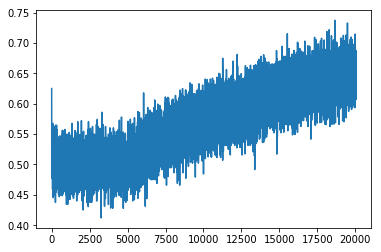

In [26]:
cartpole['acc'].plot()

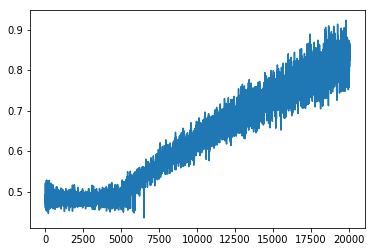

In [27]:
cartpole['loss'].plot()

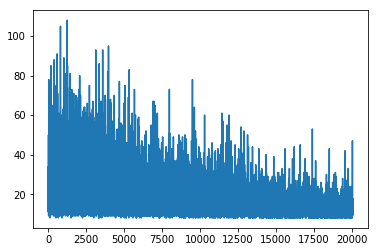

In [28]:
cartpole['episode_reward'].plot()

In [ ]:
## Second iteration
### Change value_min.1 in policy and value_test higher
### Decrease learning rate 

policy = LinearAnnealedPolicy(EpsGreedyQPolicy(), attr='eps', value_max=1., value_min=.1, value_test=.07,
                              nb_steps=1000000)

memory = SequentialMemory(limit=1000000, window_length=1)
dqn2 = DQNAgent(model=model2, nb_actions=nb_actions, memory=memory, nb_steps_warmup=50,
              target_model_update=1e-2, policy=policy)
dqn2.compile(Adam(lr=1e-2), metrics=['mae', 'acc'])

logs = FileLogger('cartpole2.csv', interval = 1)
s = Saver()
dqn2.fit(env, nb_steps=1e10,callbacks=[s,logs], visualize=False, verbose=2)
#dqn2.test(env, nb_episodes=10, visualize=True)

Training for 10000000000.0 steps ...
episode callback
         14/10000000000.0: episode: 1, duration: 0.468s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.118 [-1.696, 0.948], loss: --, mean_absolute_error: --, acc: --, mean_q: --, mean_eps: --
episode callback
         29/10000000000.0: episode: 2, duration: 0.029s, episode steps: 15, steps per second: 522, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.114 [-0.991, 1.839], loss: --, mean_absolute_error: --, acc: --, mean_q: --, mean_eps: --
episode callback
         59/10000000000.0: episode: 3, duration: 2.717s, episode steps: 30, steps per second: 11, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.129 [-0.560, 1.682], loss: 0.985315, mean_absolute_error: 0.908501, acc: 0.535156, mean_q: 0.8

episode callback
        537/10000000000.0: episode: 26, duration: 0.146s, episode steps: 18, steps per second: 123, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.094 [-0.842, 1.706], loss: 0.476134, mean_absolute_error: 0.734755, acc: 0.498264, mean_q: 0.543623, mean_eps: 0.999525
episode callback
        559/10000000000.0: episode: 27, duration: 0.174s, episode steps: 22, steps per second: 127, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.062 [-1.432, 0.814], loss: 0.501327, mean_absolute_error: 0.747644, acc: 0.492898, mean_q: 0.549337, mean_eps: 0.999507
episode callback
        581/10000000000.0: episode: 28, duration: 0.161s, episode steps: 22, steps per second: 137, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.121 [-0.742, 1.208], loss: 0.500654, mean_absolute_error: 0.748479

episode callback
       1136/10000000000.0: episode: 51, duration: 0.122s, episode steps: 14, steps per second: 115, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.095 [-2.687, 1.793], loss: 0.498997, mean_absolute_error: 0.746736, acc: 0.500000, mean_q: 0.530663, mean_eps: 0.998984
episode callback
       1153/10000000000.0: episode: 52, duration: 0.145s, episode steps: 17, steps per second: 117, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.078 [-1.551, 0.809], loss: 0.468245, mean_absolute_error: 0.731106, acc: 0.498162, mean_q: 0.548834, mean_eps: 0.998970
episode callback
       1186/10000000000.0: episode: 53, duration: 0.250s, episode steps: 33, steps per second: 132, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.004 [-1.007, 1.371], loss: 0.479212, mean_absolute_error: 0.7371

episode callback
       1764/10000000000.0: episode: 75, duration: 0.450s, episode steps: 66, steps per second: 147, episode reward: 66.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.470 [0.000, 1.000], mean observation: 0.116 [-0.847, 1.986], loss: 0.480028, mean_absolute_error: 0.734619, acc: 0.517045, mean_q: 0.559471, mean_eps: 0.998443
episode callback
       1794/10000000000.0: episode: 76, duration: 0.216s, episode steps: 30, steps per second: 139, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.071 [-0.638, 1.166], loss: 0.485711, mean_absolute_error: 0.740600, acc: 0.493750, mean_q: 0.520117, mean_eps: 0.998399
episode callback
       1811/10000000000.0: episode: 77, duration: 0.132s, episode steps: 17, steps per second: 129, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.059 [-1.762, 1.027], loss: 0.486358, mean_absolute_error: 0.741038

episode callback
       2336/10000000000.0: episode: 100, duration: 0.136s, episode steps: 17, steps per second: 125, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.102 [-1.893, 0.997], loss: 0.509606, mean_absolute_error: 0.749399, acc: 0.522059, mean_q: 0.568962, mean_eps: 0.997906
episode callback
       2359/10000000000.0: episode: 101, duration: 0.172s, episode steps: 23, steps per second: 133, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.103 [-2.072, 0.988], loss: 0.492916, mean_absolute_error: 0.743305, acc: 0.506793, mean_q: 0.516970, mean_eps: 0.997888
episode callback
       2370/10000000000.0: episode: 102, duration: 0.097s, episode steps: 11, steps per second: 114, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.142 [-1.377, 2.383], loss: 0.469238, mean_absolute_error: 0.73

episode callback
       2849/10000000000.0: episode: 124, duration: 0.191s, episode steps: 26, steps per second: 136, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.050 [-1.204, 0.590], loss: 0.479735, mean_absolute_error: 0.735815, acc: 0.503606, mean_q: 0.563738, mean_eps: 0.997448
episode callback
       2866/10000000000.0: episode: 125, duration: 0.132s, episode steps: 17, steps per second: 129, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.087 [-1.378, 2.274], loss: 0.487060, mean_absolute_error: 0.738801, acc: 0.531250, mean_q: 0.557238, mean_eps: 0.997429
episode callback
       2916/10000000000.0: episode: 126, duration: 0.334s, episode steps: 50, steps per second: 150, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.011 [-1.067, 1.207], loss: 0.485263, mean_absolute_error: 0.73

       3511/10000000000.0: episode: 148, duration: 0.202s, episode steps: 27, steps per second: 134, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.078 [-0.785, 1.601], loss: 0.497303, mean_absolute_error: 0.744284, acc: 0.515046, mean_q: 0.555641, mean_eps: 0.996853
episode callback
       3520/10000000000.0: episode: 149, duration: 0.086s, episode steps: 9, steps per second: 105, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.123 [-2.239, 1.378], loss: 0.469911, mean_absolute_error: 0.733683, acc: 0.475694, mean_q: 0.595868, mean_eps: 0.996837
episode callback
       3539/10000000000.0: episode: 150, duration: 0.158s, episode steps: 19, steps per second: 120, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.093 [-2.090, 1.214], loss: 0.506809, mean_absolute_error: 0.749708, acc: 0.496711

episode callback
       4011/10000000000.0: episode: 172, duration: 0.169s, episode steps: 21, steps per second: 124, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.085 [-1.639, 0.830], loss: 0.483811, mean_absolute_error: 0.736737, acc: 0.508929, mean_q: 0.583182, mean_eps: 0.996400
episode callback
       4030/10000000000.0: episode: 173, duration: 0.142s, episode steps: 19, steps per second: 134, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.114 [-1.655, 0.805], loss: 0.490460, mean_absolute_error: 0.740849, acc: 0.503289, mean_q: 0.576922, mean_eps: 0.996382
episode callback
       4046/10000000000.0: episode: 174, duration: 0.126s, episode steps: 16, steps per second: 127, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.066 [-0.970, 1.530], loss: 0.479391, mean_absolute_error: 0.73

episode callback
       4496/10000000000.0: episode: 197, duration: 0.203s, episode steps: 29, steps per second: 143, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.448 [0.000, 1.000], mean observation: 0.032 [-0.979, 1.611], loss: 0.470331, mean_absolute_error: 0.729330, acc: 0.533405, mean_q: 0.566781, mean_eps: 0.995967
episode callback
       4517/10000000000.0: episode: 198, duration: 0.154s, episode steps: 21, steps per second: 136, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.058 [-1.884, 1.026], loss: 0.490963, mean_absolute_error: 0.739491, acc: 0.513393, mean_q: 0.577358, mean_eps: 0.995945
episode callback
       4556/10000000000.0: episode: 199, duration: 0.263s, episode steps: 39, steps per second: 148, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.023 [-1.063, 1.391], loss: 0.486494, mean_absolute_error: 0.732

episode callback
       5127/10000000000.0: episode: 222, duration: 0.228s, episode steps: 33, steps per second: 145, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.606 [0.000, 1.000], mean observation: 0.012 [-1.808, 1.318], loss: 0.471040, mean_absolute_error: 0.730308, acc: 0.526515, mean_q: 0.549508, mean_eps: 0.995401
episode callback
       5138/10000000000.0: episode: 223, duration: 0.096s, episode steps: 11, steps per second: 115, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.134 [-2.449, 1.531], loss: 0.494692, mean_absolute_error: 0.734376, acc: 0.551136, mean_q: 0.631165, mean_eps: 0.995381
episode callback
       5157/10000000000.0: episode: 224, duration: 0.146s, episode steps: 19, steps per second: 130, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.082 [-0.629, 1.145], loss: 0.484960, mean_absolute_error: 0.741

episode callback
       5661/10000000000.0: episode: 247, duration: 0.465s, episode steps: 73, steps per second: 157, episode reward: 73.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.521 [0.000, 1.000], mean observation: -0.041 [-1.706, 0.984], loss: 0.482594, mean_absolute_error: 0.737984, acc: 0.498716, mean_q: 0.541530, mean_eps: 0.994938
episode callback
       5682/10000000000.0: episode: 248, duration: 0.155s, episode steps: 21, steps per second: 136, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.065 [-1.020, 1.831], loss: 0.476071, mean_absolute_error: 0.733929, acc: 0.507440, mean_q: 0.551005, mean_eps: 0.994896
episode callback
       5692/10000000000.0: episode: 249, duration: 0.093s, episode steps: 10, steps per second: 108, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.123 [-0.990, 1.651], loss: 0.487250, mean_absolute_error: 0.740

episode callback
       6182/10000000000.0: episode: 272, duration: 0.152s, episode steps: 20, steps per second: 132, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.093 [-1.213, 0.606], loss: 0.490044, mean_absolute_error: 0.741844, acc: 0.470313, mean_q: 0.573359, mean_eps: 0.994446
episode callback
       6244/10000000000.0: episode: 273, duration: 0.402s, episode steps: 62, steps per second: 154, episode reward: 62.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.532 [0.000, 1.000], mean observation: 0.258 [-0.770, 1.495], loss: 0.484244, mean_absolute_error: 0.738750, acc: 0.479335, mean_q: 0.566997, mean_eps: 0.994409
episode callback
       6307/10000000000.0: episode: 274, duration: 0.406s, episode steps: 63, steps per second: 155, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.587 [0.000, 1.000], mean observation: 0.138 [-2.095, 2.046], loss: 0.482043, mean_absolute_error: 0.736

episode callback
       6777/10000000000.0: episode: 297, duration: 0.130s, episode steps: 16, steps per second: 123, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.130 [-1.386, 0.574], loss: 0.492826, mean_absolute_error: 0.744222, acc: 0.496094, mean_q: 0.517245, mean_eps: 0.993908
episode callback
       6826/10000000000.0: episode: 298, duration: 0.322s, episode steps: 49, steps per second: 152, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.490 [0.000, 1.000], mean observation: 0.123 [-0.575, 1.556], loss: 0.481814, mean_absolute_error: 0.737779, acc: 0.488520, mean_q: 0.530820, mean_eps: 0.993879
episode callback
       6836/10000000000.0: episode: 299, duration: 0.091s, episode steps: 10, steps per second: 110, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.134 [-1.845, 1.127], loss: 0.491671, mean_absolute_error: 0.74

episode callback
       7333/10000000000.0: episode: 322, duration: 0.134s, episode steps: 17, steps per second: 127, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.085 [-0.597, 1.143], loss: 0.474713, mean_absolute_error: 0.734291, acc: 0.488971, mean_q: 0.551081, mean_eps: 0.993408
episode callback
       7345/10000000000.0: episode: 323, duration: 0.103s, episode steps: 12, steps per second: 116, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.126 [-2.082, 1.169], loss: 0.480679, mean_absolute_error: 0.737902, acc: 0.502604, mean_q: 0.526648, mean_eps: 0.993395
episode callback
       7375/10000000000.0: episode: 324, duration: 0.212s, episode steps: 30, steps per second: 142, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.087 [-1.913, 0.819], loss: 0.484815, mean_absolute_error: 0.73

episode callback
       7780/10000000000.0: episode: 346, duration: 0.164s, episode steps: 22, steps per second: 134, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.106 [-0.579, 1.321], loss: 0.488774, mean_absolute_error: 0.743115, acc: 0.497159, mean_q: 0.564034, mean_eps: 0.993008
episode callback
       7830/10000000000.0: episode: 347, duration: 0.331s, episode steps: 50, steps per second: 151, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.540 [0.000, 1.000], mean observation: 0.129 [-0.827, 1.289], loss: 0.478150, mean_absolute_error: 0.733386, acc: 0.508125, mean_q: 0.567083, mean_eps: 0.992976
episode callback
       7846/10000000000.0: episode: 348, duration: 0.128s, episode steps: 16, steps per second: 125, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.107 [-0.755, 1.469], loss: 0.494957, mean_absolute_error: 0.7446

episode callback
       8356/10000000000.0: episode: 371, duration: 0.113s, episode steps: 13, steps per second: 115, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.120 [-1.502, 0.952], loss: 0.495076, mean_absolute_error: 0.743752, acc: 0.502404, mean_q: 0.535773, mean_eps: 0.992486
episode callback
       8377/10000000000.0: episode: 372, duration: 0.159s, episode steps: 21, steps per second: 132, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.089 [-1.381, 0.585], loss: 0.475311, mean_absolute_error: 0.732388, acc: 0.502976, mean_q: 0.571388, mean_eps: 0.992471
episode callback
       8398/10000000000.0: episode: 373, duration: 0.160s, episode steps: 21, steps per second: 131, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.055 [-1.483, 1.009], loss: 0.507208, mean_absolute_error: 0.7

       8893/10000000000.0: episode: 395, duration: 0.179s, episode steps: 24, steps per second: 134, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.066 [-0.937, 1.601], loss: 0.498530, mean_absolute_error: 0.745442, acc: 0.501302, mean_q: 0.570442, mean_eps: 0.992008
episode callback
       8916/10000000000.0: episode: 396, duration: 0.170s, episode steps: 23, steps per second: 135, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.109 [-1.307, 0.762], loss: 0.471975, mean_absolute_error: 0.732368, acc: 0.497283, mean_q: 0.564595, mean_eps: 0.991986
episode callback
       8927/10000000000.0: episode: 397, duration: 0.102s, episode steps: 11, steps per second: 108, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.087 [-1.207, 1.898], loss: 0.485938, mean_absolute_error: 0.741857, acc: 0.44602

       9468/10000000000.0: episode: 419, duration: 0.180s, episode steps: 19, steps per second: 106, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: 0.042 [-1.004, 1.437], loss: 0.479709, mean_absolute_error: 0.737527, acc: 0.504934, mean_q: 0.534324, mean_eps: 0.991488
episode callback
       9485/10000000000.0: episode: 420, duration: 0.152s, episode steps: 17, steps per second: 112, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.077 [-1.188, 0.769], loss: 0.485730, mean_absolute_error: 0.737469, acc: 0.523897, mean_q: 0.578233, mean_eps: 0.991472
episode callback
       9505/10000000000.0: episode: 421, duration: 0.154s, episode steps: 20, steps per second: 130, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.057 [-1.663, 0.991], loss: 0.486643, mean_absolute_error: 0.742547, acc: 0.4421

episode callback
      10112/10000000000.0: episode: 444, duration: 0.371s, episode steps: 56, steps per second: 151, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.518 [0.000, 1.000], mean observation: -0.013 [-1.471, 0.829], loss: 0.495016, mean_absolute_error: 0.738945, acc: 0.527344, mean_q: 0.576749, mean_eps: 0.990925
episode callback
      10139/10000000000.0: episode: 445, duration: 0.197s, episode steps: 27, steps per second: 137, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.015 [-1.375, 1.012], loss: 0.464019, mean_absolute_error: 0.727579, acc: 0.496528, mean_q: 0.550937, mean_eps: 0.990888
episode callback
      10164/10000000000.0: episode: 446, duration: 0.185s, episode steps: 25, steps per second: 135, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: -0.106 [-1.202, 0.555], loss: 0.451743, mean_absolute_error: 0.7

episode callback
      10615/10000000000.0: episode: 468, duration: 0.120s, episode steps: 14, steps per second: 117, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.099 [-1.288, 0.643], loss: 0.505474, mean_absolute_error: 0.748463, acc: 0.515625, mean_q: 0.556414, mean_eps: 0.990453
episode callback
      10635/10000000000.0: episode: 469, duration: 0.155s, episode steps: 20, steps per second: 129, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: 0.119 [-0.386, 0.836], loss: 0.475230, mean_absolute_error: 0.735135, acc: 0.492188, mean_q: 0.555474, mean_eps: 0.990438
episode callback
      10679/10000000000.0: episode: 470, duration: 0.297s, episode steps: 44, steps per second: 148, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.185 [-1.001, 2.598], loss: 0.503718, mean_absolute_error: 0.745

episode callback
      11143/10000000000.0: episode: 492, duration: 0.171s, episode steps: 22, steps per second: 129, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.063 [-0.933, 1.465], loss: 0.470629, mean_absolute_error: 0.731932, acc: 0.519886, mean_q: 0.534328, mean_eps: 0.989982
episode callback
      11170/10000000000.0: episode: 493, duration: 0.223s, episode steps: 27, steps per second: 121, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.080 [-1.196, 2.096], loss: 0.484202, mean_absolute_error: 0.738566, acc: 0.515046, mean_q: 0.548877, mean_eps: 0.989960
episode callback
      11191/10000000000.0: episode: 494, duration: 0.180s, episode steps: 21, steps per second: 117, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.089 [-0.601, 1.217], loss: 0.479247, mean_absolute_error: 0.7324

episode callback
      11753/10000000000.0: episode: 516, duration: 0.407s, episode steps: 62, steps per second: 152, episode reward: 62.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.532 [0.000, 1.000], mean observation: -0.052 [-1.633, 0.994], loss: 0.487237, mean_absolute_error: 0.738679, acc: 0.503528, mean_q: 0.562362, mean_eps: 0.989451
episode callback
      11773/10000000000.0: episode: 517, duration: 0.156s, episode steps: 20, steps per second: 128, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.041 [-1.344, 1.893], loss: 0.516918, mean_absolute_error: 0.756523, acc: 0.509375, mean_q: 0.547393, mean_eps: 0.989414
episode callback
      11791/10000000000.0: episode: 518, duration: 0.147s, episode steps: 18, steps per second: 122, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.047 [-1.123, 0.829], loss: 0.513525, mean_absolute_error: 0.75

episode callback
      12207/10000000000.0: episode: 540, duration: 0.128s, episode steps: 14, steps per second: 110, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.088 [-2.732, 1.786], loss: 0.505847, mean_absolute_error: 0.744177, acc: 0.531250, mean_q: 0.611648, mean_eps: 0.989020
episode callback
      12226/10000000000.0: episode: 541, duration: 0.151s, episode steps: 19, steps per second: 126, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.057 [-1.015, 1.770], loss: 0.472970, mean_absolute_error: 0.729700, acc: 0.534539, mean_q: 0.568593, mean_eps: 0.989006
episode callback
      12241/10000000000.0: episode: 542, duration: 0.134s, episode steps: 15, steps per second: 112, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.085 [-1.192, 1.866], loss: 0.476696, mean_absolute_error: 0.734

episode callback
      12722/10000000000.0: episode: 565, duration: 0.260s, episode steps: 35, steps per second: 134, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.081 [-1.155, 0.544], loss: 0.522519, mean_absolute_error: 0.756022, acc: 0.522321, mean_q: 0.556418, mean_eps: 0.988566
episode callback
      12732/10000000000.0: episode: 566, duration: 0.100s, episode steps: 10, steps per second: 100, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.142 [-0.936, 1.688], loss: 0.435846, mean_absolute_error: 0.708404, acc: 0.534375, mean_q: 0.597828, mean_eps: 0.988546
episode callback
      12743/10000000000.0: episode: 567, duration: 0.104s, episode steps: 11, steps per second: 105, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.091 [-2.414, 1.577], loss: 0.480013, mean_absolute_error: 0.73

episode callback
      13263/10000000000.0: episode: 589, duration: 0.328s, episode steps: 46, steps per second: 140, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: -0.004 [-1.171, 1.772], loss: 0.479104, mean_absolute_error: 0.735353, acc: 0.502717, mean_q: 0.561417, mean_eps: 0.988084
episode callback
      13291/10000000000.0: episode: 590, duration: 0.209s, episode steps: 28, steps per second: 134, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.393 [0.000, 1.000], mean observation: 0.051 [-1.165, 2.018], loss: 0.475833, mean_absolute_error: 0.734225, acc: 0.502232, mean_q: 0.534097, mean_eps: 0.988051
episode callback
      13307/10000000000.0: episode: 591, duration: 0.135s, episode steps: 16, steps per second: 118, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.084 [-1.177, 2.017], loss: 0.488521, mean_absolute_error: 0.742

episode callback
      13778/10000000000.0: episode: 613, duration: 0.140s, episode steps: 17, steps per second: 121, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.071 [-1.510, 0.961], loss: 0.486212, mean_absolute_error: 0.734680, acc: 0.545956, mean_q: 0.582147, mean_eps: 0.987608
episode callback
      13794/10000000000.0: episode: 614, duration: 0.134s, episode steps: 16, steps per second: 120, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.110 [-2.058, 1.150], loss: 0.493832, mean_absolute_error: 0.742248, acc: 0.490234, mean_q: 0.563312, mean_eps: 0.987593
episode callback
      13812/10000000000.0: episode: 615, duration: 0.147s, episode steps: 18, steps per second: 122, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.071 [-0.820, 1.585], loss: 0.470359, mean_absolute_error: 0.73

episode callback
      14299/10000000000.0: episode: 637, duration: 0.195s, episode steps: 26, steps per second: 134, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.105 [-0.576, 1.290], loss: 0.491984, mean_absolute_error: 0.743337, acc: 0.474760, mean_q: 0.519704, mean_eps: 0.987143
episode callback
      14312/10000000000.0: episode: 638, duration: 0.116s, episode steps: 13, steps per second: 112, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.076 [-1.215, 0.824], loss: 0.459002, mean_absolute_error: 0.723075, acc: 0.519231, mean_q: 0.591242, mean_eps: 0.987125
episode callback
      14333/10000000000.0: episode: 639, duration: 0.169s, episode steps: 21, steps per second: 124, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.084 [-1.326, 0.741], loss: 0.485200, mean_absolute_error: 0.73

episode callback
      14772/10000000000.0: episode: 662, duration: 0.166s, episode steps: 21, steps per second: 126, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.051 [-2.455, 1.588], loss: 0.478068, mean_absolute_error: 0.732280, acc: 0.502976, mean_q: 0.598538, mean_eps: 0.986715
episode callback
      14788/10000000000.0: episode: 663, duration: 0.138s, episode steps: 16, steps per second: 116, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.080 [-1.229, 2.095], loss: 0.481816, mean_absolute_error: 0.737557, acc: 0.480469, mean_q: 0.545162, mean_eps: 0.986698
episode callback
      14801/10000000000.0: episode: 664, duration: 0.119s, episode steps: 13, steps per second: 109, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.114 [-1.616, 0.963], loss: 0.481101, mean_absolute_error: 0.73

episode callback
      15332/10000000000.0: episode: 686, duration: 0.126s, episode steps: 14, steps per second: 112, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.086 [-1.522, 0.839], loss: 0.484893, mean_absolute_error: 0.738766, acc: 0.520089, mean_q: 0.543549, mean_eps: 0.986208
episode callback
      15379/10000000000.0: episode: 687, duration: 0.321s, episode steps: 47, steps per second: 146, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.532 [0.000, 1.000], mean observation: -0.012 [-1.625, 0.830], loss: 0.477653, mean_absolute_error: 0.736091, acc: 0.482713, mean_q: 0.532146, mean_eps: 0.986181
episode callback
      15397/10000000000.0: episode: 688, duration: 0.151s, episode steps: 18, steps per second: 119, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.083 [-0.964, 1.684], loss: 0.483159, mean_absolute_error: 0.73

episode callback
      15855/10000000000.0: episode: 711, duration: 0.167s, episode steps: 21, steps per second: 126, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.095 [-1.434, 0.612], loss: 0.499111, mean_absolute_error: 0.737586, acc: 0.546131, mean_q: 0.610566, mean_eps: 0.985740
episode callback
      15900/10000000000.0: episode: 712, duration: 0.311s, episode steps: 45, steps per second: 145, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.084 [-1.913, 1.066], loss: 0.474024, mean_absolute_error: 0.733763, acc: 0.484028, mean_q: 0.525477, mean_eps: 0.985711
episode callback
      15937/10000000000.0: episode: 713, duration: 0.267s, episode steps: 37, steps per second: 138, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.405 [0.000, 1.000], mean observation: -0.045 [-1.394, 1.703], loss: 0.473566, mean_absolute_error: 0.7

episode callback
      16408/10000000000.0: episode: 736, duration: 0.232s, episode steps: 32, steps per second: 138, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.126 [-0.598, 1.675], loss: 0.492174, mean_absolute_error: 0.743059, acc: 0.486328, mean_q: 0.550762, mean_eps: 0.985248
episode callback
      16438/10000000000.0: episode: 737, duration: 0.220s, episode steps: 30, steps per second: 137, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.055 [-1.392, 0.974], loss: 0.498758, mean_absolute_error: 0.744310, acc: 0.501042, mean_q: 0.571597, mean_eps: 0.985220
episode callback
      16457/10000000000.0: episode: 738, duration: 0.158s, episode steps: 19, steps per second: 121, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.073 [-0.813, 1.300], loss: 0.457665, mean_absolute_error: 0.725

episode callback
      16956/10000000000.0: episode: 761, duration: 0.108s, episode steps: 11, steps per second: 102, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.128 [-2.355, 1.364], loss: 0.489148, mean_absolute_error: 0.744307, acc: 0.437500, mean_q: 0.549386, mean_eps: 0.984745
episode callback
      17004/10000000000.0: episode: 762, duration: 0.327s, episode steps: 48, steps per second: 147, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: -0.058 [-1.388, 1.701], loss: 0.482139, mean_absolute_error: 0.738648, acc: 0.480469, mean_q: 0.522388, mean_eps: 0.984718
episode callback
      17030/10000000000.0: episode: 763, duration: 0.196s, episode steps: 26, steps per second: 133, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.077 [-0.883, 0.621], loss: 0.488118, mean_absolute_error: 0.7

episode callback
      17599/10000000000.0: episode: 785, duration: 0.206s, episode steps: 27, steps per second: 131, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.052 [-1.107, 0.799], loss: 0.477463, mean_absolute_error: 0.734090, acc: 0.527778, mean_q: 0.561003, mean_eps: 0.984173
episode callback
      17608/10000000000.0: episode: 786, duration: 0.096s, episode steps: 9, steps per second: 94, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.172 [-1.714, 2.889], loss: 0.479861, mean_absolute_error: 0.734377, acc: 0.545139, mean_q: 0.545336, mean_eps: 0.984157
episode callback
      17676/10000000000.0: episode: 787, duration: 0.446s, episode steps: 68, steps per second: 152, episode reward: 68.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: -0.255 [-1.721, 1.212], loss: 0.481671, mean_absolute_error: 0.73745

episode callback
      18111/10000000000.0: episode: 810, duration: 0.122s, episode steps: 13, steps per second: 106, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.100 [-1.284, 0.771], loss: 0.465588, mean_absolute_error: 0.729072, acc: 0.509615, mean_q: 0.531005, mean_eps: 0.983706
episode callback
      18130/10000000000.0: episode: 811, duration: 0.155s, episode steps: 19, steps per second: 122, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.063 [-1.859, 1.161], loss: 0.486382, mean_absolute_error: 0.739089, acc: 0.511513, mean_q: 0.571755, mean_eps: 0.983692
episode callback
      18154/10000000000.0: episode: 812, duration: 0.191s, episode steps: 24, steps per second: 126, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: 0.115 [-0.748, 1.269], loss: 0.485006, mean_absolute_error: 0.73

episode callback
      18627/10000000000.0: episode: 834, duration: 0.199s, episode steps: 26, steps per second: 131, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.050 [-1.115, 0.783], loss: 0.481007, mean_absolute_error: 0.738329, acc: 0.483173, mean_q: 0.538445, mean_eps: 0.983248
episode callback
      18655/10000000000.0: episode: 835, duration: 0.213s, episode steps: 28, steps per second: 132, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.536 [0.000, 1.000], mean observation: -0.072 [-1.243, 0.763], loss: 0.482048, mean_absolute_error: 0.738098, acc: 0.486607, mean_q: 0.540824, mean_eps: 0.983224
episode callback
      18673/10000000000.0: episode: 836, duration: 0.153s, episode steps: 18, steps per second: 117, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.075 [-1.134, 1.900], loss: 0.486522, mean_absolute_error: 0.73

episode callback
      19146/10000000000.0: episode: 859, duration: 0.128s, episode steps: 14, steps per second: 110, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.117 [-1.469, 0.765], loss: 0.491887, mean_absolute_error: 0.741316, acc: 0.524554, mean_q: 0.547332, mean_eps: 0.982775
episode callback
      19159/10000000000.0: episode: 860, duration: 0.121s, episode steps: 13, steps per second: 108, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.100 [-2.290, 1.383], loss: 0.468803, mean_absolute_error: 0.728757, acc: 0.504808, mean_q: 0.549355, mean_eps: 0.982763
episode callback
      19175/10000000000.0: episode: 861, duration: 0.143s, episode steps: 16, steps per second: 112, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.078 [-1.520, 0.978], loss: 0.479620, mean_absolute_error: 0.7

episode callback
      19681/10000000000.0: episode: 883, duration: 0.146s, episode steps: 17, steps per second: 116, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: 0.110 [-0.766, 1.196], loss: 0.479863, mean_absolute_error: 0.737124, acc: 0.509191, mean_q: 0.515425, mean_eps: 0.982295
episode callback
      19700/10000000000.0: episode: 884, duration: 0.161s, episode steps: 19, steps per second: 118, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.084 [-2.256, 1.326], loss: 0.481828, mean_absolute_error: 0.737458, acc: 0.483553, mean_q: 0.547057, mean_eps: 0.982279
episode callback
      19711/10000000000.0: episode: 885, duration: 0.112s, episode steps: 11, steps per second: 99, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.093 [-1.415, 2.307], loss: 0.476669, mean_absolute_error: 0.7348

episode callback
      20238/10000000000.0: episode: 908, duration: 0.255s, episode steps: 35, steps per second: 137, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: -0.028 [-1.611, 0.956], loss: 0.484245, mean_absolute_error: 0.739197, acc: 0.496429, mean_q: 0.537340, mean_eps: 0.981802
episode callback
      20261/10000000000.0: episode: 909, duration: 0.180s, episode steps: 23, steps per second: 128, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.097 [-0.994, 1.493], loss: 0.467422, mean_absolute_error: 0.731265, acc: 0.505435, mean_q: 0.522980, mean_eps: 0.981776
episode callback
      20290/10000000000.0: episode: 910, duration: 0.223s, episode steps: 29, steps per second: 130, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.030 [-1.154, 1.569], loss: 0.479678, mean_absolute_error: 0.736

episode callback
      20807/10000000000.0: episode: 932, duration: 0.251s, episode steps: 34, steps per second: 136, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: -0.010 [-0.926, 1.384], loss: 0.478327, mean_absolute_error: 0.735897, acc: 0.481618, mean_q: 0.547127, mean_eps: 0.981289
episode callback
      20826/10000000000.0: episode: 933, duration: 0.161s, episode steps: 19, steps per second: 118, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.060 [-1.260, 0.825], loss: 0.470140, mean_absolute_error: 0.728920, acc: 0.514803, mean_q: 0.566990, mean_eps: 0.981266
episode callback
      20840/10000000000.0: episode: 934, duration: 0.144s, episode steps: 14, steps per second: 97, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.122 [-1.462, 0.745], loss: 0.480112, mean_absolute_error: 0.73

episode callback
      21276/10000000000.0: episode: 957, duration: 0.168s, episode steps: 20, steps per second: 119, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.098 [-1.750, 0.802], loss: 0.488298, mean_absolute_error: 0.738650, acc: 0.521875, mean_q: 0.572622, mean_eps: 0.980861
episode callback
      21291/10000000000.0: episode: 958, duration: 0.136s, episode steps: 15, steps per second: 110, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.089 [-1.842, 1.140], loss: 0.481971, mean_absolute_error: 0.739434, acc: 0.477083, mean_q: 0.530286, mean_eps: 0.980845
episode callback
      21316/10000000000.0: episode: 959, duration: 0.202s, episode steps: 25, steps per second: 123, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.034 [-1.376, 2.037], loss: 0.478451, mean_absolute_error: 0.73

episode callback
      21784/10000000000.0: episode: 981, duration: 0.213s, episode steps: 28, steps per second: 131, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.464 [0.000, 1.000], mean observation: 0.093 [-0.791, 1.476], loss: 0.469792, mean_absolute_error: 0.724394, acc: 0.535714, mean_q: 0.606729, mean_eps: 0.980407
episode callback
      21830/10000000000.0: episode: 982, duration: 0.319s, episode steps: 46, steps per second: 144, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.457 [0.000, 1.000], mean observation: 0.053 [-0.807, 1.952], loss: 0.475195, mean_absolute_error: 0.735042, acc: 0.457201, mean_q: 0.514590, mean_eps: 0.980374
episode callback
      21843/10000000000.0: episode: 983, duration: 0.130s, episode steps: 13, steps per second: 100, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.138, 1.929], loss: 0.482687, mean_absolute_error: 0.7398

episode callback
      22337/10000000000.0: episode: 1005, duration: 0.143s, episode steps: 15, steps per second: 105, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.136 [-0.963, 1.930], loss: 0.486053, mean_absolute_error: 0.741613, acc: 0.470833, mean_q: 0.536150, mean_eps: 0.979904
episode callback
      22355/10000000000.0: episode: 1006, duration: 0.158s, episode steps: 18, steps per second: 114, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.070 [-1.162, 0.778], loss: 0.480796, mean_absolute_error: 0.738520, acc: 0.484375, mean_q: 0.535272, mean_eps: 0.979889
episode callback
      22375/10000000000.0: episode: 1007, duration: 0.166s, episode steps: 20, steps per second: 121, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.078 [-1.602, 0.790], loss: 0.488876, mean_absolute_error: 0

      22859/10000000000.0: episode: 1029, duration: 0.176s, episode steps: 21, steps per second: 119, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.016 [-1.801, 1.340], loss: 0.479740, mean_absolute_error: 0.735217, acc: 0.500000, mean_q: 0.560413, mean_eps: 0.979437
episode callback
      22877/10000000000.0: episode: 1030, duration: 0.158s, episode steps: 18, steps per second: 114, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.059 [-1.520, 1.020], loss: 0.485106, mean_absolute_error: 0.738795, acc: 0.496528, mean_q: 0.573300, mean_eps: 0.979419
episode callback
      22915/10000000000.0: episode: 1031, duration: 0.277s, episode steps: 38, steps per second: 137, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.068 [-1.183, 2.063], loss: 0.481828, mean_absolute_error: 0.737978, acc: 0.4

episode callback
      23363/10000000000.0: episode: 1054, duration: 0.202s, episode steps: 25, steps per second: 124, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.077 [-0.954, 1.761], loss: 0.476656, mean_absolute_error: 0.734129, acc: 0.512500, mean_q: 0.535057, mean_eps: 0.978985
episode callback
      23409/10000000000.0: episode: 1055, duration: 0.321s, episode steps: 46, steps per second: 143, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: 0.074 [-1.808, 1.692], loss: 0.486241, mean_absolute_error: 0.736938, acc: 0.497962, mean_q: 0.586684, mean_eps: 0.978953
episode callback
      23420/10000000000.0: episode: 1056, duration: 0.117s, episode steps: 11, steps per second: 94, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.140 [-1.393, 2.293], loss: 0.474061, mean_absolute_error: 0.73

episode callback
      23832/10000000000.0: episode: 1078, duration: 0.307s, episode steps: 43, steps per second: 140, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: 0.050 [-0.623, 0.832], loss: 0.477377, mean_absolute_error: 0.734474, acc: 0.496366, mean_q: 0.554428, mean_eps: 0.978571
episode callback
      23853/10000000000.0: episode: 1079, duration: 0.177s, episode steps: 21, steps per second: 118, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.052 [-0.978, 1.513], loss: 0.483590, mean_absolute_error: 0.739407, acc: 0.495536, mean_q: 0.532278, mean_eps: 0.978542
episode callback
      23870/10000000000.0: episode: 1080, duration: 0.149s, episode steps: 17, steps per second: 114, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.079 [-1.160, 1.987], loss: 0.470611, mean_absolute_error: 0.7

episode callback
      24413/10000000000.0: episode: 1102, duration: 0.217s, episode steps: 28, steps per second: 129, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.080 [-1.191, 0.596], loss: 0.481113, mean_absolute_error: 0.737089, acc: 0.493304, mean_q: 0.556278, mean_eps: 0.978041
episode callback
      24429/10000000000.0: episode: 1103, duration: 0.149s, episode steps: 16, steps per second: 107, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.086 [-0.760, 1.371], loss: 0.480911, mean_absolute_error: 0.738816, acc: 0.492188, mean_q: 0.533178, mean_eps: 0.978022
episode callback
      24439/10000000000.0: episode: 1104, duration: 0.123s, episode steps: 10, steps per second: 81, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.103 [-1.028, 1.527], loss: 0.492969, mean_absolute_error: 0.7

episode callback
      24952/10000000000.0: episode: 1126, duration: 0.302s, episode steps: 42, steps per second: 139, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: -0.032 [-1.383, 1.590], loss: 0.481968, mean_absolute_error: 0.737944, acc: 0.494792, mean_q: 0.543427, mean_eps: 0.977563
episode callback
      24975/10000000000.0: episode: 1127, duration: 0.188s, episode steps: 23, steps per second: 122, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.090 [-1.275, 0.749], loss: 0.479069, mean_absolute_error: 0.736870, acc: 0.485054, mean_q: 0.516045, mean_eps: 0.977533
episode callback
      24996/10000000000.0: episode: 1128, duration: 0.174s, episode steps: 21, steps per second: 121, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.057 [-2.231, 1.373], loss: 0.478734, mean_absolute_error: 

episode callback
      25469/10000000000.0: episode: 1150, duration: 0.128s, episode steps: 13, steps per second: 101, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.086 [-1.173, 1.715], loss: 0.480691, mean_absolute_error: 0.738924, acc: 0.463942, mean_q: 0.516605, mean_eps: 0.977084
episode callback
      25485/10000000000.0: episode: 1151, duration: 0.148s, episode steps: 16, steps per second: 108, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.103 [-1.528, 0.806], loss: 0.477606, mean_absolute_error: 0.735356, acc: 0.503906, mean_q: 0.524701, mean_eps: 0.977071
episode callback
      25505/10000000000.0: episode: 1152, duration: 0.168s, episode steps: 20, steps per second: 119, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.098 [-1.241, 0.447], loss: 0.481655, mean_absolute_error: 0

      26067/10000000000.0: episode: 1174, duration: 0.181s, episode steps: 22, steps per second: 121, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.055 [-0.868, 1.283], loss: 0.497272, mean_absolute_error: 0.745901, acc: 0.514205, mean_q: 0.534813, mean_eps: 0.976550
episode callback
      26097/10000000000.0: episode: 1175, duration: 0.230s, episode steps: 30, steps per second: 130, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: -0.049 [-1.186, 0.785], loss: 0.482004, mean_absolute_error: 0.737733, acc: 0.510417, mean_q: 0.552570, mean_eps: 0.976527
episode callback
      26107/10000000000.0: episode: 1176, duration: 0.109s, episode steps: 10, steps per second: 92, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.141 [-1.577, 2.589], loss: 0.479892, mean_absolute_error: 0.732375, acc: 0.521

episode callback
      26554/10000000000.0: episode: 1198, duration: 0.229s, episode steps: 30, steps per second: 131, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: -0.001 [-1.137, 1.562], loss: 0.486557, mean_absolute_error: 0.740817, acc: 0.489583, mean_q: 0.517651, mean_eps: 0.976115
episode callback
      26596/10000000000.0: episode: 1199, duration: 0.301s, episode steps: 42, steps per second: 139, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.046 [-1.546, 0.770], loss: 0.478107, mean_absolute_error: 0.735049, acc: 0.512649, mean_q: 0.551654, mean_eps: 0.976083
episode callback
      26610/10000000000.0: episode: 1200, duration: 0.134s, episode steps: 14, steps per second: 105, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.106 [-0.617, 1.243], loss: 0.480786, mean_absolute_error: 0

episode callback
      27101/10000000000.0: episode: 1222, duration: 0.302s, episode steps: 42, steps per second: 139, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: 0.020 [-2.057, 1.720], loss: 0.486381, mean_absolute_error: 0.739360, acc: 0.517113, mean_q: 0.539285, mean_eps: 0.975628
episode callback
      27112/10000000000.0: episode: 1223, duration: 0.121s, episode steps: 11, steps per second: 91, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.106 [-1.801, 1.175], loss: 0.482525, mean_absolute_error: 0.736064, acc: 0.519886, mean_q: 0.605755, mean_eps: 0.975605
episode callback
      27134/10000000000.0: episode: 1224, duration: 0.183s, episode steps: 22, steps per second: 120, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.057 [-2.059, 1.226], loss: 0.487639, mean_absolute_error: 0.

episode callback
      27695/10000000000.0: episode: 1246, duration: 0.306s, episode steps: 43, steps per second: 140, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: -0.053 [-1.709, 0.982], loss: 0.476745, mean_absolute_error: 0.734937, acc: 0.492733, mean_q: 0.541416, mean_eps: 0.975094
episode callback
      27738/10000000000.0: episode: 1247, duration: 0.309s, episode steps: 43, steps per second: 139, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: 0.134 [-0.690, 1.098], loss: 0.488916, mean_absolute_error: 0.742193, acc: 0.488372, mean_q: 0.529790, mean_eps: 0.975056
episode callback
      27791/10000000000.0: episode: 1248, duration: 0.376s, episode steps: 53, steps per second: 141, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.434 [0.000, 1.000], mean observation: 0.101 [-1.340, 2.415], loss: 0.482586, mean_absolute_error: 0.

episode callback
      28187/10000000000.0: episode: 1270, duration: 0.330s, episode steps: 46, steps per second: 139, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: -0.125 [-1.946, 2.123], loss: 0.482124, mean_absolute_error: 0.736576, acc: 0.510870, mean_q: 0.562414, mean_eps: 0.974653
episode callback
      28204/10000000000.0: episode: 1271, duration: 0.152s, episode steps: 17, steps per second: 112, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.097 [-0.835, 1.568], loss: 0.473992, mean_absolute_error: 0.732716, acc: 0.512868, mean_q: 0.571941, mean_eps: 0.974624
episode callback
      28219/10000000000.0: episode: 1272, duration: 0.146s, episode steps: 15, steps per second: 103, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.092 [-1.370, 0.781], loss: 0.481240, mean_absolute_error: 0

      28725/10000000000.0: episode: 1294, duration: 0.166s, episode steps: 19, steps per second: 114, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.106 [-1.383, 0.578], loss: 0.471786, mean_absolute_error: 0.726615, acc: 0.524671, mean_q: 0.579260, mean_eps: 0.974157
episode callback
      28743/10000000000.0: episode: 1295, duration: 0.164s, episode steps: 18, steps per second: 109, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.079 [-2.075, 1.169], loss: 0.487304, mean_absolute_error: 0.734969, acc: 0.539931, mean_q: 0.592124, mean_eps: 0.974140
episode callback
      28819/10000000000.0: episode: 1296, duration: 0.509s, episode steps: 76, steps per second: 149, episode reward: 76.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.513 [0.000, 1.000], mean observation: 0.172 [-0.743, 1.407], loss: 0.478052, mean_absolute_error: 0.734684, acc: 0.5

episode callback
      29414/10000000000.0: episode: 1318, duration: 0.298s, episode steps: 41, steps per second: 138, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.463 [0.000, 1.000], mean observation: 0.075 [-0.753, 1.717], loss: 0.482538, mean_absolute_error: 0.739717, acc: 0.478659, mean_q: 0.544249, mean_eps: 0.973546
episode callback
      29431/10000000000.0: episode: 1319, duration: 0.154s, episode steps: 17, steps per second: 111, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.071 [-1.925, 1.167], loss: 0.470962, mean_absolute_error: 0.731503, acc: 0.514706, mean_q: 0.518819, mean_eps: 0.973520
episode callback
      29460/10000000000.0: episode: 1320, duration: 0.227s, episode steps: 29, steps per second: 128, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.038 [-0.936, 1.343], loss: 0.482403, mean_absolute_error: 0.

      29937/10000000000.0: episode: 1343, duration: 0.178s, episode steps: 20, steps per second: 113, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.069 [-0.830, 1.612], loss: 0.475626, mean_absolute_error: 0.734252, acc: 0.473438, mean_q: 0.539500, mean_eps: 0.973066
episode callback
      29968/10000000000.0: episode: 1344, duration: 0.249s, episode steps: 31, steps per second: 125, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.581 [0.000, 1.000], mean observation: -0.047 [-2.032, 1.017], loss: 0.481123, mean_absolute_error: 0.737097, acc: 0.513105, mean_q: 0.546132, mean_eps: 0.973043
episode callback
      29988/10000000000.0: episode: 1345, duration: 0.174s, episode steps: 20, steps per second: 115, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.113 [-0.565, 1.313], loss: 0.489336, mean_absolute_error: 0.740057, acc: 0.52

episode callback
      30504/10000000000.0: episode: 1368, duration: 0.168s, episode steps: 19, steps per second: 113, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.064 [-2.798, 1.778], loss: 0.475961, mean_absolute_error: 0.735249, acc: 0.511513, mean_q: 0.509223, mean_eps: 0.972555
episode callback
      30519/10000000000.0: episode: 1369, duration: 0.144s, episode steps: 15, steps per second: 104, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.063 [-1.372, 2.094], loss: 0.482142, mean_absolute_error: 0.739261, acc: 0.450000, mean_q: 0.550290, mean_eps: 0.972540
episode callback
      30531/10000000000.0: episode: 1370, duration: 0.126s, episode steps: 12, steps per second: 95, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.088 [-1.362, 0.836], loss: 0.496947, mean_absolute_error: 0.

      30932/10000000000.0: episode: 1392, duration: 0.183s, episode steps: 20, steps per second: 109, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.067 [-1.034, 1.801], loss: 0.486140, mean_absolute_error: 0.740444, acc: 0.485938, mean_q: 0.536594, mean_eps: 0.972171
episode callback
      30965/10000000000.0: episode: 1393, duration: 0.260s, episode steps: 33, steps per second: 127, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.515 [0.000, 1.000], mean observation: -0.060 [-1.113, 0.725], loss: 0.483286, mean_absolute_error: 0.738694, acc: 0.485795, mean_q: 0.565578, mean_eps: 0.972147
episode callback
      30996/10000000000.0: episode: 1394, duration: 0.241s, episode steps: 31, steps per second: 129, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.581 [0.000, 1.000], mean observation: -0.029 [-1.882, 1.162], loss: 0.478614, mean_absolute_error: 0.735884, acc: 0.5

episode callback
      31504/10000000000.0: episode: 1418, duration: 0.117s, episode steps: 10, steps per second: 85, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.132 [-1.772, 2.707], loss: 0.506390, mean_absolute_error: 0.750696, acc: 0.478125, mean_q: 0.555617, mean_eps: 0.971651
episode callback
      31532/10000000000.0: episode: 1419, duration: 0.252s, episode steps: 28, steps per second: 111, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.046 [-1.170, 1.853], loss: 0.477552, mean_absolute_error: 0.736092, acc: 0.488839, mean_q: 0.521192, mean_eps: 0.971634
episode callback
      31543/10000000000.0: episode: 1420, duration: 0.120s, episode steps: 11, steps per second: 92, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.112 [-1.406, 2.287], loss: 0.471629, mean_absolute_error: 0.733

episode callback
      32119/10000000000.0: episode: 1443, duration: 0.258s, episode steps: 34, steps per second: 132, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: 0.039 [-1.162, 1.741], loss: 0.491371, mean_absolute_error: 0.742955, acc: 0.479779, mean_q: 0.517885, mean_eps: 0.971109
episode callback
      32135/10000000000.0: episode: 1444, duration: 0.152s, episode steps: 16, steps per second: 105, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: -0.094 [-1.431, 0.931], loss: 0.489964, mean_absolute_error: 0.743094, acc: 0.482422, mean_q: 0.544432, mean_eps: 0.971086
episode callback
      32165/10000000000.0: episode: 1445, duration: 0.234s, episode steps: 30, steps per second: 128, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.009 [-1.379, 1.839], loss: 0.478625, mean_absolute_error: 0

episode callback
      32582/10000000000.0: episode: 1467, duration: 0.140s, episode steps: 14, steps per second: 100, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.104 [-0.998, 1.675], loss: 0.480248, mean_absolute_error: 0.738296, acc: 0.437500, mean_q: 0.525414, mean_eps: 0.970683
episode callback
      32594/10000000000.0: episode: 1468, duration: 0.128s, episode steps: 12, steps per second: 94, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.099 [-1.199, 2.020], loss: 0.473042, mean_absolute_error: 0.730864, acc: 0.518229, mean_q: 0.573981, mean_eps: 0.970671
episode callback
      32624/10000000000.0: episode: 1469, duration: 0.239s, episode steps: 30, steps per second: 125, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.053 [-1.354, 2.228], loss: 0.482767, mean_absolute_error: 0.73

episode callback
      33102/10000000000.0: episode: 1491, duration: 0.181s, episode steps: 20, steps per second: 111, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.031 [-1.550, 2.308], loss: 0.477974, mean_absolute_error: 0.734073, acc: 0.517188, mean_q: 0.551516, mean_eps: 0.970218
episode callback
      33120/10000000000.0: episode: 1492, duration: 0.164s, episode steps: 18, steps per second: 110, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.067 [-0.957, 1.476], loss: 0.479449, mean_absolute_error: 0.736530, acc: 0.475694, mean_q: 0.567470, mean_eps: 0.970201
episode callback
      33136/10000000000.0: episode: 1493, duration: 0.155s, episode steps: 16, steps per second: 103, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.085 [-0.842, 1.586], loss: 0.480172, mean_absolute_error: 0.7

episode callback
      33550/10000000000.0: episode: 1515, duration: 0.171s, episode steps: 19, steps per second: 111, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.079 [-1.453, 0.815], loss: 0.503682, mean_absolute_error: 0.746470, acc: 0.513158, mean_q: 0.572445, mean_eps: 0.969814
episode callback
      33569/10000000000.0: episode: 1516, duration: 0.172s, episode steps: 19, steps per second: 110, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.093 [-0.939, 1.681], loss: 0.471354, mean_absolute_error: 0.732284, acc: 0.491776, mean_q: 0.565153, mean_eps: 0.969797
episode callback
      33587/10000000000.0: episode: 1517, duration: 0.169s, episode steps: 18, steps per second: 107, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.069 [-1.942, 1.190], loss: 0.479876, mean_absolute_error: 0

episode callback
      34064/10000000000.0: episode: 1540, duration: 0.151s, episode steps: 15, steps per second: 99, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.085 [-0.811, 1.383], loss: 0.486431, mean_absolute_error: 0.741404, acc: 0.502083, mean_q: 0.532782, mean_eps: 0.969350
episode callback
      34078/10000000000.0: episode: 1541, duration: 0.140s, episode steps: 14, steps per second: 100, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.095 [-1.670, 0.991], loss: 0.487611, mean_absolute_error: 0.738249, acc: 0.529018, mean_q: 0.579451, mean_eps: 0.969337
episode callback
      34104/10000000000.0: episode: 1542, duration: 0.214s, episode steps: 26, steps per second: 122, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.091 [-1.141, 2.151], loss: 0.478473, mean_absolute_error: 0.7

episode callback
      34592/10000000000.0: episode: 1565, duration: 0.156s, episode steps: 16, steps per second: 102, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.094 [-1.777, 0.959], loss: 0.495096, mean_absolute_error: 0.741976, acc: 0.496094, mean_q: 0.598370, mean_eps: 0.968875
episode callback
      34617/10000000000.0: episode: 1566, duration: 0.212s, episode steps: 25, steps per second: 118, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.105 [-0.557, 1.156], loss: 0.494411, mean_absolute_error: 0.744880, acc: 0.496250, mean_q: 0.538328, mean_eps: 0.968856
episode callback
      34647/10000000000.0: episode: 1567, duration: 0.238s, episode steps: 30, steps per second: 126, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.099 [-2.009, 0.984], loss: 0.479687, mean_absolute_error: 0

episode callback
      35126/10000000000.0: episode: 1589, duration: 0.173s, episode steps: 19, steps per second: 110, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.052 [-1.355, 0.810], loss: 0.481804, mean_absolute_error: 0.739067, acc: 0.473684, mean_q: 0.519404, mean_eps: 0.968396
episode callback
      35142/10000000000.0: episode: 1590, duration: 0.153s, episode steps: 16, steps per second: 105, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.085 [-1.639, 0.983], loss: 0.481401, mean_absolute_error: 0.738549, acc: 0.505859, mean_q: 0.523933, mean_eps: 0.968380
episode callback
      35177/10000000000.0: episode: 1591, duration: 0.268s, episode steps: 35, steps per second: 131, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.010 [-1.660, 1.183], loss: 0.483331, mean_absolute_error: 

      35716/10000000000.0: episode: 1613, duration: 0.151s, episode steps: 15, steps per second: 99, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.121 [-1.530, 2.554], loss: 0.485737, mean_absolute_error: 0.740852, acc: 0.454167, mean_q: 0.569645, mean_eps: 0.967863
episode callback
      35733/10000000000.0: episode: 1614, duration: 0.161s, episode steps: 17, steps per second: 106, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.765 [0.000, 1.000], mean observation: -0.090 [-2.862, 1.740], loss: 0.473105, mean_absolute_error: 0.732919, acc: 0.490809, mean_q: 0.526704, mean_eps: 0.967848
episode callback
      35748/10000000000.0: episode: 1615, duration: 0.151s, episode steps: 15, steps per second: 99, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.090 [-0.961, 1.611], loss: 0.482109, mean_absolute_error: 0.737199, acc: 0.5062

      36207/10000000000.0: episode: 1637, duration: 0.181s, episode steps: 19, steps per second: 105, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.084 [-2.790, 1.727], loss: 0.482358, mean_absolute_error: 0.737368, acc: 0.493421, mean_q: 0.560299, mean_eps: 0.967423
episode callback
      36225/10000000000.0: episode: 1638, duration: 0.174s, episode steps: 18, steps per second: 103, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.089 [-0.759, 1.452], loss: 0.479088, mean_absolute_error: 0.734821, acc: 0.524306, mean_q: 0.550437, mean_eps: 0.967406
episode callback
      36249/10000000000.0: episode: 1639, duration: 0.204s, episode steps: 24, steps per second: 118, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.102 [-1.212, 0.452], loss: 0.493676, mean_absolute_error: 0.737841, acc: 0.5

episode callback
      36648/10000000000.0: episode: 1661, duration: 0.158s, episode steps: 16, steps per second: 101, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.089 [-2.564, 1.597], loss: 0.487901, mean_absolute_error: 0.736392, acc: 0.539062, mean_q: 0.572558, mean_eps: 0.967024
episode callback
      36675/10000000000.0: episode: 1662, duration: 0.221s, episode steps: 27, steps per second: 122, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.630 [0.000, 1.000], mean observation: -0.019 [-1.866, 1.306], loss: 0.498226, mean_absolute_error: 0.744089, acc: 0.505787, mean_q: 0.558917, mean_eps: 0.967005
episode callback
      36751/10000000000.0: episode: 1663, duration: 0.518s, episode steps: 76, steps per second: 147, episode reward: 76.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.026 [-1.032, 1.817], loss: 0.481365, mean_absolute_error: 0

episode callback
      37331/10000000000.0: episode: 1686, duration: 0.250s, episode steps: 31, steps per second: 124, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.009 [-1.323, 1.752], loss: 0.468556, mean_absolute_error: 0.732070, acc: 0.484879, mean_q: 0.528306, mean_eps: 0.966416
episode callback
      37363/10000000000.0: episode: 1687, duration: 0.252s, episode steps: 32, steps per second: 127, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.144 [-0.608, 1.355], loss: 0.482860, mean_absolute_error: 0.738057, acc: 0.497070, mean_q: 0.542459, mean_eps: 0.966388
episode callback
      37378/10000000000.0: episode: 1688, duration: 0.154s, episode steps: 15, steps per second: 97, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.112 [-1.607, 0.768], loss: 0.464803, mean_absolute_error: 0.7

episode callback
      37783/10000000000.0: episode: 1710, duration: 0.215s, episode steps: 25, steps per second: 116, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.059 [-1.314, 0.793], loss: 0.476328, mean_absolute_error: 0.734219, acc: 0.497500, mean_q: 0.529632, mean_eps: 0.966007
episode callback
      37815/10000000000.0: episode: 1711, duration: 0.256s, episode steps: 32, steps per second: 125, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.106 [-0.807, 1.392], loss: 0.481244, mean_absolute_error: 0.737924, acc: 0.471680, mean_q: 0.528613, mean_eps: 0.965981
episode callback
      37832/10000000000.0: episode: 1712, duration: 0.168s, episode steps: 17, steps per second: 101, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.080 [-1.414, 0.929], loss: 0.493299, mean_absolute_error: 0

episode callback
      38267/10000000000.0: episode: 1735, duration: 0.342s, episode steps: 47, steps per second: 138, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.468 [0.000, 1.000], mean observation: 0.037 [-0.561, 1.431], loss: 0.472756, mean_absolute_error: 0.729599, acc: 0.505984, mean_q: 0.564962, mean_eps: 0.965581
episode callback
      38277/10000000000.0: episode: 1736, duration: 0.120s, episode steps: 10, steps per second: 83, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.113 [-1.161, 1.810], loss: 0.497098, mean_absolute_error: 0.744549, acc: 0.500000, mean_q: 0.550890, mean_eps: 0.965556
episode callback
      38338/10000000000.0: episode: 1737, duration: 0.452s, episode steps: 61, steps per second: 135, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.459 [0.000, 1.000], mean observation: -0.115 [-1.566, 1.421], loss: 0.490961, mean_absolute_error: 0.7

episode callback
      38882/10000000000.0: episode: 1760, duration: 0.197s, episode steps: 18, steps per second: 91, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.062 [-0.809, 1.232], loss: 0.480273, mean_absolute_error: 0.733626, acc: 0.515625, mean_q: 0.580032, mean_eps: 0.965015
episode callback
      38896/10000000000.0: episode: 1761, duration: 0.168s, episode steps: 14, steps per second: 84, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.096 [-1.188, 2.009], loss: 0.477078, mean_absolute_error: 0.735412, acc: 0.506696, mean_q: 0.524880, mean_eps: 0.965000
episode callback
      38912/10000000000.0: episode: 1762, duration: 0.170s, episode steps: 16, steps per second: 94, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.092 [-1.335, 0.783], loss: 0.472841, mean_absolute_error: 0.733

episode callback
      39410/10000000000.0: episode: 1784, duration: 0.409s, episode steps: 45, steps per second: 110, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.422 [0.000, 1.000], mean observation: -0.006 [-1.366, 1.958], loss: 0.486807, mean_absolute_error: 0.741138, acc: 0.476389, mean_q: 0.533659, mean_eps: 0.964552
episode callback
      39435/10000000000.0: episode: 1785, duration: 0.241s, episode steps: 25, steps per second: 104, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.102 [-0.746, 1.303], loss: 0.485097, mean_absolute_error: 0.740144, acc: 0.488750, mean_q: 0.543450, mean_eps: 0.964520
episode callback
      39455/10000000000.0: episode: 1786, duration: 0.208s, episode steps: 20, steps per second: 96, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.093 [-0.945, 1.743], loss: 0.470958, mean_absolute_error: 0.7

episode callback
      40034/10000000000.0: episode: 1809, duration: 0.307s, episode steps: 38, steps per second: 124, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.064 [-0.534, 1.247], loss: 0.483420, mean_absolute_error: 0.737196, acc: 0.502467, mean_q: 0.557180, mean_eps: 0.963987
episode callback
      40051/10000000000.0: episode: 1810, duration: 0.185s, episode steps: 17, steps per second: 92, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.112 [-1.423, 0.593], loss: 0.463156, mean_absolute_error: 0.727301, acc: 0.538603, mean_q: 0.546448, mean_eps: 0.963962
episode callback
      40062/10000000000.0: episode: 1811, duration: 0.138s, episode steps: 11, steps per second: 80, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.112 [-1.189, 1.872], loss: 0.477577, mean_absolute_error: 0.72

      40484/10000000000.0: episode: 1833, duration: 0.178s, episode steps: 15, steps per second: 84, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.106 [-0.938, 1.485], loss: 0.477570, mean_absolute_error: 0.736060, acc: 0.497917, mean_q: 0.527625, mean_eps: 0.963572
episode callback
      40512/10000000000.0: episode: 1834, duration: 0.240s, episode steps: 28, steps per second: 117, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.055 [-1.147, 0.564], loss: 0.479202, mean_absolute_error: 0.735993, acc: 0.500000, mean_q: 0.548171, mean_eps: 0.963552
episode callback
      40553/10000000000.0: episode: 1835, duration: 0.322s, episode steps: 41, steps per second: 127, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: 0.168 [-0.568, 1.128], loss: 0.480001, mean_absolute_error: 0.737087, acc: 0.483

episode callback
      41065/10000000000.0: episode: 1857, duration: 0.238s, episode steps: 27, steps per second: 114, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.039 [-1.251, 0.769], loss: 0.470436, mean_absolute_error: 0.732407, acc: 0.504630, mean_q: 0.509190, mean_eps: 0.963054
episode callback
      41087/10000000000.0: episode: 1858, duration: 0.212s, episode steps: 22, steps per second: 104, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.047 [-1.176, 1.920], loss: 0.476857, mean_absolute_error: 0.735389, acc: 0.478693, mean_q: 0.512380, mean_eps: 0.963032
episode callback
      41120/10000000000.0: episode: 1859, duration: 0.270s, episode steps: 33, steps per second: 122, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.485 [0.000, 1.000], mean observation: -0.119 [-1.188, 0.738], loss: 0.475889, mean_absolute_error: 0

      41572/10000000000.0: episode: 1881, duration: 0.159s, episode steps: 12, steps per second: 75, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.119 [-2.069, 1.160], loss: 0.487064, mean_absolute_error: 0.739807, acc: 0.518229, mean_q: 0.545111, mean_eps: 0.962591
episode callback
      41588/10000000000.0: episode: 1882, duration: 0.177s, episode steps: 16, steps per second: 91, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.084 [-1.521, 0.932], loss: 0.478370, mean_absolute_error: 0.736220, acc: 0.500000, mean_q: 0.556676, mean_eps: 0.962578
episode callback
      41610/10000000000.0: episode: 1883, duration: 0.235s, episode steps: 22, steps per second: 94, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.073 [-1.180, 2.101], loss: 0.495904, mean_absolute_error: 0.735653, acc: 0.5369

episode callback
      42197/10000000000.0: episode: 1906, duration: 0.418s, episode steps: 56, steps per second: 134, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.518 [0.000, 1.000], mean observation: -0.122 [-1.900, 1.301], loss: 0.481688, mean_absolute_error: 0.737654, acc: 0.498884, mean_q: 0.549201, mean_eps: 0.962048
episode callback
      42239/10000000000.0: episode: 1907, duration: 0.350s, episode steps: 42, steps per second: 120, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.073 [-1.343, 0.533], loss: 0.488142, mean_absolute_error: 0.739022, acc: 0.522321, mean_q: 0.566895, mean_eps: 0.962004
episode callback
      42258/10000000000.0: episode: 1908, duration: 0.191s, episode steps: 19, steps per second: 99, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.107 [-0.608, 1.448], loss: 0.473077, mean_absolute_error: 0.

      42835/10000000000.0: episode: 1930, duration: 0.183s, episode steps: 16, steps per second: 88, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.098 [-0.938, 1.662], loss: 0.475230, mean_absolute_error: 0.730925, acc: 0.517578, mean_q: 0.549960, mean_eps: 0.961456
episode callback
      42867/10000000000.0: episode: 1931, duration: 0.307s, episode steps: 32, steps per second: 104, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.076 [-0.833, 1.621], loss: 0.484306, mean_absolute_error: 0.737914, acc: 0.490234, mean_q: 0.565354, mean_eps: 0.961435
episode callback
      42888/10000000000.0: episode: 1932, duration: 0.213s, episode steps: 21, steps per second: 99, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.059 [-1.140, 1.714], loss: 0.495575, mean_absolute_error: 0.744759, acc: 0.49256

episode callback
      43373/10000000000.0: episode: 1954, duration: 0.224s, episode steps: 25, steps per second: 111, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.079 [-2.487, 1.399], loss: 0.485710, mean_absolute_error: 0.736423, acc: 0.512500, mean_q: 0.575882, mean_eps: 0.960976
episode callback
      43392/10000000000.0: episode: 1955, duration: 0.185s, episode steps: 19, steps per second: 103, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.085 [-0.614, 1.318], loss: 0.465910, mean_absolute_error: 0.730198, acc: 0.483553, mean_q: 0.553693, mean_eps: 0.960956
episode callback
      43435/10000000000.0: episode: 1956, duration: 0.332s, episode steps: 43, steps per second: 129, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: -0.086 [-1.914, 0.777], loss: 0.494373, mean_absolute_error: 0

episode callback
      43849/10000000000.0: episode: 1978, duration: 0.181s, episode steps: 19, steps per second: 105, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.061 [-1.652, 0.977], loss: 0.477023, mean_absolute_error: 0.733366, acc: 0.516447, mean_q: 0.572536, mean_eps: 0.960545
episode callback
      43859/10000000000.0: episode: 1979, duration: 0.129s, episode steps: 10, steps per second: 77, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.136 [-1.608, 2.560], loss: 0.475453, mean_absolute_error: 0.734385, acc: 0.484375, mean_q: 0.511841, mean_eps: 0.960532
episode callback
      43886/10000000000.0: episode: 1980, duration: 0.253s, episode steps: 27, steps per second: 107, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.066 [-0.766, 1.252], loss: 0.480849, mean_absolute_error: 0.7

episode callback
      44383/10000000000.0: episode: 2003, duration: 0.165s, episode steps: 13, steps per second: 79, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.102 [-1.901, 1.207], loss: 0.466106, mean_absolute_error: 0.725244, acc: 0.528846, mean_q: 0.563937, mean_eps: 0.960062
episode callback
      44404/10000000000.0: episode: 2004, duration: 0.232s, episode steps: 21, steps per second: 91, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.076 [-1.370, 0.760], loss: 0.493442, mean_absolute_error: 0.738909, acc: 0.525298, mean_q: 0.602688, mean_eps: 0.960046
episode callback
      44420/10000000000.0: episode: 2005, duration: 0.172s, episode steps: 16, steps per second: 93, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.054 [-1.190, 1.793], loss: 0.491287, mean_absolute_error: 0.74

episode callback
      44872/10000000000.0: episode: 2027, duration: 0.358s, episode steps: 47, steps per second: 131, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.553 [0.000, 1.000], mean observation: 0.060 [-1.383, 1.362], loss: 0.483623, mean_absolute_error: 0.733086, acc: 0.519282, mean_q: 0.594294, mean_eps: 0.959637
episode callback
      44889/10000000000.0: episode: 2028, duration: 0.173s, episode steps: 17, steps per second: 98, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.097 [-1.327, 0.609], loss: 0.464946, mean_absolute_error: 0.727335, acc: 0.520221, mean_q: 0.549592, mean_eps: 0.959608
episode callback
      44908/10000000000.0: episode: 2029, duration: 0.184s, episode steps: 19, steps per second: 103, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.059 [-1.689, 1.196], loss: 0.480502, mean_absolute_error: 0.

      45375/10000000000.0: episode: 2051, duration: 0.150s, episode steps: 11, steps per second: 73, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.103 [-2.477, 1.609], loss: 0.487047, mean_absolute_error: 0.740193, acc: 0.494318, mean_q: 0.546789, mean_eps: 0.959168
episode callback
      45396/10000000000.0: episode: 2052, duration: 0.228s, episode steps: 21, steps per second: 92, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.085 [-0.649, 1.459], loss: 0.479656, mean_absolute_error: 0.736656, acc: 0.513393, mean_q: 0.550633, mean_eps: 0.959154
episode callback
      45409/10000000000.0: episode: 2053, duration: 0.155s, episode steps: 13, steps per second: 84, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.097 [-1.785, 1.001], loss: 0.480011, mean_absolute_error: 0.736484, acc: 0.4903

      45891/10000000000.0: episode: 2075, duration: 0.152s, episode steps: 13, steps per second: 86, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.103 [-1.585, 0.995], loss: 0.471510, mean_absolute_error: 0.732774, acc: 0.509615, mean_q: 0.520485, mean_eps: 0.958704
episode callback
      45906/10000000000.0: episode: 2076, duration: 0.167s, episode steps: 15, steps per second: 90, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.097 [-2.246, 1.398], loss: 0.480314, mean_absolute_error: 0.736759, acc: 0.516667, mean_q: 0.531480, mean_eps: 0.958692
episode callback
      45933/10000000000.0: episode: 2077, duration: 0.267s, episode steps: 27, steps per second: 101, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: 0.018 [-2.448, 1.751], loss: 0.481300, mean_absolute_error: 0.737617, acc: 0.482

episode callback
      46552/10000000000.0: episode: 2099, duration: 0.271s, episode steps: 32, steps per second: 118, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.067 [-0.586, 1.340], loss: 0.485189, mean_absolute_error: 0.741122, acc: 0.467773, mean_q: 0.547555, mean_eps: 0.958118
episode callback
      46573/10000000000.0: episode: 2100, duration: 0.203s, episode steps: 21, steps per second: 104, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.078 [-2.167, 1.199], loss: 0.481610, mean_absolute_error: 0.737776, acc: 0.473214, mean_q: 0.525602, mean_eps: 0.958094
episode callback
      46588/10000000000.0: episode: 2101, duration: 0.168s, episode steps: 15, steps per second: 90, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: -0.104 [-1.016, 0.590], loss: 0.479683, mean_absolute_error: 0.

episode callback
      47133/10000000000.0: episode: 2123, duration: 0.194s, episode steps: 17, steps per second: 88, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.101 [-0.804, 1.526], loss: 0.485520, mean_absolute_error: 0.741420, acc: 0.483456, mean_q: 0.557747, mean_eps: 0.957588
episode callback
      47144/10000000000.0: episode: 2124, duration: 0.152s, episode steps: 11, steps per second: 72, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.130 [-1.634, 0.961], loss: 0.486673, mean_absolute_error: 0.740299, acc: 0.497159, mean_q: 0.557134, mean_eps: 0.957576
episode callback
      47186/10000000000.0: episode: 2125, duration: 0.358s, episode steps: 42, steps per second: 117, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.067 [-1.549, 0.642], loss: 0.477179, mean_absolute_error: 0.7

episode callback
      47621/10000000000.0: episode: 2147, duration: 0.238s, episode steps: 24, steps per second: 101, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.009 [-1.779, 2.263], loss: 0.486169, mean_absolute_error: 0.739956, acc: 0.486979, mean_q: 0.564951, mean_eps: 0.957152
episode callback
      47642/10000000000.0: episode: 2148, duration: 0.226s, episode steps: 21, steps per second: 93, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.074 [-1.097, 0.572], loss: 0.471953, mean_absolute_error: 0.730592, acc: 0.516369, mean_q: 0.575739, mean_eps: 0.957132
episode callback
      47654/10000000000.0: episode: 2149, duration: 0.152s, episode steps: 12, steps per second: 79, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.090 [-2.541, 1.616], loss: 0.476338, mean_absolute_error: 0.7

episode callback
      48138/10000000000.0: episode: 2171, duration: 0.365s, episode steps: 42, steps per second: 115, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.049 [-2.062, 1.196], loss: 0.482212, mean_absolute_error: 0.735366, acc: 0.509673, mean_q: 0.568428, mean_eps: 0.956695
episode callback
      48154/10000000000.0: episode: 2172, duration: 0.182s, episode steps: 16, steps per second: 88, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.112 [-0.799, 1.593], loss: 0.486554, mean_absolute_error: 0.739759, acc: 0.507812, mean_q: 0.521381, mean_eps: 0.956669
episode callback
      48170/10000000000.0: episode: 2173, duration: 0.187s, episode steps: 16, steps per second: 86, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.088 [-0.776, 1.453], loss: 0.488961, mean_absolute_error: 0.74

      48633/10000000000.0: episode: 2195, duration: 0.183s, episode steps: 16, steps per second: 88, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.103 [-1.888, 1.035], loss: 0.475248, mean_absolute_error: 0.734859, acc: 0.486328, mean_q: 0.515037, mean_eps: 0.956238
episode callback
      48644/10000000000.0: episode: 2196, duration: 0.144s, episode steps: 11, steps per second: 76, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.108 [-2.351, 1.596], loss: 0.479599, mean_absolute_error: 0.736511, acc: 0.494318, mean_q: 0.519597, mean_eps: 0.956226
episode callback
      48672/10000000000.0: episode: 2197, duration: 0.251s, episode steps: 28, steps per second: 112, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.464 [0.000, 1.000], mean observation: 0.044 [-0.783, 1.200], loss: 0.484397, mean_absolute_error: 0.738880, acc: 0.476

episode callback
      49125/10000000000.0: episode: 2220, duration: 0.266s, episode steps: 30, steps per second: 113, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.101 [-0.581, 1.442], loss: 0.487155, mean_absolute_error: 0.737907, acc: 0.511458, mean_q: 0.581814, mean_eps: 0.955801
episode callback
      49159/10000000000.0: episode: 2221, duration: 0.295s, episode steps: 34, steps per second: 115, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.018 [-2.093, 1.228], loss: 0.472811, mean_absolute_error: 0.732855, acc: 0.497243, mean_q: 0.539691, mean_eps: 0.955773
episode callback
      49191/10000000000.0: episode: 2222, duration: 0.297s, episode steps: 32, steps per second: 108, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.075 [-1.088, 0.743], loss: 0.479911, mean_absolute_error: 0

episode callback
      49704/10000000000.0: episode: 2245, duration: 0.240s, episode steps: 20, steps per second: 83, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.062 [-2.199, 1.398], loss: 0.480587, mean_absolute_error: 0.735537, acc: 0.517188, mean_q: 0.558063, mean_eps: 0.955276
episode callback
      49731/10000000000.0: episode: 2246, duration: 0.248s, episode steps: 27, steps per second: 109, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: -0.002 [-1.389, 2.049], loss: 0.480791, mean_absolute_error: 0.738304, acc: 0.483796, mean_q: 0.538724, mean_eps: 0.955255
episode callback
      49754/10000000000.0: episode: 2247, duration: 0.230s, episode steps: 23, steps per second: 100, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.055 [-1.720, 0.995], loss: 0.479336, mean_absolute_error: 0

episode callback
      50280/10000000000.0: episode: 2269, duration: 0.396s, episode steps: 49, steps per second: 124, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.592 [0.000, 1.000], mean observation: 0.010 [-2.427, 1.765], loss: 0.483927, mean_absolute_error: 0.739210, acc: 0.489796, mean_q: 0.539749, mean_eps: 0.954770
episode callback
      50303/10000000000.0: episode: 2270, duration: 0.245s, episode steps: 23, steps per second: 94, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.031 [-2.369, 1.609], loss: 0.482924, mean_absolute_error: 0.738003, acc: 0.482337, mean_q: 0.522316, mean_eps: 0.954738
episode callback
      50345/10000000000.0: episode: 2271, duration: 0.361s, episode steps: 42, steps per second: 116, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.091 [-0.850, 1.375], loss: 0.489373, mean_absolute_error: 0.7

episode callback
      50887/10000000000.0: episode: 2293, duration: 0.387s, episode steps: 48, steps per second: 124, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: -0.026 [-1.383, 2.057], loss: 0.475151, mean_absolute_error: 0.735384, acc: 0.476562, mean_q: 0.551353, mean_eps: 0.954224
episode callback
      50926/10000000000.0: episode: 2294, duration: 0.322s, episode steps: 39, steps per second: 121, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.513 [0.000, 1.000], mean observation: 0.106 [-0.775, 1.006], loss: 0.474697, mean_absolute_error: 0.731889, acc: 0.500801, mean_q: 0.567387, mean_eps: 0.954185
episode callback
      50947/10000000000.0: episode: 2295, duration: 0.212s, episode steps: 21, steps per second: 99, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.068 [-1.033, 1.928], loss: 0.484238, mean_absolute_error: 0.7

episode callback
      51421/10000000000.0: episode: 2318, duration: 0.173s, episode steps: 13, steps per second: 75, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.081 [-1.568, 1.027], loss: 0.483719, mean_absolute_error: 0.739838, acc: 0.497596, mean_q: 0.519427, mean_eps: 0.953727
episode callback
      51442/10000000000.0: episode: 2319, duration: 0.226s, episode steps: 21, steps per second: 93, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.100 [-0.437, 1.107], loss: 0.476546, mean_absolute_error: 0.735455, acc: 0.477679, mean_q: 0.515608, mean_eps: 0.953712
episode callback
      51497/10000000000.0: episode: 2320, duration: 0.491s, episode steps: 55, steps per second: 112, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.473 [0.000, 1.000], mean observation: -0.085 [-0.993, 1.106], loss: 0.478986, mean_absolute_error: 0.7

      51949/10000000000.0: episode: 2342, duration: 0.167s, episode steps: 13, steps per second: 78, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.083 [-1.779, 1.171], loss: 0.482293, mean_absolute_error: 0.738729, acc: 0.497596, mean_q: 0.555610, mean_eps: 0.953252
episode callback
      51993/10000000000.0: episode: 2343, duration: 0.366s, episode steps: 44, steps per second: 120, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.659 [0.000, 1.000], mean observation: 0.131 [-2.914, 2.720], loss: 0.489783, mean_absolute_error: 0.738793, acc: 0.526278, mean_q: 0.560214, mean_eps: 0.953227
episode callback
      52014/10000000000.0: episode: 2344, duration: 0.211s, episode steps: 21, steps per second: 100, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.096 [-0.780, 1.675], loss: 0.495289, mean_absolute_error: 0.744056, acc: 0.495

episode callback
      52481/10000000000.0: episode: 2366, duration: 0.304s, episode steps: 38, steps per second: 125, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.051 [-0.813, 1.109], loss: 0.480017, mean_absolute_error: 0.736507, acc: 0.483553, mean_q: 0.556626, mean_eps: 0.952785
episode callback
      52496/10000000000.0: episode: 2367, duration: 0.168s, episode steps: 15, steps per second: 89, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.094 [-1.929, 1.153], loss: 0.479154, mean_absolute_error: 0.736924, acc: 0.479167, mean_q: 0.512235, mean_eps: 0.952761
episode callback
      52524/10000000000.0: episode: 2368, duration: 0.243s, episode steps: 28, steps per second: 115, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.010 [-2.328, 1.595], loss: 0.478555, mean_absolute_error: 0.

      52945/10000000000.0: episode: 2390, duration: 0.177s, episode steps: 17, steps per second: 96, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.094 [-1.015, 1.828], loss: 0.488618, mean_absolute_error: 0.737849, acc: 0.538603, mean_q: 0.571555, mean_eps: 0.952358
episode callback
      52971/10000000000.0: episode: 2391, duration: 0.234s, episode steps: 26, steps per second: 111, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.073 [-0.610, 0.972], loss: 0.488506, mean_absolute_error: 0.739552, acc: 0.498798, mean_q: 0.577192, mean_eps: 0.952338
episode callback
      52983/10000000000.0: episode: 2392, duration: 0.148s, episode steps: 12, steps per second: 81, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.122 [-1.258, 0.749], loss: 0.462279, mean_absolute_error: 0.726575, acc: 0.5338

episode callback
      53506/10000000000.0: episode: 2415, duration: 0.169s, episode steps: 15, steps per second: 89, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.095 [-1.677, 0.963], loss: 0.470645, mean_absolute_error: 0.731560, acc: 0.529167, mean_q: 0.546480, mean_eps: 0.951852
episode callback
      53520/10000000000.0: episode: 2416, duration: 0.163s, episode steps: 14, steps per second: 86, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.086 [-1.864, 1.207], loss: 0.484164, mean_absolute_error: 0.738538, acc: 0.502232, mean_q: 0.565907, mean_eps: 0.951839
episode callback
      53540/10000000000.0: episode: 2417, duration: 0.194s, episode steps: 20, steps per second: 103, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.102 [-2.200, 1.157], loss: 0.478329, mean_absolute_error: 0.

episode callback
      54030/10000000000.0: episode: 2440, duration: 0.260s, episode steps: 31, steps per second: 119, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.037 [-1.339, 0.960], loss: 0.503443, mean_absolute_error: 0.746178, acc: 0.520161, mean_q: 0.574380, mean_eps: 0.951387
episode callback
      54043/10000000000.0: episode: 2441, duration: 0.161s, episode steps: 13, steps per second: 81, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.109 [-2.818, 1.742], loss: 0.520379, mean_absolute_error: 0.758567, acc: 0.495192, mean_q: 0.530244, mean_eps: 0.951368
episode callback
      54054/10000000000.0: episode: 2442, duration: 0.141s, episode steps: 11, steps per second: 78, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-1.009, 1.793], loss: 0.445490, mean_absolute_error: 0.7

episode callback
      54531/10000000000.0: episode: 2464, duration: 0.276s, episode steps: 33, steps per second: 120, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.606 [0.000, 1.000], mean observation: -0.034 [-2.193, 1.338], loss: 0.485245, mean_absolute_error: 0.739150, acc: 0.491477, mean_q: 0.571621, mean_eps: 0.950937
episode callback
      54586/10000000000.0: episode: 2465, duration: 0.407s, episode steps: 55, steps per second: 135, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.509 [0.000, 1.000], mean observation: -0.045 [-1.446, 1.045], loss: 0.479958, mean_absolute_error: 0.735003, acc: 0.498295, mean_q: 0.552065, mean_eps: 0.950898
episode callback
      54606/10000000000.0: episode: 2466, duration: 0.198s, episode steps: 20, steps per second: 101, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.068 [-1.571, 0.812], loss: 0.469005, mean_absolute_error: 

episode callback
      55211/10000000000.0: episode: 2489, duration: 0.370s, episode steps: 49, steps per second: 132, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.449 [0.000, 1.000], mean observation: 0.007 [-1.211, 1.785], loss: 0.478547, mean_absolute_error: 0.735658, acc: 0.514031, mean_q: 0.550209, mean_eps: 0.950333
episode callback
      55224/10000000000.0: episode: 2490, duration: 0.158s, episode steps: 13, steps per second: 82, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.095 [-1.782, 2.806], loss: 0.496869, mean_absolute_error: 0.746994, acc: 0.500000, mean_q: 0.523684, mean_eps: 0.950305
episode callback
      55293/10000000000.0: episode: 2491, duration: 0.489s, episode steps: 69, steps per second: 141, episode reward: 69.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.493 [0.000, 1.000], mean observation: 0.083 [-0.832, 1.316], loss: 0.481845, mean_absolute_error: 0.73

episode callback
      55794/10000000000.0: episode: 2514, duration: 0.163s, episode steps: 13, steps per second: 80, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.094 [-0.958, 1.563], loss: 0.484157, mean_absolute_error: 0.740571, acc: 0.456731, mean_q: 0.524291, mean_eps: 0.949792
episode callback
      55809/10000000000.0: episode: 2515, duration: 0.172s, episode steps: 15, steps per second: 87, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.092 [-0.952, 1.770], loss: 0.476644, mean_absolute_error: 0.730513, acc: 0.558333, mean_q: 0.555051, mean_eps: 0.949779
episode callback
      55835/10000000000.0: episode: 2516, duration: 0.234s, episode steps: 26, steps per second: 111, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.055 [-0.952, 1.706], loss: 0.479594, mean_absolute_error: 0.734

      56330/10000000000.0: episode: 2538, duration: 0.158s, episode steps: 13, steps per second: 82, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.084 [-1.395, 2.267], loss: 0.484237, mean_absolute_error: 0.740075, acc: 0.459135, mean_q: 0.550288, mean_eps: 0.949309
episode callback
      56348/10000000000.0: episode: 2539, duration: 0.187s, episode steps: 18, steps per second: 96, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.070 [-0.815, 1.238], loss: 0.480613, mean_absolute_error: 0.735925, acc: 0.513889, mean_q: 0.541144, mean_eps: 0.949295
episode callback
      56369/10000000000.0: episode: 2540, duration: 0.207s, episode steps: 21, steps per second: 102, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: 0.090 [-0.584, 1.011], loss: 0.483522, mean_absolute_error: 0.740725, acc: 0.44345

episode callback
      57001/10000000000.0: episode: 2562, duration: 0.204s, episode steps: 21, steps per second: 103, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.072 [-1.221, 0.808], loss: 0.486974, mean_absolute_error: 0.740504, acc: 0.516369, mean_q: 0.520134, mean_eps: 0.948709
episode callback
      57011/10000000000.0: episode: 2563, duration: 0.141s, episode steps: 10, steps per second: 71, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.133 [-2.025, 1.189], loss: 0.490363, mean_absolute_error: 0.741391, acc: 0.528125, mean_q: 0.532720, mean_eps: 0.948695
episode callback
      57028/10000000000.0: episode: 2564, duration: 0.180s, episode steps: 17, steps per second: 94, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.062 [-0.783, 1.321], loss: 0.480623, mean_absolute_error: 0.7

episode callback
      57548/10000000000.0: episode: 2586, duration: 0.146s, episode steps: 11, steps per second: 75, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.113 [-0.985, 1.683], loss: 0.494962, mean_absolute_error: 0.746004, acc: 0.474432, mean_q: 0.596603, mean_eps: 0.948212
episode callback
      57597/10000000000.0: episode: 2587, duration: 0.375s, episode steps: 49, steps per second: 131, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.134 [-0.649, 2.138], loss: 0.476663, mean_absolute_error: 0.734416, acc: 0.491709, mean_q: 0.542715, mean_eps: 0.948185
episode callback
      57611/10000000000.0: episode: 2588, duration: 0.164s, episode steps: 14, steps per second: 85, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.077 [-2.699, 1.784], loss: 0.489283, mean_absolute_error: 0.74

      58147/10000000000.0: episode: 2610, duration: 0.154s, episode steps: 12, steps per second: 78, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.092 [-1.412, 2.070], loss: 0.463491, mean_absolute_error: 0.728155, acc: 0.476562, mean_q: 0.533469, mean_eps: 0.947674
episode callback
      58167/10000000000.0: episode: 2611, duration: 0.195s, episode steps: 20, steps per second: 102, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.104 [-0.981, 0.552], loss: 0.492799, mean_absolute_error: 0.744502, acc: 0.500000, mean_q: 0.517745, mean_eps: 0.947659
episode callback
      58204/10000000000.0: episode: 2612, duration: 0.303s, episode steps: 37, steps per second: 122, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.568 [0.000, 1.000], mean observation: 0.028 [-1.394, 1.156], loss: 0.483074, mean_absolute_error: 0.738385, acc: 0.484

episode callback
      58700/10000000000.0: episode: 2635, duration: 0.174s, episode steps: 15, steps per second: 86, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.111 [-2.304, 1.330], loss: 0.492664, mean_absolute_error: 0.740926, acc: 0.537500, mean_q: 0.574532, mean_eps: 0.947177
episode callback
      58722/10000000000.0: episode: 2636, duration: 0.209s, episode steps: 22, steps per second: 105, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.088 [-1.234, 0.567], loss: 0.494478, mean_absolute_error: 0.742609, acc: 0.521307, mean_q: 0.547569, mean_eps: 0.947161
episode callback
      58734/10000000000.0: episode: 2637, duration: 0.157s, episode steps: 12, steps per second: 77, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.095 [-1.584, 1.008], loss: 0.492642, mean_absolute_error: 0.

episode callback
      59206/10000000000.0: episode: 2659, duration: 0.246s, episode steps: 27, steps per second: 110, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.046 [-0.617, 0.918], loss: 0.483294, mean_absolute_error: 0.738710, acc: 0.501157, mean_q: 0.549704, mean_eps: 0.946727
episode callback
      59222/10000000000.0: episode: 2660, duration: 0.181s, episode steps: 16, steps per second: 89, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.058 [-1.495, 0.844], loss: 0.475327, mean_absolute_error: 0.732668, acc: 0.494141, mean_q: 0.569391, mean_eps: 0.946708
episode callback
      59240/10000000000.0: episode: 2661, duration: 0.194s, episode steps: 18, steps per second: 93, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.068 [-1.532, 2.409], loss: 0.484316, mean_absolute_error: 0.73

      59684/10000000000.0: episode: 2683, duration: 0.177s, episode steps: 16, steps per second: 90, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.086 [-2.588, 1.587], loss: 0.496855, mean_absolute_error: 0.746951, acc: 0.458984, mean_q: 0.559168, mean_eps: 0.946292
episode callback
      59738/10000000000.0: episode: 2684, duration: 0.400s, episode steps: 54, steps per second: 135, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.027 [-1.179, 1.399], loss: 0.482228, mean_absolute_error: 0.733838, acc: 0.520255, mean_q: 0.579534, mean_eps: 0.946261
episode callback
      59765/10000000000.0: episode: 2685, duration: 0.243s, episode steps: 27, steps per second: 111, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.089 [-1.028, 1.557], loss: 0.481074, mean_absolute_error: 0.736894, acc: 0.513

episode callback
      60265/10000000000.0: episode: 2707, duration: 0.263s, episode steps: 30, steps per second: 114, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.067 [-0.761, 1.249], loss: 0.483711, mean_absolute_error: 0.737704, acc: 0.514583, mean_q: 0.540184, mean_eps: 0.945775
episode callback
      60281/10000000000.0: episode: 2708, duration: 0.184s, episode steps: 16, steps per second: 87, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.101 [-1.330, 2.282], loss: 0.474403, mean_absolute_error: 0.732974, acc: 0.501953, mean_q: 0.548968, mean_eps: 0.945755
episode callback
      60306/10000000000.0: episode: 2709, duration: 0.237s, episode steps: 25, steps per second: 105, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.086 [-1.561, 0.601], loss: 0.491780, mean_absolute_error: 0.7

episode callback
      60863/10000000000.0: episode: 2731, duration: 0.205s, episode steps: 21, steps per second: 102, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.088 [-0.788, 1.468], loss: 0.468160, mean_absolute_error: 0.727163, acc: 0.504464, mean_q: 0.582404, mean_eps: 0.945233
episode callback
      60879/10000000000.0: episode: 2732, duration: 0.180s, episode steps: 16, steps per second: 89, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.112 [-2.064, 1.166], loss: 0.476000, mean_absolute_error: 0.733331, acc: 0.537109, mean_q: 0.530476, mean_eps: 0.945217
episode callback
      60933/10000000000.0: episode: 2733, duration: 0.401s, episode steps: 54, steps per second: 135, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.079 [-0.576, 0.907], loss: 0.481765, mean_absolute_error: 0.7

      61490/10000000000.0: episode: 2755, duration: 0.150s, episode steps: 11, steps per second: 73, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.107 [-2.232, 1.377], loss: 0.465789, mean_absolute_error: 0.729103, acc: 0.536932, mean_q: 0.524498, mean_eps: 0.944664
episode callback
      61531/10000000000.0: episode: 2756, duration: 0.337s, episode steps: 41, steps per second: 121, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: 0.063 [-1.631, 1.362], loss: 0.474353, mean_absolute_error: 0.734475, acc: 0.475610, mean_q: 0.539042, mean_eps: 0.944641
episode callback
      61582/10000000000.0: episode: 2757, duration: 0.392s, episode steps: 51, steps per second: 130, episode reward: 51.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: -0.058 [-1.704, 2.182], loss: 0.479724, mean_absolute_error: 0.736661, acc: 0.49

episode callback
      62173/10000000000.0: episode: 2779, duration: 0.240s, episode steps: 26, steps per second: 109, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.049 [-0.811, 1.358], loss: 0.486716, mean_absolute_error: 0.734202, acc: 0.540865, mean_q: 0.602552, mean_eps: 0.944056
episode callback
      62187/10000000000.0: episode: 2780, duration: 0.175s, episode steps: 14, steps per second: 80, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.095 [-0.823, 1.510], loss: 0.473601, mean_absolute_error: 0.732348, acc: 0.513393, mean_q: 0.546591, mean_eps: 0.944038
episode callback
      62206/10000000000.0: episode: 2781, duration: 0.193s, episode steps: 19, steps per second: 99, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.061 [-1.356, 0.763], loss: 0.478807, mean_absolute_error: 0.73

episode callback
      62711/10000000000.0: episode: 2803, duration: 0.224s, episode steps: 23, steps per second: 103, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.073 [-1.280, 0.752], loss: 0.471191, mean_absolute_error: 0.728068, acc: 0.540761, mean_q: 0.574056, mean_eps: 0.943571
episode callback
      62729/10000000000.0: episode: 2804, duration: 0.190s, episode steps: 18, steps per second: 95, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.101 [-0.746, 1.516], loss: 0.497678, mean_absolute_error: 0.744118, acc: 0.515625, mean_q: 0.572883, mean_eps: 0.943552
episode callback
      62746/10000000000.0: episode: 2805, duration: 0.184s, episode steps: 17, steps per second: 92, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.078 [-1.223, 0.640], loss: 0.471695, mean_absolute_error: 0.7

episode callback
      63220/10000000000.0: episode: 2827, duration: 0.262s, episode steps: 30, steps per second: 114, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.034 [-1.672, 0.960], loss: 0.477595, mean_absolute_error: 0.735697, acc: 0.500000, mean_q: 0.531909, mean_eps: 0.943116
episode callback
      63236/10000000000.0: episode: 2828, duration: 0.181s, episode steps: 16, steps per second: 88, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.078 [-0.934, 1.618], loss: 0.472198, mean_absolute_error: 0.732562, acc: 0.523438, mean_q: 0.527983, mean_eps: 0.943095
episode callback
      63246/10000000000.0: episode: 2829, duration: 0.141s, episode steps: 10, steps per second: 71, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.109 [-1.225, 2.018], loss: 0.485424, mean_absolute_error: 0.73

episode callback
      63779/10000000000.0: episode: 2851, duration: 0.224s, episode steps: 22, steps per second: 98, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.049 [-2.083, 1.233], loss: 0.484754, mean_absolute_error: 0.738978, acc: 0.480114, mean_q: 0.586428, mean_eps: 0.942609
episode callback
      63840/10000000000.0: episode: 2852, duration: 0.448s, episode steps: 61, steps per second: 136, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.459 [0.000, 1.000], mean observation: -0.011 [-0.989, 1.883], loss: 0.483994, mean_absolute_error: 0.736573, acc: 0.500000, mean_q: 0.581557, mean_eps: 0.942572
episode callback
      63873/10000000000.0: episode: 2853, duration: 0.283s, episode steps: 33, steps per second: 116, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.103 [-1.633, 0.609], loss: 0.480052, mean_absolute_error: 0

episode callback
      64272/10000000000.0: episode: 2875, duration: 0.185s, episode steps: 16, steps per second: 86, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.079 [-0.846, 1.574], loss: 0.490189, mean_absolute_error: 0.741484, acc: 0.488281, mean_q: 0.559395, mean_eps: 0.942163
episode callback
      64306/10000000000.0: episode: 2876, duration: 0.285s, episode steps: 34, steps per second: 119, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: -0.014 [-1.488, 1.741], loss: 0.476091, mean_absolute_error: 0.734755, acc: 0.497243, mean_q: 0.547231, mean_eps: 0.942140
episode callback
      64322/10000000000.0: episode: 2877, duration: 0.181s, episode steps: 16, steps per second: 89, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.104 [-1.224, 0.783], loss: 0.466147, mean_absolute_error: 0.7

      64868/10000000000.0: episode: 2899, duration: 0.148s, episode steps: 10, steps per second: 68, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.148 [-1.337, 2.284], loss: 0.507167, mean_absolute_error: 0.751388, acc: 0.484375, mean_q: 0.578096, mean_eps: 0.941624
episode callback
      64901/10000000000.0: episode: 2900, duration: 0.283s, episode steps: 33, steps per second: 117, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.576 [0.000, 1.000], mean observation: -0.039 [-1.740, 1.195], loss: 0.472896, mean_absolute_error: 0.732759, acc: 0.499053, mean_q: 0.541232, mean_eps: 0.941604
episode callback
      64910/10000000000.0: episode: 2901, duration: 0.140s, episode steps: 9, steps per second: 64, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.122 [-1.574, 0.970], loss: 0.487954, mean_absolute_error: 0.741298, acc: 0.48611

      65400/10000000000.0: episode: 2923, duration: 0.154s, episode steps: 11, steps per second: 71, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.101 [-1.717, 0.959], loss: 0.475221, mean_absolute_error: 0.732062, acc: 0.517045, mean_q: 0.571887, mean_eps: 0.941145
episode callback
      65427/10000000000.0: episode: 2924, duration: 0.252s, episode steps: 27, steps per second: 107, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.593 [0.000, 1.000], mean observation: -0.088 [-2.005, 1.000], loss: 0.482301, mean_absolute_error: 0.739124, acc: 0.462963, mean_q: 0.527661, mean_eps: 0.941128
episode callback
      65454/10000000000.0: episode: 2925, duration: 0.255s, episode steps: 27, steps per second: 106, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.002 [-1.797, 2.594], loss: 0.479455, mean_absolute_error: 0.735363, acc: 0.5

      65942/10000000000.0: episode: 2947, duration: 0.234s, episode steps: 24, steps per second: 102, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.063 [-1.571, 0.790], loss: 0.493698, mean_absolute_error: 0.745459, acc: 0.497396, mean_q: 0.531645, mean_eps: 0.940663
episode callback
      65960/10000000000.0: episode: 2948, duration: 0.191s, episode steps: 18, steps per second: 94, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.096 [-1.828, 1.038], loss: 0.470653, mean_absolute_error: 0.731896, acc: 0.494792, mean_q: 0.538208, mean_eps: 0.940645
episode callback
      65983/10000000000.0: episode: 2949, duration: 0.223s, episode steps: 23, steps per second: 103, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.087 [-1.084, 0.601], loss: 0.491588, mean_absolute_error: 0.737489, acc: 0.5

episode callback
      66483/10000000000.0: episode: 2971, duration: 0.228s, episode steps: 23, steps per second: 101, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.093 [-1.452, 0.756], loss: 0.478093, mean_absolute_error: 0.737272, acc: 0.500000, mean_q: 0.523388, mean_eps: 0.940176
episode callback
      66530/10000000000.0: episode: 2972, duration: 0.366s, episode steps: 47, steps per second: 128, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.596 [0.000, 1.000], mean observation: 0.057 [-2.185, 2.051], loss: 0.476021, mean_absolute_error: 0.733616, acc: 0.513298, mean_q: 0.553184, mean_eps: 0.940145
episode callback
      66562/10000000000.0: episode: 2973, duration: 0.279s, episode steps: 32, steps per second: 115, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.406 [0.000, 1.000], mean observation: 0.015 [-1.209, 1.904], loss: 0.480452, mean_absolute_error: 0.

      67145/10000000000.0: episode: 2995, duration: 0.218s, episode steps: 22, steps per second: 101, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.078 [-1.005, 1.681], loss: 0.490818, mean_absolute_error: 0.742956, acc: 0.487216, mean_q: 0.547835, mean_eps: 0.939580
episode callback
      67170/10000000000.0: episode: 2996, duration: 0.243s, episode steps: 25, steps per second: 103, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.040 [-1.379, 2.165], loss: 0.477524, mean_absolute_error: 0.735519, acc: 0.510000, mean_q: 0.544516, mean_eps: 0.939559
episode callback
      67184/10000000000.0: episode: 2997, duration: 0.175s, episode steps: 14, steps per second: 80, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.110 [-1.176, 2.064], loss: 0.497841, mean_absolute_error: 0.739619, acc: 0.5267

      67663/10000000000.0: episode: 3019, duration: 0.195s, episode steps: 18, steps per second: 92, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.058 [-1.186, 1.795], loss: 0.480441, mean_absolute_error: 0.738286, acc: 0.463542, mean_q: 0.530923, mean_eps: 0.939112
episode callback
      67674/10000000000.0: episode: 3020, duration: 0.152s, episode steps: 11, steps per second: 72, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.106 [-1.803, 2.813], loss: 0.492216, mean_absolute_error: 0.741956, acc: 0.497159, mean_q: 0.571277, mean_eps: 0.939099
episode callback
      67685/10000000000.0: episode: 3021, duration: 0.153s, episode steps: 11, steps per second: 72, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.129 [-1.204, 2.004], loss: 0.475126, mean_absolute_error: 0.733374, acc: 0.514205

episode callback
      68139/10000000000.0: episode: 3043, duration: 0.183s, episode steps: 16, steps per second: 87, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.095 [-0.759, 1.244], loss: 0.488220, mean_absolute_error: 0.741418, acc: 0.494141, mean_q: 0.552891, mean_eps: 0.938683
episode callback
      68161/10000000000.0: episode: 3044, duration: 0.220s, episode steps: 22, steps per second: 100, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.075 [-0.833, 1.730], loss: 0.476151, mean_absolute_error: 0.733367, acc: 0.511364, mean_q: 0.539202, mean_eps: 0.938665
episode callback
      68176/10000000000.0: episode: 3045, duration: 0.181s, episode steps: 15, steps per second: 83, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.090 [-1.803, 1.016], loss: 0.492369, mean_absolute_error: 0.73

      68703/10000000000.0: episode: 3067, duration: 0.173s, episode steps: 14, steps per second: 81, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.096 [-2.472, 1.573], loss: 0.482828, mean_absolute_error: 0.738022, acc: 0.526786, mean_q: 0.536006, mean_eps: 0.938174
episode callback
      68715/10000000000.0: episode: 3068, duration: 0.163s, episode steps: 12, steps per second: 74, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.109 [-1.909, 1.171], loss: 0.482690, mean_absolute_error: 0.739683, acc: 0.492188, mean_q: 0.526265, mean_eps: 0.938162
episode callback
      68731/10000000000.0: episode: 3069, duration: 0.191s, episode steps: 16, steps per second: 84, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.053 [-1.790, 1.193], loss: 0.481844, mean_absolute_error: 0.736570, acc: 0.535

episode callback
      69313/10000000000.0: episode: 3091, duration: 0.237s, episode steps: 25, steps per second: 105, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.091 [-0.577, 0.978], loss: 0.478753, mean_absolute_error: 0.735419, acc: 0.508750, mean_q: 0.559063, mean_eps: 0.937630
episode callback
      69328/10000000000.0: episode: 3092, duration: 0.179s, episode steps: 15, steps per second: 84, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.097 [-1.133, 1.927], loss: 0.487366, mean_absolute_error: 0.736984, acc: 0.518750, mean_q: 0.597262, mean_eps: 0.937612
episode callback
      69339/10000000000.0: episode: 3093, duration: 0.158s, episode steps: 11, steps per second: 70, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.119 [-2.419, 1.582], loss: 0.469055, mean_absolute_error: 0.72

episode callback
      69838/10000000000.0: episode: 3115, duration: 0.193s, episode steps: 13, steps per second: 67, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.096 [-1.571, 0.997], loss: 0.482002, mean_absolute_error: 0.737767, acc: 0.507212, mean_q: 0.546639, mean_eps: 0.937152
episode callback
      69874/10000000000.0: episode: 3116, duration: 0.326s, episode steps: 36, steps per second: 110, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.033 [-2.189, 1.412], loss: 0.476081, mean_absolute_error: 0.734334, acc: 0.496528, mean_q: 0.537433, mean_eps: 0.937130
episode callback
      69891/10000000000.0: episode: 3117, duration: 0.215s, episode steps: 17, steps per second: 79, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.083 [-1.281, 0.792], loss: 0.486727, mean_absolute_error: 0.

episode callback
      70418/10000000000.0: episode: 3139, duration: 0.265s, episode steps: 26, steps per second: 98, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.136 [-0.565, 0.991], loss: 0.490548, mean_absolute_error: 0.738622, acc: 0.519231, mean_q: 0.585616, mean_eps: 0.936636
episode callback
      70446/10000000000.0: episode: 3140, duration: 0.277s, episode steps: 28, steps per second: 101, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.679 [0.000, 1.000], mean observation: 0.002 [-2.625, 1.894], loss: 0.479386, mean_absolute_error: 0.737108, acc: 0.485491, mean_q: 0.547252, mean_eps: 0.936612
episode callback
      70464/10000000000.0: episode: 3141, duration: 0.210s, episode steps: 18, steps per second: 86, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.040 [-1.413, 2.001], loss: 0.486334, mean_absolute_error: 0.740

episode callback
      70934/10000000000.0: episode: 3163, duration: 0.308s, episode steps: 32, steps per second: 104, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.016 [-1.600, 2.402], loss: 0.479369, mean_absolute_error: 0.736807, acc: 0.478516, mean_q: 0.515022, mean_eps: 0.936174
episode callback
      70952/10000000000.0: episode: 3164, duration: 0.212s, episode steps: 18, steps per second: 85, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.086 [-1.537, 2.578], loss: 0.483006, mean_absolute_error: 0.739235, acc: 0.479167, mean_q: 0.551976, mean_eps: 0.936152
episode callback
      70973/10000000000.0: episode: 3165, duration: 0.238s, episode steps: 21, steps per second: 88, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.077 [-1.384, 0.778], loss: 0.485747, mean_absolute_error: 0.74

episode callback
      71487/10000000000.0: episode: 3187, duration: 0.220s, episode steps: 19, steps per second: 86, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.101 [-1.015, 1.980], loss: 0.478355, mean_absolute_error: 0.736780, acc: 0.516447, mean_q: 0.530207, mean_eps: 0.935671
episode callback
      71496/10000000000.0: episode: 3188, duration: 0.164s, episode steps: 9, steps per second: 55, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.152 [-2.197, 1.375], loss: 0.467488, mean_absolute_error: 0.724125, acc: 0.541667, mean_q: 0.590847, mean_eps: 0.935658
episode callback
      71524/10000000000.0: episode: 3189, duration: 0.279s, episode steps: 28, steps per second: 100, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.464 [0.000, 1.000], mean observation: -0.100 [-1.198, 0.780], loss: 0.488399, mean_absolute_error: 0.737

episode callback
      71975/10000000000.0: episode: 3212, duration: 0.191s, episode steps: 13, steps per second: 68, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.105 [-1.641, 1.007], loss: 0.485180, mean_absolute_error: 0.741374, acc: 0.463942, mean_q: 0.532613, mean_eps: 0.935229
episode callback
      71992/10000000000.0: episode: 3213, duration: 0.209s, episode steps: 17, steps per second: 81, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.087 [-1.630, 0.983], loss: 0.479532, mean_absolute_error: 0.737246, acc: 0.490809, mean_q: 0.534305, mean_eps: 0.935215
episode callback
      72037/10000000000.0: episode: 3214, duration: 0.381s, episode steps: 45, steps per second: 118, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.489 [0.000, 1.000], mean observation: 0.137 [-1.162, 1.939], loss: 0.483287, mean_absolute_error: 0.7

      72498/10000000000.0: episode: 3236, duration: 0.227s, episode steps: 21, steps per second: 93, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.091 [-2.036, 1.011], loss: 0.483018, mean_absolute_error: 0.738628, acc: 0.489583, mean_q: 0.571851, mean_eps: 0.934762
episode callback
      72517/10000000000.0: episode: 3237, duration: 0.221s, episode steps: 19, steps per second: 86, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.098 [-1.385, 0.616], loss: 0.489750, mean_absolute_error: 0.738942, acc: 0.514803, mean_q: 0.594004, mean_eps: 0.934744
episode callback
      72551/10000000000.0: episode: 3238, duration: 0.315s, episode steps: 34, steps per second: 108, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.046 [-1.383, 0.980], loss: 0.478138, mean_absolute_error: 0.734908, acc: 0.51

      73017/10000000000.0: episode: 3260, duration: 0.154s, episode steps: 9, steps per second: 58, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.172 [-2.328, 1.337], loss: 0.483182, mean_absolute_error: 0.740208, acc: 0.472222, mean_q: 0.526737, mean_eps: 0.934289
episode callback
      73030/10000000000.0: episode: 3261, duration: 0.183s, episode steps: 13, steps per second: 71, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.109 [-0.996, 1.674], loss: 0.481095, mean_absolute_error: 0.737910, acc: 0.495192, mean_q: 0.525718, mean_eps: 0.934279
episode callback
      73058/10000000000.0: episode: 3262, duration: 0.278s, episode steps: 28, steps per second: 101, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.058 [-0.923, 0.633], loss: 0.482070, mean_absolute_error: 0.734291, acc: 0.53794

      73552/10000000000.0: episode: 3284, duration: 0.249s, episode steps: 22, steps per second: 88, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.046 [-0.995, 1.721], loss: 0.489022, mean_absolute_error: 0.740371, acc: 0.514205, mean_q: 0.559926, mean_eps: 0.933814
episode callback
      73564/10000000000.0: episode: 3285, duration: 0.179s, episode steps: 12, steps per second: 67, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.220, 2.107], loss: 0.473031, mean_absolute_error: 0.732464, acc: 0.523438, mean_q: 0.565220, mean_eps: 0.933798
episode callback
      73577/10000000000.0: episode: 3286, duration: 0.187s, episode steps: 13, steps per second: 70, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.110 [-1.243, 0.738], loss: 0.486791, mean_absolute_error: 0.741342, acc: 0.48076

episode callback
      74107/10000000000.0: episode: 3309, duration: 0.368s, episode steps: 43, steps per second: 117, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.535 [0.000, 1.000], mean observation: 0.031 [-0.616, 0.853], loss: 0.479976, mean_absolute_error: 0.734354, acc: 0.508721, mean_q: 0.576861, mean_eps: 0.933324
episode callback
      74135/10000000000.0: episode: 3310, duration: 0.278s, episode steps: 28, steps per second: 101, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.060 [-1.658, 0.848], loss: 0.481524, mean_absolute_error: 0.737293, acc: 0.486607, mean_q: 0.550468, mean_eps: 0.933292
episode callback
      74147/10000000000.0: episode: 3311, duration: 0.179s, episode steps: 12, steps per second: 67, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.117 [-1.209, 1.987], loss: 0.485870, mean_absolute_error: 0.7

      74602/10000000000.0: episode: 3333, duration: 0.173s, episode steps: 11, steps per second: 64, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.139 [-1.520, 0.762], loss: 0.489233, mean_absolute_error: 0.739000, acc: 0.502841, mean_q: 0.608626, mean_eps: 0.932864
episode callback
      74648/10000000000.0: episode: 3334, duration: 0.394s, episode steps: 46, steps per second: 117, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: 0.040 [-1.723, 1.372], loss: 0.478941, mean_absolute_error: 0.734906, acc: 0.503397, mean_q: 0.561465, mean_eps: 0.932838
episode callback
      74663/10000000000.0: episode: 3335, duration: 0.215s, episode steps: 15, steps per second: 70, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.094 [-0.796, 1.474], loss: 0.472721, mean_absolute_error: 0.723592, acc: 0.5729

      75182/10000000000.0: episode: 3357, duration: 0.189s, episode steps: 13, steps per second: 69, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.125 [-1.925, 1.012], loss: 0.520854, mean_absolute_error: 0.750945, acc: 0.524038, mean_q: 0.651033, mean_eps: 0.932342
episode callback
      75214/10000000000.0: episode: 3358, duration: 0.303s, episode steps: 32, steps per second: 106, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: -0.016 [-1.553, 2.135], loss: 0.486065, mean_absolute_error: 0.740355, acc: 0.485352, mean_q: 0.548316, mean_eps: 0.932322
episode callback
      75232/10000000000.0: episode: 3359, duration: 0.210s, episode steps: 18, steps per second: 86, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.110 [-1.035, 0.542], loss: 0.506256, mean_absolute_error: 0.750424, acc: 0.49

episode callback
      75650/10000000000.0: episode: 3381, duration: 0.303s, episode steps: 32, steps per second: 106, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: 0.013 [-2.290, 1.745], loss: 0.488381, mean_absolute_error: 0.741533, acc: 0.503906, mean_q: 0.560127, mean_eps: 0.931930
episode callback
      75668/10000000000.0: episode: 3382, duration: 0.221s, episode steps: 18, steps per second: 82, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.072 [-1.211, 1.804], loss: 0.477035, mean_absolute_error: 0.736555, acc: 0.480903, mean_q: 0.538034, mean_eps: 0.931907
episode callback
      75689/10000000000.0: episode: 3383, duration: 0.234s, episode steps: 21, steps per second: 90, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.047 [-1.354, 2.196], loss: 0.497040, mean_absolute_error: 0.739

episode callback
      76110/10000000000.0: episode: 3405, duration: 0.315s, episode steps: 33, steps per second: 105, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.515 [0.000, 1.000], mean observation: -0.103 [-1.568, 0.604], loss: 0.481524, mean_absolute_error: 0.737384, acc: 0.501894, mean_q: 0.561593, mean_eps: 0.931516
episode callback
      76137/10000000000.0: episode: 3406, duration: 0.273s, episode steps: 27, steps per second: 99, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.068 [-1.205, 0.627], loss: 0.482809, mean_absolute_error: 0.738865, acc: 0.502315, mean_q: 0.541497, mean_eps: 0.931489
episode callback
      76191/10000000000.0: episode: 3407, duration: 0.434s, episode steps: 54, steps per second: 125, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: -0.035 [-1.471, 0.921], loss: 0.480665, mean_absolute_error: 0

      76669/10000000000.0: episode: 3429, duration: 0.240s, episode steps: 22, steps per second: 92, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.078 [-1.549, 0.813], loss: 0.484945, mean_absolute_error: 0.739408, acc: 0.484375, mean_q: 0.567393, mean_eps: 0.931008
episode callback
      76680/10000000000.0: episode: 3430, duration: 0.170s, episode steps: 11, steps per second: 65, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.103 [-1.939, 1.172], loss: 0.482643, mean_absolute_error: 0.739152, acc: 0.465909, mean_q: 0.549972, mean_eps: 0.930993
episode callback
      76694/10000000000.0: episode: 3431, duration: 0.191s, episode steps: 14, steps per second: 73, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.104 [-0.799, 1.492], loss: 0.487242, mean_absolute_error: 0.742124, acc: 0.4776

episode callback
      77134/10000000000.0: episode: 3453, duration: 0.317s, episode steps: 34, steps per second: 107, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.559 [0.000, 1.000], mean observation: -0.096 [-2.104, 0.978], loss: 0.482887, mean_absolute_error: 0.736004, acc: 0.503676, mean_q: 0.581846, mean_eps: 0.930595
episode callback
      77172/10000000000.0: episode: 3454, duration: 0.342s, episode steps: 38, steps per second: 111, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.395 [0.000, 1.000], mean observation: -0.053 [-1.772, 2.253], loss: 0.492102, mean_absolute_error: 0.742689, acc: 0.513980, mean_q: 0.533478, mean_eps: 0.930563
episode callback
      77217/10000000000.0: episode: 3455, duration: 0.385s, episode steps: 45, steps per second: 117, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: 0.022 [-1.546, 1.150], loss: 0.478566, mean_absolute_error: 0

      77669/10000000000.0: episode: 3477, duration: 0.287s, episode steps: 28, steps per second: 97, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.003 [-1.797, 2.546], loss: 0.489399, mean_absolute_error: 0.736066, acc: 0.508929, mean_q: 0.605785, mean_eps: 0.930111
episode callback
      77683/10000000000.0: episode: 3478, duration: 0.200s, episode steps: 14, steps per second: 70, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.082 [-1.640, 1.025], loss: 0.466726, mean_absolute_error: 0.730331, acc: 0.493304, mean_q: 0.547588, mean_eps: 0.930092
episode callback
      77696/10000000000.0: episode: 3479, duration: 0.205s, episode steps: 13, steps per second: 63, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.091 [-2.376, 1.584], loss: 0.482337, mean_absolute_error: 0.738812, acc: 0.4663

episode callback
      78120/10000000000.0: episode: 3501, duration: 0.227s, episode steps: 19, steps per second: 84, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.103 [-2.034, 1.047], loss: 0.478677, mean_absolute_error: 0.736802, acc: 0.498355, mean_q: 0.514411, mean_eps: 0.929701
episode callback
      78135/10000000000.0: episode: 3502, duration: 0.205s, episode steps: 15, steps per second: 73, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.092 [-1.301, 0.597], loss: 0.480881, mean_absolute_error: 0.736678, acc: 0.516667, mean_q: 0.543698, mean_eps: 0.929686
episode callback
      78149/10000000000.0: episode: 3503, duration: 0.193s, episode steps: 14, steps per second: 72, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.094 [-1.336, 0.828], loss: 0.486110, mean_absolute_error: 0.7

episode callback
      78692/10000000000.0: episode: 3526, duration: 0.193s, episode steps: 14, steps per second: 73, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.100 [-1.606, 0.846], loss: 0.464280, mean_absolute_error: 0.726096, acc: 0.517857, mean_q: 0.568035, mean_eps: 0.929184
episode callback
      78716/10000000000.0: episode: 3527, duration: 0.258s, episode steps: 24, steps per second: 93, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.009 [-2.395, 1.607], loss: 0.481218, mean_absolute_error: 0.737440, acc: 0.501302, mean_q: 0.550918, mean_eps: 0.929167
episode callback
      78735/10000000000.0: episode: 3528, duration: 0.239s, episode steps: 19, steps per second: 80, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.064 [-1.612, 1.005], loss: 0.476832, mean_absolute_error: 0.7

episode callback
      79355/10000000000.0: episode: 3551, duration: 0.223s, episode steps: 15, steps per second: 67, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.091 [-0.810, 1.282], loss: 0.485217, mean_absolute_error: 0.740187, acc: 0.502083, mean_q: 0.523553, mean_eps: 0.928588
episode callback
      79371/10000000000.0: episode: 3552, duration: 0.218s, episode steps: 16, steps per second: 74, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.084 [-0.964, 1.709], loss: 0.489597, mean_absolute_error: 0.741875, acc: 0.505859, mean_q: 0.537559, mean_eps: 0.928574
episode callback
      79382/10000000000.0: episode: 3553, duration: 0.181s, episode steps: 11, steps per second: 61, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.083 [-1.211, 1.804], loss: 0.475836, mean_absolute_error: 0.7346

      79865/10000000000.0: episode: 3575, duration: 0.199s, episode steps: 13, steps per second: 65, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.082 [-1.785, 1.183], loss: 0.475557, mean_absolute_error: 0.734664, acc: 0.471154, mean_q: 0.517277, mean_eps: 0.928128
episode callback
      79877/10000000000.0: episode: 3576, duration: 0.197s, episode steps: 12, steps per second: 61, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.104 [-1.864, 1.192], loss: 0.481702, mean_absolute_error: 0.737636, acc: 0.486979, mean_q: 0.538185, mean_eps: 0.928117
episode callback
      79929/10000000000.0: episode: 3577, duration: 0.450s, episode steps: 52, steps per second: 116, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.138 [-0.801, 1.655], loss: 0.477815, mean_absolute_error: 0.735021, acc: 0.489

      80337/10000000000.0: episode: 3599, duration: 0.184s, episode steps: 13, steps per second: 71, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.106 [-0.636, 1.205], loss: 0.480032, mean_absolute_error: 0.738330, acc: 0.483173, mean_q: 0.522039, mean_eps: 0.927703
episode callback
      80364/10000000000.0: episode: 3600, duration: 0.285s, episode steps: 27, steps per second: 95, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.081 [-0.584, 1.423], loss: 0.488565, mean_absolute_error: 0.743054, acc: 0.468750, mean_q: 0.523043, mean_eps: 0.927685
episode callback
      80377/10000000000.0: episode: 3601, duration: 0.182s, episode steps: 13, steps per second: 71, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.115 [-1.224, 0.757], loss: 0.481979, mean_absolute_error: 0.735877, acc: 0.52163

      80833/10000000000.0: episode: 3623, duration: 0.247s, episode steps: 21, steps per second: 85, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.073 [-0.978, 1.857], loss: 0.485171, mean_absolute_error: 0.734949, acc: 0.535714, mean_q: 0.590438, mean_eps: 0.927260
episode callback
      80852/10000000000.0: episode: 3624, duration: 0.237s, episode steps: 19, steps per second: 80, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.079 [-0.956, 1.808], loss: 0.480220, mean_absolute_error: 0.737170, acc: 0.506579, mean_q: 0.555860, mean_eps: 0.927242
episode callback
      80906/10000000000.0: episode: 3625, duration: 0.469s, episode steps: 54, steps per second: 115, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: -0.022 [-2.638, 3.084], loss: 0.481270, mean_absolute_error: 0.736358, acc: 0.5034

      81450/10000000000.0: episode: 3647, duration: 0.184s, episode steps: 10, steps per second: 54, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.145 [-1.545, 2.508], loss: 0.485897, mean_absolute_error: 0.740042, acc: 0.521875, mean_q: 0.526780, mean_eps: 0.926700
episode callback
      81471/10000000000.0: episode: 3648, duration: 0.248s, episode steps: 21, steps per second: 85, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.037 [-1.028, 1.612], loss: 0.476044, mean_absolute_error: 0.734766, acc: 0.497024, mean_q: 0.523910, mean_eps: 0.926686
episode callback
      81485/10000000000.0: episode: 3649, duration: 0.212s, episode steps: 14, steps per second: 66, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.091 [-2.580, 1.582], loss: 0.482904, mean_absolute_error: 0.737764, acc: 0.49107

episode callback
      81914/10000000000.0: episode: 3671, duration: 0.343s, episode steps: 36, steps per second: 105, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.472 [0.000, 1.000], mean observation: 0.069 [-0.545, 1.299], loss: 0.487473, mean_absolute_error: 0.739644, acc: 0.502604, mean_q: 0.564057, mean_eps: 0.926294
episode callback
      81931/10000000000.0: episode: 3672, duration: 0.225s, episode steps: 17, steps per second: 76, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.089 [-1.807, 1.007], loss: 0.502015, mean_absolute_error: 0.742054, acc: 0.538603, mean_q: 0.594873, mean_eps: 0.926270
episode callback
      81950/10000000000.0: episode: 3673, duration: 0.236s, episode steps: 19, steps per second: 81, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.058 [-0.954, 1.679], loss: 0.492104, mean_absolute_error: 0.74

episode callback
      82384/10000000000.0: episode: 3695, duration: 0.206s, episode steps: 15, steps per second: 73, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.071 [-1.419, 2.284], loss: 0.465977, mean_absolute_error: 0.731055, acc: 0.491667, mean_q: 0.545281, mean_eps: 0.925862
episode callback
      82404/10000000000.0: episode: 3696, duration: 0.239s, episode steps: 20, steps per second: 84, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.088 [-0.638, 1.428], loss: 0.479608, mean_absolute_error: 0.737850, acc: 0.473438, mean_q: 0.517524, mean_eps: 0.925846
episode callback
      82438/10000000000.0: episode: 3697, duration: 0.326s, episode steps: 34, steps per second: 104, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.019 [-0.782, 1.180], loss: 0.484840, mean_absolute_error: 0.739

      82887/10000000000.0: episode: 3719, duration: 0.236s, episode steps: 17, steps per second: 72, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.055 [-1.702, 1.035], loss: 0.468743, mean_absolute_error: 0.730303, acc: 0.487132, mean_q: 0.513070, mean_eps: 0.925410
episode callback
      82915/10000000000.0: episode: 3720, duration: 0.288s, episode steps: 28, steps per second: 97, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.015 [-1.131, 1.678], loss: 0.480488, mean_absolute_error: 0.736704, acc: 0.489955, mean_q: 0.535507, mean_eps: 0.925390
episode callback
      82990/10000000000.0: episode: 3721, duration: 0.607s, episode steps: 75, steps per second: 124, episode reward: 75.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.573 [0.000, 1.000], mean observation: 0.113 [-2.612, 2.150], loss: 0.482313, mean_absolute_error: 0.738517, acc: 0.4854

episode callback
      83448/10000000000.0: episode: 3743, duration: 0.383s, episode steps: 42, steps per second: 110, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.595 [0.000, 1.000], mean observation: -0.019 [-2.206, 1.514], loss: 0.478942, mean_absolute_error: 0.735118, acc: 0.502232, mean_q: 0.558427, mean_eps: 0.924916
episode callback
      83481/10000000000.0: episode: 3744, duration: 0.318s, episode steps: 33, steps per second: 104, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.394 [0.000, 1.000], mean observation: 0.041 [-1.502, 2.151], loss: 0.479718, mean_absolute_error: 0.734977, acc: 0.505682, mean_q: 0.570323, mean_eps: 0.924882
episode callback
      83500/10000000000.0: episode: 3745, duration: 0.232s, episode steps: 19, steps per second: 82, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.089 [-0.785, 1.583], loss: 0.491296, mean_absolute_error: 0.7

episode callback
      84000/10000000000.0: episode: 3767, duration: 0.311s, episode steps: 30, steps per second: 96, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: 0.119 [-0.761, 1.806], loss: 0.496041, mean_absolute_error: 0.744335, acc: 0.501042, mean_q: 0.538285, mean_eps: 0.924414
episode callback
      84012/10000000000.0: episode: 3768, duration: 0.194s, episode steps: 12, steps per second: 62, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.113 [-0.963, 1.516], loss: 0.502757, mean_absolute_error: 0.747297, acc: 0.520833, mean_q: 0.554474, mean_eps: 0.924395
episode callback
      84046/10000000000.0: episode: 3769, duration: 0.353s, episode steps: 34, steps per second: 96, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.125 [-1.396, 0.562], loss: 0.467962, mean_absolute_error: 0.729

episode callback
      84499/10000000000.0: episode: 3791, duration: 0.202s, episode steps: 14, steps per second: 69, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.133 [-2.632, 1.530], loss: 0.488633, mean_absolute_error: 0.741266, acc: 0.491071, mean_q: 0.555922, mean_eps: 0.923958
episode callback
      84518/10000000000.0: episode: 3792, duration: 0.231s, episode steps: 19, steps per second: 82, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.113 [-0.378, 1.124], loss: 0.479669, mean_absolute_error: 0.734730, acc: 0.536184, mean_q: 0.568145, mean_eps: 0.923943
episode callback
      84545/10000000000.0: episode: 3793, duration: 0.299s, episode steps: 27, steps per second: 90, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.630 [0.000, 1.000], mean observation: -0.049 [-2.425, 1.428], loss: 0.486379, mean_absolute_error: 0.73

      85044/10000000000.0: episode: 3815, duration: 0.232s, episode steps: 19, steps per second: 82, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.074 [-1.025, 1.589], loss: 0.469725, mean_absolute_error: 0.731983, acc: 0.478618, mean_q: 0.534343, mean_eps: 0.923469
episode callback
      85053/10000000000.0: episode: 3816, duration: 0.167s, episode steps: 9, steps per second: 54, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.118 [-1.222, 1.836], loss: 0.476480, mean_absolute_error: 0.734958, acc: 0.513889, mean_q: 0.521091, mean_eps: 0.923457
episode callback
      85074/10000000000.0: episode: 3817, duration: 0.273s, episode steps: 21, steps per second: 77, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.105 [-1.633, 0.798], loss: 0.483599, mean_absolute_error: 0.737891, acc: 0.494048,

episode callback
      85432/10000000000.0: episode: 3839, duration: 0.180s, episode steps: 9, steps per second: 50, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.136 [-1.779, 2.830], loss: 0.476496, mean_absolute_error: 0.735267, acc: 0.503472, mean_q: 0.515046, mean_eps: 0.923116
episode callback
      85450/10000000000.0: episode: 3840, duration: 0.231s, episode steps: 18, steps per second: 78, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.057 [-1.230, 1.956], loss: 0.478374, mean_absolute_error: 0.736400, acc: 0.505208, mean_q: 0.518626, mean_eps: 0.923104
episode callback
      85471/10000000000.0: episode: 3841, duration: 0.244s, episode steps: 21, steps per second: 86, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.074 [-1.400, 2.451], loss: 0.481859, mean_absolute_error: 0.738397

episode callback
      85922/10000000000.0: episode: 3863, duration: 0.467s, episode steps: 54, steps per second: 116, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: 0.047 [-1.666, 1.201], loss: 0.484205, mean_absolute_error: 0.734493, acc: 0.531250, mean_q: 0.579857, mean_eps: 0.922695
episode callback
      85935/10000000000.0: episode: 3864, duration: 0.190s, episode steps: 13, steps per second: 68, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.095 [-1.539, 1.023], loss: 0.513767, mean_absolute_error: 0.754643, acc: 0.490385, mean_q: 0.567462, mean_eps: 0.922665
episode callback
      85956/10000000000.0: episode: 3865, duration: 0.243s, episode steps: 21, steps per second: 86, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.052 [-1.331, 0.836], loss: 0.483160, mean_absolute_error: 0.7

episode callback
      86405/10000000000.0: episode: 3887, duration: 0.367s, episode steps: 40, steps per second: 109, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: 0.042 [-2.910, 2.475], loss: 0.490635, mean_absolute_error: 0.740981, acc: 0.504687, mean_q: 0.577318, mean_eps: 0.922254
episode callback
      86420/10000000000.0: episode: 3888, duration: 0.204s, episode steps: 15, steps per second: 74, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.067 [-1.690, 1.018], loss: 0.461830, mean_absolute_error: 0.727428, acc: 0.506250, mean_q: 0.544009, mean_eps: 0.922229
episode callback
      86443/10000000000.0: episode: 3889, duration: 0.266s, episode steps: 23, steps per second: 87, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.065 [-1.186, 2.053], loss: 0.466378, mean_absolute_error: 0.72

episode callback
      87007/10000000000.0: episode: 3911, duration: 0.239s, episode steps: 18, steps per second: 75, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.089 [-1.543, 0.806], loss: 0.497792, mean_absolute_error: 0.745180, acc: 0.539931, mean_q: 0.534436, mean_eps: 0.921702
episode callback
      87023/10000000000.0: episode: 3912, duration: 0.228s, episode steps: 16, steps per second: 70, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.092 [-0.969, 1.484], loss: 0.478134, mean_absolute_error: 0.735086, acc: 0.488281, mean_q: 0.562352, mean_eps: 0.921687
episode callback
      87039/10000000000.0: episode: 3913, duration: 0.224s, episode steps: 16, steps per second: 71, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.091 [-0.815, 1.278], loss: 0.472006, mean_absolute_error: 0.731

episode callback
      87501/10000000000.0: episode: 3935, duration: 0.275s, episode steps: 24, steps per second: 87, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.050 [-1.980, 1.146], loss: 0.479806, mean_absolute_error: 0.735137, acc: 0.506510, mean_q: 0.572085, mean_eps: 0.921260
episode callback
      87510/10000000000.0: episode: 3936, duration: 0.178s, episode steps: 9, steps per second: 50, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.158 [-2.825, 1.742], loss: 0.478658, mean_absolute_error: 0.735402, acc: 0.493056, mean_q: 0.533496, mean_eps: 0.921246
episode callback
      87544/10000000000.0: episode: 3937, duration: 0.361s, episode steps: 34, steps per second: 94, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.086 [-0.450, 1.440], loss: 0.482270, mean_absolute_error: 0.7371

      88052/10000000000.0: episode: 3959, duration: 0.173s, episode steps: 10, steps per second: 58, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.132 [-1.159, 2.009], loss: 0.488930, mean_absolute_error: 0.742625, acc: 0.484375, mean_q: 0.523668, mean_eps: 0.920758
episode callback
      88067/10000000000.0: episode: 3960, duration: 0.204s, episode steps: 15, steps per second: 74, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.087 [-1.292, 0.794], loss: 0.480201, mean_absolute_error: 0.738508, acc: 0.462500, mean_q: 0.534773, mean_eps: 0.920747
episode callback
      88080/10000000000.0: episode: 3961, duration: 0.196s, episode steps: 13, steps per second: 66, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.135, 1.904], loss: 0.482966, mean_absolute_error: 0.739288, acc: 0.50240

      88484/10000000000.0: episode: 3983, duration: 0.228s, episode steps: 16, steps per second: 70, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.108 [-1.008, 0.591], loss: 0.463058, mean_absolute_error: 0.728206, acc: 0.501953, mean_q: 0.539131, mean_eps: 0.920372
episode callback
      88505/10000000000.0: episode: 3984, duration: 0.248s, episode steps: 21, steps per second: 85, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.088 [-1.887, 0.947], loss: 0.494640, mean_absolute_error: 0.737454, acc: 0.549107, mean_q: 0.596387, mean_eps: 0.920355
episode callback
      88542/10000000000.0: episode: 3985, duration: 0.337s, episode steps: 37, steps per second: 110, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.459 [0.000, 1.000], mean observation: -0.178 [-1.039, 0.640], loss: 0.472585, mean_absolute_error: 0.731686, acc: 0.49

episode callback
      89009/10000000000.0: episode: 4007, duration: 0.209s, episode steps: 14, steps per second: 67, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.063 [-2.596, 1.770], loss: 0.490249, mean_absolute_error: 0.737974, acc: 0.506696, mean_q: 0.625986, mean_eps: 0.919899
episode callback
      89020/10000000000.0: episode: 4008, duration: 0.192s, episode steps: 11, steps per second: 57, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.128 [-1.141, 1.998], loss: 0.492552, mean_absolute_error: 0.742700, acc: 0.485795, mean_q: 0.555608, mean_eps: 0.919887
episode callback
      89030/10000000000.0: episode: 4009, duration: 0.180s, episode steps: 10, steps per second: 56, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.122 [-1.219, 1.935], loss: 0.475794, mean_absolute_error: 0.732

episode callback
      89489/10000000000.0: episode: 4031, duration: 0.243s, episode steps: 18, steps per second: 74, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.083 [-1.259, 0.576], loss: 0.489221, mean_absolute_error: 0.741390, acc: 0.517361, mean_q: 0.540866, mean_eps: 0.919468
episode callback
      89508/10000000000.0: episode: 4032, duration: 0.246s, episode steps: 19, steps per second: 77, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.026 [-1.598, 2.268], loss: 0.465016, mean_absolute_error: 0.728768, acc: 0.488487, mean_q: 0.521984, mean_eps: 0.919452
episode callback
      89561/10000000000.0: episode: 4033, duration: 0.464s, episode steps: 53, steps per second: 114, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.509 [0.000, 1.000], mean observation: -0.160 [-1.811, 0.946], loss: 0.480155, mean_absolute_error: 0.7

episode callback
      90050/10000000000.0: episode: 4055, duration: 0.277s, episode steps: 22, steps per second: 79, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.103 [-0.563, 0.963], loss: 0.482314, mean_absolute_error: 0.738819, acc: 0.498580, mean_q: 0.558882, mean_eps: 0.918965
episode callback
      90064/10000000000.0: episode: 4056, duration: 0.220s, episode steps: 14, steps per second: 64, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.081 [-2.075, 1.335], loss: 0.477576, mean_absolute_error: 0.734055, acc: 0.479911, mean_q: 0.569150, mean_eps: 0.918949
episode callback
      90093/10000000000.0: episode: 4057, duration: 0.302s, episode steps: 29, steps per second: 96, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.379 [0.000, 1.000], mean observation: 0.072 [-1.331, 2.395], loss: 0.487764, mean_absolute_error: 0.740

episode callback
      90677/10000000000.0: episode: 4079, duration: 0.239s, episode steps: 20, steps per second: 84, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.085 [-1.409, 2.321], loss: 0.473601, mean_absolute_error: 0.734686, acc: 0.492188, mean_q: 0.527870, mean_eps: 0.918400
episode callback
      90696/10000000000.0: episode: 4080, duration: 0.230s, episode steps: 19, steps per second: 83, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.077 [-1.824, 0.972], loss: 0.486826, mean_absolute_error: 0.738999, acc: 0.513158, mean_q: 0.535426, mean_eps: 0.918383
episode callback
      90716/10000000000.0: episode: 4081, duration: 0.239s, episode steps: 20, steps per second: 84, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.079 [-1.463, 0.794], loss: 0.492329, mean_absolute_error: 0.74

episode callback
      91262/10000000000.0: episode: 4103, duration: 0.241s, episode steps: 17, steps per second: 71, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.076 [-2.319, 1.398], loss: 0.474414, mean_absolute_error: 0.733814, acc: 0.474265, mean_q: 0.530175, mean_eps: 0.917872
episode callback
      91279/10000000000.0: episode: 4104, duration: 0.233s, episode steps: 17, steps per second: 73, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.130 [-0.577, 1.500], loss: 0.487576, mean_absolute_error: 0.742437, acc: 0.479779, mean_q: 0.540515, mean_eps: 0.917857
episode callback
      91301/10000000000.0: episode: 4105, duration: 0.265s, episode steps: 22, steps per second: 83, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.079 [-1.605, 0.953], loss: 0.489206, mean_absolute_error: 0.74

      91883/10000000000.0: episode: 4127, duration: 0.258s, episode steps: 20, steps per second: 78, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.085 [-1.645, 0.944], loss: 0.478807, mean_absolute_error: 0.734737, acc: 0.517188, mean_q: 0.551585, mean_eps: 0.917315
episode callback
      91896/10000000000.0: episode: 4128, duration: 0.210s, episode steps: 13, steps per second: 62, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.124 [-1.724, 0.955], loss: 0.491129, mean_absolute_error: 0.739175, acc: 0.519231, mean_q: 0.571411, mean_eps: 0.917300
episode callback
      91915/10000000000.0: episode: 4129, duration: 0.247s, episode steps: 19, steps per second: 77, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.078 [-1.570, 0.973], loss: 0.475637, mean_absolute_error: 0.728666, acc: 0.541

      92414/10000000000.0: episode: 4151, duration: 0.202s, episode steps: 12, steps per second: 59, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.104 [-1.430, 0.832], loss: 0.474141, mean_absolute_error: 0.733690, acc: 0.518229, mean_q: 0.562015, mean_eps: 0.916833
episode callback
      92429/10000000000.0: episode: 4152, duration: 0.223s, episode steps: 15, steps per second: 67, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.081 [-2.733, 1.784], loss: 0.472875, mean_absolute_error: 0.726154, acc: 0.558333, mean_q: 0.593171, mean_eps: 0.916821
episode callback
      92462/10000000000.0: episode: 4153, duration: 0.332s, episode steps: 33, steps per second: 99, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.485 [0.000, 1.000], mean observation: -0.081 [-1.175, 0.570], loss: 0.481356, mean_absolute_error: 0.736954, acc: 0.499

episode callback
      92968/10000000000.0: episode: 4175, duration: 0.205s, episode steps: 14, steps per second: 68, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.106 [-1.215, 0.558], loss: 0.494658, mean_absolute_error: 0.744029, acc: 0.477679, mean_q: 0.514017, mean_eps: 0.916336
episode callback
      92987/10000000000.0: episode: 4176, duration: 0.256s, episode steps: 19, steps per second: 74, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.084 [-1.620, 0.937], loss: 0.502103, mean_absolute_error: 0.748556, acc: 0.485197, mean_q: 0.516323, mean_eps: 0.916321
episode callback
      93055/10000000000.0: episode: 4177, duration: 0.550s, episode steps: 68, steps per second: 124, episode reward: 68.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.086 [-1.356, 0.730], loss: 0.474484, mean_absolute_error: 0.

episode callback
      93484/10000000000.0: episode: 4199, duration: 0.239s, episode steps: 18, steps per second: 75, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.085 [-0.791, 1.375], loss: 0.479137, mean_absolute_error: 0.735834, acc: 0.510417, mean_q: 0.541688, mean_eps: 0.915873
episode callback
      93504/10000000000.0: episode: 4200, duration: 0.249s, episode steps: 20, steps per second: 80, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.065 [-1.624, 1.010], loss: 0.499853, mean_absolute_error: 0.745910, acc: 0.507812, mean_q: 0.564006, mean_eps: 0.915856
episode callback
      93523/10000000000.0: episode: 4201, duration: 0.238s, episode steps: 19, steps per second: 80, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.080 [-0.957, 1.848], loss: 0.474293, mean_absolute_error: 0.735

episode callback
      94051/10000000000.0: episode: 4223, duration: 0.209s, episode steps: 15, steps per second: 72, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.115 [-1.870, 0.973], loss: 0.476568, mean_absolute_error: 0.734469, acc: 0.493750, mean_q: 0.547032, mean_eps: 0.915361
episode callback
      94100/10000000000.0: episode: 4224, duration: 0.418s, episode steps: 49, steps per second: 117, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: -0.076 [-1.555, 1.975], loss: 0.478594, mean_absolute_error: 0.735655, acc: 0.501913, mean_q: 0.539743, mean_eps: 0.915332
episode callback
      94120/10000000000.0: episode: 4225, duration: 0.243s, episode steps: 20, steps per second: 82, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.055 [-1.408, 0.817], loss: 0.478667, mean_absolute_error: 0.

episode callback
      94540/10000000000.0: episode: 4247, duration: 0.216s, episode steps: 13, steps per second: 60, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.096 [-1.016, 1.560], loss: 0.493753, mean_absolute_error: 0.738499, acc: 0.543269, mean_q: 0.586801, mean_eps: 0.914920
episode callback
      94551/10000000000.0: episode: 4248, duration: 0.188s, episode steps: 11, steps per second: 59, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.108 [-0.968, 1.560], loss: 0.509273, mean_absolute_error: 0.752549, acc: 0.494318, mean_q: 0.553234, mean_eps: 0.914910
episode callback
      94584/10000000000.0: episode: 4249, duration: 0.324s, episode steps: 33, steps per second: 102, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.126 [-1.005, 0.628], loss: 0.468546, mean_absolute_error: 0.72

episode callback
      95027/10000000000.0: episode: 4271, duration: 0.207s, episode steps: 13, steps per second: 63, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.098 [-1.315, 0.766], loss: 0.482326, mean_absolute_error: 0.739261, acc: 0.475962, mean_q: 0.530786, mean_eps: 0.914482
episode callback
      95038/10000000000.0: episode: 4272, duration: 0.203s, episode steps: 11, steps per second: 54, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.113 [-1.967, 1.227], loss: 0.477896, mean_absolute_error: 0.735458, acc: 0.517045, mean_q: 0.543116, mean_eps: 0.914471
episode callback
      95054/10000000000.0: episode: 4273, duration: 0.221s, episode steps: 16, steps per second: 72, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.094 [-1.560, 0.960], loss: 0.477430, mean_absolute_error: 0.7

episode callback
      95542/10000000000.0: episode: 4296, duration: 0.199s, episode steps: 12, steps per second: 60, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.084 [-2.340, 1.609], loss: 0.484702, mean_absolute_error: 0.739976, acc: 0.497396, mean_q: 0.529813, mean_eps: 0.914018
episode callback
      95559/10000000000.0: episode: 4297, duration: 0.235s, episode steps: 17, steps per second: 72, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.085 [-1.376, 2.307], loss: 0.479604, mean_absolute_error: 0.735467, acc: 0.522059, mean_q: 0.536726, mean_eps: 0.914005
episode callback
      95579/10000000000.0: episode: 4298, duration: 0.257s, episode steps: 20, steps per second: 78, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.069 [-0.630, 1.138], loss: 0.479832, mean_absolute_error: 0.736

episode callback
      96166/10000000000.0: episode: 4320, duration: 0.330s, episode steps: 32, steps per second: 97, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.073 [-1.216, 0.846], loss: 0.480346, mean_absolute_error: 0.734789, acc: 0.496094, mean_q: 0.554340, mean_eps: 0.913465
episode callback
      96206/10000000000.0: episode: 4321, duration: 0.380s, episode steps: 40, steps per second: 105, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.475 [0.000, 1.000], mean observation: -0.198 [-1.009, 0.638], loss: 0.476852, mean_absolute_error: 0.735357, acc: 0.485938, mean_q: 0.546855, mean_eps: 0.913433
episode callback
      96234/10000000000.0: episode: 4322, duration: 0.309s, episode steps: 28, steps per second: 91, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.679 [0.000, 1.000], mean observation: -0.029 [-2.753, 1.897], loss: 0.481309, mean_absolute_error: 0.

episode callback
      96706/10000000000.0: episode: 4344, duration: 0.326s, episode steps: 31, steps per second: 95, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.045 [-0.788, 1.245], loss: 0.473528, mean_absolute_error: 0.733203, acc: 0.504032, mean_q: 0.549991, mean_eps: 0.912979
episode callback
      96728/10000000000.0: episode: 4345, duration: 0.268s, episode steps: 22, steps per second: 82, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.100 [-1.267, 0.750], loss: 0.481206, mean_absolute_error: 0.738669, acc: 0.467330, mean_q: 0.527536, mean_eps: 0.912955
episode callback
      96741/10000000000.0: episode: 4346, duration: 0.211s, episode steps: 13, steps per second: 62, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.094 [-2.336, 1.422], loss: 0.483050, mean_absolute_error: 0.73

episode callback
      97175/10000000000.0: episode: 4368, duration: 0.248s, episode steps: 17, steps per second: 69, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.098 [-1.472, 0.780], loss: 0.491033, mean_absolute_error: 0.742531, acc: 0.494485, mean_q: 0.539318, mean_eps: 0.912551
episode callback
      97207/10000000000.0: episode: 4369, duration: 0.334s, episode steps: 32, steps per second: 96, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.055 [-1.235, 0.576], loss: 0.477621, mean_absolute_error: 0.736285, acc: 0.467773, mean_q: 0.521979, mean_eps: 0.912529
episode callback
      97228/10000000000.0: episode: 4370, duration: 0.252s, episode steps: 21, steps per second: 83, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.071 [-1.254, 0.750], loss: 0.476809, mean_absolute_error: 0.7

episode callback
      97823/10000000000.0: episode: 4392, duration: 0.396s, episode steps: 41, steps per second: 104, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: -0.022 [-1.571, 0.957], loss: 0.476592, mean_absolute_error: 0.732810, acc: 0.506860, mean_q: 0.565957, mean_eps: 0.911978
episode callback
      97835/10000000000.0: episode: 4393, duration: 0.211s, episode steps: 12, steps per second: 57, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.096 [-1.728, 1.210], loss: 0.475069, mean_absolute_error: 0.732514, acc: 0.520833, mean_q: 0.560213, mean_eps: 0.911954
episode callback
      97846/10000000000.0: episode: 4394, duration: 0.195s, episode steps: 11, steps per second: 56, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.114 [-1.016, 1.615], loss: 0.478195, mean_absolute_error: 0.7

episode callback
      98235/10000000000.0: episode: 4416, duration: 0.238s, episode steps: 17, steps per second: 71, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.078 [-2.123, 1.380], loss: 0.490143, mean_absolute_error: 0.742656, acc: 0.472426, mean_q: 0.564150, mean_eps: 0.911597
episode callback
      98267/10000000000.0: episode: 4417, duration: 0.339s, episode steps: 32, steps per second: 94, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.092 [-1.255, 0.557], loss: 0.478838, mean_absolute_error: 0.733986, acc: 0.500977, mean_q: 0.578606, mean_eps: 0.911575
episode callback
      98309/10000000000.0: episode: 4418, duration: 0.400s, episode steps: 42, steps per second: 105, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.077 [-1.445, 0.705], loss: 0.480359, mean_absolute_error: 0.

episode callback
      98763/10000000000.0: episode: 4440, duration: 0.289s, episode steps: 22, steps per second: 76, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.097 [-1.019, 0.418], loss: 0.480593, mean_absolute_error: 0.737293, acc: 0.482955, mean_q: 0.547919, mean_eps: 0.911124
episode callback
      98785/10000000000.0: episode: 4441, duration: 0.276s, episode steps: 22, steps per second: 80, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.043 [-1.214, 1.913], loss: 0.479391, mean_absolute_error: 0.735215, acc: 0.500000, mean_q: 0.559025, mean_eps: 0.911104
episode callback
      98805/10000000000.0: episode: 4442, duration: 0.263s, episode steps: 20, steps per second: 76, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.069 [-2.119, 1.194], loss: 0.477780, mean_absolute_error: 0.73

episode callback
      99246/10000000000.0: episode: 4464, duration: 0.398s, episode steps: 41, steps per second: 103, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.415 [0.000, 1.000], mean observation: -0.073 [-1.547, 1.537], loss: 0.484679, mean_absolute_error: 0.739324, acc: 0.495427, mean_q: 0.552792, mean_eps: 0.910697
episode callback
      99276/10000000000.0: episode: 4465, duration: 0.326s, episode steps: 30, steps per second: 92, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.049 [-1.212, 2.220], loss: 0.477053, mean_absolute_error: 0.735147, acc: 0.507292, mean_q: 0.552540, mean_eps: 0.910666
episode callback
      99294/10000000000.0: episode: 4466, duration: 0.244s, episode steps: 18, steps per second: 74, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.092 [-0.993, 1.765], loss: 0.484446, mean_absolute_error: 0.74

episode callback
      99751/10000000000.0: episode: 4488, duration: 0.231s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.117 [-1.105, 0.612], loss: 0.504845, mean_absolute_error: 0.748393, acc: 0.491667, mean_q: 0.588496, mean_eps: 0.910231
episode callback
      99770/10000000000.0: episode: 4489, duration: 0.257s, episode steps: 19, steps per second: 74, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.069 [-1.626, 0.999], loss: 0.468954, mean_absolute_error: 0.730035, acc: 0.511513, mean_q: 0.571723, mean_eps: 0.910216
episode callback
      99797/10000000000.0: episode: 4490, duration: 0.319s, episode steps: 27, steps per second: 85, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.042 [-1.183, 0.809], loss: 0.488354, mean_absolute_error: 0.7

episode callback
     100191/10000000000.0: episode: 4512, duration: 0.306s, episode steps: 27, steps per second: 88, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.037 [-1.556, 2.370], loss: 0.477944, mean_absolute_error: 0.735542, acc: 0.519676, mean_q: 0.544147, mean_eps: 0.909841
episode callback
     100219/10000000000.0: episode: 4513, duration: 0.318s, episode steps: 28, steps per second: 88, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.607 [0.000, 1.000], mean observation: -0.019 [-2.159, 1.419], loss: 0.476938, mean_absolute_error: 0.733965, acc: 0.507812, mean_q: 0.553169, mean_eps: 0.909816
episode callback
     100234/10000000000.0: episode: 4514, duration: 0.226s, episode steps: 15, steps per second: 66, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.087 [-1.181, 1.900], loss: 0.487441, mean_absolute_error: 0.742

     100717/10000000000.0: episode: 4536, duration: 0.227s, episode steps: 13, steps per second: 57, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-1.131, 1.877], loss: 0.480311, mean_absolute_error: 0.726623, acc: 0.543269, mean_q: 0.636958, mean_eps: 0.909361
episode callback
     100745/10000000000.0: episode: 4537, duration: 0.314s, episode steps: 28, steps per second: 89, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: -0.029 [-2.536, 3.168], loss: 0.483447, mean_absolute_error: 0.737077, acc: 0.500000, mean_q: 0.586424, mean_eps: 0.909343
episode callback
     100764/10000000000.0: episode: 4538, duration: 0.255s, episode steps: 19, steps per second: 74, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.101 [-0.617, 1.014], loss: 0.479709, mean_absolute_error: 0.737865, acc: 0.46875

episode callback
     101212/10000000000.0: episode: 4560, duration: 0.235s, episode steps: 14, steps per second: 60, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.079 [-1.511, 0.830], loss: 0.496238, mean_absolute_error: 0.744717, acc: 0.506696, mean_q: 0.541646, mean_eps: 0.908916
episode callback
     101229/10000000000.0: episode: 4561, duration: 0.245s, episode steps: 17, steps per second: 69, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.099 [-1.257, 0.579], loss: 0.476348, mean_absolute_error: 0.733024, acc: 0.518382, mean_q: 0.567351, mean_eps: 0.908902
episode callback
     101250/10000000000.0: episode: 4562, duration: 0.268s, episode steps: 21, steps per second: 78, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.108 [-1.458, 0.599], loss: 0.483642, mean_absolute_error: 0.7

episode callback
     101765/10000000000.0: episode: 4584, duration: 0.208s, episode steps: 13, steps per second: 62, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.129 [-2.392, 1.395], loss: 0.493369, mean_absolute_error: 0.744369, acc: 0.471154, mean_q: 0.528085, mean_eps: 0.908418
episode callback
     101777/10000000000.0: episode: 4585, duration: 0.207s, episode steps: 12, steps per second: 58, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.109 [-2.693, 1.790], loss: 0.506724, mean_absolute_error: 0.750460, acc: 0.500000, mean_q: 0.534478, mean_eps: 0.908407
episode callback
     101806/10000000000.0: episode: 4586, duration: 0.327s, episode steps: 29, steps per second: 89, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.087 [-1.323, 0.615], loss: 0.503826, mean_absolute_error: 0.7

episode callback
     102295/10000000000.0: episode: 4608, duration: 0.247s, episode steps: 16, steps per second: 65, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.078 [-1.590, 2.520], loss: 0.490465, mean_absolute_error: 0.741109, acc: 0.496094, mean_q: 0.580830, mean_eps: 0.907942
episode callback
     102318/10000000000.0: episode: 4609, duration: 0.288s, episode steps: 23, steps per second: 80, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.066 [-1.362, 2.401], loss: 0.479511, mean_absolute_error: 0.737199, acc: 0.482337, mean_q: 0.519208, mean_eps: 0.907925
episode callback
     102332/10000000000.0: episode: 4610, duration: 0.226s, episode steps: 14, steps per second: 62, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.099 [-1.010, 1.753], loss: 0.483501, mean_absolute_error: 0.7395

episode callback
     102826/10000000000.0: episode: 4632, duration: 0.506s, episode steps: 55, steps per second: 109, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.509 [0.000, 1.000], mean observation: 0.026 [-1.275, 1.151], loss: 0.485006, mean_absolute_error: 0.739582, acc: 0.493750, mean_q: 0.549744, mean_eps: 0.907482
episode callback
     102864/10000000000.0: episode: 4633, duration: 0.370s, episode steps: 38, steps per second: 103, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: 0.001 [-1.974, 1.192], loss: 0.481766, mean_absolute_error: 0.738094, acc: 0.486020, mean_q: 0.517746, mean_eps: 0.907440
episode callback
     102879/10000000000.0: episode: 4634, duration: 0.229s, episode steps: 15, steps per second: 66, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.066 [-1.225, 1.871], loss: 0.472973, mean_absolute_error: 0.73

episode callback
     103386/10000000000.0: episode: 4656, duration: 0.347s, episode steps: 33, steps per second: 95, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: -0.003 [-1.208, 1.688], loss: 0.479450, mean_absolute_error: 0.734890, acc: 0.488636, mean_q: 0.577106, mean_eps: 0.906968
episode callback
     103409/10000000000.0: episode: 4657, duration: 0.278s, episode steps: 23, steps per second: 83, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.104 [-0.543, 1.007], loss: 0.480951, mean_absolute_error: 0.737473, acc: 0.512228, mean_q: 0.524280, mean_eps: 0.906943
episode callback
     103436/10000000000.0: episode: 4658, duration: 0.315s, episode steps: 27, steps per second: 86, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: -0.090 [-0.774, 0.382], loss: 0.488874, mean_absolute_error: 0.73

episode callback
     103937/10000000000.0: episode: 4680, duration: 0.421s, episode steps: 45, steps per second: 107, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: -0.044 [-1.364, 1.802], loss: 0.486297, mean_absolute_error: 0.735099, acc: 0.518056, mean_q: 0.584491, mean_eps: 0.906477
episode callback
     103949/10000000000.0: episode: 4681, duration: 0.211s, episode steps: 12, steps per second: 57, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.110 [-1.229, 2.130], loss: 0.508206, mean_absolute_error: 0.747926, acc: 0.536458, mean_q: 0.564209, mean_eps: 0.906452
episode callback
     103958/10000000000.0: episode: 4682, duration: 0.198s, episode steps: 9, steps per second: 45, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.129 [-1.960, 1.162], loss: 0.515423, mean_absolute_error: 0.755

episode callback
     104467/10000000000.0: episode: 4704, duration: 0.264s, episode steps: 20, steps per second: 76, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.103 [-0.795, 1.809], loss: 0.494582, mean_absolute_error: 0.745056, acc: 0.520312, mean_q: 0.536422, mean_eps: 0.905989
episode callback
     104527/10000000000.0: episode: 4705, duration: 0.506s, episode steps: 60, steps per second: 119, episode reward: 60.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: -0.015 [-1.361, 1.572], loss: 0.481749, mean_absolute_error: 0.738510, acc: 0.503646, mean_q: 0.528958, mean_eps: 0.905953
episode callback
     104541/10000000000.0: episode: 4706, duration: 0.222s, episode steps: 14, steps per second: 63, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.086 [-1.905, 1.176], loss: 0.477457, mean_absolute_error: 0.7

episode callback
     105105/10000000000.0: episode: 4728, duration: 0.367s, episode steps: 35, steps per second: 95, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.024 [-2.071, 1.730], loss: 0.483664, mean_absolute_error: 0.736564, acc: 0.520536, mean_q: 0.551435, mean_eps: 0.905422
episode callback
     105119/10000000000.0: episode: 4729, duration: 0.243s, episode steps: 14, steps per second: 58, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.090 [-2.533, 1.588], loss: 0.514497, mean_absolute_error: 0.749147, acc: 0.506696, mean_q: 0.614112, mean_eps: 0.905400
episode callback
     105133/10000000000.0: episode: 4730, duration: 0.234s, episode steps: 14, steps per second: 60, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.091 [-2.123, 1.369], loss: 0.468216, mean_absolute_error: 0.73

episode callback
     105602/10000000000.0: episode: 4752, duration: 0.229s, episode steps: 14, steps per second: 61, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.082 [-1.607, 2.527], loss: 0.486027, mean_absolute_error: 0.739305, acc: 0.491071, mean_q: 0.593347, mean_eps: 0.904965
episode callback
     105618/10000000000.0: episode: 4753, duration: 0.232s, episode steps: 16, steps per second: 69, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.072 [-0.998, 1.414], loss: 0.473797, mean_absolute_error: 0.727486, acc: 0.509766, mean_q: 0.596410, mean_eps: 0.904951
episode callback
     105627/10000000000.0: episode: 4754, duration: 0.190s, episode steps: 9, steps per second: 47, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.142 [-2.468, 1.595], loss: 0.491048, mean_absolute_error: 0.73159

episode callback
     106126/10000000000.0: episode: 4776, duration: 0.225s, episode steps: 12, steps per second: 53, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.104 [-0.828, 1.366], loss: 0.482012, mean_absolute_error: 0.737309, acc: 0.484375, mean_q: 0.556522, mean_eps: 0.904492
episode callback
     106146/10000000000.0: episode: 4777, duration: 0.267s, episode steps: 20, steps per second: 75, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.082 [-1.179, 1.948], loss: 0.472841, mean_absolute_error: 0.732714, acc: 0.485938, mean_q: 0.535103, mean_eps: 0.904478
episode callback
     106160/10000000000.0: episode: 4778, duration: 0.227s, episode steps: 14, steps per second: 62, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.100 [-0.980, 1.498], loss: 0.477094, mean_absolute_error: 0.7352

episode callback
     106667/10000000000.0: episode: 4800, duration: 0.242s, episode steps: 15, steps per second: 62, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.085 [-1.000, 1.782], loss: 0.484173, mean_absolute_error: 0.740038, acc: 0.502083, mean_q: 0.531818, mean_eps: 0.904007
episode callback
     106680/10000000000.0: episode: 4801, duration: 0.228s, episode steps: 13, steps per second: 57, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.106 [-1.833, 1.035], loss: 0.478788, mean_absolute_error: 0.737132, acc: 0.497596, mean_q: 0.516985, mean_eps: 0.903994
episode callback
     106689/10000000000.0: episode: 4802, duration: 0.204s, episode steps: 9, steps per second: 44, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.124 [-1.354, 2.250], loss: 0.484756, mean_absolute_error: 0.74048

episode callback
     107092/10000000000.0: episode: 4824, duration: 0.237s, episode steps: 16, steps per second: 68, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.812 [0.000, 1.000], mean observation: -0.085 [-3.104, 1.937], loss: 0.491375, mean_absolute_error: 0.738490, acc: 0.531250, mean_q: 0.594515, mean_eps: 0.903625
episode callback
     107108/10000000000.0: episode: 4825, duration: 0.246s, episode steps: 16, steps per second: 65, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.090 [-1.962, 1.177], loss: 0.488372, mean_absolute_error: 0.740482, acc: 0.501953, mean_q: 0.515917, mean_eps: 0.903610
episode callback
     107129/10000000000.0: episode: 4826, duration: 0.271s, episode steps: 21, steps per second: 78, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.027 [-1.407, 2.132], loss: 0.472026, mean_absolute_error: 0.73

episode callback
     107606/10000000000.0: episode: 4848, duration: 0.325s, episode steps: 29, steps per second: 89, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.379 [0.000, 1.000], mean observation: 0.009 [-1.404, 2.058], loss: 0.485601, mean_absolute_error: 0.738381, acc: 0.505388, mean_q: 0.573728, mean_eps: 0.903168
episode callback
     107626/10000000000.0: episode: 4849, duration: 0.273s, episode steps: 20, steps per second: 73, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.072 [-2.636, 1.558], loss: 0.480905, mean_absolute_error: 0.732752, acc: 0.514062, mean_q: 0.605154, mean_eps: 0.903146
episode callback
     107642/10000000000.0: episode: 4850, duration: 0.244s, episode steps: 16, steps per second: 65, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.068 [-1.443, 0.814], loss: 0.474993, mean_absolute_error: 0.73

episode callback
     108143/10000000000.0: episode: 4872, duration: 0.416s, episode steps: 45, steps per second: 108, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: -0.034 [-1.752, 2.393], loss: 0.473066, mean_absolute_error: 0.731889, acc: 0.516667, mean_q: 0.551232, mean_eps: 0.902692
episode callback
     108162/10000000000.0: episode: 4873, duration: 0.253s, episode steps: 19, steps per second: 75, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.065 [-0.779, 1.453], loss: 0.482173, mean_absolute_error: 0.737921, acc: 0.493421, mean_q: 0.527611, mean_eps: 0.902663
episode callback
     108188/10000000000.0: episode: 4874, duration: 0.297s, episode steps: 26, steps per second: 88, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: -0.010 [-1.747, 2.155], loss: 0.484667, mean_absolute_error: 0.7

     108648/10000000000.0: episode: 4896, duration: 0.207s, episode steps: 12, steps per second: 58, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.110 [-1.712, 0.965], loss: 0.503163, mean_absolute_error: 0.746517, acc: 0.497396, mean_q: 0.598297, mean_eps: 0.902223
episode callback
     108666/10000000000.0: episode: 4897, duration: 0.253s, episode steps: 18, steps per second: 71, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.085 [-1.996, 1.168], loss: 0.479605, mean_absolute_error: 0.735958, acc: 0.512153, mean_q: 0.527058, mean_eps: 0.902209
episode callback
     108677/10000000000.0: episode: 4898, duration: 0.215s, episode steps: 11, steps per second: 51, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.098 [-2.744, 1.776], loss: 0.509724, mean_absolute_error: 0.748831, acc: 0.505

episode callback
     109203/10000000000.0: episode: 4920, duration: 0.428s, episode steps: 46, steps per second: 108, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.413 [0.000, 1.000], mean observation: -0.047 [-1.771, 2.254], loss: 0.453158, mean_absolute_error: 0.722664, acc: 0.500679, mean_q: 0.534106, mean_eps: 0.901738
episode callback
     109237/10000000000.0: episode: 4921, duration: 0.385s, episode steps: 34, steps per second: 88, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.101 [-1.545, 0.561], loss: 0.483928, mean_absolute_error: 0.739619, acc: 0.471507, mean_q: 0.558272, mean_eps: 0.901702
episode callback
     109254/10000000000.0: episode: 4922, duration: 0.268s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.068 [-1.735, 0.996], loss: 0.477731, mean_absolute_error: 0.

episode callback
     109666/10000000000.0: episode: 4944, duration: 0.237s, episode steps: 14, steps per second: 59, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.107 [-1.388, 2.231], loss: 0.465506, mean_absolute_error: 0.728930, acc: 0.482143, mean_q: 0.526639, mean_eps: 0.901307
episode callback
     109679/10000000000.0: episode: 4945, duration: 0.228s, episode steps: 13, steps per second: 57, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.090 [-1.491, 0.990], loss: 0.508251, mean_absolute_error: 0.751730, acc: 0.514423, mean_q: 0.533425, mean_eps: 0.901295
episode callback
     109722/10000000000.0: episode: 4946, duration: 0.415s, episode steps: 43, steps per second: 104, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.488 [0.000, 1.000], mean observation: -0.115 [-0.955, 0.403], loss: 0.485014, mean_absolute_error: 0.7

episode callback
     110284/10000000000.0: episode: 4968, duration: 0.231s, episode steps: 15, steps per second: 65, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.075 [-1.634, 0.984], loss: 0.474746, mean_absolute_error: 0.733396, acc: 0.493750, mean_q: 0.541628, mean_eps: 0.900752
episode callback
     110300/10000000000.0: episode: 4969, duration: 0.238s, episode steps: 16, steps per second: 67, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.088 [-1.171, 1.935], loss: 0.487633, mean_absolute_error: 0.740017, acc: 0.519531, mean_q: 0.553710, mean_eps: 0.900738
episode callback
     110320/10000000000.0: episode: 4970, duration: 0.270s, episode steps: 20, steps per second: 74, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.091 [-1.038, 0.575], loss: 0.492782, mean_absolute_error: 0.74

episode callback
     110743/10000000000.0: episode: 4992, duration: 0.267s, episode steps: 19, steps per second: 71, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: 0.081 [-0.834, 1.286], loss: 0.477209, mean_absolute_error: 0.736085, acc: 0.468750, mean_q: 0.540648, mean_eps: 0.900340
episode callback
     110764/10000000000.0: episode: 4993, duration: 0.272s, episode steps: 21, steps per second: 77, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.093 [-0.625, 1.450], loss: 0.481759, mean_absolute_error: 0.738712, acc: 0.486607, mean_q: 0.524979, mean_eps: 0.900322
episode callback
     110786/10000000000.0: episode: 4994, duration: 0.286s, episode steps: 22, steps per second: 77, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.093 [-1.164, 0.421], loss: 0.476955, mean_absolute_error: 0.735

episode callback
     111243/10000000000.0: episode: 5016, duration: 0.264s, episode steps: 19, steps per second: 72, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.059 [-1.365, 2.021], loss: 0.476132, mean_absolute_error: 0.735405, acc: 0.472039, mean_q: 0.534617, mean_eps: 0.899890
episode callback
     111252/10000000000.0: episode: 5017, duration: 0.202s, episode steps: 9, steps per second: 45, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.137 [-2.410, 1.548], loss: 0.497304, mean_absolute_error: 0.749130, acc: 0.465278, mean_q: 0.559059, mean_eps: 0.899878
episode callback
     111265/10000000000.0: episode: 5018, duration: 0.226s, episode steps: 13, steps per second: 58, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.111 [-1.810, 0.966], loss: 0.485288, mean_absolute_error: 0.7397

episode callback
     111705/10000000000.0: episode: 5040, duration: 0.227s, episode steps: 13, steps per second: 57, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.130 [-2.303, 1.360], loss: 0.481398, mean_absolute_error: 0.732202, acc: 0.550481, mean_q: 0.582128, mean_eps: 0.899472
episode callback
     111723/10000000000.0: episode: 5041, duration: 0.252s, episode steps: 18, steps per second: 71, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.081 [-1.324, 2.153], loss: 0.491767, mean_absolute_error: 0.740880, acc: 0.487847, mean_q: 0.566879, mean_eps: 0.899458
episode callback
     111742/10000000000.0: episode: 5042, duration: 0.267s, episode steps: 19, steps per second: 71, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.040 [-1.486, 1.017], loss: 0.485642, mean_absolute_error: 0.74

episode callback
     112179/10000000000.0: episode: 5064, duration: 0.236s, episode steps: 17, steps per second: 72, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.082 [-1.617, 0.826], loss: 0.468748, mean_absolute_error: 0.730149, acc: 0.503676, mean_q: 0.558307, mean_eps: 0.899047
episode callback
     112192/10000000000.0: episode: 5065, duration: 0.206s, episode steps: 13, steps per second: 63, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.101 [-2.026, 1.202], loss: 0.478809, mean_absolute_error: 0.735048, acc: 0.536058, mean_q: 0.535766, mean_eps: 0.899034
episode callback
     112209/10000000000.0: episode: 5066, duration: 0.235s, episode steps: 17, steps per second: 72, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.071 [-1.010, 1.845], loss: 0.491809, mean_absolute_error: 0.73

episode callback
     112738/10000000000.0: episode: 5088, duration: 0.408s, episode steps: 42, steps per second: 103, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: -0.110 [-1.294, 0.690], loss: 0.481846, mean_absolute_error: 0.738226, acc: 0.482143, mean_q: 0.525585, mean_eps: 0.898555
episode callback
     112767/10000000000.0: episode: 5089, duration: 0.327s, episode steps: 29, steps per second: 89, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: 0.128 [-0.597, 1.103], loss: 0.472969, mean_absolute_error: 0.732438, acc: 0.498922, mean_q: 0.536438, mean_eps: 0.898523
episode callback
     112828/10000000000.0: episode: 5090, duration: 0.544s, episode steps: 61, steps per second: 112, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.443 [0.000, 1.000], mean observation: 0.047 [-1.395, 2.300], loss: 0.477546, mean_absolute_error: 0.7

episode callback
     113296/10000000000.0: episode: 5112, duration: 0.431s, episode steps: 35, steps per second: 81, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.457 [0.000, 1.000], mean observation: 0.064 [-0.832, 1.605], loss: 0.483338, mean_absolute_error: 0.736509, acc: 0.525893, mean_q: 0.553337, mean_eps: 0.898050
episode callback
     113325/10000000000.0: episode: 5113, duration: 0.338s, episode steps: 29, steps per second: 86, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.414 [0.000, 1.000], mean observation: 0.035 [-1.039, 1.889], loss: 0.479506, mean_absolute_error: 0.734925, acc: 0.517241, mean_q: 0.548272, mean_eps: 0.898021
episode callback
     113373/10000000000.0: episode: 5114, duration: 0.447s, episode steps: 48, steps per second: 107, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.078 [-1.229, 0.697], loss: 0.482808, mean_absolute_error: 0.73

episode callback
     113773/10000000000.0: episode: 5136, duration: 0.299s, episode steps: 23, steps per second: 77, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.073 [-1.569, 0.954], loss: 0.484713, mean_absolute_error: 0.740206, acc: 0.485054, mean_q: 0.542233, mean_eps: 0.897615
episode callback
     113786/10000000000.0: episode: 5137, duration: 0.233s, episode steps: 13, steps per second: 56, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.116 [-0.566, 1.322], loss: 0.473638, mean_absolute_error: 0.733616, acc: 0.478365, mean_q: 0.513183, mean_eps: 0.897599
episode callback
     113801/10000000000.0: episode: 5138, duration: 0.245s, episode steps: 15, steps per second: 61, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.080 [-1.004, 1.581], loss: 0.477140, mean_absolute_error: 0.735

episode callback
     114339/10000000000.0: episode: 5160, duration: 0.285s, episode steps: 21, steps per second: 74, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.031 [-2.171, 1.518], loss: 0.489935, mean_absolute_error: 0.743362, acc: 0.467262, mean_q: 0.531047, mean_eps: 0.897105
episode callback
     114361/10000000000.0: episode: 5161, duration: 0.289s, episode steps: 22, steps per second: 76, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.094 [-0.751, 1.351], loss: 0.473130, mean_absolute_error: 0.733321, acc: 0.492898, mean_q: 0.535274, mean_eps: 0.897085
episode callback
     114374/10000000000.0: episode: 5162, duration: 0.232s, episode steps: 13, steps per second: 56, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.092 [-2.204, 1.374], loss: 0.472298, mean_absolute_error: 0.72

episode callback
     114923/10000000000.0: episode: 5184, duration: 0.243s, episode steps: 14, steps per second: 58, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.099 [-1.249, 0.757], loss: 0.472580, mean_absolute_error: 0.734626, acc: 0.482143, mean_q: 0.556442, mean_eps: 0.896576
episode callback
     114973/10000000000.0: episode: 5185, duration: 0.457s, episode steps: 50, steps per second: 109, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.082 [-1.570, 0.796], loss: 0.484488, mean_absolute_error: 0.740625, acc: 0.461875, mean_q: 0.550028, mean_eps: 0.896547
episode callback
     115038/10000000000.0: episode: 5186, duration: 0.560s, episode steps: 65, steps per second: 116, episode reward: 65.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.508 [0.000, 1.000], mean observation: 0.151 [-0.833, 1.406], loss: 0.481437, mean_absolute_error: 0.

episode callback
     115482/10000000000.0: episode: 5208, duration: 0.232s, episode steps: 14, steps per second: 60, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.093 [-1.357, 2.186], loss: 0.490033, mean_absolute_error: 0.741649, acc: 0.506696, mean_q: 0.527314, mean_eps: 0.896073
episode callback
     115494/10000000000.0: episode: 5209, duration: 0.230s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.103 [-2.084, 1.387], loss: 0.487035, mean_absolute_error: 0.742691, acc: 0.427083, mean_q: 0.518358, mean_eps: 0.896061
episode callback
     115523/10000000000.0: episode: 5210, duration: 0.337s, episode steps: 29, steps per second: 86, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.127 [-1.422, 0.598], loss: 0.475480, mean_absolute_error: 0.73

episode callback
     116067/10000000000.0: episode: 5232, duration: 0.237s, episode steps: 14, steps per second: 59, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.075 [-1.164, 1.782], loss: 0.480823, mean_absolute_error: 0.738779, acc: 0.493304, mean_q: 0.526251, mean_eps: 0.895546
episode callback
     116084/10000000000.0: episode: 5233, duration: 0.260s, episode steps: 17, steps per second: 65, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.109 [-0.588, 1.123], loss: 0.470681, mean_absolute_error: 0.729470, acc: 0.536765, mean_q: 0.548879, mean_eps: 0.895532
episode callback
     116104/10000000000.0: episode: 5234, duration: 0.281s, episode steps: 20, steps per second: 71, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.093 [-1.154, 0.580], loss: 0.485494, mean_absolute_error: 0.739

episode callback
     116567/10000000000.0: episode: 5256, duration: 0.314s, episode steps: 26, steps per second: 83, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.108 [-0.560, 1.338], loss: 0.486683, mean_absolute_error: 0.741338, acc: 0.483173, mean_q: 0.546127, mean_eps: 0.895102
episode callback
     116581/10000000000.0: episode: 5257, duration: 0.247s, episode steps: 14, steps per second: 57, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.108 [-1.383, 2.237], loss: 0.490640, mean_absolute_error: 0.740183, acc: 0.520089, mean_q: 0.564599, mean_eps: 0.895084
episode callback
     116615/10000000000.0: episode: 5258, duration: 0.367s, episode steps: 34, steps per second: 93, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.618 [0.000, 1.000], mean observation: -0.002 [-2.364, 1.534], loss: 0.475849, mean_absolute_error: 0.732

episode callback
     117096/10000000000.0: episode: 5280, duration: 0.280s, episode steps: 21, steps per second: 75, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.042 [-2.124, 1.532], loss: 0.476938, mean_absolute_error: 0.735396, acc: 0.489583, mean_q: 0.517089, mean_eps: 0.894623
episode callback
     117123/10000000000.0: episode: 5281, duration: 0.315s, episode steps: 27, steps per second: 86, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.100 [-0.591, 1.046], loss: 0.484383, mean_absolute_error: 0.739208, acc: 0.506944, mean_q: 0.527546, mean_eps: 0.894602
episode callback
     117138/10000000000.0: episode: 5282, duration: 0.236s, episode steps: 15, steps per second: 63, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.085 [-1.001, 1.796], loss: 0.488552, mean_absolute_error: 0.740

episode callback
     117637/10000000000.0: episode: 5304, duration: 0.250s, episode steps: 16, steps per second: 64, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.048 [-1.495, 1.013], loss: 0.491414, mean_absolute_error: 0.743053, acc: 0.496094, mean_q: 0.540278, mean_eps: 0.894134
episode callback
     117664/10000000000.0: episode: 5305, duration: 0.325s, episode steps: 27, steps per second: 83, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.095 [-1.583, 0.595], loss: 0.494531, mean_absolute_error: 0.743161, acc: 0.518519, mean_q: 0.539663, mean_eps: 0.894115
episode callback
     117684/10000000000.0: episode: 5306, duration: 0.281s, episode steps: 20, steps per second: 71, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.072 [-1.610, 0.939], loss: 0.505036, mean_absolute_error: 0.7

episode callback
     118157/10000000000.0: episode: 5328, duration: 0.258s, episode steps: 17, steps per second: 66, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.072 [-1.155, 1.835], loss: 0.487255, mean_absolute_error: 0.738928, acc: 0.522059, mean_q: 0.556127, mean_eps: 0.893667
episode callback
     118183/10000000000.0: episode: 5329, duration: 0.315s, episode steps: 26, steps per second: 82, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.049 [-1.728, 1.147], loss: 0.482003, mean_absolute_error: 0.735875, acc: 0.509615, mean_q: 0.549002, mean_eps: 0.893647
episode callback
     118207/10000000000.0: episode: 5330, duration: 0.309s, episode steps: 24, steps per second: 78, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.100 [-0.747, 1.290], loss: 0.467487, mean_absolute_error: 0.731

episode callback
     118663/10000000000.0: episode: 5352, duration: 0.245s, episode steps: 14, steps per second: 57, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.088 [-0.834, 1.567], loss: 0.467718, mean_absolute_error: 0.728459, acc: 0.535714, mean_q: 0.538271, mean_eps: 0.893210
episode callback
     118686/10000000000.0: episode: 5353, duration: 0.294s, episode steps: 23, steps per second: 78, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.043 [-1.801, 1.159], loss: 0.483171, mean_absolute_error: 0.735670, acc: 0.504076, mean_q: 0.572338, mean_eps: 0.893193
episode callback
     118735/10000000000.0: episode: 5354, duration: 0.473s, episode steps: 49, steps per second: 104, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.510 [0.000, 1.000], mean observation: 0.061 [-1.041, 1.005], loss: 0.483787, mean_absolute_error: 0.73

episode callback
     119174/10000000000.0: episode: 5376, duration: 0.379s, episode steps: 35, steps per second: 92, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.005 [-1.346, 1.922], loss: 0.482700, mean_absolute_error: 0.736692, acc: 0.522321, mean_q: 0.568112, mean_eps: 0.892760
episode callback
     119190/10000000000.0: episode: 5377, duration: 0.260s, episode steps: 16, steps per second: 62, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.097 [-2.309, 1.393], loss: 0.494814, mean_absolute_error: 0.740146, acc: 0.539062, mean_q: 0.595338, mean_eps: 0.892737
episode callback
     119199/10000000000.0: episode: 5378, duration: 0.210s, episode steps: 9, steps per second: 43, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.127 [-1.917, 1.138], loss: 0.507209, mean_absolute_error: 0.7502

episode callback
     119604/10000000000.0: episode: 5400, duration: 0.326s, episode steps: 27, steps per second: 83, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.593 [0.000, 1.000], mean observation: -0.025 [-1.936, 1.368], loss: 0.484889, mean_absolute_error: 0.739747, acc: 0.476852, mean_q: 0.561601, mean_eps: 0.892369
episode callback
     119626/10000000000.0: episode: 5401, duration: 0.298s, episode steps: 22, steps per second: 74, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.065 [-0.790, 1.542], loss: 0.474950, mean_absolute_error: 0.732846, acc: 0.507102, mean_q: 0.558955, mean_eps: 0.892347
episode callback
     119647/10000000000.0: episode: 5402, duration: 0.295s, episode steps: 21, steps per second: 71, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.077 [-0.564, 1.013], loss: 0.476257, mean_absolute_error: 0.733

     120072/10000000000.0: episode: 5424, duration: 0.240s, episode steps: 14, steps per second: 58, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.100 [-1.677, 0.965], loss: 0.480374, mean_absolute_error: 0.737598, acc: 0.486607, mean_q: 0.539817, mean_eps: 0.891942
episode callback
     120116/10000000000.0: episode: 5425, duration: 0.431s, episode steps: 44, steps per second: 102, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.076 [-0.588, 1.377], loss: 0.477296, mean_absolute_error: 0.735274, acc: 0.493608, mean_q: 0.531171, mean_eps: 0.891916
episode callback
     120132/10000000000.0: episode: 5426, duration: 0.256s, episode steps: 16, steps per second: 63, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.108 [-2.201, 1.225], loss: 0.487169, mean_absolute_error: 0.740985, acc: 0.511

episode callback
     120624/10000000000.0: episode: 5448, duration: 0.225s, episode steps: 12, steps per second: 53, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.103 [-0.946, 1.489], loss: 0.473010, mean_absolute_error: 0.733680, acc: 0.473958, mean_q: 0.535052, mean_eps: 0.891444
episode callback
     120663/10000000000.0: episode: 5449, duration: 0.432s, episode steps: 39, steps per second: 90, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.436 [0.000, 1.000], mean observation: 0.011 [-1.182, 1.838], loss: 0.488018, mean_absolute_error: 0.739415, acc: 0.504006, mean_q: 0.553845, mean_eps: 0.891421
episode callback
     120680/10000000000.0: episode: 5450, duration: 0.267s, episode steps: 17, steps per second: 64, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.085 [-0.968, 1.434], loss: 0.480913, mean_absolute_error: 0.7368

episode callback
     121088/10000000000.0: episode: 5472, duration: 0.238s, episode steps: 13, steps per second: 55, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.080 [-2.253, 1.416], loss: 0.474133, mean_absolute_error: 0.733485, acc: 0.502404, mean_q: 0.555394, mean_eps: 0.891027
episode callback
     121098/10000000000.0: episode: 5473, duration: 0.213s, episode steps: 10, steps per second: 47, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.144 [-2.598, 1.581], loss: 0.484070, mean_absolute_error: 0.740545, acc: 0.465625, mean_q: 0.526626, mean_eps: 0.891017
episode callback
     121109/10000000000.0: episode: 5474, duration: 0.222s, episode steps: 11, steps per second: 50, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.133 [-1.153, 1.897], loss: 0.481117, mean_absolute_error: 0.73

episode callback
     121590/10000000000.0: episode: 5496, duration: 0.242s, episode steps: 13, steps per second: 54, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.090 [-1.604, 2.459], loss: 0.478113, mean_absolute_error: 0.736252, acc: 0.468750, mean_q: 0.525402, mean_eps: 0.890575
episode callback
     121600/10000000000.0: episode: 5497, duration: 0.215s, episode steps: 10, steps per second: 46, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.119 [-1.214, 2.022], loss: 0.484470, mean_absolute_error: 0.739885, acc: 0.490625, mean_q: 0.541619, mean_eps: 0.890565
episode callback
     121617/10000000000.0: episode: 5498, duration: 0.271s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.093 [-1.186, 0.776], loss: 0.477387, mean_absolute_error: 0.736

episode callback
     122007/10000000000.0: episode: 5520, duration: 0.233s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.115 [-1.209, 2.095], loss: 0.490256, mean_absolute_error: 0.741690, acc: 0.526042, mean_q: 0.537085, mean_eps: 0.890200
episode callback
     122050/10000000000.0: episode: 5521, duration: 0.440s, episode steps: 43, steps per second: 98, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.558 [0.000, 1.000], mean observation: 0.229 [-0.959, 1.505], loss: 0.501724, mean_absolute_error: 0.742844, acc: 0.539244, mean_q: 0.579814, mean_eps: 0.890175
episode callback
     122060/10000000000.0: episode: 5522, duration: 0.220s, episode steps: 10, steps per second: 45, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.126 [-2.106, 1.386], loss: 0.513382, mean_absolute_error: 0.752

episode callback
     122504/10000000000.0: episode: 5544, duration: 0.713s, episode steps: 87, steps per second: 122, episode reward: 87.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.494 [0.000, 1.000], mean observation: -0.019 [-1.312, 0.827], loss: 0.482079, mean_absolute_error: 0.737270, acc: 0.496767, mean_q: 0.559905, mean_eps: 0.889786
episode callback
     122518/10000000000.0: episode: 5545, duration: 0.237s, episode steps: 14, steps per second: 59, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.100 [-1.769, 1.018], loss: 0.480575, mean_absolute_error: 0.733141, acc: 0.549107, mean_q: 0.569383, mean_eps: 0.889741
episode callback
     122534/10000000000.0: episode: 5546, duration: 0.256s, episode steps: 16, steps per second: 62, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.099 [-0.933, 1.639], loss: 0.492095, mean_absolute_error: 0.7

episode callback
     123039/10000000000.0: episode: 5568, duration: 0.286s, episode steps: 21, steps per second: 74, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: 0.073 [-0.618, 1.155], loss: 0.481662, mean_absolute_error: 0.737872, acc: 0.488095, mean_q: 0.521733, mean_eps: 0.889275
episode callback
     123059/10000000000.0: episode: 5569, duration: 0.280s, episode steps: 20, steps per second: 72, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.067 [-1.974, 3.014], loss: 0.467387, mean_absolute_error: 0.724719, acc: 0.534375, mean_q: 0.575269, mean_eps: 0.889256
episode callback
     123074/10000000000.0: episode: 5570, duration: 0.253s, episode steps: 15, steps per second: 59, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.077 [-2.020, 1.215], loss: 0.491499, mean_absolute_error: 0.741

episode callback
     123537/10000000000.0: episode: 5592, duration: 0.347s, episode steps: 29, steps per second: 84, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.038 [-0.784, 1.313], loss: 0.490175, mean_absolute_error: 0.740587, acc: 0.510776, mean_q: 0.550396, mean_eps: 0.888830
episode callback
     123553/10000000000.0: episode: 5593, duration: 0.261s, episode steps: 16, steps per second: 61, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.100 [-1.531, 0.784], loss: 0.469425, mean_absolute_error: 0.731154, acc: 0.494141, mean_q: 0.559112, mean_eps: 0.888810
episode callback
     123599/10000000000.0: episode: 5594, duration: 0.450s, episode steps: 46, steps per second: 102, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.074 [-1.723, 0.666], loss: 0.482154, mean_absolute_error: 0.7

episode callback
     124073/10000000000.0: episode: 5616, duration: 0.236s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.122 [-1.517, 0.951], loss: 0.475287, mean_absolute_error: 0.735605, acc: 0.505208, mean_q: 0.509287, mean_eps: 0.888340
episode callback
     124098/10000000000.0: episode: 5617, duration: 0.320s, episode steps: 25, steps per second: 78, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.109 [-0.587, 1.142], loss: 0.479372, mean_absolute_error: 0.737559, acc: 0.490000, mean_q: 0.521916, mean_eps: 0.888324
episode callback
     124115/10000000000.0: episode: 5618, duration: 0.266s, episode steps: 17, steps per second: 64, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.097 [-1.266, 0.747], loss: 0.488294, mean_absolute_error: 0.74

episode callback
     124696/10000000000.0: episode: 5640, duration: 0.407s, episode steps: 38, steps per second: 93, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.004 [-1.168, 0.921], loss: 0.486842, mean_absolute_error: 0.741219, acc: 0.493421, mean_q: 0.534606, mean_eps: 0.887791
episode callback
     124713/10000000000.0: episode: 5641, duration: 0.268s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.089 [-0.949, 1.456], loss: 0.476233, mean_absolute_error: 0.736235, acc: 0.512868, mean_q: 0.525844, mean_eps: 0.887766
episode callback
     124745/10000000000.0: episode: 5642, duration: 0.369s, episode steps: 32, steps per second: 87, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.071 [-1.529, 2.598], loss: 0.476398, mean_absolute_error: 0.735

episode callback
     125153/10000000000.0: episode: 5664, duration: 0.218s, episode steps: 9, steps per second: 41, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.172 [-1.346, 2.316], loss: 0.464944, mean_absolute_error: 0.729439, acc: 0.479167, mean_q: 0.524424, mean_eps: 0.887367
episode callback
     125175/10000000000.0: episode: 5665, duration: 0.296s, episode steps: 22, steps per second: 74, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.134 [-0.967, 0.539], loss: 0.484489, mean_absolute_error: 0.737318, acc: 0.505682, mean_q: 0.560425, mean_eps: 0.887353
episode callback
     125192/10000000000.0: episode: 5666, duration: 0.267s, episode steps: 17, steps per second: 64, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.061 [-1.799, 2.708], loss: 0.464548, mean_absolute_error: 0.72825

episode callback
     125683/10000000000.0: episode: 5688, duration: 0.282s, episode steps: 19, steps per second: 67, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.097 [-0.966, 1.916], loss: 0.494121, mean_absolute_error: 0.741867, acc: 0.509868, mean_q: 0.575975, mean_eps: 0.886894
episode callback
     125698/10000000000.0: episode: 5689, duration: 0.260s, episode steps: 15, steps per second: 58, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.121 [-1.193, 2.129], loss: 0.479035, mean_absolute_error: 0.736689, acc: 0.460417, mean_q: 0.535443, mean_eps: 0.886879
episode callback
     125711/10000000000.0: episode: 5690, duration: 0.242s, episode steps: 13, steps per second: 54, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.089 [-1.898, 1.199], loss: 0.469341, mean_absolute_error: 0.731

episode callback
     126218/10000000000.0: episode: 5712, duration: 0.255s, episode steps: 14, steps per second: 55, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.094 [-1.744, 1.002], loss: 0.472127, mean_absolute_error: 0.730398, acc: 0.524554, mean_q: 0.531610, mean_eps: 0.886411
episode callback
     126243/10000000000.0: episode: 5713, duration: 0.320s, episode steps: 25, steps per second: 78, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.122 [-1.352, 0.748], loss: 0.482377, mean_absolute_error: 0.735410, acc: 0.495000, mean_q: 0.585446, mean_eps: 0.886393
episode callback
     126288/10000000000.0: episode: 5714, duration: 0.446s, episode steps: 45, steps per second: 101, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.145 [-1.679, 1.917], loss: 0.478705, mean_absolute_error: 0.7

episode callback
     126810/10000000000.0: episode: 5736, duration: 0.393s, episode steps: 38, steps per second: 97, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.026 [-1.203, 0.813], loss: 0.483064, mean_absolute_error: 0.738576, acc: 0.490954, mean_q: 0.539946, mean_eps: 0.885889
episode callback
     126827/10000000000.0: episode: 5737, duration: 0.274s, episode steps: 17, steps per second: 62, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.083 [-1.717, 0.938], loss: 0.473813, mean_absolute_error: 0.731856, acc: 0.496324, mean_q: 0.559757, mean_eps: 0.885864
episode callback
     126839/10000000000.0: episode: 5738, duration: 0.231s, episode steps: 12, steps per second: 52, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.111 [-1.404, 2.214], loss: 0.481479, mean_absolute_error: 0.73

episode callback
     127357/10000000000.0: episode: 5760, duration: 0.499s, episode steps: 55, steps per second: 110, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.473 [0.000, 1.000], mean observation: 0.012 [-1.196, 1.819], loss: 0.477972, mean_absolute_error: 0.736476, acc: 0.489205, mean_q: 0.524968, mean_eps: 0.885404
episode callback
     127398/10000000000.0: episode: 5761, duration: 0.422s, episode steps: 41, steps per second: 97, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.439 [0.000, 1.000], mean observation: 0.001 [-1.128, 1.434], loss: 0.480093, mean_absolute_error: 0.727423, acc: 0.539634, mean_q: 0.619895, mean_eps: 0.885361
episode callback
     127408/10000000000.0: episode: 5762, duration: 0.206s, episode steps: 10, steps per second: 49, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.127 [-2.585, 1.607], loss: 0.470234, mean_absolute_error: 0.73

episode callback
     127872/10000000000.0: episode: 5784, duration: 0.237s, episode steps: 13, steps per second: 55, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.108 [-2.542, 1.600], loss: 0.480619, mean_absolute_error: 0.738714, acc: 0.454327, mean_q: 0.510189, mean_eps: 0.884922
episode callback
     127889/10000000000.0: episode: 5785, duration: 0.269s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.065 [-1.422, 2.298], loss: 0.496772, mean_absolute_error: 0.746241, acc: 0.487132, mean_q: 0.538798, mean_eps: 0.884908
episode callback
     127899/10000000000.0: episode: 5786, duration: 0.221s, episode steps: 10, steps per second: 45, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.133 [-1.221, 2.093], loss: 0.470898, mean_absolute_error: 0.733

episode callback
     128362/10000000000.0: episode: 5808, duration: 0.303s, episode steps: 23, steps per second: 76, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.073 [-1.163, 2.036], loss: 0.487469, mean_absolute_error: 0.739937, acc: 0.486413, mean_q: 0.566986, mean_eps: 0.884485
episode callback
     128381/10000000000.0: episode: 5809, duration: 0.287s, episode steps: 19, steps per second: 66, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.043 [-1.502, 1.016], loss: 0.490752, mean_absolute_error: 0.741226, acc: 0.511513, mean_q: 0.540369, mean_eps: 0.884466
episode callback
     128393/10000000000.0: episode: 5810, duration: 0.237s, episode steps: 12, steps per second: 51, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.113 [-1.867, 1.130], loss: 0.505051, mean_absolute_error: 0.75

episode callback
     128886/10000000000.0: episode: 5832, duration: 0.270s, episode steps: 17, steps per second: 63, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.071 [-1.786, 1.169], loss: 0.470664, mean_absolute_error: 0.730820, acc: 0.525735, mean_q: 0.547268, mean_eps: 0.884011
episode callback
     128896/10000000000.0: episode: 5833, duration: 0.223s, episode steps: 10, steps per second: 45, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.116 [-1.200, 1.831], loss: 0.484166, mean_absolute_error: 0.740403, acc: 0.468750, mean_q: 0.533461, mean_eps: 0.883999
episode callback
     128920/10000000000.0: episode: 5834, duration: 0.319s, episode steps: 24, steps per second: 75, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.062 [-1.638, 0.823], loss: 0.482884, mean_absolute_error: 0.73

episode callback
     129382/10000000000.0: episode: 5856, duration: 0.388s, episode steps: 36, steps per second: 93, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.472 [0.000, 1.000], mean observation: 0.094 [-0.584, 1.487], loss: 0.491295, mean_absolute_error: 0.742174, acc: 0.499132, mean_q: 0.566940, mean_eps: 0.883573
episode callback
     129409/10000000000.0: episode: 5857, duration: 0.336s, episode steps: 27, steps per second: 80, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.593 [0.000, 1.000], mean observation: -0.040 [-1.808, 1.124], loss: 0.478594, mean_absolute_error: 0.737240, acc: 0.500000, mean_q: 0.519684, mean_eps: 0.883545
episode callback
     129418/10000000000.0: episode: 5858, duration: 0.222s, episode steps: 9, steps per second: 41, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.136 [-1.133, 1.872], loss: 0.488097, mean_absolute_error: 0.74099

episode callback
     129841/10000000000.0: episode: 5880, duration: 0.233s, episode steps: 11, steps per second: 47, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.126 [-1.864, 1.127], loss: 0.476924, mean_absolute_error: 0.734880, acc: 0.525568, mean_q: 0.521810, mean_eps: 0.883149
episode callback
     129853/10000000000.0: episode: 5881, duration: 0.240s, episode steps: 12, steps per second: 50, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.124 [-1.726, 0.960], loss: 0.487008, mean_absolute_error: 0.735102, acc: 0.533854, mean_q: 0.605328, mean_eps: 0.883138
episode callback
     129871/10000000000.0: episode: 5882, duration: 0.274s, episode steps: 18, steps per second: 66, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.070 [-2.088, 1.330], loss: 0.492748, mean_absolute_error: 0.7

episode callback
     130373/10000000000.0: episode: 5904, duration: 0.229s, episode steps: 11, steps per second: 48, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.135 [-1.377, 2.411], loss: 0.483544, mean_absolute_error: 0.738537, acc: 0.531250, mean_q: 0.545556, mean_eps: 0.882670
episode callback
     130393/10000000000.0: episode: 5905, duration: 0.287s, episode steps: 20, steps per second: 70, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.105 [-1.717, 0.832], loss: 0.483468, mean_absolute_error: 0.730979, acc: 0.515625, mean_q: 0.619533, mean_eps: 0.882656
episode callback
     130418/10000000000.0: episode: 5906, duration: 0.315s, episode steps: 25, steps per second: 79, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.081 [-0.940, 1.533], loss: 0.479155, mean_absolute_error: 0.736

episode callback
     130887/10000000000.0: episode: 5928, duration: 0.311s, episode steps: 23, steps per second: 74, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.038 [-1.020, 1.364], loss: 0.484334, mean_absolute_error: 0.737744, acc: 0.491848, mean_q: 0.578923, mean_eps: 0.882212
episode callback
     130898/10000000000.0: episode: 5929, duration: 0.241s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.131 [-0.976, 1.716], loss: 0.477513, mean_absolute_error: 0.736054, acc: 0.474432, mean_q: 0.527084, mean_eps: 0.882197
episode callback
     130921/10000000000.0: episode: 5930, duration: 0.314s, episode steps: 23, steps per second: 73, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.025 [-1.183, 1.819], loss: 0.490179, mean_absolute_error: 0.7414

episode callback
     131553/10000000000.0: episode: 5952, duration: 0.810s, episode steps: 96, steps per second: 119, episode reward: 96.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.227 [-1.828, 0.868], loss: 0.485289, mean_absolute_error: 0.739501, acc: 0.486979, mean_q: 0.546188, mean_eps: 0.881646
episode callback
     131578/10000000000.0: episode: 5953, duration: 0.319s, episode steps: 25, steps per second: 78, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: -0.121 [-0.952, 0.355], loss: 0.479101, mean_absolute_error: 0.737140, acc: 0.491250, mean_q: 0.525980, mean_eps: 0.881591
episode callback
     131600/10000000000.0: episode: 5954, duration: 0.302s, episode steps: 22, steps per second: 73, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.064 [-1.121, 0.572], loss: 0.492858, mean_absolute_error: 0.

episode callback
     132100/10000000000.0: episode: 5976, duration: 0.305s, episode steps: 20, steps per second: 66, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.096 [-1.325, 0.740], loss: 0.504822, mean_absolute_error: 0.748022, acc: 0.531250, mean_q: 0.564123, mean_eps: 0.881119
episode callback
     132130/10000000000.0: episode: 5977, duration: 0.362s, episode steps: 30, steps per second: 83, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.065 [-1.095, 0.556], loss: 0.487403, mean_absolute_error: 0.740460, acc: 0.488542, mean_q: 0.529551, mean_eps: 0.881097
episode callback
     132171/10000000000.0: episode: 5978, duration: 0.421s, episode steps: 41, steps per second: 97, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: -0.024 [-1.934, 0.990], loss: 0.494981, mean_absolute_error: 0.7

episode callback
     132745/10000000000.0: episode: 6000, duration: 0.450s, episode steps: 43, steps per second: 95, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: -0.002 [-1.555, 2.083], loss: 0.483814, mean_absolute_error: 0.736906, acc: 0.516715, mean_q: 0.565153, mean_eps: 0.880549
episode callback
     132764/10000000000.0: episode: 6001, duration: 0.289s, episode steps: 19, steps per second: 66, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.073 [-2.783, 1.779], loss: 0.495809, mean_absolute_error: 0.740922, acc: 0.501645, mean_q: 0.592413, mean_eps: 0.880521
episode callback
     132800/10000000000.0: episode: 6002, duration: 0.400s, episode steps: 36, steps per second: 90, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.085 [-2.267, 2.540], loss: 0.482263, mean_absolute_error: 0.7

episode callback
     133304/10000000000.0: episode: 6024, duration: 0.308s, episode steps: 23, steps per second: 75, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.070 [-1.883, 0.990], loss: 0.481736, mean_absolute_error: 0.737181, acc: 0.502717, mean_q: 0.548671, mean_eps: 0.880037
episode callback
     133318/10000000000.0: episode: 6025, duration: 0.254s, episode steps: 14, steps per second: 55, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.106 [-2.709, 1.713], loss: 0.487526, mean_absolute_error: 0.740839, acc: 0.493304, mean_q: 0.557996, mean_eps: 0.880021
episode callback
     133329/10000000000.0: episode: 6026, duration: 0.237s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.085 [-1.210, 1.907], loss: 0.479351, mean_absolute_error: 0.73

episode callback
     133772/10000000000.0: episode: 6048, duration: 0.510s, episode steps: 52, steps per second: 102, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.055 [-1.016, 1.701], loss: 0.479592, mean_absolute_error: 0.735909, acc: 0.510817, mean_q: 0.553071, mean_eps: 0.879629
episode callback
     133800/10000000000.0: episode: 6049, duration: 0.346s, episode steps: 28, steps per second: 81, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.536 [0.000, 1.000], mean observation: -0.042 [-1.430, 0.807], loss: 0.484441, mean_absolute_error: 0.738712, acc: 0.500000, mean_q: 0.554562, mean_eps: 0.879593
episode callback
     133827/10000000000.0: episode: 6050, duration: 0.344s, episode steps: 27, steps per second: 78, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.103 [-0.748, 1.369], loss: 0.487865, mean_absolute_error: 0.73

episode callback
     134341/10000000000.0: episode: 6072, duration: 0.326s, episode steps: 25, steps per second: 77, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.044 [-0.981, 1.794], loss: 0.487418, mean_absolute_error: 0.741850, acc: 0.488750, mean_q: 0.543065, mean_eps: 0.879105
episode callback
     134365/10000000000.0: episode: 6073, duration: 0.315s, episode steps: 24, steps per second: 76, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.062 [-1.386, 0.827], loss: 0.482410, mean_absolute_error: 0.736372, acc: 0.519531, mean_q: 0.552560, mean_eps: 0.879083
episode callback
     134378/10000000000.0: episode: 6074, duration: 0.243s, episode steps: 13, steps per second: 53, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.115 [-1.359, 0.775], loss: 0.468658, mean_absolute_error: 0.73

episode callback
     134813/10000000000.0: episode: 6096, duration: 0.256s, episode steps: 14, steps per second: 55, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.111 [-0.945, 1.681], loss: 0.475836, mean_absolute_error: 0.734253, acc: 0.491071, mean_q: 0.543514, mean_eps: 0.878675
episode callback
     134861/10000000000.0: episode: 6097, duration: 0.466s, episode steps: 48, steps per second: 103, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: 0.107 [-2.515, 2.509], loss: 0.484698, mean_absolute_error: 0.739305, acc: 0.498047, mean_q: 0.571221, mean_eps: 0.878647
episode callback
     134891/10000000000.0: episode: 6098, duration: 0.362s, episode steps: 30, steps per second: 83, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.633 [0.000, 1.000], mean observation: -0.026 [-2.592, 1.737], loss: 0.490954, mean_absolute_error: 0.74

episode callback
     135303/10000000000.0: episode: 6120, duration: 0.249s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.136 [-2.114, 1.142], loss: 0.500834, mean_absolute_error: 0.746787, acc: 0.526042, mean_q: 0.538928, mean_eps: 0.878233
episode callback
     135314/10000000000.0: episode: 6121, duration: 0.238s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.109 [-0.787, 1.255], loss: 0.496465, mean_absolute_error: 0.741432, acc: 0.528409, mean_q: 0.566558, mean_eps: 0.878223
episode callback
     135337/10000000000.0: episode: 6122, duration: 0.316s, episode steps: 23, steps per second: 73, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.070 [-0.973, 1.915], loss: 0.488652, mean_absolute_error: 0.740

episode callback
     135782/10000000000.0: episode: 6144, duration: 0.329s, episode steps: 25, steps per second: 76, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.077 [-0.964, 1.883], loss: 0.479432, mean_absolute_error: 0.735876, acc: 0.515000, mean_q: 0.543869, mean_eps: 0.877808
episode callback
     135794/10000000000.0: episode: 6145, duration: 0.239s, episode steps: 12, steps per second: 50, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.097 [-2.077, 1.364], loss: 0.488404, mean_absolute_error: 0.742422, acc: 0.489583, mean_q: 0.514378, mean_eps: 0.877791
episode callback
     135829/10000000000.0: episode: 6146, duration: 0.385s, episode steps: 35, steps per second: 91, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.054 [-1.403, 2.246], loss: 0.485135, mean_absolute_error: 0.740

episode callback
     136267/10000000000.0: episode: 6168, duration: 0.242s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-0.975, 1.721], loss: 0.523244, mean_absolute_error: 0.759235, acc: 0.500000, mean_q: 0.530880, mean_eps: 0.877365
episode callback
     136311/10000000000.0: episode: 6169, duration: 0.452s, episode steps: 44, steps per second: 97, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.069 [-2.656, 1.526], loss: 0.491300, mean_absolute_error: 0.740572, acc: 0.500710, mean_q: 0.555802, mean_eps: 0.877340
episode callback
     136321/10000000000.0: episode: 6170, duration: 0.234s, episode steps: 10, steps per second: 43, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.112 [-2.166, 1.394], loss: 0.506767, mean_absolute_error: 0.74

episode callback
     136749/10000000000.0: episode: 6192, duration: 0.302s, episode steps: 22, steps per second: 73, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.090 [-0.963, 1.897], loss: 0.486027, mean_absolute_error: 0.740310, acc: 0.511364, mean_q: 0.522814, mean_eps: 0.876936
episode callback
     136760/10000000000.0: episode: 6193, duration: 0.236s, episode steps: 11, steps per second: 47, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.119 [-1.554, 0.968], loss: 0.497186, mean_absolute_error: 0.743781, acc: 0.514205, mean_q: 0.585654, mean_eps: 0.876921
episode callback
     136793/10000000000.0: episode: 6194, duration: 0.383s, episode steps: 33, steps per second: 86, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.056 [-1.134, 1.795], loss: 0.483729, mean_absolute_error: 0.738

episode callback
     137207/10000000000.0: episode: 6216, duration: 0.243s, episode steps: 11, steps per second: 45, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.134 [-1.375, 2.325], loss: 0.488996, mean_absolute_error: 0.741364, acc: 0.502841, mean_q: 0.553002, mean_eps: 0.876519
episode callback
     137224/10000000000.0: episode: 6217, duration: 0.267s, episode steps: 17, steps per second: 64, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.099 [-0.947, 1.847], loss: 0.481867, mean_absolute_error: 0.738296, acc: 0.481618, mean_q: 0.591339, mean_eps: 0.876507
episode callback
     137236/10000000000.0: episode: 6218, duration: 0.257s, episode steps: 12, steps per second: 47, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.098 [-2.543, 1.563], loss: 0.499789, mean_absolute_error: 0.746

episode callback
     137751/10000000000.0: episode: 6240, duration: 0.285s, episode steps: 18, steps per second: 63, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.086 [-1.589, 0.809], loss: 0.470504, mean_absolute_error: 0.729776, acc: 0.520833, mean_q: 0.538948, mean_eps: 0.876033
episode callback
     137777/10000000000.0: episode: 6241, duration: 0.341s, episode steps: 26, steps per second: 76, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.060 [-1.246, 0.843], loss: 0.480837, mean_absolute_error: 0.736887, acc: 0.503606, mean_q: 0.553583, mean_eps: 0.876013
episode callback
     137789/10000000000.0: episode: 6242, duration: 0.251s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.120 [-1.162, 1.987], loss: 0.480580, mean_absolute_error: 0.73

episode callback
     138336/10000000000.0: episode: 6264, duration: 0.551s, episode steps: 60, steps per second: 109, episode reward: 60.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.093 [-2.566, 2.292], loss: 0.483797, mean_absolute_error: 0.736893, acc: 0.498958, mean_q: 0.571976, mean_eps: 0.875525
episode callback
     138369/10000000000.0: episode: 6265, duration: 0.384s, episode steps: 33, steps per second: 86, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.515 [0.000, 1.000], mean observation: 0.102 [-0.796, 1.319], loss: 0.476437, mean_absolute_error: 0.732988, acc: 0.500000, mean_q: 0.571596, mean_eps: 0.875483
episode callback
     138389/10000000000.0: episode: 6266, duration: 0.298s, episode steps: 20, steps per second: 67, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.048 [-1.219, 2.081], loss: 0.487840, mean_absolute_error: 0.739

episode callback
     138916/10000000000.0: episode: 6288, duration: 0.318s, episode steps: 22, steps per second: 69, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.058 [-1.520, 0.935], loss: 0.475781, mean_absolute_error: 0.734808, acc: 0.514205, mean_q: 0.530377, mean_eps: 0.874986
episode callback
     138927/10000000000.0: episode: 6289, duration: 0.239s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.137 [-0.989, 1.802], loss: 0.470042, mean_absolute_error: 0.730014, acc: 0.525568, mean_q: 0.531956, mean_eps: 0.874971
episode callback
     138952/10000000000.0: episode: 6290, duration: 0.326s, episode steps: 25, steps per second: 77, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.100 [-0.611, 1.201], loss: 0.483273, mean_absolute_error: 0.739

episode callback
     139357/10000000000.0: episode: 6312, duration: 0.258s, episode steps: 14, steps per second: 54, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.105 [-0.559, 1.146], loss: 0.460085, mean_absolute_error: 0.719273, acc: 0.535714, mean_q: 0.631605, mean_eps: 0.874585
episode callback
     139371/10000000000.0: episode: 6313, duration: 0.266s, episode steps: 14, steps per second: 53, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.088 [-1.797, 2.740], loss: 0.476542, mean_absolute_error: 0.732828, acc: 0.500000, mean_q: 0.565248, mean_eps: 0.874573
episode callback
     139404/10000000000.0: episode: 6314, duration: 0.377s, episode steps: 33, steps per second: 87, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.394 [0.000, 1.000], mean observation: 0.011 [-1.332, 2.081], loss: 0.479328, mean_absolute_error: 0.7368

episode callback
     139863/10000000000.0: episode: 6336, duration: 0.430s, episode steps: 40, steps per second: 93, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.475 [0.000, 1.000], mean observation: -0.133 [-1.012, 0.431], loss: 0.479346, mean_absolute_error: 0.737104, acc: 0.492188, mean_q: 0.533804, mean_eps: 0.874142
episode callback
     139888/10000000000.0: episode: 6337, duration: 0.322s, episode steps: 25, steps per second: 78, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.101 [-1.157, 0.558], loss: 0.470313, mean_absolute_error: 0.729302, acc: 0.502500, mean_q: 0.566618, mean_eps: 0.874112
episode callback
     139913/10000000000.0: episode: 6338, duration: 0.336s, episode steps: 25, steps per second: 74, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.088 [-0.689, 1.530], loss: 0.481161, mean_absolute_error: 0.73

episode callback
     140453/10000000000.0: episode: 6360, duration: 0.276s, episode steps: 16, steps per second: 58, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.094 [-1.620, 1.000], loss: 0.481486, mean_absolute_error: 0.736860, acc: 0.484375, mean_q: 0.544101, mean_eps: 0.873600
episode callback
     140471/10000000000.0: episode: 6361, duration: 0.288s, episode steps: 18, steps per second: 63, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.055 [-1.193, 1.871], loss: 0.462699, mean_absolute_error: 0.727211, acc: 0.508681, mean_q: 0.537973, mean_eps: 0.873585
episode callback
     140498/10000000000.0: episode: 6362, duration: 0.345s, episode steps: 27, steps per second: 78, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.001 [-1.381, 1.937], loss: 0.488395, mean_absolute_error: 0.741

episode callback
     141070/10000000000.0: episode: 6384, duration: 0.260s, episode steps: 14, steps per second: 54, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.128 [-1.621, 0.781], loss: 0.480685, mean_absolute_error: 0.737003, acc: 0.497768, mean_q: 0.563707, mean_eps: 0.873044
episode callback
     141085/10000000000.0: episode: 6385, duration: 0.275s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.102 [-0.785, 1.384], loss: 0.482233, mean_absolute_error: 0.739017, acc: 0.493750, mean_q: 0.513815, mean_eps: 0.873031
episode callback
     141115/10000000000.0: episode: 6386, duration: 0.363s, episode steps: 30, steps per second: 83, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.043 [-1.152, 1.605], loss: 0.476233, mean_absolute_error: 0.734

episode callback
     141683/10000000000.0: episode: 6408, duration: 0.277s, episode steps: 16, steps per second: 58, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.083 [-1.191, 2.051], loss: 0.482309, mean_absolute_error: 0.736236, acc: 0.529297, mean_q: 0.555174, mean_eps: 0.872493
episode callback
     141700/10000000000.0: episode: 6409, duration: 0.285s, episode steps: 17, steps per second: 60, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.081 [-1.361, 0.770], loss: 0.482669, mean_absolute_error: 0.739226, acc: 0.468750, mean_q: 0.556472, mean_eps: 0.872478
episode callback
     141726/10000000000.0: episode: 6410, duration: 0.330s, episode steps: 26, steps per second: 79, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.104 [-2.395, 1.178], loss: 0.483360, mean_absolute_error: 0.73

episode callback
     142244/10000000000.0: episode: 6432, duration: 0.250s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.113 [-1.451, 0.749], loss: 0.464062, mean_absolute_error: 0.727645, acc: 0.502604, mean_q: 0.567402, mean_eps: 0.871986
episode callback
     142260/10000000000.0: episode: 6433, duration: 0.281s, episode steps: 16, steps per second: 57, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.095 [-1.404, 2.317], loss: 0.474428, mean_absolute_error: 0.733687, acc: 0.470703, mean_q: 0.512132, mean_eps: 0.871974
episode callback
     142271/10000000000.0: episode: 6434, duration: 0.260s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.108 [-0.997, 1.803], loss: 0.472127, mean_absolute_error: 0.732

episode callback
     142696/10000000000.0: episode: 6456, duration: 0.341s, episode steps: 26, steps per second: 76, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.029 [-1.208, 1.924], loss: 0.483599, mean_absolute_error: 0.736813, acc: 0.501202, mean_q: 0.551179, mean_eps: 0.871586
episode callback
     142716/10000000000.0: episode: 6457, duration: 0.300s, episode steps: 20, steps per second: 67, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.080 [-0.641, 1.116], loss: 0.482086, mean_absolute_error: 0.737875, acc: 0.496875, mean_q: 0.545453, mean_eps: 0.871565
episode callback
     142729/10000000000.0: episode: 6458, duration: 0.260s, episode steps: 13, steps per second: 50, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.093 [-1.003, 1.538], loss: 0.482447, mean_absolute_error: 0.7387

episode callback
     143138/10000000000.0: episode: 6480, duration: 0.261s, episode steps: 14, steps per second: 54, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.075 [-0.829, 1.263], loss: 0.449974, mean_absolute_error: 0.720876, acc: 0.513393, mean_q: 0.545712, mean_eps: 0.871183
episode callback
     143203/10000000000.0: episode: 6481, duration: 0.579s, episode steps: 65, steps per second: 112, episode reward: 65.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.477 [0.000, 1.000], mean observation: -0.014 [-1.019, 1.455], loss: 0.492734, mean_absolute_error: 0.740855, acc: 0.513462, mean_q: 0.570513, mean_eps: 0.871147
episode callback
     143214/10000000000.0: episode: 6482, duration: 0.238s, episode steps: 11, steps per second: 46, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.120 [-1.165, 1.956], loss: 0.456086, mean_absolute_error: 0.71

episode callback
     143600/10000000000.0: episode: 6504, duration: 0.300s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.107 [-1.457, 0.743], loss: 0.504583, mean_absolute_error: 0.749294, acc: 0.514803, mean_q: 0.541306, mean_eps: 0.870769
episode callback
     143617/10000000000.0: episode: 6505, duration: 0.292s, episode steps: 17, steps per second: 58, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.083 [-1.406, 0.801], loss: 0.485743, mean_absolute_error: 0.740086, acc: 0.498162, mean_q: 0.525809, mean_eps: 0.870753
episode callback
     143647/10000000000.0: episode: 6506, duration: 0.361s, episode steps: 30, steps per second: 83, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.106 [-0.617, 1.119], loss: 0.488560, mean_absolute_error: 0.74

episode callback
     144087/10000000000.0: episode: 6528, duration: 0.330s, episode steps: 24, steps per second: 73, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.027 [-1.578, 2.419], loss: 0.486949, mean_absolute_error: 0.735608, acc: 0.509115, mean_q: 0.601432, mean_eps: 0.870333
episode callback
     144112/10000000000.0: episode: 6529, duration: 0.335s, episode steps: 25, steps per second: 75, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.024 [-1.188, 1.878], loss: 0.487237, mean_absolute_error: 0.735092, acc: 0.517500, mean_q: 0.609868, mean_eps: 0.870311
episode callback
     144126/10000000000.0: episode: 6530, duration: 0.273s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.098 [-1.416, 0.754], loss: 0.472888, mean_absolute_error: 0.727

episode callback
     144767/10000000000.0: episode: 6552, duration: 0.280s, episode steps: 16, steps per second: 57, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.079 [-1.407, 0.941], loss: 0.473929, mean_absolute_error: 0.731753, acc: 0.533203, mean_q: 0.567350, mean_eps: 0.869717
episode callback
     144787/10000000000.0: episode: 6553, duration: 0.305s, episode steps: 20, steps per second: 66, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: -0.105 [-0.954, 0.376], loss: 0.479667, mean_absolute_error: 0.736447, acc: 0.512500, mean_q: 0.533030, mean_eps: 0.869701
episode callback
     144797/10000000000.0: episode: 6554, duration: 0.237s, episode steps: 10, steps per second: 42, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.142 [-1.525, 2.495], loss: 0.480656, mean_absolute_error: 0.73

episode callback
     145283/10000000000.0: episode: 6576, duration: 0.510s, episode steps: 53, steps per second: 104, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.509 [0.000, 1.000], mean observation: 0.025 [-0.818, 1.226], loss: 0.497542, mean_absolute_error: 0.745007, acc: 0.491745, mean_q: 0.535194, mean_eps: 0.869270
episode callback
     145330/10000000000.0: episode: 6577, duration: 0.465s, episode steps: 47, steps per second: 101, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: 0.034 [-0.988, 1.804], loss: 0.471951, mean_absolute_error: 0.731943, acc: 0.509309, mean_q: 0.555339, mean_eps: 0.869225
episode callback
     145340/10000000000.0: episode: 6578, duration: 0.237s, episode steps: 10, steps per second: 42, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.137 [-1.969, 1.141], loss: 0.477205, mean_absolute_error: 0.7

episode callback
     145835/10000000000.0: episode: 6600, duration: 0.289s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.076 [-1.174, 1.970], loss: 0.491945, mean_absolute_error: 0.742010, acc: 0.529412, mean_q: 0.553076, mean_eps: 0.868757
episode callback
     145860/10000000000.0: episode: 6601, duration: 0.340s, episode steps: 25, steps per second: 73, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.046 [-0.829, 1.343], loss: 0.480900, mean_absolute_error: 0.730180, acc: 0.510000, mean_q: 0.608075, mean_eps: 0.868738
episode callback
     145871/10000000000.0: episode: 6602, duration: 0.248s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.107 [-2.283, 1.390], loss: 0.500596, mean_absolute_error: 0.748

episode callback
     146358/10000000000.0: episode: 6624, duration: 0.402s, episode steps: 35, steps per second: 87, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.343 [0.000, 1.000], mean observation: 0.005 [-2.142, 3.142], loss: 0.474044, mean_absolute_error: 0.733214, acc: 0.508036, mean_q: 0.547295, mean_eps: 0.868294
episode callback
     146369/10000000000.0: episode: 6625, duration: 0.247s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.142 [-2.032, 1.165], loss: 0.503379, mean_absolute_error: 0.746847, acc: 0.491477, mean_q: 0.584324, mean_eps: 0.868273
episode callback
     146389/10000000000.0: episode: 6626, duration: 0.391s, episode steps: 20, steps per second: 51, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.102 [-0.587, 1.357], loss: 0.463332, mean_absolute_error: 0.724

episode callback
     146765/10000000000.0: episode: 6648, duration: 0.265s, episode steps: 13, steps per second: 49, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.106 [-1.748, 0.987], loss: 0.480155, mean_absolute_error: 0.739231, acc: 0.435096, mean_q: 0.515690, mean_eps: 0.867918
episode callback
     146796/10000000000.0: episode: 6649, duration: 0.371s, episode steps: 31, steps per second: 84, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.083 [-0.561, 1.051], loss: 0.476122, mean_absolute_error: 0.735190, acc: 0.489919, mean_q: 0.532229, mean_eps: 0.867898
episode callback
     146814/10000000000.0: episode: 6650, duration: 0.285s, episode steps: 18, steps per second: 63, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.087 [-1.166, 2.008], loss: 0.484352, mean_absolute_error: 0.734

episode callback
     147270/10000000000.0: episode: 6672, duration: 0.293s, episode steps: 17, steps per second: 58, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: -0.085 [-1.394, 0.814], loss: 0.479987, mean_absolute_error: 0.735257, acc: 0.525735, mean_q: 0.559846, mean_eps: 0.867465
episode callback
     147310/10000000000.0: episode: 6673, duration: 0.440s, episode steps: 40, steps per second: 91, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.525 [0.000, 1.000], mean observation: 0.093 [-0.591, 0.878], loss: 0.490256, mean_absolute_error: 0.741946, acc: 0.517188, mean_q: 0.530147, mean_eps: 0.867439
episode callback
     147320/10000000000.0: episode: 6674, duration: 0.245s, episode steps: 10, steps per second: 41, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.124 [-1.201, 1.945], loss: 0.497004, mean_absolute_error: 0.737

episode callback
     147741/10000000000.0: episode: 6696, duration: 0.365s, episode steps: 31, steps per second: 85, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.085 [-0.633, 1.234], loss: 0.493985, mean_absolute_error: 0.742180, acc: 0.530242, mean_q: 0.550723, mean_eps: 0.867047
episode callback
     147761/10000000000.0: episode: 6697, duration: 0.303s, episode steps: 20, steps per second: 66, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.071 [-1.346, 2.163], loss: 0.513799, mean_absolute_error: 0.753948, acc: 0.507812, mean_q: 0.555575, mean_eps: 0.867025
episode callback
     147800/10000000000.0: episode: 6698, duration: 0.424s, episode steps: 39, steps per second: 92, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: -0.039 [-2.075, 1.203], loss: 0.476345, mean_absolute_error: 0.734

episode callback
     148249/10000000000.0: episode: 6720, duration: 0.541s, episode steps: 58, steps per second: 107, episode reward: 58.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.186 [-1.657, 0.702], loss: 0.481953, mean_absolute_error: 0.735236, acc: 0.515086, mean_q: 0.562882, mean_eps: 0.866602
episode callback
     148273/10000000000.0: episode: 6721, duration: 0.328s, episode steps: 24, steps per second: 73, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.031 [-1.613, 1.004], loss: 0.482853, mean_absolute_error: 0.735584, acc: 0.529948, mean_q: 0.571163, mean_eps: 0.866566
episode callback
     148293/10000000000.0: episode: 6722, duration: 0.300s, episode steps: 20, steps per second: 67, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.085 [-2.144, 1.182], loss: 0.497289, mean_absolute_error: 0.

episode callback
     148692/10000000000.0: episode: 6744, duration: 0.251s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.109 [-2.602, 1.758], loss: 0.479634, mean_absolute_error: 0.738231, acc: 0.457386, mean_q: 0.538437, mean_eps: 0.866183
episode callback
     148704/10000000000.0: episode: 6745, duration: 0.251s, episode steps: 12, steps per second: 48, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.114 [-1.835, 1.148], loss: 0.484352, mean_absolute_error: 0.733409, acc: 0.552083, mean_q: 0.567950, mean_eps: 0.866172
episode callback
     148719/10000000000.0: episode: 6746, duration: 0.275s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.119 [-0.986, 1.893], loss: 0.489841, mean_absolute_error: 0.74

episode callback
     149167/10000000000.0: episode: 6768, duration: 0.269s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.115 [-0.760, 1.272], loss: 0.502563, mean_absolute_error: 0.740490, acc: 0.536932, mean_q: 0.611211, mean_eps: 0.865755
episode callback
     149184/10000000000.0: episode: 6769, duration: 0.290s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.097 [-0.996, 1.785], loss: 0.465472, mean_absolute_error: 0.727753, acc: 0.522059, mean_q: 0.558585, mean_eps: 0.865743
episode callback
     149195/10000000000.0: episode: 6770, duration: 0.263s, episode steps: 11, steps per second: 42, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.122 [-2.406, 1.546], loss: 0.472010, mean_absolute_error: 0.728

episode callback
     149719/10000000000.0: episode: 6792, duration: 0.276s, episode steps: 16, steps per second: 58, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.067 [-0.796, 1.339], loss: 0.483653, mean_absolute_error: 0.740160, acc: 0.480469, mean_q: 0.546750, mean_eps: 0.865261
episode callback
     149730/10000000000.0: episode: 6793, duration: 0.250s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.115 [-1.359, 2.201], loss: 0.481016, mean_absolute_error: 0.737586, acc: 0.505682, mean_q: 0.525117, mean_eps: 0.865248
episode callback
     149747/10000000000.0: episode: 6794, duration: 0.290s, episode steps: 17, steps per second: 59, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.109 [-2.480, 1.344], loss: 0.486269, mean_absolute_error: 0.740

episode callback
     150212/10000000000.0: episode: 6816, duration: 0.303s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.058 [-0.971, 1.534], loss: 0.519819, mean_absolute_error: 0.757624, acc: 0.495066, mean_q: 0.537679, mean_eps: 0.864818
episode callback
     150255/10000000000.0: episode: 6817, duration: 0.453s, episode steps: 43, steps per second: 95, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.488 [0.000, 1.000], mean observation: -0.089 [-0.930, 0.710], loss: 0.477780, mean_absolute_error: 0.736451, acc: 0.501453, mean_q: 0.532665, mean_eps: 0.864790
episode callback
     150271/10000000000.0: episode: 6818, duration: 0.283s, episode steps: 16, steps per second: 57, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.098 [-1.551, 0.754], loss: 0.481701, mean_absolute_error: 0.73

episode callback
     150672/10000000000.0: episode: 6840, duration: 0.289s, episode steps: 16, steps per second: 55, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.088 [-0.620, 1.039], loss: 0.481388, mean_absolute_error: 0.736870, acc: 0.513672, mean_q: 0.548021, mean_eps: 0.864403
episode callback
     150692/10000000000.0: episode: 6841, duration: 0.314s, episode steps: 20, steps per second: 64, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.066 [-1.186, 1.968], loss: 0.483006, mean_absolute_error: 0.737586, acc: 0.481250, mean_q: 0.581337, mean_eps: 0.864387
episode callback
     150707/10000000000.0: episode: 6842, duration: 0.272s, episode steps: 15, steps per second: 55, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.068 [-1.205, 1.805], loss: 0.482978, mean_absolute_error: 0.7356

episode callback
     151240/10000000000.0: episode: 6864, duration: 0.258s, episode steps: 13, steps per second: 50, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.139 [-0.970, 1.887], loss: 0.473125, mean_absolute_error: 0.733011, acc: 0.504808, mean_q: 0.527883, mean_eps: 0.863890
episode callback
     151256/10000000000.0: episode: 6865, duration: 0.287s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.081 [-1.783, 1.021], loss: 0.469071, mean_absolute_error: 0.730432, acc: 0.511719, mean_q: 0.522916, mean_eps: 0.863877
episode callback
     151265/10000000000.0: episode: 6866, duration: 0.246s, episode steps: 9, steps per second: 37, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.126 [-1.396, 2.165], loss: 0.477777, mean_absolute_error: 0.73509

episode callback
     151686/10000000000.0: episode: 6888, duration: 0.273s, episode steps: 14, steps per second: 51, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.094 [-1.602, 2.574], loss: 0.486192, mean_absolute_error: 0.741967, acc: 0.506696, mean_q: 0.529729, mean_eps: 0.863489
episode callback
     151710/10000000000.0: episode: 6889, duration: 0.334s, episode steps: 24, steps per second: 72, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.114 [-1.855, 0.948], loss: 0.479254, mean_absolute_error: 0.734172, acc: 0.506510, mean_q: 0.568490, mean_eps: 0.863472
episode callback
     151728/10000000000.0: episode: 6890, duration: 0.301s, episode steps: 18, steps per second: 60, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.069 [-0.829, 1.331], loss: 0.503842, mean_absolute_error: 0.745

episode callback
     152178/10000000000.0: episode: 6912, duration: 0.252s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.104 [-1.363, 0.799], loss: 0.478228, mean_absolute_error: 0.737915, acc: 0.448864, mean_q: 0.549976, mean_eps: 0.863045
episode callback
     152197/10000000000.0: episode: 6913, duration: 0.289s, episode steps: 19, steps per second: 66, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.046 [-1.562, 1.017], loss: 0.490460, mean_absolute_error: 0.739105, acc: 0.511513, mean_q: 0.577944, mean_eps: 0.863032
episode callback
     152219/10000000000.0: episode: 6914, duration: 0.322s, episode steps: 22, steps per second: 68, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.108 [-1.162, 0.558], loss: 0.494271, mean_absolute_error: 0.7

episode callback
     152637/10000000000.0: episode: 6936, duration: 0.261s, episode steps: 12, steps per second: 46, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.586, 2.648], loss: 0.475184, mean_absolute_error: 0.735127, acc: 0.460938, mean_q: 0.540705, mean_eps: 0.862633
episode callback
     152653/10000000000.0: episode: 6937, duration: 0.285s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.075 [-1.164, 1.947], loss: 0.468506, mean_absolute_error: 0.729543, acc: 0.531250, mean_q: 0.551086, mean_eps: 0.862620
episode callback
     152684/10000000000.0: episode: 6938, duration: 0.388s, episode steps: 31, steps per second: 80, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.581 [0.000, 1.000], mean observation: -0.020 [-1.702, 1.142], loss: 0.486225, mean_absolute_error: 0.740

episode callback
     153140/10000000000.0: episode: 6960, duration: 0.308s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.083 [-0.989, 1.783], loss: 0.467748, mean_absolute_error: 0.730077, acc: 0.531250, mean_q: 0.538709, mean_eps: 0.862183
episode callback
     153153/10000000000.0: episode: 6961, duration: 0.271s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.122 [-1.774, 2.895], loss: 0.481185, mean_absolute_error: 0.737927, acc: 0.492788, mean_q: 0.558422, mean_eps: 0.862169
episode callback
     153172/10000000000.0: episode: 6962, duration: 0.304s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.083 [-1.385, 2.338], loss: 0.477625, mean_absolute_error: 0.7360

episode callback
     153656/10000000000.0: episode: 6984, duration: 0.444s, episode steps: 41, steps per second: 92, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: 0.066 [-1.307, 1.183], loss: 0.481425, mean_absolute_error: 0.737709, acc: 0.483232, mean_q: 0.549139, mean_eps: 0.861729
episode callback
     153689/10000000000.0: episode: 6985, duration: 0.394s, episode steps: 33, steps per second: 84, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.394 [0.000, 1.000], mean observation: 0.027 [-1.345, 2.261], loss: 0.489733, mean_absolute_error: 0.740509, acc: 0.523674, mean_q: 0.562303, mean_eps: 0.861695
episode callback
     153699/10000000000.0: episode: 6986, duration: 0.251s, episode steps: 10, steps per second: 40, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.139 [-1.140, 1.851], loss: 0.461906, mean_absolute_error: 0.7267

episode callback
     154126/10000000000.0: episode: 7008, duration: 0.256s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.109 [-0.986, 1.782], loss: 0.467790, mean_absolute_error: 0.723244, acc: 0.565341, mean_q: 0.602705, mean_eps: 0.861292
episode callback
     154159/10000000000.0: episode: 7009, duration: 0.392s, episode steps: 33, steps per second: 84, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: 0.026 [-2.921, 2.322], loss: 0.479737, mean_absolute_error: 0.737172, acc: 0.477273, mean_q: 0.563684, mean_eps: 0.861272
episode callback
     154174/10000000000.0: episode: 7010, duration: 0.267s, episode steps: 15, steps per second: 56, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.101 [-0.943, 1.753], loss: 0.485634, mean_absolute_error: 0.7408

episode callback
     154571/10000000000.0: episode: 7032, duration: 0.246s, episode steps: 9, steps per second: 37, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.143 [-1.027, 1.773], loss: 0.489130, mean_absolute_error: 0.741289, acc: 0.493056, mean_q: 0.534737, mean_eps: 0.860891
episode callback
     154592/10000000000.0: episode: 7033, duration: 0.311s, episode steps: 21, steps per second: 68, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.059 [-2.186, 1.322], loss: 0.477971, mean_absolute_error: 0.735136, acc: 0.502976, mean_q: 0.556746, mean_eps: 0.860877
episode callback
     154616/10000000000.0: episode: 7034, duration: 0.346s, episode steps: 24, steps per second: 69, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.020 [-1.304, 0.979], loss: 0.484882, mean_absolute_error: 0.7407

episode callback
     155159/10000000000.0: episode: 7056, duration: 0.283s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.087 [-1.772, 2.741], loss: 0.477092, mean_absolute_error: 0.735073, acc: 0.522321, mean_q: 0.520819, mean_eps: 0.860364
episode callback
     155170/10000000000.0: episode: 7057, duration: 0.257s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.119 [-1.803, 2.823], loss: 0.451374, mean_absolute_error: 0.717704, acc: 0.548295, mean_q: 0.563818, mean_eps: 0.860352
episode callback
     155191/10000000000.0: episode: 7058, duration: 0.322s, episode steps: 21, steps per second: 65, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.060 [-1.478, 0.968], loss: 0.471072, mean_absolute_error: 0.731

episode callback
     155716/10000000000.0: episode: 7080, duration: 0.435s, episode steps: 39, steps per second: 90, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: -0.001 [-0.745, 1.062], loss: 0.494354, mean_absolute_error: 0.744209, acc: 0.484776, mean_q: 0.536550, mean_eps: 0.859874
episode callback
     155739/10000000000.0: episode: 7081, duration: 0.337s, episode steps: 23, steps per second: 68, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.072 [-1.423, 0.808], loss: 0.481470, mean_absolute_error: 0.737934, acc: 0.493207, mean_q: 0.524669, mean_eps: 0.859846
episode callback
     155752/10000000000.0: episode: 7082, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.104 [-1.525, 2.408], loss: 0.486486, mean_absolute_error: 0.74

episode callback
     156159/10000000000.0: episode: 7104, duration: 0.365s, episode steps: 28, steps per second: 77, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.607 [0.000, 1.000], mean observation: -0.046 [-2.119, 1.189], loss: 0.485281, mean_absolute_error: 0.739181, acc: 0.511161, mean_q: 0.550902, mean_eps: 0.859470
episode callback
     156175/10000000000.0: episode: 7105, duration: 0.288s, episode steps: 16, steps per second: 56, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.127 [-1.658, 0.754], loss: 0.494266, mean_absolute_error: 0.743960, acc: 0.523438, mean_q: 0.539120, mean_eps: 0.859450
episode callback
     156196/10000000000.0: episode: 7106, duration: 0.320s, episode steps: 21, steps per second: 66, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.131 [-0.957, 2.139], loss: 0.479400, mean_absolute_error: 0.73

episode callback
     156605/10000000000.0: episode: 7128, duration: 0.287s, episode steps: 15, steps per second: 52, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.091 [-2.733, 1.744], loss: 0.485615, mean_absolute_error: 0.740191, acc: 0.479167, mean_q: 0.522311, mean_eps: 0.859063
episode callback
     156620/10000000000.0: episode: 7129, duration: 0.284s, episode steps: 15, steps per second: 53, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.071 [-0.817, 1.455], loss: 0.473808, mean_absolute_error: 0.728326, acc: 0.547917, mean_q: 0.587423, mean_eps: 0.859049
episode callback
     156635/10000000000.0: episode: 7130, duration: 0.275s, episode steps: 15, steps per second: 54, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.107 [-1.186, 2.046], loss: 0.489144, mean_absolute_error: 0.741

episode callback
     157180/10000000000.0: episode: 7152, duration: 0.604s, episode steps: 65, steps per second: 108, episode reward: 65.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.554 [0.000, 1.000], mean observation: 0.011 [-2.271, 1.342], loss: 0.471721, mean_absolute_error: 0.732167, acc: 0.501442, mean_q: 0.530869, mean_eps: 0.858568
episode callback
     157190/10000000000.0: episode: 7153, duration: 0.253s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.122 [-2.007, 1.171], loss: 0.492481, mean_absolute_error: 0.742247, acc: 0.503125, mean_q: 0.591760, mean_eps: 0.858534
episode callback
     157220/10000000000.0: episode: 7154, duration: 0.393s, episode steps: 30, steps per second: 76, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.089 [-1.377, 0.827], loss: 0.475006, mean_absolute_error: 0.7

episode callback
     157734/10000000000.0: episode: 7176, duration: 0.394s, episode steps: 33, steps per second: 84, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.606 [0.000, 1.000], mean observation: 0.037 [-2.129, 1.724], loss: 0.496907, mean_absolute_error: 0.745271, acc: 0.483902, mean_q: 0.536770, mean_eps: 0.858055
episode callback
     157747/10000000000.0: episode: 7177, duration: 0.275s, episode steps: 13, steps per second: 47, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.110 [-1.238, 0.615], loss: 0.502157, mean_absolute_error: 0.746685, acc: 0.533654, mean_q: 0.532808, mean_eps: 0.858034
episode callback
     157764/10000000000.0: episode: 7178, duration: 0.297s, episode steps: 17, steps per second: 57, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.129 [-1.490, 0.767], loss: 0.482022, mean_absolute_error: 0.73

episode callback
     158238/10000000000.0: episode: 7200, duration: 0.432s, episode steps: 38, steps per second: 88, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.046 [-1.182, 0.759], loss: 0.481482, mean_absolute_error: 0.732746, acc: 0.510691, mean_q: 0.578598, mean_eps: 0.857603
episode callback
     158253/10000000000.0: episode: 7201, duration: 0.286s, episode steps: 15, steps per second: 52, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.101 [-0.817, 1.329], loss: 0.476662, mean_absolute_error: 0.730789, acc: 0.512500, mean_q: 0.564954, mean_eps: 0.857580
episode callback
     158276/10000000000.0: episode: 7202, duration: 0.337s, episode steps: 23, steps per second: 68, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.057 [-1.626, 0.977], loss: 0.479972, mean_absolute_error: 0.72

episode callback
     158750/10000000000.0: episode: 7224, duration: 0.326s, episode steps: 21, steps per second: 64, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.080 [-1.489, 1.020], loss: 0.477864, mean_absolute_error: 0.734915, acc: 0.491071, mean_q: 0.534703, mean_eps: 0.857135
episode callback
     158765/10000000000.0: episode: 7225, duration: 0.294s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.090 [-1.144, 1.931], loss: 0.506211, mean_absolute_error: 0.743911, acc: 0.539583, mean_q: 0.607376, mean_eps: 0.857119
episode callback
     158784/10000000000.0: episode: 7226, duration: 0.303s, episode steps: 19, steps per second: 63, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.053 [-1.633, 0.996], loss: 0.485695, mean_absolute_error: 0.73

episode callback
     159223/10000000000.0: episode: 7248, duration: 0.315s, episode steps: 20, steps per second: 63, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.075 [-1.863, 1.014], loss: 0.500399, mean_absolute_error: 0.745609, acc: 0.503125, mean_q: 0.566372, mean_eps: 0.856709
episode callback
     159236/10000000000.0: episode: 7249, duration: 0.273s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.086 [-1.136, 1.683], loss: 0.476999, mean_absolute_error: 0.735316, acc: 0.461538, mean_q: 0.506759, mean_eps: 0.856694
episode callback
     159257/10000000000.0: episode: 7250, duration: 0.330s, episode steps: 21, steps per second: 64, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.079 [-1.136, 1.980], loss: 0.461741, mean_absolute_error: 0.726

episode callback
     159829/10000000000.0: episode: 7272, duration: 0.315s, episode steps: 20, steps per second: 63, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.097 [-0.662, 1.547], loss: 0.488505, mean_absolute_error: 0.741256, acc: 0.492188, mean_q: 0.534479, mean_eps: 0.856163
episode callback
     159854/10000000000.0: episode: 7273, duration: 0.345s, episode steps: 25, steps per second: 72, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.070 [-2.397, 1.393], loss: 0.475178, mean_absolute_error: 0.735007, acc: 0.505000, mean_q: 0.534130, mean_eps: 0.856143
episode callback
     159875/10000000000.0: episode: 7274, duration: 0.324s, episode steps: 21, steps per second: 65, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.039 [-1.963, 1.227], loss: 0.471589, mean_absolute_error: 0.73

episode callback
     160313/10000000000.0: episode: 7296, duration: 0.307s, episode steps: 18, steps per second: 59, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.090 [-1.754, 1.004], loss: 0.488370, mean_absolute_error: 0.734052, acc: 0.550347, mean_q: 0.609215, mean_eps: 0.855727
episode callback
     160336/10000000000.0: episode: 7297, duration: 0.330s, episode steps: 23, steps per second: 70, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.077 [-0.771, 1.415], loss: 0.492346, mean_absolute_error: 0.740349, acc: 0.523098, mean_q: 0.551415, mean_eps: 0.855708
episode callback
     160382/10000000000.0: episode: 7298, duration: 0.487s, episode steps: 46, steps per second: 94, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.098 [-1.581, 0.838], loss: 0.468877, mean_absolute_error: 0.72

episode callback
     160831/10000000000.0: episode: 7320, duration: 0.298s, episode steps: 17, steps per second: 57, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.096 [-0.946, 1.636], loss: 0.485030, mean_absolute_error: 0.730964, acc: 0.531250, mean_q: 0.638629, mean_eps: 0.855260
episode callback
     160847/10000000000.0: episode: 7321, duration: 0.301s, episode steps: 16, steps per second: 53, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.063 [-2.007, 1.408], loss: 0.491041, mean_absolute_error: 0.742060, acc: 0.507812, mean_q: 0.529124, mean_eps: 0.855245
episode callback
     160858/10000000000.0: episode: 7322, duration: 0.266s, episode steps: 11, steps per second: 41, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.149 [-1.326, 2.227], loss: 0.488779, mean_absolute_error: 0.735

episode callback
     161332/10000000000.0: episode: 7344, duration: 0.324s, episode steps: 21, steps per second: 65, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.068 [-2.789, 1.770], loss: 0.483676, mean_absolute_error: 0.737420, acc: 0.523810, mean_q: 0.559837, mean_eps: 0.854811
episode callback
     161353/10000000000.0: episode: 7345, duration: 0.331s, episode steps: 21, steps per second: 63, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.057 [-1.422, 0.768], loss: 0.478503, mean_absolute_error: 0.732514, acc: 0.525298, mean_q: 0.575778, mean_eps: 0.854792
episode callback
     161407/10000000000.0: episode: 7346, duration: 0.524s, episode steps: 54, steps per second: 103, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.089 [-1.874, 0.575], loss: 0.474315, mean_absolute_error: 0.

episode callback
     161791/10000000000.0: episode: 7368, duration: 0.352s, episode steps: 25, steps per second: 71, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.018 [-2.075, 1.382], loss: 0.481756, mean_absolute_error: 0.737899, acc: 0.478750, mean_q: 0.536445, mean_eps: 0.854400
episode callback
     161854/10000000000.0: episode: 7369, duration: 0.591s, episode steps: 63, steps per second: 107, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: -0.199 [-1.028, 0.788], loss: 0.482031, mean_absolute_error: 0.735734, acc: 0.494048, mean_q: 0.570188, mean_eps: 0.854360
episode callback
     161867/10000000000.0: episode: 7370, duration: 0.280s, episode steps: 13, steps per second: 46, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.109 [-1.732, 1.130], loss: 0.468726, mean_absolute_error: 0.

episode callback
     162391/10000000000.0: episode: 7392, duration: 0.297s, episode steps: 16, steps per second: 54, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.096 [-0.929, 1.402], loss: 0.492409, mean_absolute_error: 0.740779, acc: 0.529297, mean_q: 0.541029, mean_eps: 0.853856
episode callback
     162438/10000000000.0: episode: 7393, duration: 0.488s, episode steps: 47, steps per second: 96, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: 0.002 [-1.165, 1.772], loss: 0.484746, mean_absolute_error: 0.738028, acc: 0.492021, mean_q: 0.561853, mean_eps: 0.853827
episode callback
     162473/10000000000.0: episode: 7394, duration: 0.414s, episode steps: 35, steps per second: 85, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: -0.093 [-1.710, 0.750], loss: 0.471085, mean_absolute_error: 0.731

episode callback
     162905/10000000000.0: episode: 7416, duration: 0.420s, episode steps: 34, steps per second: 81, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: -0.016 [-1.366, 1.793], loss: 0.481538, mean_absolute_error: 0.737649, acc: 0.480699, mean_q: 0.558561, mean_eps: 0.853401
episode callback
     162927/10000000000.0: episode: 7417, duration: 0.348s, episode steps: 22, steps per second: 63, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.067 [-1.211, 2.162], loss: 0.474552, mean_absolute_error: 0.732904, acc: 0.497159, mean_q: 0.543484, mean_eps: 0.853376
episode callback
     162943/10000000000.0: episode: 7418, duration: 0.302s, episode steps: 16, steps per second: 53, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.073 [-1.033, 1.715], loss: 0.473355, mean_absolute_error: 0.733

episode callback
     163477/10000000000.0: episode: 7440, duration: 0.272s, episode steps: 13, steps per second: 48, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.132 [-1.916, 1.000], loss: 0.497349, mean_absolute_error: 0.744940, acc: 0.473558, mean_q: 0.570538, mean_eps: 0.852877
episode callback
     163511/10000000000.0: episode: 7441, duration: 0.414s, episode steps: 34, steps per second: 82, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.063 [-0.636, 1.047], loss: 0.493245, mean_absolute_error: 0.743194, acc: 0.490809, mean_q: 0.536181, mean_eps: 0.852856
episode callback
     163547/10000000000.0: episode: 7442, duration: 0.423s, episode steps: 36, steps per second: 85, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.054 [-1.545, 2.570], loss: 0.480348, mean_absolute_error: 0.737

episode callback
     164042/10000000000.0: episode: 7464, duration: 0.609s, episode steps: 62, steps per second: 102, episode reward: 62.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.030 [-1.585, 1.681], loss: 0.481159, mean_absolute_error: 0.736154, acc: 0.505544, mean_q: 0.554775, mean_eps: 0.852391
episode callback
     164059/10000000000.0: episode: 7465, duration: 0.310s, episode steps: 17, steps per second: 55, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.100 [-0.788, 1.194], loss: 0.474428, mean_absolute_error: 0.734228, acc: 0.487132, mean_q: 0.520428, mean_eps: 0.852355
episode callback
     164085/10000000000.0: episode: 7466, duration: 0.360s, episode steps: 26, steps per second: 72, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: -0.070 [-1.107, 0.747], loss: 0.477647, mean_absolute_error: 0.73

episode callback
     164524/10000000000.0: episode: 7488, duration: 0.599s, episode steps: 63, steps per second: 105, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.603 [0.000, 1.000], mean observation: 0.161 [-2.330, 2.425], loss: 0.478135, mean_absolute_error: 0.731609, acc: 0.517361, mean_q: 0.582754, mean_eps: 0.851957
episode callback
     164533/10000000000.0: episode: 7489, duration: 0.259s, episode steps: 9, steps per second: 35, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.110 [-1.912, 1.208], loss: 0.468631, mean_absolute_error: 0.729579, acc: 0.538194, mean_q: 0.554901, mean_eps: 0.851925
episode callback
     164546/10000000000.0: episode: 7490, duration: 0.287s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.154 [0.000, 1.000], mean observation: 0.108 [-1.732, 2.752], loss: 0.480271, mean_absolute_error: 0.7384

episode callback
     164923/10000000000.0: episode: 7512, duration: 0.262s, episode steps: 10, steps per second: 38, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.098 [-1.223, 1.968], loss: 0.480437, mean_absolute_error: 0.737869, acc: 0.509375, mean_q: 0.507477, mean_eps: 0.851574
episode callback
     164936/10000000000.0: episode: 7513, duration: 0.287s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.089 [-1.334, 2.000], loss: 0.483698, mean_absolute_error: 0.740183, acc: 0.473558, mean_q: 0.556700, mean_eps: 0.851564
episode callback
     164951/10000000000.0: episode: 7514, duration: 0.293s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.115 [-0.761, 1.499], loss: 0.473207, mean_absolute_error: 0.7316

episode callback
     165494/10000000000.0: episode: 7536, duration: 0.334s, episode steps: 21, steps per second: 63, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.074 [-0.763, 1.405], loss: 0.486089, mean_absolute_error: 0.740875, acc: 0.502976, mean_q: 0.552970, mean_eps: 0.851065
episode callback
     165532/10000000000.0: episode: 7537, duration: 0.438s, episode steps: 38, steps per second: 87, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.106 [-1.668, 0.580], loss: 0.484098, mean_absolute_error: 0.736745, acc: 0.508224, mean_q: 0.577117, mean_eps: 0.851039
episode callback
     165544/10000000000.0: episode: 7538, duration: 0.292s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.105 [-1.641, 0.952], loss: 0.472697, mean_absolute_error: 0.73

episode callback
     165980/10000000000.0: episode: 7560, duration: 0.273s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.126 [-2.281, 1.370], loss: 0.493065, mean_absolute_error: 0.742455, acc: 0.488636, mean_q: 0.568629, mean_eps: 0.850623
episode callback
     166002/10000000000.0: episode: 7561, duration: 0.331s, episode steps: 22, steps per second: 66, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.083 [-1.415, 0.646], loss: 0.468388, mean_absolute_error: 0.729186, acc: 0.507102, mean_q: 0.571627, mean_eps: 0.850609
episode callback
     166015/10000000000.0: episode: 7562, duration: 0.278s, episode steps: 13, steps per second: 47, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.084 [-1.869, 1.218], loss: 0.484895, mean_absolute_error: 0.7

episode callback
     166460/10000000000.0: episode: 7584, duration: 0.289s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.114 [-0.972, 1.795], loss: 0.483450, mean_absolute_error: 0.738509, acc: 0.512019, mean_q: 0.517150, mean_eps: 0.850192
episode callback
     166472/10000000000.0: episode: 7585, duration: 0.276s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.119 [-1.970, 3.056], loss: 0.481296, mean_absolute_error: 0.735681, acc: 0.515625, mean_q: 0.549098, mean_eps: 0.850181
episode callback
     166486/10000000000.0: episode: 7586, duration: 0.297s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.104 [-0.954, 1.547], loss: 0.472893, mean_absolute_error: 0.7312

episode callback
     166957/10000000000.0: episode: 7608, duration: 0.310s, episode steps: 17, steps per second: 55, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.062 [-1.589, 2.388], loss: 0.473313, mean_absolute_error: 0.733863, acc: 0.507353, mean_q: 0.536656, mean_eps: 0.849747
episode callback
     166979/10000000000.0: episode: 7609, duration: 0.337s, episode steps: 22, steps per second: 65, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.041 [-1.600, 2.468], loss: 0.499042, mean_absolute_error: 0.745401, acc: 0.495739, mean_q: 0.574233, mean_eps: 0.849729
episode callback
     166993/10000000000.0: episode: 7610, duration: 0.289s, episode steps: 14, steps per second: 49, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.080 [-0.979, 1.453], loss: 0.462985, mean_absolute_error: 0.7221

episode callback
     167429/10000000000.0: episode: 7632, duration: 0.441s, episode steps: 38, steps per second: 86, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: 0.139 [-0.784, 2.129], loss: 0.482203, mean_absolute_error: 0.738464, acc: 0.484375, mean_q: 0.534200, mean_eps: 0.849331
episode callback
     167448/10000000000.0: episode: 7633, duration: 0.317s, episode steps: 19, steps per second: 60, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.087 [-1.888, 1.135], loss: 0.483239, mean_absolute_error: 0.737780, acc: 0.506579, mean_q: 0.528195, mean_eps: 0.849306
episode callback
     167463/10000000000.0: episode: 7634, duration: 0.300s, episode steps: 15, steps per second: 50, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.086 [-1.294, 0.812], loss: 0.495985, mean_absolute_error: 0.74

episode callback
     167925/10000000000.0: episode: 7656, duration: 0.259s, episode steps: 10, steps per second: 39, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.149 [-3.065, 1.910], loss: 0.499523, mean_absolute_error: 0.745165, acc: 0.506250, mean_q: 0.584422, mean_eps: 0.848872
episode callback
     167938/10000000000.0: episode: 7657, duration: 0.279s, episode steps: 13, steps per second: 47, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.101 [-1.124, 1.798], loss: 0.478411, mean_absolute_error: 0.738620, acc: 0.430288, mean_q: 0.524005, mean_eps: 0.848862
episode callback
     167956/10000000000.0: episode: 7658, duration: 0.322s, episode steps: 18, steps per second: 56, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.112 [-0.798, 1.689], loss: 0.479782, mean_absolute_error: 0.736

     168501/10000000000.0: episode: 7680, duration: 0.389s, episode steps: 29, steps per second: 75, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.552 [0.000, 1.000], mean observation: -0.083 [-1.588, 0.660], loss: 0.483405, mean_absolute_error: 0.739557, acc: 0.489224, mean_q: 0.537164, mean_eps: 0.848363
episode callback
     168531/10000000000.0: episode: 7681, duration: 0.391s, episode steps: 30, steps per second: 77, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.065 [-1.906, 0.971], loss: 0.475892, mean_absolute_error: 0.734665, acc: 0.476042, mean_q: 0.520361, mean_eps: 0.848336
episode callback
     168547/10000000000.0: episode: 7682, duration: 0.310s, episode steps: 16, steps per second: 52, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.095 [-1.290, 0.575], loss: 0.479603, mean_absolute_error: 0.732647, acc: 0.544

episode callback
     168993/10000000000.0: episode: 7704, duration: 0.303s, episode steps: 16, steps per second: 53, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.053 [-1.968, 1.225], loss: 0.457414, mean_absolute_error: 0.725941, acc: 0.478516, mean_q: 0.550017, mean_eps: 0.847914
episode callback
     169007/10000000000.0: episode: 7705, duration: 0.299s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.070 [-1.017, 1.468], loss: 0.500097, mean_absolute_error: 0.744447, acc: 0.500000, mean_q: 0.582611, mean_eps: 0.847900
episode callback
     169045/10000000000.0: episode: 7706, duration: 0.435s, episode steps: 38, steps per second: 87, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: -0.022 [-1.336, 1.547], loss: 0.476068, mean_absolute_error: 0.73

episode callback
     169593/10000000000.0: episode: 7728, duration: 0.294s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.090 [-1.810, 1.143], loss: 0.478848, mean_absolute_error: 0.735892, acc: 0.497917, mean_q: 0.530914, mean_eps: 0.847374
episode callback
     169603/10000000000.0: episode: 7729, duration: 0.266s, episode steps: 10, steps per second: 38, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.105 [-1.612, 1.010], loss: 0.476575, mean_absolute_error: 0.735484, acc: 0.481250, mean_q: 0.524290, mean_eps: 0.847362
episode callback
     169632/10000000000.0: episode: 7730, duration: 0.392s, episode steps: 29, steps per second: 74, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.621 [0.000, 1.000], mean observation: -0.025 [-2.046, 1.401], loss: 0.479641, mean_absolute_error: 0.7

episode callback
     170065/10000000000.0: episode: 7752, duration: 0.455s, episode steps: 39, steps per second: 86, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: -0.131 [-1.394, 0.978], loss: 0.483143, mean_absolute_error: 0.738292, acc: 0.502404, mean_q: 0.545231, mean_eps: 0.846960
episode callback
     170085/10000000000.0: episode: 7753, duration: 0.323s, episode steps: 20, steps per second: 62, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.082 [-0.943, 1.701], loss: 0.475750, mean_absolute_error: 0.734443, acc: 0.503125, mean_q: 0.531743, mean_eps: 0.846933
episode callback
     170133/10000000000.0: episode: 7754, duration: 0.496s, episode steps: 48, steps per second: 97, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.122 [-2.185, 0.822], loss: 0.479227, mean_absolute_error: 0.73

episode callback
     170624/10000000000.0: episode: 7776, duration: 0.458s, episode steps: 41, steps per second: 89, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.512 [0.000, 1.000], mean observation: 0.209 [-0.765, 1.464], loss: 0.482627, mean_absolute_error: 0.738037, acc: 0.512957, mean_q: 0.554463, mean_eps: 0.846457
episode callback
     170663/10000000000.0: episode: 7777, duration: 0.457s, episode steps: 39, steps per second: 85, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: 0.094 [-1.767, 1.865], loss: 0.475834, mean_absolute_error: 0.732703, acc: 0.508814, mean_q: 0.556710, mean_eps: 0.846421
episode callback
     170674/10000000000.0: episode: 7778, duration: 0.258s, episode steps: 11, steps per second: 43, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.137 [-0.957, 1.759], loss: 0.473726, mean_absolute_error: 0.7332

episode callback
     171206/10000000000.0: episode: 7800, duration: 0.273s, episode steps: 10, steps per second: 37, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.110 [-1.969, 1.197], loss: 0.485444, mean_absolute_error: 0.737273, acc: 0.509375, mean_q: 0.582826, mean_eps: 0.845920
episode callback
     171230/10000000000.0: episode: 7801, duration: 0.367s, episode steps: 24, steps per second: 65, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.065 [-1.225, 2.168], loss: 0.477745, mean_absolute_error: 0.735687, acc: 0.486979, mean_q: 0.554098, mean_eps: 0.845904
episode callback
     171242/10000000000.0: episode: 7802, duration: 0.284s, episode steps: 12, steps per second: 42, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.093 [-1.619, 0.991], loss: 0.477675, mean_absolute_error: 0.73

     171707/10000000000.0: episode: 7824, duration: 0.288s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.088 [-1.689, 1.013], loss: 0.483734, mean_absolute_error: 0.737771, acc: 0.516827, mean_q: 0.540906, mean_eps: 0.845470
episode callback
     171764/10000000000.0: episode: 7825, duration: 0.563s, episode steps: 57, steps per second: 101, episode reward: 57.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: 0.074 [-2.027, 1.759], loss: 0.481074, mean_absolute_error: 0.735917, acc: 0.501645, mean_q: 0.560829, mean_eps: 0.845439
episode callback
     171782/10000000000.0: episode: 7826, duration: 0.312s, episode steps: 18, steps per second: 58, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.076 [-0.772, 1.420], loss: 0.481244, mean_absolute_error: 0.736878, acc: 0.4982

episode callback
     172261/10000000000.0: episode: 7848, duration: 0.331s, episode steps: 19, steps per second: 57, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.115 [-1.424, 0.570], loss: 0.488666, mean_absolute_error: 0.741986, acc: 0.506579, mean_q: 0.522501, mean_eps: 0.844974
episode callback
     172272/10000000000.0: episode: 7849, duration: 0.284s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.127 [-1.339, 2.287], loss: 0.480045, mean_absolute_error: 0.738931, acc: 0.465909, mean_q: 0.533507, mean_eps: 0.844961
episode callback
     172309/10000000000.0: episode: 7850, duration: 0.469s, episode steps: 37, steps per second: 79, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.019 [-1.583, 1.171], loss: 0.475758, mean_absolute_error: 0.73

     172770/10000000000.0: episode: 7872, duration: 0.314s, episode steps: 16, steps per second: 51, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.039 [-2.191, 1.593], loss: 0.482323, mean_absolute_error: 0.737270, acc: 0.503906, mean_q: 0.549295, mean_eps: 0.844515
episode callback
     172790/10000000000.0: episode: 7873, duration: 0.342s, episode steps: 20, steps per second: 59, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.075 [-1.667, 1.123], loss: 0.483053, mean_absolute_error: 0.739503, acc: 0.473438, mean_q: 0.515504, mean_eps: 0.844498
episode callback
     172799/10000000000.0: episode: 7874, duration: 0.269s, episode steps: 9, steps per second: 33, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.148 [-1.355, 2.278], loss: 0.467585, mean_absolute_error: 0.729329, acc: 0.506944

     173297/10000000000.0: episode: 7896, duration: 0.348s, episode steps: 22, steps per second: 63, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.123 [-0.802, 0.362], loss: 0.485011, mean_absolute_error: 0.734432, acc: 0.519886, mean_q: 0.582993, mean_eps: 0.844043
episode callback
     173315/10000000000.0: episode: 7897, duration: 0.322s, episode steps: 18, steps per second: 56, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.063 [-1.207, 2.040], loss: 0.467244, mean_absolute_error: 0.721270, acc: 0.553819, mean_q: 0.619327, mean_eps: 0.844025
episode callback
     173356/10000000000.0: episode: 7898, duration: 0.460s, episode steps: 41, steps per second: 89, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.659 [0.000, 1.000], mean observation: 0.057 [-2.913, 2.509], loss: 0.481064, mean_absolute_error: 0.736723, acc: 0.51448

episode callback
     173846/10000000000.0: episode: 7920, duration: 0.272s, episode steps: 12, steps per second: 44, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.124 [-0.787, 1.528], loss: 0.455656, mean_absolute_error: 0.725060, acc: 0.536458, mean_q: 0.525950, mean_eps: 0.843544
episode callback
     173866/10000000000.0: episode: 7921, duration: 0.338s, episode steps: 20, steps per second: 59, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: 0.108 [-0.552, 1.101], loss: 0.476840, mean_absolute_error: 0.735998, acc: 0.468750, mean_q: 0.537276, mean_eps: 0.843530
episode callback
     173893/10000000000.0: episode: 7922, duration: 0.378s, episode steps: 27, steps per second: 71, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: -0.059 [-1.458, 0.998], loss: 0.481683, mean_absolute_error: 0.739

episode callback
     174342/10000000000.0: episode: 7944, duration: 0.366s, episode steps: 24, steps per second: 66, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.071 [-1.858, 1.156], loss: 0.480207, mean_absolute_error: 0.738167, acc: 0.477865, mean_q: 0.536588, mean_eps: 0.843103
episode callback
     174390/10000000000.0: episode: 7945, duration: 0.509s, episode steps: 48, steps per second: 94, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.521 [0.000, 1.000], mean observation: 0.028 [-1.481, 1.175], loss: 0.499968, mean_absolute_error: 0.745423, acc: 0.520182, mean_q: 0.554664, mean_eps: 0.843071
episode callback
     174404/10000000000.0: episode: 7946, duration: 0.300s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.103 [-1.160, 2.031], loss: 0.473810, mean_absolute_error: 0.735

     174783/10000000000.0: episode: 7968, duration: 0.305s, episode steps: 15, steps per second: 49, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.096 [-1.539, 0.794], loss: 0.507269, mean_absolute_error: 0.750537, acc: 0.487500, mean_q: 0.546673, mean_eps: 0.842703
episode callback
     174808/10000000000.0: episode: 7969, duration: 0.373s, episode steps: 25, steps per second: 67, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: -0.017 [-1.564, 2.083], loss: 0.469472, mean_absolute_error: 0.732194, acc: 0.476250, mean_q: 0.533894, mean_eps: 0.842684
episode callback
     174832/10000000000.0: episode: 7970, duration: 0.373s, episode steps: 24, steps per second: 64, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.091 [-0.593, 1.112], loss: 0.469299, mean_absolute_error: 0.731162, acc: 0.4856

     175343/10000000000.0: episode: 7992, duration: 0.291s, episode steps: 13, steps per second: 45, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.096 [-1.963, 1.167], loss: 0.463943, mean_absolute_error: 0.729812, acc: 0.495192, mean_q: 0.535861, mean_eps: 0.842198
episode callback
     175356/10000000000.0: episode: 7993, duration: 0.302s, episode steps: 13, steps per second: 43, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.097 [-1.732, 1.132], loss: 0.461043, mean_absolute_error: 0.726464, acc: 0.485577, mean_q: 0.534754, mean_eps: 0.842186
episode callback
     175373/10000000000.0: episode: 7994, duration: 0.316s, episode steps: 17, steps per second: 54, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.065 [-1.327, 2.158], loss: 0.489552, mean_absolute_error: 0.741271, acc: 0.5294

     175884/10000000000.0: episode: 8016, duration: 0.297s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.100 [-1.022, 1.651], loss: 0.493829, mean_absolute_error: 0.742366, acc: 0.526042, mean_q: 0.566090, mean_eps: 0.841710
episode callback
     175903/10000000000.0: episode: 8017, duration: 0.342s, episode steps: 19, steps per second: 56, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.041 [-1.654, 1.030], loss: 0.487732, mean_absolute_error: 0.739939, acc: 0.511513, mean_q: 0.523768, mean_eps: 0.841696
episode callback
     175912/10000000000.0: episode: 8018, duration: 0.277s, episode steps: 9, steps per second: 32, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.101 [-1.942, 1.225], loss: 0.495995, mean_absolute_error: 0.744710, acc: 0.496528

     176480/10000000000.0: episode: 8040, duration: 0.280s, episode steps: 12, steps per second: 43, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.104 [-1.201, 2.047], loss: 0.480746, mean_absolute_error: 0.737682, acc: 0.489583, mean_q: 0.516273, mean_eps: 0.841174
episode callback
     176536/10000000000.0: episode: 8041, duration: 0.560s, episode steps: 56, steps per second: 100, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: -0.034 [-1.583, 2.226], loss: 0.482580, mean_absolute_error: 0.737878, acc: 0.509487, mean_q: 0.546193, mean_eps: 0.841143
episode callback
     176546/10000000000.0: episode: 8042, duration: 0.279s, episode steps: 10, steps per second: 36, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.127 [-1.561, 2.561], loss: 0.479025, mean_absolute_error: 0.736419, acc: 0.5343

     176994/10000000000.0: episode: 8064, duration: 0.281s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.129 [-2.341, 1.356], loss: 0.491065, mean_absolute_error: 0.743898, acc: 0.488636, mean_q: 0.535683, mean_eps: 0.840711
episode callback
     177007/10000000000.0: episode: 8065, duration: 0.299s, episode steps: 13, steps per second: 43, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.112 [-1.791, 1.029], loss: 0.478809, mean_absolute_error: 0.737241, acc: 0.483173, mean_q: 0.567446, mean_eps: 0.840700
episode callback
     177040/10000000000.0: episode: 8066, duration: 0.420s, episode steps: 33, steps per second: 79, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.576 [0.000, 1.000], mean observation: -0.036 [-1.625, 0.945], loss: 0.485148, mean_absolute_error: 0.739666, acc: 0.513

episode callback
     177530/10000000000.0: episode: 8088, duration: 0.345s, episode steps: 25, steps per second: 72, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.090 [-1.306, 0.784], loss: 0.475408, mean_absolute_error: 0.734540, acc: 0.475000, mean_q: 0.514958, mean_eps: 0.840235
episode callback
     177557/10000000000.0: episode: 8089, duration: 0.356s, episode steps: 27, steps per second: 76, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: -0.008 [-1.395, 1.837], loss: 0.473878, mean_absolute_error: 0.732711, acc: 0.509259, mean_q: 0.541454, mean_eps: 0.840211
episode callback
     177568/10000000000.0: episode: 8090, duration: 0.252s, episode steps: 11, steps per second: 44, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.121 [-1.554, 0.966], loss: 0.481763, mean_absolute_error: 0.7

episode callback
     178077/10000000000.0: episode: 8112, duration: 0.315s, episode steps: 18, steps per second: 57, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.095 [-0.965, 1.508], loss: 0.480739, mean_absolute_error: 0.736303, acc: 0.531250, mean_q: 0.540557, mean_eps: 0.839739
episode callback
     178093/10000000000.0: episode: 8113, duration: 0.305s, episode steps: 16, steps per second: 52, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.094 [-2.111, 1.367], loss: 0.491917, mean_absolute_error: 0.744727, acc: 0.501953, mean_q: 0.518690, mean_eps: 0.839724
episode callback
     178104/10000000000.0: episode: 8114, duration: 0.275s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.097 [-2.199, 1.356], loss: 0.483755, mean_absolute_error: 0.73

     178609/10000000000.0: episode: 8136, duration: 0.283s, episode steps: 12, steps per second: 42, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.108 [-1.923, 1.202], loss: 0.483773, mean_absolute_error: 0.739861, acc: 0.466146, mean_q: 0.546276, mean_eps: 0.839258
episode callback
     178630/10000000000.0: episode: 8137, duration: 0.341s, episode steps: 21, steps per second: 62, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.080 [-0.618, 1.439], loss: 0.478948, mean_absolute_error: 0.735731, acc: 0.508929, mean_q: 0.557184, mean_eps: 0.839243
episode callback
     178655/10000000000.0: episode: 8138, duration: 0.359s, episode steps: 25, steps per second: 70, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.032 [-1.414, 2.137], loss: 0.491302, mean_absolute_error: 0.742496, acc: 0.52125

episode callback
     179118/10000000000.0: episode: 8160, duration: 0.283s, episode steps: 12, steps per second: 42, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.099 [-2.460, 1.596], loss: 0.489422, mean_absolute_error: 0.741186, acc: 0.507812, mean_q: 0.554301, mean_eps: 0.838800
episode callback
     179129/10000000000.0: episode: 8161, duration: 0.278s, episode steps: 11, steps per second: 40, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.145 [-2.503, 1.535], loss: 0.486264, mean_absolute_error: 0.737966, acc: 0.528409, mean_q: 0.548459, mean_eps: 0.838789
episode callback
     179143/10000000000.0: episode: 8162, duration: 0.311s, episode steps: 14, steps per second: 45, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.102 [-1.581, 0.819], loss: 0.479243, mean_absolute_error: 0.7

episode callback
     179584/10000000000.0: episode: 8184, duration: 0.550s, episode steps: 56, steps per second: 102, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.518 [0.000, 1.000], mean observation: 0.123 [-1.074, 1.343], loss: 0.488843, mean_absolute_error: 0.737917, acc: 0.521763, mean_q: 0.581519, mean_eps: 0.838400
episode callback
     179599/10000000000.0: episode: 8185, duration: 0.296s, episode steps: 15, steps per second: 51, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.076 [-1.217, 1.807], loss: 0.473772, mean_absolute_error: 0.731955, acc: 0.502083, mean_q: 0.557772, mean_eps: 0.838368
episode callback
     179611/10000000000.0: episode: 8186, duration: 0.286s, episode steps: 12, steps per second: 42, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.094 [-1.466, 0.797], loss: 0.482914, mean_absolute_error: 0.73

episode callback
     180107/10000000000.0: episode: 8208, duration: 0.446s, episode steps: 38, steps per second: 85, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.395 [0.000, 1.000], mean observation: -0.024 [-1.778, 2.350], loss: 0.474241, mean_absolute_error: 0.732466, acc: 0.502467, mean_q: 0.544353, mean_eps: 0.837921
episode callback
     180131/10000000000.0: episode: 8209, duration: 0.355s, episode steps: 24, steps per second: 68, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.039 [-1.745, 1.160], loss: 0.492123, mean_absolute_error: 0.742467, acc: 0.503906, mean_q: 0.547874, mean_eps: 0.837893
episode callback
     180143/10000000000.0: episode: 8210, duration: 0.287s, episode steps: 12, steps per second: 42, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.107 [-1.157, 1.940], loss: 0.465617, mean_absolute_error: 0.73

episode callback
     180596/10000000000.0: episode: 8232, duration: 0.422s, episode steps: 32, steps per second: 76, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.004 [-1.780, 2.510], loss: 0.486595, mean_absolute_error: 0.734683, acc: 0.518555, mean_q: 0.617781, mean_eps: 0.837478
episode callback
     180626/10000000000.0: episode: 8233, duration: 0.409s, episode steps: 30, steps per second: 73, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.097 [-0.776, 1.538], loss: 0.482327, mean_absolute_error: 0.738898, acc: 0.493750, mean_q: 0.545492, mean_eps: 0.837451
episode callback
     180641/10000000000.0: episode: 8234, duration: 0.309s, episode steps: 15, steps per second: 49, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.089 [-0.943, 1.698], loss: 0.479380, mean_absolute_error: 0.7322

episode callback
     181053/10000000000.0: episode: 8256, duration: 0.285s, episode steps: 11, steps per second: 39, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.139 [-1.743, 2.831], loss: 0.476103, mean_absolute_error: 0.734489, acc: 0.531250, mean_q: 0.533542, mean_eps: 0.837058
episode callback
     181067/10000000000.0: episode: 8257, duration: 0.308s, episode steps: 14, steps per second: 46, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.082 [-0.822, 1.376], loss: 0.478557, mean_absolute_error: 0.735698, acc: 0.500000, mean_q: 0.545542, mean_eps: 0.837046
episode callback
     181078/10000000000.0: episode: 8258, duration: 0.288s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.112 [-1.574, 1.011], loss: 0.486569, mean_absolute_error: 0.731

episode callback
     181537/10000000000.0: episode: 8280, duration: 0.417s, episode steps: 32, steps per second: 77, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: 0.013 [-2.116, 1.514], loss: 0.480722, mean_absolute_error: 0.732641, acc: 0.528320, mean_q: 0.574285, mean_eps: 0.836632
episode callback
     181549/10000000000.0: episode: 8281, duration: 0.293s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.098 [-1.542, 1.017], loss: 0.500572, mean_absolute_error: 0.747496, acc: 0.513021, mean_q: 0.528655, mean_eps: 0.836612
episode callback
     181569/10000000000.0: episode: 8282, duration: 0.345s, episode steps: 20, steps per second: 58, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.061 [-1.214, 1.964], loss: 0.478170, mean_absolute_error: 0.736

     181959/10000000000.0: episode: 8304, duration: 0.390s, episode steps: 27, steps per second: 69, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.087 [-1.172, 2.138], loss: 0.484538, mean_absolute_error: 0.739937, acc: 0.468750, mean_q: 0.535159, mean_eps: 0.836249
episode callback
     182011/10000000000.0: episode: 8305, duration: 0.542s, episode steps: 52, steps per second: 96, episode reward: 52.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.014 [-1.877, 0.976], loss: 0.482516, mean_absolute_error: 0.736920, acc: 0.506010, mean_q: 0.559450, mean_eps: 0.836214
episode callback
     182034/10000000000.0: episode: 8306, duration: 0.364s, episode steps: 23, steps per second: 63, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.096 [-0.633, 1.610], loss: 0.494256, mean_absolute_error: 0.743107, acc: 0.52038

episode callback
     182577/10000000000.0: episode: 8328, duration: 0.386s, episode steps: 27, steps per second: 70, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.000 [-1.018, 1.452], loss: 0.481182, mean_absolute_error: 0.737015, acc: 0.494213, mean_q: 0.535689, mean_eps: 0.835693
episode callback
     182612/10000000000.0: episode: 8329, duration: 0.448s, episode steps: 35, steps per second: 78, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.082 [-1.140, 0.415], loss: 0.480351, mean_absolute_error: 0.737374, acc: 0.502679, mean_q: 0.529032, mean_eps: 0.835665
episode callback
     182649/10000000000.0: episode: 8330, duration: 0.450s, episode steps: 37, steps per second: 82, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.459 [0.000, 1.000], mean observation: 0.087 [-0.646, 1.607], loss: 0.482472, mean_absolute_error: 0.736

     183073/10000000000.0: episode: 8352, duration: 0.300s, episode steps: 14, steps per second: 47, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.082 [-1.775, 1.148], loss: 0.481962, mean_absolute_error: 0.738702, acc: 0.468750, mean_q: 0.533115, mean_eps: 0.835241
episode callback
     183089/10000000000.0: episode: 8353, duration: 0.318s, episode steps: 16, steps per second: 50, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.101 [-0.770, 1.522], loss: 0.487307, mean_absolute_error: 0.742335, acc: 0.468750, mean_q: 0.560402, mean_eps: 0.835228
episode callback
     183107/10000000000.0: episode: 8354, duration: 0.346s, episode steps: 18, steps per second: 52, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.087 [-1.733, 0.992], loss: 0.485665, mean_absolute_error: 0.740483, acc: 0.5034

episode callback
     183608/10000000000.0: episode: 8376, duration: 0.501s, episode steps: 44, steps per second: 88, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: 0.153 [-1.822, 2.133], loss: 0.485869, mean_absolute_error: 0.738227, acc: 0.509943, mean_q: 0.569329, mean_eps: 0.834773
episode callback
     183629/10000000000.0: episode: 8377, duration: 0.357s, episode steps: 21, steps per second: 59, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.138 [-1.643, 0.577], loss: 0.492211, mean_absolute_error: 0.744303, acc: 0.477679, mean_q: 0.523203, mean_eps: 0.834744
episode callback
     183644/10000000000.0: episode: 8378, duration: 0.322s, episode steps: 15, steps per second: 47, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.066 [-1.219, 1.815], loss: 0.464749, mean_absolute_error: 0.728

     184075/10000000000.0: episode: 8400, duration: 0.367s, episode steps: 24, steps per second: 65, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.046 [-1.892, 1.148], loss: 0.479099, mean_absolute_error: 0.735722, acc: 0.506510, mean_q: 0.563782, mean_eps: 0.834344
episode callback
     184116/10000000000.0: episode: 8401, duration: 0.466s, episode steps: 41, steps per second: 88, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.634 [0.000, 1.000], mean observation: -0.013 [-2.846, 2.078], loss: 0.483359, mean_absolute_error: 0.736638, acc: 0.519817, mean_q: 0.553889, mean_eps: 0.834314
episode callback
     184128/10000000000.0: episode: 8402, duration: 0.293s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.136 [-0.758, 1.593], loss: 0.464377, mean_absolute_error: 0.726432, acc: 0.5234

episode callback
     184528/10000000000.0: episode: 8424, duration: 0.452s, episode steps: 37, steps per second: 82, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.119 [-1.376, 0.396], loss: 0.488159, mean_absolute_error: 0.740596, acc: 0.500845, mean_q: 0.549093, mean_eps: 0.833942
episode callback
     184565/10000000000.0: episode: 8425, duration: 0.459s, episode steps: 37, steps per second: 81, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.568 [0.000, 1.000], mean observation: -0.119 [-2.293, 0.968], loss: 0.478429, mean_absolute_error: 0.736630, acc: 0.475507, mean_q: 0.529899, mean_eps: 0.833909
episode callback
     184619/10000000000.0: episode: 8426, duration: 0.569s, episode steps: 54, steps per second: 95, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.426 [0.000, 1.000], mean observation: 0.066 [-1.524, 2.728], loss: 0.476085, mean_absolute_error: 0.73

     185083/10000000000.0: episode: 8448, duration: 0.347s, episode steps: 20, steps per second: 58, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.071 [-1.129, 0.628], loss: 0.482688, mean_absolute_error: 0.738050, acc: 0.481250, mean_q: 0.579881, mean_eps: 0.833435
episode callback
     185100/10000000000.0: episode: 8449, duration: 0.318s, episode steps: 17, steps per second: 54, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.080 [-2.222, 1.334], loss: 0.479742, mean_absolute_error: 0.736397, acc: 0.488971, mean_q: 0.552344, mean_eps: 0.833418
episode callback
     185122/10000000000.0: episode: 8450, duration: 0.368s, episode steps: 22, steps per second: 60, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.086 [-0.758, 1.670], loss: 0.478213, mean_absolute_error: 0.736180, acc: 0.4957

     185587/10000000000.0: episode: 8472, duration: 0.377s, episode steps: 25, steps per second: 66, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.480 [0.000, 1.000], mean observation: 0.084 [-0.610, 1.260], loss: 0.478904, mean_absolute_error: 0.736747, acc: 0.477500, mean_q: 0.525585, mean_eps: 0.832983
episode callback
     185641/10000000000.0: episode: 8473, duration: 0.564s, episode steps: 54, steps per second: 96, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.574 [0.000, 1.000], mean observation: 0.061 [-1.935, 1.868], loss: 0.483308, mean_absolute_error: 0.739069, acc: 0.481481, mean_q: 0.530580, mean_eps: 0.832948
episode callback
     185653/10000000000.0: episode: 8474, duration: 0.298s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.119 [-1.536, 2.480], loss: 0.485689, mean_absolute_error: 0.736750, acc: 0.526042

     186119/10000000000.0: episode: 8496, duration: 0.277s, episode steps: 10, steps per second: 36, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.113 [-2.028, 1.219], loss: 0.490449, mean_absolute_error: 0.742010, acc: 0.500000, mean_q: 0.525057, mean_eps: 0.832498
episode callback
     186145/10000000000.0: episode: 8497, duration: 0.382s, episode steps: 26, steps per second: 68, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.346 [0.000, 1.000], mean observation: 0.038 [-1.747, 2.535], loss: 0.474023, mean_absolute_error: 0.730164, acc: 0.519231, mean_q: 0.599890, mean_eps: 0.832482
episode callback
     186157/10000000000.0: episode: 8498, duration: 0.295s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.118 [-1.935, 1.181], loss: 0.483766, mean_absolute_error: 0.736822, acc: 0.4895

     186591/10000000000.0: episode: 8520, duration: 0.357s, episode steps: 19, steps per second: 53, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.064 [-1.488, 0.977], loss: 0.493220, mean_absolute_error: 0.742632, acc: 0.516447, mean_q: 0.566470, mean_eps: 0.832077
episode callback
     186607/10000000000.0: episode: 8521, duration: 0.338s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.101 [-0.769, 1.582], loss: 0.492578, mean_absolute_error: 0.742712, acc: 0.505859, mean_q: 0.540009, mean_eps: 0.832061
episode callback
     186631/10000000000.0: episode: 8522, duration: 0.369s, episode steps: 24, steps per second: 65, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.051 [-1.154, 2.015], loss: 0.470856, mean_absolute_error: 0.732537, acc: 0.48177

episode callback
     187160/10000000000.0: episode: 8544, duration: 0.432s, episode steps: 32, steps per second: 74, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.042 [-0.767, 1.457], loss: 0.487080, mean_absolute_error: 0.738897, acc: 0.515625, mean_q: 0.567707, mean_eps: 0.831571
episode callback
     187190/10000000000.0: episode: 8545, duration: 0.413s, episode steps: 30, steps per second: 73, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.009 [-1.987, 1.228], loss: 0.482498, mean_absolute_error: 0.737161, acc: 0.490625, mean_q: 0.575213, mean_eps: 0.831543
episode callback
     187212/10000000000.0: episode: 8546, duration: 0.370s, episode steps: 22, steps per second: 59, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.044 [-1.924, 1.174], loss: 0.481717, mean_absolute_error: 0.73

     187685/10000000000.0: episode: 8568, duration: 0.321s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.075 [-2.538, 1.599], loss: 0.489344, mean_absolute_error: 0.740894, acc: 0.515625, mean_q: 0.557539, mean_eps: 0.831090
episode callback
     187697/10000000000.0: episode: 8569, duration: 0.300s, episode steps: 12, steps per second: 40, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.105 [-1.173, 1.952], loss: 0.470792, mean_absolute_error: 0.730650, acc: 0.520833, mean_q: 0.546031, mean_eps: 0.831079
episode callback
     187715/10000000000.0: episode: 8570, duration: 0.338s, episode steps: 18, steps per second: 53, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.096 [-1.600, 0.765], loss: 0.473290, mean_absolute_error: 0.732301, acc: 0.5156

     188145/10000000000.0: episode: 8592, duration: 0.345s, episode steps: 20, steps per second: 58, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.064 [-2.015, 1.164], loss: 0.480459, mean_absolute_error: 0.738133, acc: 0.470313, mean_q: 0.534141, mean_eps: 0.830679
episode callback
     188165/10000000000.0: episode: 8593, duration: 0.361s, episode steps: 20, steps per second: 55, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.056 [-1.757, 1.027], loss: 0.488585, mean_absolute_error: 0.742413, acc: 0.495312, mean_q: 0.529767, mean_eps: 0.830661
episode callback
     188186/10000000000.0: episode: 8594, duration: 0.361s, episode steps: 21, steps per second: 58, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.050 [-0.953, 1.608], loss: 0.476274, mean_absolute_error: 0.735794, acc: 0.4821

     188630/10000000000.0: episode: 8616, duration: 0.394s, episode steps: 27, steps per second: 69, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: -0.006 [-1.195, 1.646], loss: 0.467522, mean_absolute_error: 0.730018, acc: 0.517361, mean_q: 0.537097, mean_eps: 0.830246
episode callback
     188643/10000000000.0: episode: 8617, duration: 0.310s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.109 [-0.804, 1.356], loss: 0.482024, mean_absolute_error: 0.739532, acc: 0.475962, mean_q: 0.531939, mean_eps: 0.830228
episode callback
     188673/10000000000.0: episode: 8618, duration: 0.417s, episode steps: 30, steps per second: 72, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.633 [0.000, 1.000], mean observation: 0.001 [-2.352, 1.704], loss: 0.483267, mean_absolute_error: 0.739711, acc: 0.47812

episode callback
     189097/10000000000.0: episode: 8640, duration: 0.453s, episode steps: 33, steps per second: 73, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: 0.059 [-1.532, 2.191], loss: 0.467028, mean_absolute_error: 0.729997, acc: 0.503788, mean_q: 0.546757, mean_eps: 0.829828
episode callback
     189108/10000000000.0: episode: 8641, duration: 0.304s, episode steps: 11, steps per second: 36, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.114 [-1.644, 1.010], loss: 0.487157, mean_absolute_error: 0.741596, acc: 0.474432, mean_q: 0.530008, mean_eps: 0.829808
episode callback
     189123/10000000000.0: episode: 8642, duration: 0.319s, episode steps: 15, steps per second: 47, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.126 [-1.535, 0.753], loss: 0.492454, mean_absolute_error: 0.74

     189627/10000000000.0: episode: 8664, duration: 0.329s, episode steps: 18, steps per second: 55, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.081 [-1.353, 0.753], loss: 0.480418, mean_absolute_error: 0.736093, acc: 0.513889, mean_q: 0.555990, mean_eps: 0.829344
episode callback
     189639/10000000000.0: episode: 8665, duration: 0.296s, episode steps: 12, steps per second: 41, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.100 [-1.354, 2.192], loss: 0.492166, mean_absolute_error: 0.744713, acc: 0.497396, mean_q: 0.511762, mean_eps: 0.829331
episode callback
     189648/10000000000.0: episode: 8666, duration: 0.284s, episode steps: 9, steps per second: 32, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.125 [-2.440, 1.558], loss: 0.475278, mean_absolute_error: 0.735289, acc: 0.489583

     190114/10000000000.0: episode: 8688, duration: 0.331s, episode steps: 17, steps per second: 51, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.057 [-1.175, 1.804], loss: 0.462071, mean_absolute_error: 0.728818, acc: 0.496324, mean_q: 0.540665, mean_eps: 0.828906
episode callback
     190195/10000000000.0: episode: 8689, duration: 0.737s, episode steps: 81, steps per second: 110, episode reward: 81.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.071 [-1.246, 2.475], loss: 0.482657, mean_absolute_error: 0.738076, acc: 0.498457, mean_q: 0.529578, mean_eps: 0.828861
episode callback
     190224/10000000000.0: episode: 8690, duration: 0.404s, episode steps: 29, steps per second: 72, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.586 [0.000, 1.000], mean observation: -0.058 [-2.178, 1.386], loss: 0.472429, mean_absolute_error: 0.733112, acc: 0.5172

     190687/10000000000.0: episode: 8712, duration: 0.324s, episode steps: 16, steps per second: 49, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.096 [-1.648, 0.791], loss: 0.477126, mean_absolute_error: 0.734966, acc: 0.505859, mean_q: 0.522184, mean_eps: 0.828389
episode callback
     190707/10000000000.0: episode: 8713, duration: 0.345s, episode steps: 20, steps per second: 58, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.083 [-0.966, 1.834], loss: 0.480633, mean_absolute_error: 0.737529, acc: 0.481250, mean_q: 0.540067, mean_eps: 0.828373
episode callback
     190720/10000000000.0: episode: 8714, duration: 0.302s, episode steps: 13, steps per second: 43, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.122 [-0.951, 1.806], loss: 0.480806, mean_absolute_error: 0.737767, acc: 0.47355

     191114/10000000000.0: episode: 8736, duration: 0.388s, episode steps: 25, steps per second: 65, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.047 [-0.999, 1.711], loss: 0.477224, mean_absolute_error: 0.735041, acc: 0.488750, mean_q: 0.535860, mean_eps: 0.828009
episode callback
     191127/10000000000.0: episode: 8737, duration: 0.313s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.102 [-0.998, 1.698], loss: 0.477655, mean_absolute_error: 0.736606, acc: 0.473558, mean_q: 0.525451, mean_eps: 0.827992
episode callback
     191162/10000000000.0: episode: 8738, duration: 0.452s, episode steps: 35, steps per second: 77, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.063 [-1.922, 1.029], loss: 0.481977, mean_absolute_error: 0.736475, acc: 0.49017

     191609/10000000000.0: episode: 8760, duration: 0.349s, episode steps: 20, steps per second: 57, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.050 [-1.572, 0.943], loss: 0.471612, mean_absolute_error: 0.729551, acc: 0.539062, mean_q: 0.558509, mean_eps: 0.827561
episode callback
     191635/10000000000.0: episode: 8761, duration: 0.380s, episode steps: 26, steps per second: 68, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.090 [-0.454, 1.018], loss: 0.482143, mean_absolute_error: 0.738835, acc: 0.483173, mean_q: 0.527734, mean_eps: 0.827541
episode callback
     191644/10000000000.0: episode: 8762, duration: 0.297s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.119 [-1.218, 1.966], loss: 0.478026, mean_absolute_error: 0.736330, acc: 0.496528,

     192036/10000000000.0: episode: 8784, duration: 0.336s, episode steps: 16, steps per second: 48, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.102 [-1.306, 0.562], loss: 0.487521, mean_absolute_error: 0.743205, acc: 0.464844, mean_q: 0.535944, mean_eps: 0.827175
episode callback
     192055/10000000000.0: episode: 8785, duration: 0.362s, episode steps: 19, steps per second: 52, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.082 [-2.029, 1.204], loss: 0.482671, mean_absolute_error: 0.738157, acc: 0.491776, mean_q: 0.537155, mean_eps: 0.827160
episode callback
     192088/10000000000.0: episode: 8786, duration: 0.432s, episode steps: 33, steps per second: 76, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: 0.035 [-0.993, 1.737], loss: 0.483984, mean_absolute_error: 0.740158, acc: 0.4962

     192481/10000000000.0: episode: 8808, duration: 0.304s, episode steps: 12, steps per second: 39, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.100 [-1.797, 1.170], loss: 0.491658, mean_absolute_error: 0.740931, acc: 0.484375, mean_q: 0.572697, mean_eps: 0.826773
episode callback
     192495/10000000000.0: episode: 8809, duration: 0.320s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.088 [-2.703, 1.749], loss: 0.468530, mean_absolute_error: 0.731401, acc: 0.511161, mean_q: 0.542818, mean_eps: 0.826761
episode callback
     192506/10000000000.0: episode: 8810, duration: 0.302s, episode steps: 11, steps per second: 36, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.114 [-0.978, 1.620], loss: 0.474253, mean_absolute_error: 0.734183, acc: 0.4971

     193186/10000000000.0: episode: 8832, duration: 0.343s, episode steps: 17, steps per second: 50, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.091 [-0.983, 1.780], loss: 0.486272, mean_absolute_error: 0.740682, acc: 0.496324, mean_q: 0.516479, mean_eps: 0.826141
episode callback
     193196/10000000000.0: episode: 8833, duration: 0.295s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.132 [-0.972, 1.695], loss: 0.475573, mean_absolute_error: 0.727267, acc: 0.546875, mean_q: 0.607762, mean_eps: 0.826129
episode callback
     193208/10000000000.0: episode: 8834, duration: 0.307s, episode steps: 12, steps per second: 39, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.087 [-0.806, 1.322], loss: 0.492814, mean_absolute_error: 0.743056, acc: 0.473958

     193705/10000000000.0: episode: 8856, duration: 0.339s, episode steps: 19, steps per second: 56, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.097 [-2.061, 1.139], loss: 0.484959, mean_absolute_error: 0.739344, acc: 0.496711, mean_q: 0.550422, mean_eps: 0.825674
episode callback
     193724/10000000000.0: episode: 8857, duration: 0.340s, episode steps: 19, steps per second: 56, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.109 [-0.581, 1.448], loss: 0.484527, mean_absolute_error: 0.740995, acc: 0.462171, mean_q: 0.554552, mean_eps: 0.825657
episode callback
     193766/10000000000.0: episode: 8858, duration: 0.495s, episode steps: 42, steps per second: 85, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: 0.005 [-1.350, 1.103], loss: 0.484893, mean_absolute_error: 0.740343, acc: 0.49702

episode callback
     194209/10000000000.0: episode: 8880, duration: 0.469s, episode steps: 38, steps per second: 81, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: -0.113 [-1.108, 0.612], loss: 0.481714, mean_absolute_error: 0.735108, acc: 0.514803, mean_q: 0.560568, mean_eps: 0.825229
episode callback
     194230/10000000000.0: episode: 8881, duration: 0.361s, episode steps: 21, steps per second: 58, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.055 [-1.174, 1.751], loss: 0.484859, mean_absolute_error: 0.740578, acc: 0.479167, mean_q: 0.520670, mean_eps: 0.825203
episode callback
     194260/10000000000.0: episode: 8882, duration: 0.413s, episode steps: 30, steps per second: 73, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.072 [-1.642, 0.805], loss: 0.478081, mean_absolute_error: 0.73

     194727/10000000000.0: episode: 8904, duration: 0.335s, episode steps: 17, steps per second: 51, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.093 [-1.420, 0.778], loss: 0.490571, mean_absolute_error: 0.744816, acc: 0.457721, mean_q: 0.577483, mean_eps: 0.824754
episode callback
     194736/10000000000.0: episode: 8905, duration: 0.284s, episode steps: 9, steps per second: 32, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.160 [-1.130, 1.930], loss: 0.488666, mean_absolute_error: 0.744181, acc: 0.479167, mean_q: 0.539923, mean_eps: 0.824742
episode callback
     194754/10000000000.0: episode: 8906, duration: 0.333s, episode steps: 18, steps per second: 54, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.063 [-1.690, 0.990], loss: 0.487454, mean_absolute_error: 0.738786, acc: 0.512153

     195175/10000000000.0: episode: 8928, duration: 0.310s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.105 [-2.191, 1.351], loss: 0.485995, mean_absolute_error: 0.738623, acc: 0.521635, mean_q: 0.555354, mean_eps: 0.824349
episode callback
     195198/10000000000.0: episode: 8929, duration: 0.375s, episode steps: 23, steps per second: 61, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.092 [-1.252, 0.808], loss: 0.486793, mean_absolute_error: 0.741210, acc: 0.509511, mean_q: 0.542263, mean_eps: 0.824333
episode callback
     195217/10000000000.0: episode: 8930, duration: 0.346s, episode steps: 19, steps per second: 55, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.096 [-0.554, 1.072], loss: 0.489941, mean_absolute_error: 0.744360, acc: 0.4720

     195704/10000000000.0: episode: 8952, duration: 0.329s, episode steps: 16, steps per second: 49, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.089 [-1.575, 0.787], loss: 0.492664, mean_absolute_error: 0.743309, acc: 0.513672, mean_q: 0.555765, mean_eps: 0.823874
episode callback
     195730/10000000000.0: episode: 8953, duration: 0.398s, episode steps: 26, steps per second: 65, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.034 [-1.325, 1.995], loss: 0.483659, mean_absolute_error: 0.738821, acc: 0.513221, mean_q: 0.554306, mean_eps: 0.823855
episode callback
     195747/10000000000.0: episode: 8954, duration: 0.327s, episode steps: 17, steps per second: 52, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.091 [-0.975, 1.694], loss: 0.478173, mean_absolute_error: 0.735417, acc: 0.51286

     196289/10000000000.0: episode: 8976, duration: 0.319s, episode steps: 15, steps per second: 47, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.080 [-0.961, 1.463], loss: 0.489143, mean_absolute_error: 0.742558, acc: 0.489583, mean_q: 0.524060, mean_eps: 0.823347
episode callback
     196307/10000000000.0: episode: 8977, duration: 0.341s, episode steps: 18, steps per second: 53, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.078 [-1.539, 2.573], loss: 0.480999, mean_absolute_error: 0.738036, acc: 0.458333, mean_q: 0.510866, mean_eps: 0.823332
episode callback
     196322/10000000000.0: episode: 8978, duration: 0.324s, episode steps: 15, steps per second: 46, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.079 [-1.191, 2.000], loss: 0.492915, mean_absolute_error: 0.740618, acc: 0.500000

episode callback
     196787/10000000000.0: episode: 9000, duration: 0.442s, episode steps: 34, steps per second: 77, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.007 [-2.688, 1.939], loss: 0.483463, mean_absolute_error: 0.737485, acc: 0.504596, mean_q: 0.566832, mean_eps: 0.822907
episode callback
     196803/10000000000.0: episode: 9001, duration: 0.331s, episode steps: 16, steps per second: 48, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.115 [-2.696, 1.572], loss: 0.469415, mean_absolute_error: 0.731529, acc: 0.507812, mean_q: 0.528728, mean_eps: 0.822885
episode callback
     196837/10000000000.0: episode: 9002, duration: 0.449s, episode steps: 34, steps per second: 76, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.098 [-0.526, 0.959], loss: 0.483883, mean_absolute_error: 0.73

     197242/10000000000.0: episode: 9024, duration: 0.291s, episode steps: 11, steps per second: 38, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.121 [-2.244, 1.360], loss: 0.479610, mean_absolute_error: 0.729466, acc: 0.559659, mean_q: 0.584264, mean_eps: 0.822488
episode callback
     197259/10000000000.0: episode: 9025, duration: 0.328s, episode steps: 17, steps per second: 52, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.054 [-1.760, 1.030], loss: 0.499464, mean_absolute_error: 0.743766, acc: 0.494485, mean_q: 0.587827, mean_eps: 0.822475
episode callback
     197293/10000000000.0: episode: 9026, duration: 0.446s, episode steps: 34, steps per second: 76, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.559 [0.000, 1.000], mean observation: -0.010 [-1.526, 1.184], loss: 0.481929, mean_absolute_error: 0.738102, acc: 0.489

episode callback
     197791/10000000000.0: episode: 9048, duration: 0.541s, episode steps: 49, steps per second: 91, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.040 [-1.565, 0.849], loss: 0.484134, mean_absolute_error: 0.739140, acc: 0.496173, mean_q: 0.529039, mean_eps: 0.822011
episode callback
     197808/10000000000.0: episode: 9049, duration: 0.342s, episode steps: 17, steps per second: 50, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.076 [-1.559, 0.837], loss: 0.474032, mean_absolute_error: 0.733365, acc: 0.485294, mean_q: 0.553523, mean_eps: 0.821981
episode callback
     197821/10000000000.0: episode: 9050, duration: 0.308s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.101 [-1.315, 0.832], loss: 0.483451, mean_absolute_error: 0.7

     198225/10000000000.0: episode: 9072, duration: 0.334s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.087 [-1.566, 0.969], loss: 0.479826, mean_absolute_error: 0.735459, acc: 0.504464, mean_q: 0.541133, mean_eps: 0.821604
episode callback
     198238/10000000000.0: episode: 9073, duration: 0.313s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.105 [-0.960, 1.444], loss: 0.492134, mean_absolute_error: 0.745519, acc: 0.483173, mean_q: 0.531786, mean_eps: 0.821592
episode callback
     198251/10000000000.0: episode: 9074, duration: 0.321s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.126 [-2.285, 1.325], loss: 0.496043, mean_absolute_error: 0.743693, acc: 0.5480

     198672/10000000000.0: episode: 9096, duration: 0.331s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.094 [-2.491, 1.587], loss: 0.482685, mean_absolute_error: 0.736987, acc: 0.508929, mean_q: 0.546428, mean_eps: 0.821202
episode callback
     198700/10000000000.0: episode: 9097, duration: 0.410s, episode steps: 28, steps per second: 68, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.073 [-0.782, 1.625], loss: 0.478915, mean_absolute_error: 0.735529, acc: 0.518973, mean_q: 0.540347, mean_eps: 0.821183
episode callback
     198722/10000000000.0: episode: 9098, duration: 0.379s, episode steps: 22, steps per second: 58, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.045 [-1.724, 1.021], loss: 0.483484, mean_absolute_error: 0.738026, acc: 0.5085

     199120/10000000000.0: episode: 9120, duration: 0.346s, episode steps: 19, steps per second: 55, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.094 [-1.214, 0.744], loss: 0.489962, mean_absolute_error: 0.741718, acc: 0.483553, mean_q: 0.551470, mean_eps: 0.820801
episode callback
     199130/10000000000.0: episode: 9121, duration: 0.293s, episode steps: 10, steps per second: 34, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.148 [-2.753, 1.722], loss: 0.491012, mean_absolute_error: 0.743111, acc: 0.471875, mean_q: 0.522005, mean_eps: 0.820788
episode callback
     199151/10000000000.0: episode: 9122, duration: 0.377s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.052 [-1.355, 0.832], loss: 0.478674, mean_absolute_error: 0.736990, acc: 0.483

     199662/10000000000.0: episode: 9144, duration: 0.370s, episode steps: 22, steps per second: 59, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.082 [-1.470, 0.793], loss: 0.489566, mean_absolute_error: 0.742702, acc: 0.471591, mean_q: 0.532546, mean_eps: 0.820315
episode callback
     199682/10000000000.0: episode: 9145, duration: 0.360s, episode steps: 20, steps per second: 55, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.070 [-2.222, 1.398], loss: 0.496893, mean_absolute_error: 0.745076, acc: 0.518750, mean_q: 0.544532, mean_eps: 0.820296
episode callback
     199719/10000000000.0: episode: 9146, duration: 0.465s, episode steps: 37, steps per second: 80, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: -0.019 [-1.303, 0.958], loss: 0.482952, mean_absolute_error: 0.739764, acc: 0.469

     200246/10000000000.0: episode: 9168, duration: 0.364s, episode steps: 18, steps per second: 49, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.081 [-0.641, 1.288], loss: 0.476480, mean_absolute_error: 0.734900, acc: 0.500000, mean_q: 0.539916, mean_eps: 0.819787
episode callback
     200285/10000000000.0: episode: 9169, duration: 0.481s, episode steps: 39, steps per second: 81, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.487 [0.000, 1.000], mean observation: 0.171 [-1.097, 1.737], loss: 0.483435, mean_absolute_error: 0.736489, acc: 0.500000, mean_q: 0.558746, mean_eps: 0.819762
episode callback
     200344/10000000000.0: episode: 9170, duration: 0.606s, episode steps: 59, steps per second: 97, episode reward: 59.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: -0.157 [-1.742, 1.249], loss: 0.487754, mean_absolute_error: 0.740501, acc: 0.49682

     200903/10000000000.0: episode: 9192, duration: 0.301s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.134 [-2.743, 1.718], loss: 0.473985, mean_absolute_error: 0.734143, acc: 0.502841, mean_q: 0.530289, mean_eps: 0.819193
episode callback
     200921/10000000000.0: episode: 9193, duration: 0.353s, episode steps: 18, steps per second: 51, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.077 [-1.256, 0.623], loss: 0.478359, mean_absolute_error: 0.736569, acc: 0.491319, mean_q: 0.510481, mean_eps: 0.819180
episode callback
     200937/10000000000.0: episode: 9194, duration: 0.342s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.099 [-1.655, 0.821], loss: 0.481399, mean_absolute_error: 0.738810, acc: 0.455

     201308/10000000000.0: episode: 9216, duration: 0.349s, episode steps: 18, steps per second: 52, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.088 [-1.516, 0.781], loss: 0.474080, mean_absolute_error: 0.732264, acc: 0.503472, mean_q: 0.556293, mean_eps: 0.818831
episode callback
     201331/10000000000.0: episode: 9217, duration: 0.390s, episode steps: 23, steps per second: 59, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: -0.065 [-1.427, 1.022], loss: 0.481311, mean_absolute_error: 0.738354, acc: 0.486413, mean_q: 0.526554, mean_eps: 0.818813
episode callback
     201377/10000000000.0: episode: 9218, duration: 0.535s, episode steps: 46, steps per second: 86, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.103 [-0.828, 1.369], loss: 0.477734, mean_absolute_error: 0.735753, acc: 0.4959

episode callback
     201822/10000000000.0: episode: 9240, duration: 0.693s, episode steps: 74, steps per second: 107, episode reward: 74.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.527 [0.000, 1.000], mean observation: 0.001 [-1.354, 1.003], loss: 0.487479, mean_absolute_error: 0.738866, acc: 0.509291, mean_q: 0.545186, mean_eps: 0.818394
episode callback
     201832/10000000000.0: episode: 9241, duration: 0.300s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.105 [-0.997, 1.605], loss: 0.482859, mean_absolute_error: 0.738305, acc: 0.475000, mean_q: 0.529709, mean_eps: 0.818356
episode callback
     201863/10000000000.0: episode: 9242, duration: 0.421s, episode steps: 31, steps per second: 74, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.419 [0.000, 1.000], mean observation: 0.015 [-1.190, 1.797], loss: 0.463057, mean_absolute_error: 0.726

episode callback
     202365/10000000000.0: episode: 9264, duration: 0.801s, episode steps: 89, steps per second: 111, episode reward: 89.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.528 [0.000, 1.000], mean observation: -0.128 [-1.591, 1.168], loss: 0.481769, mean_absolute_error: 0.735896, acc: 0.507374, mean_q: 0.572354, mean_eps: 0.817912
episode callback
     202381/10000000000.0: episode: 9265, duration: 0.334s, episode steps: 16, steps per second: 48, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.076 [-1.619, 2.558], loss: 0.472721, mean_absolute_error: 0.732042, acc: 0.539062, mean_q: 0.535457, mean_eps: 0.817865
episode callback
     202415/10000000000.0: episode: 9266, duration: 0.456s, episode steps: 34, steps per second: 75, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: 0.006 [-2.172, 1.583], loss: 0.484508, mean_absolute_error: 0.74

     202879/10000000000.0: episode: 9288, duration: 0.337s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.103 [-1.484, 0.960], loss: 0.476851, mean_absolute_error: 0.734415, acc: 0.504464, mean_q: 0.533337, mean_eps: 0.817416
episode callback
     202894/10000000000.0: episode: 9289, duration: 0.326s, episode steps: 15, steps per second: 46, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.110 [-1.142, 1.976], loss: 0.486398, mean_absolute_error: 0.741006, acc: 0.487500, mean_q: 0.528211, mean_eps: 0.817403
episode callback
     202907/10000000000.0: episode: 9290, duration: 0.309s, episode steps: 13, steps per second: 42, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.103 [-1.794, 0.979], loss: 0.479357, mean_absolute_error: 0.735947, acc: 0.5024

     203347/10000000000.0: episode: 9312, duration: 0.338s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.090 [-0.788, 1.564], loss: 0.494722, mean_absolute_error: 0.741853, acc: 0.519531, mean_q: 0.574863, mean_eps: 0.816995
episode callback
     203358/10000000000.0: episode: 9313, duration: 0.300s, episode steps: 11, steps per second: 37, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.121 [-1.161, 1.987], loss: 0.476450, mean_absolute_error: 0.735209, acc: 0.485795, mean_q: 0.516555, mean_eps: 0.816983
episode callback
     203382/10000000000.0: episode: 9314, duration: 0.397s, episode steps: 24, steps per second: 60, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.062 [-0.927, 1.476], loss: 0.494185, mean_absolute_error: 0.744681, acc: 0.490885

     203837/10000000000.0: episode: 9336, duration: 0.319s, episode steps: 14, steps per second: 44, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.098 [-1.214, 2.078], loss: 0.466027, mean_absolute_error: 0.730798, acc: 0.491071, mean_q: 0.525435, mean_eps: 0.816553
episode callback
     203854/10000000000.0: episode: 9337, duration: 0.343s, episode steps: 17, steps per second: 50, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.069 [-2.233, 1.379], loss: 0.497238, mean_absolute_error: 0.745506, acc: 0.512868, mean_q: 0.529060, mean_eps: 0.816539
episode callback
     203877/10000000000.0: episode: 9338, duration: 0.385s, episode steps: 23, steps per second: 60, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.121 [-1.059, 0.549], loss: 0.481007, mean_absolute_error: 0.738676, acc: 0.4836

     204307/10000000000.0: episode: 9360, duration: 0.388s, episode steps: 23, steps per second: 59, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.100 [-1.019, 0.393], loss: 0.491548, mean_absolute_error: 0.743084, acc: 0.485054, mean_q: 0.527524, mean_eps: 0.816134
episode callback
     204328/10000000000.0: episode: 9361, duration: 0.374s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.103 [-1.864, 0.946], loss: 0.480543, mean_absolute_error: 0.739007, acc: 0.471726, mean_q: 0.526262, mean_eps: 0.816115
episode callback
     204383/10000000000.0: episode: 9362, duration: 0.571s, episode steps: 55, steps per second: 96, episode reward: 55.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.527 [0.000, 1.000], mean observation: -0.053 [-1.405, 0.856], loss: 0.485122, mean_absolute_error: 0.740396, acc: 0.474

episode callback
     204902/10000000000.0: episode: 9384, duration: 0.470s, episode steps: 35, steps per second: 74, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.023 [-2.250, 1.412], loss: 0.489233, mean_absolute_error: 0.741752, acc: 0.484821, mean_q: 0.533642, mean_eps: 0.815604
episode callback
     204915/10000000000.0: episode: 9385, duration: 0.319s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.105 [-1.390, 2.248], loss: 0.481209, mean_absolute_error: 0.738009, acc: 0.483173, mean_q: 0.543809, mean_eps: 0.815583
episode callback
     204944/10000000000.0: episode: 9386, duration: 0.422s, episode steps: 29, steps per second: 69, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: 0.042 [-0.741, 1.114], loss: 0.483449, mean_absolute_error: 0.736

     205505/10000000000.0: episode: 9408, duration: 0.404s, episode steps: 25, steps per second: 62, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.121 [-0.545, 1.052], loss: 0.482717, mean_absolute_error: 0.739772, acc: 0.480000, mean_q: 0.521824, mean_eps: 0.815057
episode callback
     205526/10000000000.0: episode: 9409, duration: 0.373s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.072 [-0.938, 1.673], loss: 0.480330, mean_absolute_error: 0.736699, acc: 0.517857, mean_q: 0.554016, mean_eps: 0.815036
episode callback
     205548/10000000000.0: episode: 9410, duration: 0.380s, episode steps: 22, steps per second: 58, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.089 [-1.643, 0.781], loss: 0.481283, mean_absolute_error: 0.738275, acc: 0.48437

     205991/10000000000.0: episode: 9432, duration: 0.343s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.093 [-2.220, 1.229], loss: 0.481106, mean_absolute_error: 0.734237, acc: 0.505859, mean_q: 0.566277, mean_eps: 0.814616
episode callback
     206004/10000000000.0: episode: 9433, duration: 0.315s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.096 [-1.166, 1.977], loss: 0.495274, mean_absolute_error: 0.744942, acc: 0.512019, mean_q: 0.516904, mean_eps: 0.814603
episode callback
     206025/10000000000.0: episode: 9434, duration: 0.384s, episode steps: 21, steps per second: 55, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.058 [-1.351, 2.236], loss: 0.467885, mean_absolute_error: 0.728131, acc: 0.50892

     206586/10000000000.0: episode: 9456, duration: 0.422s, episode steps: 29, steps per second: 69, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.046 [-1.039, 0.628], loss: 0.481686, mean_absolute_error: 0.736060, acc: 0.526940, mean_q: 0.561373, mean_eps: 0.814086
episode callback
     206599/10000000000.0: episode: 9457, duration: 0.325s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.077 [0.000, 1.000], mean observation: 0.083 [-2.193, 3.274], loss: 0.485301, mean_absolute_error: 0.735919, acc: 0.504808, mean_q: 0.590262, mean_eps: 0.814067
episode callback
     206618/10000000000.0: episode: 9458, duration: 0.373s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.082 [-1.791, 1.000], loss: 0.472200, mean_absolute_error: 0.733217, acc: 0.5098

     207022/10000000000.0: episode: 9480, duration: 0.309s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.104 [-1.575, 0.987], loss: 0.485199, mean_absolute_error: 0.739263, acc: 0.487500, mean_q: 0.553832, mean_eps: 0.813685
episode callback
     207070/10000000000.0: episode: 9481, duration: 0.537s, episode steps: 48, steps per second: 89, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.122 [-0.401, 1.356], loss: 0.483081, mean_absolute_error: 0.738186, acc: 0.509115, mean_q: 0.537725, mean_eps: 0.813659
episode callback
     207131/10000000000.0: episode: 9482, duration: 0.622s, episode steps: 61, steps per second: 98, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.492 [0.000, 1.000], mean observation: 0.081 [-0.635, 1.374], loss: 0.475809, mean_absolute_error: 0.735063, acc: 0.49334

     207607/10000000000.0: episode: 9504, duration: 0.370s, episode steps: 22, steps per second: 59, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.409 [0.000, 1.000], mean observation: 0.087 [-0.800, 1.638], loss: 0.480833, mean_absolute_error: 0.738308, acc: 0.478693, mean_q: 0.525780, mean_eps: 0.813164
episode callback
     207629/10000000000.0: episode: 9505, duration: 0.382s, episode steps: 22, steps per second: 58, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.028 [-1.601, 2.238], loss: 0.487315, mean_absolute_error: 0.737929, acc: 0.512784, mean_q: 0.583738, mean_eps: 0.813144
episode callback
     207645/10000000000.0: episode: 9506, duration: 0.338s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.057 [-1.922, 1.217], loss: 0.477482, mean_absolute_error: 0.737683, acc: 0.48828

     208130/10000000000.0: episode: 9528, duration: 0.363s, episode steps: 19, steps per second: 52, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.053 [-1.781, 2.721], loss: 0.484341, mean_absolute_error: 0.737977, acc: 0.491776, mean_q: 0.556459, mean_eps: 0.812692
episode callback
     208147/10000000000.0: episode: 9529, duration: 0.342s, episode steps: 17, steps per second: 50, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.113 [-1.709, 0.839], loss: 0.480379, mean_absolute_error: 0.737951, acc: 0.474265, mean_q: 0.507232, mean_eps: 0.812676
episode callback
     208160/10000000000.0: episode: 9530, duration: 0.316s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.085 [-0.959, 1.625], loss: 0.488417, mean_absolute_error: 0.740150, acc: 0.53846

     208641/10000000000.0: episode: 9552, duration: 0.340s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.095 [-1.174, 1.976], loss: 0.496532, mean_absolute_error: 0.745738, acc: 0.508333, mean_q: 0.541077, mean_eps: 0.812230
episode callback
     208656/10000000000.0: episode: 9553, duration: 0.343s, episode steps: 15, steps per second: 44, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.086 [-1.407, 0.833], loss: 0.494441, mean_absolute_error: 0.743986, acc: 0.518750, mean_q: 0.529414, mean_eps: 0.812217
episode callback
     208667/10000000000.0: episode: 9554, duration: 0.317s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.115 [-1.914, 1.173], loss: 0.495617, mean_absolute_error: 0.744335, acc: 0.5255

     209170/10000000000.0: episode: 9576, duration: 0.408s, episode steps: 26, steps per second: 64, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.055 [-0.936, 1.442], loss: 0.481968, mean_absolute_error: 0.737857, acc: 0.502404, mean_q: 0.564853, mean_eps: 0.811759
episode callback
     209195/10000000000.0: episode: 9577, duration: 0.411s, episode steps: 25, steps per second: 61, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.079 [-0.763, 1.601], loss: 0.482760, mean_absolute_error: 0.738777, acc: 0.487500, mean_q: 0.544534, mean_eps: 0.811736
episode callback
     209226/10000000000.0: episode: 9578, duration: 0.451s, episode steps: 31, steps per second: 69, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.387 [0.000, 1.000], mean observation: 0.021 [-1.529, 2.380], loss: 0.482716, mean_absolute_error: 0.737684, acc: 0.491935

     209778/10000000000.0: episode: 9600, duration: 0.357s, episode steps: 18, steps per second: 50, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.066 [-2.112, 1.331], loss: 0.477126, mean_absolute_error: 0.734232, acc: 0.508681, mean_q: 0.543745, mean_eps: 0.811208
episode callback
     209789/10000000000.0: episode: 9601, duration: 0.318s, episode steps: 11, steps per second: 35, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.085 [-1.405, 2.166], loss: 0.488866, mean_absolute_error: 0.744226, acc: 0.463068, mean_q: 0.577780, mean_eps: 0.811195
episode callback
     209805/10000000000.0: episode: 9602, duration: 0.343s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.101 [-1.260, 0.616], loss: 0.474169, mean_absolute_error: 0.732185, acc: 0.5136

episode callback
     210334/10000000000.0: episode: 9624, duration: 0.626s, episode steps: 59, steps per second: 94, episode reward: 59.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: 0.138 [-0.618, 1.126], loss: 0.493534, mean_absolute_error: 0.743023, acc: 0.504767, mean_q: 0.560537, mean_eps: 0.810726
episode callback
     210360/10000000000.0: episode: 9625, duration: 0.402s, episode steps: 26, steps per second: 65, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.092 [-1.096, 0.563], loss: 0.467241, mean_absolute_error: 0.729446, acc: 0.481971, mean_q: 0.530305, mean_eps: 0.810688
episode callback
     210377/10000000000.0: episode: 9626, duration: 0.359s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.075 [-1.926, 1.215], loss: 0.480567, mean_absolute_error: 0.73

     210728/10000000000.0: episode: 9648, duration: 0.338s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.107 [-0.606, 1.206], loss: 0.473846, mean_absolute_error: 0.733557, acc: 0.488839, mean_q: 0.535204, mean_eps: 0.810352
episode callback
     210739/10000000000.0: episode: 9649, duration: 0.320s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.142 [-1.330, 2.329], loss: 0.476302, mean_absolute_error: 0.734329, acc: 0.522727, mean_q: 0.510675, mean_eps: 0.810340
episode callback
     210768/10000000000.0: episode: 9650, duration: 0.419s, episode steps: 29, steps per second: 69, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.034 [-1.041, 0.784], loss: 0.478423, mean_absolute_error: 0.734716, acc: 0.50000

     211297/10000000000.0: episode: 9672, duration: 0.395s, episode steps: 22, steps per second: 56, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.060 [-1.166, 1.980], loss: 0.496579, mean_absolute_error: 0.745568, acc: 0.497159, mean_q: 0.523129, mean_eps: 0.809843
episode callback
     211314/10000000000.0: episode: 9673, duration: 0.350s, episode steps: 17, steps per second: 49, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.086 [-1.460, 0.790], loss: 0.474934, mean_absolute_error: 0.734229, acc: 0.481618, mean_q: 0.538771, mean_eps: 0.809825
episode callback
     211342/10000000000.0: episode: 9674, duration: 0.418s, episode steps: 28, steps per second: 67, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: 0.004 [-1.356, 1.149], loss: 0.493074, mean_absolute_error: 0.743105, acc: 0.50111

     211850/10000000000.0: episode: 9696, duration: 0.328s, episode steps: 14, steps per second: 43, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.123 [-2.141, 1.175], loss: 0.476976, mean_absolute_error: 0.735253, acc: 0.520089, mean_q: 0.526805, mean_eps: 0.809342
episode callback
     211863/10000000000.0: episode: 9697, duration: 0.333s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.099 [-2.758, 1.772], loss: 0.487636, mean_absolute_error: 0.737750, acc: 0.516827, mean_q: 0.593584, mean_eps: 0.809330
episode callback
     211876/10000000000.0: episode: 9698, duration: 0.323s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.111 [-2.310, 1.423], loss: 0.482371, mean_absolute_error: 0.739753, acc: 0.478

     212395/10000000000.0: episode: 9720, duration: 0.338s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.070 [-1.635, 1.027], loss: 0.477216, mean_absolute_error: 0.735014, acc: 0.513393, mean_q: 0.528355, mean_eps: 0.808851
episode callback
     212411/10000000000.0: episode: 9721, duration: 0.361s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.073 [-1.031, 1.620], loss: 0.465670, mean_absolute_error: 0.728939, acc: 0.503906, mean_q: 0.537846, mean_eps: 0.808838
episode callback
     212428/10000000000.0: episode: 9722, duration: 0.362s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.083 [-1.821, 0.986], loss: 0.480868, mean_absolute_error: 0.735813, acc: 0.5202

     212853/10000000000.0: episode: 9744, duration: 0.375s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.093 [-0.919, 0.421], loss: 0.473298, mean_absolute_error: 0.733527, acc: 0.489063, mean_q: 0.552391, mean_eps: 0.808442
episode callback
     212876/10000000000.0: episode: 9745, duration: 0.383s, episode steps: 23, steps per second: 60, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.057 [-1.773, 1.125], loss: 0.499334, mean_absolute_error: 0.746028, acc: 0.514946, mean_q: 0.572934, mean_eps: 0.808422
episode callback
     212893/10000000000.0: episode: 9746, duration: 0.347s, episode steps: 17, steps per second: 49, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.104 [-0.940, 1.546], loss: 0.465707, mean_absolute_error: 0.728204, acc: 0.5257

     213398/10000000000.0: episode: 9768, duration: 0.318s, episode steps: 13, steps per second: 41, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.126 [-1.863, 0.994], loss: 0.498980, mean_absolute_error: 0.746421, acc: 0.521635, mean_q: 0.538037, mean_eps: 0.807948
episode callback
     213410/10000000000.0: episode: 9769, duration: 0.331s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.133 [-1.695, 0.949], loss: 0.489885, mean_absolute_error: 0.738645, acc: 0.531250, mean_q: 0.555424, mean_eps: 0.807937
episode callback
     213424/10000000000.0: episode: 9770, duration: 0.334s, episode steps: 14, steps per second: 42, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.083 [-2.096, 1.361], loss: 0.501327, mean_absolute_error: 0.746937, acc: 0.504

     213876/10000000000.0: episode: 9792, duration: 0.376s, episode steps: 21, steps per second: 56, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.083 [-0.767, 1.476], loss: 0.498460, mean_absolute_error: 0.745186, acc: 0.500000, mean_q: 0.595208, mean_eps: 0.807522
episode callback
     213893/10000000000.0: episode: 9793, duration: 0.357s, episode steps: 17, steps per second: 48, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.093 [-0.601, 1.293], loss: 0.471436, mean_absolute_error: 0.730465, acc: 0.516544, mean_q: 0.577849, mean_eps: 0.807504
episode callback
     213902/10000000000.0: episode: 9794, duration: 0.304s, episode steps: 9, steps per second: 30, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.144 [-1.778, 0.956], loss: 0.478730, mean_absolute_error: 0.736173, acc: 0.486111,

     214355/10000000000.0: episode: 9816, duration: 0.389s, episode steps: 22, steps per second: 57, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.082 [-1.692, 0.775], loss: 0.479512, mean_absolute_error: 0.735541, acc: 0.498580, mean_q: 0.557201, mean_eps: 0.807091
episode callback
     214399/10000000000.0: episode: 9817, duration: 0.523s, episode steps: 44, steps per second: 84, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: 0.076 [-1.786, 1.583], loss: 0.482553, mean_absolute_error: 0.737347, acc: 0.490767, mean_q: 0.568612, mean_eps: 0.807061
episode callback
     214424/10000000000.0: episode: 9818, duration: 0.413s, episode steps: 25, steps per second: 61, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.083 [-1.998, 1.012], loss: 0.483916, mean_absolute_error: 0.739381, acc: 0.5000

     214903/10000000000.0: episode: 9840, duration: 0.327s, episode steps: 13, steps per second: 40, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.109 [-2.273, 1.404], loss: 0.487253, mean_absolute_error: 0.741419, acc: 0.507212, mean_q: 0.520797, mean_eps: 0.806594
episode callback
     214919/10000000000.0: episode: 9841, duration: 0.349s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.087 [-1.538, 0.787], loss: 0.483437, mean_absolute_error: 0.737665, acc: 0.519531, mean_q: 0.531099, mean_eps: 0.806581
episode callback
     214953/10000000000.0: episode: 9842, duration: 0.467s, episode steps: 34, steps per second: 73, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.382 [0.000, 1.000], mean observation: -0.006 [-1.585, 2.202], loss: 0.479889, mean_absolute_error: 0.736464, acc: 0.498

     215382/10000000000.0: episode: 9864, duration: 0.348s, episode steps: 16, steps per second: 46, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.076 [-1.336, 2.034], loss: 0.456142, mean_absolute_error: 0.713596, acc: 0.564453, mean_q: 0.615806, mean_eps: 0.806164
episode callback
     215400/10000000000.0: episode: 9865, duration: 0.363s, episode steps: 18, steps per second: 50, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.083 [-1.324, 0.780], loss: 0.479137, mean_absolute_error: 0.732487, acc: 0.479167, mean_q: 0.590840, mean_eps: 0.806149
episode callback
     215410/10000000000.0: episode: 9866, duration: 0.306s, episode steps: 10, steps per second: 33, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.153 [-3.071, 1.952], loss: 0.493770, mean_absolute_error: 0.741029, acc: 0.4968

     215827/10000000000.0: episode: 9888, duration: 0.451s, episode steps: 31, steps per second: 69, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.065 [-1.477, 0.770], loss: 0.473005, mean_absolute_error: 0.732431, acc: 0.494960, mean_q: 0.518764, mean_eps: 0.805770
episode callback
     215840/10000000000.0: episode: 9889, duration: 0.331s, episode steps: 13, steps per second: 39, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.074 [-2.245, 1.415], loss: 0.476293, mean_absolute_error: 0.734909, acc: 0.507212, mean_q: 0.548380, mean_eps: 0.805750
episode callback
     215865/10000000000.0: episode: 9890, duration: 0.403s, episode steps: 25, steps per second: 62, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.029 [-2.165, 1.382], loss: 0.476499, mean_absolute_error: 0.734793, acc: 0.508

     216308/10000000000.0: episode: 9912, duration: 0.369s, episode steps: 20, steps per second: 54, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.063 [-2.525, 1.554], loss: 0.498207, mean_absolute_error: 0.741602, acc: 0.534375, mean_q: 0.586743, mean_eps: 0.805332
episode callback
     216328/10000000000.0: episode: 9913, duration: 0.377s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.084 [-1.348, 2.226], loss: 0.473773, mean_absolute_error: 0.734308, acc: 0.479687, mean_q: 0.554271, mean_eps: 0.805314
episode callback
     216348/10000000000.0: episode: 9914, duration: 0.379s, episode steps: 20, steps per second: 53, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.052 [-1.921, 1.172], loss: 0.503333, mean_absolute_error: 0.746968, acc: 0.5062

     216773/10000000000.0: episode: 9936, duration: 0.379s, episode steps: 18, steps per second: 47, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.058 [-1.634, 0.996], loss: 0.483929, mean_absolute_error: 0.739388, acc: 0.494792, mean_q: 0.541331, mean_eps: 0.804913
episode callback
     216788/10000000000.0: episode: 9937, duration: 0.346s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.077 [-0.989, 1.414], loss: 0.486533, mean_absolute_error: 0.741315, acc: 0.456250, mean_q: 0.573972, mean_eps: 0.804898
episode callback
     216806/10000000000.0: episode: 9938, duration: 0.372s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.120 [-0.600, 1.208], loss: 0.486676, mean_absolute_error: 0.741920, acc: 0.46701

episode callback
     217232/10000000000.0: episode: 9960, duration: 0.476s, episode steps: 34, steps per second: 71, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.022 [-0.822, 1.413], loss: 0.485179, mean_absolute_error: 0.738553, acc: 0.476103, mean_q: 0.551021, mean_eps: 0.804507
episode callback
     217260/10000000000.0: episode: 9961, duration: 0.433s, episode steps: 28, steps per second: 65, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.607 [0.000, 1.000], mean observation: -0.048 [-2.147, 1.203], loss: 0.485775, mean_absolute_error: 0.740117, acc: 0.498884, mean_q: 0.551461, mean_eps: 0.804479
episode callback
     217289/10000000000.0: episode: 9962, duration: 0.422s, episode steps: 29, steps per second: 69, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.057 [-0.802, 1.223], loss: 0.472399, mean_absolute_error: 0.733

     217721/10000000000.0: episode: 9984, duration: 0.358s, episode steps: 18, steps per second: 50, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.082 [-0.812, 1.245], loss: 0.479960, mean_absolute_error: 0.737695, acc: 0.480903, mean_q: 0.516338, mean_eps: 0.804060
episode callback
     217735/10000000000.0: episode: 9985, duration: 0.352s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.057 [-1.747, 2.573], loss: 0.469657, mean_absolute_error: 0.729770, acc: 0.526786, mean_q: 0.554246, mean_eps: 0.804045
episode callback
     217748/10000000000.0: episode: 9986, duration: 0.340s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.098 [-1.125, 1.748], loss: 0.479946, mean_absolute_error: 0.736222, acc: 0.509615

     218201/10000000000.0: episode: 10008, duration: 0.342s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.127 [-0.753, 1.494], loss: 0.480143, mean_absolute_error: 0.736948, acc: 0.481771, mean_q: 0.548144, mean_eps: 0.803625
episode callback
     218212/10000000000.0: episode: 10009, duration: 0.326s, episode steps: 11, steps per second: 34, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.119 [-2.328, 1.371], loss: 0.479117, mean_absolute_error: 0.734976, acc: 0.502841, mean_q: 0.540604, mean_eps: 0.803615
episode callback
     218224/10000000000.0: episode: 10010, duration: 0.331s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.139 [-0.934, 1.519], loss: 0.467443, mean_absolute_error: 0.729963, acc: 0.50

     218700/10000000000.0: episode: 10032, duration: 0.415s, episode steps: 26, steps per second: 63, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.099 [-0.399, 1.308], loss: 0.493838, mean_absolute_error: 0.740128, acc: 0.542067, mean_q: 0.559560, mean_eps: 0.803182
episode callback
     218710/10000000000.0: episode: 10033, duration: 0.314s, episode steps: 10, steps per second: 32, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.119 [-1.658, 0.996], loss: 0.505889, mean_absolute_error: 0.750198, acc: 0.503125, mean_q: 0.554936, mean_eps: 0.803166
episode callback
     218719/10000000000.0: episode: 10034, duration: 0.310s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.115 [-1.207, 1.900], loss: 0.465457, mean_absolute_error: 0.732057, acc: 0.4618

     219118/10000000000.0: episode: 10056, duration: 0.352s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.090 [-1.341, 2.281], loss: 0.484107, mean_absolute_error: 0.740585, acc: 0.475000, mean_q: 0.544927, mean_eps: 0.802801
episode callback
     219132/10000000000.0: episode: 10057, duration: 0.357s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.110 [-1.590, 0.783], loss: 0.485618, mean_absolute_error: 0.741885, acc: 0.468750, mean_q: 0.515252, mean_eps: 0.802788
episode callback
     219185/10000000000.0: episode: 10058, duration: 0.585s, episode steps: 53, steps per second: 91, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.623 [0.000, 1.000], mean observation: 0.143 [-2.577, 2.489], loss: 0.490014, mean_absolute_error: 0.740820, acc: 0.52

     219699/10000000000.0: episode: 10080, duration: 0.358s, episode steps: 17, steps per second: 48, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.042 [-1.824, 1.215], loss: 0.478152, mean_absolute_error: 0.736400, acc: 0.496324, mean_q: 0.537601, mean_eps: 0.802279
episode callback
     219739/10000000000.0: episode: 10081, duration: 0.505s, episode steps: 40, steps per second: 79, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: -0.071 [-1.093, 0.801], loss: 0.476361, mean_absolute_error: 0.734871, acc: 0.490625, mean_q: 0.539704, mean_eps: 0.802253
episode callback
     219758/10000000000.0: episode: 10082, duration: 0.374s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.045 [-2.346, 1.576], loss: 0.481918, mean_absolute_error: 0.735156, acc: 0.

     220193/10000000000.0: episode: 10104, duration: 0.384s, episode steps: 22, steps per second: 57, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.046 [-1.221, 2.104], loss: 0.491689, mean_absolute_error: 0.740502, acc: 0.531250, mean_q: 0.570850, mean_eps: 0.801837
episode callback
     220214/10000000000.0: episode: 10105, duration: 0.394s, episode steps: 21, steps per second: 53, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.094 [-1.946, 0.982], loss: 0.503115, mean_absolute_error: 0.746198, acc: 0.519345, mean_q: 0.569567, mean_eps: 0.801817
episode callback
     220242/10000000000.0: episode: 10106, duration: 0.418s, episode steps: 28, steps per second: 67, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.536 [0.000, 1.000], mean observation: -0.061 [-1.261, 0.634], loss: 0.482722, mean_absolute_error: 0.738868, acc: 0.4

episode callback
     220815/10000000000.0: episode: 10128, duration: 0.468s, episode steps: 33, steps per second: 70, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.485 [0.000, 1.000], mean observation: -0.126 [-0.958, 0.610], loss: 0.486995, mean_absolute_error: 0.738481, acc: 0.490530, mean_q: 0.565344, mean_eps: 0.801282
episode callback
     220876/10000000000.0: episode: 10129, duration: 0.655s, episode steps: 61, steps per second: 93, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.492 [0.000, 1.000], mean observation: 0.045 [-1.122, 1.165], loss: 0.479855, mean_absolute_error: 0.733931, acc: 0.519467, mean_q: 0.579046, mean_eps: 0.801240
episode callback
     220907/10000000000.0: episode: 10130, duration: 0.451s, episode steps: 31, steps per second: 69, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.613 [0.000, 1.000], mean observation: 0.025 [-2.009, 1.536], loss: 0.469698, mean_absolute_error: 0.

     221324/10000000000.0: episode: 10152, duration: 0.348s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.103 [-0.748, 1.208], loss: 0.477884, mean_absolute_error: 0.736232, acc: 0.470833, mean_q: 0.524922, mean_eps: 0.800816
episode callback
     221358/10000000000.0: episode: 10153, duration: 0.477s, episode steps: 34, steps per second: 71, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.100 [-0.738, 1.544], loss: 0.476543, mean_absolute_error: 0.734290, acc: 0.494485, mean_q: 0.537098, mean_eps: 0.800794
episode callback
     221381/10000000000.0: episode: 10154, duration: 0.398s, episode steps: 23, steps per second: 58, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.085 [-2.006, 1.017], loss: 0.481487, mean_absolute_error: 0.737075, acc: 0.50

     221738/10000000000.0: episode: 10176, duration: 0.347s, episode steps: 17, steps per second: 49, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.071 [-1.804, 2.832], loss: 0.482718, mean_absolute_error: 0.729581, acc: 0.534926, mean_q: 0.635206, mean_eps: 0.800444
episode callback
     221755/10000000000.0: episode: 10177, duration: 0.359s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.079 [-1.420, 2.395], loss: 0.494169, mean_absolute_error: 0.744299, acc: 0.488971, mean_q: 0.518106, mean_eps: 0.800429
episode callback
     221772/10000000000.0: episode: 10178, duration: 0.361s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.098 [-1.159, 1.967], loss: 0.499067, mean_absolute_error: 0.746003, acc: 0.531

     222211/10000000000.0: episode: 10200, duration: 0.373s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.062 [-1.209, 1.954], loss: 0.468255, mean_absolute_error: 0.730363, acc: 0.513889, mean_q: 0.541136, mean_eps: 0.800019
episode callback
     222235/10000000000.0: episode: 10201, duration: 0.408s, episode steps: 24, steps per second: 59, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.097 [-0.802, 1.829], loss: 0.479673, mean_absolute_error: 0.735561, acc: 0.492188, mean_q: 0.563051, mean_eps: 0.800000
episode callback
     222267/10000000000.0: episode: 10202, duration: 0.460s, episode steps: 32, steps per second: 70, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.012 [-1.578, 2.214], loss: 0.483055, mean_absolute_error: 0.738054, acc: 0.487

     222683/10000000000.0: episode: 10224, duration: 0.365s, episode steps: 17, steps per second: 47, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.094 [-0.974, 1.644], loss: 0.480799, mean_absolute_error: 0.738580, acc: 0.483456, mean_q: 0.543938, mean_eps: 0.799593
episode callback
     222699/10000000000.0: episode: 10225, duration: 0.339s, episode steps: 16, steps per second: 47, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.106 [-1.583, 0.762], loss: 0.487914, mean_absolute_error: 0.739186, acc: 0.517578, mean_q: 0.558584, mean_eps: 0.799579
episode callback
     222721/10000000000.0: episode: 10226, duration: 0.396s, episode steps: 22, steps per second: 56, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.080 [-0.996, 0.599], loss: 0.479152, mean_absolute_error: 0.737466, acc: 0.4

     223134/10000000000.0: episode: 10248, duration: 0.374s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.116 [-1.358, 0.743], loss: 0.488842, mean_absolute_error: 0.737244, acc: 0.519097, mean_q: 0.593736, mean_eps: 0.799188
episode callback
     223147/10000000000.0: episode: 10249, duration: 0.346s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.096 [-1.171, 1.928], loss: 0.472308, mean_absolute_error: 0.734127, acc: 0.461538, mean_q: 0.530358, mean_eps: 0.799174
episode callback
     223170/10000000000.0: episode: 10250, duration: 0.405s, episode steps: 23, steps per second: 57, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.061 [-1.014, 1.749], loss: 0.475498, mean_absolute_error: 0.733417, acc: 0.50

     223645/10000000000.0: episode: 10272, duration: 0.329s, episode steps: 12, steps per second: 36, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.081 [-1.160, 1.738], loss: 0.484603, mean_absolute_error: 0.740333, acc: 0.476562, mean_q: 0.539944, mean_eps: 0.798725
episode callback
     223659/10000000000.0: episode: 10273, duration: 0.344s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.117 [-1.213, 2.115], loss: 0.485654, mean_absolute_error: 0.740714, acc: 0.475446, mean_q: 0.525042, mean_eps: 0.798714
episode callback
     223674/10000000000.0: episode: 10274, duration: 0.350s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.108 [-1.485, 0.792], loss: 0.483259, mean_absolute_error: 0.735498, acc: 0.53

     224128/10000000000.0: episode: 10296, duration: 0.356s, episode steps: 15, steps per second: 42, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.079 [-0.777, 1.351], loss: 0.479964, mean_absolute_error: 0.737862, acc: 0.470833, mean_q: 0.535802, mean_eps: 0.798292
episode callback
     224162/10000000000.0: episode: 10297, duration: 0.470s, episode steps: 34, steps per second: 72, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.088 [-0.557, 1.234], loss: 0.504187, mean_absolute_error: 0.749198, acc: 0.496324, mean_q: 0.521836, mean_eps: 0.798270
episode callback
     224175/10000000000.0: episode: 10298, duration: 0.338s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.081 [-1.016, 1.750], loss: 0.450886, mean_absolute_error: 0.715562, acc: 0.526

     224624/10000000000.0: episode: 10320, duration: 0.323s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.109 [-2.574, 1.605], loss: 0.482330, mean_absolute_error: 0.730032, acc: 0.565625, mean_q: 0.596146, mean_eps: 0.797843
episode callback
     224651/10000000000.0: episode: 10321, duration: 0.424s, episode steps: 27, steps per second: 64, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.119 [-0.855, 1.776], loss: 0.483668, mean_absolute_error: 0.737328, acc: 0.510417, mean_q: 0.547546, mean_eps: 0.797827
episode callback
     224681/10000000000.0: episode: 10322, duration: 0.445s, episode steps: 30, steps per second: 67, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.034 [-2.094, 1.345], loss: 0.492053, mean_absolute_error: 0.743268, acc: 0.4

     225087/10000000000.0: episode: 10344, duration: 0.426s, episode steps: 21, steps per second: 49, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.117 [-2.008, 0.988], loss: 0.503760, mean_absolute_error: 0.747900, acc: 0.520833, mean_q: 0.559037, mean_eps: 0.797432
episode callback
     225102/10000000000.0: episode: 10345, duration: 0.359s, episode steps: 15, steps per second: 42, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.091 [-1.751, 1.139], loss: 0.502674, mean_absolute_error: 0.744680, acc: 0.535417, mean_q: 0.575914, mean_eps: 0.797415
episode callback
     225128/10000000000.0: episode: 10346, duration: 0.420s, episode steps: 26, steps per second: 62, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.069 [-0.561, 1.010], loss: 0.470934, mean_absolute_error: 0.731991, acc: 0.4

     225588/10000000000.0: episode: 10368, duration: 0.371s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.079 [-2.120, 1.233], loss: 0.480100, mean_absolute_error: 0.736324, acc: 0.501953, mean_q: 0.562497, mean_eps: 0.796978
episode callback
     225606/10000000000.0: episode: 10369, duration: 0.377s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.074 [-2.094, 1.220], loss: 0.484180, mean_absolute_error: 0.739763, acc: 0.482639, mean_q: 0.557918, mean_eps: 0.796963
episode callback
     225663/10000000000.0: episode: 10370, duration: 0.614s, episode steps: 57, steps per second: 93, episode reward: 57.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.109 [-1.941, 0.855], loss: 0.480718, mean_absolute_error: 0.738201, acc: 0.

     226078/10000000000.0: episode: 10392, duration: 0.355s, episode steps: 17, steps per second: 48, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.085 [-1.543, 0.832], loss: 0.474795, mean_absolute_error: 0.731976, acc: 0.527574, mean_q: 0.550186, mean_eps: 0.796538
episode callback
     226095/10000000000.0: episode: 10393, duration: 0.357s, episode steps: 17, steps per second: 48, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.097 [-1.842, 0.972], loss: 0.488915, mean_absolute_error: 0.733859, acc: 0.531250, mean_q: 0.620340, mean_eps: 0.796523
episode callback
     226109/10000000000.0: episode: 10394, duration: 0.341s, episode steps: 14, steps per second: 41, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.101 [-0.757, 1.232], loss: 0.467870, mean_absolute_error: 0.730285, acc: 0.4

     226576/10000000000.0: episode: 10416, duration: 0.373s, episode steps: 17, steps per second: 46, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.068 [-1.884, 1.179], loss: 0.474391, mean_absolute_error: 0.735028, acc: 0.494485, mean_q: 0.530187, mean_eps: 0.796090
episode callback
     226623/10000000000.0: episode: 10417, duration: 0.560s, episode steps: 47, steps per second: 84, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.426 [0.000, 1.000], mean observation: -0.139 [-1.723, 1.561], loss: 0.479356, mean_absolute_error: 0.733337, acc: 0.523936, mean_q: 0.565731, mean_eps: 0.796061
episode callback
     226642/10000000000.0: episode: 10418, duration: 0.380s, episode steps: 19, steps per second: 50, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.106 [-0.948, 0.401], loss: 0.474283, mean_absolute_error: 0.731603, acc: 0.

     227160/10000000000.0: episode: 10440, duration: 0.409s, episode steps: 23, steps per second: 56, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.052 [-1.367, 2.198], loss: 0.476858, mean_absolute_error: 0.734506, acc: 0.519022, mean_q: 0.536624, mean_eps: 0.795567
episode callback
     227179/10000000000.0: episode: 10441, duration: 0.383s, episode steps: 19, steps per second: 50, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.096 [-1.153, 2.062], loss: 0.488092, mean_absolute_error: 0.740722, acc: 0.511513, mean_q: 0.531982, mean_eps: 0.795548
episode callback
     227197/10000000000.0: episode: 10442, duration: 0.367s, episode steps: 18, steps per second: 49, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.091 [-1.978, 1.155], loss: 0.471487, mean_absolute_error: 0.731680, acc: 0.50

     227628/10000000000.0: episode: 10464, duration: 0.353s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.129 [-1.366, 2.328], loss: 0.458883, mean_absolute_error: 0.715601, acc: 0.542411, mean_q: 0.636866, mean_eps: 0.795142
episode callback
     227655/10000000000.0: episode: 10465, duration: 0.436s, episode steps: 27, steps per second: 62, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.079 [-0.928, 1.324], loss: 0.484787, mean_absolute_error: 0.737579, acc: 0.500000, mean_q: 0.582756, mean_eps: 0.795123
episode callback
     227689/10000000000.0: episode: 10466, duration: 0.475s, episode steps: 34, steps per second: 72, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: 0.019 [-1.154, 1.774], loss: 0.479009, mean_absolute_error: 0.737100, acc: 0.500

     228093/10000000000.0: episode: 10488, duration: 0.342s, episode steps: 13, steps per second: 38, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.122 [-1.517, 0.758], loss: 0.482163, mean_absolute_error: 0.737990, acc: 0.463942, mean_q: 0.521834, mean_eps: 0.794723
episode callback
     228162/10000000000.0: episode: 10489, duration: 0.691s, episode steps: 69, steps per second: 100, episode reward: 69.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.118 [-1.727, 2.685], loss: 0.486318, mean_absolute_error: 0.740075, acc: 0.501812, mean_q: 0.542608, mean_eps: 0.794686
episode callback
     228203/10000000000.0: episode: 10490, duration: 0.518s, episode steps: 41, steps per second: 79, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.512 [0.000, 1.000], mean observation: 0.009 [-1.092, 0.812], loss: 0.486565, mean_absolute_error: 0.736737, acc: 0.5

     228555/10000000000.0: episode: 10512, duration: 0.342s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.122 [-1.287, 0.763], loss: 0.497946, mean_absolute_error: 0.746635, acc: 0.477273, mean_q: 0.584643, mean_eps: 0.794306
episode callback
     228594/10000000000.0: episode: 10513, duration: 0.524s, episode steps: 39, steps per second: 74, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: -0.076 [-2.091, 1.051], loss: 0.476525, mean_absolute_error: 0.734594, acc: 0.502404, mean_q: 0.540402, mean_eps: 0.794283
episode callback
     228625/10000000000.0: episode: 10514, duration: 0.445s, episode steps: 31, steps per second: 70, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.006 [-1.448, 0.991], loss: 0.486310, mean_absolute_error: 0.740505, acc: 0.

     229115/10000000000.0: episode: 10536, duration: 0.352s, episode steps: 16, steps per second: 45, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.072 [-0.806, 1.174], loss: 0.463698, mean_absolute_error: 0.728872, acc: 0.476562, mean_q: 0.556364, mean_eps: 0.793804
episode callback
     229124/10000000000.0: episode: 10537, duration: 0.321s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.146 [-1.759, 0.988], loss: 0.492269, mean_absolute_error: 0.738774, acc: 0.513889, mean_q: 0.598801, mean_eps: 0.793793
episode callback
     229133/10000000000.0: episode: 10538, duration: 0.314s, episode steps: 9, steps per second: 29, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.121 [-2.281, 1.404], loss: 0.495663, mean_absolute_error: 0.743325, acc: 0.51388

     229536/10000000000.0: episode: 10560, duration: 0.390s, episode steps: 19, steps per second: 49, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.068 [-1.745, 1.002], loss: 0.477641, mean_absolute_error: 0.734841, acc: 0.481908, mean_q: 0.552779, mean_eps: 0.793427
episode callback
     229584/10000000000.0: episode: 10561, duration: 0.555s, episode steps: 48, steps per second: 87, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.116 [-0.580, 1.478], loss: 0.477735, mean_absolute_error: 0.733101, acc: 0.505208, mean_q: 0.565022, mean_eps: 0.793396
episode callback
     229599/10000000000.0: episode: 10562, duration: 0.361s, episode steps: 15, steps per second: 42, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.084 [-1.418, 2.296], loss: 0.487427, mean_absolute_error: 0.737848, acc: 0.51

     230018/10000000000.0: episode: 10584, duration: 0.390s, episode steps: 17, steps per second: 44, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.090 [-1.477, 0.746], loss: 0.470127, mean_absolute_error: 0.724735, acc: 0.547794, mean_q: 0.583090, mean_eps: 0.792992
episode callback
     230034/10000000000.0: episode: 10585, duration: 0.385s, episode steps: 16, steps per second: 42, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.054 [-1.907, 1.222], loss: 0.493104, mean_absolute_error: 0.741227, acc: 0.505859, mean_q: 0.584783, mean_eps: 0.792977
episode callback
     230044/10000000000.0: episode: 10586, duration: 0.323s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.101 [-1.861, 1.201], loss: 0.464010, mean_absolute_error: 0.717841, acc: 0.

     230431/10000000000.0: episode: 10608, duration: 0.345s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.141 [-2.461, 1.529], loss: 0.470198, mean_absolute_error: 0.732077, acc: 0.477273, mean_q: 0.557725, mean_eps: 0.792617
episode callback
     230442/10000000000.0: episode: 10609, duration: 0.329s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.115 [-1.219, 1.983], loss: 0.491512, mean_absolute_error: 0.745676, acc: 0.434659, mean_q: 0.530589, mean_eps: 0.792608
episode callback
     230462/10000000000.0: episode: 10610, duration: 0.394s, episode steps: 20, steps per second: 51, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.063 [-1.591, 2.575], loss: 0.483152, mean_absolute_error: 0.739591, acc: 0.46

episode callback
     230882/10000000000.0: episode: 10632, duration: 0.467s, episode steps: 32, steps per second: 68, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.073 [-0.961, 1.877], loss: 0.484592, mean_absolute_error: 0.739580, acc: 0.499023, mean_q: 0.521227, mean_eps: 0.792221
episode callback
     230896/10000000000.0: episode: 10633, duration: 0.346s, episode steps: 14, steps per second: 40, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.107 [-0.812, 1.660], loss: 0.476732, mean_absolute_error: 0.735484, acc: 0.511161, mean_q: 0.513813, mean_eps: 0.792200
episode callback
     230926/10000000000.0: episode: 10634, duration: 0.461s, episode steps: 30, steps per second: 65, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.085 [-0.970, 0.629], loss: 0.478379, mean_absolute_error: 0.

     231467/10000000000.0: episode: 10656, duration: 0.451s, episode steps: 32, steps per second: 71, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.594 [0.000, 1.000], mean observation: -0.024 [-1.997, 1.319], loss: 0.473112, mean_absolute_error: 0.732787, acc: 0.499023, mean_q: 0.539510, mean_eps: 0.791695
episode callback
     231500/10000000000.0: episode: 10657, duration: 0.492s, episode steps: 33, steps per second: 67, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.697 [0.000, 1.000], mean observation: 0.066 [-3.067, 2.500], loss: 0.479940, mean_absolute_error: 0.733922, acc: 0.521780, mean_q: 0.557508, mean_eps: 0.791665
episode callback
     231516/10000000000.0: episode: 10658, duration: 0.379s, episode steps: 16, steps per second: 42, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.068 [-1.928, 1.220], loss: 0.483072, mean_absolute_error: 0.737170, acc: 0.5

     232059/10000000000.0: episode: 10680, duration: 0.370s, episode steps: 17, steps per second: 46, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.044 [-1.908, 1.227], loss: 0.476978, mean_absolute_error: 0.736082, acc: 0.481618, mean_q: 0.515514, mean_eps: 0.791155
episode callback
     232081/10000000000.0: episode: 10681, duration: 0.408s, episode steps: 22, steps per second: 54, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.097 [-0.734, 1.164], loss: 0.476815, mean_absolute_error: 0.735459, acc: 0.494318, mean_q: 0.510224, mean_eps: 0.791137
episode callback
     232090/10000000000.0: episode: 10682, duration: 0.324s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.144 [-2.308, 1.365], loss: 0.467167, mean_absolute_error: 0.726049, acc: 0.541

     232528/10000000000.0: episode: 10704, duration: 0.352s, episode steps: 15, steps per second: 43, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.091 [-1.410, 2.331], loss: 0.492069, mean_absolute_error: 0.744538, acc: 0.485417, mean_q: 0.537076, mean_eps: 0.790732
episode callback
     232548/10000000000.0: episode: 10705, duration: 0.392s, episode steps: 20, steps per second: 51, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.070 [-2.134, 1.202], loss: 0.471319, mean_absolute_error: 0.732678, acc: 0.475000, mean_q: 0.524900, mean_eps: 0.790716
episode callback
     232564/10000000000.0: episode: 10706, duration: 0.364s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.082 [-1.304, 0.828], loss: 0.486135, mean_absolute_error: 0.739623, acc: 0.5

     232962/10000000000.0: episode: 10728, duration: 0.433s, episode steps: 26, steps per second: 60, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.086 [-0.970, 1.415], loss: 0.485016, mean_absolute_error: 0.739889, acc: 0.497596, mean_q: 0.532871, mean_eps: 0.790346
episode callback
     232972/10000000000.0: episode: 10729, duration: 0.328s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.121 [-2.002, 1.193], loss: 0.486287, mean_absolute_error: 0.736978, acc: 0.565625, mean_q: 0.552088, mean_eps: 0.790330
episode callback
     233022/10000000000.0: episode: 10730, duration: 0.581s, episode steps: 50, steps per second: 86, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.460 [0.000, 1.000], mean observation: -0.035 [-1.108, 1.209], loss: 0.478277, mean_absolute_error: 0.735370, acc: 0.4

     233517/10000000000.0: episode: 10752, duration: 0.372s, episode steps: 17, steps per second: 46, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.107 [-0.630, 1.017], loss: 0.476887, mean_absolute_error: 0.734783, acc: 0.492647, mean_q: 0.534343, mean_eps: 0.789843
episode callback
     233535/10000000000.0: episode: 10753, duration: 0.373s, episode steps: 18, steps per second: 48, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.077 [-0.777, 1.126], loss: 0.485556, mean_absolute_error: 0.739058, acc: 0.480903, mean_q: 0.564321, mean_eps: 0.789827
episode callback
     233547/10000000000.0: episode: 10754, duration: 0.350s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.121 [-2.019, 1.325], loss: 0.504022, mean_absolute_error: 0.743051, acc: 0.55

     233990/10000000000.0: episode: 10776, duration: 0.342s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.102 [-1.680, 1.003], loss: 0.482042, mean_absolute_error: 0.736400, acc: 0.518229, mean_q: 0.526982, mean_eps: 0.789415
episode callback
     234013/10000000000.0: episode: 10777, duration: 0.409s, episode steps: 23, steps per second: 56, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.065 [-0.791, 1.346], loss: 0.503854, mean_absolute_error: 0.742654, acc: 0.542120, mean_q: 0.601986, mean_eps: 0.789399
episode callback
     234076/10000000000.0: episode: 10778, duration: 0.668s, episode steps: 63, steps per second: 94, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.603 [0.000, 1.000], mean observation: 0.179 [-2.558, 2.470], loss: 0.478632, mean_absolute_error: 0.735996, acc: 0.49

     234500/10000000000.0: episode: 10800, duration: 0.367s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.079 [-1.770, 2.702], loss: 0.482564, mean_absolute_error: 0.738553, acc: 0.504167, mean_q: 0.529832, mean_eps: 0.788957
episode callback
     234516/10000000000.0: episode: 10801, duration: 0.369s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.078 [-1.864, 1.171], loss: 0.483369, mean_absolute_error: 0.738689, acc: 0.521484, mean_q: 0.546797, mean_eps: 0.788943
episode callback
     234525/10000000000.0: episode: 10802, duration: 0.326s, episode steps: 9, steps per second: 28, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.114 [-1.637, 1.014], loss: 0.490418, mean_absolute_error: 0.742927, acc: 0.496

     234906/10000000000.0: episode: 10824, duration: 0.344s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.133 [-2.269, 1.327], loss: 0.473397, mean_absolute_error: 0.733994, acc: 0.500000, mean_q: 0.542910, mean_eps: 0.788590
episode callback
     234929/10000000000.0: episode: 10825, duration: 0.417s, episode steps: 23, steps per second: 55, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.089 [-0.939, 1.682], loss: 0.490253, mean_absolute_error: 0.741414, acc: 0.508152, mean_q: 0.568493, mean_eps: 0.788575
episode callback
     234969/10000000000.0: episode: 10826, duration: 0.521s, episode steps: 40, steps per second: 77, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.675 [0.000, 1.000], mean observation: 0.044 [-3.287, 2.671], loss: 0.477567, mean_absolute_error: 0.733742, acc: 0.51

     235398/10000000000.0: episode: 10848, duration: 0.365s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.080 [-1.715, 2.629], loss: 0.474112, mean_absolute_error: 0.731973, acc: 0.515625, mean_q: 0.585846, mean_eps: 0.788149
episode callback
     235409/10000000000.0: episode: 10849, duration: 0.339s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.091 [-1.213, 1.739], loss: 0.478547, mean_absolute_error: 0.736665, acc: 0.463068, mean_q: 0.517577, mean_eps: 0.788137
episode callback
     235430/10000000000.0: episode: 10850, duration: 0.404s, episode steps: 21, steps per second: 52, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.071 [-1.333, 0.783], loss: 0.483999, mean_absolute_error: 0.736145, acc: 0.52

     235819/10000000000.0: episode: 10872, duration: 0.352s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.100 [-1.276, 0.802], loss: 0.483526, mean_absolute_error: 0.740041, acc: 0.478365, mean_q: 0.509616, mean_eps: 0.787769
episode callback
     235833/10000000000.0: episode: 10873, duration: 0.363s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.082 [-1.164, 1.695], loss: 0.481058, mean_absolute_error: 0.737287, acc: 0.484375, mean_q: 0.529910, mean_eps: 0.787757
episode callback
     235844/10000000000.0: episode: 10874, duration: 0.363s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.113 [-1.856, 1.150], loss: 0.473036, mean_absolute_error: 0.733491, acc: 0.5

     236231/10000000000.0: episode: 10896, duration: 0.347s, episode steps: 12, steps per second: 35, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.382, 2.256], loss: 0.472491, mean_absolute_error: 0.731255, acc: 0.500000, mean_q: 0.579376, mean_eps: 0.787398
episode callback
     236263/10000000000.0: episode: 10897, duration: 0.458s, episode steps: 32, steps per second: 70, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.594 [0.000, 1.000], mean observation: -0.007 [-2.035, 1.510], loss: 0.481597, mean_absolute_error: 0.737442, acc: 0.510742, mean_q: 0.546237, mean_eps: 0.787378
episode callback
     236273/10000000000.0: episode: 10898, duration: 0.327s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.151 [-1.373, 2.237], loss: 0.468784, mean_absolute_error: 0.729253, acc: 0.53

     236753/10000000000.0: episode: 10920, duration: 0.434s, episode steps: 25, steps per second: 58, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.004 [-1.738, 1.394], loss: 0.492174, mean_absolute_error: 0.743350, acc: 0.497500, mean_q: 0.530126, mean_eps: 0.786934
episode callback
     236763/10000000000.0: episode: 10921, duration: 0.325s, episode steps: 10, steps per second: 31, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.111 [-1.009, 1.659], loss: 0.483268, mean_absolute_error: 0.739988, acc: 0.459375, mean_q: 0.512878, mean_eps: 0.786918
episode callback
     236782/10000000000.0: episode: 10922, duration: 0.377s, episode steps: 19, steps per second: 50, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.069 [-1.488, 0.812], loss: 0.492290, mean_absolute_error: 0.741974, acc: 0.51

     237212/10000000000.0: episode: 10944, duration: 0.359s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.115 [-2.650, 1.573], loss: 0.487934, mean_absolute_error: 0.740162, acc: 0.497768, mean_q: 0.516813, mean_eps: 0.786516
episode callback
     237226/10000000000.0: episode: 10945, duration: 0.359s, episode steps: 14, steps per second: 39, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.104 [-1.809, 1.018], loss: 0.469867, mean_absolute_error: 0.732156, acc: 0.470982, mean_q: 0.506021, mean_eps: 0.786503
episode callback
     237239/10000000000.0: episode: 10946, duration: 0.350s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.094 [-1.535, 0.845], loss: 0.465262, mean_absolute_error: 0.729352, acc: 0.

     237692/10000000000.0: episode: 10968, duration: 0.376s, episode steps: 19, steps per second: 51, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.043 [-1.770, 2.703], loss: 0.480067, mean_absolute_error: 0.737881, acc: 0.427632, mean_q: 0.506925, mean_eps: 0.786086
episode callback
     237708/10000000000.0: episode: 10969, duration: 0.366s, episode steps: 16, steps per second: 44, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.090 [-1.012, 1.445], loss: 0.478012, mean_absolute_error: 0.734689, acc: 0.533203, mean_q: 0.554171, mean_eps: 0.786070
episode callback
     237722/10000000000.0: episode: 10970, duration: 0.372s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.113 [-0.817, 1.630], loss: 0.483806, mean_absolute_error: 0.737805, acc: 0.493

     238183/10000000000.0: episode: 10992, duration: 0.331s, episode steps: 8, steps per second: 24, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.125 [0.000, 1.000], mean observation: 0.139 [-1.407, 2.198], loss: 0.466135, mean_absolute_error: 0.732080, acc: 0.468750, mean_q: 0.530495, mean_eps: 0.785639
episode callback
     238197/10000000000.0: episode: 10993, duration: 0.375s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.070 [-1.757, 1.201], loss: 0.498277, mean_absolute_error: 0.741680, acc: 0.542411, mean_q: 0.573908, mean_eps: 0.785629
episode callback
     238232/10000000000.0: episode: 10994, duration: 0.489s, episode steps: 35, steps per second: 72, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: 0.019 [-1.214, 0.787], loss: 0.498151, mean_absolute_error: 0.743333, acc: 0.5008

episode callback
     238669/10000000000.0: episode: 11016, duration: 0.477s, episode steps: 32, steps per second: 67, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.159 [-2.356, 1.152], loss: 0.485433, mean_absolute_error: 0.738941, acc: 0.501953, mean_q: 0.560474, mean_eps: 0.785213
episode callback
     238692/10000000000.0: episode: 11017, duration: 0.422s, episode steps: 23, steps per second: 54, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.062 [-1.918, 1.138], loss: 0.479580, mean_absolute_error: 0.736612, acc: 0.483696, mean_q: 0.520304, mean_eps: 0.785188
episode callback
     238707/10000000000.0: episode: 11018, duration: 0.369s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.096 [-1.014, 1.634], loss: 0.487022, mean_absolute_error: 0

episode callback
     239234/10000000000.0: episode: 11040, duration: 0.485s, episode steps: 33, steps per second: 68, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.142 [-2.036, 0.887], loss: 0.481399, mean_absolute_error: 0.737924, acc: 0.494318, mean_q: 0.547646, mean_eps: 0.784705
episode callback
     239249/10000000000.0: episode: 11041, duration: 0.362s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: 0.081 [-0.806, 1.302], loss: 0.486437, mean_absolute_error: 0.739600, acc: 0.493750, mean_q: 0.559187, mean_eps: 0.784683
episode callback
     239261/10000000000.0: episode: 11042, duration: 0.366s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.115 [-1.222, 2.082], loss: 0.471008, mean_absolute_error: 0.

episode callback
     239787/10000000000.0: episode: 11064, duration: 0.501s, episode steps: 34, steps per second: 68, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.058 [-1.382, 2.298], loss: 0.478560, mean_absolute_error: 0.736453, acc: 0.494485, mean_q: 0.538668, mean_eps: 0.784207
episode callback
     239817/10000000000.0: episode: 11065, duration: 0.463s, episode steps: 30, steps per second: 65, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.061 [-1.738, 1.573], loss: 0.478833, mean_absolute_error: 0.735533, acc: 0.485417, mean_q: 0.552213, mean_eps: 0.784179
episode callback
     239870/10000000000.0: episode: 11066, duration: 0.605s, episode steps: 53, steps per second: 88, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.623 [0.000, 1.000], mean observation: 0.109 [-2.442, 2.456], loss: 0.479404, mean_absolute_error: 0.7

     240343/10000000000.0: episode: 11088, duration: 0.346s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.113 [-1.159, 1.799], loss: 0.438501, mean_absolute_error: 0.714525, acc: 0.511364, mean_q: 0.521642, mean_eps: 0.783697
episode callback
     240360/10000000000.0: episode: 11089, duration: 0.389s, episode steps: 17, steps per second: 44, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.068 [-0.820, 1.237], loss: 0.479466, mean_absolute_error: 0.737928, acc: 0.430147, mean_q: 0.513769, mean_eps: 0.783684
episode callback
     240375/10000000000.0: episode: 11090, duration: 0.369s, episode steps: 15, steps per second: 41, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.085 [-1.444, 1.022], loss: 0.471188, mean_absolute_error: 0.733389, acc: 0.42

     240818/10000000000.0: episode: 11112, duration: 0.373s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.092 [-1.185, 2.091], loss: 0.476671, mean_absolute_error: 0.734892, acc: 0.517578, mean_q: 0.535865, mean_eps: 0.783271
episode callback
     240877/10000000000.0: episode: 11113, duration: 0.656s, episode steps: 59, steps per second: 90, episode reward: 59.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.492 [0.000, 1.000], mean observation: 0.110 [-0.623, 1.862], loss: 0.482660, mean_absolute_error: 0.737643, acc: 0.504237, mean_q: 0.554957, mean_eps: 0.783238
episode callback
     240892/10000000000.0: episode: 11114, duration: 0.373s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.102 [-2.142, 1.326], loss: 0.474122, mean_absolute_error: 0.734038, acc: 0.47

episode callback
     241309/10000000000.0: episode: 11136, duration: 0.598s, episode steps: 48, steps per second: 80, episode reward: 48.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.396 [0.000, 1.000], mean observation: -0.066 [-1.953, 2.496], loss: 0.479255, mean_absolute_error: 0.736551, acc: 0.496745, mean_q: 0.531581, mean_eps: 0.782844
episode callback
     241320/10000000000.0: episode: 11137, duration: 0.340s, episode steps: 11, steps per second: 32, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.121 [-2.362, 1.420], loss: 0.480291, mean_absolute_error: 0.734100, acc: 0.502841, mean_q: 0.598417, mean_eps: 0.782817
episode callback
     241356/10000000000.0: episode: 11138, duration: 0.509s, episode steps: 36, steps per second: 71, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.108 [-1.978, 1.133], loss: 0.480942, mean_absolute_error: 

     241754/10000000000.0: episode: 11160, duration: 0.402s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.072 [-1.592, 2.580], loss: 0.472566, mean_absolute_error: 0.734386, acc: 0.467014, mean_q: 0.556750, mean_eps: 0.782430
episode callback
     241777/10000000000.0: episode: 11161, duration: 0.415s, episode steps: 23, steps per second: 55, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.025 [-1.887, 1.315], loss: 0.485033, mean_absolute_error: 0.738411, acc: 0.483696, mean_q: 0.570019, mean_eps: 0.782411
episode callback
     241790/10000000000.0: episode: 11162, duration: 0.358s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.078 [-1.001, 1.430], loss: 0.484731, mean_absolute_error: 0.741618, acc: 0.45

     242346/10000000000.0: episode: 11184, duration: 0.336s, episode steps: 10, steps per second: 30, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.114 [-1.413, 2.106], loss: 0.477264, mean_absolute_error: 0.729977, acc: 0.528125, mean_q: 0.592922, mean_eps: 0.781894
episode callback
     242377/10000000000.0: episode: 11185, duration: 0.467s, episode steps: 31, steps per second: 66, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.645 [0.000, 1.000], mean observation: 0.004 [-2.537, 1.907], loss: 0.494087, mean_absolute_error: 0.743938, acc: 0.521169, mean_q: 0.535678, mean_eps: 0.781875
episode callback
     242396/10000000000.0: episode: 11186, duration: 0.393s, episode steps: 19, steps per second: 48, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.056 [-1.200, 1.790], loss: 0.466564, mean_absolute_error: 0.730055, acc: 0.496

     242816/10000000000.0: episode: 11208, duration: 0.429s, episode steps: 22, steps per second: 51, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.094 [-1.039, 0.567], loss: 0.489997, mean_absolute_error: 0.738118, acc: 0.497159, mean_q: 0.595291, mean_eps: 0.781476
episode callback
     242834/10000000000.0: episode: 11209, duration: 0.388s, episode steps: 18, steps per second: 46, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: 0.065 [-0.931, 1.468], loss: 0.467717, mean_absolute_error: 0.730079, acc: 0.494792, mean_q: 0.560684, mean_eps: 0.781458
episode callback
     242855/10000000000.0: episode: 11210, duration: 0.406s, episode steps: 21, steps per second: 52, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.080 [-1.515, 0.797], loss: 0.501169, mean_absolute_error: 0.749527, acc: 0.4

episode callback
     243342/10000000000.0: episode: 11232, duration: 0.614s, episode steps: 51, steps per second: 83, episode reward: 51.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.451 [0.000, 1.000], mean observation: -0.050 [-1.518, 1.606], loss: 0.476704, mean_absolute_error: 0.734809, acc: 0.506740, mean_q: 0.533373, mean_eps: 0.781016
episode callback
     243371/10000000000.0: episode: 11233, duration: 0.447s, episode steps: 29, steps per second: 65, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: 0.070 [-0.606, 1.293], loss: 0.482678, mean_absolute_error: 0.737642, acc: 0.490302, mean_q: 0.550297, mean_eps: 0.780980
episode callback
     243385/10000000000.0: episode: 11234, duration: 0.371s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.085 [-1.539, 1.023], loss: 0.490788, mean_absolute_error: 0

     243864/10000000000.0: episode: 11256, duration: 0.376s, episode steps: 16, steps per second: 43, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.081 [-1.122, 1.794], loss: 0.477697, mean_absolute_error: 0.730633, acc: 0.558594, mean_q: 0.564728, mean_eps: 0.780530
episode callback
     243878/10000000000.0: episode: 11257, duration: 0.380s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.077 [-1.492, 1.026], loss: 0.493655, mean_absolute_error: 0.740930, acc: 0.495536, mean_q: 0.590440, mean_eps: 0.780517
episode callback
     243909/10000000000.0: episode: 11258, duration: 0.476s, episode steps: 31, steps per second: 65, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: -0.035 [-1.489, 0.771], loss: 0.501228, mean_absolute_error: 0.745443, acc: 0.5

     244392/10000000000.0: episode: 11280, duration: 0.354s, episode steps: 13, steps per second: 37, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.103 [-2.220, 1.372], loss: 0.472759, mean_absolute_error: 0.732631, acc: 0.509615, mean_q: 0.541210, mean_eps: 0.780053
episode callback
     244422/10000000000.0: episode: 11281, duration: 0.476s, episode steps: 30, steps per second: 63, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.633 [0.000, 1.000], mean observation: -0.005 [-2.204, 1.570], loss: 0.481203, mean_absolute_error: 0.738573, acc: 0.480208, mean_q: 0.523903, mean_eps: 0.780034
episode callback
     244443/10000000000.0: episode: 11282, duration: 0.401s, episode steps: 21, steps per second: 52, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.060 [-0.792, 1.388], loss: 0.486102, mean_absolute_error: 0.741335, acc: 0.4

     244928/10000000000.0: episode: 11304, duration: 0.397s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.070 [-2.164, 1.347], loss: 0.480449, mean_absolute_error: 0.737296, acc: 0.508681, mean_q: 0.532893, mean_eps: 0.779573
episode callback
     244939/10000000000.0: episode: 11305, duration: 0.351s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.126 [-2.363, 1.396], loss: 0.492373, mean_absolute_error: 0.743770, acc: 0.471591, mean_q: 0.571633, mean_eps: 0.779560
episode callback
     244952/10000000000.0: episode: 11306, duration: 0.359s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.107 [-0.979, 1.764], loss: 0.475980, mean_absolute_error: 0.734729, acc: 0.5

     245342/10000000000.0: episode: 11328, duration: 0.395s, episode steps: 17, steps per second: 43, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.065 [-1.192, 0.832], loss: 0.503509, mean_absolute_error: 0.749219, acc: 0.507353, mean_q: 0.570717, mean_eps: 0.779200
episode callback
     245354/10000000000.0: episode: 11329, duration: 0.357s, episode steps: 12, steps per second: 34, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.119 [-1.356, 2.126], loss: 0.463475, mean_absolute_error: 0.727892, acc: 0.500000, mean_q: 0.553646, mean_eps: 0.779187
episode callback
     245372/10000000000.0: episode: 11330, duration: 0.398s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.085 [-1.568, 0.799], loss: 0.491907, mean_absolute_error: 0.741331, acc: 0.4

     245800/10000000000.0: episode: 11352, duration: 0.403s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.056 [-2.084, 1.375], loss: 0.490947, mean_absolute_error: 0.741997, acc: 0.491319, mean_q: 0.552754, mean_eps: 0.778789
episode callback
     245812/10000000000.0: episode: 11353, duration: 0.365s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.113 [-1.828, 1.140], loss: 0.467833, mean_absolute_error: 0.731105, acc: 0.494792, mean_q: 0.510810, mean_eps: 0.778775
episode callback
     245838/10000000000.0: episode: 11354, duration: 0.454s, episode steps: 26, steps per second: 57, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.072 [-0.782, 1.504], loss: 0.487557, mean_absolute_error: 0.740451, acc: 0.5

     246231/10000000000.0: episode: 11376, duration: 0.404s, episode steps: 19, steps per second: 47, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.094 [-0.968, 1.628], loss: 0.487961, mean_absolute_error: 0.741824, acc: 0.485197, mean_q: 0.563669, mean_eps: 0.778401
episode callback
     246241/10000000000.0: episode: 11377, duration: 0.344s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.139 [-1.532, 2.527], loss: 0.472374, mean_absolute_error: 0.731321, acc: 0.493750, mean_q: 0.557490, mean_eps: 0.778388
episode callback
     246258/10000000000.0: episode: 11378, duration: 0.383s, episode steps: 17, steps per second: 44, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.102 [-0.812, 1.501], loss: 0.488803, mean_absolute_error: 0.740790, acc: 0.487

     246683/10000000000.0: episode: 11400, duration: 0.427s, episode steps: 22, steps per second: 51, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.037 [-1.402, 2.062], loss: 0.482177, mean_absolute_error: 0.739163, acc: 0.470170, mean_q: 0.536118, mean_eps: 0.777996
episode callback
     246696/10000000000.0: episode: 11401, duration: 0.360s, episode steps: 13, steps per second: 36, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.116 [-2.337, 1.367], loss: 0.487456, mean_absolute_error: 0.742210, acc: 0.492788, mean_q: 0.525685, mean_eps: 0.777980
episode callback
     246711/10000000000.0: episode: 11402, duration: 0.371s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.098 [-1.215, 0.591], loss: 0.482811, mean_absolute_error: 0.739198, acc: 0.5

     247129/10000000000.0: episode: 11424, duration: 0.464s, episode steps: 26, steps per second: 56, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.033 [-0.983, 1.523], loss: 0.478757, mean_absolute_error: 0.737166, acc: 0.483173, mean_q: 0.526827, mean_eps: 0.777596
episode callback
     247167/10000000000.0: episode: 11425, duration: 0.525s, episode steps: 38, steps per second: 72, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: 0.048 [-2.282, 1.898], loss: 0.492908, mean_absolute_error: 0.736259, acc: 0.543586, mean_q: 0.591953, mean_eps: 0.777567
episode callback
     247213/10000000000.0: episode: 11426, duration: 0.577s, episode steps: 46, steps per second: 80, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: -0.109 [-1.488, 1.309], loss: 0.475069, mean_absolute_error: 0.733817, acc: 0.50

     247714/10000000000.0: episode: 11448, duration: 0.348s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.104 [-1.210, 1.967], loss: 0.478820, mean_absolute_error: 0.736130, acc: 0.503125, mean_q: 0.574699, mean_eps: 0.777062
episode callback
     247768/10000000000.0: episode: 11449, duration: 0.621s, episode steps: 54, steps per second: 87, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: -0.126 [-2.072, 0.797], loss: 0.488907, mean_absolute_error: 0.740459, acc: 0.515046, mean_q: 0.549060, mean_eps: 0.777034
episode callback
     247791/10000000000.0: episode: 11450, duration: 0.430s, episode steps: 23, steps per second: 54, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.032 [-2.075, 1.504], loss: 0.475521, mean_absolute_error: 0.733440, acc: 0.4

episode callback
     248270/10000000000.0: episode: 11472, duration: 0.507s, episode steps: 37, steps per second: 73, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: 0.163 [-0.853, 1.306], loss: 0.479056, mean_absolute_error: 0.734551, acc: 0.500845, mean_q: 0.555639, mean_eps: 0.776574
episode callback
     248285/10000000000.0: episode: 11473, duration: 0.385s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.095 [-1.471, 0.791], loss: 0.478328, mean_absolute_error: 0.733913, acc: 0.508333, mean_q: 0.528852, mean_eps: 0.776551
episode callback
     248296/10000000000.0: episode: 11474, duration: 0.361s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.127 [-2.296, 1.384], loss: 0.504160, mean_absolute_error: 0

     248789/10000000000.0: episode: 11496, duration: 0.370s, episode steps: 14, steps per second: 38, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.083 [-2.127, 1.406], loss: 0.496521, mean_absolute_error: 0.745128, acc: 0.493304, mean_q: 0.588401, mean_eps: 0.776097
episode callback
     248800/10000000000.0: episode: 11497, duration: 0.338s, episode steps: 11, steps per second: 33, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.124 [-1.558, 2.520], loss: 0.463081, mean_absolute_error: 0.719576, acc: 0.548295, mean_q: 0.604133, mean_eps: 0.776085
episode callback
     248810/10000000000.0: episode: 11498, duration: 0.347s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.145 [-1.550, 2.562], loss: 0.489353, mean_absolute_error: 0.741274, acc: 0.48

     249230/10000000000.0: episode: 11520, duration: 0.379s, episode steps: 15, steps per second: 40, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.073 [-1.570, 0.986], loss: 0.473576, mean_absolute_error: 0.734255, acc: 0.514583, mean_q: 0.526607, mean_eps: 0.775700
episode callback
     249243/10000000000.0: episode: 11521, duration: 0.372s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.080 [-1.211, 1.790], loss: 0.478654, mean_absolute_error: 0.736478, acc: 0.478365, mean_q: 0.526749, mean_eps: 0.775688
episode callback
     249265/10000000000.0: episode: 11522, duration: 0.419s, episode steps: 22, steps per second: 52, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.076 [-2.263, 1.354], loss: 0.479807, mean_absolute_error: 0.733578, acc: 0.5

     249751/10000000000.0: episode: 11544, duration: 0.342s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.134 [-1.529, 2.457], loss: 0.490889, mean_absolute_error: 0.746603, acc: 0.431250, mean_q: 0.550840, mean_eps: 0.775229
episode callback
     249780/10000000000.0: episode: 11545, duration: 0.469s, episode steps: 29, steps per second: 62, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.621 [0.000, 1.000], mean observation: 0.004 [-2.093, 1.411], loss: 0.475536, mean_absolute_error: 0.734460, acc: 0.491379, mean_q: 0.526528, mean_eps: 0.775211
episode callback
     249801/10000000000.0: episode: 11546, duration: 0.418s, episode steps: 21, steps per second: 50, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.082 [-1.473, 0.831], loss: 0.478620, mean_absolute_error: 0.736847, acc: 0.44

     250234/10000000000.0: episode: 11568, duration: 0.399s, episode steps: 20, steps per second: 50, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.070 [-1.074, 0.643], loss: 0.490201, mean_absolute_error: 0.742120, acc: 0.503125, mean_q: 0.517758, mean_eps: 0.774799
episode callback
     250267/10000000000.0: episode: 11569, duration: 0.498s, episode steps: 33, steps per second: 66, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.485 [0.000, 1.000], mean observation: 0.074 [-0.546, 1.164], loss: 0.493939, mean_absolute_error: 0.743266, acc: 0.482008, mean_q: 0.579393, mean_eps: 0.774775
episode callback
     250285/10000000000.0: episode: 11570, duration: 0.400s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.067 [-1.335, 0.807], loss: 0.482687, mean_absolute_error: 0.738377, acc: 0.4

     250835/10000000000.0: episode: 11592, duration: 0.368s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.119 [-0.963, 1.524], loss: 0.482780, mean_absolute_error: 0.739672, acc: 0.484375, mean_q: 0.520699, mean_eps: 0.774254
episode callback
     250860/10000000000.0: episode: 11593, duration: 0.455s, episode steps: 25, steps per second: 55, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.018 [-1.000, 1.361], loss: 0.479718, mean_absolute_error: 0.737452, acc: 0.482500, mean_q: 0.526805, mean_eps: 0.774238
episode callback
     250875/10000000000.0: episode: 11594, duration: 0.392s, episode steps: 15, steps per second: 38, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.094 [-1.015, 1.820], loss: 0.481177, mean_absolute_error: 0.738454, acc: 0.470

     251371/10000000000.0: episode: 11616, duration: 0.430s, episode steps: 25, steps per second: 58, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.022 [-1.980, 1.231], loss: 0.482419, mean_absolute_error: 0.737890, acc: 0.500000, mean_q: 0.530531, mean_eps: 0.773778
episode callback
     251384/10000000000.0: episode: 11617, duration: 0.377s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.119 [-1.538, 0.932], loss: 0.487419, mean_absolute_error: 0.737899, acc: 0.509615, mean_q: 0.576201, mean_eps: 0.773761
episode callback
     251412/10000000000.0: episode: 11618, duration: 0.464s, episode steps: 28, steps per second: 60, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.393 [0.000, 1.000], mean observation: 0.022 [-1.163, 1.840], loss: 0.475879, mean_absolute_error: 0.733128, acc: 0.4

     251912/10000000000.0: episode: 11640, duration: 0.446s, episode steps: 26, steps per second: 58, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.104 [-1.300, 0.418], loss: 0.484884, mean_absolute_error: 0.740471, acc: 0.456731, mean_q: 0.569242, mean_eps: 0.773291
episode callback
     251951/10000000000.0: episode: 11641, duration: 0.518s, episode steps: 39, steps per second: 75, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.410 [0.000, 1.000], mean observation: -0.043 [-1.515, 1.876], loss: 0.468469, mean_absolute_error: 0.729046, acc: 0.499199, mean_q: 0.552970, mean_eps: 0.773262
episode callback
     251961/10000000000.0: episode: 11642, duration: 0.349s, episode steps: 10, steps per second: 29, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.126 [-1.611, 2.604], loss: 0.472294, mean_absolute_error: 0.731581, acc: 0.5

     252338/10000000000.0: episode: 11664, duration: 0.395s, episode steps: 16, steps per second: 40, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.099 [-1.756, 1.136], loss: 0.496519, mean_absolute_error: 0.744547, acc: 0.505859, mean_q: 0.555019, mean_eps: 0.772903
episode callback
     252355/10000000000.0: episode: 11665, duration: 0.405s, episode steps: 17, steps per second: 42, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.061 [-1.398, 2.227], loss: 0.478429, mean_absolute_error: 0.737156, acc: 0.474265, mean_q: 0.512968, mean_eps: 0.772889
episode callback
     252376/10000000000.0: episode: 11666, duration: 0.422s, episode steps: 21, steps per second: 50, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.041 [-2.109, 1.346], loss: 0.495932, mean_absolute_error: 0.745548, acc: 0.4

     252812/10000000000.0: episode: 11688, duration: 0.437s, episode steps: 22, steps per second: 50, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: -0.136 [-1.281, 0.742], loss: 0.490841, mean_absolute_error: 0.741078, acc: 0.534091, mean_q: 0.542395, mean_eps: 0.772480
episode callback
     252849/10000000000.0: episode: 11689, duration: 0.537s, episode steps: 37, steps per second: 69, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.054 [-1.176, 0.559], loss: 0.484676, mean_absolute_error: 0.740061, acc: 0.467905, mean_q: 0.531697, mean_eps: 0.772453
episode callback
     252861/10000000000.0: episode: 11690, duration: 0.371s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.112 [-1.179, 1.921], loss: 0.479541, mean_absolute_error: 0.737969, acc: 0.4

     253366/10000000000.0: episode: 11712, duration: 0.366s, episode steps: 12, steps per second: 33, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.115 [-1.173, 2.030], loss: 0.456608, mean_absolute_error: 0.721549, acc: 0.536458, mean_q: 0.557066, mean_eps: 0.771976
episode callback
     253380/10000000000.0: episode: 11713, duration: 0.381s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.105 [-0.989, 1.583], loss: 0.485072, mean_absolute_error: 0.740588, acc: 0.508929, mean_q: 0.547786, mean_eps: 0.771965
episode callback
     253419/10000000000.0: episode: 11714, duration: 0.570s, episode steps: 39, steps per second: 68, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.436 [0.000, 1.000], mean observation: 0.051 [-1.021, 2.012], loss: 0.476088, mean_absolute_error: 0.734289, acc: 0.495

     253924/10000000000.0: episode: 11736, duration: 0.462s, episode steps: 27, steps per second: 58, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.630 [0.000, 1.000], mean observation: -0.068 [-2.286, 1.346], loss: 0.481098, mean_absolute_error: 0.737286, acc: 0.505787, mean_q: 0.562433, mean_eps: 0.771481
episode callback
     253956/10000000000.0: episode: 11737, duration: 0.481s, episode steps: 32, steps per second: 66, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.531 [0.000, 1.000], mean observation: -0.069 [-1.815, 1.006], loss: 0.477770, mean_absolute_error: 0.736077, acc: 0.482422, mean_q: 0.534694, mean_eps: 0.771454
episode callback
     253969/10000000000.0: episode: 11738, duration: 0.367s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.094 [-2.128, 1.405], loss: 0.482675, mean_absolute_error: 0.739115, acc: 0.

     254493/10000000000.0: episode: 11760, duration: 0.440s, episode steps: 25, steps per second: 57, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.060 [-0.974, 1.691], loss: 0.465925, mean_absolute_error: 0.729661, acc: 0.491250, mean_q: 0.541065, mean_eps: 0.770968
episode callback
     254506/10000000000.0: episode: 11761, duration: 0.376s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.119 [-1.759, 0.973], loss: 0.511032, mean_absolute_error: 0.753182, acc: 0.463942, mean_q: 0.604958, mean_eps: 0.770951
episode callback
     254518/10000000000.0: episode: 11762, duration: 0.376s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.105 [-1.010, 1.606], loss: 0.467658, mean_absolute_error: 0.725358, acc: 0.53

     255049/10000000000.0: episode: 11784, duration: 0.355s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.126 [-1.143, 1.951], loss: 0.488263, mean_absolute_error: 0.729807, acc: 0.548295, mean_q: 0.644878, mean_eps: 0.770461
episode callback
     255085/10000000000.0: episode: 11785, duration: 0.528s, episode steps: 36, steps per second: 68, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.027 [-0.796, 1.092], loss: 0.484376, mean_absolute_error: 0.739912, acc: 0.480035, mean_q: 0.525222, mean_eps: 0.770440
episode callback
     255112/10000000000.0: episode: 11786, duration: 0.463s, episode steps: 27, steps per second: 58, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.407 [0.000, 1.000], mean observation: 0.065 [-1.044, 1.998], loss: 0.472956, mean_absolute_error: 0.729981, acc: 0.534

     255536/10000000000.0: episode: 11808, duration: 0.381s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.095 [-2.320, 1.364], loss: 0.506381, mean_absolute_error: 0.749575, acc: 0.507212, mean_q: 0.526471, mean_eps: 0.770024
episode callback
     255560/10000000000.0: episode: 11809, duration: 0.429s, episode steps: 24, steps per second: 56, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.051 [-2.288, 1.402], loss: 0.475777, mean_absolute_error: 0.734695, acc: 0.493490, mean_q: 0.513115, mean_eps: 0.770007
episode callback
     255575/10000000000.0: episode: 11810, duration: 0.401s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.111 [-1.887, 0.950], loss: 0.506061, mean_absolute_error: 0.742252, acc: 0.

     256028/10000000000.0: episode: 11832, duration: 0.370s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.120 [-1.521, 0.928], loss: 0.480818, mean_absolute_error: 0.739844, acc: 0.456731, mean_q: 0.534598, mean_eps: 0.769581
episode callback
     256063/10000000000.0: episode: 11833, duration: 0.512s, episode steps: 35, steps per second: 68, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: 0.065 [-0.625, 1.276], loss: 0.489104, mean_absolute_error: 0.742525, acc: 0.476786, mean_q: 0.520681, mean_eps: 0.769559
episode callback
     256084/10000000000.0: episode: 11834, duration: 0.435s, episode steps: 21, steps per second: 48, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.085 [-1.854, 0.985], loss: 0.491045, mean_absolute_error: 0.742167, acc: 0.5

     256548/10000000000.0: episode: 11856, duration: 0.382s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.097 [-2.376, 1.576], loss: 0.490675, mean_absolute_error: 0.735505, acc: 0.550481, mean_q: 0.596858, mean_eps: 0.769113
episode callback
     256562/10000000000.0: episode: 11857, duration: 0.388s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.857 [0.000, 1.000], mean observation: -0.099 [-3.024, 1.924], loss: 0.507787, mean_absolute_error: 0.749571, acc: 0.520089, mean_q: 0.569316, mean_eps: 0.769101
episode callback
     256580/10000000000.0: episode: 11858, duration: 0.410s, episode steps: 18, steps per second: 44, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.139 [-1.262, 0.751], loss: 0.471104, mean_absolute_error: 0.732005, acc: 0.

     257045/10000000000.0: episode: 11880, duration: 0.465s, episode steps: 26, steps per second: 56, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.041 [-1.024, 1.717], loss: 0.485186, mean_absolute_error: 0.738820, acc: 0.504808, mean_q: 0.547675, mean_eps: 0.768672
episode callback
     257056/10000000000.0: episode: 11881, duration: 0.366s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.122 [-1.197, 1.918], loss: 0.475474, mean_absolute_error: 0.730656, acc: 0.522727, mean_q: 0.600566, mean_eps: 0.768655
episode callback
     257067/10000000000.0: episode: 11882, duration: 0.359s, episode steps: 11, steps per second: 31, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.123 [-1.421, 2.214], loss: 0.481385, mean_absolute_error: 0.737616, acc: 0.514

     257460/10000000000.0: episode: 11904, duration: 0.396s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.105 [-1.579, 0.937], loss: 0.488168, mean_absolute_error: 0.741781, acc: 0.491071, mean_q: 0.545712, mean_eps: 0.768293
episode callback
     257474/10000000000.0: episode: 11905, duration: 0.386s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.094 [-0.999, 1.734], loss: 0.470673, mean_absolute_error: 0.731665, acc: 0.517857, mean_q: 0.521694, mean_eps: 0.768280
episode callback
     257501/10000000000.0: episode: 11906, duration: 0.461s, episode steps: 27, steps per second: 59, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.027 [-1.482, 1.020], loss: 0.480349, mean_absolute_error: 0.735906, acc: 0.5

     257980/10000000000.0: episode: 11928, duration: 0.476s, episode steps: 28, steps per second: 59, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.056 [-1.331, 0.826], loss: 0.485213, mean_absolute_error: 0.739942, acc: 0.482143, mean_q: 0.532096, mean_eps: 0.767831
episode callback
     257992/10000000000.0: episode: 11929, duration: 0.375s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.105 [-1.283, 0.804], loss: 0.487886, mean_absolute_error: 0.743156, acc: 0.460938, mean_q: 0.546572, mean_eps: 0.767813
episode callback
     258005/10000000000.0: episode: 11930, duration: 0.386s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.104 [-1.660, 0.985], loss: 0.488027, mean_absolute_error: 0.742480, acc: 0.

     258578/10000000000.0: episode: 11952, duration: 0.424s, episode steps: 22, steps per second: 52, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.027 [-2.748, 1.936], loss: 0.488073, mean_absolute_error: 0.738499, acc: 0.509943, mean_q: 0.581837, mean_eps: 0.767290
episode callback
     258591/10000000000.0: episode: 11953, duration: 0.383s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.097 [-0.820, 1.518], loss: 0.475239, mean_absolute_error: 0.735030, acc: 0.497596, mean_q: 0.520022, mean_eps: 0.767274
episode callback
     258609/10000000000.0: episode: 11954, duration: 0.402s, episode steps: 18, steps per second: 45, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.072 [-2.236, 1.372], loss: 0.493789, mean_absolute_error: 0.743762, acc: 0.4

episode callback
     259100/10000000000.0: episode: 11976, duration: 0.526s, episode steps: 37, steps per second: 70, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: 0.063 [-0.615, 1.149], loss: 0.486078, mean_absolute_error: 0.739810, acc: 0.499155, mean_q: 0.553133, mean_eps: 0.766827
episode callback
     259114/10000000000.0: episode: 11977, duration: 0.380s, episode steps: 14, steps per second: 37, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.098 [-1.676, 1.007], loss: 0.476378, mean_absolute_error: 0.735213, acc: 0.495536, mean_q: 0.514012, mean_eps: 0.766804
episode callback
     259132/10000000000.0: episode: 11978, duration: 0.407s, episode steps: 18, steps per second: 44, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.074 [-0.958, 1.711], loss: 0.473081, mean_absolute_error: 0.

     259540/10000000000.0: episode: 12000, duration: 0.424s, episode steps: 20, steps per second: 47, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.058 [-1.966, 1.324], loss: 0.527187, mean_absolute_error: 0.760955, acc: 0.518750, mean_q: 0.528284, mean_eps: 0.766423
episode callback
     259558/10000000000.0: episode: 12001, duration: 0.405s, episode steps: 18, steps per second: 44, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.086 [-0.777, 1.318], loss: 0.458713, mean_absolute_error: 0.726513, acc: 0.479167, mean_q: 0.538832, mean_eps: 0.766406
episode callback
     259575/10000000000.0: episode: 12002, duration: 0.389s, episode steps: 17, steps per second: 44, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.069 [-1.196, 2.030], loss: 0.452302, mean_absolute_error: 0.721607, acc: 0.48

     259927/10000000000.0: episode: 12024, duration: 0.362s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.111 [-1.914, 1.200], loss: 0.500874, mean_absolute_error: 0.747185, acc: 0.497159, mean_q: 0.558241, mean_eps: 0.766071
episode callback
     259941/10000000000.0: episode: 12025, duration: 0.390s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.090 [-0.983, 1.542], loss: 0.459182, mean_absolute_error: 0.724311, acc: 0.506696, mean_q: 0.562001, mean_eps: 0.766060
episode callback
     259999/10000000000.0: episode: 12026, duration: 0.656s, episode steps: 58, steps per second: 88, episode reward: 58.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.534 [0.000, 1.000], mean observation: -0.070 [-2.208, 1.147], loss: 0.482732, mean_absolute_error: 0.738350, acc: 0.4

     260437/10000000000.0: episode: 12048, duration: 0.452s, episode steps: 26, steps per second: 57, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.065 [-1.013, 1.853], loss: 0.481684, mean_absolute_error: 0.737856, acc: 0.496394, mean_q: 0.550590, mean_eps: 0.765619
episode callback
     260463/10000000000.0: episode: 12049, duration: 0.474s, episode steps: 26, steps per second: 55, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.577 [0.000, 1.000], mean observation: -0.048 [-1.591, 0.970], loss: 0.485845, mean_absolute_error: 0.741166, acc: 0.484375, mean_q: 0.524232, mean_eps: 0.765595
episode callback
     260476/10000000000.0: episode: 12050, duration: 0.371s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.112 [-0.550, 1.171], loss: 0.483331, mean_absolute_error: 0.740501, acc: 0.46

     260926/10000000000.0: episode: 12072, duration: 0.449s, episode steps: 21, steps per second: 47, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.082 [-1.904, 1.000], loss: 0.499507, mean_absolute_error: 0.747751, acc: 0.495536, mean_q: 0.536940, mean_eps: 0.765177
episode callback
     260941/10000000000.0: episode: 12073, duration: 0.402s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.053 [-1.219, 1.784], loss: 0.466425, mean_absolute_error: 0.729729, acc: 0.485417, mean_q: 0.514971, mean_eps: 0.765160
episode callback
     260955/10000000000.0: episode: 12074, duration: 0.386s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.119 [-2.551, 1.550], loss: 0.486133, mean_absolute_error: 0.740432, acc: 0.4

     261329/10000000000.0: episode: 12096, duration: 0.384s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.116 [-1.337, 2.242], loss: 0.468022, mean_absolute_error: 0.730359, acc: 0.502404, mean_q: 0.530002, mean_eps: 0.764810
episode callback
     261345/10000000000.0: episode: 12097, duration: 0.406s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.080 [-0.653, 1.303], loss: 0.475784, mean_absolute_error: 0.733541, acc: 0.492188, mean_q: 0.534951, mean_eps: 0.764797
episode callback
     261364/10000000000.0: episode: 12098, duration: 0.406s, episode steps: 19, steps per second: 47, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.045 [-2.188, 1.419], loss: 0.493248, mean_absolute_error: 0.743576, acc: 0.50

     261905/10000000000.0: episode: 12120, duration: 0.385s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.077 [-1.223, 1.914], loss: 0.495649, mean_absolute_error: 0.744466, acc: 0.507212, mean_q: 0.545778, mean_eps: 0.764292
episode callback
     261913/10000000000.0: episode: 12121, duration: 0.359s, episode steps: 8, steps per second: 22, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.139 [-2.531, 1.594], loss: 0.474301, mean_absolute_error: 0.734455, acc: 0.507812, mean_q: 0.536094, mean_eps: 0.764282
episode callback
     261940/10000000000.0: episode: 12122, duration: 0.472s, episode steps: 27, steps per second: 57, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.054 [-0.846, 1.061], loss: 0.487908, mean_absolute_error: 0.737249, acc: 0.5127

     262379/10000000000.0: episode: 12144, duration: 0.411s, episode steps: 18, steps per second: 44, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.040 [-1.481, 1.024], loss: 0.503028, mean_absolute_error: 0.748305, acc: 0.508681, mean_q: 0.531855, mean_eps: 0.763867
episode callback
     262392/10000000000.0: episode: 12145, duration: 0.373s, episode steps: 13, steps per second: 35, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.119 [-1.360, 2.366], loss: 0.462351, mean_absolute_error: 0.728714, acc: 0.507212, mean_q: 0.552299, mean_eps: 0.763854
episode callback
     262414/10000000000.0: episode: 12146, duration: 0.430s, episode steps: 22, steps per second: 51, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.092 [-1.292, 0.578], loss: 0.496118, mean_absolute_error: 0.745382, acc: 0.4

     262889/10000000000.0: episode: 12168, duration: 0.431s, episode steps: 20, steps per second: 46, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.089 [-0.747, 1.210], loss: 0.479044, mean_absolute_error: 0.737510, acc: 0.451562, mean_q: 0.527673, mean_eps: 0.763409
episode callback
     262902/10000000000.0: episode: 12169, duration: 0.392s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.114 [-1.788, 1.144], loss: 0.475101, mean_absolute_error: 0.734295, acc: 0.475962, mean_q: 0.529769, mean_eps: 0.763394
episode callback
     262915/10000000000.0: episode: 12170, duration: 0.383s, episode steps: 13, steps per second: 34, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.111 [-0.753, 1.453], loss: 0.482186, mean_absolute_error: 0.739442, acc: 0.46

episode callback
     263521/10000000000.0: episode: 12192, duration: 0.739s, episode steps: 66, steps per second: 89, episode reward: 66.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.470 [0.000, 1.000], mean observation: 0.212 [-1.692, 2.111], loss: 0.479702, mean_absolute_error: 0.735501, acc: 0.505682, mean_q: 0.559331, mean_eps: 0.762861
episode callback
     263536/10000000000.0: episode: 12193, duration: 0.399s, episode steps: 15, steps per second: 38, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.094 [-0.963, 1.454], loss: 0.476669, mean_absolute_error: 0.733224, acc: 0.506250, mean_q: 0.537727, mean_eps: 0.762825
episode callback
     263548/10000000000.0: episode: 12194, duration: 0.379s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.917 [0.000, 1.000], mean observation: -0.119 [-3.052, 1.943], loss: 0.498104, mean_absolute_error: 0.

     264031/10000000000.0: episode: 12216, duration: 0.418s, episode steps: 18, steps per second: 43, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.722 [0.000, 1.000], mean observation: -0.086 [-2.622, 1.593], loss: 0.494759, mean_absolute_error: 0.740296, acc: 0.534722, mean_q: 0.590297, mean_eps: 0.762381
episode callback
     264049/10000000000.0: episode: 12217, duration: 0.426s, episode steps: 18, steps per second: 42, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.106 [-1.140, 2.076], loss: 0.481400, mean_absolute_error: 0.739154, acc: 0.472222, mean_q: 0.571046, mean_eps: 0.762364
episode callback
     264077/10000000000.0: episode: 12218, duration: 0.485s, episode steps: 28, steps per second: 58, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: -0.006 [-1.586, 2.172], loss: 0.481371, mean_absolute_error: 0.736058, acc: 0.4

     264594/10000000000.0: episode: 12240, duration: 0.385s, episode steps: 15, steps per second: 39, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.102 [-0.780, 1.384], loss: 0.475750, mean_absolute_error: 0.735408, acc: 0.493750, mean_q: 0.538317, mean_eps: 0.761873
episode callback
     264608/10000000000.0: episode: 12241, duration: 0.396s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.110 [-1.305, 0.765], loss: 0.491330, mean_absolute_error: 0.740287, acc: 0.526786, mean_q: 0.565001, mean_eps: 0.761860
episode callback
     264632/10000000000.0: episode: 12242, duration: 0.441s, episode steps: 24, steps per second: 54, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.071 [-1.532, 2.601], loss: 0.475530, mean_absolute_error: 0.732200, acc: 0.50

episode callback
     265138/10000000000.0: episode: 12264, duration: 0.634s, episode steps: 49, steps per second: 77, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.367 [0.000, 1.000], mean observation: -0.190 [-2.482, 2.124], loss: 0.476663, mean_absolute_error: 0.735017, acc: 0.494898, mean_q: 0.546487, mean_eps: 0.761398
episode callback
     265153/10000000000.0: episode: 12265, duration: 0.405s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.087 [-1.587, 2.510], loss: 0.473573, mean_absolute_error: 0.734634, acc: 0.485417, mean_q: 0.538900, mean_eps: 0.761369
episode callback
     265165/10000000000.0: episode: 12266, duration: 0.377s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.099 [-2.660, 1.769], loss: 0.473262, mean_absolute_error: 0

     265617/10000000000.0: episode: 12288, duration: 0.376s, episode steps: 12, steps per second: 32, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.110 [-1.882, 1.150], loss: 0.498142, mean_absolute_error: 0.745228, acc: 0.515625, mean_q: 0.553124, mean_eps: 0.760951
episode callback
     265641/10000000000.0: episode: 12289, duration: 0.455s, episode steps: 24, steps per second: 53, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.022 [-1.196, 1.916], loss: 0.460215, mean_absolute_error: 0.726009, acc: 0.500000, mean_q: 0.515760, mean_eps: 0.760934
episode callback
     265665/10000000000.0: episode: 12290, duration: 0.492s, episode steps: 24, steps per second: 49, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.026 [-2.114, 1.504], loss: 0.485565, mean_absolute_error: 0.738228, acc: 0.5

     266155/10000000000.0: episode: 12312, duration: 0.462s, episode steps: 27, steps per second: 58, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.593 [0.000, 1.000], mean observation: -0.048 [-1.688, 0.953], loss: 0.479017, mean_absolute_error: 0.736165, acc: 0.496528, mean_q: 0.543856, mean_eps: 0.760473
episode callback
     266192/10000000000.0: episode: 12313, duration: 0.531s, episode steps: 37, steps per second: 70, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: 0.045 [-0.766, 1.038], loss: 0.477814, mean_absolute_error: 0.734597, acc: 0.504223, mean_q: 0.553322, mean_eps: 0.760444
episode callback
     266203/10000000000.0: episode: 12314, duration: 0.365s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.137 [-2.198, 1.349], loss: 0.491912, mean_absolute_error: 0.742422, acc: 0.5

     266651/10000000000.0: episode: 12336, duration: 0.394s, episode steps: 15, steps per second: 38, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.074 [-1.006, 1.714], loss: 0.479935, mean_absolute_error: 0.736535, acc: 0.472917, mean_q: 0.542756, mean_eps: 0.760021
episode callback
     266680/10000000000.0: episode: 12337, duration: 0.491s, episode steps: 29, steps per second: 59, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.414 [0.000, 1.000], mean observation: 0.003 [-0.959, 1.539], loss: 0.483599, mean_absolute_error: 0.738789, acc: 0.503233, mean_q: 0.548818, mean_eps: 0.760001
episode callback
     266694/10000000000.0: episode: 12338, duration: 0.389s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.120 [-1.745, 0.959], loss: 0.483002, mean_absolute_error: 0.739159, acc: 0.49

     267101/10000000000.0: episode: 12360, duration: 0.416s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.087 [-1.716, 0.979], loss: 0.485477, mean_absolute_error: 0.739941, acc: 0.500000, mean_q: 0.514286, mean_eps: 0.759617
episode callback
     267113/10000000000.0: episode: 12361, duration: 0.385s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.103 [-1.423, 0.832], loss: 0.479403, mean_absolute_error: 0.737981, acc: 0.419271, mean_q: 0.506445, mean_eps: 0.759604
episode callback
     267129/10000000000.0: episode: 12362, duration: 0.408s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.051 [-2.408, 1.584], loss: 0.490421, mean_absolute_error: 0.740633, acc: 0.

episode callback
     267629/10000000000.0: episode: 12384, duration: 0.605s, episode steps: 47, steps per second: 78, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.468 [0.000, 1.000], mean observation: 0.160 [-0.670, 2.248], loss: 0.471466, mean_absolute_error: 0.732104, acc: 0.489362, mean_q: 0.541516, mean_eps: 0.759156
episode callback
     267639/10000000000.0: episode: 12385, duration: 0.373s, episode steps: 10, steps per second: 27, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.114 [-2.211, 1.379], loss: 0.487916, mean_absolute_error: 0.736407, acc: 0.515625, mean_q: 0.588049, mean_eps: 0.759130
episode callback
     267657/10000000000.0: episode: 12386, duration: 0.422s, episode steps: 18, steps per second: 43, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.093 [-0.600, 1.308], loss: 0.477029, mean_absolute_error: 0.

     268064/10000000000.0: episode: 12408, duration: 0.434s, episode steps: 21, steps per second: 48, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: 0.014 [-2.114, 1.597], loss: 0.476075, mean_absolute_error: 0.732905, acc: 0.522321, mean_q: 0.567411, mean_eps: 0.758752
episode callback
     268085/10000000000.0: episode: 12409, duration: 0.437s, episode steps: 21, steps per second: 48, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.030 [-1.892, 1.348], loss: 0.487350, mean_absolute_error: 0.740140, acc: 0.523810, mean_q: 0.536215, mean_eps: 0.758733
episode callback
     268112/10000000000.0: episode: 12410, duration: 0.481s, episode steps: 27, steps per second: 56, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.037 [-0.792, 1.127], loss: 0.497676, mean_absolute_error: 0.744648, acc: 0.51

     268495/10000000000.0: episode: 12432, duration: 0.448s, episode steps: 23, steps per second: 51, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.478 [0.000, 1.000], mean observation: 0.050 [-0.765, 1.208], loss: 0.480725, mean_absolute_error: 0.737031, acc: 0.512228, mean_q: 0.535310, mean_eps: 0.758365
episode callback
     268516/10000000000.0: episode: 12433, duration: 0.435s, episode steps: 21, steps per second: 48, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.068 [-1.524, 2.255], loss: 0.481618, mean_absolute_error: 0.733851, acc: 0.517857, mean_q: 0.574232, mean_eps: 0.758346
episode callback
     268534/10000000000.0: episode: 12434, duration: 0.418s, episode steps: 18, steps per second: 43, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.123 [-2.255, 1.149], loss: 0.489771, mean_absolute_error: 0.744095, acc: 0.46

     269007/10000000000.0: episode: 12456, duration: 0.395s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.113 [-1.566, 0.774], loss: 0.500703, mean_absolute_error: 0.739740, acc: 0.564732, mean_q: 0.580500, mean_eps: 0.757900
episode callback
     269025/10000000000.0: episode: 12457, duration: 0.440s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: 0.132 [-0.751, 1.430], loss: 0.517187, mean_absolute_error: 0.754838, acc: 0.513889, mean_q: 0.549512, mean_eps: 0.757886
episode callback
     269049/10000000000.0: episode: 12458, duration: 0.471s, episode steps: 24, steps per second: 51, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.076 [-1.632, 0.937], loss: 0.487368, mean_absolute_error: 0.740430, acc: 0.4

     269527/10000000000.0: episode: 12480, duration: 0.417s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.108 [-2.020, 1.140], loss: 0.507980, mean_absolute_error: 0.751449, acc: 0.500000, mean_q: 0.534969, mean_eps: 0.757433
episode callback
     269576/10000000000.0: episode: 12481, duration: 0.624s, episode steps: 49, steps per second: 79, episode reward: 49.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.469 [0.000, 1.000], mean observation: 0.042 [-0.936, 1.530], loss: 0.478135, mean_absolute_error: 0.735955, acc: 0.493622, mean_q: 0.543765, mean_eps: 0.757404
episode callback
     269610/10000000000.0: episode: 12482, duration: 0.523s, episode steps: 34, steps per second: 65, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.099 [-0.598, 1.543], loss: 0.482752, mean_absolute_error: 0.738105, acc: 0.48

     269996/10000000000.0: episode: 12504, duration: 0.361s, episode steps: 10, steps per second: 28, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.134 [-2.515, 1.562], loss: 0.479502, mean_absolute_error: 0.732412, acc: 0.543750, mean_q: 0.586572, mean_eps: 0.757009
episode callback
     270011/10000000000.0: episode: 12505, duration: 0.398s, episode steps: 15, steps per second: 38, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: -0.074 [-1.170, 0.631], loss: 0.488997, mean_absolute_error: 0.736222, acc: 0.543750, mean_q: 0.584997, mean_eps: 0.756997
episode callback
     270034/10000000000.0: episode: 12506, duration: 0.464s, episode steps: 23, steps per second: 50, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.075 [-1.978, 1.004], loss: 0.495075, mean_absolute_error: 0.744943, acc: 0.

     270464/10000000000.0: episode: 12528, duration: 0.378s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.119 [-2.208, 1.325], loss: 0.474806, mean_absolute_error: 0.733970, acc: 0.517045, mean_q: 0.513554, mean_eps: 0.756588
episode callback
     270488/10000000000.0: episode: 12529, duration: 0.466s, episode steps: 24, steps per second: 52, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.708 [0.000, 1.000], mean observation: -0.034 [-2.799, 1.940], loss: 0.486916, mean_absolute_error: 0.740191, acc: 0.514323, mean_q: 0.552992, mean_eps: 0.756572
episode callback
     270501/10000000000.0: episode: 12530, duration: 0.394s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.109 [-1.334, 2.273], loss: 0.478977, mean_absolute_error: 0.731802, acc: 0.5

     270915/10000000000.0: episode: 12552, duration: 0.470s, episode steps: 25, steps per second: 53, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.104 [-2.042, 1.014], loss: 0.493907, mean_absolute_error: 0.742539, acc: 0.513750, mean_q: 0.546241, mean_eps: 0.756188
episode callback
     270934/10000000000.0: episode: 12553, duration: 0.437s, episode steps: 19, steps per second: 43, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.102 [-0.798, 1.242], loss: 0.482977, mean_absolute_error: 0.738274, acc: 0.496711, mean_q: 0.554014, mean_eps: 0.756168
episode callback
     270951/10000000000.0: episode: 12554, duration: 0.416s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.079 [-1.685, 0.944], loss: 0.499607, mean_absolute_error: 0.745459, acc: 0.4

     271346/10000000000.0: episode: 12576, duration: 0.397s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.142 [-1.490, 0.748], loss: 0.480302, mean_absolute_error: 0.739056, acc: 0.456250, mean_q: 0.520872, mean_eps: 0.755794
episode callback
     271361/10000000000.0: episode: 12577, duration: 0.417s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.134 [-1.331, 2.426], loss: 0.480755, mean_absolute_error: 0.737361, acc: 0.491667, mean_q: 0.521274, mean_eps: 0.755782
episode callback
     271390/10000000000.0: episode: 12578, duration: 0.490s, episode steps: 29, steps per second: 59, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: -0.087 [-1.116, 0.443], loss: 0.476700, mean_absolute_error: 0.733621, acc: 0.5

     271847/10000000000.0: episode: 12600, duration: 0.381s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.124 [-0.750, 1.541], loss: 0.477590, mean_absolute_error: 0.736688, acc: 0.429688, mean_q: 0.516464, mean_eps: 0.755344
episode callback
     271861/10000000000.0: episode: 12601, duration: 0.406s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.126 [-0.752, 1.462], loss: 0.479244, mean_absolute_error: 0.736414, acc: 0.493304, mean_q: 0.530164, mean_eps: 0.755332
episode callback
     271871/10000000000.0: episode: 12602, duration: 0.382s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.148 [-2.633, 1.578], loss: 0.477767, mean_absolute_error: 0.732384, acc: 0.53

     272338/10000000000.0: episode: 12624, duration: 0.476s, episode steps: 26, steps per second: 55, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.423 [0.000, 1.000], mean observation: 0.038 [-0.842, 1.560], loss: 0.496193, mean_absolute_error: 0.743735, acc: 0.497596, mean_q: 0.552334, mean_eps: 0.754908
episode callback
     272358/10000000000.0: episode: 12625, duration: 0.427s, episode steps: 20, steps per second: 47, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.099 [-2.180, 1.208], loss: 0.517816, mean_absolute_error: 0.754563, acc: 0.529687, mean_q: 0.537457, mean_eps: 0.754887
episode callback
     272368/10000000000.0: episode: 12626, duration: 0.368s, episode steps: 10, steps per second: 27, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.145 [-3.078, 1.980], loss: 0.521642, mean_absolute_error: 0.754053, acc: 0.5

episode callback
     272845/10000000000.0: episode: 12648, duration: 0.526s, episode steps: 34, steps per second: 65, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.441 [0.000, 1.000], mean observation: 0.012 [-1.034, 1.663], loss: 0.485606, mean_absolute_error: 0.739664, acc: 0.498162, mean_q: 0.543781, mean_eps: 0.754455
episode callback
     272859/10000000000.0: episode: 12649, duration: 0.407s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.093 [-2.571, 1.574], loss: 0.503237, mean_absolute_error: 0.746609, acc: 0.522321, mean_q: 0.564651, mean_eps: 0.754434
episode callback
     272872/10000000000.0: episode: 12650, duration: 0.392s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.096 [-2.509, 1.611], loss: 0.499272, mean_absolute_error: 0

     273435/10000000000.0: episode: 12672, duration: 0.391s, episode steps: 15, steps per second: 38, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.116 [-0.945, 1.859], loss: 0.481722, mean_absolute_error: 0.738027, acc: 0.472917, mean_q: 0.556759, mean_eps: 0.753916
episode callback
     273450/10000000000.0: episode: 12673, duration: 0.402s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.119 [-0.954, 1.919], loss: 0.482068, mean_absolute_error: 0.738906, acc: 0.477083, mean_q: 0.535156, mean_eps: 0.753902
episode callback
     273473/10000000000.0: episode: 12674, duration: 0.448s, episode steps: 23, steps per second: 51, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.042 [-2.123, 1.511], loss: 0.482635, mean_absolute_error: 0.737003, acc: 0.50

episode callback
     273952/10000000000.0: episode: 12696, duration: 0.613s, episode steps: 44, steps per second: 72, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.477 [0.000, 1.000], mean observation: -0.217 [-1.663, 1.080], loss: 0.484243, mean_absolute_error: 0.737778, acc: 0.500000, mean_q: 0.562480, mean_eps: 0.753463
episode callback
     273987/10000000000.0: episode: 12697, duration: 0.545s, episode steps: 35, steps per second: 64, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: -0.030 [-1.098, 0.880], loss: 0.488567, mean_absolute_error: 0.741046, acc: 0.488393, mean_q: 0.555806, mean_eps: 0.753428
episode callback
     273999/10000000000.0: episode: 12698, duration: 0.393s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.109 [-1.004, 1.627], loss: 0.456590, mean_absolute_error: 0

     274505/10000000000.0: episode: 12720, duration: 0.418s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.103 [-0.977, 1.775], loss: 0.490740, mean_absolute_error: 0.737486, acc: 0.544118, mean_q: 0.585267, mean_eps: 0.752954
episode callback
     274531/10000000000.0: episode: 12721, duration: 0.474s, episode steps: 26, steps per second: 55, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.059 [-1.427, 0.959], loss: 0.499777, mean_absolute_error: 0.745095, acc: 0.518029, mean_q: 0.555872, mean_eps: 0.752934
episode callback
     274550/10000000000.0: episode: 12722, duration: 0.439s, episode steps: 19, steps per second: 43, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.110 [-0.565, 1.477], loss: 0.465064, mean_absolute_error: 0.730056, acc: 0.47

     274988/10000000000.0: episode: 12744, duration: 0.416s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.076 [-1.161, 1.883], loss: 0.470565, mean_absolute_error: 0.729268, acc: 0.512868, mean_q: 0.571356, mean_eps: 0.752519
episode callback
     274999/10000000000.0: episode: 12745, duration: 0.379s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.124 [-0.759, 1.490], loss: 0.479132, mean_absolute_error: 0.736093, acc: 0.528409, mean_q: 0.521283, mean_eps: 0.752506
episode callback
     275022/10000000000.0: episode: 12746, duration: 0.475s, episode steps: 23, steps per second: 48, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.033 [-1.373, 2.059], loss: 0.481128, mean_absolute_error: 0.737551, acc: 0.495

     275531/10000000000.0: episode: 12768, duration: 0.387s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.128 [-1.467, 0.812], loss: 0.473386, mean_absolute_error: 0.733724, acc: 0.497159, mean_q: 0.556713, mean_eps: 0.752028
episode callback
     275550/10000000000.0: episode: 12769, duration: 0.442s, episode steps: 19, steps per second: 43, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.073 [-2.295, 1.538], loss: 0.472769, mean_absolute_error: 0.732185, acc: 0.527961, mean_q: 0.527809, mean_eps: 0.752014
episode callback
     275560/10000000000.0: episode: 12770, duration: 0.384s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.123 [-1.614, 0.935], loss: 0.468052, mean_absolute_error: 0.720248, acc: 0.

     276005/10000000000.0: episode: 12792, duration: 0.374s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.778 [0.000, 1.000], mean observation: -0.171 [-2.007, 1.148], loss: 0.490046, mean_absolute_error: 0.742309, acc: 0.482639, mean_q: 0.535388, mean_eps: 0.751600
episode callback
     276025/10000000000.0: episode: 12793, duration: 0.438s, episode steps: 20, steps per second: 46, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.104 [-0.964, 1.841], loss: 0.473676, mean_absolute_error: 0.733783, acc: 0.468750, mean_q: 0.554332, mean_eps: 0.751587
episode callback
     276043/10000000000.0: episode: 12794, duration: 0.435s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.053 [-2.083, 1.405], loss: 0.486857, mean_absolute_error: 0.736419, acc: 0.522

     276496/10000000000.0: episode: 12816, duration: 0.396s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.088 [-2.011, 1.188], loss: 0.496135, mean_absolute_error: 0.745030, acc: 0.515625, mean_q: 0.547349, mean_eps: 0.751160
episode callback
     276518/10000000000.0: episode: 12817, duration: 0.465s, episode steps: 22, steps per second: 47, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.052 [-2.137, 1.224], loss: 0.491546, mean_absolute_error: 0.742826, acc: 0.504261, mean_q: 0.521542, mean_eps: 0.751144
episode callback
     276535/10000000000.0: episode: 12818, duration: 0.430s, episode steps: 17, steps per second: 40, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.082 [-0.964, 1.619], loss: 0.476650, mean_absolute_error: 0.736065, acc: 0.4

     276959/10000000000.0: episode: 12840, duration: 0.441s, episode steps: 19, steps per second: 43, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.079 [-2.331, 1.382], loss: 0.491591, mean_absolute_error: 0.742847, acc: 0.483553, mean_q: 0.539252, mean_eps: 0.750746
episode callback
     276971/10000000000.0: episode: 12841, duration: 0.381s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.093 [-1.199, 1.932], loss: 0.471505, mean_absolute_error: 0.732602, acc: 0.500000, mean_q: 0.537165, mean_eps: 0.750732
episode callback
     276985/10000000000.0: episode: 12842, duration: 0.393s, episode steps: 14, steps per second: 36, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.118 [-0.939, 1.482], loss: 0.483859, mean_absolute_error: 0.739699, acc: 0.46

     277470/10000000000.0: episode: 12864, duration: 0.454s, episode steps: 21, steps per second: 46, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.238 [0.000, 1.000], mean observation: 0.016 [-2.135, 3.090], loss: 0.458658, mean_absolute_error: 0.724927, acc: 0.494048, mean_q: 0.547321, mean_eps: 0.750287
episode callback
     277485/10000000000.0: episode: 12865, duration: 0.409s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.094 [-2.136, 1.333], loss: 0.484268, mean_absolute_error: 0.732195, acc: 0.570833, mean_q: 0.563950, mean_eps: 0.750271
episode callback
     277493/10000000000.0: episode: 12866, duration: 0.366s, episode steps: 8, steps per second: 22, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.130 [-2.514, 1.571], loss: 0.514060, mean_absolute_error: 0.730291, acc: 0.550

     277907/10000000000.0: episode: 12888, duration: 0.423s, episode steps: 18, steps per second: 43, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.096 [-0.969, 1.801], loss: 0.476525, mean_absolute_error: 0.735258, acc: 0.493056, mean_q: 0.521595, mean_eps: 0.749892
episode callback
     277930/10000000000.0: episode: 12889, duration: 0.473s, episode steps: 23, steps per second: 49, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.047 [-1.902, 1.034], loss: 0.482999, mean_absolute_error: 0.738521, acc: 0.483696, mean_q: 0.548442, mean_eps: 0.749874
episode callback
     277943/10000000000.0: episode: 12890, duration: 0.411s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.103 [-1.485, 0.761], loss: 0.483754, mean_absolute_error: 0.738194, acc: 0.5

     278341/10000000000.0: episode: 12912, duration: 0.403s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.120 [-2.033, 1.184], loss: 0.517394, mean_absolute_error: 0.755727, acc: 0.487981, mean_q: 0.531512, mean_eps: 0.749499
episode callback
     278353/10000000000.0: episode: 12913, duration: 0.404s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.125 [-1.134, 0.551], loss: 0.468287, mean_absolute_error: 0.732360, acc: 0.481771, mean_q: 0.536849, mean_eps: 0.749488
episode callback
     278375/10000000000.0: episode: 12914, duration: 0.454s, episode steps: 22, steps per second: 48, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.081 [-1.140, 0.549], loss: 0.513773, mean_absolute_error: 0.749362, acc: 0.

     278858/10000000000.0: episode: 12936, duration: 0.452s, episode steps: 23, steps per second: 51, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.696 [0.000, 1.000], mean observation: -0.027 [-2.573, 1.754], loss: 0.500357, mean_absolute_error: 0.745635, acc: 0.501359, mean_q: 0.575461, mean_eps: 0.749039
episode callback
     278887/10000000000.0: episode: 12937, duration: 0.488s, episode steps: 29, steps per second: 59, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.690 [0.000, 1.000], mean observation: 0.005 [-2.971, 2.136], loss: 0.488526, mean_absolute_error: 0.738955, acc: 0.479526, mean_q: 0.600649, mean_eps: 0.749015
episode callback
     278914/10000000000.0: episode: 12938, duration: 0.466s, episode steps: 27, steps per second: 58, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.006 [-1.600, 2.264], loss: 0.476063, mean_absolute_error: 0.733871, acc: 0.49

     279363/10000000000.0: episode: 12960, duration: 0.500s, episode steps: 28, steps per second: 56, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.072 [-0.976, 0.617], loss: 0.505722, mean_absolute_error: 0.742637, acc: 0.546875, mean_q: 0.599549, mean_eps: 0.748586
episode callback
     279374/10000000000.0: episode: 12961, duration: 0.396s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.126 [-2.263, 1.346], loss: 0.513139, mean_absolute_error: 0.755794, acc: 0.454545, mean_q: 0.554375, mean_eps: 0.748569
episode callback
     279390/10000000000.0: episode: 12962, duration: 0.411s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.095 [-0.993, 1.569], loss: 0.452509, mean_absolute_error: 0.721773, acc: 0.5

     279843/10000000000.0: episode: 12984, duration: 0.407s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.096 [-1.385, 2.339], loss: 0.459546, mean_absolute_error: 0.727979, acc: 0.495833, mean_q: 0.525114, mean_eps: 0.748148
episode callback
     279861/10000000000.0: episode: 12985, duration: 0.443s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.444 [0.000, 1.000], mean observation: -0.097 [-1.511, 0.969], loss: 0.499282, mean_absolute_error: 0.741122, acc: 0.550347, mean_q: 0.574653, mean_eps: 0.748134
episode callback
     279870/10000000000.0: episode: 12986, duration: 0.382s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.137 [-2.311, 1.383], loss: 0.523830, mean_absolute_error: 0.752709, acc: 0.527

     280259/10000000000.0: episode: 13008, duration: 0.371s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.147 [-1.549, 2.444], loss: 0.477836, mean_absolute_error: 0.737094, acc: 0.461806, mean_q: 0.586130, mean_eps: 0.747771
episode callback
     280271/10000000000.0: episode: 13009, duration: 0.393s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.115 [-1.970, 1.184], loss: 0.494388, mean_absolute_error: 0.743013, acc: 0.507812, mean_q: 0.585672, mean_eps: 0.747762
episode callback
     280292/10000000000.0: episode: 13010, duration: 0.461s, episode steps: 21, steps per second: 46, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.036 [-1.916, 1.359], loss: 0.481733, mean_absolute_error: 0.733549, acc: 0.514

     280752/10000000000.0: episode: 13032, duration: 0.407s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.115 [-1.405, 2.346], loss: 0.478556, mean_absolute_error: 0.738046, acc: 0.478365, mean_q: 0.534631, mean_eps: 0.747329
episode callback
     280769/10000000000.0: episode: 13033, duration: 0.429s, episode steps: 17, steps per second: 40, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.076 [-1.378, 2.276], loss: 0.473444, mean_absolute_error: 0.731928, acc: 0.529412, mean_q: 0.530777, mean_eps: 0.747316
episode callback
     280796/10000000000.0: episode: 13034, duration: 0.493s, episode steps: 27, steps per second: 55, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: 0.008 [-1.547, 2.194], loss: 0.483484, mean_absolute_error: 0.734918, acc: 0.511

     281265/10000000000.0: episode: 13056, duration: 0.420s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.098 [-1.139, 1.869], loss: 0.452672, mean_absolute_error: 0.723150, acc: 0.509766, mean_q: 0.515537, mean_eps: 0.746869
episode callback
     281281/10000000000.0: episode: 13057, duration: 0.424s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.073 [-0.830, 1.432], loss: 0.499589, mean_absolute_error: 0.747353, acc: 0.482422, mean_q: 0.518358, mean_eps: 0.746855
episode callback
     281291/10000000000.0: episode: 13058, duration: 0.390s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.119 [-2.058, 1.183], loss: 0.487600, mean_absolute_error: 0.740220, acc: 0.45

     281674/10000000000.0: episode: 13080, duration: 0.436s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.081 [-1.830, 1.030], loss: 0.525234, mean_absolute_error: 0.750245, acc: 0.520833, mean_q: 0.654160, mean_eps: 0.746501
episode callback
     281686/10000000000.0: episode: 13081, duration: 0.402s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.085 [-1.615, 2.524], loss: 0.457059, mean_absolute_error: 0.724259, acc: 0.494792, mean_q: 0.594794, mean_eps: 0.746488
episode callback
     281711/10000000000.0: episode: 13082, duration: 0.487s, episode steps: 25, steps per second: 51, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.092 [-0.659, 1.692], loss: 0.497528, mean_absolute_error: 0.744376, acc: 0.49

     282122/10000000000.0: episode: 13104, duration: 0.401s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.119 [-1.862, 1.127], loss: 0.495208, mean_absolute_error: 0.741711, acc: 0.509615, mean_q: 0.566118, mean_eps: 0.746097
episode callback
     282135/10000000000.0: episode: 13105, duration: 0.408s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.100 [-1.443, 0.959], loss: 0.453944, mean_absolute_error: 0.714866, acc: 0.569712, mean_q: 0.590942, mean_eps: 0.746085
episode callback
     282147/10000000000.0: episode: 13106, duration: 0.401s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.083 [0.000, 1.000], mean observation: 0.116 [-1.968, 3.064], loss: 0.486802, mean_absolute_error: 0.728427, acc: 0.5

     282587/10000000000.0: episode: 13128, duration: 0.451s, episode steps: 21, steps per second: 47, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.046 [-1.761, 2.720], loss: 0.472188, mean_absolute_error: 0.731363, acc: 0.494048, mean_q: 0.581577, mean_eps: 0.745682
episode callback
     282611/10000000000.0: episode: 13129, duration: 0.480s, episode steps: 24, steps per second: 50, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.038 [-2.098, 1.342], loss: 0.491530, mean_absolute_error: 0.742222, acc: 0.519531, mean_q: 0.560718, mean_eps: 0.745661
episode callback
     282631/10000000000.0: episode: 13130, duration: 0.459s, episode steps: 20, steps per second: 44, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.065 [-1.558, 0.821], loss: 0.493174, mean_absolute_error: 0.743231, acc: 0.5

     283079/10000000000.0: episode: 13152, duration: 0.409s, episode steps: 16, steps per second: 39, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.095 [-2.046, 1.148], loss: 0.486855, mean_absolute_error: 0.740184, acc: 0.462891, mean_q: 0.542927, mean_eps: 0.745237
episode callback
     283120/10000000000.0: episode: 13153, duration: 0.569s, episode steps: 41, steps per second: 72, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.585 [0.000, 1.000], mean observation: -0.071 [-2.600, 1.550], loss: 0.486097, mean_absolute_error: 0.739022, acc: 0.503049, mean_q: 0.532290, mean_eps: 0.745211
episode callback
     283134/10000000000.0: episode: 13154, duration: 0.403s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.084 [-1.196, 1.859], loss: 0.486808, mean_absolute_error: 0.740652, acc: 0.4

     283695/10000000000.0: episode: 13176, duration: 0.491s, episode steps: 30, steps per second: 61, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.061 [-1.147, 1.977], loss: 0.479474, mean_absolute_error: 0.736523, acc: 0.472917, mean_q: 0.561895, mean_eps: 0.744688
episode callback
     283709/10000000000.0: episode: 13177, duration: 0.399s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.114 [-2.008, 1.165], loss: 0.491396, mean_absolute_error: 0.743219, acc: 0.484375, mean_q: 0.547303, mean_eps: 0.744669
episode callback
     283724/10000000000.0: episode: 13178, duration: 0.403s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.118 [-2.077, 1.166], loss: 0.482642, mean_absolute_error: 0.740358, acc: 0.4

     284217/10000000000.0: episode: 13200, duration: 0.449s, episode steps: 22, steps per second: 49, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.105 [-1.694, 0.783], loss: 0.481640, mean_absolute_error: 0.736937, acc: 0.521307, mean_q: 0.541853, mean_eps: 0.744215
episode callback
     284230/10000000000.0: episode: 13201, duration: 0.401s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.084 [-1.002, 1.631], loss: 0.491901, mean_absolute_error: 0.742089, acc: 0.495192, mean_q: 0.602752, mean_eps: 0.744199
episode callback
     284246/10000000000.0: episode: 13202, duration: 0.417s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.096 [-1.176, 2.138], loss: 0.471888, mean_absolute_error: 0.731323, acc: 0.50

     284706/10000000000.0: episode: 13224, duration: 0.485s, episode steps: 28, steps per second: 58, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.079 [-0.842, 1.805], loss: 0.487113, mean_absolute_error: 0.740185, acc: 0.502232, mean_q: 0.556523, mean_eps: 0.743778
episode callback
     284723/10000000000.0: episode: 13225, duration: 0.419s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.103 [-0.935, 1.525], loss: 0.482143, mean_absolute_error: 0.735342, acc: 0.500000, mean_q: 0.591071, mean_eps: 0.743757
episode callback
     284786/10000000000.0: episode: 13226, duration: 0.735s, episode steps: 63, steps per second: 86, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.508 [0.000, 1.000], mean observation: 0.085 [-0.609, 1.306], loss: 0.486345, mean_absolute_error: 0.737264, acc: 0.501

     285242/10000000000.0: episode: 13248, duration: 0.408s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.094 [-1.329, 0.832], loss: 0.473236, mean_absolute_error: 0.732340, acc: 0.495192, mean_q: 0.534319, mean_eps: 0.743288
episode callback
     285253/10000000000.0: episode: 13249, duration: 0.385s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.122 [-1.774, 2.883], loss: 0.484866, mean_absolute_error: 0.738176, acc: 0.505682, mean_q: 0.569248, mean_eps: 0.743278
episode callback
     285276/10000000000.0: episode: 13250, duration: 0.474s, episode steps: 23, steps per second: 49, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.073 [-1.685, 0.959], loss: 0.482004, mean_absolute_error: 0.735038, acc: 0.5

     285649/10000000000.0: episode: 13272, duration: 0.430s, episode steps: 16, steps per second: 37, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.105 [-1.751, 0.936], loss: 0.475215, mean_absolute_error: 0.733128, acc: 0.527344, mean_q: 0.530770, mean_eps: 0.742924
episode callback
     285667/10000000000.0: episode: 13273, duration: 0.440s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.278 [0.000, 1.000], mean observation: 0.045 [-1.770, 2.562], loss: 0.466882, mean_absolute_error: 0.729150, acc: 0.493056, mean_q: 0.554193, mean_eps: 0.742908
episode callback
     285684/10000000000.0: episode: 13274, duration: 0.426s, episode steps: 17, steps per second: 40, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: 0.110 [-0.581, 1.071], loss: 0.485731, mean_absolute_error: 0.739578, acc: 0.49

     286099/10000000000.0: episode: 13296, duration: 0.417s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.097 [-0.789, 1.208], loss: 0.460347, mean_absolute_error: 0.726877, acc: 0.513672, mean_q: 0.525174, mean_eps: 0.742519
episode callback
     286112/10000000000.0: episode: 13297, duration: 0.392s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.135 [-1.154, 2.042], loss: 0.468723, mean_absolute_error: 0.728233, acc: 0.536058, mean_q: 0.570278, mean_eps: 0.742506
episode callback
     286125/10000000000.0: episode: 13298, duration: 0.395s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.115 [-0.938, 1.790], loss: 0.473462, mean_absolute_error: 0.731871, acc: 0.509

     286545/10000000000.0: episode: 13320, duration: 0.401s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.092 [-1.153, 1.683], loss: 0.484008, mean_absolute_error: 0.738305, acc: 0.517857, mean_q: 0.544291, mean_eps: 0.742116
episode callback
     286569/10000000000.0: episode: 13321, duration: 0.466s, episode steps: 24, steps per second: 51, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.072 [-0.779, 1.593], loss: 0.481490, mean_absolute_error: 0.738293, acc: 0.475260, mean_q: 0.544191, mean_eps: 0.742099
episode callback
     286580/10000000000.0: episode: 13322, duration: 0.379s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.124 [-2.268, 1.328], loss: 0.486371, mean_absolute_error: 0.739610, acc: 0.49

     287014/10000000000.0: episode: 13344, duration: 0.419s, episode steps: 17, steps per second: 41, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.077 [-1.442, 0.816], loss: 0.484875, mean_absolute_error: 0.729406, acc: 0.527574, mean_q: 0.624396, mean_eps: 0.741695
episode callback
     287032/10000000000.0: episode: 13345, duration: 0.431s, episode steps: 18, steps per second: 42, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.722 [0.000, 1.000], mean observation: -0.090 [-2.584, 1.539], loss: 0.506048, mean_absolute_error: 0.745938, acc: 0.501736, mean_q: 0.589764, mean_eps: 0.741680
episode callback
     287041/10000000000.0: episode: 13346, duration: 0.378s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.159 [-1.139, 1.983], loss: 0.452895, mean_absolute_error: 0.725314, acc: 0.486

     287545/10000000000.0: episode: 13368, duration: 0.449s, episode steps: 22, steps per second: 49, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.087 [-1.642, 0.756], loss: 0.484247, mean_absolute_error: 0.739888, acc: 0.508523, mean_q: 0.538270, mean_eps: 0.741220
episode callback
     287567/10000000000.0: episode: 13369, duration: 0.464s, episode steps: 22, steps per second: 47, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.037 [-1.018, 1.571], loss: 0.483034, mean_absolute_error: 0.739252, acc: 0.492898, mean_q: 0.532316, mean_eps: 0.741200
episode callback
     287581/10000000000.0: episode: 13370, duration: 0.405s, episode steps: 14, steps per second: 35, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.096 [-0.809, 1.428], loss: 0.483888, mean_absolute_error: 0.740183, acc: 0.48

     287913/10000000000.0: episode: 13392, duration: 0.384s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.134 [-2.525, 1.526], loss: 0.485243, mean_absolute_error: 0.739340, acc: 0.515625, mean_q: 0.533583, mean_eps: 0.740883
episode callback
     287936/10000000000.0: episode: 13393, duration: 0.460s, episode steps: 23, steps per second: 50, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.391 [0.000, 1.000], mean observation: 0.070 [-1.018, 1.924], loss: 0.483181, mean_absolute_error: 0.738344, acc: 0.495924, mean_q: 0.550544, mean_eps: 0.740868
episode callback
     287999/10000000000.0: episode: 13394, duration: 0.711s, episode steps: 63, steps per second: 89, episode reward: 63.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: 0.133 [-1.593, 1.929], loss: 0.483142, mean_absolute_error: 0.739709, acc: 0.49

     288450/10000000000.0: episode: 13416, duration: 0.440s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.057 [-1.819, 1.200], loss: 0.513042, mean_absolute_error: 0.746853, acc: 0.498047, mean_q: 0.655595, mean_eps: 0.740403
episode callback
     288472/10000000000.0: episode: 13417, duration: 0.452s, episode steps: 22, steps per second: 49, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.048 [-1.945, 2.890], loss: 0.460559, mean_absolute_error: 0.725289, acc: 0.485795, mean_q: 0.577384, mean_eps: 0.740386
episode callback
     288509/10000000000.0: episode: 13418, duration: 0.572s, episode steps: 37, steps per second: 65, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.486 [0.000, 1.000], mean observation: -0.124 [-0.988, 0.435], loss: 0.492042, mean_absolute_error: 0.741382, acc: 0.5

     288921/10000000000.0: episode: 13440, duration: 0.442s, episode steps: 17, steps per second: 38, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.084 [-0.791, 1.458], loss: 0.475033, mean_absolute_error: 0.733297, acc: 0.500000, mean_q: 0.511361, mean_eps: 0.739979
episode callback
     288937/10000000000.0: episode: 13441, duration: 0.418s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.106 [-1.681, 0.821], loss: 0.481631, mean_absolute_error: 0.738388, acc: 0.480469, mean_q: 0.567964, mean_eps: 0.739964
episode callback
     288971/10000000000.0: episode: 13442, duration: 0.534s, episode steps: 34, steps per second: 64, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.559 [0.000, 1.000], mean observation: -0.070 [-1.930, 1.027], loss: 0.484974, mean_absolute_error: 0.738246, acc: 0.5

     289342/10000000000.0: episode: 13464, duration: 0.417s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.093 [-1.780, 0.991], loss: 0.484766, mean_absolute_error: 0.734106, acc: 0.553571, mean_q: 0.567956, mean_eps: 0.739599
episode callback
     289365/10000000000.0: episode: 13465, duration: 0.486s, episode steps: 23, steps per second: 47, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.045 [-1.837, 1.029], loss: 0.500565, mean_absolute_error: 0.745925, acc: 0.500000, mean_q: 0.554391, mean_eps: 0.739582
episode callback
     289404/10000000000.0: episode: 13466, duration: 0.570s, episode steps: 39, steps per second: 68, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: -0.015 [-2.385, 1.891], loss: 0.494561, mean_absolute_error: 0.743272, acc: 0.

     289866/10000000000.0: episode: 13488, duration: 0.480s, episode steps: 25, steps per second: 52, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.440 [0.000, 1.000], mean observation: 0.091 [-0.566, 1.485], loss: 0.481060, mean_absolute_error: 0.736086, acc: 0.498750, mean_q: 0.562686, mean_eps: 0.739132
episode callback
     289877/10000000000.0: episode: 13489, duration: 0.399s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.122 [-1.401, 2.273], loss: 0.469899, mean_absolute_error: 0.733446, acc: 0.482955, mean_q: 0.536577, mean_eps: 0.739116
episode callback
     289889/10000000000.0: episode: 13490, duration: 0.404s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.110 [-2.738, 1.802], loss: 0.496576, mean_absolute_error: 0.746787, acc: 0.46

     290284/10000000000.0: episode: 13512, duration: 0.513s, episode steps: 27, steps per second: 53, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.519 [0.000, 1.000], mean observation: 0.054 [-0.968, 1.357], loss: 0.484208, mean_absolute_error: 0.738915, acc: 0.493056, mean_q: 0.521602, mean_eps: 0.738757
episode callback
     290299/10000000000.0: episode: 13513, duration: 0.407s, episode steps: 15, steps per second: 37, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.072 [-2.123, 1.326], loss: 0.490955, mean_absolute_error: 0.740352, acc: 0.525000, mean_q: 0.556567, mean_eps: 0.738738
episode callback
     290309/10000000000.0: episode: 13514, duration: 0.402s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.111 [-2.545, 1.564], loss: 0.507710, mean_absolute_error: 0.748743, acc: 0.5

     290711/10000000000.0: episode: 13536, duration: 0.409s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.126 [-1.966, 1.146], loss: 0.471698, mean_absolute_error: 0.731373, acc: 0.494792, mean_q: 0.516161, mean_eps: 0.738366
episode callback
     290721/10000000000.0: episode: 13537, duration: 0.398s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.130 [-2.380, 1.560], loss: 0.500380, mean_absolute_error: 0.744764, acc: 0.534375, mean_q: 0.565483, mean_eps: 0.738356
episode callback
     290733/10000000000.0: episode: 13538, duration: 0.399s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.112 [-2.080, 1.337], loss: 0.512068, mean_absolute_error: 0.751953, acc: 0.

     291168/10000000000.0: episode: 13560, duration: 0.496s, episode steps: 30, steps per second: 60, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: 0.032 [-0.810, 1.559], loss: 0.484418, mean_absolute_error: 0.740242, acc: 0.480208, mean_q: 0.515210, mean_eps: 0.737963
episode callback
     291198/10000000000.0: episode: 13561, duration: 0.517s, episode steps: 30, steps per second: 58, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.533 [0.000, 1.000], mean observation: 0.072 [-0.423, 0.865], loss: 0.478744, mean_absolute_error: 0.736299, acc: 0.483333, mean_q: 0.553580, mean_eps: 0.737936
episode callback
     291212/10000000000.0: episode: 13562, duration: 0.419s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.093 [-2.250, 1.395], loss: 0.494666, mean_absolute_error: 0.743893, acc: 0.52

     291700/10000000000.0: episode: 13584, duration: 0.414s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.097 [-1.337, 2.060], loss: 0.461526, mean_absolute_error: 0.725449, acc: 0.533654, mean_q: 0.530075, mean_eps: 0.737476
episode callback
     291715/10000000000.0: episode: 13585, duration: 0.417s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.098 [-2.867, 1.806], loss: 0.480833, mean_absolute_error: 0.736962, acc: 0.500000, mean_q: 0.548953, mean_eps: 0.737464
episode callback
     291730/10000000000.0: episode: 13586, duration: 0.434s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.077 [-2.201, 1.412], loss: 0.496819, mean_absolute_error: 0.739666, acc: 0.5

     292184/10000000000.0: episode: 13608, duration: 0.517s, episode steps: 31, steps per second: 60, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.484 [0.000, 1.000], mean observation: 0.130 [-0.479, 1.432], loss: 0.483406, mean_absolute_error: 0.738368, acc: 0.497984, mean_q: 0.544858, mean_eps: 0.737049
episode callback
     292195/10000000000.0: episode: 13609, duration: 0.405s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.108 [-1.008, 1.809], loss: 0.488345, mean_absolute_error: 0.742265, acc: 0.480114, mean_q: 0.523921, mean_eps: 0.737030
episode callback
     292205/10000000000.0: episode: 13610, duration: 0.395s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.143 [-3.096, 1.974], loss: 0.494322, mean_absolute_error: 0.744040, acc: 0.50

     292646/10000000000.0: episode: 13632, duration: 0.458s, episode steps: 20, steps per second: 44, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.073 [-2.121, 1.202], loss: 0.490355, mean_absolute_error: 0.742358, acc: 0.475000, mean_q: 0.533983, mean_eps: 0.736628
episode callback
     292659/10000000000.0: episode: 13633, duration: 0.399s, episode steps: 13, steps per second: 33, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.120 [-1.875, 0.991], loss: 0.504258, mean_absolute_error: 0.748600, acc: 0.500000, mean_q: 0.543063, mean_eps: 0.736613
episode callback
     292674/10000000000.0: episode: 13634, duration: 0.421s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: 0.126 [-0.579, 1.199], loss: 0.467300, mean_absolute_error: 0.731671, acc: 0.4

     293187/10000000000.0: episode: 13656, duration: 0.404s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.083 [-2.153, 1.388], loss: 0.491320, mean_absolute_error: 0.737894, acc: 0.533854, mean_q: 0.585018, mean_eps: 0.736138
episode callback
     293210/10000000000.0: episode: 13657, duration: 0.479s, episode steps: 23, steps per second: 48, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.079 [-1.069, 0.580], loss: 0.502868, mean_absolute_error: 0.743756, acc: 0.529891, mean_q: 0.582734, mean_eps: 0.736122
episode callback
     293224/10000000000.0: episode: 13658, duration: 0.415s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.097 [-1.476, 0.950], loss: 0.509898, mean_absolute_error: 0.747355, acc: 0.

     293575/10000000000.0: episode: 13680, duration: 0.408s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.115 [-2.433, 1.545], loss: 0.498813, mean_absolute_error: 0.746280, acc: 0.497159, mean_q: 0.557970, mean_eps: 0.735788
episode callback
     293602/10000000000.0: episode: 13681, duration: 0.510s, episode steps: 27, steps per second: 53, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: -0.017 [-1.570, 1.910], loss: 0.475158, mean_absolute_error: 0.733196, acc: 0.518519, mean_q: 0.555894, mean_eps: 0.735771
episode callback
     293655/10000000000.0: episode: 13682, duration: 0.669s, episode steps: 53, steps per second: 79, episode reward: 53.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.415 [0.000, 1.000], mean observation: 0.020 [-1.746, 2.431], loss: 0.484233, mean_absolute_error: 0.736987, acc: 0.5

     294075/10000000000.0: episode: 13704, duration: 0.385s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.146 [-2.260, 1.353], loss: 0.471798, mean_absolute_error: 0.733129, acc: 0.461806, mean_q: 0.574357, mean_eps: 0.735337
episode callback
     294087/10000000000.0: episode: 13705, duration: 0.414s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.105 [-1.791, 2.709], loss: 0.485697, mean_absolute_error: 0.738669, acc: 0.515625, mean_q: 0.537540, mean_eps: 0.735328
episode callback
     294105/10000000000.0: episode: 13706, duration: 0.463s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.105 [-2.108, 1.163], loss: 0.484865, mean_absolute_error: 0.740914, acc: 0.454

     294486/10000000000.0: episode: 13728, duration: 0.388s, episode steps: 10, steps per second: 26, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.125 [-1.004, 1.725], loss: 0.504210, mean_absolute_error: 0.744965, acc: 0.512500, mean_q: 0.593949, mean_eps: 0.734968
episode callback
     294511/10000000000.0: episode: 13729, duration: 0.492s, episode steps: 25, steps per second: 51, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: 0.090 [-0.945, 1.401], loss: 0.478730, mean_absolute_error: 0.737016, acc: 0.471250, mean_q: 0.524026, mean_eps: 0.734952
episode callback
     294530/10000000000.0: episode: 13730, duration: 0.456s, episode steps: 19, steps per second: 42, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.058 [-1.767, 1.008], loss: 0.467371, mean_absolute_error: 0.728466, acc: 0.51

     294868/10000000000.0: episode: 13752, duration: 0.418s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.106 [-0.735, 1.232], loss: 0.493953, mean_absolute_error: 0.743117, acc: 0.498047, mean_q: 0.534446, mean_eps: 0.734626
episode callback
     294888/10000000000.0: episode: 13753, duration: 0.448s, episode steps: 20, steps per second: 45, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.034 [-1.031, 1.631], loss: 0.459755, mean_absolute_error: 0.727040, acc: 0.509375, mean_q: 0.542870, mean_eps: 0.734610
episode callback
     294933/10000000000.0: episode: 13754, duration: 0.608s, episode steps: 45, steps per second: 74, episode reward: 45.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.467 [0.000, 1.000], mean observation: -0.047 [-1.531, 1.662], loss: 0.477804, mean_absolute_error: 0.735118, acc: 0.50

     295372/10000000000.0: episode: 13776, duration: 0.437s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.121 [-2.907, 1.741], loss: 0.501074, mean_absolute_error: 0.742076, acc: 0.538462, mean_q: 0.584490, mean_eps: 0.734171
episode callback
     295387/10000000000.0: episode: 13777, duration: 0.415s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.097 [-1.321, 0.651], loss: 0.510869, mean_absolute_error: 0.749843, acc: 0.516667, mean_q: 0.572835, mean_eps: 0.734159
episode callback
     295413/10000000000.0: episode: 13778, duration: 0.506s, episode steps: 26, steps per second: 51, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.577 [0.000, 1.000], mean observation: -0.062 [-1.668, 0.842], loss: 0.474562, mean_absolute_error: 0.733738, acc: 0.

     295822/10000000000.0: episode: 13800, duration: 0.414s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.120 [-1.767, 2.833], loss: 0.472375, mean_absolute_error: 0.732396, acc: 0.500000, mean_q: 0.533552, mean_eps: 0.733766
episode callback
     295840/10000000000.0: episode: 13801, duration: 0.439s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.120 [-1.209, 0.738], loss: 0.484571, mean_absolute_error: 0.737998, acc: 0.501736, mean_q: 0.565563, mean_eps: 0.733753
episode callback
     295870/10000000000.0: episode: 13802, duration: 0.529s, episode steps: 30, steps per second: 57, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.633 [0.000, 1.000], mean observation: -0.091 [-2.930, 1.624], loss: 0.475238, mean_absolute_error: 0.734445, acc: 0.5

     296335/10000000000.0: episode: 13824, duration: 0.381s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.167 [-1.370, 2.340], loss: 0.462656, mean_absolute_error: 0.727757, acc: 0.493056, mean_q: 0.510945, mean_eps: 0.733303
episode callback
     296348/10000000000.0: episode: 13825, duration: 0.407s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.462 [0.000, 1.000], mean observation: 0.096 [-0.810, 1.237], loss: 0.497739, mean_absolute_error: 0.746184, acc: 0.502404, mean_q: 0.509087, mean_eps: 0.733293
episode callback
     296388/10000000000.0: episode: 13826, duration: 0.585s, episode steps: 40, steps per second: 68, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.024 [-3.023, 1.961], loss: 0.492898, mean_absolute_error: 0.741626, acc: 0.5101

     296807/10000000000.0: episode: 13848, duration: 0.392s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.170 [-1.516, 2.491], loss: 0.458048, mean_absolute_error: 0.724051, acc: 0.545139, mean_q: 0.522791, mean_eps: 0.732878
episode callback
     296826/10000000000.0: episode: 13849, duration: 0.442s, episode steps: 19, steps per second: 43, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.065 [-2.813, 1.798], loss: 0.480150, mean_absolute_error: 0.734283, acc: 0.529605, mean_q: 0.556235, mean_eps: 0.732866
episode callback
     296845/10000000000.0: episode: 13850, duration: 0.459s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.059 [-2.252, 1.383], loss: 0.500873, mean_absolute_error: 0.742056, acc: 0.529

     297386/10000000000.0: episode: 13872, duration: 0.478s, episode steps: 23, steps per second: 48, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: 0.094 [-0.633, 1.022], loss: 0.483245, mean_absolute_error: 0.738304, acc: 0.505435, mean_q: 0.548794, mean_eps: 0.732363
episode callback
     297406/10000000000.0: episode: 13873, duration: 0.475s, episode steps: 20, steps per second: 42, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.062 [-2.176, 1.394], loss: 0.481714, mean_absolute_error: 0.736471, acc: 0.498437, mean_q: 0.576398, mean_eps: 0.732344
episode callback
     297434/10000000000.0: episode: 13874, duration: 0.509s, episode steps: 28, steps per second: 55, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.038 [-1.421, 0.764], loss: 0.481388, mean_absolute_error: 0.737507, acc: 0.4

     297841/10000000000.0: episode: 13896, duration: 0.465s, episode steps: 20, steps per second: 43, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.092 [-2.141, 1.153], loss: 0.496230, mean_absolute_error: 0.744563, acc: 0.510938, mean_q: 0.543561, mean_eps: 0.731953
episode callback
     297863/10000000000.0: episode: 13897, duration: 0.472s, episode steps: 22, steps per second: 47, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.051 [-0.634, 1.124], loss: 0.476879, mean_absolute_error: 0.735035, acc: 0.504261, mean_q: 0.529040, mean_eps: 0.731934
episode callback
     297903/10000000000.0: episode: 13898, duration: 0.577s, episode steps: 40, steps per second: 69, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.095 [-2.205, 1.049], loss: 0.475126, mean_absolute_error: 0.731130, acc: 0.5

     298359/10000000000.0: episode: 13920, duration: 0.450s, episode steps: 19, steps per second: 42, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.085 [-1.397, 0.764], loss: 0.492519, mean_absolute_error: 0.745771, acc: 0.457237, mean_q: 0.567511, mean_eps: 0.731486
episode callback
     298379/10000000000.0: episode: 13921, duration: 0.461s, episode steps: 20, steps per second: 43, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.550 [0.000, 1.000], mean observation: -0.074 [-1.420, 0.807], loss: 0.484183, mean_absolute_error: 0.739146, acc: 0.490625, mean_q: 0.547960, mean_eps: 0.731468
episode callback
     298404/10000000000.0: episode: 13922, duration: 0.497s, episode steps: 25, steps per second: 50, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.280 [0.000, 1.000], mean observation: 0.018 [-2.160, 3.181], loss: 0.469729, mean_absolute_error: 0.729523, acc: 0.5

     298887/10000000000.0: episode: 13944, duration: 0.466s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.082 [-1.191, 0.559], loss: 0.487884, mean_absolute_error: 0.735876, acc: 0.504934, mean_q: 0.591213, mean_eps: 0.731011
episode callback
     298901/10000000000.0: episode: 13945, duration: 0.433s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.103 [-0.936, 1.576], loss: 0.481830, mean_absolute_error: 0.739323, acc: 0.484375, mean_q: 0.530994, mean_eps: 0.730996
episode callback
     298938/10000000000.0: episode: 13946, duration: 0.567s, episode steps: 37, steps per second: 65, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.595 [0.000, 1.000], mean observation: 0.011 [-2.085, 1.401], loss: 0.509038, mean_absolute_error: 0.749081, acc: 0.51

episode callback
     299377/10000000000.0: episode: 13968, duration: 0.587s, episode steps: 36, steps per second: 61, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.639 [0.000, 1.000], mean observation: -0.046 [-3.055, 1.906], loss: 0.470643, mean_absolute_error: 0.730782, acc: 0.513889, mean_q: 0.563449, mean_eps: 0.730577
episode callback
     299388/10000000000.0: episode: 13969, duration: 0.418s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.143 [-2.848, 1.751], loss: 0.492744, mean_absolute_error: 0.741233, acc: 0.519886, mean_q: 0.574528, mean_eps: 0.730556
episode callback
     299410/10000000000.0: episode: 13970, duration: 0.474s, episode steps: 22, steps per second: 46, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.053 [-1.440, 0.842], loss: 0.501885, mean_absolute_error: 

     299852/10000000000.0: episode: 13992, duration: 0.490s, episode steps: 27, steps per second: 55, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.481 [0.000, 1.000], mean observation: 0.085 [-0.768, 1.139], loss: 0.482531, mean_absolute_error: 0.736749, acc: 0.490741, mean_q: 0.587145, mean_eps: 0.730146
episode callback
     299906/10000000000.0: episode: 13993, duration: 0.683s, episode steps: 54, steps per second: 79, episode reward: 54.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.537 [0.000, 1.000], mean observation: 0.143 [-0.738, 1.155], loss: 0.488155, mean_absolute_error: 0.740085, acc: 0.502894, mean_q: 0.544971, mean_eps: 0.730109
episode callback
     299916/10000000000.0: episode: 13994, duration: 0.394s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.101 [-2.442, 1.608], loss: 0.502599, mean_absolute_error: 0.745635, acc: 0.51

     300313/10000000000.0: episode: 14016, duration: 0.433s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.099 [-1.620, 0.954], loss: 0.468273, mean_absolute_error: 0.731383, acc: 0.479167, mean_q: 0.511346, mean_eps: 0.729725
episode callback
     300369/10000000000.0: episode: 14017, duration: 0.697s, episode steps: 56, steps per second: 80, episode reward: 56.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.554 [0.000, 1.000], mean observation: 0.271 [-1.021, 1.488], loss: 0.488287, mean_absolute_error: 0.740680, acc: 0.494978, mean_q: 0.542012, mean_eps: 0.729694
episode callback
     300385/10000000000.0: episode: 14018, duration: 0.425s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.085 [-0.600, 1.145], loss: 0.464661, mean_absolute_error: 0.726787, acc: 0.51

     300799/10000000000.0: episode: 14040, duration: 0.454s, episode steps: 17, steps per second: 37, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.076 [-1.195, 1.994], loss: 0.482355, mean_absolute_error: 0.739896, acc: 0.494485, mean_q: 0.528969, mean_eps: 0.729289
episode callback
     300810/10000000000.0: episode: 14041, duration: 0.435s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.124 [-1.736, 0.942], loss: 0.485684, mean_absolute_error: 0.741167, acc: 0.500000, mean_q: 0.522199, mean_eps: 0.729276
episode callback
     300826/10000000000.0: episode: 14042, duration: 0.468s, episode steps: 16, steps per second: 34, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.093 [-1.692, 0.942], loss: 0.475978, mean_absolute_error: 0.734436, acc: 0.4

     301290/10000000000.0: episode: 14064, duration: 0.378s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.157 [-2.797, 1.743], loss: 0.480395, mean_absolute_error: 0.732164, acc: 0.531250, mean_q: 0.566637, mean_eps: 0.728843
episode callback
     301320/10000000000.0: episode: 14065, duration: 0.505s, episode steps: 30, steps per second: 59, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.433 [0.000, 1.000], mean observation: 0.010 [-1.165, 1.515], loss: 0.471943, mean_absolute_error: 0.731828, acc: 0.508333, mean_q: 0.545899, mean_eps: 0.728826
episode callback
     301352/10000000000.0: episode: 14066, duration: 0.514s, episode steps: 32, steps per second: 62, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.078 [-1.216, 0.618], loss: 0.480489, mean_absolute_error: 0.734304, acc: 0.504

     301860/10000000000.0: episode: 14088, duration: 0.454s, episode steps: 21, steps per second: 46, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.080 [-1.547, 0.788], loss: 0.511147, mean_absolute_error: 0.751556, acc: 0.526786, mean_q: 0.535939, mean_eps: 0.728336
episode callback
     301876/10000000000.0: episode: 14089, duration: 0.424s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.075 [-2.254, 1.405], loss: 0.517171, mean_absolute_error: 0.754635, acc: 0.517578, mean_q: 0.550455, mean_eps: 0.728319
episode callback
     301893/10000000000.0: episode: 14090, duration: 0.429s, episode steps: 17, steps per second: 40, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.082 [-1.209, 2.013], loss: 0.487829, mean_absolute_error: 0.740741, acc: 0.4

episode callback
     302330/10000000000.0: episode: 14112, duration: 0.577s, episode steps: 40, steps per second: 69, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.525 [0.000, 1.000], mean observation: 0.043 [-0.623, 0.862], loss: 0.484291, mean_absolute_error: 0.737284, acc: 0.498437, mean_q: 0.593897, mean_eps: 0.727921
episode callback
     302351/10000000000.0: episode: 14113, duration: 0.439s, episode steps: 21, steps per second: 48, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.092 [-1.257, 0.609], loss: 0.481242, mean_absolute_error: 0.737427, acc: 0.502976, mean_q: 0.541218, mean_eps: 0.727894
episode callback
     302412/10000000000.0: episode: 14114, duration: 0.740s, episode steps: 61, steps per second: 82, episode reward: 61.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.525 [0.000, 1.000], mean observation: 0.165 [-0.964, 1.225], loss: 0.495502, mean_absolute_error: 0.

episode callback
     302815/10000000000.0: episode: 14136, duration: 1.040s, episode steps: 20, steps per second: 19, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.089 [-0.554, 0.998], loss: 0.481420, mean_absolute_error: 0.734404, acc: 0.539062, mean_q: 0.563877, mean_eps: 0.727476
episode callback
     302844/10000000000.0: episode: 14137, duration: 1.122s, episode steps: 29, steps per second: 26, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.448 [0.000, 1.000], mean observation: 0.069 [-0.810, 1.673], loss: 0.484329, mean_absolute_error: 0.737891, acc: 0.496767, mean_q: 0.568879, mean_eps: 0.727454
episode callback
     302862/10000000000.0: episode: 14138, duration: 0.946s, episode steps: 18, steps per second: 19, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.096 [-0.855, 1.752], loss: 0.482551, mean_absolute_error: 0.7

episode callback
     303318/10000000000.0: episode: 14160, duration: 0.864s, episode steps: 21, steps per second: 24, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.062 [-1.916, 1.041], loss: 0.506874, mean_absolute_error: 0.748585, acc: 0.525298, mean_q: 0.544407, mean_eps: 0.727024
episode callback
     303365/10000000000.0: episode: 14161, duration: 1.185s, episode steps: 47, steps per second: 40, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.489 [0.000, 1.000], mean observation: -0.058 [-0.948, 0.618], loss: 0.496399, mean_absolute_error: 0.741139, acc: 0.518617, mean_q: 0.572396, mean_eps: 0.726993
episode callback
     303407/10000000000.0: episode: 14162, duration: 1.961s, episode steps: 42, steps per second: 21, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.084 [-2.579, 1.198], loss: 0.483328, mean_absolute_error: 

episode callback
     303809/10000000000.0: episode: 14184, duration: 1.650s, episode steps: 17, steps per second: 10, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.081 [-1.759, 1.016], loss: 0.502074, mean_absolute_error: 0.743159, acc: 0.533088, mean_q: 0.584144, mean_eps: 0.726580
episode callback
     303835/10000000000.0: episode: 14185, duration: 1.842s, episode steps: 26, steps per second: 14, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.114 [-0.403, 0.857], loss: 0.489439, mean_absolute_error: 0.740096, acc: 0.509615, mean_q: 0.566920, mean_eps: 0.726561
episode callback
     303867/10000000000.0: episode: 14186, duration: 1.977s, episode steps: 32, steps per second: 16, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: 0.031 [-2.139, 1.556], loss: 0.478706, mean_absolute_error: 0.

episode callback
     304351/10000000000.0: episode: 14208, duration: 0.929s, episode steps: 26, steps per second: 28, episode reward: 26.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.007 [-1.721, 1.328], loss: 0.484472, mean_absolute_error: 0.738751, acc: 0.486779, mean_q: 0.523202, mean_eps: 0.726096
episode callback
     304365/10000000000.0: episode: 14209, duration: 0.779s, episode steps: 14, steps per second: 18, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.082 [-1.626, 0.955], loss: 0.498506, mean_absolute_error: 0.745379, acc: 0.491071, mean_q: 0.536831, mean_eps: 0.726078
episode callback
     304385/10000000000.0: episode: 14210, duration: 0.855s, episode steps: 20, steps per second: 23, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.068 [-1.512, 2.360], loss: 0.461186, mean_absolute_error: 0

     304762/10000000000.0: episode: 14232, duration: 0.399s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.134 [-2.345, 1.333], loss: 0.492530, mean_absolute_error: 0.744889, acc: 0.477273, mean_q: 0.522157, mean_eps: 0.725720
episode callback
     304778/10000000000.0: episode: 14233, duration: 0.417s, episode steps: 16, steps per second: 38, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.188 [0.000, 1.000], mean observation: 0.075 [-1.936, 3.003], loss: 0.468145, mean_absolute_error: 0.731112, acc: 0.505859, mean_q: 0.519423, mean_eps: 0.725707
episode callback
     304790/10000000000.0: episode: 14234, duration: 0.387s, episode steps: 12, steps per second: 31, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.115 [-1.570, 0.826], loss: 0.468745, mean_absolute_error: 0.729007, acc: 0.5

episode callback
     305238/10000000000.0: episode: 14256, duration: 1.183s, episode steps: 15, steps per second: 13, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.082 [-2.323, 1.412], loss: 0.482492, mean_absolute_error: 0.736358, acc: 0.468750, mean_q: 0.546559, mean_eps: 0.725293
episode callback
     305252/10000000000.0: episode: 14257, duration: 1.130s, episode steps: 14, steps per second: 12, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.071 [-1.902, 1.201], loss: 0.500965, mean_absolute_error: 0.744764, acc: 0.529018, mean_q: 0.555853, mean_eps: 0.725280
episode callback
     305285/10000000000.0: episode: 14258, duration: 1.353s, episode steps: 33, steps per second: 24, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.515 [0.000, 1.000], mean observation: -0.049 [-1.121, 0.815], loss: 0.478571, mean_absolute_error: 

     305673/10000000000.0: episode: 14280, duration: 0.988s, episode steps: 14, steps per second: 14, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.085 [-1.004, 1.584], loss: 0.479858, mean_absolute_error: 0.735204, acc: 0.493304, mean_q: 0.556294, mean_eps: 0.724901
episode callback
     305683/10000000000.0: episode: 14281, duration: 0.392s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.118 [-2.055, 1.212], loss: 0.489288, mean_absolute_error: 0.740300, acc: 0.506250, mean_q: 0.553666, mean_eps: 0.724890
episode callback
     305694/10000000000.0: episode: 14282, duration: 0.403s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.119 [-1.000, 1.742], loss: 0.469001, mean_absolute_error: 0.732328, acc: 0.50

episode callback
     306116/10000000000.0: episode: 14304, duration: 1.730s, episode steps: 17, steps per second: 10, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.072 [-0.789, 1.355], loss: 0.481380, mean_absolute_error: 0.737894, acc: 0.503676, mean_q: 0.516500, mean_eps: 0.724504
episode callback
     306131/10000000000.0: episode: 14305, duration: 1.607s, episode steps: 15, steps per second: 9, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.082 [-1.468, 1.009], loss: 0.494240, mean_absolute_error: 0.737078, acc: 0.564583, mean_q: 0.590882, mean_eps: 0.724489
episode callback
     306143/10000000000.0: episode: 14306, duration: 1.518s, episode steps: 12, steps per second: 8, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.109 [-2.047, 1.201], loss: 0.529290, mean_absolute_error: 0.7

     306554/10000000000.0: episode: 14328, duration: 0.798s, episode steps: 11, steps per second: 14, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.113 [-2.327, 1.422], loss: 0.488819, mean_absolute_error: 0.737448, acc: 0.553977, mean_q: 0.566612, mean_eps: 0.724107
episode callback
     306573/10000000000.0: episode: 14329, duration: 0.844s, episode steps: 19, steps per second: 23, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.526 [0.000, 1.000], mean observation: -0.106 [-1.274, 0.764], loss: 0.497119, mean_absolute_error: 0.742206, acc: 0.544408, mean_q: 0.570448, mean_eps: 0.724093
episode callback
     306590/10000000000.0: episode: 14330, duration: 0.824s, episode steps: 17, steps per second: 21, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.068 [-1.017, 1.821], loss: 0.506778, mean_absolute_error: 0.746891, acc: 0.4

     306990/10000000000.0: episode: 14352, duration: 0.373s, episode steps: 11, steps per second: 30, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.118 [-2.289, 1.352], loss: 0.482646, mean_absolute_error: 0.737126, acc: 0.517045, mean_q: 0.532088, mean_eps: 0.723714
episode callback
     307005/10000000000.0: episode: 14353, duration: 0.425s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.110 [-1.294, 0.741], loss: 0.480683, mean_absolute_error: 0.737732, acc: 0.481250, mean_q: 0.539159, mean_eps: 0.723703
episode callback
     307023/10000000000.0: episode: 14354, duration: 0.428s, episode steps: 18, steps per second: 42, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.389 [0.000, 1.000], mean observation: 0.077 [-0.836, 1.537], loss: 0.475493, mean_absolute_error: 0.733184, acc: 0.5

episode callback
     307453/10000000000.0: episode: 14376, duration: 0.902s, episode steps: 19, steps per second: 21, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.102 [-1.883, 0.972], loss: 0.493548, mean_absolute_error: 0.742494, acc: 0.488487, mean_q: 0.533934, mean_eps: 0.723301
episode callback
     307466/10000000000.0: episode: 14377, duration: 0.774s, episode steps: 13, steps per second: 17, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.099 [-1.396, 2.357], loss: 0.461509, mean_absolute_error: 0.727603, acc: 0.487981, mean_q: 0.535364, mean_eps: 0.723287
episode callback
     307479/10000000000.0: episode: 14378, duration: 0.778s, episode steps: 13, steps per second: 17, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.123 [-2.013, 1.141], loss: 0.491309, mean_absolute_error: 0

     307959/10000000000.0: episode: 14400, duration: 0.735s, episode steps: 10, steps per second: 14, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.123 [-1.346, 2.204], loss: 0.433848, mean_absolute_error: 0.709621, acc: 0.546875, mean_q: 0.545622, mean_eps: 0.722842
episode callback
     307978/10000000000.0: episode: 14401, duration: 0.814s, episode steps: 19, steps per second: 23, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.421 [0.000, 1.000], mean observation: 0.094 [-0.947, 1.560], loss: 0.475466, mean_absolute_error: 0.734455, acc: 0.481908, mean_q: 0.558150, mean_eps: 0.722829
episode callback
     308000/10000000000.0: episode: 14402, duration: 0.842s, episode steps: 22, steps per second: 26, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.060 [-1.619, 0.940], loss: 0.481597, mean_absolute_error: 0.738411, acc: 0.46

     308440/10000000000.0: episode: 14424, duration: 0.387s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.273 [0.000, 1.000], mean observation: 0.127 [-1.001, 1.779], loss: 0.449310, mean_absolute_error: 0.720902, acc: 0.497159, mean_q: 0.548334, mean_eps: 0.722409
episode callback
     308449/10000000000.0: episode: 14425, duration: 0.372s, episode steps: 9, steps per second: 24, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.111 [0.000, 1.000], mean observation: 0.132 [-1.421, 2.327], loss: 0.458214, mean_absolute_error: 0.725464, acc: 0.545139, mean_q: 0.518391, mean_eps: 0.722400
episode callback
     308469/10000000000.0: episode: 14426, duration: 0.440s, episode steps: 20, steps per second: 45, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.087 [-2.110, 1.174], loss: 0.472460, mean_absolute_error: 0.731407, acc: 0.5218

episode callback
     308925/10000000000.0: episode: 14448, duration: 1.038s, episode steps: 17, steps per second: 16, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.235 [0.000, 1.000], mean observation: 0.055 [-1.767, 2.768], loss: 0.486161, mean_absolute_error: 0.740664, acc: 0.446691, mean_q: 0.519243, mean_eps: 0.721976
episode callback
     308934/10000000000.0: episode: 14449, duration: 0.911s, episode steps: 9, steps per second: 10, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.156 [-0.962, 1.658], loss: 0.458044, mean_absolute_error: 0.725819, acc: 0.451389, mean_q: 0.521608, mean_eps: 0.721964
episode callback
     308952/10000000000.0: episode: 14450, duration: 1.025s, episode steps: 18, steps per second: 18, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.070 [-1.584, 0.828], loss: 0.506859, mean_absolute_error: 0.74

episode callback
     309402/10000000000.0: episode: 14472, duration: 0.927s, episode steps: 25, steps per second: 27, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.030 [-1.225, 1.959], loss: 0.480627, mean_absolute_error: 0.738075, acc: 0.477500, mean_q: 0.531744, mean_eps: 0.721550
episode callback
     309424/10000000000.0: episode: 14473, duration: 2.095s, episode steps: 22, steps per second: 10, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.067 [-1.316, 2.045], loss: 0.481912, mean_absolute_error: 0.735677, acc: 0.519886, mean_q: 0.565134, mean_eps: 0.721529
episode callback
     309441/10000000000.0: episode: 14474, duration: 1.241s, episode steps: 17, steps per second: 14, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.075 [-2.403, 1.520], loss: 0.484267, mean_absolute_error: 0.

episode callback
     309952/10000000000.0: episode: 14496, duration: 1.534s, episode steps: 12, steps per second: 8, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.119 [-2.575, 1.573], loss: 0.477138, mean_absolute_error: 0.734383, acc: 0.497396, mean_q: 0.554394, mean_eps: 0.721049
episode callback
     309966/10000000000.0: episode: 14497, duration: 1.580s, episode steps: 14, steps per second: 9, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.086 [-1.972, 1.209], loss: 0.488798, mean_absolute_error: 0.738425, acc: 0.529018, mean_q: 0.580101, mean_eps: 0.721037
episode callback
     309999/10000000000.0: episode: 14498, duration: 2.073s, episode steps: 33, steps per second: 16, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: -0.017 [-1.346, 1.578], loss: 0.473364, mean_absolute_error: 0.

episode callback
     310480/10000000000.0: episode: 14520, duration: 1.095s, episode steps: 39, steps per second: 36, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.487 [0.000, 1.000], mean observation: -0.070 [-1.136, 0.739], loss: 0.507291, mean_absolute_error: 0.748735, acc: 0.524840, mean_q: 0.554875, mean_eps: 0.720586
episode callback
     310493/10000000000.0: episode: 14521, duration: 0.784s, episode steps: 13, steps per second: 17, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.123 [-1.507, 0.786], loss: 0.509590, mean_absolute_error: 0.751863, acc: 0.502404, mean_q: 0.541093, mean_eps: 0.720563
episode callback
     310522/10000000000.0: episode: 14522, duration: 0.977s, episode steps: 29, steps per second: 30, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.586 [0.000, 1.000], mean observation: -0.091 [-1.981, 0.971], loss: 0.506554, mean_absolute_error: 

     310918/10000000000.0: episode: 14544, duration: 0.417s, episode steps: 15, steps per second: 36, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.081 [-1.804, 2.893], loss: 0.480692, mean_absolute_error: 0.739013, acc: 0.456250, mean_q: 0.572339, mean_eps: 0.720181
episode callback
     310937/10000000000.0: episode: 14545, duration: 0.453s, episode steps: 19, steps per second: 42, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.105 [-2.142, 1.163], loss: 0.473698, mean_absolute_error: 0.732738, acc: 0.486842, mean_q: 0.541008, mean_eps: 0.720166
episode callback
     310959/10000000000.0: episode: 14546, duration: 0.486s, episode steps: 22, steps per second: 45, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: -0.093 [-1.292, 0.636], loss: 0.486092, mean_absolute_error: 0.740231, acc: 0.4

     311363/10000000000.0: episode: 14568, duration: 0.816s, episode steps: 12, steps per second: 15, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.102 [-2.488, 1.602], loss: 0.500997, mean_absolute_error: 0.746832, acc: 0.489583, mean_q: 0.577665, mean_eps: 0.719779
episode callback
     311373/10000000000.0: episode: 14569, duration: 0.748s, episode steps: 10, steps per second: 13, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.399, 2.299], loss: 0.460163, mean_absolute_error: 0.719462, acc: 0.546875, mean_q: 0.604166, mean_eps: 0.719769
episode callback
     311410/10000000000.0: episode: 14570, duration: 1.071s, episode steps: 37, steps per second: 35, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.649 [0.000, 1.000], mean observation: 0.021 [-2.992, 2.355], loss: 0.493687, mean_absolute_error: 0.741278, acc: 0.50

     311835/10000000000.0: episode: 14592, duration: 0.761s, episode steps: 15, steps per second: 20, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.106 [-1.418, 0.757], loss: 0.476549, mean_absolute_error: 0.735088, acc: 0.483333, mean_q: 0.533111, mean_eps: 0.719356
episode callback
     311852/10000000000.0: episode: 14593, duration: 0.784s, episode steps: 17, steps per second: 22, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.412 [0.000, 1.000], mean observation: 0.065 [-0.985, 1.561], loss: 0.477749, mean_absolute_error: 0.736066, acc: 0.488971, mean_q: 0.524155, mean_eps: 0.719341
episode callback
     311871/10000000000.0: episode: 14594, duration: 0.811s, episode steps: 19, steps per second: 23, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.579 [0.000, 1.000], mean observation: -0.078 [-1.293, 0.585], loss: 0.482191, mean_absolute_error: 0.736027, acc: 0.5

     312270/10000000000.0: episode: 14616, duration: 0.452s, episode steps: 23, steps per second: 51, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: -0.094 [-2.026, 1.139], loss: 0.486534, mean_absolute_error: 0.740894, acc: 0.472826, mean_q: 0.564538, mean_eps: 0.718968
episode callback
     312295/10000000000.0: episode: 14617, duration: 0.470s, episode steps: 25, steps per second: 53, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.073 [-1.619, 0.823], loss: 0.475482, mean_absolute_error: 0.734296, acc: 0.486250, mean_q: 0.526183, mean_eps: 0.718946
episode callback
     312316/10000000000.0: episode: 14618, duration: 0.444s, episode steps: 21, steps per second: 47, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: -0.068 [-1.308, 0.747], loss: 0.478710, mean_absolute_error: 0.735586, acc: 0.

episode callback
     312689/10000000000.0: episode: 14640, duration: 1.063s, episode steps: 23, steps per second: 22, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.304 [0.000, 1.000], mean observation: -0.005 [-1.764, 2.463], loss: 0.480505, mean_absolute_error: 0.733343, acc: 0.494565, mean_q: 0.627336, mean_eps: 0.718591
episode callback
     312713/10000000000.0: episode: 14641, duration: 1.052s, episode steps: 24, steps per second: 23, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: -0.052 [-1.441, 0.952], loss: 0.483284, mean_absolute_error: 0.738471, acc: 0.485677, mean_q: 0.541407, mean_eps: 0.718570
episode callback
     312734/10000000000.0: episode: 14642, duration: 1.002s, episode steps: 21, steps per second: 21, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.057 [-1.228, 0.651], loss: 0.472019, mean_absolute_error: 

episode callback
     313122/10000000000.0: episode: 14664, duration: 0.913s, episode steps: 23, steps per second: 25, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.037 [-1.385, 2.179], loss: 0.468045, mean_absolute_error: 0.732028, acc: 0.467391, mean_q: 0.516312, mean_eps: 0.718201
episode callback
     313135/10000000000.0: episode: 14665, duration: 1.998s, episode steps: 13, steps per second: 7, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.090 [-2.214, 1.406], loss: 0.492466, mean_absolute_error: 0.742930, acc: 0.487981, mean_q: 0.533850, mean_eps: 0.718185
episode callback
     313160/10000000000.0: episode: 14666, duration: 1.244s, episode steps: 25, steps per second: 20, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.640 [0.000, 1.000], mean observation: -0.006 [-2.062, 1.533], loss: 0.496999, mean_absolute_error: 0.

episode callback
     313671/10000000000.0: episode: 14688, duration: 1.922s, episode steps: 27, steps per second: 14, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.050 [-1.717, 2.647], loss: 0.480265, mean_absolute_error: 0.736219, acc: 0.490741, mean_q: 0.570425, mean_eps: 0.717709
episode callback
     313686/10000000000.0: episode: 14689, duration: 1.622s, episode steps: 15, steps per second: 9, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.069 [-1.416, 2.188], loss: 0.474893, mean_absolute_error: 0.735034, acc: 0.502083, mean_q: 0.513008, mean_eps: 0.717690
episode callback
     313699/10000000000.0: episode: 14690, duration: 1.505s, episode steps: 13, steps per second: 9, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.098 [-2.467, 1.584], loss: 0.488890, mean_absolute_error: 0.74

     314089/10000000000.0: episode: 14712, duration: 0.822s, episode steps: 15, steps per second: 18, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.107 [-1.858, 0.992], loss: 0.476032, mean_absolute_error: 0.735852, acc: 0.502083, mean_q: 0.540717, mean_eps: 0.717327
episode callback
     314113/10000000000.0: episode: 14713, duration: 0.922s, episode steps: 24, steps per second: 26, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.708 [0.000, 1.000], mean observation: -0.044 [-2.827, 1.921], loss: 0.497552, mean_absolute_error: 0.745217, acc: 0.492188, mean_q: 0.573841, mean_eps: 0.717310
episode callback
     314145/10000000000.0: episode: 14714, duration: 1.019s, episode steps: 32, steps per second: 31, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: 0.017 [-2.155, 1.768], loss: 0.480013, mean_absolute_error: 0.737330, acc: 0.4

episode callback
     314611/10000000000.0: episode: 14736, duration: 0.537s, episode steps: 34, steps per second: 63, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: 0.173 [-0.555, 1.079], loss: 0.488777, mean_absolute_error: 0.740280, acc: 0.489890, mean_q: 0.583286, mean_eps: 0.716866
episode callback
     314629/10000000000.0: episode: 14737, duration: 0.433s, episode steps: 18, steps per second: 42, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.611 [0.000, 1.000], mean observation: -0.048 [-1.745, 1.140], loss: 0.497699, mean_absolute_error: 0.745753, acc: 0.500000, mean_q: 0.568194, mean_eps: 0.716842
episode callback
     314671/10000000000.0: episode: 14738, duration: 0.574s, episode steps: 42, steps per second: 73, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.548 [0.000, 1.000], mean observation: 0.170 [-0.624, 1.116], loss: 0.485943, mean_absolute_error: 0.

     315134/10000000000.0: episode: 14760, duration: 0.836s, episode steps: 13, steps per second: 16, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.099 [-1.342, 0.792], loss: 0.505242, mean_absolute_error: 0.749394, acc: 0.497596, mean_q: 0.516594, mean_eps: 0.716386
episode callback
     315148/10000000000.0: episode: 14761, duration: 0.805s, episode steps: 14, steps per second: 17, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.090 [-0.945, 1.632], loss: 0.450230, mean_absolute_error: 0.722742, acc: 0.493304, mean_q: 0.520212, mean_eps: 0.716374
episode callback
     315164/10000000000.0: episode: 14762, duration: 0.825s, episode steps: 16, steps per second: 19, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: -0.130 [-1.145, 0.548], loss: 0.503509, mean_absolute_error: 0.749215, acc: 0.4

     315599/10000000000.0: episode: 14784, duration: 0.804s, episode steps: 14, steps per second: 17, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.061 [-2.607, 1.761], loss: 0.485765, mean_absolute_error: 0.737035, acc: 0.526786, mean_q: 0.577466, mean_eps: 0.715968
episode callback
     315610/10000000000.0: episode: 14785, duration: 0.767s, episode steps: 11, steps per second: 14, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.129 [-2.281, 1.336], loss: 0.487743, mean_absolute_error: 0.736676, acc: 0.545455, mean_q: 0.566750, mean_eps: 0.715956
episode callback
     315643/10000000000.0: episode: 14786, duration: 1.033s, episode steps: 33, steps per second: 32, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.424 [0.000, 1.000], mean observation: 0.020 [-1.323, 1.980], loss: 0.476159, mean_absolute_error: 0.735720, acc: 0.4

     316058/10000000000.0: episode: 14808, duration: 0.405s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.101 [-1.952, 1.132], loss: 0.478298, mean_absolute_error: 0.736527, acc: 0.461538, mean_q: 0.508438, mean_eps: 0.715554
episode callback
     316067/10000000000.0: episode: 14809, duration: 0.383s, episode steps: 9, steps per second: 23, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.163 [-2.527, 1.565], loss: 0.480525, mean_absolute_error: 0.738373, acc: 0.517361, mean_q: 0.510650, mean_eps: 0.715544
episode callback
     316078/10000000000.0: episode: 14810, duration: 0.385s, episode steps: 11, steps per second: 29, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.135 [-1.749, 0.944], loss: 0.478741, mean_absolute_error: 0.735296, acc: 0.50

episode callback
     316448/10000000000.0: episode: 14832, duration: 1.042s, episode steps: 29, steps per second: 28, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.414 [0.000, 1.000], mean observation: 0.057 [-0.963, 1.724], loss: 0.472306, mean_absolute_error: 0.731597, acc: 0.519397, mean_q: 0.546798, mean_eps: 0.715210
episode callback
     316477/10000000000.0: episode: 14833, duration: 0.990s, episode steps: 29, steps per second: 29, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: 0.105 [-0.629, 1.005], loss: 0.484621, mean_absolute_error: 0.737327, acc: 0.504310, mean_q: 0.573435, mean_eps: 0.715184
episode callback
     316552/10000000000.0: episode: 14834, duration: 1.537s, episode steps: 75, steps per second: 49, episode reward: 75.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.547 [0.000, 1.000], mean observation: -0.044 [-1.711, 1.638], loss: 0.476448, mean_absolute_error: 0.

     317052/10000000000.0: episode: 14856, duration: 0.401s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.119 [-2.688, 1.766], loss: 0.486982, mean_absolute_error: 0.735492, acc: 0.554688, mean_q: 0.569397, mean_eps: 0.714659
episode callback
     317084/10000000000.0: episode: 14857, duration: 0.527s, episode steps: 32, steps per second: 61, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.344 [0.000, 1.000], mean observation: 0.017 [-1.918, 2.791], loss: 0.482986, mean_absolute_error: 0.737075, acc: 0.487305, mean_q: 0.581716, mean_eps: 0.714639
episode callback
     317094/10000000000.0: episode: 14858, duration: 0.408s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.113 [-1.534, 1.028], loss: 0.482705, mean_absolute_error: 0.737927, acc: 0.5

episode callback
     317552/10000000000.0: episode: 14880, duration: 1.151s, episode steps: 13, steps per second: 11, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.083 [-1.405, 2.269], loss: 0.460985, mean_absolute_error: 0.727455, acc: 0.485577, mean_q: 0.536220, mean_eps: 0.714210
episode callback
     317574/10000000000.0: episode: 14881, duration: 1.218s, episode steps: 22, steps per second: 18, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.545 [0.000, 1.000], mean observation: 0.087 [-0.622, 1.007], loss: 0.494027, mean_absolute_error: 0.742862, acc: 0.504261, mean_q: 0.551798, mean_eps: 0.714194
episode callback
     317597/10000000000.0: episode: 14882, duration: 1.170s, episode steps: 23, steps per second: 20, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.435 [0.000, 1.000], mean observation: 0.017 [-1.529, 2.044], loss: 0.474340, mean_absolute_error: 0.7

episode callback
     317998/10000000000.0: episode: 14904, duration: 0.882s, episode steps: 20, steps per second: 23, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.350 [0.000, 1.000], mean observation: 0.033 [-1.394, 2.081], loss: 0.473629, mean_absolute_error: 0.731659, acc: 0.504687, mean_q: 0.584802, mean_eps: 0.713811
episode callback
     318015/10000000000.0: episode: 14905, duration: 0.850s, episode steps: 17, steps per second: 20, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.084 [-2.393, 1.393], loss: 0.479424, mean_absolute_error: 0.733648, acc: 0.533088, mean_q: 0.553263, mean_eps: 0.713795
episode callback
     318028/10000000000.0: episode: 14906, duration: 0.802s, episode steps: 13, steps per second: 16, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.111 [-1.564, 0.962], loss: 0.494035, mean_absolute_error: 0

     318437/10000000000.0: episode: 14928, duration: 0.409s, episode steps: 13, steps per second: 32, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.099 [-0.799, 1.508], loss: 0.511504, mean_absolute_error: 0.752704, acc: 0.487981, mean_q: 0.541880, mean_eps: 0.713413
episode callback
     318475/10000000000.0: episode: 14929, duration: 1.751s, episode steps: 38, steps per second: 22, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.605 [0.000, 1.000], mean observation: 0.020 [-2.159, 1.781], loss: 0.478439, mean_absolute_error: 0.735957, acc: 0.491776, mean_q: 0.527834, mean_eps: 0.713390
episode callback
     318488/10000000000.0: episode: 14930, duration: 1.636s, episode steps: 13, steps per second: 8, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.538 [0.000, 1.000], mean observation: -0.101 [-1.367, 0.748], loss: 0.459833, mean_absolute_error: 0.727368, acc: 0.492

episode callback
     318973/10000000000.0: episode: 14952, duration: 0.850s, episode steps: 17, steps per second: 20, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: -0.080 [-1.431, 0.955], loss: 0.466248, mean_absolute_error: 0.728206, acc: 0.511029, mean_q: 0.538482, mean_eps: 0.712932
episode callback
     318983/10000000000.0: episode: 14953, duration: 0.765s, episode steps: 10, steps per second: 13, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.105 [-1.898, 1.194], loss: 0.485563, mean_absolute_error: 0.738867, acc: 0.515625, mean_q: 0.549583, mean_eps: 0.712920
episode callback
     318995/10000000000.0: episode: 14954, duration: 0.803s, episode steps: 12, steps per second: 15, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.112 [-0.805, 1.264], loss: 0.489223, mean_absolute_error: 0

     319427/10000000000.0: episode: 14976, duration: 0.399s, episode steps: 11, steps per second: 28, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.123 [-1.379, 2.328], loss: 0.469609, mean_absolute_error: 0.729695, acc: 0.517045, mean_q: 0.542173, mean_eps: 0.712521
episode callback
     319439/10000000000.0: episode: 14977, duration: 0.413s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.167 [0.000, 1.000], mean observation: 0.114 [-1.775, 2.693], loss: 0.489986, mean_absolute_error: 0.743572, acc: 0.479167, mean_q: 0.524223, mean_eps: 0.712511
episode callback
     319452/10000000000.0: episode: 14978, duration: 0.417s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.109 [-2.345, 1.410], loss: 0.474122, mean_absolute_error: 0.731357, acc: 0.51

episode callback
     319803/10000000000.0: episode: 15000, duration: 1.069s, episode steps: 18, steps per second: 17, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.071 [-1.208, 2.102], loss: 0.463845, mean_absolute_error: 0.729306, acc: 0.480903, mean_q: 0.542954, mean_eps: 0.712186
episode callback
     319817/10000000000.0: episode: 15001, duration: 0.983s, episode steps: 14, steps per second: 14, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.116 [-1.634, 0.788], loss: 0.501425, mean_absolute_error: 0.742690, acc: 0.542411, mean_q: 0.579473, mean_eps: 0.712171
episode callback
     319829/10000000000.0: episode: 15002, duration: 0.904s, episode steps: 12, steps per second: 13, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.119 [-1.889, 1.127], loss: 0.510881, mean_absolute_error: 0

episode callback
     320307/10000000000.0: episode: 15024, duration: 0.913s, episode steps: 22, steps per second: 24, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.076 [-1.721, 2.650], loss: 0.475091, mean_absolute_error: 0.734553, acc: 0.485795, mean_q: 0.507848, mean_eps: 0.711734
episode callback
     320332/10000000000.0: episode: 15025, duration: 0.949s, episode steps: 25, steps per second: 26, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.037 [-1.177, 1.864], loss: 0.480888, mean_absolute_error: 0.737960, acc: 0.492500, mean_q: 0.549563, mean_eps: 0.711713
episode callback
     320357/10000000000.0: episode: 15026, duration: 2.236s, episode steps: 25, steps per second: 11, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.520 [0.000, 1.000], mean observation: -0.090 [-1.565, 0.807], loss: 0.489167, mean_absolute_error: 0.

episode callback
     320837/10000000000.0: episode: 15048, duration: 2.314s, episode steps: 41, steps per second: 18, episode reward: 41.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.561 [0.000, 1.000], mean observation: 0.026 [-1.699, 1.175], loss: 0.490198, mean_absolute_error: 0.739937, acc: 0.520579, mean_q: 0.551337, mean_eps: 0.711266
episode callback
     320850/10000000000.0: episode: 15049, duration: 1.639s, episode steps: 13, steps per second: 8, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.104 [-2.764, 1.786], loss: 0.519337, mean_absolute_error: 0.754686, acc: 0.512019, mean_q: 0.568794, mean_eps: 0.711241
episode callback
     320865/10000000000.0: episode: 15050, duration: 1.661s, episode steps: 15, steps per second: 9, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.120 [-1.757, 0.950], loss: 0.486510, mean_absolute_error: 0.7

     321294/10000000000.0: episode: 15072, duration: 0.837s, episode steps: 11, steps per second: 13, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.112 [-1.808, 1.215], loss: 0.508843, mean_absolute_error: 0.750186, acc: 0.531250, mean_q: 0.530163, mean_eps: 0.710841
episode callback
     321302/10000000000.0: episode: 15073, duration: 0.798s, episode steps: 8, steps per second: 10, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.875 [0.000, 1.000], mean observation: -0.141 [-2.196, 1.384], loss: 0.509874, mean_absolute_error: 0.750792, acc: 0.527344, mean_q: 0.529269, mean_eps: 0.710832
episode callback
     321319/10000000000.0: episode: 15074, duration: 0.955s, episode steps: 17, steps per second: 18, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.294 [0.000, 1.000], mean observation: 0.074 [-1.371, 2.244], loss: 0.476987, mean_absolute_error: 0.735444, acc: 0.487

     321792/10000000000.0: episode: 15096, duration: 0.443s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.076 [-1.165, 1.984], loss: 0.481708, mean_absolute_error: 0.736570, acc: 0.510417, mean_q: 0.539376, mean_eps: 0.710396
episode callback
     321849/10000000000.0: episode: 15097, duration: 0.671s, episode steps: 57, steps per second: 85, episode reward: 57.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.596 [0.000, 1.000], mean observation: 0.170 [-1.919, 2.097], loss: 0.483963, mean_absolute_error: 0.737184, acc: 0.502741, mean_q: 0.565032, mean_eps: 0.710362
episode callback
     321860/10000000000.0: episode: 15098, duration: 0.728s, episode steps: 11, steps per second: 15, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.122 [-2.532, 1.576], loss: 0.482391, mean_absolute_error: 0.738166, acc: 0.50

     322320/10000000000.0: episode: 15120, duration: 0.795s, episode steps: 12, steps per second: 15, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.104 [-1.165, 1.771], loss: 0.477241, mean_absolute_error: 0.736573, acc: 0.466146, mean_q: 0.550063, mean_eps: 0.709918
episode callback
     322331/10000000000.0: episode: 15121, duration: 0.783s, episode steps: 11, steps per second: 14, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.126 [-1.994, 1.139], loss: 0.490754, mean_absolute_error: 0.742126, acc: 0.485795, mean_q: 0.560949, mean_eps: 0.709908
episode callback
     322343/10000000000.0: episode: 15122, duration: 0.822s, episode steps: 12, steps per second: 15, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: 0.098 [-0.995, 1.736], loss: 0.471970, mean_absolute_error: 0.733675, acc: 0.49

     322779/10000000000.0: episode: 15144, duration: 0.412s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.096 [-1.863, 1.197], loss: 0.491558, mean_absolute_error: 0.741194, acc: 0.491477, mean_q: 0.619239, mean_eps: 0.709504
episode callback
     322802/10000000000.0: episode: 15145, duration: 0.467s, episode steps: 23, steps per second: 49, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.522 [0.000, 1.000], mean observation: -0.058 [-1.237, 0.774], loss: 0.476277, mean_absolute_error: 0.734410, acc: 0.493207, mean_q: 0.557649, mean_eps: 0.709489
episode callback
     322812/10000000000.0: episode: 15146, duration: 0.405s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.116 [-2.241, 1.417], loss: 0.481727, mean_absolute_error: 0.739195, acc: 0.

episode callback
     323242/10000000000.0: episode: 15168, duration: 0.943s, episode steps: 14, steps per second: 15, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.102 [-1.165, 1.856], loss: 0.481503, mean_absolute_error: 0.738714, acc: 0.477679, mean_q: 0.521424, mean_eps: 0.709089
episode callback
     323252/10000000000.0: episode: 15169, duration: 0.885s, episode steps: 10, steps per second: 11, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.103 [-1.858, 1.205], loss: 0.477447, mean_absolute_error: 0.737580, acc: 0.443750, mean_q: 0.535679, mean_eps: 0.709078
episode callback
     323270/10000000000.0: episode: 15170, duration: 0.962s, episode steps: 18, steps per second: 19, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.067 [-1.938, 1.133], loss: 0.480036, mean_absolute_error: 0

episode callback
     323729/10000000000.0: episode: 15192, duration: 0.987s, episode steps: 28, steps per second: 28, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.046 [-2.539, 1.593], loss: 0.513850, mean_absolute_error: 0.753457, acc: 0.508929, mean_q: 0.559494, mean_eps: 0.708657
episode callback
     323765/10000000000.0: episode: 15193, duration: 1.091s, episode steps: 36, steps per second: 33, episode reward: 36.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: 0.042 [-2.090, 1.873], loss: 0.488663, mean_absolute_error: 0.741426, acc: 0.497396, mean_q: 0.532727, mean_eps: 0.708628
episode callback
     323782/10000000000.0: episode: 15194, duration: 2.714s, episode steps: 17, steps per second: 6, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.647 [0.000, 1.000], mean observation: -0.092 [-1.758, 0.944], loss: 0.506757, mean_absolute_error: 0.

episode callback
     324166/10000000000.0: episode: 15216, duration: 1.628s, episode steps: 13, steps per second: 8, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.095 [-2.427, 1.593], loss: 0.519146, mean_absolute_error: 0.754967, acc: 0.524038, mean_q: 0.542587, mean_eps: 0.708257
episode callback
     324187/10000000000.0: episode: 15217, duration: 1.804s, episode steps: 21, steps per second: 12, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.381 [0.000, 1.000], mean observation: 0.047 [-0.997, 1.720], loss: 0.523854, mean_absolute_error: 0.756582, acc: 0.528274, mean_q: 0.561886, mean_eps: 0.708242
episode callback
     324209/10000000000.0: episode: 15218, duration: 1.874s, episode steps: 22, steps per second: 12, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.129 [-0.627, 1.613], loss: 0.506552, mean_absolute_error: 0.7

episode callback
     324660/10000000000.0: episode: 15240, duration: 0.908s, episode steps: 16, steps per second: 18, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.114 [-2.608, 1.536], loss: 0.524446, mean_absolute_error: 0.754844, acc: 0.527344, mean_q: 0.599623, mean_eps: 0.707814
episode callback
     324672/10000000000.0: episode: 15241, duration: 0.854s, episode steps: 12, steps per second: 14, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.113 [-2.748, 1.762], loss: 0.520248, mean_absolute_error: 0.755755, acc: 0.526042, mean_q: 0.526475, mean_eps: 0.707801
episode callback
     324692/10000000000.0: episode: 15242, duration: 0.950s, episode steps: 20, steps per second: 21, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.071 [-2.120, 1.351], loss: 0.529037, mean_absolute_error: 

     325119/10000000000.0: episode: 15264, duration: 0.432s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.097 [-1.158, 1.954], loss: 0.465431, mean_absolute_error: 0.729228, acc: 0.486607, mean_q: 0.517409, mean_eps: 0.707400
episode callback
     325130/10000000000.0: episode: 15265, duration: 0.420s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.125 [-2.904, 1.774], loss: 0.489270, mean_absolute_error: 0.739057, acc: 0.531250, mean_q: 0.569513, mean_eps: 0.707388
episode callback
     325148/10000000000.0: episode: 15266, duration: 0.451s, episode steps: 18, steps per second: 40, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.098 [-1.220, 0.755], loss: 0.483006, mean_absolute_error: 0.737319, acc: 0.4

     325619/10000000000.0: episode: 15288, duration: 0.821s, episode steps: 14, steps per second: 17, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.089 [-2.153, 1.392], loss: 0.503287, mean_absolute_error: 0.744028, acc: 0.524554, mean_q: 0.614281, mean_eps: 0.706950
episode callback
     325653/10000000000.0: episode: 15289, duration: 1.063s, episode steps: 34, steps per second: 32, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.559 [0.000, 1.000], mean observation: -0.097 [-1.842, 0.796], loss: 0.488534, mean_absolute_error: 0.740336, acc: 0.501838, mean_q: 0.561514, mean_eps: 0.706928
episode callback
     325675/10000000000.0: episode: 15290, duration: 0.927s, episode steps: 22, steps per second: 24, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.059 [-0.760, 1.293], loss: 0.474875, mean_absolute_error: 0.733743, acc: 0.4

     326177/10000000000.0: episode: 15312, duration: 0.453s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.100 [-1.881, 1.193], loss: 0.502935, mean_absolute_error: 0.749847, acc: 0.485577, mean_q: 0.511744, mean_eps: 0.706447
episode callback
     326190/10000000000.0: episode: 15313, duration: 0.456s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.086 [-1.682, 1.024], loss: 0.501415, mean_absolute_error: 0.746525, acc: 0.528846, mean_q: 0.543097, mean_eps: 0.706435
episode callback
     326219/10000000000.0: episode: 15314, duration: 0.556s, episode steps: 29, steps per second: 52, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.310 [0.000, 1.000], mean observation: -0.011 [-2.075, 2.666], loss: 0.473824, mean_absolute_error: 0.734455, acc: 0.

episode callback
     326696/10000000000.0: episode: 15336, duration: 1.559s, episode steps: 20, steps per second: 13, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.650 [0.000, 1.000], mean observation: -0.062 [-1.927, 1.178], loss: 0.499187, mean_absolute_error: 0.733897, acc: 0.546875, mean_q: 0.636016, mean_eps: 0.705983
episode callback
     326710/10000000000.0: episode: 15337, duration: 1.305s, episode steps: 14, steps per second: 11, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.091 [-2.099, 1.353], loss: 0.535265, mean_absolute_error: 0.760721, acc: 0.508929, mean_q: 0.593142, mean_eps: 0.705968
episode callback
     326724/10000000000.0: episode: 15338, duration: 1.212s, episode steps: 14, steps per second: 12, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.103 [-1.145, 2.063], loss: 0.446705, mean_absolute_error: 0

episode callback
     327085/10000000000.0: episode: 15360, duration: 1.006s, episode steps: 29, steps per second: 29, episode reward: 29.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.483 [0.000, 1.000], mean observation: -0.093 [-1.196, 0.561], loss: 0.505651, mean_absolute_error: 0.748175, acc: 0.528017, mean_q: 0.547777, mean_eps: 0.705637
episode callback
     327101/10000000000.0: episode: 15361, duration: 0.852s, episode steps: 16, steps per second: 19, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.108 [-1.168, 2.069], loss: 0.481426, mean_absolute_error: 0.737348, acc: 0.488281, mean_q: 0.570670, mean_eps: 0.705617
episode callback
     327169/10000000000.0: episode: 15362, duration: 1.486s, episode steps: 68, steps per second: 46, episode reward: 68.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.529 [0.000, 1.000], mean observation: 0.322 [-0.958, 2.204], loss: 0.489813, mean_absolute_error: 0.

episode callback
     327595/10000000000.0: episode: 15384, duration: 0.631s, episode steps: 34, steps per second: 54, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.559 [0.000, 1.000], mean observation: -0.064 [-1.992, 1.034], loss: 0.491314, mean_absolute_error: 0.743834, acc: 0.463235, mean_q: 0.527584, mean_eps: 0.705180
episode callback
     327617/10000000000.0: episode: 15385, duration: 0.535s, episode steps: 22, steps per second: 41, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.064 [-1.570, 0.818], loss: 0.500448, mean_absolute_error: 0.744753, acc: 0.529830, mean_q: 0.562584, mean_eps: 0.705155
episode callback
     327629/10000000000.0: episode: 15386, duration: 0.468s, episode steps: 12, steps per second: 26, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.087 [-2.093, 1.379], loss: 0.495655, mean_absolute_error: 

     328118/10000000000.0: episode: 15408, duration: 0.443s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.135 [-2.240, 1.327], loss: 0.502786, mean_absolute_error: 0.746763, acc: 0.521875, mean_q: 0.561972, mean_eps: 0.704699
episode callback
     328132/10000000000.0: episode: 15409, duration: 0.475s, episode steps: 14, steps per second: 29, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.120 [-2.091, 1.151], loss: 0.500472, mean_absolute_error: 0.745206, acc: 0.495536, mean_q: 0.550673, mean_eps: 0.704688
episode callback
     328147/10000000000.0: episode: 15410, duration: 0.495s, episode steps: 15, steps per second: 30, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.267 [0.000, 1.000], mean observation: 0.093 [-1.413, 2.263], loss: 0.460137, mean_absolute_error: 0.727857, acc: 0.4

     328586/10000000000.0: episode: 15432, duration: 0.494s, episode steps: 23, steps per second: 47, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: 0.132 [-0.574, 1.076], loss: 0.507448, mean_absolute_error: 0.743515, acc: 0.544837, mean_q: 0.602202, mean_eps: 0.704283
episode callback
     328604/10000000000.0: episode: 15433, duration: 0.476s, episode steps: 18, steps per second: 38, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.061 [-2.348, 1.589], loss: 0.521922, mean_absolute_error: 0.753168, acc: 0.526042, mean_q: 0.583246, mean_eps: 0.704265
episode callback
     328612/10000000000.0: episode: 15434, duration: 0.434s, episode steps: 8, steps per second: 18, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.000 [0.000, 0.000], mean observation: 0.167 [-1.543, 2.559], loss: 0.486740, mean_absolute_error: 0.741240, acc: 0.4960

     329158/10000000000.0: episode: 15456, duration: 0.405s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.126 [-2.712, 1.734], loss: 0.481091, mean_absolute_error: 0.738389, acc: 0.448864, mean_q: 0.512031, mean_eps: 0.703763
episode callback
     329176/10000000000.0: episode: 15457, duration: 0.439s, episode steps: 18, steps per second: 41, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: 0.096 [-0.832, 1.294], loss: 0.492185, mean_absolute_error: 0.742335, acc: 0.500000, mean_q: 0.536601, mean_eps: 0.703750
episode callback
     329188/10000000000.0: episode: 15458, duration: 0.417s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.109 [-1.393, 0.809], loss: 0.500453, mean_absolute_error: 0.747414, acc: 0.4

     329665/10000000000.0: episode: 15480, duration: 0.493s, episode steps: 25, steps per second: 51, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.112 [-1.560, 0.573], loss: 0.513905, mean_absolute_error: 0.745758, acc: 0.536250, mean_q: 0.615974, mean_eps: 0.703313
episode callback
     329687/10000000000.0: episode: 15481, duration: 0.477s, episode steps: 22, steps per second: 46, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.026 [-1.583, 2.429], loss: 0.457755, mean_absolute_error: 0.724290, acc: 0.492898, mean_q: 0.562627, mean_eps: 0.703292
episode callback
     329698/10000000000.0: episode: 15482, duration: 0.402s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.115 [-2.408, 1.566], loss: 0.495099, mean_absolute_error: 0.744232, acc: 0.4

     330215/10000000000.0: episode: 15504, duration: 0.447s, episode steps: 18, steps per second: 40, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.039 [-1.019, 1.462], loss: 0.473825, mean_absolute_error: 0.734336, acc: 0.472222, mean_q: 0.541358, mean_eps: 0.702815
episode callback
     330225/10000000000.0: episode: 15505, duration: 0.397s, episode steps: 10, steps per second: 25, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.142 [-2.625, 1.587], loss: 0.498870, mean_absolute_error: 0.740224, acc: 0.521875, mean_q: 0.633711, mean_eps: 0.702802
episode callback
     330285/10000000000.0: episode: 15506, duration: 0.704s, episode steps: 60, steps per second: 85, episode reward: 60.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.517 [0.000, 1.000], mean observation: -0.071 [-1.593, 1.445], loss: 0.487954, mean_absolute_error: 0.739330, acc: 0.5

     330761/10000000000.0: episode: 15528, duration: 0.456s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.722 [0.000, 1.000], mean observation: -0.078 [-2.523, 1.542], loss: 0.482933, mean_absolute_error: 0.737000, acc: 0.513889, mean_q: 0.556449, mean_eps: 0.702324
episode callback
     330774/10000000000.0: episode: 15529, duration: 0.416s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.099 [-1.561, 0.831], loss: 0.482358, mean_absolute_error: 0.733704, acc: 0.564904, mean_q: 0.558177, mean_eps: 0.702310
episode callback
     330789/10000000000.0: episode: 15530, duration: 0.427s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.084 [-1.715, 1.005], loss: 0.503123, mean_absolute_error: 0.745616, acc: 0.

     331213/10000000000.0: episode: 15552, duration: 0.414s, episode steps: 14, steps per second: 34, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.104 [-1.450, 0.818], loss: 0.509918, mean_absolute_error: 0.750683, acc: 0.524554, mean_q: 0.535032, mean_eps: 0.701915
episode callback
     331226/10000000000.0: episode: 15553, duration: 0.416s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.087 [-2.083, 1.382], loss: 0.515639, mean_absolute_error: 0.750876, acc: 0.536058, mean_q: 0.579967, mean_eps: 0.701903
episode callback
     331268/10000000000.0: episode: 15554, duration: 0.601s, episode steps: 42, steps per second: 70, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.571 [0.000, 1.000], mean observation: -0.048 [-2.026, 1.260], loss: 0.485861, mean_absolute_error: 0.741161, acc: 0.

     331660/10000000000.0: episode: 15576, duration: 0.404s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.106 [-2.106, 1.357], loss: 0.488300, mean_absolute_error: 0.740061, acc: 0.497159, mean_q: 0.551671, mean_eps: 0.701511
episode callback
     331680/10000000000.0: episode: 15577, duration: 0.464s, episode steps: 20, steps per second: 43, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.086 [-0.735, 1.265], loss: 0.472897, mean_absolute_error: 0.732668, acc: 0.521875, mean_q: 0.547976, mean_eps: 0.701497
episode callback
     331722/10000000000.0: episode: 15578, duration: 0.603s, episode steps: 42, steps per second: 70, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.452 [0.000, 1.000], mean observation: 0.080 [-1.075, 1.807], loss: 0.483675, mean_absolute_error: 0.738773, acc: 0.52

     332102/10000000000.0: episode: 15600, duration: 0.407s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.139 [-1.355, 2.337], loss: 0.488789, mean_absolute_error: 0.740013, acc: 0.500000, mean_q: 0.582037, mean_eps: 0.701114
episode callback
     332115/10000000000.0: episode: 15601, duration: 0.431s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.085 [-1.245, 0.832], loss: 0.471061, mean_absolute_error: 0.731294, acc: 0.468750, mean_q: 0.525685, mean_eps: 0.701103
episode callback
     332136/10000000000.0: episode: 15602, duration: 0.464s, episode steps: 21, steps per second: 45, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: 0.116 [-0.816, 1.338], loss: 0.479283, mean_absolute_error: 0.736767, acc: 0.49

     332544/10000000000.0: episode: 15624, duration: 0.469s, episode steps: 21, steps per second: 45, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.476 [0.000, 1.000], mean observation: 0.072 [-1.000, 1.620], loss: 0.479983, mean_absolute_error: 0.737141, acc: 0.476190, mean_q: 0.515505, mean_eps: 0.700720
episode callback
     332553/10000000000.0: episode: 15625, duration: 0.404s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.163 [-2.343, 1.347], loss: 0.489509, mean_absolute_error: 0.740666, acc: 0.538194, mean_q: 0.536581, mean_eps: 0.700707
episode callback
     332566/10000000000.0: episode: 15626, duration: 0.419s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.095 [-1.804, 1.126], loss: 0.493415, mean_absolute_error: 0.743263, acc: 0.485

     332943/10000000000.0: episode: 15648, duration: 0.420s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.108 [-1.851, 1.203], loss: 0.474504, mean_absolute_error: 0.733583, acc: 0.489583, mean_q: 0.517041, mean_eps: 0.700357
episode callback
     332959/10000000000.0: episode: 15649, duration: 0.438s, episode steps: 16, steps per second: 37, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.079 [-1.190, 2.079], loss: 0.452865, mean_absolute_error: 0.723845, acc: 0.509766, mean_q: 0.525442, mean_eps: 0.700345
episode callback
     332970/10000000000.0: episode: 15650, duration: 0.417s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.137 [-0.777, 1.466], loss: 0.478864, mean_absolute_error: 0.735346, acc: 0.50

     333430/10000000000.0: episode: 15672, duration: 0.470s, episode steps: 23, steps per second: 49, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.652 [0.000, 1.000], mean observation: -0.063 [-2.121, 1.318], loss: 0.527750, mean_absolute_error: 0.758492, acc: 0.520380, mean_q: 0.568381, mean_eps: 0.699924
episode callback
     333444/10000000000.0: episode: 15673, duration: 0.426s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.065 [-1.719, 1.173], loss: 0.481825, mean_absolute_error: 0.737180, acc: 0.497768, mean_q: 0.544654, mean_eps: 0.699907
episode callback
     333466/10000000000.0: episode: 15674, duration: 0.471s, episode steps: 22, steps per second: 47, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.032 [-1.340, 2.081], loss: 0.453038, mean_absolute_error: 0.721419, acc: 0.5

episode callback
     333904/10000000000.0: episode: 15696, duration: 0.552s, episode steps: 34, steps per second: 62, episode reward: 34.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.471 [0.000, 1.000], mean observation: -0.106 [-1.231, 0.773], loss: 0.487958, mean_absolute_error: 0.740324, acc: 0.485294, mean_q: 0.563935, mean_eps: 0.699502
episode callback
     333919/10000000000.0: episode: 15697, duration: 0.445s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.101 [-2.799, 1.766], loss: 0.505878, mean_absolute_error: 0.748887, acc: 0.516667, mean_q: 0.547674, mean_eps: 0.699480
episode callback
     333929/10000000000.0: episode: 15698, duration: 0.409s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.900 [0.000, 1.000], mean observation: -0.121 [-2.554, 1.610], loss: 0.503258, mean_absolute_error: 

     334306/10000000000.0: episode: 15720, duration: 0.498s, episode steps: 24, steps per second: 48, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.417 [0.000, 1.000], mean observation: 0.066 [-0.780, 1.523], loss: 0.465648, mean_absolute_error: 0.729114, acc: 0.524740, mean_q: 0.550253, mean_eps: 0.699136
episode callback
     334321/10000000000.0: episode: 15721, duration: 0.432s, episode steps: 15, steps per second: 35, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.070 [-2.094, 1.375], loss: 0.478250, mean_absolute_error: 0.735387, acc: 0.514583, mean_q: 0.525447, mean_eps: 0.699118
episode callback
     334333/10000000000.0: episode: 15722, duration: 0.406s, episode steps: 12, steps per second: 30, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.105 [-1.980, 1.145], loss: 0.483985, mean_absolute_error: 0.731189, acc: 0.5

     334757/10000000000.0: episode: 15744, duration: 0.463s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.056 [-1.217, 1.776], loss: 0.486033, mean_absolute_error: 0.741086, acc: 0.486842, mean_q: 0.556766, mean_eps: 0.698728
episode callback
     334771/10000000000.0: episode: 15745, duration: 0.432s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.125 [-2.622, 1.541], loss: 0.484950, mean_absolute_error: 0.736589, acc: 0.484375, mean_q: 0.616843, mean_eps: 0.698713
episode callback
     334801/10000000000.0: episode: 15746, duration: 0.519s, episode steps: 30, steps per second: 58, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.567 [0.000, 1.000], mean observation: -0.089 [-1.662, 0.778], loss: 0.478574, mean_absolute_error: 0.734687, acc: 0.4

episode callback
     335298/10000000000.0: episode: 15768, duration: 0.572s, episode steps: 37, steps per second: 65, episode reward: 37.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.106 [-1.560, 1.086], loss: 0.477283, mean_absolute_error: 0.735980, acc: 0.482264, mean_q: 0.536288, mean_eps: 0.698249
episode callback
     335311/10000000000.0: episode: 15769, duration: 0.422s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.112 [-2.814, 1.734], loss: 0.492812, mean_absolute_error: 0.738696, acc: 0.519231, mean_q: 0.603886, mean_eps: 0.698226
episode callback
     335328/10000000000.0: episode: 15770, duration: 0.452s, episode steps: 17, steps per second: 38, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.086 [-1.395, 0.751], loss: 0.501654, mean_absolute_error: 

     335704/10000000000.0: episode: 15792, duration: 0.487s, episode steps: 23, steps per second: 47, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.348 [0.000, 1.000], mean observation: 0.036 [-1.391, 2.188], loss: 0.468696, mean_absolute_error: 0.727457, acc: 0.517663, mean_q: 0.579495, mean_eps: 0.697877
episode callback
     335717/10000000000.0: episode: 15793, duration: 0.426s, episode steps: 13, steps per second: 31, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.088 [-1.416, 2.303], loss: 0.482131, mean_absolute_error: 0.738260, acc: 0.500000, mean_q: 0.531162, mean_eps: 0.697861
episode callback
     335728/10000000000.0: episode: 15794, duration: 0.419s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.122 [-2.260, 1.330], loss: 0.475659, mean_absolute_error: 0.731891, acc: 0.49

     336173/10000000000.0: episode: 15816, duration: 0.401s, episode steps: 8, steps per second: 20, episode reward: 8.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.174 [-2.601, 1.533], loss: 0.487411, mean_absolute_error: 0.741503, acc: 0.519531, mean_q: 0.515041, mean_eps: 0.697448
episode callback
     336184/10000000000.0: episode: 15817, duration: 0.414s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.116 [-2.295, 1.369], loss: 0.488114, mean_absolute_error: 0.739815, acc: 0.519886, mean_q: 0.562998, mean_eps: 0.697440
episode callback
     336205/10000000000.0: episode: 15818, duration: 0.476s, episode steps: 21, steps per second: 44, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.524 [0.000, 1.000], mean observation: -0.078 [-1.608, 0.953], loss: 0.483274, mean_absolute_error: 0.738810, acc: 0.47

     336643/10000000000.0: episode: 15840, duration: 0.435s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.096 [-1.889, 1.133], loss: 0.493284, mean_absolute_error: 0.736263, acc: 0.566964, mean_q: 0.593166, mean_eps: 0.697028
episode callback
     336661/10000000000.0: episode: 15841, duration: 0.462s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.051 [-2.130, 1.406], loss: 0.512769, mean_absolute_error: 0.742604, acc: 0.524306, mean_q: 0.641648, mean_eps: 0.697014
episode callback
     336673/10000000000.0: episode: 15842, duration: 0.436s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.123 [-2.124, 1.233], loss: 0.458157, mean_absolute_error: 0.727659, acc: 0.

     337089/10000000000.0: episode: 15864, duration: 0.485s, episode steps: 24, steps per second: 49, episode reward: 24.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.542 [0.000, 1.000], mean observation: 0.109 [-0.627, 0.999], loss: 0.496509, mean_absolute_error: 0.746646, acc: 0.451823, mean_q: 0.537911, mean_eps: 0.696631
episode callback
     337098/10000000000.0: episode: 15865, duration: 0.412s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.130 [-2.808, 1.800], loss: 0.509732, mean_absolute_error: 0.751070, acc: 0.510417, mean_q: 0.543513, mean_eps: 0.696616
episode callback
     337116/10000000000.0: episode: 15866, duration: 0.458s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.104 [-1.550, 0.936], loss: 0.467102, mean_absolute_error: 0.730793, acc: 0.460

     337517/10000000000.0: episode: 15888, duration: 0.428s, episode steps: 14, steps per second: 33, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.088 [-1.550, 0.815], loss: 0.509879, mean_absolute_error: 0.747086, acc: 0.522321, mean_q: 0.599169, mean_eps: 0.696241
episode callback
     337527/10000000000.0: episode: 15889, duration: 0.413s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.094 [-1.662, 1.032], loss: 0.521759, mean_absolute_error: 0.756765, acc: 0.534375, mean_q: 0.556115, mean_eps: 0.696231
episode callback
     337543/10000000000.0: episode: 15890, duration: 0.440s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.438 [0.000, 1.000], mean observation: 0.097 [-0.741, 1.318], loss: 0.484092, mean_absolute_error: 0.740455, acc: 0.4

     337929/10000000000.0: episode: 15912, duration: 0.451s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.065 [-0.825, 1.451], loss: 0.480039, mean_absolute_error: 0.737170, acc: 0.449219, mean_q: 0.523668, mean_eps: 0.695872
episode callback
     337968/10000000000.0: episode: 15913, duration: 0.589s, episode steps: 39, steps per second: 66, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: 0.055 [-2.150, 2.056], loss: 0.485178, mean_absolute_error: 0.736043, acc: 0.500801, mean_q: 0.588180, mean_eps: 0.695847
episode callback
     337990/10000000000.0: episode: 15914, duration: 0.479s, episode steps: 22, steps per second: 46, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.084 [-1.888, 1.134], loss: 0.473585, mean_absolute_error: 0.734479, acc: 0.47

     338407/10000000000.0: episode: 15936, duration: 0.401s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.222 [0.000, 1.000], mean observation: 0.121 [-1.355, 2.101], loss: 0.456053, mean_absolute_error: 0.723369, acc: 0.489583, mean_q: 0.526819, mean_eps: 0.695438
episode callback
     338426/10000000000.0: episode: 15937, duration: 0.466s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.070 [-2.218, 1.381], loss: 0.499781, mean_absolute_error: 0.744669, acc: 0.518092, mean_q: 0.567545, mean_eps: 0.695426
episode callback
     338440/10000000000.0: episode: 15938, duration: 0.436s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.857 [0.000, 1.000], mean observation: -0.090 [-3.011, 1.936], loss: 0.498741, mean_absolute_error: 0.742870, acc: 0.551

episode callback
     338873/10000000000.0: episode: 15960, duration: 0.644s, episode steps: 50, steps per second: 78, episode reward: 50.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: 0.090 [-1.993, 1.912], loss: 0.485309, mean_absolute_error: 0.738918, acc: 0.496875, mean_q: 0.552608, mean_eps: 0.695037
episode callback
     338884/10000000000.0: episode: 15961, duration: 0.410s, episode steps: 11, steps per second: 27, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.147 [-2.298, 1.329], loss: 0.455018, mean_absolute_error: 0.721957, acc: 0.488636, mean_q: 0.563946, mean_eps: 0.695010
episode callback
     338916/10000000000.0: episode: 15962, duration: 0.551s, episode steps: 32, steps per second: 58, episode reward: 32.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.562 [0.000, 1.000], mean observation: 0.012 [-1.550, 1.183], loss: 0.485653, mean_absolute_error: 0.

     339363/10000000000.0: episode: 15984, duration: 0.419s, episode steps: 12, steps per second: 29, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.113 [-1.704, 0.969], loss: 0.499700, mean_absolute_error: 0.747078, acc: 0.507812, mean_q: 0.546605, mean_eps: 0.694579
episode callback
     339384/10000000000.0: episode: 15985, duration: 0.470s, episode steps: 21, steps per second: 45, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.619 [0.000, 1.000], mean observation: -0.090 [-1.936, 0.969], loss: 0.504364, mean_absolute_error: 0.748046, acc: 0.525298, mean_q: 0.562021, mean_eps: 0.694564
episode callback
     339400/10000000000.0: episode: 15986, duration: 0.454s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.375 [0.000, 1.000], mean observation: 0.103 [-1.152, 1.896], loss: 0.474663, mean_absolute_error: 0.735541, acc: 0.4

episode callback
     339908/10000000000.0: episode: 16008, duration: 0.587s, episode steps: 40, steps per second: 68, episode reward: 40.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.475 [0.000, 1.000], mean observation: 0.082 [-0.719, 1.435], loss: 0.478437, mean_absolute_error: 0.736734, acc: 0.485938, mean_q: 0.534142, mean_eps: 0.694101
episode callback
     339918/10000000000.0: episode: 16009, duration: 0.409s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.127 [-1.000, 1.612], loss: 0.481810, mean_absolute_error: 0.738254, acc: 0.506250, mean_q: 0.535057, mean_eps: 0.694079
episode callback
     339930/10000000000.0: episode: 16010, duration: 0.424s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.103 [-1.679, 0.958], loss: 0.492000, mean_absolute_error: 0.

     340383/10000000000.0: episode: 16032, duration: 0.474s, episode steps: 21, steps per second: 44, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.056 [-2.150, 1.367], loss: 0.506337, mean_absolute_error: 0.748715, acc: 0.519345, mean_q: 0.552043, mean_eps: 0.693665
episode callback
     340421/10000000000.0: episode: 16033, duration: 0.585s, episode steps: 38, steps per second: 65, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.658 [0.000, 1.000], mean observation: 0.059 [-2.931, 2.360], loss: 0.484346, mean_absolute_error: 0.739554, acc: 0.504112, mean_q: 0.539549, mean_eps: 0.693639
episode callback
     340435/10000000000.0: episode: 16034, duration: 0.436s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.087 [-2.469, 1.546], loss: 0.502142, mean_absolute_error: 0.748519, acc: 0.5

     340792/10000000000.0: episode: 16056, duration: 0.430s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.086 [-2.268, 1.390], loss: 0.518622, mean_absolute_error: 0.755186, acc: 0.509615, mean_q: 0.567513, mean_eps: 0.693293
episode callback
     340811/10000000000.0: episode: 16057, duration: 0.471s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.316 [0.000, 1.000], mean observation: 0.064 [-1.407, 2.295], loss: 0.458896, mean_absolute_error: 0.727116, acc: 0.478618, mean_q: 0.527002, mean_eps: 0.693279
episode callback
     340827/10000000000.0: episode: 16058, duration: 0.447s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.096 [-2.511, 1.552], loss: 0.503396, mean_absolute_error: 0.748681, acc: 0.5

     341321/10000000000.0: episode: 16080, duration: 0.463s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.067 [-2.761, 1.793], loss: 0.502076, mean_absolute_error: 0.746107, acc: 0.485197, mean_q: 0.576998, mean_eps: 0.692820
episode callback
     341332/10000000000.0: episode: 16081, duration: 0.416s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.117 [-1.769, 1.033], loss: 0.472372, mean_absolute_error: 0.732572, acc: 0.488636, mean_q: 0.545861, mean_eps: 0.692807
episode callback
     341360/10000000000.0: episode: 16082, duration: 0.525s, episode steps: 28, steps per second: 53, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: 0.019 [-3.573, 2.719], loss: 0.488653, mean_absolute_error: 0.741600, acc: 0.4

     341740/10000000000.0: episode: 16104, duration: 0.453s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.312 [0.000, 1.000], mean observation: 0.056 [-1.554, 2.337], loss: 0.466942, mean_absolute_error: 0.730614, acc: 0.496094, mean_q: 0.555577, mean_eps: 0.692442
episode callback
     341756/10000000000.0: episode: 16105, duration: 0.448s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.625 [0.000, 1.000], mean observation: -0.069 [-1.655, 1.005], loss: 0.494547, mean_absolute_error: 0.740181, acc: 0.544922, mean_q: 0.573949, mean_eps: 0.692427
episode callback
     341767/10000000000.0: episode: 16106, duration: 0.429s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.909 [0.000, 1.000], mean observation: -0.123 [-2.718, 1.745], loss: 0.511009, mean_absolute_error: 0.749905, acc: 0.4

     342302/10000000000.0: episode: 16128, duration: 0.445s, episode steps: 17, steps per second: 38, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.765 [0.000, 1.000], mean observation: -0.084 [-2.764, 1.734], loss: 0.512728, mean_absolute_error: 0.749968, acc: 0.496324, mean_q: 0.589546, mean_eps: 0.691936
episode callback
     342329/10000000000.0: episode: 16129, duration: 0.505s, episode steps: 27, steps per second: 53, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: 0.010 [-2.421, 1.760], loss: 0.495030, mean_absolute_error: 0.741957, acc: 0.505787, mean_q: 0.572275, mean_eps: 0.691916
episode callback
     342339/10000000000.0: episode: 16130, duration: 0.428s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.118 [-1.888, 1.201], loss: 0.478792, mean_absolute_error: 0.736629, acc: 0.4

     342807/10000000000.0: episode: 16152, duration: 0.448s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.082 [-2.899, 1.931], loss: 0.490774, mean_absolute_error: 0.740804, acc: 0.516667, mean_q: 0.546966, mean_eps: 0.691481
episode callback
     342821/10000000000.0: episode: 16153, duration: 0.465s, episode steps: 14, steps per second: 30, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.086 [-2.261, 1.368], loss: 0.519192, mean_absolute_error: 0.753267, acc: 0.508929, mean_q: 0.599143, mean_eps: 0.691468
episode callback
     342831/10000000000.0: episode: 16154, duration: 0.431s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.100 [0.000, 1.000], mean observation: 0.150 [-1.723, 2.696], loss: 0.457228, mean_absolute_error: 0.728207, acc: 0.4

     343297/10000000000.0: episode: 16176, duration: 0.425s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.130 [-1.763, 0.943], loss: 0.497780, mean_absolute_error: 0.745442, acc: 0.502841, mean_q: 0.555106, mean_eps: 0.691038
episode callback
     343310/10000000000.0: episode: 16177, duration: 0.434s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.100 [-1.687, 0.965], loss: 0.492618, mean_absolute_error: 0.743483, acc: 0.490385, mean_q: 0.514921, mean_eps: 0.691027
episode callback
     343357/10000000000.0: episode: 16178, duration: 0.646s, episode steps: 47, steps per second: 73, episode reward: 47.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.468 [0.000, 1.000], mean observation: 0.074 [-0.957, 2.001], loss: 0.493947, mean_absolute_error: 0.740227, acc: 0.5

     343772/10000000000.0: episode: 16200, duration: 0.466s, episode steps: 19, steps per second: 41, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.632 [0.000, 1.000], mean observation: -0.083 [-2.052, 1.182], loss: 0.509656, mean_absolute_error: 0.752264, acc: 0.490132, mean_q: 0.539446, mean_eps: 0.690614
episode callback
     343785/10000000000.0: episode: 16201, duration: 0.433s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.385 [0.000, 1.000], mean observation: 0.083 [-1.173, 1.795], loss: 0.462898, mean_absolute_error: 0.728403, acc: 0.473558, mean_q: 0.525754, mean_eps: 0.690600
episode callback
     343798/10000000000.0: episode: 16202, duration: 0.428s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.110 [-1.572, 0.997], loss: 0.511019, mean_absolute_error: 0.754040, acc: 0.4

     344142/10000000000.0: episode: 16224, duration: 0.417s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.182 [0.000, 1.000], mean observation: 0.130 [-1.379, 2.301], loss: 0.477867, mean_absolute_error: 0.734746, acc: 0.497159, mean_q: 0.535605, mean_eps: 0.690278
episode callback
     344158/10000000000.0: episode: 16225, duration: 0.459s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.087 [-2.605, 1.608], loss: 0.494653, mean_absolute_error: 0.744099, acc: 0.511719, mean_q: 0.559984, mean_eps: 0.690265
episode callback
     344172/10000000000.0: episode: 16226, duration: 0.433s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.102 [-2.086, 1.163], loss: 0.495644, mean_absolute_error: 0.745175, acc: 0.4

     344555/10000000000.0: episode: 16248, duration: 0.527s, episode steps: 28, steps per second: 53, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.090 [-0.567, 1.002], loss: 0.471919, mean_absolute_error: 0.732374, acc: 0.495536, mean_q: 0.532331, mean_eps: 0.689914
episode callback
     344567/10000000000.0: episode: 16249, duration: 0.423s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.583 [0.000, 1.000], mean observation: -0.089 [-1.806, 1.169], loss: 0.479927, mean_absolute_error: 0.735437, acc: 0.484375, mean_q: 0.524994, mean_eps: 0.689896
episode callback
     344611/10000000000.0: episode: 16250, duration: 0.614s, episode steps: 44, steps per second: 72, episode reward: 44.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: 0.053 [-2.192, 2.109], loss: 0.489130, mean_absolute_error: 0.741190, acc: 0.50

     345002/10000000000.0: episode: 16272, duration: 0.464s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.113 [-2.196, 1.177], loss: 0.532782, mean_absolute_error: 0.760671, acc: 0.517361, mean_q: 0.604214, mean_eps: 0.689507
episode callback
     345027/10000000000.0: episode: 16273, duration: 0.512s, episode steps: 25, steps per second: 49, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.360 [0.000, 1.000], mean observation: 0.063 [-1.323, 2.189], loss: 0.452677, mean_absolute_error: 0.722531, acc: 0.485000, mean_q: 0.538432, mean_eps: 0.689487
episode callback
     345044/10000000000.0: episode: 16274, duration: 0.459s, episode steps: 17, steps per second: 37, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.765 [0.000, 1.000], mean observation: -0.060 [-2.857, 1.934], loss: 0.504994, mean_absolute_error: 0.749672, acc: 0.4

     345499/10000000000.0: episode: 16296, duration: 0.437s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.308 [0.000, 1.000], mean observation: 0.136 [-1.150, 2.056], loss: 0.462165, mean_absolute_error: 0.727854, acc: 0.495192, mean_q: 0.581894, mean_eps: 0.689057
episode callback
     345516/10000000000.0: episode: 16297, duration: 0.471s, episode steps: 17, steps per second: 36, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.088 [-1.414, 0.633], loss: 0.488948, mean_absolute_error: 0.741872, acc: 0.483456, mean_q: 0.523096, mean_eps: 0.689044
episode callback
     345528/10000000000.0: episode: 16298, duration: 0.433s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.098 [-1.936, 1.188], loss: 0.476393, mean_absolute_error: 0.736480, acc: 0.4

     345933/10000000000.0: episode: 16320, duration: 0.477s, episode steps: 20, steps per second: 42, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.070 [-1.174, 1.931], loss: 0.455035, mean_absolute_error: 0.723709, acc: 0.500000, mean_q: 0.532423, mean_eps: 0.688670
episode callback
     345961/10000000000.0: episode: 16321, duration: 0.516s, episode steps: 28, steps per second: 54, episode reward: 28.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.536 [0.000, 1.000], mean observation: -0.030 [-1.189, 0.816], loss: 0.504627, mean_absolute_error: 0.745160, acc: 0.520089, mean_q: 0.580305, mean_eps: 0.688648
episode callback
     345979/10000000000.0: episode: 16322, duration: 0.475s, episode steps: 18, steps per second: 38, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.078 [-1.456, 0.794], loss: 0.485897, mean_absolute_error: 0.736680, acc: 0.5

     346459/10000000000.0: episode: 16344, duration: 0.508s, episode steps: 27, steps per second: 53, episode reward: 27.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.370 [0.000, 1.000], mean observation: -0.036 [-1.583, 1.878], loss: 0.472804, mean_absolute_error: 0.732858, acc: 0.515046, mean_q: 0.538873, mean_eps: 0.688200
episode callback
     346471/10000000000.0: episode: 16345, duration: 0.436s, episode steps: 12, steps per second: 28, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.833 [0.000, 1.000], mean observation: -0.115 [-2.614, 1.590], loss: 0.517371, mean_absolute_error: 0.748918, acc: 0.536458, mean_q: 0.618328, mean_eps: 0.688182
episode callback
     346496/10000000000.0: episode: 16346, duration: 0.511s, episode steps: 25, steps per second: 49, episode reward: 25.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.560 [0.000, 1.000], mean observation: -0.044 [-1.526, 0.968], loss: 0.492511, mean_absolute_error: 0.743928, acc: 0.

     346850/10000000000.0: episode: 16368, duration: 0.449s, episode steps: 16, steps per second: 36, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.688 [0.000, 1.000], mean observation: -0.087 [-2.067, 1.209], loss: 0.527294, mean_absolute_error: 0.759387, acc: 0.515625, mean_q: 0.536744, mean_eps: 0.687843
episode callback
     346863/10000000000.0: episode: 16369, duration: 0.441s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.846 [0.000, 1.000], mean observation: -0.086 [-2.775, 1.790], loss: 0.531735, mean_absolute_error: 0.761086, acc: 0.531250, mean_q: 0.569654, mean_eps: 0.687830
episode callback
     346881/10000000000.0: episode: 16370, duration: 0.463s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.722 [0.000, 1.000], mean observation: -0.095 [-2.545, 1.527], loss: 0.534420, mean_absolute_error: 0.762538, acc: 0.

     347275/10000000000.0: episode: 16392, duration: 0.476s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.263 [0.000, 1.000], mean observation: 0.107 [-1.759, 2.964], loss: 0.486739, mean_absolute_error: 0.740974, acc: 0.496711, mean_q: 0.559877, mean_eps: 0.687462
episode callback
     347294/10000000000.0: episode: 16393, duration: 0.471s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.737 [0.000, 1.000], mean observation: -0.089 [-2.797, 1.715], loss: 0.476564, mean_absolute_error: 0.733963, acc: 0.493421, mean_q: 0.555674, mean_eps: 0.687444
episode callback
     347324/10000000000.0: episode: 16394, duration: 0.550s, episode steps: 30, steps per second: 55, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.333 [0.000, 1.000], mean observation: -0.032 [-2.296, 2.774], loss: 0.478812, mean_absolute_error: 0.736026, acc: 0.4

     347839/10000000000.0: episode: 16416, duration: 0.441s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.097 [-2.188, 1.387], loss: 0.506215, mean_absolute_error: 0.746697, acc: 0.533482, mean_q: 0.559644, mean_eps: 0.686952
episode callback
     347849/10000000000.0: episode: 16417, duration: 0.420s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.141 [-1.142, 2.094], loss: 0.503732, mean_absolute_error: 0.749220, acc: 0.465625, mean_q: 0.540841, mean_eps: 0.686941
episode callback
     347859/10000000000.0: episode: 16418, duration: 0.431s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.200 [0.000, 1.000], mean observation: 0.125 [-1.177, 2.050], loss: 0.442804, mean_absolute_error: 0.713412, acc: 0.53

     348259/10000000000.0: episode: 16440, duration: 0.477s, episode steps: 18, steps per second: 38, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.071 [-1.999, 1.197], loss: 0.498204, mean_absolute_error: 0.745362, acc: 0.526042, mean_q: 0.536316, mean_eps: 0.686575
episode callback
     348268/10000000000.0: episode: 16441, duration: 0.407s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 1.000 [1.000, 1.000], mean observation: -0.139 [-2.775, 1.738], loss: 0.516883, mean_absolute_error: 0.753232, acc: 0.527778, mean_q: 0.578892, mean_eps: 0.686563
episode callback
     348282/10000000000.0: episode: 16442, duration: 0.433s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.643 [0.000, 1.000], mean observation: -0.116 [-1.684, 0.939], loss: 0.511115, mean_absolute_error: 0.752399, acc: 0.49

     348719/10000000000.0: episode: 16464, duration: 0.456s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.750 [0.000, 1.000], mean observation: -0.045 [-2.354, 1.569], loss: 0.490857, mean_absolute_error: 0.742747, acc: 0.480469, mean_q: 0.509969, mean_eps: 0.686161
episode callback
     348733/10000000000.0: episode: 16465, duration: 0.441s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.429 [0.000, 1.000], mean observation: 0.116 [-0.739, 1.313], loss: 0.487474, mean_absolute_error: 0.741062, acc: 0.470982, mean_q: 0.510565, mean_eps: 0.686147
episode callback
     348751/10000000000.0: episode: 16466, duration: 0.464s, episode steps: 18, steps per second: 39, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.556 [0.000, 1.000], mean observation: -0.106 [-1.276, 0.755], loss: 0.483558, mean_absolute_error: 0.739632, acc: 0.4

     349249/10000000000.0: episode: 16488, duration: 0.480s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.684 [0.000, 1.000], mean observation: -0.055 [-2.220, 1.421], loss: 0.509636, mean_absolute_error: 0.750695, acc: 0.513158, mean_q: 0.581675, mean_eps: 0.685685
episode callback
     349263/10000000000.0: episode: 16489, duration: 0.451s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.786 [0.000, 1.000], mean observation: -0.077 [-2.585, 1.611], loss: 0.506404, mean_absolute_error: 0.749238, acc: 0.533482, mean_q: 0.526635, mean_eps: 0.685670
episode callback
     349274/10000000000.0: episode: 16490, duration: 0.423s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.120 [-2.224, 1.386], loss: 0.504510, mean_absolute_error: 0.748169, acc: 0.

     349639/10000000000.0: episode: 16512, duration: 0.430s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.615 [0.000, 1.000], mean observation: -0.109 [-1.632, 0.988], loss: 0.494747, mean_absolute_error: 0.742844, acc: 0.516827, mean_q: 0.566688, mean_eps: 0.685331
episode callback
     349653/10000000000.0: episode: 16513, duration: 0.440s, episode steps: 14, steps per second: 32, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.286 [0.000, 1.000], mean observation: 0.108 [-1.365, 2.274], loss: 0.475030, mean_absolute_error: 0.734324, acc: 0.473214, mean_q: 0.535903, mean_eps: 0.685319
episode callback
     349672/10000000000.0: episode: 16514, duration: 0.471s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.368 [0.000, 1.000], mean observation: 0.077 [-1.156, 1.927], loss: 0.479052, mean_absolute_error: 0.736260, acc: 0.49

     350070/10000000000.0: episode: 16536, duration: 0.490s, episode steps: 22, steps per second: 45, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: 0.042 [-0.998, 1.426], loss: 0.473493, mean_absolute_error: 0.734818, acc: 0.487216, mean_q: 0.530452, mean_eps: 0.684947
episode callback
     350084/10000000000.0: episode: 16537, duration: 0.445s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.214 [0.000, 1.000], mean observation: 0.131 [-1.524, 2.641], loss: 0.462367, mean_absolute_error: 0.727790, acc: 0.508929, mean_q: 0.512529, mean_eps: 0.684931
episode callback
     350096/10000000000.0: episode: 16538, duration: 0.443s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.250 [0.000, 1.000], mean observation: 0.090 [-1.415, 2.105], loss: 0.466433, mean_absolute_error: 0.729713, acc: 0.489

     350463/10000000000.0: episode: 16560, duration: 0.472s, episode steps: 20, steps per second: 42, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.600 [0.000, 1.000], mean observation: -0.077 [-1.721, 1.005], loss: 0.520702, mean_absolute_error: 0.757702, acc: 0.517188, mean_q: 0.540756, mean_eps: 0.684593
episode callback
     350475/10000000000.0: episode: 16561, duration: 0.440s, episode steps: 12, steps per second: 27, episode reward: 12.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.088 [-1.615, 1.015], loss: 0.519733, mean_absolute_error: 0.757701, acc: 0.505208, mean_q: 0.522538, mean_eps: 0.684578
episode callback
     350489/10000000000.0: episode: 16562, duration: 0.451s, episode steps: 14, steps per second: 31, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.357 [0.000, 1.000], mean observation: 0.101 [-0.942, 1.599], loss: 0.450991, mean_absolute_error: 0.722641, acc: 0.4

episode callback
     350943/10000000000.0: episode: 16584, duration: 0.594s, episode steps: 39, steps per second: 66, episode reward: 39.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.564 [0.000, 1.000], mean observation: -0.035 [-1.906, 1.193], loss: 0.499498, mean_absolute_error: 0.744207, acc: 0.509615, mean_q: 0.558470, mean_eps: 0.684169
episode callback
     350963/10000000000.0: episode: 16585, duration: 0.485s, episode steps: 20, steps per second: 41, episode reward: 20.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.450 [0.000, 1.000], mean observation: 0.064 [-0.767, 1.287], loss: 0.458014, mean_absolute_error: 0.725258, acc: 0.501563, mean_q: 0.529047, mean_eps: 0.684143
episode callback
     350978/10000000000.0: episode: 16586, duration: 0.447s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.074 [-1.890, 1.190], loss: 0.485091, mean_absolute_error: 0

     351383/10000000000.0: episode: 16608, duration: 0.462s, episode steps: 16, steps per second: 35, episode reward: 16.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.089 [-1.546, 0.942], loss: 0.507203, mean_absolute_error: 0.749567, acc: 0.484375, mean_q: 0.551702, mean_eps: 0.683763
episode callback
     351396/10000000000.0: episode: 16609, duration: 0.441s, episode steps: 13, steps per second: 29, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.231 [0.000, 1.000], mean observation: 0.106 [-1.389, 2.261], loss: 0.448268, mean_absolute_error: 0.720949, acc: 0.483173, mean_q: 0.527317, mean_eps: 0.683750
episode callback
     351431/10000000000.0: episode: 16610, duration: 0.576s, episode steps: 35, steps per second: 61, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.514 [0.000, 1.000], mean observation: -0.100 [-1.182, 0.557], loss: 0.498516, mean_absolute_error: 0.744932, acc: 0.5

     351838/10000000000.0: episode: 16632, duration: 0.546s, episode steps: 30, steps per second: 55, episode reward: 30.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.300 [0.000, 1.000], mean observation: 0.029 [-2.332, 3.273], loss: 0.470725, mean_absolute_error: 0.732602, acc: 0.486458, mean_q: 0.539623, mean_eps: 0.683360
episode callback
     351855/10000000000.0: episode: 16633, duration: 0.484s, episode steps: 17, steps per second: 35, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.588 [0.000, 1.000], mean observation: -0.082 [-1.427, 0.950], loss: 0.487464, mean_absolute_error: 0.741705, acc: 0.466912, mean_q: 0.538154, mean_eps: 0.683339
episode callback
     351866/10000000000.0: episode: 16634, duration: 0.434s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.091 [0.000, 1.000], mean observation: 0.124 [-1.775, 2.755], loss: 0.464871, mean_absolute_error: 0.727218, acc: 0.50

episode callback
     352257/10000000000.0: episode: 16656, duration: 0.574s, episode steps: 33, steps per second: 58, episode reward: 33.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.576 [0.000, 1.000], mean observation: 0.182 [-0.573, 1.073], loss: 0.481867, mean_absolute_error: 0.738727, acc: 0.492424, mean_q: 0.531403, mean_eps: 0.682984
episode callback
     352274/10000000000.0: episode: 16657, duration: 0.474s, episode steps: 17, steps per second: 36, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.706 [0.000, 1.000], mean observation: -0.064 [-2.251, 1.361], loss: 0.490063, mean_absolute_error: 0.736654, acc: 0.525735, mean_q: 0.616576, mean_eps: 0.682961
episode callback
     352296/10000000000.0: episode: 16658, duration: 0.534s, episode steps: 22, steps per second: 41, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.318 [0.000, 1.000], mean observation: 0.092 [-1.532, 2.605], loss: 0.475773, mean_absolute_error: 0.

     352697/10000000000.0: episode: 16680, duration: 0.494s, episode steps: 22, steps per second: 45, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.636 [0.000, 1.000], mean observation: -0.050 [-1.849, 1.178], loss: 0.492703, mean_absolute_error: 0.741929, acc: 0.501420, mean_q: 0.560842, mean_eps: 0.682583
episode callback
     352728/10000000000.0: episode: 16681, duration: 0.550s, episode steps: 31, steps per second: 56, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.645 [0.000, 1.000], mean observation: 0.026 [-2.636, 2.099], loss: 0.495147, mean_absolute_error: 0.744472, acc: 0.513105, mean_q: 0.528557, mean_eps: 0.682559
episode callback
     352739/10000000000.0: episode: 16682, duration: 0.429s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.727 [0.000, 1.000], mean observation: -0.126 [-1.983, 1.184], loss: 0.492309, mean_absolute_error: 0.741156, acc: 0.5

     353152/10000000000.0: episode: 16704, duration: 0.438s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.769 [0.000, 1.000], mean observation: -0.104 [-2.292, 1.353], loss: 0.487774, mean_absolute_error: 0.735760, acc: 0.560096, mean_q: 0.548371, mean_eps: 0.682169
episode callback
     353175/10000000000.0: episode: 16705, duration: 0.500s, episode steps: 23, steps per second: 46, episode reward: 23.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.565 [0.000, 1.000], mean observation: -0.064 [-1.458, 0.928], loss: 0.506445, mean_absolute_error: 0.748129, acc: 0.520380, mean_q: 0.558982, mean_eps: 0.682153
episode callback
     353213/10000000000.0: episode: 16706, duration: 0.604s, episode steps: 38, steps per second: 63, episode reward: 38.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.447 [0.000, 1.000], mean observation: 0.025 [-1.210, 1.673], loss: 0.486483, mean_absolute_error: 0.739853, acc: 0.4

     353633/10000000000.0: episode: 16728, duration: 0.447s, episode steps: 15, steps per second: 34, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.400 [0.000, 1.000], mean observation: 0.078 [-1.022, 1.392], loss: 0.485542, mean_absolute_error: 0.737587, acc: 0.506250, mean_q: 0.550952, mean_eps: 0.681737
episode callback
     353644/10000000000.0: episode: 16729, duration: 0.424s, episode steps: 11, steps per second: 26, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.818 [0.000, 1.000], mean observation: -0.119 [-2.292, 1.335], loss: 0.507763, mean_absolute_error: 0.748390, acc: 0.514205, mean_q: 0.578172, mean_eps: 0.681726
episode callback
     353659/10000000000.0: episode: 16730, duration: 0.460s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.090 [-2.172, 1.386], loss: 0.512521, mean_absolute_error: 0.753733, acc: 0.5

     354077/10000000000.0: episode: 16752, duration: 0.429s, episode steps: 10, steps per second: 23, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.700 [0.000, 1.000], mean observation: -0.126 [-1.715, 1.006], loss: 0.498736, mean_absolute_error: 0.740674, acc: 0.550000, mean_q: 0.561631, mean_eps: 0.681336
episode callback
     354090/10000000000.0: episode: 16753, duration: 0.434s, episode steps: 13, steps per second: 30, episode reward: 13.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.692 [0.000, 1.000], mean observation: -0.115 [-1.697, 0.946], loss: 0.524289, mean_absolute_error: 0.758045, acc: 0.487981, mean_q: 0.592867, mean_eps: 0.681325
episode callback
     354109/10000000000.0: episode: 16754, duration: 0.473s, episode steps: 19, steps per second: 40, episode reward: 19.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.474 [0.000, 1.000], mean observation: 0.073 [-0.771, 1.131], loss: 0.446338, mean_absolute_error: 0.719998, acc: 0.5

episode callback
     354525/10000000000.0: episode: 16776, duration: 0.649s, episode steps: 46, steps per second: 71, episode reward: 46.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.609 [0.000, 1.000], mean observation: 0.012 [-2.639, 1.952], loss: 0.480902, mean_absolute_error: 0.736657, acc: 0.516304, mean_q: 0.548290, mean_eps: 0.680949
episode callback
     354560/10000000000.0: episode: 16777, duration: 0.578s, episode steps: 35, steps per second: 61, episode reward: 35.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.543 [0.000, 1.000], mean observation: -0.073 [-1.766, 0.845], loss: 0.489741, mean_absolute_error: 0.740098, acc: 0.505357, mean_q: 0.562599, mean_eps: 0.680912
episode callback
     354577/10000000000.0: episode: 16778, duration: 0.478s, episode steps: 17, steps per second: 36, episode reward: 17.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.353 [0.000, 1.000], mean observation: 0.051 [-1.030, 1.714], loss: 0.460141, mean_absolute_error: 0.

     355055/10000000000.0: episode: 16800, duration: 0.495s, episode steps: 22, steps per second: 44, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.455 [0.000, 1.000], mean observation: 0.052 [-0.965, 1.384], loss: 0.478266, mean_absolute_error: 0.735108, acc: 0.509943, mean_q: 0.537941, mean_eps: 0.680461
episode callback
     355070/10000000000.0: episode: 16801, duration: 0.452s, episode steps: 15, steps per second: 33, episode reward: 15.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.733 [0.000, 1.000], mean observation: -0.113 [-2.475, 1.429], loss: 0.484745, mean_absolute_error: 0.738591, acc: 0.510417, mean_q: 0.537621, mean_eps: 0.680444
episode callback
     355079/10000000000.0: episode: 16802, duration: 0.404s, episode steps: 9, steps per second: 22, episode reward: 9.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.889 [0.000, 1.000], mean observation: -0.144 [-2.289, 1.397], loss: 0.465379, mean_absolute_error: 0.727683, acc: 0.538

     355503/10000000000.0: episode: 16824, duration: 0.425s, episode steps: 10, steps per second: 24, episode reward: 10.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.800 [0.000, 1.000], mean observation: -0.150 [-2.206, 1.334], loss: 0.490536, mean_absolute_error: 0.741489, acc: 0.478125, mean_q: 0.521461, mean_eps: 0.680052
episode callback
     355525/10000000000.0: episode: 16825, duration: 0.489s, episode steps: 22, steps per second: 45, episode reward: 22.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.591 [0.000, 1.000], mean observation: -0.094 [-1.592, 0.777], loss: 0.479737, mean_absolute_error: 0.736423, acc: 0.498580, mean_q: 0.559286, mean_eps: 0.680038
episode callback
     355543/10000000000.0: episode: 16826, duration: 0.468s, episode steps: 18, steps per second: 38, episode reward: 18.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.500 [0.000, 1.000], mean observation: -0.082 [-1.280, 0.768], loss: 0.489476, mean_absolute_error: 0.738881, acc: 0.

episode callback
     355982/10000000000.0: episode: 16848, duration: 0.673s, episode steps: 43, steps per second: 64, episode reward: 43.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.512 [0.000, 1.000], mean observation: 0.148 [-0.818, 1.384], loss: 0.482002, mean_absolute_error: 0.737637, acc: 0.486919, mean_q: 0.551182, mean_eps: 0.679636
episode callback
     356024/10000000000.0: episode: 16849, duration: 0.637s, episode steps: 42, steps per second: 66, episode reward: 42.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.595 [0.000, 1.000], mean observation: 0.079 [-1.930, 1.757], loss: 0.496890, mean_absolute_error: 0.745245, acc: 0.505208, mean_q: 0.538774, mean_eps: 0.679598
episode callback
     356035/10000000000.0: episode: 16850, duration: 0.441s, episode steps: 11, steps per second: 25, episode reward: 11.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.364 [0.000, 1.000], mean observation: 0.125 [-1.147, 1.857], loss: 0.470458, mean_absolute_error: 0.7

episode callback
     356507/10000000000.0: episode: 16872, duration: 1.537s, episode steps: 31, steps per second: 20, episode reward: 31.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.581 [0.000, 1.000], mean observation: -0.031 [-1.826, 1.330], loss: 0.505755, mean_absolute_error: 0.749849, acc: 0.512097, mean_q: 0.528257, mean_eps: 0.679158
episode callback
     356521/10000000000.0: episode: 16873, duration: 1.234s, episode steps: 14, steps per second: 11, episode reward: 14.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.714 [0.000, 1.000], mean observation: -0.099 [-2.220, 1.385], loss: 0.504039, mean_absolute_error: 0.744459, acc: 0.526786, mean_q: 0.580981, mean_eps: 0.679138
episode callback
     356542/10000000000.0: episode: 16874, duration: 1.301s, episode steps: 21, steps per second: 16, episode reward: 21.000, mean reward: 1.000 [1.000, 1.000], mean action: 0.667 [0.000, 1.000], mean observation: -0.054 [-2.157, 1.349], loss: 0.515965, mean_absolute_error: 

In [4]:
file = 'cartpole2.csv'
with open(file) as train_file:
    dict_train = json.load(train_file)

# converting json dataset from dictionary to dataframe
cartpole = pd.DataFrame.from_dict(dict_train)
cartpole.reset_index(level=0, inplace=True)

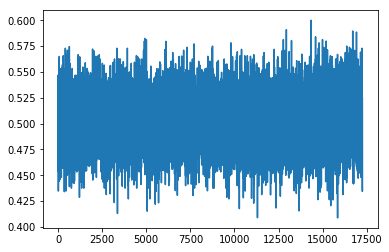

In [5]:
cartpole['acc'].plot()

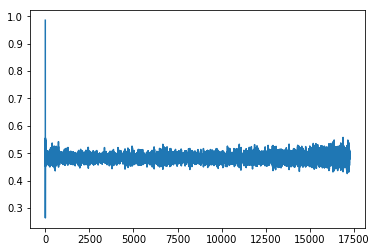

In [6]:
cartpole['loss'].plot()

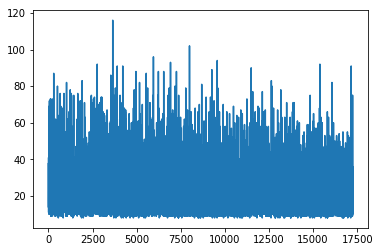

In [7]:
cartpole['episode_reward'].plot()